**Author:** *Amine El Hablani* aminehableni1898@gmail.com

# Abstract

This data science project focuses on **predicting the prices of used cars based on their features.** Through a systematic approach, the project encompasses **data discovery, preprocessing, exploratory data analysis (EDA), feature encoding, model training, and model optimization.**

The project begins with **data discovery and preprocessing** to ensure the quality of the dataset. **EDA techniques such as ANOVA and correlation analysi**s are employed to gain insights into **the relationships between car features and prices.**

Since the dataset contains categorical features, **data encoding** is performed to **convert them into numerical features.** The **data is then split into training and testing sets** to proceed with the modeling phase. **Multiple modeling approaches,** including **linear regression, k-nearest neighbors (KNN), random forest regressor, and neural networks,** are explored to identify **the most effective approach for predicting used car prices.**

To **optimize the models,** the project investigates **the impact of Data Standardization and applying principal component analysis (PCA).** By **automating the optimization process,** the project explores **various hyperparameters** to achieve **the best model performance.**

**A comparative analysis** is conducted to **evaluate** the performance of **different modeling approaches.** The findings aim to **identify the most effective approach for predicting used car prices** and draw important insights regarding **the importance of Data Standardization and PCA.** Based on these findings, **the project concludes the best model for the given task.**


# Introduction

### Company Backgroun

You have been hired as a data scientist at Discount Motors, a used car dealership in the UK.
The dealership is expanding and has hired a large number of junior salespeople. Although
promising, these junior employees have difficulties pricing used cars that arrive at the
dealership. Sales have declined 18% in recent months.
The sales team have reached out to the data science team to get help with this problem.

## Customer Question


The sales team wants to know:

● Can you predict the price that a used car should be listed at based on features of the
car?

## Success Criteria


It is known that cars that are more than £1500 from the estimated price will not sell. The sales
team wants to know whether you can make predictions within this range.

# Data Preprocessing

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import pandas as pd 
import pingouin

C:\Users\amine\AppData\Local\Programs\Python\Python310\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
C:\Users\amine\AppData\Local\Programs\Python\Python310\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
data=pd.read_csv('toyota.csv')

In [ ]:
data.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0
2,GT86,2015,13998,Manual,27469,Petrol,265,36.2,2.0
3,GT86,2017,18998,Manual,14736,Petrol,150,36.2,2.0
4,GT86,2017,17498,Manual,36284,Petrol,145,36.2,2.0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6738 entries, 0 to 6737
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         6738 non-null   object 
 1   year          6738 non-null   int64  
 2   price         6738 non-null   int64  
 3   transmission  6738 non-null   object 
 4   mileage       6738 non-null   int64  
 5   fuelType      6738 non-null   object 
 6   tax           6738 non-null   int64  
 7   mpg           6738 non-null   float64
 8   engineSize    6738 non-null   float64
dtypes: float64(2), int64(4), object(3)
memory usage: 473.9+ KB


In [ ]:
data.describe()

,year,price,mileage,tax,mpg,engineSize
count,6738.000000,6738.000000,6738.000000,6738.000000,6738.000000,6738.000000
mean,2016.748145,12522.391066,22857.413921,94.697240,63.042223,1.471297
std,2.204062,6345.017587,19125.464147,73.880776,15.836710,0.436159
min,1998.000000,850.000000,2.000000,0.000000,2.800000,0.000000
25%,2016.000000,8290.000000,9446.000000,0.000000,55.400000,1.000000
50%,2017.000000,10795.000000,18513.000000,135.000000,62.800000,1.500000
75%,2018.000000,14995.000000,31063.750000,145.000000,69.000000,1.800000
max,2020.000000,59995.000000,174419.000000,565.000000,235.000000,4.500000


In [ ]:
data.isnull().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
dtype: int64

In [ ]:
#check the unique values 

In [ ]:
data['year'].unique()

array([2016, 2017, 2015, 2020, 2013, 2019, 2018, 2014, 2012, 2005, 2003,
       2004, 2001, 2008, 2007, 2010, 2011, 2006, 2009, 2002, 1999, 2000,
       1998], dtype=int64)

In [ ]:
data['model'].unique()

array([' GT86', ' Corolla', ' RAV4', ' Yaris', ' Auris', ' Aygo', ' C-HR',
       ' Prius', ' Avensis', ' Verso', ' Hilux', ' PROACE VERSO',
       ' Land Cruiser', ' Supra', ' Camry', ' Verso-S', ' IQ',
       ' Urban Cruiser'], dtype=object)

In [ ]:
data['transmission'].unique()

array(['Manual', 'Automatic', 'Semi-Auto', 'Other'], dtype=object)

In [ ]:
data['fuelType'].unique()

array(['Petrol', 'Other', 'Hybrid', 'Diesel'], dtype=object)

In [ ]:
data['engineSize'].unique()

array([2. , 1.8, 1.2, 1.6, 1.4, 2.5, 2.2, 1.5, 1. , 1.3, 0. , 2.4, 3. ,
       2.8, 4.2, 4.5])

In [ ]:
data.describe()

,year,price,mileage,tax,mpg,engineSize
count,6738.000000,6738.000000,6738.000000,6738.000000,6738.000000,6738.000000
mean,2016.748145,12522.391066,22857.413921,94.697240,63.042223,1.471297
std,2.204062,6345.017587,19125.464147,73.880776,15.836710,0.436159
min,1998.000000,850.000000,2.000000,0.000000,2.800000,0.000000
25%,2016.000000,8290.000000,9446.000000,0.000000,55.400000,1.000000
50%,2017.000000,10795.000000,18513.000000,135.000000,62.800000,1.500000
75%,2018.000000,14995.000000,31063.750000,145.000000,69.000000,1.800000
max,2020.000000,59995.000000,174419.000000,565.000000,235.000000,4.500000


In [ ]:
data.duplicated().sum()

39

In [ ]:
data = data.drop_duplicates()

In [ ]:
data.duplicated().sum()

0

# Exploratory Data Analysis

In [ ]:
data.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0
2,GT86,2015,13998,Manual,27469,Petrol,265,36.2,2.0
3,GT86,2017,18998,Manual,14736,Petrol,150,36.2,2.0
4,GT86,2017,17498,Manual,36284,Petrol,145,36.2,2.0


## Price

Text(0.5, 1.0, 'price spreed')

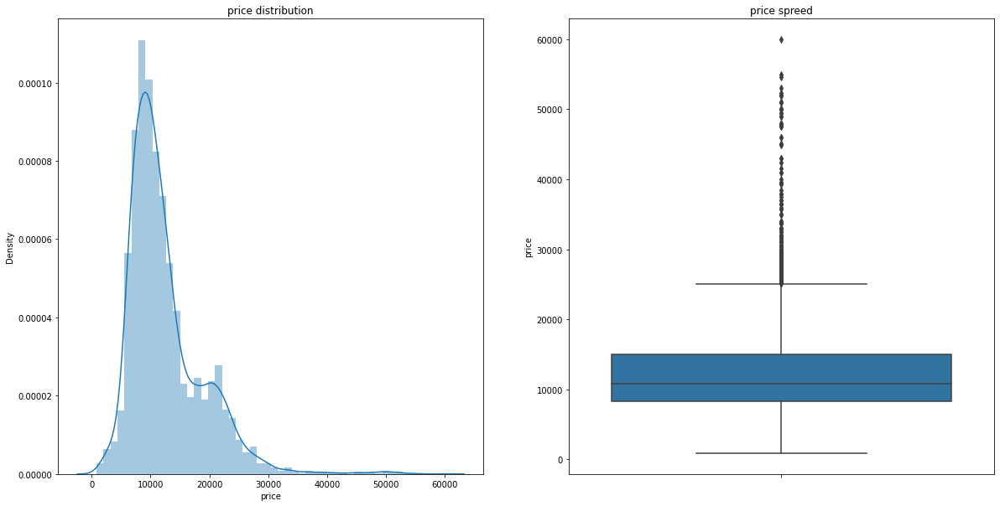

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('price distribution')
sns.distplot(data['price'])

plt.subplot(122)
sns.boxplot(y=data['price'])
plt.title('price spreed')

In [ ]:
data['price'].describe(percentiles=[0,0.25,0.5,0.75,0.95,1]) 

count     6699.000000
mean     12529.799074
std       6358.562625
min        850.000000
0%         850.000000
25%       8266.500000
50%      10798.000000
75%      14995.000000
95%      23995.000000
100%     59995.000000
max      59995.000000
Name: price, dtype: float64

In [ ]:
q2 = data['price'].quantile(0.75)
q1 = data['price'].quantile(0.25)
iqr= q2 - q1
q2+ iqr*1.5 


25087.75

**inference:**

- the plot of "Price distribution" is right skewed 

=> 95% of prices are less then 23995£
=> the prices that are more than 25087.75£ are outliers => they are significantly deviate from the general pattern 

=> we gonna use ***median*** ( average) instead of mean to gain more accurate results

­

## Transmission vs Price 

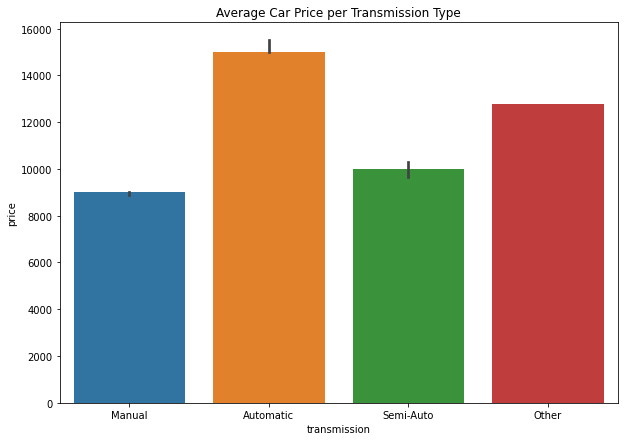

In [ ]:
plt.figure(figsize=(10,7))
plt.title("Average Car Price per Transmission Type")
ax=sns.barplot(data['transmission'],data['price'],estimator=np.median)



In [ ]:
#calculating confidance interval

min_interval=np.array([line.get_ydata().min() for line in ax.lines])
max_interval=np.array([line.get_ydata().max() for line in ax.lines])
mean_interval=np.array([line.get_ydata().mean() for line in ax.lines])
difference = max_interval - mean_interval          #confidance interval
difference.tolist()

[54.0, 255.66250000000036, 311.28125, nan]

In [ ]:
mean_interval

array([ 8944.     , 15242.3625 ,  9981.28125,         nan])

In [ ]:
data[data['transmission']=='Manual']['price'].median() - difference[1]  , data[data['transmission']=='Manual']['price'].median()+difference[1]

(8739.3375, 9250.6625)

**inference:**

- The ***automatic*** cars have the ***highest*** average of car price witha an ***average ≃ 15 000 £*** and a small confidence interval of ***± 301.5 £***

- The ***manual*** cars have the ***lowest*** average of car price witha an ***average = 8944 £*** and a very small confidence interval of ***± 54 £***

- The ***semi-auto*** cars have an ***average ≈ 10 000 £*** and a small confidence interval of ***± 332 £***

­

<AxesSubplot:title={'center':'Price Distribution Per Transmission Type'}, xlabel='transmission', ylabel='price'>

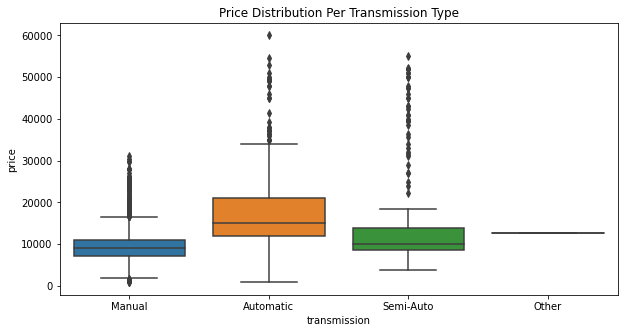

In [ ]:
plt.figure(figsize=(10,5))

plt.title('Price Distribution Per Transmission Type')
sns.boxplot(data['transmission'],data['price'])


In [ ]:
data[data['transmission']=='Manual']['price'].describe(percentiles=[0,0.25,0.5,0.75,0.80,1])

count     3793.000000
mean      9541.009755
std       3629.072366
min        850.000000
0%         850.000000
25%       7275.000000
50%       8995.000000
75%      10995.000000
80%      11684.000000
100%     31000.000000
max      31000.000000
Name: price, dtype: float64

In [ ]:
data[data['transmission']=='Automatic']['price'].describe(percentiles=[0,0.25,0.5,0.75,0.95,1])

count     2651.000000
mean     16588.761222
std       6334.821757
min        899.000000
0%         899.000000
25%      11991.000000
50%      14999.000000
75%      20990.000000
95%      26993.000000
100%     59995.000000
max      59995.000000
Name: price, dtype: float64

In [ ]:
data[data['transmission']=='Semi-Auto']['price'].describe(percentiles=[0,0.25,0.5,0.68,0.95,1])

count      254.000000
mean     14797.137795
std      11872.081853
min       3750.000000
0%        3750.000000
25%       8708.750000
50%       9995.000000
68%      11795.200000
95%      46521.050000
100%     54991.000000
max      54991.000000
Name: price, dtype: float64

**inference :**

- 80 % of the Manual cars price is less than 11684 £ 
- 75 % of the Automatic cars price is higher than 11991 £
- 68 % of the Semi-Auto cars price is less than 11795 £ 

=> 75% of the Automatic cars are more expensive than 80 % of Manual cars and than 68% of Semi-Auto cars  



**is this differences between transmission types significant ?**

In [ ]:
data[data['transmission']=='Other'].shape[0]

1

In [ ]:
data2=data[data['transmission']!='Other']   #we remove the 'Other' 

alpha = 0.01  (1%)  
- H0: The Differences between Transmission types in car prices are not statistically significant.

- H1: At least 2 Transmission types have a significant diffrences

In [ ]:
pingouin.anova(data=data2,
               dv='price',
               between='transmission')

,Source,ddof1,ddof2,F,p-unc,np2
0,transmission,2,6695,1375.375372,0.0,0.291216


**Inference :**

- => p value < alpha  => Reject H0  
- => At least 2 transmission types have a significant difference in car price

**Which transmission types have a significant difference?**

In [ ]:
pingouin.pairwise_ttests(data=data2,
                        dv='price',
                        between='transmission',
                        padjust='bonf')                    #we use Bonf correction to avoid false positive error 

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,transmission,Automatic,Manual,False,True,51.662873,3863.083011,two-sided,0.000000e+00,0.000000e+00,bonf,inf,1.430707
1,transmission,Automatic,Semi-Auto,False,True,2.372971,266.972820,two-sided,1.835424e-02,5.506271e-02,bonf,1.171,0.256099
2,transmission,Manual,Semi-Auto,False,True,-7.033984,256.175441,two-sided,1.824999e-11,5.474996e-11,bonf,2.482e+09,-1.142368


**Inference :** 

all the P-values are smaller than alpha 

**=> The Differences in Price between all the transmission types are significant** 

## Model vs Price 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, ' GT86'),
  Text(1, 0, ' Corolla'),
  Text(2, 0, ' RAV4'),
  Text(3, 0, ' Yaris'),
  Text(4, 0, ' Auris'),
  Text(5, 0, ' Aygo'),
  Text(6, 0, ' C-HR'),
  Text(7, 0, ' Prius'),
  Text(8, 0, ' Avensis'),
  Text(9, 0, ' Verso'),
  Text(10, 0, ' Hilux'),
  Text(11, 0, ' PROACE VERSO'),
  Text(12, 0, ' Land Cruiser'),
  Text(13, 0, ' Supra'),
  Text(14, 0, ' Camry'),
  Text(15, 0, ' Verso-S'),
  Text(16, 0, ' IQ'),
  Text(17, 0, ' Urban Cruiser')])

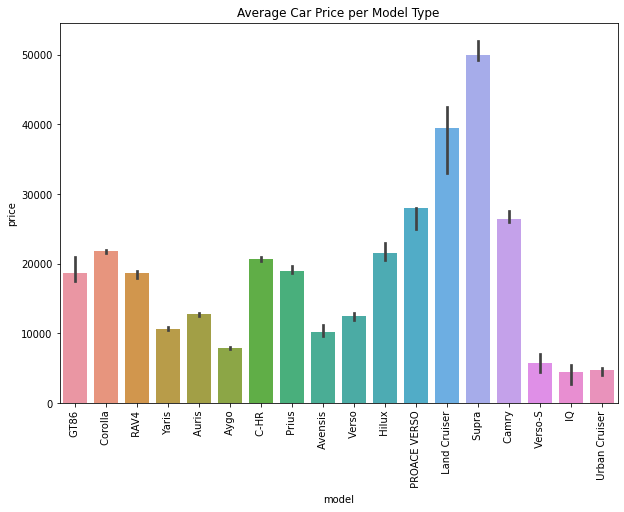

In [ ]:
plt.figure(figsize=(10,7))
plt.title("Average Car Price per Model Type")
ax=sns.barplot(data['model'],data['price'],estimator=np.median)
plt.xticks(rotation=90)



In [ ]:
#calculating confidance interval

min_interval=np.array([line.get_ydata().min() for line in ax.lines])
max_interval=np.array([line.get_ydata().max() for line in ax.lines])
mean_interval=np.array([line.get_ydata().mean() for line in ax.lines])
difference = max_interval - mean_interval          #confidance interval
difference.tolist()

[1747.5,
 255.0,
 505.0,
 194.5,
 250.0,
 120.0,
 272.5,
 538.0625,
 788.1812499999996,
 500.0,
 1250.0,
 1504.0,
 4728.82499999999,
 1387.5,
 780.0,
 1272.5,
 1387.0937499999995,
 500.0]

In [ ]:
mean_interval

array([19247.5    , 21745.     , 18495.     , 10692.5    , 12745.     ,
        7870.     , 20722.5    , 19172.9375 , 10411.95625, 12490.     ,
       21745.     , 26494.     , 37728.825  , 50607.5    , 26770.     ,
        5722.5    ,  4086.09375,  4495.     ])

**Inference :**

- "Supra" and "Land Cruiser" are the most expensive models :
    - supra have an ***average = 50 607 £*** and a confidence interval of ***± 1387.5 £***
    - Land Cruiser have an ***average = 38 157 £*** and the biggest confidence interval of ***± 4287 £***

- "IQ", "Verso-S" and "Urban Cruiser" are the cheapest models :
    - IQ have an ***average = 4099.5 £*** and a confidence interval of ***± 1400.5 £***
    - Verso-S have an ***average = 5722.5 £*** and a confidence interval of ***± 1272.5 £***  
    - Urban Cruiser have an ***average = 4495 £*** and a confidence interval of ***± 500 £***        

**is the the diffrences in prices between the models significant ?** 

- H0: The Differences between Models types in car prices are not statistically significant.
- H1: At least 2 Models types have a significant diffrences

In [ ]:
pingouin.anova(data=data2,
              dv='price',
              between='model')

,Source,ddof1,ddof2,F,p-unc,np2
0,model,17,6680,940.562518,0.0,0.705332


- p-value < alpha => Reject H0  
=> At least 2 models types have a significant difference 

In [ ]:
alpha=0.01

In [ ]:
result=pingouin.pairwise_ttests(data=data2,
                        dv='price',
                        between='model',
                        padjust='bonf')  #we use Bonf correction to avoid false positive error 

result[result['p-corr']< alpha].shape[0]

120

**=> Theres is 120 pairs of car's model have a significant difference**

## Year vs Price

(array([1995., 2000., 2005., 2010., 2015., 2020., 2025.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

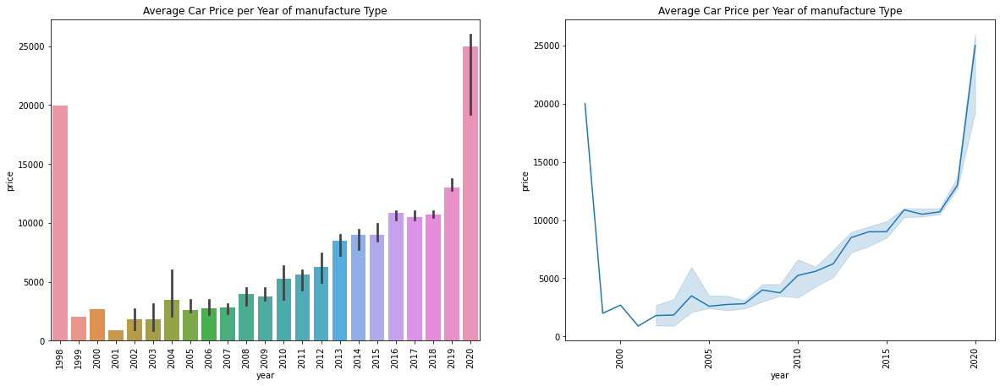

In [ ]:
plt.figure(figsize=(20,7))

plt.subplot(121)
plt.title("Average Car Price per Year of manufacture Type")
ax=sns.barplot(data['year'],data['price'],estimator=np.median)
plt.xticks(rotation=90)

plt.subplot(122)
plt.title("Average Car Price per Year of manufacture Type")
ax=sns.lineplot(data['year'],data['price'],estimator=np.median)
plt.xticks(rotation=90)



**Inference:**

- It is so clear that younger cars tend to have higher prices.

**are these results significant ?** 

H0 :The Year of manufacturing has no significant impact on car prices.

H1 : The Year of manufacturing has a significant impact on car prices

In [ ]:
pingouin.anova(data=data2,
              dv='price',
              between="year")

,Source,ddof1,ddof2,F,p-unc,np2
0,year,22,6675,92.666287,0.0,0.233961


- P-value < alpha => Reject H0 

**=> The Year of manufacturing has a significant impact on car prices**

## Fuel Type vs Price

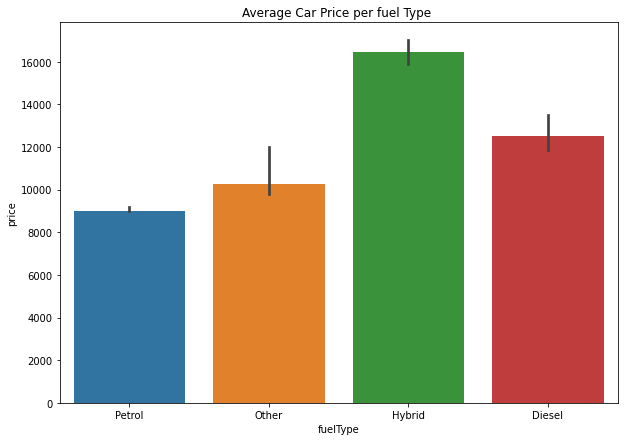

In [ ]:

plt.figure(figsize=(10,7))
plt.title("Average Car Price per fuel Type ")
ax=sns.barplot(data['fuelType'],data['price'],estimator=np.median)



In [ ]:
data['fuelType'].value_counts()

Petrol    4058
Hybrid    2040
Diesel     496
Other      105
Name: fuelType, dtype: int64

In [ ]:
#calculating confidance interval

min_interval=np.array([line.get_ydata().min() for line in ax.lines])
max_interval=np.array([line.get_ydata().max() for line in ax.lines])
mean_interval=np.array([line.get_ydata().mean() for line in ax.lines])
difference = max_interval - mean_interval          #confidance interval
difference.tolist()

[93.81875000000036, 1102.0, 555.125, 810.4249999999993]

In [ ]:
mean_interval

array([ 9088.81875, 10893.     , 16439.875  , 12686.575  ])

**Inference :** 

- The cars that use **Hybrid** have the ***highest*** average of car price witha an ***average = 16 423.75 £*** and a confidence interval of ***± 571.25 £***

- The cars that use **Petrol** have the ***lowest*** average of car price witha an ***average = 9095 £*** and a very small confidence interval of ***± 100 £***


**are these results significant ?** 

H0 :The fuel type has no significant impact on car prices.

H1 : The fuel type has a significant impact on car prices

In [ ]:
pingouin.anova(data=data2,
              dv='price',
              between="fuelType")

,Source,ddof1,ddof2,F,p-unc,np2
0,fuelType,3,6694,950.750541,0.0,0.298782


- P-value < alpha => Reject H0 

**=> The fuel type has a significant impact on car prices.**

In [ ]:
pingouin.pairwise_ttests(data=data2,
                        dv='price',
                        between='fuelType',
                        padjust='bonf')                    #we use Bonf correction to avoid false positive error 

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,fuelType,Diesel,Hybrid,False,True,-3.040117,565.477611,two-sided,2.474295e-03,1.484577e-02,bonf,5.429,-0.216444
1,fuelType,Diesel,Other,False,True,1.783762,184.281164,two-sided,7.610798e-02,4.566479e-01,bonf,0.545,0.163085
2,fuelType,Diesel,Petrol,False,True,12.852554,514.863794,two-sided,5.495510e-33,3.297306e-32,bonf,5.377e+33,1.156691
3,fuelType,Hybrid,Other,False,True,3.878941,109.083843,two-sided,1.797955e-04,1.078773e-03,bonf,156.662,0.544295
4,fuelType,Hybrid,Petrol,False,True,53.944048,3239.190640,two-sided,0.000000e+00,0.000000e+00,bonf,inf,1.603549
5,fuelType,Other,Petrol,False,True,5.566361,105.444551,two-sided,1.994192e-07,1.196515e-06,bonf,3.541e+05,1.019426


## Engine Size vs Price 

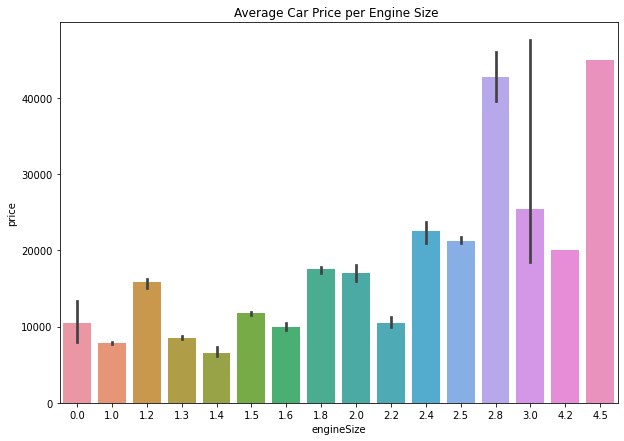

In [ ]:

plt.figure(figsize=(10,7))
plt.title("Average Car Price per Engine Size ")
ax=sns.barplot(data['engineSize'],data['price'],estimator=np.median)



In [ ]:
#calculating confidance interval

min_interval=np.array([line.get_ydata().min() for line in ax.lines])
max_interval=np.array([line.get_ydata().max() for line in ax.lines])
mean_interval=np.array([line.get_ydata().mean() for line in ax.lines])
difference = max_interval - mean_interval          #confidance interval
difference.tolist()

[2650.0,
 138.0,
 626.1437500000011,
 212.51250000000073,
 591.25,
 165.25,
 500.0,
 401.5,
 1001.25,
 617.0,
 1350.5437500000007,
 388.3624999999993,
 3226.0,
 14510.125,
 nan,
 nan]

In [ ]:
mean_interval

array([10650.     ,  7838.     , 15623.64375,  8512.     ,  6691.25   ,
       11684.75   ,  9995.     , 17396.5    , 16996.25   , 10608.     ,
       22348.54375, 21378.3625 , 42724.     , 32987.875  ,         nan,
               nan])

**Inference:**

- cars with engine size = 2.8 have the highest average of car price witha an average = 42724 £ and a confidence interval of ± 3226 £
- cars with engine size = 1.4 have the lowest average of car price witha an average = 6778.75 £ and a confidence interval of ± 503.75 £

**are these results significant ?** 

H0 :The engine size has no significant impact on car prices.

H1 : The engine sizes has a significant impact on car prices

In [ ]:
pingouin.anova(data=data2,
              dv='price',
              between="engineSize")

,Source,ddof1,ddof2,F,p-unc,np2
0,engineSize,15,6682,914.763267,0.0,0.672506


- P-value < alpha => Reject H0 

**=> The engine sizes has a significant impact on car prices**

## miles per gallon vs Price 

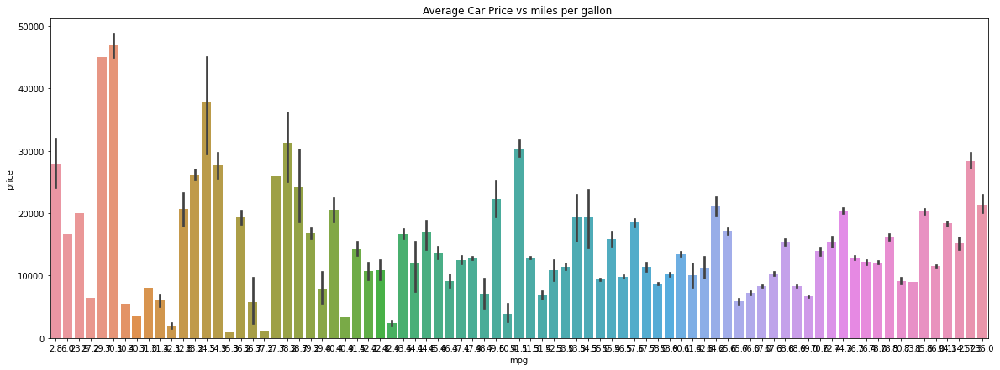

In [ ]:

plt.figure(figsize=(20,7))
plt.title("Average Car Price vs miles per gallon ")
ax=sns.barplot(data['mpg'],data['price'])


**are these results significant ?**


H0 :The "miles per gallon" has no significant impact on car prices.

H1 : The "miles per gallon" has a significant impact on car prices

In [ ]:
pingouin.anova(data=data2,
              dv='price',
              between="mpg")

,Source,ddof1,ddof2,F,p-unc,np2
0,mpg,80,6617,175.508986,0.0,0.679684


- P-value < alpha => Reject H0 

**The "miles per gallon" has a significant impact on car prices**

## Mileage vs Price

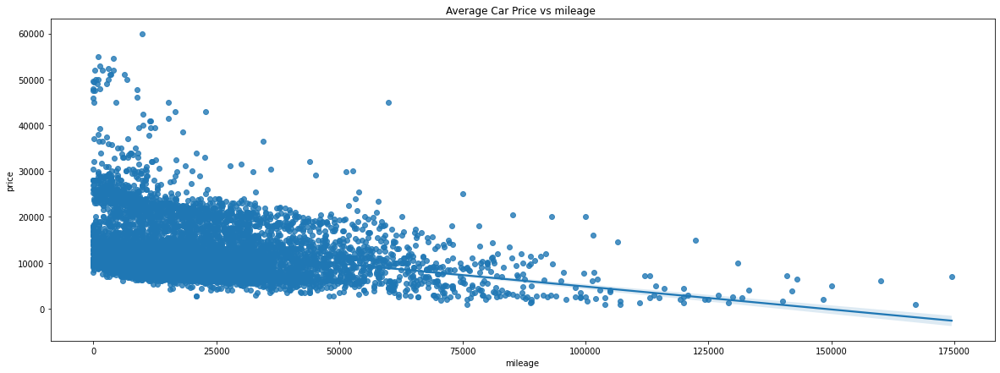

In [ ]:

plt.figure(figsize=(20,7))
plt.title("Average Car Price vs mileage ")
ax=sns.regplot(data['mileage'],data['price'])


In [ ]:
data['mileage'].corr(data['price'])

-0.3005976205893007

**Inference:**

- there is a negative correlation between the Mileage traveled and price

**=> As the mileage increases, the car price tends to decrease.**

## Tax vs Price 

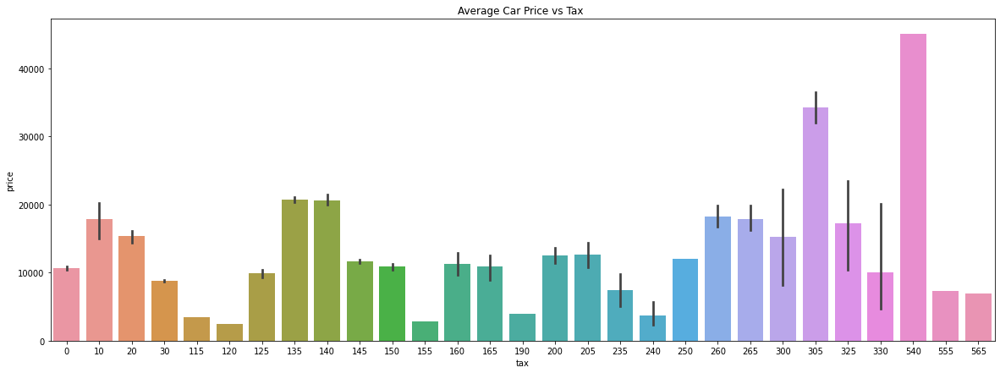

In [ ]:

plt.figure(figsize=(20,7))
plt.title("Average Car Price vs Tax ")
ax=sns.barplot(data['tax'],data['price'])


In [ ]:
test=data['tax'].value_counts() 

In [ ]:
test=test[test>20].index

In [ ]:
data3= data2[data2['tax'].isin(test)]

**are these results significant ?**

H0 :The tax has no significant impact on car prices.

H1 : The tax has a significant impact on car prices

In [ ]:
pingouin.anova(data=data3,
              dv='price',
              between="tax")

,Source,ddof1,ddof2,F,p-unc,np2
0,tax,15,6634,217.816422,0.0,0.329983


**=> The tax has a significant impact on car prices**

# Data Preparation

In [ ]:
data.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0
2,GT86,2015,13998,Manual,27469,Petrol,265,36.2,2.0
3,GT86,2017,18998,Manual,14736,Petrol,150,36.2,2.0
4,GT86,2017,17498,Manual,36284,Petrol,145,36.2,2.0


In [ ]:
dummies=pd.get_dummies(data,columns=['model','transmission','fuelType'])

In [ ]:
dummies.head()

,year,price,mileage,tax,mpg,engineSize,model_ Auris,model_ Avensis,model_ Aygo,model_ C-HR,...,model_ Verso-S,model_ Yaris,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,fuelType_Diesel,fuelType_Hybrid,fuelType_Other,fuelType_Petrol
0,2016,16000,24089,265,36.2,2.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
1,2017,15995,18615,145,36.2,2.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,2015,13998,27469,265,36.2,2.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,2017,18998,14736,150,36.2,2.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
4,2017,17498,36284,145,36.2,2.0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
features=dummies.drop('price',axis=1)

In [ ]:
features.head()

,year,mileage,tax,mpg,engineSize,model_ Auris,model_ Avensis,model_ Aygo,model_ C-HR,model_ Camry,...,model_ Verso-S,model_ Yaris,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,fuelType_Diesel,fuelType_Hybrid,fuelType_Other,fuelType_Petrol
0,2016,24089,265,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
1,2017,18615,145,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,2015,27469,265,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,2017,14736,150,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
4,2017,36284,145,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
target=dummies['price']

In [ ]:
target.head()

0    16000
1    15995
2    13998
3    18998
4    17498
Name: price, dtype: int64

# Modeling Without PCA (Without Data Standardization)

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
#import xgboost as xgb
#import lightgbm as lgb
from sklearn.ensemble import RandomForestRegressor

from sklearn.linear_model import LinearRegression
from sklearn import metrics


C:\Users\amine\AppData\Local\Programs\Python\Python310\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
import numpy as np
np.random.seed(42)

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=.2, random_state=10)

## Linear Regression 

In [ ]:
from sklearn.linear_model import LinearRegression 

In [ ]:
LR = LinearRegression()

In [ ]:
LR.fit(x_train, y_train)

LinearRegression()

In [ ]:
#test 

In [ ]:
predictions = LR.predict(x_test)

In [ ]:
LinearRegression_MAE = metrics.mean_absolute_error(predictions, y_test)
LinearRegression_MSE = metrics.mean_squared_error(predictions, y_test)
LinearRegression_R2 = metrics.r2_score(predictions, y_test)

In [ ]:
LinearRegression_R2

0.9283871740104979

In [ ]:
LinearRegression_MAE

1010.9988007015215

In [ ]:
predictions

array([ 7591.21473475, 11409.11809561, 14128.22635212, ...,
       13703.02440156, 15414.19793179,  6516.34025465])

In [ ]:
c_lr=0
c2=0
for i in (predictions - y_test):
    if i > 1500 :
        c_lr+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_lr,c2+c_lr))

The number of cars that will not be sold : 115 of 1340


## KNN

In [ ]:
KNN = KNeighborsClassifier()

In [ ]:
param_grid = {
    'n_neighbors': [3,4, 5,6, 7,8,9,10,11,12],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

In [ ]:
grid_search = GridSearchCV(estimator=KNN, param_grid=param_grid, cv=5)
grid_search.fit(x_train, y_train)


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                         'weights': ['uniform', 'distance']})

In [ ]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_


In [ ]:
best_model

KNeighborsClassifier(metric='manhattan', n_neighbors=3)

In [ ]:
KNN_best=best_model

In [ ]:
KNN_best.fit(x_train,y_train) 

KNeighborsClassifier(metric='manhattan', n_neighbors=3)

In [ ]:
KNN_pred=KNN_best.predict(x_test)

In [ ]:
KNN_MAE = metrics.mean_absolute_error(KNN_pred, y_test)
KNN_MSE = metrics.mean_squared_error(KNN_pred, y_test)
KNN_R2 = metrics.r2_score(KNN_pred, y_test)

In [ ]:
KNN_R2

-4.320167449458187

In [ ]:
KNN_MAE

4698.258955223881

In [ ]:
KNN_MSE

48716210.90223881

In [ ]:
c_knn=0
c2=0
for i in (KNN_pred - y_test):
    if i > 1500 :
        c_knn+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_knn,c2+c_knn))

The number of cars that will not be sold : 125 of 1340


## Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [ ]:
RFR=RandomForestRegressor()

In [ ]:
RFR.fit(x_train,y_train)

RandomForestRegressor()

In [ ]:
rfr_predictions=RFR.predict(x_test)

In [ ]:
rfr_predictions

array([ 7742.12, 10839.72, 13593.56, ..., 12688.43, 16984.93,  7136.39])

In [ ]:
RFR_MAE = metrics.mean_absolute_error(rfr_predictions, y_test)
RFR_MSE = metrics.mean_squared_error(rfr_predictions, y_test)
RFR_R2 = metrics.r2_score(rfr_predictions, y_test)

In [ ]:
RFR_MAE

765.5814891257995

In [ ]:
RFR_R2

0.9659519971415846

In [ ]:
c_rfr=0
c2=0
for i in (rfr_predictions - y_test):
    if i > 1500 :
        c_rfr+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rfr,c2+c_rfr))

The number of cars that will not be sold : 72 of 1340


In [ ]:
############################""""""

In [ ]:
param_grid = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [None, 5, 10, 15],
}


In [ ]:
grid_search = GridSearchCV(estimator=RFR, param_grid=param_grid, cv=5)
grid_search.fit(x_train, y_train)


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 5, 10, 15],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [ ]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_


In [ ]:
best_params

{'max_depth': 10, 'n_estimators': 200}

In [ ]:
best_model

RandomForestRegressor(max_depth=10, n_estimators=200)

In [ ]:
rfr_test=best_model

In [ ]:
rfr_test.fit(x_train,y_train)

RandomForestRegressor(max_depth=10, n_estimators=200)

In [ ]:
rfr_test_pred=rfr_test.predict(x_test)

In [ ]:
RFR_MAE = metrics.mean_absolute_error(rfr_test_pred, y_test)
RFR_MSE = metrics.mean_squared_error(rfr_test_pred, y_test)
RFR_R2 = metrics.r2_score(rfr_test_pred, y_test)

In [ ]:
RFR_MAE

723.0327154113559

In [ ]:
RFR_R2

0.9680475393253811

In [ ]:
c_rfr=0
c2=0
for i in (rfr_test_pred - y_test):
    if i > 1500 :
        c_rfr+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rfr,c2+c_rfr))

The number of cars that will not be sold : 53 of 1340


## Neural Networks

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.regularizers import l2 
from tensorflow.keras.optimizers import Adam,Nadam,Adamax,RMSprop 
from sklearn.model_selection import GridSearchCV
import keras 
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.models import Sequential
from sklearn.metrics import mean_squared_error
from tensorflow.keras.callbacks import ReduceLROnPlateau


In [ ]:


# Define a function to create the Keras model
def create_model(learning_rate, hidden_units1,hidden_units2,optimizer):
    model = Sequential([
        Dense(hidden_units1, activation='relu', input_shape=(31,)),
        Dense(hidden_units2, activation='relu'),
        Dense(1)
    ])
    
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'adamax':
        opt = Adamax(learning_rate=learning_rate)
    elif optimizer == 'nadam':
        opt= Nadam(learning_rate=learning_rate)
    else:
        
        raise ValueError('Invalid optimizer provided.')
        
    model.compile(optimizer=opt, loss='mean_squared_error', metrics=['mean_absolute_error'])
    return model


In [ ]:

# Define the parameter grid for GridSearchCV
param_grid = {
    'learning_rate': [0.0001,0.001, 0.01, 0.1],
    'hidden_units': [16, 32, 64],
    'optimizer': ['adam', 'rmsprop', 'adamax','nadam']
    # Add other parameters as needed
}


In [ ]:
# Create an empty list to store the results
results = []

# Iterate over the parameter grid
for hidden_units1 in param_grid['hidden_units']:
    for hidden_units2 in param_grid['hidden_units']:
        
        for learning_rate in param_grid['learning_rate']:
            for optimizer in param_grid['optimizer']:
                print("#########################################")
                print(f' Layer1: {hidden_units1} neurones, \n Layer2: {hidden_units2} neurones, \n Learnin rate: {learning_rate},\n Optimizer: {optimizer}' )
                # Create the Keras model
                model = create_model(hidden_units1=hidden_units1,hidden_units2=hidden_units2, learning_rate=learning_rate, optimizer=optimizer)

                # Train the model
                model.fit(x_train, y_train, epochs=800, batch_size=64, verbose=2)

                # Make predictions on the validation set
                y_pred = model.predict(x_test)

                # Calculate the mean squared error (MSE)
                mse = mean_squared_error(y_test, y_pred)

                # Store the results
                results.append({
                    'hidden_units1': hidden_units1,
                    'hidden_units2': hidden_units2,
                    'learning_rate': learning_rate,
                    'optimizer': optimizer,
                    'mse': mse
                })



#########################################
 Layer1: 16 neurones, 
 Layer2: 16 neurones, 
 Learnin rate: 0.0001,
 Optimizer: adam
Epoch 1/800
85/85 - 1s - loss: 342259840.0000 - mean_absolute_error: 17373.8398 - 704ms/epoch - 8ms/step
Epoch 2/800
85/85 - 0s - loss: 278661376.0000 - mean_absolute_error: 15515.0488 - 125ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 232856272.0000 - mean_absolute_error: 13937.7441 - 134ms/epoch - 2ms/step
Epoch 4/800
85/85 - 0s - loss: 198901840.0000 - mean_absolute_error: 12535.9170 - 118ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 173507568.0000 - mean_absolute_error: 11324.2109 - 130ms/epoch - 2ms/step
Epoch 6/800
85/85 - 0s - loss: 155284288.0000 - mean_absolute_error: 10372.7588 - 128ms/epoch - 2ms/step
Epoch 7/800
85/85 - 0s - loss: 142859920.0000 - mean_absolute_error: 9670.6328 - 134ms/epoch - 2ms/step
Epoch 8/800
85/85 - 0s - loss: 134692160.0000 - mean_absolute_error: 9199.3330 - 138ms/epoch - 2ms/step
Epoch 9/800
85/85 - 0s - loss: 129

Epoch 79/800
85/85 - 0s - loss: 38799824.0000 - mean_absolute_error: 4631.4624 - 121ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 38735308.0000 - mean_absolute_error: 4647.4937 - 124ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 38670768.0000 - mean_absolute_error: 4638.5137 - 114ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 38572216.0000 - mean_absolute_error: 4644.4971 - 128ms/epoch - 2ms/step
Epoch 83/800
85/85 - 0s - loss: 38501468.0000 - mean_absolute_error: 4640.9297 - 132ms/epoch - 2ms/step
Epoch 84/800
85/85 - 0s - loss: 38409668.0000 - mean_absolute_error: 4640.3159 - 134ms/epoch - 2ms/step
Epoch 85/800
85/85 - 0s - loss: 38361804.0000 - mean_absolute_error: 4634.7080 - 134ms/epoch - 2ms/step
Epoch 86/800
85/85 - 0s - loss: 38263692.0000 - mean_absolute_error: 4635.0039 - 124ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 38203416.0000 - mean_absolute_error: 4636.1284 - 140ms/epoch - 2ms/step
Epoch 88/800
85/85 - 0s - loss: 38135952.0000 - mean_absolute_er

Epoch 158/800
85/85 - 0s - loss: 36326568.0000 - mean_absolute_error: 4597.1172 - 117ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 36320308.0000 - mean_absolute_error: 4588.0576 - 120ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 36301496.0000 - mean_absolute_error: 4590.7612 - 116ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 36308704.0000 - mean_absolute_error: 4596.4111 - 123ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 36274400.0000 - mean_absolute_error: 4589.7480 - 120ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 36311744.0000 - mean_absolute_error: 4600.7754 - 122ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 36282200.0000 - mean_absolute_error: 4592.1104 - 121ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 36254112.0000 - mean_absolute_error: 4591.3145 - 116ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 36243604.0000 - mean_absolute_error: 4585.5742 - 121ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 36276752.0000 - mean_a

Epoch 237/800
85/85 - 0s - loss: 35819916.0000 - mean_absolute_error: 4567.5972 - 101ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 35808036.0000 - mean_absolute_error: 4570.7720 - 100ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 35822608.0000 - mean_absolute_error: 4576.5210 - 101ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 35789872.0000 - mean_absolute_error: 4570.6611 - 101ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 35821052.0000 - mean_absolute_error: 4573.6709 - 98ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 35793332.0000 - mean_absolute_error: 4578.4971 - 103ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 35786704.0000 - mean_absolute_error: 4573.7168 - 106ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 35790088.0000 - mean_absolute_error: 4572.7607 - 100ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 35787808.0000 - mean_absolute_error: 4568.8770 - 100ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 35788768.0000 - mean_ab

85/85 - 0s - loss: 35498056.0000 - mean_absolute_error: 4557.9146 - 99ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 35476940.0000 - mean_absolute_error: 4554.1724 - 101ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 35475796.0000 - mean_absolute_error: 4561.7969 - 117ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 35475484.0000 - mean_absolute_error: 4556.3838 - 95ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 35477884.0000 - mean_absolute_error: 4556.5635 - 101ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 35470692.0000 - mean_absolute_error: 4554.5117 - 115ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 35474296.0000 - mean_absolute_error: 4550.1880 - 102ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 35485160.0000 - mean_absolute_error: 4554.9990 - 117ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 35494344.0000 - mean_absolute_error: 4559.4678 - 105ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 35451400.0000 - mean_absolute_error: 4

Epoch 394/800
85/85 - 0s - loss: 35207312.0000 - mean_absolute_error: 4534.3638 - 116ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 35205588.0000 - mean_absolute_error: 4538.7886 - 100ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 35193756.0000 - mean_absolute_error: 4532.8013 - 115ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 35212160.0000 - mean_absolute_error: 4531.6313 - 116ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 35232544.0000 - mean_absolute_error: 4547.6924 - 99ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 35172056.0000 - mean_absolute_error: 4535.4062 - 119ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 35176492.0000 - mean_absolute_error: 4535.2559 - 120ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 35180120.0000 - mean_absolute_error: 4539.9360 - 100ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 35167712.0000 - mean_absolute_error: 4531.8926 - 99ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 35190884.0000 - mean_abs

85/85 - 0s - loss: 34914236.0000 - mean_absolute_error: 4523.8066 - 117ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 34932596.0000 - mean_absolute_error: 4514.3936 - 110ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 34911412.0000 - mean_absolute_error: 4512.4082 - 116ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 34907100.0000 - mean_absolute_error: 4519.0889 - 98ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 34911652.0000 - mean_absolute_error: 4510.7944 - 118ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 34920840.0000 - mean_absolute_error: 4515.1470 - 121ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 34888320.0000 - mean_absolute_error: 4512.6484 - 108ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 34885904.0000 - mean_absolute_error: 4509.3657 - 118ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 34884152.0000 - mean_absolute_error: 4511.9214 - 95ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 34907768.0000 - mean_absolute_error: 4

Epoch 551/800
85/85 - 0s - loss: 34632268.0000 - mean_absolute_error: 4498.3496 - 98ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 34607800.0000 - mean_absolute_error: 4493.5811 - 99ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 34615792.0000 - mean_absolute_error: 4487.4614 - 117ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 34610748.0000 - mean_absolute_error: 4491.7563 - 100ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 34594740.0000 - mean_absolute_error: 4496.5771 - 106ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 34633072.0000 - mean_absolute_error: 4492.6885 - 101ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 34588280.0000 - mean_absolute_error: 4487.2378 - 93ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 34590196.0000 - mean_absolute_error: 4491.8789 - 117ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 34571500.0000 - mean_absolute_error: 4490.6392 - 100ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 34574624.0000 - mean_abso

Epoch 630/800
85/85 - 0s - loss: 34299812.0000 - mean_absolute_error: 4461.6353 - 100ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 34265164.0000 - mean_absolute_error: 4465.6685 - 101ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 34319392.0000 - mean_absolute_error: 4467.5693 - 110ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 34250192.0000 - mean_absolute_error: 4456.4233 - 116ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 34253796.0000 - mean_absolute_error: 4471.3081 - 110ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 34253004.0000 - mean_absolute_error: 4449.9067 - 107ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 34232012.0000 - mean_absolute_error: 4462.7207 - 108ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 34245512.0000 - mean_absolute_error: 4455.3999 - 116ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 34220488.0000 - mean_absolute_error: 4463.9717 - 102ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 34235680.0000 - mean_a

85/85 - 0s - loss: 33896620.0000 - mean_absolute_error: 4433.5420 - 109ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 33887084.0000 - mean_absolute_error: 4420.6514 - 95ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 33913480.0000 - mean_absolute_error: 4442.4492 - 121ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 33860704.0000 - mean_absolute_error: 4427.3862 - 98ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 33857800.0000 - mean_absolute_error: 4428.0547 - 104ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 33877604.0000 - mean_absolute_error: 4430.9004 - 104ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 33861136.0000 - mean_absolute_error: 4423.6118 - 100ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 33844388.0000 - mean_absolute_error: 4417.9453 - 116ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 33858092.0000 - mean_absolute_error: 4429.9043 - 106ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 33848668.0000 - mean_absolute_error: 4

Epoch 787/800
85/85 - 0s - loss: 33454344.0000 - mean_absolute_error: 4388.8193 - 96ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 33439310.0000 - mean_absolute_error: 4388.9272 - 109ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 33400276.0000 - mean_absolute_error: 4390.6353 - 98ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 33445702.0000 - mean_absolute_error: 4389.3672 - 99ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 33396280.0000 - mean_absolute_error: 4386.8340 - 86ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 33399636.0000 - mean_absolute_error: 4393.9365 - 100ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 33397182.0000 - mean_absolute_error: 4382.3530 - 98ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 33373640.0000 - mean_absolute_error: 4391.6562 - 111ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 33371922.0000 - mean_absolute_error: 4393.1582 - 100ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 33398866.0000 - mean_absolu

Epoch 64/800
85/85 - 0s - loss: 39433776.0000 - mean_absolute_error: 4491.7856 - 100ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 38962244.0000 - mean_absolute_error: 4504.4551 - 103ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 38577824.0000 - mean_absolute_error: 4518.7148 - 100ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 38314216.0000 - mean_absolute_error: 4541.6309 - 100ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 38072952.0000 - mean_absolute_error: 4554.9375 - 116ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 37891252.0000 - mean_absolute_error: 4567.3594 - 100ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 37751036.0000 - mean_absolute_error: 4577.8477 - 116ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 37634220.0000 - mean_absolute_error: 4597.9175 - 100ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 37531800.0000 - mean_absolute_error: 4600.8350 - 101ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 37453824.0000 - mean_absolute_er

Epoch 143/800
85/85 - 0s - loss: 35813328.0000 - mean_absolute_error: 4586.0669 - 132ms/epoch - 2ms/step
Epoch 144/800
85/85 - 0s - loss: 35806984.0000 - mean_absolute_error: 4578.9634 - 126ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 35794332.0000 - mean_absolute_error: 4592.4424 - 135ms/epoch - 2ms/step
Epoch 146/800
85/85 - 0s - loss: 35805512.0000 - mean_absolute_error: 4588.5649 - 151ms/epoch - 2ms/step
Epoch 147/800
85/85 - 0s - loss: 35751920.0000 - mean_absolute_error: 4578.0229 - 129ms/epoch - 2ms/step
Epoch 148/800
85/85 - 0s - loss: 35785316.0000 - mean_absolute_error: 4587.6265 - 129ms/epoch - 2ms/step
Epoch 149/800
85/85 - 0s - loss: 35772264.0000 - mean_absolute_error: 4588.7495 - 156ms/epoch - 2ms/step
Epoch 150/800
85/85 - 0s - loss: 35768480.0000 - mean_absolute_error: 4590.2480 - 132ms/epoch - 2ms/step
Epoch 151/800
85/85 - 0s - loss: 35749052.0000 - mean_absolute_error: 4587.7056 - 120ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 35756588.0000 - mean_a

85/85 - 0s - loss: 35434864.0000 - mean_absolute_error: 4560.9780 - 130ms/epoch - 2ms/step
Epoch 222/800
85/85 - 0s - loss: 35427748.0000 - mean_absolute_error: 4565.3262 - 129ms/epoch - 2ms/step
Epoch 223/800
85/85 - 0s - loss: 35381972.0000 - mean_absolute_error: 4569.6514 - 115ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 35419896.0000 - mean_absolute_error: 4568.4194 - 110ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 35406312.0000 - mean_absolute_error: 4564.7520 - 106ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 35410528.0000 - mean_absolute_error: 4572.8677 - 106ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 35415388.0000 - mean_absolute_error: 4567.7305 - 124ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 35402704.0000 - mean_absolute_error: 4575.0674 - 133ms/epoch - 2ms/step
Epoch 229/800
85/85 - 0s - loss: 35392248.0000 - mean_absolute_error: 4571.7334 - 126ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 35403076.0000 - mean_absolute_error:

Epoch 300/800
85/85 - 0s - loss: 35160576.0000 - mean_absolute_error: 4549.6147 - 128ms/epoch - 2ms/step
Epoch 301/800
85/85 - 0s - loss: 35144632.0000 - mean_absolute_error: 4548.1284 - 112ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 35152764.0000 - mean_absolute_error: 4564.3047 - 121ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 35143652.0000 - mean_absolute_error: 4553.8643 - 117ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 35134908.0000 - mean_absolute_error: 4554.1128 - 127ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 35134064.0000 - mean_absolute_error: 4554.0620 - 133ms/epoch - 2ms/step
Epoch 306/800
85/85 - 0s - loss: 35129772.0000 - mean_absolute_error: 4547.9814 - 124ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 35125208.0000 - mean_absolute_error: 4552.3208 - 110ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 35131556.0000 - mean_absolute_error: 4556.4453 - 110ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 35123700.0000 - mean_a

85/85 - 0s - loss: 34908356.0000 - mean_absolute_error: 4531.7441 - 111ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 34909512.0000 - mean_absolute_error: 4529.3081 - 116ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 34904028.0000 - mean_absolute_error: 4525.5322 - 105ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 34902616.0000 - mean_absolute_error: 4528.1304 - 117ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 34886164.0000 - mean_absolute_error: 4533.9297 - 105ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 34897016.0000 - mean_absolute_error: 4538.6084 - 100ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 34896092.0000 - mean_absolute_error: 4527.3350 - 116ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 34890180.0000 - mean_absolute_error: 4533.3970 - 100ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 34881172.0000 - mean_absolute_error: 4530.7593 - 96ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 34857432.0000 - mean_absolute_error: 

Epoch 457/800
85/85 - 0s - loss: 34664512.0000 - mean_absolute_error: 4511.8062 - 116ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 34644304.0000 - mean_absolute_error: 4510.3813 - 108ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 34643748.0000 - mean_absolute_error: 4511.7783 - 101ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 34650192.0000 - mean_absolute_error: 4507.7588 - 118ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 34639120.0000 - mean_absolute_error: 4515.3325 - 108ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 34640200.0000 - mean_absolute_error: 4510.4380 - 113ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 34623616.0000 - mean_absolute_error: 4513.6978 - 99ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 34630824.0000 - mean_absolute_error: 4519.0254 - 116ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 34624528.0000 - mean_absolute_error: 4505.1631 - 115ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 34602408.0000 - mean_ab

85/85 - 0s - loss: 34381856.0000 - mean_absolute_error: 4488.5962 - 108ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 34382148.0000 - mean_absolute_error: 4495.6260 - 100ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 34361124.0000 - mean_absolute_error: 4492.0972 - 102ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 34374424.0000 - mean_absolute_error: 4489.0889 - 96ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 34363136.0000 - mean_absolute_error: 4499.6104 - 108ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 34371872.0000 - mean_absolute_error: 4486.0923 - 101ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 34356828.0000 - mean_absolute_error: 4489.6460 - 103ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 34357088.0000 - mean_absolute_error: 4487.2344 - 97ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 34343788.0000 - mean_absolute_error: 4493.5635 - 112ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 34353796.0000 - mean_absolute_error: 4

Epoch 614/800
85/85 - 0s - loss: 34079992.0000 - mean_absolute_error: 4469.1729 - 91ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 34088536.0000 - mean_absolute_error: 4475.2046 - 116ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 34077004.0000 - mean_absolute_error: 4465.2969 - 117ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 34081572.0000 - mean_absolute_error: 4469.4585 - 104ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 34061496.0000 - mean_absolute_error: 4462.9004 - 105ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 34070092.0000 - mean_absolute_error: 4469.7075 - 114ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 34060480.0000 - mean_absolute_error: 4463.6777 - 101ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 34054364.0000 - mean_absolute_error: 4466.1777 - 102ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 34051064.0000 - mean_absolute_error: 4467.5361 - 100ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 34049160.0000 - mean_ab

85/85 - 0s - loss: 33757712.0000 - mean_absolute_error: 4444.3062 - 110ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 33741812.0000 - mean_absolute_error: 4443.8340 - 104ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 33759852.0000 - mean_absolute_error: 4448.8110 - 104ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 33751132.0000 - mean_absolute_error: 4439.5234 - 118ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 33737984.0000 - mean_absolute_error: 4437.8711 - 107ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 33733396.0000 - mean_absolute_error: 4440.2139 - 117ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 33739448.0000 - mean_absolute_error: 4440.3628 - 100ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 33729204.0000 - mean_absolute_error: 4435.7134 - 100ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 33726320.0000 - mean_absolute_error: 4436.6733 - 116ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 33715024.0000 - mean_absolute_error:

Epoch 771/800
85/85 - 0s - loss: 33378414.0000 - mean_absolute_error: 4412.0684 - 101ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 33364010.0000 - mean_absolute_error: 4399.0283 - 118ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 33357612.0000 - mean_absolute_error: 4405.3794 - 115ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 33364854.0000 - mean_absolute_error: 4408.4414 - 115ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 33353832.0000 - mean_absolute_error: 4405.1211 - 116ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 33349410.0000 - mean_absolute_error: 4405.9019 - 100ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 33359216.0000 - mean_absolute_error: 4401.3105 - 110ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 33342514.0000 - mean_absolute_error: 4404.2539 - 109ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 33321520.0000 - mean_absolute_error: 4396.8936 - 114ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 33306074.0000 - mean_a

Epoch 48/800
85/85 - 0s - loss: 96803832.0000 - mean_absolute_error: 7217.4937 - 98ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 95501120.0000 - mean_absolute_error: 7152.8306 - 105ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 94081560.0000 - mean_absolute_error: 7077.5215 - 109ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 92591440.0000 - mean_absolute_error: 7000.7100 - 97ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 91008112.0000 - mean_absolute_error: 6919.9917 - 116ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 89257096.0000 - mean_absolute_error: 6829.9946 - 112ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 87682736.0000 - mean_absolute_error: 6749.0967 - 102ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 86262568.0000 - mean_absolute_error: 6676.5854 - 117ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 84756520.0000 - mean_absolute_error: 6595.6074 - 107ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 83140152.0000 - mean_absolute_erro

Epoch 127/800
85/85 - 0s - loss: 37040292.0000 - mean_absolute_error: 4624.1074 - 98ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 37029620.0000 - mean_absolute_error: 4617.5688 - 115ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 37028060.0000 - mean_absolute_error: 4633.6973 - 103ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 37016424.0000 - mean_absolute_error: 4618.4688 - 109ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 37006688.0000 - mean_absolute_error: 4630.7188 - 100ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 36998368.0000 - mean_absolute_error: 4629.9585 - 103ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 36987564.0000 - mean_absolute_error: 4624.3516 - 113ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 36981892.0000 - mean_absolute_error: 4625.7295 - 100ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 36976260.0000 - mean_absolute_error: 4629.9399 - 102ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 36963216.0000 - mean_ab

85/85 - 0s - loss: 36592352.0000 - mean_absolute_error: 4614.1177 - 118ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 36589876.0000 - mean_absolute_error: 4619.3599 - 98ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 36586296.0000 - mean_absolute_error: 4614.7959 - 117ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 36580552.0000 - mean_absolute_error: 4611.7505 - 112ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 36575756.0000 - mean_absolute_error: 4615.4570 - 122ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 36569488.0000 - mean_absolute_error: 4612.0913 - 99ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 36562628.0000 - mean_absolute_error: 4616.4141 - 114ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 36558248.0000 - mean_absolute_error: 4615.3516 - 94ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 36552800.0000 - mean_absolute_error: 4621.3188 - 101ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 36554092.0000 - mean_absolute_error: 46

Epoch 284/800
85/85 - 0s - loss: 36241720.0000 - mean_absolute_error: 4600.1870 - 100ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 36241444.0000 - mean_absolute_error: 4607.8989 - 103ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 36235540.0000 - mean_absolute_error: 4587.4824 - 115ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 36228432.0000 - mean_absolute_error: 4600.2642 - 100ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 36224548.0000 - mean_absolute_error: 4599.2139 - 103ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 36225584.0000 - mean_absolute_error: 4601.9204 - 118ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 36216448.0000 - mean_absolute_error: 4591.4834 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 36215196.0000 - mean_absolute_error: 4601.4375 - 98ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 36215752.0000 - mean_absolute_error: 4606.6528 - 117ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 36212228.0000 - mean_ab

85/85 - 0s - loss: 35907672.0000 - mean_absolute_error: 4577.4629 - 99ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 35910040.0000 - mean_absolute_error: 4587.9346 - 101ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 35904088.0000 - mean_absolute_error: 4585.0942 - 116ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 35905156.0000 - mean_absolute_error: 4582.2646 - 100ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 35900976.0000 - mean_absolute_error: 4585.8711 - 108ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 35891012.0000 - mean_absolute_error: 4581.4990 - 117ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 35889492.0000 - mean_absolute_error: 4583.1260 - 112ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 35877640.0000 - mean_absolute_error: 4586.9756 - 114ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 35873928.0000 - mean_absolute_error: 4583.2930 - 116ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 35875872.0000 - mean_absolute_error: 

Epoch 441/800
85/85 - 0s - loss: 35587024.0000 - mean_absolute_error: 4576.1382 - 97ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 35594296.0000 - mean_absolute_error: 4566.0361 - 119ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 35583116.0000 - mean_absolute_error: 4574.9590 - 96ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 35571736.0000 - mean_absolute_error: 4575.8740 - 103ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 35578032.0000 - mean_absolute_error: 4569.2168 - 115ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 35573824.0000 - mean_absolute_error: 4571.0581 - 114ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 35568088.0000 - mean_absolute_error: 4579.1709 - 103ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 35555316.0000 - mean_absolute_error: 4560.4150 - 115ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 35567076.0000 - mean_absolute_error: 4577.7217 - 106ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 35560580.0000 - mean_abs

85/85 - 0s - loss: 35322800.0000 - mean_absolute_error: 4559.0449 - 115ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 35324920.0000 - mean_absolute_error: 4549.0952 - 115ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 35326860.0000 - mean_absolute_error: 4559.9980 - 102ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 35317760.0000 - mean_absolute_error: 4555.9351 - 101ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 35324808.0000 - mean_absolute_error: 4551.7358 - 108ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 35310468.0000 - mean_absolute_error: 4551.8413 - 101ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 35308616.0000 - mean_absolute_error: 4560.0337 - 98ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 35301624.0000 - mean_absolute_error: 4555.2495 - 104ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 35298776.0000 - mean_absolute_error: 4551.0015 - 124ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 35297856.0000 - mean_absolute_error: 

Epoch 598/800
85/85 - 0s - loss: 35116292.0000 - mean_absolute_error: 4545.6206 - 102ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 35110596.0000 - mean_absolute_error: 4544.3706 - 100ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 35108920.0000 - mean_absolute_error: 4548.0073 - 105ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 35108452.0000 - mean_absolute_error: 4534.7451 - 121ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 35106676.0000 - mean_absolute_error: 4544.4863 - 100ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 35102600.0000 - mean_absolute_error: 4534.9004 - 117ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 35093624.0000 - mean_absolute_error: 4542.2036 - 115ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 35095536.0000 - mean_absolute_error: 4546.8960 - 115ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 35108892.0000 - mean_absolute_error: 4544.6787 - 100ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 35085548.0000 - mean_a

85/85 - 0s - loss: 34887932.0000 - mean_absolute_error: 4533.1299 - 119ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 34889864.0000 - mean_absolute_error: 4532.4531 - 116ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 34880088.0000 - mean_absolute_error: 4526.9438 - 117ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 34874976.0000 - mean_absolute_error: 4532.5737 - 101ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 34869768.0000 - mean_absolute_error: 4525.7627 - 118ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 34870464.0000 - mean_absolute_error: 4532.3770 - 117ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 34861064.0000 - mean_absolute_error: 4529.0269 - 115ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 34864516.0000 - mean_absolute_error: 4531.5112 - 105ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 34858380.0000 - mean_absolute_error: 4529.7769 - 103ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 34870564.0000 - mean_absolute_error:

Epoch 755/800
85/85 - 0s - loss: 34688392.0000 - mean_absolute_error: 4524.1553 - 119ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 34703232.0000 - mean_absolute_error: 4515.3623 - 116ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 34693140.0000 - mean_absolute_error: 4506.1602 - 116ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 34686176.0000 - mean_absolute_error: 4519.0835 - 111ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 34690820.0000 - mean_absolute_error: 4512.8228 - 106ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 34681652.0000 - mean_absolute_error: 4516.1074 - 121ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 34685820.0000 - mean_absolute_error: 4510.1436 - 107ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 34686032.0000 - mean_absolute_error: 4517.2559 - 116ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 34681312.0000 - mean_absolute_error: 4519.8354 - 116ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 34679448.0000 - mean_a

Epoch 32/800
85/85 - 0s - loss: 49485584.0000 - mean_absolute_error: 4744.8340 - 112ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 47970432.0000 - mean_absolute_error: 4696.7905 - 119ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 46614564.0000 - mean_absolute_error: 4640.4556 - 119ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 45401208.0000 - mean_absolute_error: 4611.5601 - 117ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 44362840.0000 - mean_absolute_error: 4571.1133 - 118ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 43474508.0000 - mean_absolute_error: 4564.4492 - 129ms/epoch - 2ms/step
Epoch 38/800
85/85 - 0s - loss: 42698388.0000 - mean_absolute_error: 4547.3174 - 111ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 42073128.0000 - mean_absolute_error: 4552.6284 - 106ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 41513228.0000 - mean_absolute_error: 4540.3418 - 116ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 41084540.0000 - mean_absolute_er

Epoch 111/800
85/85 - 0s - loss: 36859404.0000 - mean_absolute_error: 4615.6221 - 131ms/epoch - 2ms/step
Epoch 112/800
85/85 - 0s - loss: 36833832.0000 - mean_absolute_error: 4602.1880 - 121ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 36820920.0000 - mean_absolute_error: 4616.3423 - 117ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 36808204.0000 - mean_absolute_error: 4618.0220 - 115ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 36780296.0000 - mean_absolute_error: 4613.3867 - 99ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 36772964.0000 - mean_absolute_error: 4603.5474 - 109ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 36742304.0000 - mean_absolute_error: 4609.2549 - 126ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 36726604.0000 - mean_absolute_error: 4612.7178 - 107ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 36718188.0000 - mean_absolute_error: 4600.5820 - 131ms/epoch - 2ms/step
Epoch 120/800
85/85 - 0s - loss: 36701304.0000 - mean_ab

85/85 - 0s - loss: 35921336.0000 - mean_absolute_error: 4570.2939 - 119ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 35918556.0000 - mean_absolute_error: 4576.0146 - 114ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 35910316.0000 - mean_absolute_error: 4571.8145 - 120ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 35870168.0000 - mean_absolute_error: 4572.4878 - 121ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 35869900.0000 - mean_absolute_error: 4572.4209 - 116ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 35880508.0000 - mean_absolute_error: 4574.5239 - 118ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 35869096.0000 - mean_absolute_error: 4564.1616 - 113ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 35856008.0000 - mean_absolute_error: 4575.7720 - 119ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 35855768.0000 - mean_absolute_error: 4564.0786 - 107ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 35855180.0000 - mean_absolute_error:

Epoch 268/800
85/85 - 0s - loss: 35406456.0000 - mean_absolute_error: 4547.4365 - 117ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 35437428.0000 - mean_absolute_error: 4544.8677 - 126ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 35405256.0000 - mean_absolute_error: 4547.5239 - 117ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 35399780.0000 - mean_absolute_error: 4544.4648 - 116ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 35376188.0000 - mean_absolute_error: 4547.2495 - 106ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 35403604.0000 - mean_absolute_error: 4555.0161 - 102ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 35394000.0000 - mean_absolute_error: 4550.1772 - 117ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 35368048.0000 - mean_absolute_error: 4541.6733 - 128ms/epoch - 2ms/step
Epoch 276/800
85/85 - 0s - loss: 35390144.0000 - mean_absolute_error: 4539.5093 - 116ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 35362248.0000 - mean_a

85/85 - 0s - loss: 35015392.0000 - mean_absolute_error: 4513.2266 - 111ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 35031828.0000 - mean_absolute_error: 4524.4771 - 125ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 35019104.0000 - mean_absolute_error: 4513.2900 - 116ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 35016832.0000 - mean_absolute_error: 4522.7998 - 132ms/epoch - 2ms/step
Epoch 350/800
85/85 - 0s - loss: 35017916.0000 - mean_absolute_error: 4524.0435 - 108ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 35015808.0000 - mean_absolute_error: 4512.0117 - 118ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 35008504.0000 - mean_absolute_error: 4519.7388 - 128ms/epoch - 2ms/step
Epoch 353/800
85/85 - 0s - loss: 34994024.0000 - mean_absolute_error: 4521.2383 - 116ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 34988080.0000 - mean_absolute_error: 4520.9775 - 112ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 34977128.0000 - mean_absolute_error:

Epoch 425/800
85/85 - 0s - loss: 34650412.0000 - mean_absolute_error: 4494.2847 - 120ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 34649724.0000 - mean_absolute_error: 4492.2964 - 110ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 34636728.0000 - mean_absolute_error: 4496.1558 - 111ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 34637976.0000 - mean_absolute_error: 4491.4399 - 117ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 34624644.0000 - mean_absolute_error: 4488.6074 - 116ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 34612144.0000 - mean_absolute_error: 4483.2603 - 116ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 34618916.0000 - mean_absolute_error: 4496.0171 - 124ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 34603596.0000 - mean_absolute_error: 4488.8760 - 115ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 34603168.0000 - mean_absolute_error: 4494.0273 - 131ms/epoch - 2ms/step
Epoch 434/800
85/85 - 0s - loss: 34620144.0000 - mean_a

85/85 - 0s - loss: 34214304.0000 - mean_absolute_error: 4454.3535 - 126ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 34273948.0000 - mean_absolute_error: 4477.2446 - 110ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 34204404.0000 - mean_absolute_error: 4456.3291 - 131ms/epoch - 2ms/step
Epoch 506/800
85/85 - 0s - loss: 34200464.0000 - mean_absolute_error: 4458.7959 - 117ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 34210608.0000 - mean_absolute_error: 4461.7290 - 118ms/epoch - 1ms/step
Epoch 508/800
85/85 - 0s - loss: 34189688.0000 - mean_absolute_error: 4456.7412 - 147ms/epoch - 2ms/step
Epoch 509/800
85/85 - 0s - loss: 34174164.0000 - mean_absolute_error: 4450.0815 - 158ms/epoch - 2ms/step
Epoch 510/800
85/85 - 0s - loss: 34192324.0000 - mean_absolute_error: 4457.4585 - 133ms/epoch - 2ms/step
Epoch 511/800
85/85 - 0s - loss: 34164728.0000 - mean_absolute_error: 4458.5469 - 117ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 34162724.0000 - mean_absolute_error:

Epoch 582/800
85/85 - 0s - loss: 33733012.0000 - mean_absolute_error: 4417.6377 - 132ms/epoch - 2ms/step
Epoch 583/800
85/85 - 0s - loss: 33716052.0000 - mean_absolute_error: 4414.9810 - 115ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 33717644.0000 - mean_absolute_error: 4411.0771 - 118ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 33716120.0000 - mean_absolute_error: 4419.2344 - 119ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 33720508.0000 - mean_absolute_error: 4419.5049 - 124ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 33699140.0000 - mean_absolute_error: 4418.2773 - 112ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 33670764.0000 - mean_absolute_error: 4422.4644 - 116ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 33684016.0000 - mean_absolute_error: 4414.4707 - 116ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 33664636.0000 - mean_absolute_error: 4415.8472 - 121ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 33663248.0000 - mean_a

85/85 - 0s - loss: 33133642.0000 - mean_absolute_error: 4364.8359 - 103ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 33122646.0000 - mean_absolute_error: 4366.4087 - 130ms/epoch - 2ms/step
Epoch 662/800
85/85 - 0s - loss: 33132044.0000 - mean_absolute_error: 4360.9473 - 119ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 33109776.0000 - mean_absolute_error: 4362.8506 - 101ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 33096382.0000 - mean_absolute_error: 4366.0776 - 117ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 33120116.0000 - mean_absolute_error: 4358.1138 - 114ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 33084980.0000 - mean_absolute_error: 4361.7505 - 104ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 33088214.0000 - mean_absolute_error: 4361.4170 - 119ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 33093494.0000 - mean_absolute_error: 4362.2856 - 119ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 33041018.0000 - mean_absolute_error:

Epoch 739/800
85/85 - 0s - loss: 32414720.0000 - mean_absolute_error: 4304.9717 - 118ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 32389640.0000 - mean_absolute_error: 4308.5029 - 121ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 32384654.0000 - mean_absolute_error: 4297.7959 - 116ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 32351570.0000 - mean_absolute_error: 4294.7437 - 103ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 32360576.0000 - mean_absolute_error: 4299.8013 - 101ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 32336252.0000 - mean_absolute_error: 4286.4316 - 119ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 32395202.0000 - mean_absolute_error: 4305.7720 - 104ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 32297634.0000 - mean_absolute_error: 4295.7505 - 116ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 32331532.0000 - mean_absolute_error: 4296.8110 - 108ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 32298262.0000 - mean_a

Epoch 16/800
85/85 - 0s - loss: 36630736.0000 - mean_absolute_error: 4606.3853 - 115ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 36438088.0000 - mean_absolute_error: 4583.8325 - 99ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 36427664.0000 - mean_absolute_error: 4601.0796 - 117ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 36532196.0000 - mean_absolute_error: 4621.7803 - 106ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 36223284.0000 - mean_absolute_error: 4586.3330 - 99ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 36245692.0000 - mean_absolute_error: 4571.2314 - 102ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 36170056.0000 - mean_absolute_error: 4600.5093 - 117ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 35971992.0000 - mean_absolute_error: 4587.0083 - 117ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 35904048.0000 - mean_absolute_error: 4563.8525 - 115ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 35907764.0000 - mean_absolute_erro

Epoch 95/800
85/85 - 0s - loss: 31199772.0000 - mean_absolute_error: 4202.2031 - 100ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 31093364.0000 - mean_absolute_error: 4190.0327 - 116ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 31359918.0000 - mean_absolute_error: 4217.7134 - 117ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 30789770.0000 - mean_absolute_error: 4179.0054 - 106ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 30856230.0000 - mean_absolute_error: 4152.3735 - 103ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 30876038.0000 - mean_absolute_error: 4167.4414 - 112ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 30502962.0000 - mean_absolute_error: 4152.0513 - 99ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 30435410.0000 - mean_absolute_error: 4113.2417 - 105ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 30216738.0000 - mean_absolute_error: 4121.8413 - 104ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 30521590.0000 - mean_absolut

Epoch 174/800
85/85 - 0s - loss: 15010002.0000 - mean_absolute_error: 2572.5330 - 112ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 14110013.0000 - mean_absolute_error: 2451.3181 - 115ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 14136231.0000 - mean_absolute_error: 2452.4238 - 100ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 14180288.0000 - mean_absolute_error: 2476.4790 - 104ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 14004429.0000 - mean_absolute_error: 2437.2000 - 99ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 13301528.0000 - mean_absolute_error: 2339.9617 - 109ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 13309210.0000 - mean_absolute_error: 2353.8975 - 95ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 13012959.0000 - mean_absolute_error: 2312.4919 - 99ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 13199909.0000 - mean_absolute_error: 2332.7314 - 101ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 12998575.0000 - mean_abso

Epoch 253/800
85/85 - 0s - loss: 8847884.0000 - mean_absolute_error: 1798.2263 - 106ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 8758271.0000 - mean_absolute_error: 1814.3141 - 115ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 9637402.0000 - mean_absolute_error: 1954.6339 - 117ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 9333329.0000 - mean_absolute_error: 1903.0527 - 111ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 8627331.0000 - mean_absolute_error: 1781.2655 - 111ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 9028853.0000 - mean_absolute_error: 1851.4165 - 119ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 8762024.0000 - mean_absolute_error: 1805.6282 - 101ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 8629996.0000 - mean_absolute_error: 1798.1250 - 112ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 8819129.0000 - mean_absolute_error: 1816.2529 - 111ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 8690438.0000 - mean_absolute_er

Epoch 332/800
85/85 - 0s - loss: 7293503.5000 - mean_absolute_error: 1641.5720 - 102ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 7338994.0000 - mean_absolute_error: 1645.3306 - 117ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 7206856.0000 - mean_absolute_error: 1630.1934 - 113ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 7130738.0000 - mean_absolute_error: 1626.5671 - 115ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 7280065.5000 - mean_absolute_error: 1651.0486 - 100ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 7458744.0000 - mean_absolute_error: 1668.1356 - 131ms/epoch - 2ms/step
Epoch 338/800
85/85 - 0s - loss: 7149990.5000 - mean_absolute_error: 1621.5585 - 111ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 7057295.0000 - mean_absolute_error: 1622.3326 - 116ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 7207907.5000 - mean_absolute_error: 1647.6632 - 96ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 7313883.0000 - mean_absolute_err

Epoch 411/800
85/85 - 0s - loss: 6423526.5000 - mean_absolute_error: 1576.7570 - 115ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 6376861.0000 - mean_absolute_error: 1558.7002 - 112ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 6462579.0000 - mean_absolute_error: 1586.6299 - 116ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 6239058.5000 - mean_absolute_error: 1544.4913 - 135ms/epoch - 2ms/step
Epoch 415/800
85/85 - 0s - loss: 6366560.0000 - mean_absolute_error: 1578.3950 - 124ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 6191419.5000 - mean_absolute_error: 1539.8621 - 115ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 6326403.5000 - mean_absolute_error: 1563.1777 - 118ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 6178663.5000 - mean_absolute_error: 1549.7506 - 115ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 6390972.0000 - mean_absolute_error: 1577.2069 - 105ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 6260934.5000 - mean_absolute_er

Epoch 490/800
85/85 - 0s - loss: 5803230.0000 - mean_absolute_error: 1526.6666 - 103ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 5857290.5000 - mean_absolute_error: 1536.9167 - 100ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 5742285.0000 - mean_absolute_error: 1523.2673 - 99ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 5787754.5000 - mean_absolute_error: 1534.0411 - 100ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 5697473.0000 - mean_absolute_error: 1514.7748 - 112ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 5671317.0000 - mean_absolute_error: 1506.5863 - 98ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 5491668.5000 - mean_absolute_error: 1493.7748 - 102ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 5376687.0000 - mean_absolute_error: 1457.5836 - 101ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 5795962.0000 - mean_absolute_error: 1540.6431 - 126ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 5515812.5000 - mean_absolute_erro

Epoch 569/800
85/85 - 0s - loss: 5108416.5000 - mean_absolute_error: 1458.6687 - 117ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 5139799.5000 - mean_absolute_error: 1469.7855 - 116ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 5078553.5000 - mean_absolute_error: 1449.7606 - 141ms/epoch - 2ms/step
Epoch 572/800
85/85 - 0s - loss: 5596159.0000 - mean_absolute_error: 1560.0597 - 118ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 5060396.5000 - mean_absolute_error: 1462.8160 - 119ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 5509161.0000 - mean_absolute_error: 1526.1401 - 105ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 5331788.5000 - mean_absolute_error: 1502.3059 - 109ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 5663198.0000 - mean_absolute_error: 1570.9449 - 107ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 5056882.0000 - mean_absolute_error: 1463.8646 - 121ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 5048511.0000 - mean_absolute_er

Epoch 648/800
85/85 - 0s - loss: 4728041.5000 - mean_absolute_error: 1453.5635 - 115ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 4437748.0000 - mean_absolute_error: 1374.0503 - 111ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 4266139.5000 - mean_absolute_error: 1359.8781 - 116ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 6651379.5000 - mean_absolute_error: 1701.0439 - 98ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 4440939.0000 - mean_absolute_error: 1391.0033 - 102ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 4677783.0000 - mean_absolute_error: 1421.6162 - 116ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 4422516.0000 - mean_absolute_error: 1377.6821 - 123ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 5080621.0000 - mean_absolute_error: 1510.0990 - 116ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 4481645.0000 - mean_absolute_error: 1400.3591 - 116ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 4358429.0000 - mean_absolute_err

Epoch 727/800
85/85 - 0s - loss: 4325384.5000 - mean_absolute_error: 1395.6123 - 101ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 4471402.5000 - mean_absolute_error: 1427.9091 - 99ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 6034827.0000 - mean_absolute_error: 1656.1000 - 115ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 4243725.0000 - mean_absolute_error: 1378.6179 - 117ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 4274494.5000 - mean_absolute_error: 1379.0288 - 102ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 4260661.5000 - mean_absolute_error: 1376.0430 - 115ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 4061584.5000 - mean_absolute_error: 1344.6497 - 107ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 4057693.2500 - mean_absolute_error: 1336.8052 - 104ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 4255890.5000 - mean_absolute_error: 1382.0833 - 103ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 4325533.0000 - mean_absolute_err

85/85 - 0s - loss: 53548828.0000 - mean_absolute_error: 4971.6533 - 116ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 38879260.0000 - mean_absolute_error: 4553.2573 - 110ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 37278408.0000 - mean_absolute_error: 4634.8433 - 116ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 36984176.0000 - mean_absolute_error: 4639.6313 - 123ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 36753620.0000 - mean_absolute_error: 4635.4038 - 96ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 36482040.0000 - mean_absolute_error: 4623.3037 - 116ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 36420804.0000 - mean_absolute_error: 4626.4961 - 111ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 36292720.0000 - mean_absolute_error: 4600.8232 - 112ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 36112508.0000 - mean_absolute_error: 4613.6846 - 119ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 36035128.0000 - mean_absolute_error: 4609.9199 - 11

Epoch 83/800
85/85 - 0s - loss: 32780272.0000 - mean_absolute_error: 4362.1670 - 104ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 32608726.0000 - mean_absolute_error: 4350.2383 - 117ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 32608258.0000 - mean_absolute_error: 4333.1001 - 100ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 32450272.0000 - mean_absolute_error: 4344.7163 - 117ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 32511340.0000 - mean_absolute_error: 4322.2710 - 99ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 32369288.0000 - mean_absolute_error: 4326.1533 - 100ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 32199424.0000 - mean_absolute_error: 4308.8130 - 112ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 32112092.0000 - mean_absolute_error: 4313.6016 - 118ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 32094334.0000 - mean_absolute_error: 4288.2354 - 100ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 32037870.0000 - mean_absolute_err

Epoch 162/800
85/85 - 0s - loss: 15985717.0000 - mean_absolute_error: 2677.9744 - 95ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 15808896.0000 - mean_absolute_error: 2686.9119 - 101ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 15552392.0000 - mean_absolute_error: 2660.8118 - 118ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 15325743.0000 - mean_absolute_error: 2591.1299 - 100ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 14986655.0000 - mean_absolute_error: 2600.2297 - 122ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 14811321.0000 - mean_absolute_error: 2563.1685 - 116ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 15056543.0000 - mean_absolute_error: 2615.1328 - 111ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 14737393.0000 - mean_absolute_error: 2540.8618 - 105ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 14230668.0000 - mean_absolute_error: 2501.6797 - 112ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 14377995.0000 - mean_ab

85/85 - 0s - loss: 10025478.0000 - mean_absolute_error: 2113.5559 - 99ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 9527263.0000 - mean_absolute_error: 2030.5699 - 118ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 9935363.0000 - mean_absolute_error: 2062.8538 - 115ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 10367200.0000 - mean_absolute_error: 2121.8860 - 112ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 9507712.0000 - mean_absolute_error: 2025.6077 - 117ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 10039611.0000 - mean_absolute_error: 2076.0815 - 101ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 9925668.0000 - mean_absolute_error: 2080.1982 - 123ms/epoch - 1ms/step
Epoch 247/800
85/85 - 0s - loss: 9811587.0000 - mean_absolute_error: 2057.9673 - 109ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 9849996.0000 - mean_absolute_error: 2077.6118 - 118ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 9566826.0000 - mean_absolute_error: 2051.32

Epoch 319/800
85/85 - 0s - loss: 8631897.0000 - mean_absolute_error: 1935.2705 - 114ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 8766610.0000 - mean_absolute_error: 1932.1864 - 111ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 8359407.0000 - mean_absolute_error: 1915.4375 - 128ms/epoch - 2ms/step
Epoch 322/800
85/85 - 0s - loss: 8475346.0000 - mean_absolute_error: 1918.0803 - 116ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 8724478.0000 - mean_absolute_error: 1959.5083 - 117ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 8474464.0000 - mean_absolute_error: 1911.6509 - 99ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 8640668.0000 - mean_absolute_error: 1933.5258 - 99ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 8643018.0000 - mean_absolute_error: 1950.6644 - 119ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 8495837.0000 - mean_absolute_error: 1919.6171 - 106ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 8338630.0000 - mean_absolute_erro

Epoch 398/800
85/85 - 0s - loss: 7738422.5000 - mean_absolute_error: 1828.6478 - 102ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 7910567.0000 - mean_absolute_error: 1860.9325 - 98ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 7479620.5000 - mean_absolute_error: 1826.4636 - 104ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 7638161.0000 - mean_absolute_error: 1822.4894 - 99ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 7441641.5000 - mean_absolute_error: 1804.4171 - 115ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 7790441.0000 - mean_absolute_error: 1860.8395 - 102ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 7531611.5000 - mean_absolute_error: 1808.2474 - 105ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 7865140.0000 - mean_absolute_error: 1842.2665 - 116ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 7742384.0000 - mean_absolute_error: 1841.8020 - 101ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 7707662.0000 - mean_absolute_erro

Epoch 477/800
85/85 - 0s - loss: 7285879.5000 - mean_absolute_error: 1793.9469 - 117ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 7098872.5000 - mean_absolute_error: 1784.8251 - 105ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 7065392.5000 - mean_absolute_error: 1775.5300 - 100ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 7120904.5000 - mean_absolute_error: 1772.1093 - 99ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 6876748.0000 - mean_absolute_error: 1738.4493 - 116ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 7028179.0000 - mean_absolute_error: 1768.8527 - 118ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 7239203.0000 - mean_absolute_error: 1760.6952 - 107ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 6896455.5000 - mean_absolute_error: 1747.3883 - 101ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 7207293.5000 - mean_absolute_error: 1761.0681 - 116ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 7354005.0000 - mean_absolute_err

Epoch 556/800
85/85 - 0s - loss: 6554235.5000 - mean_absolute_error: 1689.5718 - 110ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 6310897.5000 - mean_absolute_error: 1665.3427 - 108ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 6771220.0000 - mean_absolute_error: 1725.4944 - 116ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 6597283.0000 - mean_absolute_error: 1691.9182 - 119ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 6473846.0000 - mean_absolute_error: 1702.7834 - 113ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 6772020.0000 - mean_absolute_error: 1722.9464 - 119ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 6448719.0000 - mean_absolute_error: 1684.0688 - 116ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 6708049.0000 - mean_absolute_error: 1719.4226 - 107ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 6345706.5000 - mean_absolute_error: 1674.8597 - 99ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 6618724.0000 - mean_absolute_err

Epoch 635/800
85/85 - 0s - loss: 6187523.5000 - mean_absolute_error: 1617.5024 - 116ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 5996961.0000 - mean_absolute_error: 1622.7169 - 97ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 6118367.5000 - mean_absolute_error: 1659.8573 - 100ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 6264595.0000 - mean_absolute_error: 1651.9390 - 103ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 6128145.5000 - mean_absolute_error: 1657.5731 - 106ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 6264730.5000 - mean_absolute_error: 1656.3236 - 101ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 6377321.0000 - mean_absolute_error: 1652.4000 - 105ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 6024050.0000 - mean_absolute_error: 1631.7577 - 100ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 6414536.0000 - mean_absolute_error: 1670.6243 - 116ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 6134553.5000 - mean_absolute_err

Epoch 714/800
85/85 - 0s - loss: 5804786.5000 - mean_absolute_error: 1597.8217 - 98ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 5970526.0000 - mean_absolute_error: 1633.5740 - 104ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 5853562.5000 - mean_absolute_error: 1614.3447 - 111ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 5855053.5000 - mean_absolute_error: 1615.6931 - 102ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 6066540.0000 - mean_absolute_error: 1637.8386 - 101ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 5935540.0000 - mean_absolute_error: 1631.2987 - 116ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 5956789.5000 - mean_absolute_error: 1638.5756 - 102ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 6042568.0000 - mean_absolute_error: 1621.9480 - 99ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 5903142.0000 - mean_absolute_error: 1617.8202 - 118ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 6517131.0000 - mean_absolute_erro

Epoch 793/800
85/85 - 0s - loss: 5671302.0000 - mean_absolute_error: 1566.3247 - 108ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 5515370.0000 - mean_absolute_error: 1571.6556 - 114ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 5764994.0000 - mean_absolute_error: 1567.8833 - 120ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 5989752.0000 - mean_absolute_error: 1599.2695 - 116ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 5932948.5000 - mean_absolute_error: 1594.4225 - 111ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 5918417.0000 - mean_absolute_error: 1579.6196 - 108ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 5659428.5000 - mean_absolute_error: 1587.8159 - 115ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 5704143.0000 - mean_absolute_error: 1563.3541 - 98ms/epoch - 1ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 16 neurones, 
 Layer2: 16 neurones, 
 Learnin rate: 0.001,
 Optim

85/85 - 0s - loss: 35684584.0000 - mean_absolute_error: 4566.0991 - 119ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 35624968.0000 - mean_absolute_error: 4566.9731 - 117ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 35633908.0000 - mean_absolute_error: 4560.4375 - 114ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 35615488.0000 - mean_absolute_error: 4571.5171 - 115ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 35634712.0000 - mean_absolute_error: 4558.3091 - 116ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 35622616.0000 - mean_absolute_error: 4579.3750 - 117ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 35617176.0000 - mean_absolute_error: 4551.1621 - 115ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 35571856.0000 - mean_absolute_error: 4574.0386 - 99ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 35542256.0000 - mean_absolute_error: 4561.4863 - 116ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 35511604.0000 - mean_absolute_error: 4558.0083

Epoch 149/800
85/85 - 0s - loss: 34384256.0000 - mean_absolute_error: 4480.6108 - 103ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 34404456.0000 - mean_absolute_error: 4463.1909 - 116ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 34397340.0000 - mean_absolute_error: 4482.9736 - 106ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 34363824.0000 - mean_absolute_error: 4485.8213 - 96ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 34284568.0000 - mean_absolute_error: 4476.6548 - 106ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 34263284.0000 - mean_absolute_error: 4462.8604 - 112ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 34261924.0000 - mean_absolute_error: 4462.5024 - 116ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 34228872.0000 - mean_absolute_error: 4463.3604 - 117ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 34220708.0000 - mean_absolute_error: 4471.2974 - 122ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 34178832.0000 - mean_ab

85/85 - 0s - loss: 32570952.0000 - mean_absolute_error: 4332.0640 - 105ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 32497652.0000 - mean_absolute_error: 4314.8354 - 117ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 32523648.0000 - mean_absolute_error: 4330.5146 - 139ms/epoch - 2ms/step
Epoch 230/800
85/85 - 0s - loss: 32497284.0000 - mean_absolute_error: 4319.7686 - 114ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 32430378.0000 - mean_absolute_error: 4320.0654 - 112ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 32395138.0000 - mean_absolute_error: 4313.2437 - 116ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 32446822.0000 - mean_absolute_error: 4315.8989 - 101ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 32376754.0000 - mean_absolute_error: 4308.7397 - 118ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 32351132.0000 - mean_absolute_error: 4304.2139 - 113ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 32317382.0000 - mean_absolute_error:

Epoch 306/800
85/85 - 0s - loss: 29165118.0000 - mean_absolute_error: 4028.4897 - 101ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 29125904.0000 - mean_absolute_error: 4015.2786 - 103ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 29100602.0000 - mean_absolute_error: 4006.3132 - 117ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 28965946.0000 - mean_absolute_error: 3996.5840 - 119ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 29024082.0000 - mean_absolute_error: 3991.9407 - 116ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 28864356.0000 - mean_absolute_error: 3984.0823 - 109ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 28826910.0000 - mean_absolute_error: 3994.4426 - 117ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 28753576.0000 - mean_absolute_error: 3976.0342 - 116ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 28689594.0000 - mean_absolute_error: 3978.6716 - 111ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 28588016.0000 - mean_a

85/85 - 0s - loss: 22360162.0000 - mean_absolute_error: 3333.7744 - 118ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 22226326.0000 - mean_absolute_error: 3321.6318 - 116ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 22179078.0000 - mean_absolute_error: 3320.9045 - 115ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 22174658.0000 - mean_absolute_error: 3328.4609 - 101ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 21976424.0000 - mean_absolute_error: 3301.4060 - 101ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 21830822.0000 - mean_absolute_error: 3283.1536 - 117ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 21788448.0000 - mean_absolute_error: 3275.2764 - 117ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 21792022.0000 - mean_absolute_error: 3270.8767 - 116ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 21639922.0000 - mean_absolute_error: 3254.6333 - 116ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 21471396.0000 - mean_absolute_error:

Epoch 463/800
85/85 - 0s - loss: 14623909.0000 - mean_absolute_error: 2458.7261 - 117ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 14593457.0000 - mean_absolute_error: 2480.2996 - 104ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 14593838.0000 - mean_absolute_error: 2465.3420 - 118ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 14541893.0000 - mean_absolute_error: 2453.9016 - 130ms/epoch - 2ms/step
Epoch 467/800
85/85 - 0s - loss: 14399530.0000 - mean_absolute_error: 2445.2742 - 105ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 14494207.0000 - mean_absolute_error: 2455.0376 - 116ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 14316181.0000 - mean_absolute_error: 2421.1904 - 105ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 14251759.0000 - mean_absolute_error: 2436.7209 - 124ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 14186548.0000 - mean_absolute_error: 2413.5583 - 115ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 14056344.0000 - mean_a

85/85 - 0s - loss: 11592177.0000 - mean_absolute_error: 2063.9717 - 101ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 11629058.0000 - mean_absolute_error: 2091.3042 - 113ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 11558705.0000 - mean_absolute_error: 2065.9148 - 106ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 11537429.0000 - mean_absolute_error: 2066.1731 - 116ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 11419044.0000 - mean_absolute_error: 2047.9894 - 116ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 11422918.0000 - mean_absolute_error: 2057.6875 - 116ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 11429390.0000 - mean_absolute_error: 2036.7227 - 108ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 11421917.0000 - mean_absolute_error: 2046.5596 - 121ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 11407605.0000 - mean_absolute_error: 2046.3213 - 100ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 11452104.0000 - mean_absolute_error:

Epoch 620/800
85/85 - 0s - loss: 10285551.0000 - mean_absolute_error: 1903.1495 - 109ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 10221948.0000 - mean_absolute_error: 1888.2629 - 100ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 10325929.0000 - mean_absolute_error: 1905.8358 - 111ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 10367269.0000 - mean_absolute_error: 1924.8187 - 108ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 10335573.0000 - mean_absolute_error: 1914.3590 - 103ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 10260947.0000 - mean_absolute_error: 1897.6659 - 117ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 10215466.0000 - mean_absolute_error: 1895.1989 - 116ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 10211967.0000 - mean_absolute_error: 1897.3536 - 117ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 10163497.0000 - mean_absolute_error: 1876.8822 - 115ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 10267900.0000 - mean_a

Epoch 699/800
85/85 - 0s - loss: 9635528.0000 - mean_absolute_error: 1835.6335 - 104ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 9547235.0000 - mean_absolute_error: 1809.0350 - 116ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 9587750.0000 - mean_absolute_error: 1824.7865 - 97ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 9664276.0000 - mean_absolute_error: 1830.7976 - 112ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 9607332.0000 - mean_absolute_error: 1838.7656 - 103ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 9624965.0000 - mean_absolute_error: 1823.5852 - 113ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 9656713.0000 - mean_absolute_error: 1837.1130 - 116ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 9571134.0000 - mean_absolute_error: 1822.9421 - 112ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 9539212.0000 - mean_absolute_error: 1818.6300 - 107ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 9670238.0000 - mean_absolute_err

Epoch 778/800
85/85 - 0s - loss: 9071845.0000 - mean_absolute_error: 1766.5647 - 122ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 9173882.0000 - mean_absolute_error: 1792.1681 - 116ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 9006629.0000 - mean_absolute_error: 1761.6102 - 131ms/epoch - 2ms/step
Epoch 781/800
85/85 - 0s - loss: 9043587.0000 - mean_absolute_error: 1755.3380 - 116ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 9042488.0000 - mean_absolute_error: 1775.4480 - 111ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 9068609.0000 - mean_absolute_error: 1777.3662 - 119ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 9095358.0000 - mean_absolute_error: 1772.1373 - 100ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 9009519.0000 - mean_absolute_error: 1765.9755 - 116ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 9087338.0000 - mean_absolute_error: 1770.5410 - 117ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 8921835.0000 - mean_absolute_er

Epoch 56/800
85/85 - 0s - loss: 34777236.0000 - mean_absolute_error: 4511.1064 - 115ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 34716300.0000 - mean_absolute_error: 4490.5513 - 109ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 34640096.0000 - mean_absolute_error: 4500.1616 - 116ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 34632380.0000 - mean_absolute_error: 4503.0474 - 131ms/epoch - 2ms/step
Epoch 60/800
85/85 - 0s - loss: 34560588.0000 - mean_absolute_error: 4514.5308 - 115ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 34614748.0000 - mean_absolute_error: 4494.8477 - 114ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 34505540.0000 - mean_absolute_error: 4479.8076 - 114ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 34446128.0000 - mean_absolute_error: 4491.8936 - 107ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 34385336.0000 - mean_absolute_error: 4461.5913 - 133ms/epoch - 2ms/step
Epoch 65/800
85/85 - 0s - loss: 34374120.0000 - mean_absolute_er

Epoch 135/800
85/85 - 0s - loss: 19800620.0000 - mean_absolute_error: 3078.9602 - 125ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 19359516.0000 - mean_absolute_error: 3024.5042 - 116ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 19092258.0000 - mean_absolute_error: 3009.7705 - 124ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 18612978.0000 - mean_absolute_error: 2957.0830 - 117ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 18110304.0000 - mean_absolute_error: 2892.9338 - 104ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 17813168.0000 - mean_absolute_error: 2871.9624 - 101ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 17356088.0000 - mean_absolute_error: 2806.2063 - 104ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 17036734.0000 - mean_absolute_error: 2787.2556 - 115ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 16535102.0000 - mean_absolute_error: 2719.7583 - 119ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 16122142.0000 - mean_a

Epoch 214/800
85/85 - 0s - loss: 8269184.0000 - mean_absolute_error: 1771.4067 - 116ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 8275155.5000 - mean_absolute_error: 1778.8868 - 116ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 8268956.0000 - mean_absolute_error: 1775.4622 - 114ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 8303765.5000 - mean_absolute_error: 1792.7773 - 118ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 8068373.0000 - mean_absolute_error: 1754.3123 - 129ms/epoch - 2ms/step
Epoch 219/800
85/85 - 0s - loss: 8072868.0000 - mean_absolute_error: 1763.3333 - 116ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 8034474.0000 - mean_absolute_error: 1748.1260 - 107ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 8010851.0000 - mean_absolute_error: 1756.5104 - 105ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 8064171.5000 - mean_absolute_error: 1765.0386 - 117ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 8066879.0000 - mean_absolute_er

Epoch 293/800
85/85 - 0s - loss: 6177888.0000 - mean_absolute_error: 1592.7994 - 127ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 5989857.0000 - mean_absolute_error: 1570.5638 - 118ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 6151761.5000 - mean_absolute_error: 1593.0632 - 121ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 6052094.0000 - mean_absolute_error: 1574.1189 - 115ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 6031850.0000 - mean_absolute_error: 1568.2803 - 131ms/epoch - 2ms/step
Epoch 298/800
85/85 - 0s - loss: 6095188.5000 - mean_absolute_error: 1589.0752 - 111ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 6314380.5000 - mean_absolute_error: 1606.6078 - 106ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 5995624.0000 - mean_absolute_error: 1579.1199 - 108ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 6081764.0000 - mean_absolute_error: 1585.9275 - 103ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 6100131.0000 - mean_absolute_er

Epoch 372/800
85/85 - 0s - loss: 5222613.0000 - mean_absolute_error: 1483.6848 - 116ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 5176965.0000 - mean_absolute_error: 1480.3124 - 122ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 5254055.5000 - mean_absolute_error: 1485.2551 - 115ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 5216710.0000 - mean_absolute_error: 1496.4471 - 102ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 5326170.0000 - mean_absolute_error: 1520.2151 - 112ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 5435863.5000 - mean_absolute_error: 1529.0582 - 119ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 5335257.5000 - mean_absolute_error: 1502.8568 - 113ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 5303503.0000 - mean_absolute_error: 1494.5906 - 122ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 5227287.5000 - mean_absolute_error: 1489.8138 - 116ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 5343471.0000 - mean_absolute_er

Epoch 451/800
85/85 - 0s - loss: 4849602.5000 - mean_absolute_error: 1449.6150 - 116ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 4752085.5000 - mean_absolute_error: 1427.1768 - 117ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 4888719.0000 - mean_absolute_error: 1449.1989 - 125ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 4847665.5000 - mean_absolute_error: 1454.0374 - 115ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4795478.0000 - mean_absolute_error: 1425.9114 - 114ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 5083296.0000 - mean_absolute_error: 1471.4895 - 119ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 4798874.5000 - mean_absolute_error: 1452.5823 - 116ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 4781269.5000 - mean_absolute_error: 1441.6414 - 122ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 4836911.0000 - mean_absolute_error: 1454.1167 - 122ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 4793797.0000 - mean_absolute_er

Epoch 530/800
85/85 - 0s - loss: 4765079.5000 - mean_absolute_error: 1430.5823 - 111ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 4448660.5000 - mean_absolute_error: 1398.0066 - 131ms/epoch - 2ms/step
Epoch 532/800
85/85 - 0s - loss: 4531329.0000 - mean_absolute_error: 1403.8782 - 122ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 4512874.5000 - mean_absolute_error: 1399.4368 - 116ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 4664523.0000 - mean_absolute_error: 1412.9773 - 107ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 4370899.5000 - mean_absolute_error: 1373.2972 - 123ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 4748683.0000 - mean_absolute_error: 1438.5774 - 117ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 4605551.5000 - mean_absolute_error: 1413.8719 - 117ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 4388495.0000 - mean_absolute_error: 1371.2363 - 113ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 4545800.0000 - mean_absolute_er

Epoch 609/800
85/85 - 0s - loss: 4586508.0000 - mean_absolute_error: 1414.7131 - 116ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 4200347.0000 - mean_absolute_error: 1351.6650 - 100ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 4219694.5000 - mean_absolute_error: 1366.9091 - 116ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 4510992.5000 - mean_absolute_error: 1411.7974 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 4270998.0000 - mean_absolute_error: 1363.0573 - 100ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 4182260.2500 - mean_absolute_error: 1347.8020 - 100ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 4115799.5000 - mean_absolute_error: 1333.6753 - 116ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 4191055.7500 - mean_absolute_error: 1347.0157 - 99ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 4335762.5000 - mean_absolute_error: 1364.6417 - 114ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 4366552.5000 - mean_absolute_err

Epoch 688/800
85/85 - 0s - loss: 4070305.5000 - mean_absolute_error: 1332.3361 - 100ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 4274323.5000 - mean_absolute_error: 1362.9119 - 101ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 4231349.0000 - mean_absolute_error: 1358.5280 - 100ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 4203925.5000 - mean_absolute_error: 1362.9158 - 104ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 4271081.0000 - mean_absolute_error: 1370.8027 - 104ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 4187657.7500 - mean_absolute_error: 1351.3331 - 100ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 4136892.2500 - mean_absolute_error: 1343.0046 - 100ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 4086853.2500 - mean_absolute_error: 1338.6793 - 116ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 4173554.2500 - mean_absolute_error: 1336.6995 - 109ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 4189939.0000 - mean_absolute_er

Epoch 767/800
85/85 - 0s - loss: 3967609.5000 - mean_absolute_error: 1328.1678 - 100ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 3945228.0000 - mean_absolute_error: 1316.2769 - 100ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 3984715.2500 - mean_absolute_error: 1318.9005 - 100ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 4011997.0000 - mean_absolute_error: 1332.8838 - 100ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 3985134.0000 - mean_absolute_error: 1333.3298 - 101ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 4035084.0000 - mean_absolute_error: 1331.3936 - 102ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 4054064.0000 - mean_absolute_error: 1346.4730 - 100ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 4278972.5000 - mean_absolute_error: 1363.7427 - 100ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 5146551.5000 - mean_absolute_error: 1471.5326 - 100ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 4022257.5000 - mean_absolute_er

Epoch 45/800
85/85 - 0s - loss: 10126992.0000 - mean_absolute_error: 2076.9878 - 94ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 9591098.0000 - mean_absolute_error: 1992.5208 - 86ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 9544099.0000 - mean_absolute_error: 1967.9008 - 83ms/epoch - 979us/step
Epoch 48/800
85/85 - 0s - loss: 10759021.0000 - mean_absolute_error: 2155.4917 - 102ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 10866122.0000 - mean_absolute_error: 2199.8899 - 82ms/epoch - 959us/step
Epoch 50/800
85/85 - 0s - loss: 8682340.0000 - mean_absolute_error: 1867.0710 - 84ms/epoch - 989us/step
Epoch 51/800
85/85 - 0s - loss: 9271123.0000 - mean_absolute_error: 1955.9657 - 100ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 9183574.0000 - mean_absolute_error: 1946.2770 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 9056888.0000 - mean_absolute_error: 1950.9851 - 83ms/epoch - 978us/step
Epoch 54/800
85/85 - 0s - loss: 9005256.0000 - mean_absolute_error: 

Epoch 125/800
85/85 - 0s - loss: 6056266.5000 - mean_absolute_error: 1633.4600 - 84ms/epoch - 984us/step
Epoch 126/800
85/85 - 0s - loss: 5097705.5000 - mean_absolute_error: 1492.4792 - 99ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 5690254.5000 - mean_absolute_error: 1597.7942 - 84ms/epoch - 994us/step
Epoch 128/800
85/85 - 0s - loss: 6269322.0000 - mean_absolute_error: 1696.2112 - 100ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 7459928.5000 - mean_absolute_error: 1885.9080 - 84ms/epoch - 994us/step
Epoch 130/800
85/85 - 0s - loss: 6773089.5000 - mean_absolute_error: 1767.5314 - 85ms/epoch - 995us/step
Epoch 131/800
85/85 - 0s - loss: 5773153.0000 - mean_absolute_error: 1618.7640 - 100ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 5694807.5000 - mean_absolute_error: 1592.6946 - 84ms/epoch - 991us/step
Epoch 133/800
85/85 - 0s - loss: 6998925.5000 - mean_absolute_error: 1808.1937 - 100ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 5631596.0000 - mean_absolut

Epoch 204/800
85/85 - 0s - loss: 5269765.0000 - mean_absolute_error: 1564.2938 - 99ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 5719990.5000 - mean_absolute_error: 1638.6885 - 102ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 4391699.5000 - mean_absolute_error: 1413.7428 - 82ms/epoch - 966us/step
Epoch 207/800
85/85 - 0s - loss: 5292129.5000 - mean_absolute_error: 1580.7948 - 85ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 6048167.5000 - mean_absolute_error: 1737.7245 - 91ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 4625436.0000 - mean_absolute_error: 1447.3929 - 84ms/epoch - 989us/step
Epoch 210/800
85/85 - 0s - loss: 4235374.0000 - mean_absolute_error: 1397.2529 - 97ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 5858342.0000 - mean_absolute_error: 1672.9078 - 100ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 4187129.5000 - mean_absolute_error: 1387.0522 - 100ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 5949186.0000 - mean_absolute_erro

Epoch 283/800
85/85 - 0s - loss: 5971223.5000 - mean_absolute_error: 1683.5714 - 101ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 5959661.5000 - mean_absolute_error: 1670.7260 - 83ms/epoch - 978us/step
Epoch 285/800
85/85 - 0s - loss: 5241997.5000 - mean_absolute_error: 1580.4318 - 100ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 3976867.5000 - mean_absolute_error: 1363.3086 - 84ms/epoch - 992us/step
Epoch 287/800
85/85 - 0s - loss: 4411969.5000 - mean_absolute_error: 1427.5352 - 85ms/epoch - 995us/step
Epoch 288/800
85/85 - 0s - loss: 3980191.7500 - mean_absolute_error: 1354.8547 - 89ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 4520774.0000 - mean_absolute_error: 1446.5437 - 83ms/epoch - 971us/step
Epoch 290/800
85/85 - 0s - loss: 3744306.2500 - mean_absolute_error: 1302.1926 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 4461196.5000 - mean_absolute_error: 1448.2823 - 98ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 3920538.0000 - mean_absolute_

Epoch 362/800
85/85 - 0s - loss: 4321602.5000 - mean_absolute_error: 1408.5963 - 99ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 3757216.2500 - mean_absolute_error: 1329.0961 - 98ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 4037910.5000 - mean_absolute_error: 1359.8840 - 84ms/epoch - 991us/step
Epoch 365/800
85/85 - 0s - loss: 4376097.5000 - mean_absolute_error: 1427.5450 - 100ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 4462392.0000 - mean_absolute_error: 1459.7383 - 86ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 5137698.5000 - mean_absolute_error: 1530.7845 - 85ms/epoch - 997us/step
Epoch 368/800
85/85 - 0s - loss: 3881917.5000 - mean_absolute_error: 1323.7704 - 86ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 5914971.0000 - mean_absolute_error: 1687.7219 - 83ms/epoch - 971us/step
Epoch 370/800
85/85 - 0s - loss: 4043365.2500 - mean_absolute_error: 1374.8911 - 103ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 3591440.7500 - mean_absolute_err

Epoch 441/800
85/85 - 0s - loss: 4038458.7500 - mean_absolute_error: 1369.6326 - 97ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 3590872.7500 - mean_absolute_error: 1295.7650 - 85ms/epoch - 997us/step
Epoch 443/800
85/85 - 0s - loss: 3474964.7500 - mean_absolute_error: 1272.2927 - 100ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 4711384.0000 - mean_absolute_error: 1515.9951 - 94ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 3564573.7500 - mean_absolute_error: 1286.6492 - 92ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 3633866.7500 - mean_absolute_error: 1306.8340 - 98ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 3610849.7500 - mean_absolute_error: 1296.0587 - 102ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 4146630.7500 - mean_absolute_error: 1393.1270 - 83ms/epoch - 977us/step
Epoch 449/800
85/85 - 0s - loss: 3658836.2500 - mean_absolute_error: 1308.3811 - 83ms/epoch - 980us/step
Epoch 450/800
85/85 - 0s - loss: 5114601.5000 - mean_absolute_err

Epoch 520/800
85/85 - 0s - loss: 3517628.0000 - mean_absolute_error: 1302.2134 - 99ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 3977107.7500 - mean_absolute_error: 1363.4972 - 86ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 4169497.0000 - mean_absolute_error: 1396.2034 - 83ms/epoch - 972us/step
Epoch 523/800
85/85 - 0s - loss: 3582988.2500 - mean_absolute_error: 1290.0568 - 101ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 3804740.5000 - mean_absolute_error: 1325.8684 - 84ms/epoch - 991us/step
Epoch 525/800
85/85 - 0s - loss: 3994978.5000 - mean_absolute_error: 1359.7710 - 99ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 4084152.0000 - mean_absolute_error: 1390.5497 - 85ms/epoch - 996us/step
Epoch 527/800
85/85 - 0s - loss: 3509319.7500 - mean_absolute_error: 1279.5601 - 83ms/epoch - 981us/step
Epoch 528/800
85/85 - 0s - loss: 3655343.0000 - mean_absolute_error: 1309.9850 - 85ms/epoch - 995us/step
Epoch 529/800
85/85 - 0s - loss: 3620508.0000 - mean_absolute_

Epoch 599/800
85/85 - 0s - loss: 4082499.5000 - mean_absolute_error: 1382.0625 - 100ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 5501978.5000 - mean_absolute_error: 1612.5796 - 90ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 4221589.0000 - mean_absolute_error: 1396.5524 - 84ms/epoch - 987us/step
Epoch 602/800
85/85 - 0s - loss: 3973837.2500 - mean_absolute_error: 1380.3628 - 94ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 3302332.0000 - mean_absolute_error: 1232.7540 - 84ms/epoch - 993us/step
Epoch 604/800
85/85 - 0s - loss: 3670581.5000 - mean_absolute_error: 1326.0358 - 85ms/epoch - 995us/step
Epoch 605/800
85/85 - 0s - loss: 3720768.5000 - mean_absolute_error: 1315.3451 - 81ms/epoch - 950us/step
Epoch 606/800
85/85 - 0s - loss: 3739571.2500 - mean_absolute_error: 1326.7954 - 95ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 3996003.7500 - mean_absolute_error: 1376.6196 - 102ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 4178673.5000 - mean_absolute_e

Epoch 678/800
85/85 - 0s - loss: 3733514.7500 - mean_absolute_error: 1326.3502 - 85ms/epoch - 997us/step
Epoch 679/800
85/85 - 0s - loss: 4390170.5000 - mean_absolute_error: 1423.2535 - 85ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 3313314.5000 - mean_absolute_error: 1242.6541 - 83ms/epoch - 980us/step
Epoch 681/800
85/85 - 0s - loss: 3440304.0000 - mean_absolute_error: 1268.2753 - 100ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 3237396.0000 - mean_absolute_error: 1231.0964 - 85ms/epoch - 994us/step
Epoch 683/800
85/85 - 0s - loss: 3363918.7500 - mean_absolute_error: 1254.5898 - 100ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 3380846.7500 - mean_absolute_error: 1255.3329 - 86ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 4329156.5000 - mean_absolute_error: 1434.1788 - 102ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 3611695.0000 - mean_absolute_error: 1291.5299 - 90ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 3447710.7500 - mean_absolute_er

Epoch 757/800
85/85 - 0s - loss: 3337392.2500 - mean_absolute_error: 1265.9629 - 83ms/epoch - 979us/step
Epoch 758/800
85/85 - 0s - loss: 3159146.0000 - mean_absolute_error: 1212.1234 - 100ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 3361178.7500 - mean_absolute_error: 1261.5502 - 81ms/epoch - 951us/step
Epoch 760/800
85/85 - 0s - loss: 3402646.2500 - mean_absolute_error: 1272.0995 - 94ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 3474322.2500 - mean_absolute_error: 1282.0188 - 86ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 3304543.2500 - mean_absolute_error: 1242.4551 - 84ms/epoch - 986us/step
Epoch 763/800
85/85 - 0s - loss: 3252950.7500 - mean_absolute_error: 1237.6420 - 99ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 3958373.0000 - mean_absolute_error: 1389.0299 - 91ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 3941557.5000 - mean_absolute_error: 1358.4812 - 93ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 3364614.7500 - mean_absolute_erro

Epoch 35/800
85/85 - 0s - loss: 31046652.0000 - mean_absolute_error: 4118.5542 - 101ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 29289412.0000 - mean_absolute_error: 3981.7253 - 119ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 31917980.0000 - mean_absolute_error: 4098.2529 - 106ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 29061584.0000 - mean_absolute_error: 3972.3298 - 100ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 28325666.0000 - mean_absolute_error: 3898.8074 - 101ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 28781122.0000 - mean_absolute_error: 3950.9158 - 98ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 28665386.0000 - mean_absolute_error: 3942.1157 - 94ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 28062126.0000 - mean_absolute_error: 3883.4966 - 96ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 29726568.0000 - mean_absolute_error: 3922.6279 - 100ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 27674120.0000 - mean_absolute_error

Epoch 114/800
85/85 - 0s - loss: 16202531.0000 - mean_absolute_error: 2823.8577 - 116ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 16258488.0000 - mean_absolute_error: 2838.0623 - 101ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 15898091.0000 - mean_absolute_error: 2827.7395 - 100ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 16574228.0000 - mean_absolute_error: 2880.5923 - 116ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 15888554.0000 - mean_absolute_error: 2829.2346 - 107ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 15728111.0000 - mean_absolute_error: 2813.2437 - 117ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 17326270.0000 - mean_absolute_error: 2867.9353 - 99ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 14667179.0000 - mean_absolute_error: 2740.9363 - 133ms/epoch - 2ms/step
Epoch 122/800
85/85 - 0s - loss: 16964644.0000 - mean_absolute_error: 2891.1309 - 121ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 15401237.0000 - mean_ab

Epoch 193/800
85/85 - 0s - loss: 13192160.0000 - mean_absolute_error: 2467.5159 - 101ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 13049069.0000 - mean_absolute_error: 2496.6167 - 105ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 12281062.0000 - mean_absolute_error: 2451.6572 - 94ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 13016292.0000 - mean_absolute_error: 2527.5884 - 85ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 12084430.0000 - mean_absolute_error: 2400.6821 - 86ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 12440261.0000 - mean_absolute_error: 2499.6692 - 84ms/epoch - 990us/step
Epoch 199/800
85/85 - 0s - loss: 12576293.0000 - mean_absolute_error: 2474.3481 - 97ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 11782974.0000 - mean_absolute_error: 2403.2268 - 97ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 12704004.0000 - mean_absolute_error: 2517.7905 - 102ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 12194063.0000 - mean_absol

Epoch 272/800
85/85 - 0s - loss: 9750934.0000 - mean_absolute_error: 2165.6047 - 91ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 10788359.0000 - mean_absolute_error: 2276.4871 - 102ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 9716644.0000 - mean_absolute_error: 2152.2771 - 99ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 12288619.0000 - mean_absolute_error: 2291.2776 - 100ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 9871762.0000 - mean_absolute_error: 2179.5376 - 100ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 10331508.0000 - mean_absolute_error: 2228.6995 - 100ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 10884186.0000 - mean_absolute_error: 2271.0791 - 84ms/epoch - 994us/step
Epoch 279/800
85/85 - 0s - loss: 9611079.0000 - mean_absolute_error: 2160.8760 - 98ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 9913563.0000 - mean_absolute_error: 2100.3032 - 100ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 10331351.0000 - mean_absolute

Epoch 351/800
85/85 - 0s - loss: 8441565.0000 - mean_absolute_error: 2010.4198 - 102ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 8912606.0000 - mean_absolute_error: 2062.5498 - 99ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 9196454.0000 - mean_absolute_error: 2035.4503 - 100ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 8238454.5000 - mean_absolute_error: 1992.9615 - 100ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 8964684.0000 - mean_absolute_error: 2052.8813 - 85ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 8756392.0000 - mean_absolute_error: 2058.5088 - 99ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 8114808.5000 - mean_absolute_error: 1932.1691 - 98ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 8410151.0000 - mean_absolute_error: 2015.9318 - 98ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 9084332.0000 - mean_absolute_error: 2032.5690 - 99ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 9748748.0000 - mean_absolute_error: 2

Epoch 430/800
85/85 - 0s - loss: 8755828.0000 - mean_absolute_error: 2012.7367 - 86ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 8048106.5000 - mean_absolute_error: 1951.6149 - 100ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 8020735.5000 - mean_absolute_error: 1993.2762 - 100ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 7608355.0000 - mean_absolute_error: 1894.6670 - 99ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 8405212.0000 - mean_absolute_error: 1987.9851 - 102ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 7892983.5000 - mean_absolute_error: 1945.6656 - 99ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 7447333.0000 - mean_absolute_error: 1883.1501 - 92ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 7882322.5000 - mean_absolute_error: 1886.9635 - 99ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 8148250.5000 - mean_absolute_error: 1953.5568 - 90ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 7382257.5000 - mean_absolute_error: 1

Epoch 509/800
85/85 - 0s - loss: 7204013.0000 - mean_absolute_error: 1835.8011 - 99ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 7043087.0000 - mean_absolute_error: 1806.4128 - 100ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 7554287.0000 - mean_absolute_error: 1886.7321 - 101ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 8187643.5000 - mean_absolute_error: 1944.5089 - 99ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 7452217.5000 - mean_absolute_error: 1860.9575 - 100ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 7457757.5000 - mean_absolute_error: 1813.8091 - 101ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 7110413.5000 - mean_absolute_error: 1827.7126 - 99ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 6705586.5000 - mean_absolute_error: 1761.4596 - 97ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 7859984.5000 - mean_absolute_error: 1907.4501 - 88ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 7068573.0000 - mean_absolute_error: 

Epoch 588/800
85/85 - 0s - loss: 6572935.0000 - mean_absolute_error: 1770.8873 - 100ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 6792416.5000 - mean_absolute_error: 1765.8359 - 100ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 7101632.5000 - mean_absolute_error: 1785.7987 - 101ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 6784335.5000 - mean_absolute_error: 1798.6025 - 99ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 6453622.5000 - mean_absolute_error: 1748.1184 - 100ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 6712662.5000 - mean_absolute_error: 1780.5100 - 100ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 6911298.0000 - mean_absolute_error: 1786.5685 - 101ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 6701676.0000 - mean_absolute_error: 1786.5104 - 102ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 6262688.0000 - mean_absolute_error: 1716.8848 - 113ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 6610867.0000 - mean_absolute_err

Epoch 667/800
85/85 - 0s - loss: 6003616.0000 - mean_absolute_error: 1658.5488 - 100ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 7025416.5000 - mean_absolute_error: 1777.0540 - 100ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 6264770.0000 - mean_absolute_error: 1728.5803 - 101ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 7015501.0000 - mean_absolute_error: 1754.7495 - 99ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 6695788.0000 - mean_absolute_error: 1772.6987 - 101ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 6671293.5000 - mean_absolute_error: 1736.9364 - 99ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 6504210.0000 - mean_absolute_error: 1767.2319 - 101ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 6697660.5000 - mean_absolute_error: 1730.2109 - 99ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 6060529.5000 - mean_absolute_error: 1704.9283 - 86ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 6584000.0000 - mean_absolute_error:

Epoch 746/800
85/85 - 0s - loss: 6106616.5000 - mean_absolute_error: 1658.9161 - 100ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 6506154.0000 - mean_absolute_error: 1722.2516 - 100ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 5919825.5000 - mean_absolute_error: 1609.8978 - 100ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 6124013.0000 - mean_absolute_error: 1698.2745 - 100ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 5889063.0000 - mean_absolute_error: 1620.5039 - 99ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 5971329.5000 - mean_absolute_error: 1666.7638 - 96ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 5922951.5000 - mean_absolute_error: 1640.8372 - 100ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 5872401.5000 - mean_absolute_error: 1648.3156 - 94ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 6175722.5000 - mean_absolute_error: 1656.6238 - 93ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 6560732.0000 - mean_absolute_error:

Epoch 24/800
85/85 - 0s - loss: 33292172.0000 - mean_absolute_error: 4401.8643 - 98ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 32950380.0000 - mean_absolute_error: 4358.8154 - 83ms/epoch - 979us/step
Epoch 26/800
85/85 - 0s - loss: 32953810.0000 - mean_absolute_error: 4374.4907 - 100ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 32279596.0000 - mean_absolute_error: 4311.5811 - 100ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 31987556.0000 - mean_absolute_error: 4306.6362 - 95ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 31820308.0000 - mean_absolute_error: 4271.5488 - 91ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 31494358.0000 - mean_absolute_error: 4274.1235 - 99ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 31179090.0000 - mean_absolute_error: 4224.7832 - 83ms/epoch - 978us/step
Epoch 32/800
85/85 - 0s - loss: 30485702.0000 - mean_absolute_error: 4151.7988 - 85ms/epoch - 996us/step
Epoch 33/800
85/85 - 0s - loss: 29858280.0000 - mean_absolute_err

85/85 - 0s - loss: 8243704.0000 - mean_absolute_error: 1731.8062 - 93ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 9292259.0000 - mean_absolute_error: 1889.2898 - 92ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 8275943.0000 - mean_absolute_error: 1741.3937 - 103ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 8442628.0000 - mean_absolute_error: 1778.3590 - 96ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 8380476.0000 - mean_absolute_error: 1762.5269 - 90ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 8505360.0000 - mean_absolute_error: 1788.8340 - 100ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 8837568.0000 - mean_absolute_error: 1853.9136 - 99ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 9259102.0000 - mean_absolute_error: 1928.9539 - 100ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 9233671.0000 - mean_absolute_error: 1905.7706 - 100ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 8272957.0000 - mean_absolute_error: 1758.9786 - 10

Epoch 182/800
85/85 - 0s - loss: 6207536.0000 - mean_absolute_error: 1557.4526 - 84ms/epoch - 992us/step
Epoch 183/800
85/85 - 0s - loss: 6182066.0000 - mean_absolute_error: 1568.1492 - 100ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 6125269.5000 - mean_absolute_error: 1566.2988 - 101ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 5928774.5000 - mean_absolute_error: 1534.0294 - 99ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 6000583.0000 - mean_absolute_error: 1543.7562 - 100ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 6127800.5000 - mean_absolute_error: 1547.4642 - 100ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 6934326.0000 - mean_absolute_error: 1700.0234 - 100ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 6495611.5000 - mean_absolute_error: 1642.0759 - 100ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 5928946.0000 - mean_absolute_error: 1538.7069 - 100ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 6444656.5000 - mean_absolute_er

Epoch 261/800
85/85 - 0s - loss: 4678126.5000 - mean_absolute_error: 1382.3213 - 99ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 5034569.0000 - mean_absolute_error: 1458.7974 - 102ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 4634402.0000 - mean_absolute_error: 1389.0145 - 98ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 5061546.5000 - mean_absolute_error: 1478.5879 - 84ms/epoch - 992us/step
Epoch 265/800
85/85 - 0s - loss: 4989222.5000 - mean_absolute_error: 1439.8040 - 100ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 5208664.5000 - mean_absolute_error: 1509.3176 - 100ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 4787875.0000 - mean_absolute_error: 1424.5640 - 100ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 4843639.5000 - mean_absolute_error: 1427.9237 - 100ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 4876777.0000 - mean_absolute_error: 1431.9313 - 100ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 4942279.0000 - mean_absolute_err

Epoch 340/800
85/85 - 0s - loss: 4405770.0000 - mean_absolute_error: 1384.0430 - 132ms/epoch - 2ms/step
Epoch 341/800
85/85 - 0s - loss: 4527786.5000 - mean_absolute_error: 1387.8635 - 134ms/epoch - 2ms/step
Epoch 342/800
85/85 - 0s - loss: 4760169.5000 - mean_absolute_error: 1423.7483 - 113ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 4022949.7500 - mean_absolute_error: 1286.7426 - 116ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 4492008.5000 - mean_absolute_error: 1391.2965 - 118ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 4537678.5000 - mean_absolute_error: 1388.8015 - 98ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 4432988.5000 - mean_absolute_error: 1373.7244 - 98ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 4298542.0000 - mean_absolute_error: 1347.0121 - 101ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 4646329.0000 - mean_absolute_error: 1409.6898 - 99ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 4544870.5000 - mean_absolute_error

Epoch 419/800
85/85 - 0s - loss: 4317160.0000 - mean_absolute_error: 1375.3861 - 103ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 4795424.0000 - mean_absolute_error: 1449.7017 - 110ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 4739931.5000 - mean_absolute_error: 1425.4314 - 101ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 4223994.0000 - mean_absolute_error: 1354.9475 - 98ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 3893001.0000 - mean_absolute_error: 1302.8549 - 102ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 4238639.5000 - mean_absolute_error: 1350.9054 - 97ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 4257456.0000 - mean_absolute_error: 1350.6763 - 102ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 3931967.2500 - mean_absolute_error: 1296.9144 - 98ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 3983608.0000 - mean_absolute_error: 1324.3231 - 100ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 4414484.0000 - mean_absolute_error

Epoch 498/800
85/85 - 0s - loss: 3637726.0000 - mean_absolute_error: 1250.5955 - 100ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 3846466.2500 - mean_absolute_error: 1285.3937 - 100ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 3570993.7500 - mean_absolute_error: 1240.7939 - 100ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 4121493.5000 - mean_absolute_error: 1365.9971 - 84ms/epoch - 985us/step
Epoch 502/800
85/85 - 0s - loss: 3689951.2500 - mean_absolute_error: 1272.3357 - 99ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 4265252.5000 - mean_absolute_error: 1387.0245 - 100ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 3887698.2500 - mean_absolute_error: 1311.8750 - 102ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 3891824.0000 - mean_absolute_error: 1314.8638 - 99ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 5147859.0000 - mean_absolute_error: 1548.3220 - 100ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 4526380.0000 - mean_absolute_err

Epoch 577/800
85/85 - 0s - loss: 4345549.5000 - mean_absolute_error: 1407.6342 - 103ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 3711821.0000 - mean_absolute_error: 1278.2382 - 100ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 3450388.2500 - mean_absolute_error: 1234.2614 - 100ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 3423183.0000 - mean_absolute_error: 1230.6487 - 100ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 3515533.7500 - mean_absolute_error: 1244.8707 - 100ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 4187655.7500 - mean_absolute_error: 1357.0825 - 99ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 3710478.2500 - mean_absolute_error: 1278.3525 - 88ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 4056005.5000 - mean_absolute_error: 1327.6942 - 96ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 3695013.5000 - mean_absolute_error: 1291.1819 - 100ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 3842481.2500 - mean_absolute_error

Epoch 656/800
85/85 - 0s - loss: 4426968.0000 - mean_absolute_error: 1409.6111 - 101ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 3209878.2500 - mean_absolute_error: 1188.4349 - 99ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 3291296.7500 - mean_absolute_error: 1211.2019 - 100ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 3555501.0000 - mean_absolute_error: 1270.9465 - 100ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3874603.5000 - mean_absolute_error: 1323.8130 - 100ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 4171722.5000 - mean_absolute_error: 1401.7319 - 101ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 3590879.5000 - mean_absolute_error: 1274.4410 - 110ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 4308575.0000 - mean_absolute_error: 1426.8788 - 88ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 3414543.7500 - mean_absolute_error: 1237.0767 - 99ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 3885243.2500 - mean_absolute_error

Epoch 735/800
85/85 - 0s - loss: 3460243.7500 - mean_absolute_error: 1265.6744 - 100ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 4526585.5000 - mean_absolute_error: 1468.7328 - 105ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 3125932.0000 - mean_absolute_error: 1177.4269 - 95ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 3682328.7500 - mean_absolute_error: 1289.3240 - 99ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 3255954.7500 - mean_absolute_error: 1217.4705 - 101ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 3333665.7500 - mean_absolute_error: 1239.3297 - 98ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 3500812.5000 - mean_absolute_error: 1254.2316 - 100ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 3675870.0000 - mean_absolute_error: 1300.9714 - 101ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 3977506.0000 - mean_absolute_error: 1325.7791 - 99ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 4368358.5000 - mean_absolute_error:

Epoch 13/800
85/85 - 0s - loss: 33140202.0000 - mean_absolute_error: 4387.2910 - 87ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 32640064.0000 - mean_absolute_error: 4353.7715 - 99ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 32062884.0000 - mean_absolute_error: 4275.8408 - 100ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 31605006.0000 - mean_absolute_error: 4259.6738 - 100ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 30496914.0000 - mean_absolute_error: 4164.1509 - 116ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 29506554.0000 - mean_absolute_error: 4040.7224 - 100ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 28366996.0000 - mean_absolute_error: 3955.6167 - 100ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 27552322.0000 - mean_absolute_error: 3864.5159 - 100ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 25558982.0000 - mean_absolute_error: 3694.3281 - 101ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 22221016.0000 - mean_absolute_erro

Epoch 93/800
85/85 - 0s - loss: 8076749.0000 - mean_absolute_error: 1863.4282 - 99ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 7064820.5000 - mean_absolute_error: 1727.8047 - 100ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 7482867.0000 - mean_absolute_error: 1814.1388 - 102ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 12255711.0000 - mean_absolute_error: 2335.2356 - 98ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 8127463.5000 - mean_absolute_error: 1840.9307 - 100ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 7982403.5000 - mean_absolute_error: 1826.9083 - 100ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 7558972.0000 - mean_absolute_error: 1795.7084 - 103ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 7570837.5000 - mean_absolute_error: 1763.8748 - 99ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 7094395.0000 - mean_absolute_error: 1723.4247 - 113ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 7644250.0000 - mean_absolute_error: 1803

85/85 - 0s - loss: 6066696.0000 - mean_absolute_error: 1661.4272 - 103ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 7649667.5000 - mean_absolute_error: 1851.1896 - 113ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 5329198.0000 - mean_absolute_error: 1547.2646 - 101ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 5270678.5000 - mean_absolute_error: 1527.7698 - 100ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 6633746.5000 - mean_absolute_error: 1721.9822 - 100ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 6362881.0000 - mean_absolute_error: 1698.1927 - 100ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 5079280.0000 - mean_absolute_error: 1505.6095 - 87ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 5650120.5000 - mean_absolute_error: 1592.4504 - 100ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 5292401.0000 - mean_absolute_error: 1535.2357 - 100ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 5748540.5000 - mean_absolute_error: 1603.4282 

Epoch 251/800
85/85 - 0s - loss: 11694743.0000 - mean_absolute_error: 2333.3992 - 117ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 11260443.0000 - mean_absolute_error: 2274.1465 - 96ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 9362616.0000 - mean_absolute_error: 2035.4298 - 101ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 7780683.5000 - mean_absolute_error: 1850.8016 - 99ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 8044293.0000 - mean_absolute_error: 1874.1927 - 101ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 7669454.5000 - mean_absolute_error: 1825.8547 - 99ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 8083336.5000 - mean_absolute_error: 1877.1488 - 87ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 7784759.0000 - mean_absolute_error: 1833.4828 - 98ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 8470922.0000 - mean_absolute_error: 1929.1453 - 103ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 9286394.0000 - mean_absolute_error

Epoch 330/800
85/85 - 0s - loss: 5359416.0000 - mean_absolute_error: 1545.2858 - 114ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 5473177.5000 - mean_absolute_error: 1561.5643 - 100ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 5466269.5000 - mean_absolute_error: 1560.6221 - 100ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 5296809.5000 - mean_absolute_error: 1548.2079 - 116ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 5394768.5000 - mean_absolute_error: 1541.8409 - 100ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 5898540.0000 - mean_absolute_error: 1624.6367 - 103ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 5252129.5000 - mean_absolute_error: 1521.6219 - 99ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 5116429.0000 - mean_absolute_error: 1509.4120 - 99ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 5170906.5000 - mean_absolute_error: 1520.4291 - 105ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 5344926.0000 - mean_absolute_erro

Epoch 409/800
85/85 - 0s - loss: 4606510.5000 - mean_absolute_error: 1456.5376 - 94ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 4452656.5000 - mean_absolute_error: 1435.0369 - 102ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 4258014.0000 - mean_absolute_error: 1395.4563 - 116ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 4387609.0000 - mean_absolute_error: 1403.2603 - 100ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 5372758.0000 - mean_absolute_error: 1546.2365 - 104ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 4328998.5000 - mean_absolute_error: 1407.3461 - 96ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 5234146.0000 - mean_absolute_error: 1528.5217 - 100ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 27624864.0000 - mean_absolute_error: 3329.0483 - 100ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 22979962.0000 - mean_absolute_error: 3621.8103 - 100ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 16755075.0000 - mean_absolute_e

Epoch 488/800
85/85 - 0s - loss: 4492960.0000 - mean_absolute_error: 1440.4595 - 98ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 4390213.5000 - mean_absolute_error: 1418.0732 - 103ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 4382656.0000 - mean_absolute_error: 1425.2965 - 99ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 4894862.5000 - mean_absolute_error: 1503.3730 - 99ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 4440389.0000 - mean_absolute_error: 1436.7474 - 107ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 4337742.5000 - mean_absolute_error: 1418.2373 - 100ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 4394252.0000 - mean_absolute_error: 1435.4586 - 100ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 35949324.0000 - mean_absolute_error: 4296.1719 - 100ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 6704888.5000 - mean_absolute_error: 1748.6030 - 100ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 4485274.5000 - mean_absolute_erro

Epoch 567/800
85/85 - 0s - loss: 22820642.0000 - mean_absolute_error: 3572.6155 - 100ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 20059264.0000 - mean_absolute_error: 3307.7139 - 100ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 16606318.0000 - mean_absolute_error: 2931.3474 - 100ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 12212058.0000 - mean_absolute_error: 2416.2393 - 100ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 7072248.0000 - mean_absolute_error: 1708.5449 - 101ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 6268941.5000 - mean_absolute_error: 1605.8151 - 99ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 6129201.0000 - mean_absolute_error: 1582.8843 - 100ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 6025088.5000 - mean_absolute_error: 1580.2548 - 100ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 5892562.0000 - mean_absolute_error: 1556.4625 - 100ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 5843714.0000 - mean_absolute

Epoch 646/800
85/85 - 0s - loss: 4019809.0000 - mean_absolute_error: 1359.2312 - 101ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 3782219.0000 - mean_absolute_error: 1326.1643 - 99ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 4034357.0000 - mean_absolute_error: 1373.7104 - 100ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 3946764.2500 - mean_absolute_error: 1349.0059 - 117ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 4051965.7500 - mean_absolute_error: 1363.9419 - 99ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 4071512.2500 - mean_absolute_error: 1367.0172 - 101ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 4222785.0000 - mean_absolute_error: 1407.1841 - 102ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 5099278.5000 - mean_absolute_error: 1534.6035 - 100ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 3893000.2500 - mean_absolute_error: 1339.7079 - 99ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 3889828.7500 - mean_absolute_error

Epoch 725/800
85/85 - 0s - loss: 3951466.0000 - mean_absolute_error: 1354.6366 - 109ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 3882500.7500 - mean_absolute_error: 1351.5242 - 93ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 4449939.5000 - mean_absolute_error: 1421.5161 - 99ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 3791410.2500 - mean_absolute_error: 1330.1462 - 100ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 3768531.0000 - mean_absolute_error: 1334.6300 - 100ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 24777062.0000 - mean_absolute_error: 3205.5012 - 96ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 7353681.0000 - mean_absolute_error: 1861.3051 - 131ms/epoch - 2ms/step
Epoch 732/800
85/85 - 0s - loss: 3945962.2500 - mean_absolute_error: 1332.7629 - 120ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 3706061.2500 - mean_absolute_error: 1308.4460 - 135ms/epoch - 2ms/step
Epoch 734/800
85/85 - 0s - loss: 3975633.7500 - mean_absolute_erro

Epoch 3/800
85/85 - 0s - loss: 40017120.0000 - mean_absolute_error: 4788.5298 - 115ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 35754604.0000 - mean_absolute_error: 4563.6445 - 100ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 35261944.0000 - mean_absolute_error: 4523.9927 - 116ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 35793336.0000 - mean_absolute_error: 4567.1211 - 101ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 35040324.0000 - mean_absolute_error: 4507.6201 - 99ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 33148114.0000 - mean_absolute_error: 4366.8149 - 99ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 34484360.0000 - mean_absolute_error: 4421.8818 - 100ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 32896322.0000 - mean_absolute_error: 4346.6763 - 99ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 32175300.0000 - mean_absolute_error: 4268.4116 - 115ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 35564868.0000 - mean_absolute_error: 4493.

Epoch 82/800
85/85 - 0s - loss: 10054195.0000 - mean_absolute_error: 2002.1702 - 85ms/epoch - 995us/step
Epoch 83/800
85/85 - 0s - loss: 12299495.0000 - mean_absolute_error: 2312.4734 - 84ms/epoch - 991us/step
Epoch 84/800
85/85 - 0s - loss: 10630921.0000 - mean_absolute_error: 2083.5801 - 100ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 11699118.0000 - mean_absolute_error: 2214.9441 - 84ms/epoch - 991us/step
Epoch 86/800
85/85 - 0s - loss: 11147664.0000 - mean_absolute_error: 2210.5886 - 100ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 10232034.0000 - mean_absolute_error: 2033.0499 - 90ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 12592714.0000 - mean_absolute_error: 2360.5881 - 82ms/epoch - 967us/step
Epoch 89/800
85/85 - 0s - loss: 10307759.0000 - mean_absolute_error: 2055.2585 - 84ms/epoch - 987us/step
Epoch 90/800
85/85 - 0s - loss: 11611339.0000 - mean_absolute_error: 2247.1001 - 100ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 15120196.0000 - mean_absolut

Epoch 161/800
85/85 - 0s - loss: 11023285.0000 - mean_absolute_error: 2287.2361 - 100ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 6836456.5000 - mean_absolute_error: 1702.2238 - 100ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 7321255.0000 - mean_absolute_error: 1773.1063 - 100ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 8249506.5000 - mean_absolute_error: 1890.7791 - 107ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 7133355.5000 - mean_absolute_error: 1757.1720 - 97ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 6287634.5000 - mean_absolute_error: 1607.4597 - 100ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 7594869.5000 - mean_absolute_error: 1783.4429 - 100ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 12263755.0000 - mean_absolute_error: 2202.7878 - 109ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 13995078.0000 - mean_absolute_error: 2508.0752 - 89ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 11159100.0000 - mean_absolute_

Epoch 240/800
85/85 - 0s - loss: 7984427.0000 - mean_absolute_error: 1964.5404 - 83ms/epoch - 973us/step
Epoch 241/800
85/85 - 0s - loss: 7581570.0000 - mean_absolute_error: 1861.3940 - 84ms/epoch - 991us/step
Epoch 242/800
85/85 - 0s - loss: 7058965.0000 - mean_absolute_error: 1781.2070 - 85ms/epoch - 994us/step
Epoch 243/800
85/85 - 0s - loss: 7188750.0000 - mean_absolute_error: 1784.6421 - 85ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 8155433.0000 - mean_absolute_error: 1956.8978 - 99ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 7441216.0000 - mean_absolute_error: 1855.9832 - 84ms/epoch - 991us/step
Epoch 246/800
85/85 - 0s - loss: 11082269.0000 - mean_absolute_error: 2257.5984 - 100ms/epoch - 1ms/step
Epoch 247/800
85/85 - 0s - loss: 17723510.0000 - mean_absolute_error: 2964.8408 - 85ms/epoch - 996us/step
Epoch 248/800
85/85 - 0s - loss: 7039420.0000 - mean_absolute_error: 1822.0369 - 85ms/epoch - 994us/step
Epoch 249/800
85/85 - 0s - loss: 6140174.0000 - mean_absol

Epoch 319/800
85/85 - 0s - loss: 6588067.0000 - mean_absolute_error: 1755.0911 - 84ms/epoch - 994us/step
Epoch 320/800
85/85 - 0s - loss: 5993984.0000 - mean_absolute_error: 1642.0195 - 100ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 7868808.0000 - mean_absolute_error: 1932.1270 - 96ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 6312395.0000 - mean_absolute_error: 1689.4900 - 84ms/epoch - 984us/step
Epoch 323/800
85/85 - 0s - loss: 8215119.0000 - mean_absolute_error: 1998.0728 - 99ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 7664929.0000 - mean_absolute_error: 1922.4596 - 86ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 7359329.5000 - mean_absolute_error: 1835.9708 - 85ms/epoch - 995us/step
Epoch 326/800
85/85 - 0s - loss: 6131094.5000 - mean_absolute_error: 1685.0679 - 99ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 6109896.5000 - mean_absolute_error: 1663.7299 - 84ms/epoch - 994us/step
Epoch 328/800
85/85 - 0s - loss: 5569725.5000 - mean_absolute_er

Epoch 398/800
85/85 - 0s - loss: 10480959.0000 - mean_absolute_error: 2253.9958 - 100ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 7655155.5000 - mean_absolute_error: 1940.1510 - 84ms/epoch - 983us/step
Epoch 400/800
85/85 - 0s - loss: 10209368.0000 - mean_absolute_error: 2191.6206 - 100ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 8969696.0000 - mean_absolute_error: 2130.5337 - 85ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 12976940.0000 - mean_absolute_error: 2534.0964 - 94ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 10329253.0000 - mean_absolute_error: 2250.0784 - 99ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 7806910.5000 - mean_absolute_error: 1969.6460 - 100ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 7101414.0000 - mean_absolute_error: 1871.0171 - 82ms/epoch - 967us/step
Epoch 406/800
85/85 - 0s - loss: 22602096.0000 - mean_absolute_error: 3221.5530 - 100ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 7267663.5000 - mean_absolut

Epoch 477/800
85/85 - 0s - loss: 9250845.0000 - mean_absolute_error: 2135.7312 - 84ms/epoch - 993us/step
Epoch 478/800
85/85 - 0s - loss: 11434470.0000 - mean_absolute_error: 2367.3660 - 107ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 9289194.0000 - mean_absolute_error: 2180.7258 - 92ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 7479060.5000 - mean_absolute_error: 1891.0269 - 99ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 11261390.0000 - mean_absolute_error: 2385.6130 - 100ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 6359650.0000 - mean_absolute_error: 1753.2195 - 100ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 6501535.0000 - mean_absolute_error: 1741.0414 - 110ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 7934292.5000 - mean_absolute_error: 1869.6331 - 90ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 10009464.0000 - mean_absolute_error: 2218.6213 - 98ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 7014850.0000 - mean_absolute_er

Epoch 556/800
85/85 - 0s - loss: 7131350.5000 - mean_absolute_error: 1880.9569 - 96ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 8059034.5000 - mean_absolute_error: 1965.7980 - 106ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 5599852.5000 - mean_absolute_error: 1615.0883 - 101ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 5886637.0000 - mean_absolute_error: 1666.6675 - 98ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 7594585.0000 - mean_absolute_error: 1899.6763 - 107ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 5738463.5000 - mean_absolute_error: 1638.3484 - 105ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 6054448.0000 - mean_absolute_error: 1689.6738 - 116ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 5607868.5000 - mean_absolute_error: 1600.9271 - 124ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 8132571.0000 - mean_absolute_error: 1988.9504 - 103ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 8960873.0000 - mean_absolute_erro

Epoch 635/800
85/85 - 0s - loss: 7272959.5000 - mean_absolute_error: 1918.0436 - 87ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 6321182.5000 - mean_absolute_error: 1728.3601 - 95ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 8312643.0000 - mean_absolute_error: 2009.4525 - 98ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 6779335.0000 - mean_absolute_error: 1814.9414 - 99ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 8961050.0000 - mean_absolute_error: 2134.8140 - 85ms/epoch - 995us/step
Epoch 640/800
85/85 - 0s - loss: 5734607.5000 - mean_absolute_error: 1626.2502 - 100ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 5304932.5000 - mean_absolute_error: 1566.3120 - 85ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 6002295.0000 - mean_absolute_error: 1673.4681 - 99ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 5580210.5000 - mean_absolute_error: 1640.9386 - 84ms/epoch - 992us/step
Epoch 644/800
85/85 - 0s - loss: 8485398.0000 - mean_absolute_error:

Epoch 714/800
85/85 - 0s - loss: 5379601.5000 - mean_absolute_error: 1603.9824 - 98ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 5725991.5000 - mean_absolute_error: 1676.2074 - 85ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 4716584.0000 - mean_absolute_error: 1480.4618 - 88ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 5158454.0000 - mean_absolute_error: 1536.3036 - 85ms/epoch - 996us/step
Epoch 718/800
85/85 - 0s - loss: 5610511.0000 - mean_absolute_error: 1624.6439 - 100ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 6656782.0000 - mean_absolute_error: 1816.6963 - 100ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 5273595.5000 - mean_absolute_error: 1592.7340 - 84ms/epoch - 992us/step
Epoch 721/800
85/85 - 0s - loss: 7173948.5000 - mean_absolute_error: 1894.7128 - 100ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 4940297.5000 - mean_absolute_error: 1537.9618 - 96ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 5447547.0000 - mean_absolute_erro

Epoch 793/800
85/85 - 0s - loss: 5211716.0000 - mean_absolute_error: 1575.6792 - 100ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 6624739.5000 - mean_absolute_error: 1828.6664 - 100ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 7325580.5000 - mean_absolute_error: 1931.2445 - 100ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 5467782.5000 - mean_absolute_error: 1620.9905 - 85ms/epoch - 996us/step
Epoch 797/800
85/85 - 0s - loss: 5093818.5000 - mean_absolute_error: 1556.2207 - 100ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 5096754.0000 - mean_absolute_error: 1549.3120 - 100ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 6426933.5000 - mean_absolute_error: 1791.0527 - 82ms/epoch - 962us/step
Epoch 800/800
85/85 - 0s - loss: 7582801.5000 - mean_absolute_error: 1989.5386 - 100ms/epoch - 1ms/step
43/43 [==============================] - 0s 846us/step
#########################################
 Layer1: 16 neurones, 
 Layer2: 16 neurones, 
 Learnin rate: 0.1,
 Op

85/85 - 0s - loss: 63803212.0000 - mean_absolute_error: 5208.2075 - 132ms/epoch - 2ms/step
Epoch 71/800
85/85 - 0s - loss: 48945864.0000 - mean_absolute_error: 4653.1025 - 114ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 37552236.0000 - mean_absolute_error: 4357.1074 - 118ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 44377588.0000 - mean_absolute_error: 4629.5742 - 106ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 40081816.0000 - mean_absolute_error: 4452.6484 - 120ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 52039364.0000 - mean_absolute_error: 4687.9565 - 113ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 35069008.0000 - mean_absolute_error: 4301.6558 - 117ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 36661688.0000 - mean_absolute_error: 4393.9282 - 120ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 37212668.0000 - mean_absolute_error: 4413.5864 - 116ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 64349556.0000 - mean_absolute_error: 4778.259

Epoch 149/800
85/85 - 0s - loss: 40810472.0000 - mean_absolute_error: 4699.8521 - 100ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 40787528.0000 - mean_absolute_error: 4717.3862 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 40797548.0000 - mean_absolute_error: 4709.1606 - 101ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 40776208.0000 - mean_absolute_error: 4714.6372 - 115ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 40793544.0000 - mean_absolute_error: 4706.3428 - 104ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 40793500.0000 - mean_absolute_error: 4724.2993 - 112ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 40798520.0000 - mean_absolute_error: 4712.6191 - 104ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 40799176.0000 - mean_absolute_error: 4710.4546 - 116ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 40781072.0000 - mean_absolute_error: 4714.5493 - 102ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 40796068.0000 - mean_a

Epoch 228/800
85/85 - 0s - loss: 40794684.0000 - mean_absolute_error: 4723.5459 - 100ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 40795372.0000 - mean_absolute_error: 4715.5342 - 102ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 40775780.0000 - mean_absolute_error: 4732.3994 - 97ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 40802576.0000 - mean_absolute_error: 4699.2607 - 114ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 40795416.0000 - mean_absolute_error: 4719.7798 - 116ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 40789292.0000 - mean_absolute_error: 4714.8564 - 131ms/epoch - 2ms/step
Epoch 234/800
85/85 - 0s - loss: 40786808.0000 - mean_absolute_error: 4720.3281 - 153ms/epoch - 2ms/step
Epoch 235/800
85/85 - 0s - loss: 40781684.0000 - mean_absolute_error: 4714.4849 - 235ms/epoch - 3ms/step
Epoch 236/800
85/85 - 0s - loss: 40781936.0000 - mean_absolute_error: 4719.0068 - 231ms/epoch - 3ms/step
Epoch 237/800
85/85 - 0s - loss: 40801040.0000 - mean_ab

Epoch 307/800
85/85 - 0s - loss: 40797296.0000 - mean_absolute_error: 4699.9502 - 85ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 40782796.0000 - mean_absolute_error: 4705.0591 - 97ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 40791672.0000 - mean_absolute_error: 4733.7139 - 99ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 40776684.0000 - mean_absolute_error: 4701.4790 - 91ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 40765896.0000 - mean_absolute_error: 4733.5186 - 104ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 40794352.0000 - mean_absolute_error: 4700.0151 - 95ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 40785608.0000 - mean_absolute_error: 4697.7734 - 85ms/epoch - 995us/step
Epoch 314/800
85/85 - 0s - loss: 40776932.0000 - mean_absolute_error: 4739.0400 - 98ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 40787040.0000 - mean_absolute_error: 4714.4829 - 101ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 40783864.0000 - mean_absolu

Epoch 386/800
85/85 - 0s - loss: 40792572.0000 - mean_absolute_error: 4705.1343 - 101ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 40786736.0000 - mean_absolute_error: 4719.6484 - 99ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 40791412.0000 - mean_absolute_error: 4722.0679 - 103ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 40766984.0000 - mean_absolute_error: 4720.1240 - 97ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 40777816.0000 - mean_absolute_error: 4700.1924 - 88ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 40794556.0000 - mean_absolute_error: 4720.0732 - 114ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 40783076.0000 - mean_absolute_error: 4726.1392 - 99ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 40768728.0000 - mean_absolute_error: 4699.0596 - 95ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 40799156.0000 - mean_absolute_error: 4731.7427 - 94ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 40789840.0000 - mean_absolut

Epoch 465/800
85/85 - 0s - loss: 40791020.0000 - mean_absolute_error: 4710.6011 - 99ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 40784376.0000 - mean_absolute_error: 4722.3589 - 100ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 40788096.0000 - mean_absolute_error: 4710.6655 - 101ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 40788296.0000 - mean_absolute_error: 4717.1113 - 103ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 40788136.0000 - mean_absolute_error: 4715.2573 - 94ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 40781584.0000 - mean_absolute_error: 4719.1978 - 102ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 40789648.0000 - mean_absolute_error: 4708.2959 - 102ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 40788784.0000 - mean_absolute_error: 4714.4629 - 100ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 40789052.0000 - mean_absolute_error: 4722.6567 - 99ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 40789564.0000 - mean_abso

Epoch 544/800
85/85 - 0s - loss: 40790192.0000 - mean_absolute_error: 4723.2959 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 40787688.0000 - mean_absolute_error: 4710.6108 - 102ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 40788752.0000 - mean_absolute_error: 4717.2080 - 98ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 40794356.0000 - mean_absolute_error: 4715.4580 - 87ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 40790128.0000 - mean_absolute_error: 4718.2373 - 98ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 40779720.0000 - mean_absolute_error: 4706.9976 - 101ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 40790812.0000 - mean_absolute_error: 4712.2051 - 99ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 40780612.0000 - mean_absolute_error: 4721.3101 - 100ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 40797184.0000 - mean_absolute_error: 4697.3169 - 90ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 40787356.0000 - mean_absolu

Epoch 623/800
85/85 - 0s - loss: 40783580.0000 - mean_absolute_error: 4726.6528 - 112ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 40784480.0000 - mean_absolute_error: 4713.0146 - 116ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 40792940.0000 - mean_absolute_error: 4710.5957 - 118ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 40782148.0000 - mean_absolute_error: 4719.2744 - 113ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 40791692.0000 - mean_absolute_error: 4700.9448 - 122ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 40783648.0000 - mean_absolute_error: 4716.6206 - 116ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 40789296.0000 - mean_absolute_error: 4709.1997 - 100ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 40786104.0000 - mean_absolute_error: 4719.7349 - 100ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 40747336.0000 - mean_absolute_error: 4693.2231 - 102ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 40786828.0000 - mean_a

Epoch 702/800
85/85 - 0s - loss: 40790568.0000 - mean_absolute_error: 4714.1782 - 116ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 40792128.0000 - mean_absolute_error: 4715.6128 - 100ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 40782076.0000 - mean_absolute_error: 4714.8828 - 116ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 40794280.0000 - mean_absolute_error: 4708.7256 - 98ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 40789796.0000 - mean_absolute_error: 4713.1211 - 100ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 40770652.0000 - mean_absolute_error: 4710.8301 - 100ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 40794088.0000 - mean_absolute_error: 4728.9316 - 100ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 40785964.0000 - mean_absolute_error: 4697.1274 - 116ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 40782468.0000 - mean_absolute_error: 4711.5518 - 101ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 40791940.0000 - mean_ab

85/85 - 0s - loss: 40790152.0000 - mean_absolute_error: 4704.0425 - 117ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 40788552.0000 - mean_absolute_error: 4705.9531 - 100ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 40766856.0000 - mean_absolute_error: 4708.1953 - 115ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 40806584.0000 - mean_absolute_error: 4749.7427 - 116ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 40785644.0000 - mean_absolute_error: 4721.6646 - 154ms/epoch - 2ms/step
Epoch 785/800
85/85 - 0s - loss: 40789964.0000 - mean_absolute_error: 4706.4639 - 101ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 40790844.0000 - mean_absolute_error: 4715.8486 - 115ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 40789784.0000 - mean_absolute_error: 4705.4277 - 100ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 40784244.0000 - mean_absolute_error: 4730.9873 - 100ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 40787232.0000 - mean_absolute_error:

Epoch 58/800
85/85 - 0s - loss: 7788399.0000 - mean_absolute_error: 1891.7463 - 100ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 7408892.0000 - mean_absolute_error: 1819.0278 - 100ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 8145099.5000 - mean_absolute_error: 1984.7612 - 100ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 7076221.5000 - mean_absolute_error: 1806.1377 - 101ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 7163785.5000 - mean_absolute_error: 1800.4340 - 99ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 10038077.0000 - mean_absolute_error: 2157.3367 - 100ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 8340312.5000 - mean_absolute_error: 1894.8754 - 100ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 10682025.0000 - mean_absolute_error: 2215.8018 - 93ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 6220883.5000 - mean_absolute_error: 1682.9268 - 93ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 9017688.0000 - mean_absolute_error: 2024.7

Epoch 138/800
85/85 - 0s - loss: 6619798.0000 - mean_absolute_error: 1768.2401 - 130ms/epoch - 2ms/step
Epoch 139/800
85/85 - 0s - loss: 5619112.5000 - mean_absolute_error: 1599.3896 - 116ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 7872737.5000 - mean_absolute_error: 1912.5706 - 85ms/epoch - 996us/step
Epoch 141/800
85/85 - 0s - loss: 5703643.0000 - mean_absolute_error: 1630.1552 - 83ms/epoch - 980us/step
Epoch 142/800
85/85 - 0s - loss: 6690408.5000 - mean_absolute_error: 1768.6956 - 84ms/epoch - 994us/step
Epoch 143/800
85/85 - 0s - loss: 5419911.0000 - mean_absolute_error: 1556.5732 - 85ms/epoch - 995us/step
Epoch 144/800
85/85 - 0s - loss: 4612757.0000 - mean_absolute_error: 1441.5854 - 85ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 7446538.0000 - mean_absolute_error: 1818.7931 - 99ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 4053747.7500 - mean_absolute_error: 1335.3151 - 100ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 4658632.0000 - mean_absolute_

Epoch 217/800
85/85 - 0s - loss: 5686366.0000 - mean_absolute_error: 1640.0493 - 100ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 8176025.0000 - mean_absolute_error: 1966.3011 - 117ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 4150045.5000 - mean_absolute_error: 1384.7716 - 116ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 4318430.5000 - mean_absolute_error: 1406.0863 - 129ms/epoch - 2ms/step
Epoch 221/800
85/85 - 0s - loss: 4869956.5000 - mean_absolute_error: 1503.6357 - 122ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 4474595.0000 - mean_absolute_error: 1447.3328 - 115ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 5359432.5000 - mean_absolute_error: 1564.8286 - 116ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 6177858.5000 - mean_absolute_error: 1643.4596 - 100ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 4712593.0000 - mean_absolute_error: 1466.3621 - 100ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 5053009.0000 - mean_absolute_er

Epoch 296/800
85/85 - 0s - loss: 3931900.0000 - mean_absolute_error: 1344.5404 - 100ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 3989393.7500 - mean_absolute_error: 1370.7380 - 116ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 7306811.0000 - mean_absolute_error: 1828.8990 - 106ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 3957148.2500 - mean_absolute_error: 1333.6882 - 91ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 4468801.0000 - mean_absolute_error: 1438.0272 - 101ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 4513563.0000 - mean_absolute_error: 1453.9697 - 108ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 4540877.0000 - mean_absolute_error: 1443.5160 - 100ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 4113489.0000 - mean_absolute_error: 1373.8840 - 100ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 5454655.5000 - mean_absolute_error: 1589.8650 - 100ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 5305891.5000 - mean_absolute_err

Epoch 375/800
85/85 - 0s - loss: 3377490.5000 - mean_absolute_error: 1229.1536 - 99ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 3603230.0000 - mean_absolute_error: 1274.6100 - 100ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 3457761.2500 - mean_absolute_error: 1260.2877 - 100ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 3503533.2500 - mean_absolute_error: 1260.5392 - 100ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 3673521.5000 - mean_absolute_error: 1290.8221 - 101ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 3842613.5000 - mean_absolute_error: 1339.9229 - 121ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 4013445.7500 - mean_absolute_error: 1362.6765 - 116ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 3799772.5000 - mean_absolute_error: 1329.7142 - 118ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 3662242.0000 - mean_absolute_error: 1274.2808 - 116ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 4102227.2500 - mean_absolute_err

Epoch 454/800
85/85 - 0s - loss: 4816018.0000 - mean_absolute_error: 1480.7836 - 100ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4340538.5000 - mean_absolute_error: 1422.8811 - 116ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 3796271.2500 - mean_absolute_error: 1328.9403 - 117ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 3426616.2500 - mean_absolute_error: 1260.0717 - 121ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 3743156.5000 - mean_absolute_error: 1299.9539 - 118ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 3420014.7500 - mean_absolute_error: 1243.6553 - 100ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 4289252.5000 - mean_absolute_error: 1415.7235 - 100ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 7584042.0000 - mean_absolute_error: 1903.0280 - 102ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 3607192.2500 - mean_absolute_error: 1278.5261 - 99ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 3589721.0000 - mean_absolute_err

Epoch 533/800
85/85 - 0s - loss: 4575867.5000 - mean_absolute_error: 1473.0435 - 116ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 3937899.7500 - mean_absolute_error: 1346.4362 - 115ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 5037757.0000 - mean_absolute_error: 1527.5205 - 123ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 4569811.0000 - mean_absolute_error: 1475.6309 - 117ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 3784786.5000 - mean_absolute_error: 1307.9443 - 105ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 6778661.0000 - mean_absolute_error: 1730.9115 - 151ms/epoch - 2ms/step
Epoch 539/800
85/85 - 0s - loss: 4260154.0000 - mean_absolute_error: 1418.2355 - 129ms/epoch - 2ms/step
Epoch 540/800
85/85 - 0s - loss: 3313377.2500 - mean_absolute_error: 1234.9266 - 121ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 3365654.2500 - mean_absolute_error: 1226.7584 - 108ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 3332917.5000 - mean_absolute_er

Epoch 612/800
85/85 - 0s - loss: 5658430.0000 - mean_absolute_error: 1625.1720 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 3839174.0000 - mean_absolute_error: 1342.2899 - 100ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 3528759.7500 - mean_absolute_error: 1263.8760 - 100ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 3446798.5000 - mean_absolute_error: 1279.8026 - 100ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 3403121.0000 - mean_absolute_error: 1237.6552 - 100ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 3504041.7500 - mean_absolute_error: 1275.3295 - 100ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 3958430.2500 - mean_absolute_error: 1345.5117 - 83ms/epoch - 980us/step
Epoch 619/800
85/85 - 0s - loss: 4344384.0000 - mean_absolute_error: 1420.3000 - 100ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 3537377.5000 - mean_absolute_error: 1286.1534 - 100ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 4042075.0000 - mean_absolute_e

Epoch 691/800
85/85 - 0s - loss: 3540455.7500 - mean_absolute_error: 1273.4181 - 102ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 4160402.2500 - mean_absolute_error: 1399.5354 - 100ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 4238218.0000 - mean_absolute_error: 1453.9542 - 101ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 3708731.5000 - mean_absolute_error: 1289.5491 - 94ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 3859431.7500 - mean_absolute_error: 1342.7451 - 100ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 3560065.7500 - mean_absolute_error: 1282.2354 - 84ms/epoch - 991us/step
Epoch 697/800
85/85 - 0s - loss: 3754405.5000 - mean_absolute_error: 1323.4772 - 84ms/epoch - 991us/step
Epoch 698/800
85/85 - 0s - loss: 3772174.0000 - mean_absolute_error: 1322.5735 - 100ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 3791927.0000 - mean_absolute_error: 1361.1943 - 100ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 3963990.7500 - mean_absolute_e

Epoch 770/800
85/85 - 0s - loss: 3944589.7500 - mean_absolute_error: 1348.6202 - 100ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 3254782.2500 - mean_absolute_error: 1240.1449 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 3229558.0000 - mean_absolute_error: 1223.5260 - 101ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3188393.7500 - mean_absolute_error: 1205.0195 - 99ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 3404252.5000 - mean_absolute_error: 1244.7281 - 102ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 3187405.2500 - mean_absolute_error: 1213.1552 - 99ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 3374636.2500 - mean_absolute_error: 1251.4423 - 100ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 3324297.0000 - mean_absolute_error: 1245.4880 - 100ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 5260401.0000 - mean_absolute_error: 1611.5226 - 100ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 3471715.7500 - mean_absolute_erro

Epoch 48/800
85/85 - 0s - loss: 12759701.0000 - mean_absolute_error: 2325.1394 - 99ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 12291339.0000 - mean_absolute_error: 2243.7415 - 100ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 12616744.0000 - mean_absolute_error: 2290.6760 - 99ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 12657145.0000 - mean_absolute_error: 2317.8318 - 100ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 13213289.0000 - mean_absolute_error: 2363.5525 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 12945511.0000 - mean_absolute_error: 2340.7991 - 100ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 11974025.0000 - mean_absolute_error: 2192.0437 - 98ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 13198929.0000 - mean_absolute_error: 2370.5073 - 102ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 12961623.0000 - mean_absolute_error: 2330.3098 - 117ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 12796488.0000 - mean_absolute_error

Epoch 127/800
85/85 - 0s - loss: 18937344.0000 - mean_absolute_error: 3109.6489 - 97ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 10303774.0000 - mean_absolute_error: 2192.5706 - 103ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 8844276.0000 - mean_absolute_error: 1958.3868 - 100ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 16907654.0000 - mean_absolute_error: 2735.0889 - 100ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 8983566.0000 - mean_absolute_error: 2003.0742 - 100ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 9101534.0000 - mean_absolute_error: 1988.5228 - 100ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 7568033.5000 - mean_absolute_error: 1769.2502 - 116ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 10115355.0000 - mean_absolute_error: 2050.4355 - 100ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 7035203.0000 - mean_absolute_error: 1682.3062 - 100ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 8840733.0000 - mean_absolute

Epoch 206/800
85/85 - 0s - loss: 40786640.0000 - mean_absolute_error: 4716.3354 - 102ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 40779656.0000 - mean_absolute_error: 4714.7715 - 114ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 40785608.0000 - mean_absolute_error: 4723.7739 - 100ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 40781364.0000 - mean_absolute_error: 4692.8003 - 118ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 40786400.0000 - mean_absolute_error: 4716.7949 - 98ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 40790888.0000 - mean_absolute_error: 4727.5293 - 117ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 40793116.0000 - mean_absolute_error: 4715.0806 - 103ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 40776828.0000 - mean_absolute_error: 4715.7192 - 118ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 40783328.0000 - mean_absolute_error: 4729.9473 - 100ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 40804208.0000 - mean_ab

85/85 - 0s - loss: 40783828.0000 - mean_absolute_error: 4717.9634 - 100ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 40788400.0000 - mean_absolute_error: 4695.1455 - 88ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 40783708.0000 - mean_absolute_error: 4715.9326 - 98ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 40779612.0000 - mean_absolute_error: 4736.9448 - 100ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 40804524.0000 - mean_absolute_error: 4714.7178 - 107ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 40792404.0000 - mean_absolute_error: 4715.5972 - 101ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 40776552.0000 - mean_absolute_error: 4710.7109 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 40785144.0000 - mean_absolute_error: 4736.5879 - 100ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 40774960.0000 - mean_absolute_error: 4695.9136 - 116ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 40792176.0000 - mean_absolute_error: 4

Epoch 363/800
85/85 - 0s - loss: 40800112.0000 - mean_absolute_error: 4708.2065 - 100ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 40794444.0000 - mean_absolute_error: 4718.5508 - 116ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 40786392.0000 - mean_absolute_error: 4720.3608 - 98ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 40781652.0000 - mean_absolute_error: 4726.7100 - 100ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 40792620.0000 - mean_absolute_error: 4702.5757 - 100ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 40776440.0000 - mean_absolute_error: 4743.1606 - 100ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 40816836.0000 - mean_absolute_error: 4709.3979 - 101ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 40802048.0000 - mean_absolute_error: 4703.8677 - 95ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 40786024.0000 - mean_absolute_error: 4724.5840 - 108ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 40778280.0000 - mean_abs

Epoch 442/800
85/85 - 0s - loss: 40786012.0000 - mean_absolute_error: 4707.4907 - 117ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 40783160.0000 - mean_absolute_error: 4745.3804 - 101ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 40779792.0000 - mean_absolute_error: 4717.1602 - 119ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 40806228.0000 - mean_absolute_error: 4702.0415 - 100ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 40789348.0000 - mean_absolute_error: 4721.5923 - 116ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 40776436.0000 - mean_absolute_error: 4723.4170 - 100ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 40778600.0000 - mean_absolute_error: 4730.4370 - 116ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 40786028.0000 - mean_absolute_error: 4690.0938 - 108ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 40791196.0000 - mean_absolute_error: 4718.0415 - 108ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 40814516.0000 - mean_a

85/85 - 0s - loss: 40776612.0000 - mean_absolute_error: 4697.7725 - 103ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 40812144.0000 - mean_absolute_error: 4738.1836 - 108ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 40794428.0000 - mean_absolute_error: 4714.0073 - 106ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 40779736.0000 - mean_absolute_error: 4711.3657 - 99ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 40778428.0000 - mean_absolute_error: 4728.3545 - 117ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 40778504.0000 - mean_absolute_error: 4692.8667 - 105ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 40815740.0000 - mean_absolute_error: 4730.6758 - 100ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 40792648.0000 - mean_absolute_error: 4722.7749 - 116ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 40776264.0000 - mean_absolute_error: 4729.3901 - 100ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 40794164.0000 - mean_absolute_error: 

Epoch 599/800
85/85 - 0s - loss: 40787912.0000 - mean_absolute_error: 4720.0244 - 104ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 40781024.0000 - mean_absolute_error: 4716.4585 - 100ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 40780012.0000 - mean_absolute_error: 4727.6592 - 116ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 40795520.0000 - mean_absolute_error: 4708.5835 - 100ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 40798728.0000 - mean_absolute_error: 4709.8877 - 117ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 40780504.0000 - mean_absolute_error: 4729.0405 - 93ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 40784576.0000 - mean_absolute_error: 4707.8110 - 117ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 40802368.0000 - mean_absolute_error: 4720.1826 - 96ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 40799860.0000 - mean_absolute_error: 4708.8833 - 100ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 40777180.0000 - mean_abs

Epoch 678/800
85/85 - 0s - loss: 40777240.0000 - mean_absolute_error: 4686.7095 - 101ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 40792088.0000 - mean_absolute_error: 4722.5874 - 100ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 40775088.0000 - mean_absolute_error: 4728.7524 - 101ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 40780788.0000 - mean_absolute_error: 4709.1021 - 99ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 40783392.0000 - mean_absolute_error: 4705.9756 - 100ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 40787004.0000 - mean_absolute_error: 4715.3794 - 103ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 40783932.0000 - mean_absolute_error: 4713.2378 - 99ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 40781684.0000 - mean_absolute_error: 4733.6406 - 105ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 40779784.0000 - mean_absolute_error: 4714.7334 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 40776564.0000 - mean_abs

Epoch 757/800
85/85 - 0s - loss: 40792240.0000 - mean_absolute_error: 4728.4126 - 114ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 40794736.0000 - mean_absolute_error: 4723.7827 - 117ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 40790568.0000 - mean_absolute_error: 4703.4307 - 99ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 40778404.0000 - mean_absolute_error: 4730.2358 - 100ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 40780952.0000 - mean_absolute_error: 4717.3721 - 101ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 40783172.0000 - mean_absolute_error: 4726.0415 - 98ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 40787904.0000 - mean_absolute_error: 4703.8926 - 105ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 40779744.0000 - mean_absolute_error: 4728.7339 - 109ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 40801232.0000 - mean_absolute_error: 4712.8271 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 40779508.0000 - mean_abs

Epoch 34/800
85/85 - 0s - loss: 37940984.0000 - mean_absolute_error: 4580.7920 - 100ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 37852768.0000 - mean_absolute_error: 4590.5718 - 100ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 37754948.0000 - mean_absolute_error: 4609.2246 - 100ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 37700616.0000 - mean_absolute_error: 4610.6255 - 100ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 37642880.0000 - mean_absolute_error: 4611.0186 - 100ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 37614592.0000 - mean_absolute_error: 4632.3403 - 100ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 37563392.0000 - mean_absolute_error: 4619.9639 - 100ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 37526904.0000 - mean_absolute_error: 4634.8096 - 100ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 37490056.0000 - mean_absolute_error: 4638.5464 - 100ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 37461204.0000 - mean_absolute_er

Epoch 113/800
85/85 - 0s - loss: 36315764.0000 - mean_absolute_error: 4605.6230 - 151ms/epoch - 2ms/step
Epoch 114/800
85/85 - 0s - loss: 36316276.0000 - mean_absolute_error: 4605.9595 - 154ms/epoch - 2ms/step
Epoch 115/800
85/85 - 0s - loss: 36290120.0000 - mean_absolute_error: 4609.2681 - 152ms/epoch - 2ms/step
Epoch 116/800
85/85 - 0s - loss: 36278012.0000 - mean_absolute_error: 4603.0020 - 165ms/epoch - 2ms/step
Epoch 117/800
85/85 - 0s - loss: 36246640.0000 - mean_absolute_error: 4600.2559 - 233ms/epoch - 3ms/step
Epoch 118/800
85/85 - 0s - loss: 36241748.0000 - mean_absolute_error: 4604.7505 - 148ms/epoch - 2ms/step
Epoch 119/800
85/85 - 0s - loss: 36256096.0000 - mean_absolute_error: 4604.8506 - 101ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 36220892.0000 - mean_absolute_error: 4600.8999 - 120ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 36221512.0000 - mean_absolute_error: 4599.5850 - 112ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 36227068.0000 - mean_a

85/85 - 0s - loss: 35762892.0000 - mean_absolute_error: 4576.2949 - 131ms/epoch - 2ms/step
Epoch 192/800
85/85 - 0s - loss: 35735648.0000 - mean_absolute_error: 4575.2041 - 116ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 35743704.0000 - mean_absolute_error: 4587.4990 - 140ms/epoch - 2ms/step
Epoch 194/800
85/85 - 0s - loss: 35713708.0000 - mean_absolute_error: 4571.1421 - 132ms/epoch - 2ms/step
Epoch 195/800
85/85 - 0s - loss: 35718260.0000 - mean_absolute_error: 4573.0239 - 118ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 35716436.0000 - mean_absolute_error: 4578.2246 - 103ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 35685324.0000 - mean_absolute_error: 4578.7007 - 102ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 35714760.0000 - mean_absolute_error: 4576.4053 - 100ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 35703632.0000 - mean_absolute_error: 4578.4551 - 99ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 35674112.0000 - mean_absolute_error: 

Epoch 270/800
85/85 - 0s - loss: 35321796.0000 - mean_absolute_error: 4555.6353 - 98ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 35294272.0000 - mean_absolute_error: 4535.1250 - 101ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 35316536.0000 - mean_absolute_error: 4558.0659 - 100ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 35281792.0000 - mean_absolute_error: 4539.0513 - 91ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 35303476.0000 - mean_absolute_error: 4552.3374 - 96ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 35298992.0000 - mean_absolute_error: 4544.8975 - 100ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 35290452.0000 - mean_absolute_error: 4548.3237 - 96ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 35267552.0000 - mean_absolute_error: 4545.9673 - 106ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 35278460.0000 - mean_absolute_error: 4545.4414 - 98ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 35294984.0000 - mean_absolu

85/85 - 0s - loss: 34925324.0000 - mean_absolute_error: 4510.5601 - 100ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 34893268.0000 - mean_absolute_error: 4528.2100 - 94ms/epoch - 1ms/step
Epoch 350/800
85/85 - 0s - loss: 34885300.0000 - mean_absolute_error: 4519.8320 - 94ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 34889236.0000 - mean_absolute_error: 4526.3301 - 82ms/epoch - 961us/step
Epoch 352/800
85/85 - 0s - loss: 34889240.0000 - mean_absolute_error: 4512.3872 - 84ms/epoch - 992us/step
Epoch 353/800
85/85 - 0s - loss: 34868172.0000 - mean_absolute_error: 4511.8369 - 100ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 34885520.0000 - mean_absolute_error: 4525.3179 - 101ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 34842228.0000 - mean_absolute_error: 4513.4238 - 99ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 34874696.0000 - mean_absolute_error: 4516.0566 - 103ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 34862132.0000 - mean_absolute_error: 

Epoch 427/800
85/85 - 0s - loss: 34443976.0000 - mean_absolute_error: 4485.6470 - 94ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 34438504.0000 - mean_absolute_error: 4489.8608 - 91ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 34448416.0000 - mean_absolute_error: 4484.7637 - 85ms/epoch - 997us/step
Epoch 430/800
85/85 - 0s - loss: 34421032.0000 - mean_absolute_error: 4483.6045 - 99ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 34437440.0000 - mean_absolute_error: 4484.2822 - 100ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 34413248.0000 - mean_absolute_error: 4481.7954 - 85ms/epoch - 996us/step
Epoch 433/800
85/85 - 0s - loss: 34416688.0000 - mean_absolute_error: 4491.8169 - 84ms/epoch - 994us/step
Epoch 434/800
85/85 - 0s - loss: 34432748.0000 - mean_absolute_error: 4477.4829 - 100ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 34400220.0000 - mean_absolute_error: 4478.5571 - 100ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 34429756.0000 - mean_a

Epoch 505/800
85/85 - 0s - loss: 33902484.0000 - mean_absolute_error: 4439.6211 - 84ms/epoch - 992us/step
Epoch 506/800
85/85 - 0s - loss: 33931212.0000 - mean_absolute_error: 4448.4819 - 100ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 33890628.0000 - mean_absolute_error: 4435.0000 - 100ms/epoch - 1ms/step
Epoch 508/800
85/85 - 0s - loss: 33892408.0000 - mean_absolute_error: 4448.3901 - 100ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 33853136.0000 - mean_absolute_error: 4429.8774 - 87ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 33860980.0000 - mean_absolute_error: 4430.2568 - 82ms/epoch - 963us/step
Epoch 511/800
85/85 - 0s - loss: 33882096.0000 - mean_absolute_error: 4444.2192 - 100ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 33852584.0000 - mean_absolute_error: 4430.0171 - 96ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 33853056.0000 - mean_absolute_error: 4436.9556 - 100ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 33844160.0000 - mean_a

85/85 - 0s - loss: 33195722.0000 - mean_absolute_error: 4381.7632 - 100ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 33186670.0000 - mean_absolute_error: 4387.8286 - 99ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 33180782.0000 - mean_absolute_error: 4378.9131 - 100ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 33165396.0000 - mean_absolute_error: 4381.4419 - 86ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 33145222.0000 - mean_absolute_error: 4365.9233 - 83ms/epoch - 974us/step
Epoch 588/800
85/85 - 0s - loss: 33143404.0000 - mean_absolute_error: 4371.6201 - 82ms/epoch - 969us/step
Epoch 589/800
85/85 - 0s - loss: 33177810.0000 - mean_absolute_error: 4392.4521 - 84ms/epoch - 989us/step
Epoch 590/800
85/85 - 0s - loss: 33128424.0000 - mean_absolute_error: 4376.1729 - 98ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 33105248.0000 - mean_absolute_error: 4365.8486 - 102ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 33112708.0000 - mean_absolute_error:

Epoch 662/800
85/85 - 0s - loss: 32175950.0000 - mean_absolute_error: 4293.8848 - 100ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 32182060.0000 - mean_absolute_error: 4293.8667 - 113ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 32141960.0000 - mean_absolute_error: 4280.5752 - 84ms/epoch - 992us/step
Epoch 665/800
85/85 - 0s - loss: 32111504.0000 - mean_absolute_error: 4291.0825 - 102ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 32091764.0000 - mean_absolute_error: 4289.9399 - 100ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 32070270.0000 - mean_absolute_error: 4279.2725 - 92ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 32092898.0000 - mean_absolute_error: 4289.6523 - 99ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 32144378.0000 - mean_absolute_error: 4279.7520 - 82ms/epoch - 965us/step
Epoch 670/800
85/85 - 0s - loss: 32027388.0000 - mean_absolute_error: 4278.9600 - 86ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 32015850.0000 - mean_ab

Epoch 740/800
85/85 - 0s - loss: 30749436.0000 - mean_absolute_error: 4178.0488 - 100ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 30674414.0000 - mean_absolute_error: 4160.6548 - 101ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 30703528.0000 - mean_absolute_error: 4170.1816 - 101ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 30769164.0000 - mean_absolute_error: 4164.4482 - 99ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 30636818.0000 - mean_absolute_error: 4151.4766 - 99ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 30619958.0000 - mean_absolute_error: 4164.4023 - 100ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 30577544.0000 - mean_absolute_error: 4149.0923 - 100ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 30560948.0000 - mean_absolute_error: 4161.0112 - 100ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 30531270.0000 - mean_absolute_error: 4141.5635 - 100ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 30534222.0000 - mean_abs

Epoch 17/800
85/85 - 0s - loss: 76150448.0000 - mean_absolute_error: 6128.1655 - 99ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 72789600.0000 - mean_absolute_error: 5949.4058 - 100ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 69457832.0000 - mean_absolute_error: 5770.4038 - 100ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 66019204.0000 - mean_absolute_error: 5583.4229 - 101ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 62703828.0000 - mean_absolute_error: 5410.1953 - 100ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 59464152.0000 - mean_absolute_error: 5247.7739 - 102ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 56347232.0000 - mean_absolute_error: 5087.4790 - 99ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 53427660.0000 - mean_absolute_error: 4943.0444 - 98ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 50760884.0000 - mean_absolute_error: 4829.1260 - 102ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 48253228.0000 - mean_absolute_error

Epoch 96/800
85/85 - 0s - loss: 35819204.0000 - mean_absolute_error: 4584.8872 - 103ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 35841336.0000 - mean_absolute_error: 4599.8857 - 100ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 35826816.0000 - mean_absolute_error: 4597.5776 - 101ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 35824520.0000 - mean_absolute_error: 4595.7373 - 100ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 35797140.0000 - mean_absolute_error: 4593.3687 - 98ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 35817384.0000 - mean_absolute_error: 4596.6768 - 102ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 35808484.0000 - mean_absolute_error: 4601.1274 - 104ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 35790256.0000 - mean_absolute_error: 4594.6094 - 100ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 35799624.0000 - mean_absolute_error: 4588.7710 - 100ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 35775276.0000 - mean_absolu

Epoch 175/800
85/85 - 0s - loss: 35419804.0000 - mean_absolute_error: 4574.9619 - 116ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 35430536.0000 - mean_absolute_error: 4575.2261 - 100ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 35383284.0000 - mean_absolute_error: 4573.6157 - 100ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 35425972.0000 - mean_absolute_error: 4573.0996 - 100ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 35414868.0000 - mean_absolute_error: 4575.7563 - 100ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 35420592.0000 - mean_absolute_error: 4577.6499 - 100ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 35407576.0000 - mean_absolute_error: 4568.5488 - 100ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 35408684.0000 - mean_absolute_error: 4568.5586 - 100ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 35395812.0000 - mean_absolute_error: 4572.7393 - 101ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 35365424.0000 - mean_a

Epoch 254/800
85/85 - 0s - loss: 35093712.0000 - mean_absolute_error: 4549.5156 - 99ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 35075328.0000 - mean_absolute_error: 4550.1787 - 101ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 35070932.0000 - mean_absolute_error: 4552.1592 - 105ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 35088468.0000 - mean_absolute_error: 4553.5879 - 100ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 35079344.0000 - mean_absolute_error: 4549.2046 - 100ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 35080456.0000 - mean_absolute_error: 4551.0938 - 100ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 35068848.0000 - mean_absolute_error: 4545.9775 - 116ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 35044492.0000 - mean_absolute_error: 4541.1470 - 96ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 35061068.0000 - mean_absolute_error: 4552.4668 - 100ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 35060108.0000 - mean_abs

85/85 - 0s - loss: 34764436.0000 - mean_absolute_error: 4528.1582 - 116ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 34760992.0000 - mean_absolute_error: 4534.9932 - 100ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 34766216.0000 - mean_absolute_error: 4526.8491 - 100ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 34720768.0000 - mean_absolute_error: 4526.4785 - 100ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 34740140.0000 - mean_absolute_error: 4521.2896 - 101ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 34729604.0000 - mean_absolute_error: 4532.5195 - 99ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 34744300.0000 - mean_absolute_error: 4518.9795 - 100ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 34738716.0000 - mean_absolute_error: 4527.2666 - 100ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 34736512.0000 - mean_absolute_error: 4515.1260 - 86ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 34740848.0000 - mean_absolute_error: 4

Epoch 411/800
85/85 - 0s - loss: 34390336.0000 - mean_absolute_error: 4498.7529 - 116ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 34376360.0000 - mean_absolute_error: 4507.4429 - 100ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 34412360.0000 - mean_absolute_error: 4499.3862 - 116ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 34391212.0000 - mean_absolute_error: 4500.8926 - 100ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 34384432.0000 - mean_absolute_error: 4507.9648 - 100ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 34385136.0000 - mean_absolute_error: 4500.7500 - 98ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 34362412.0000 - mean_absolute_error: 4501.7974 - 100ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 34369184.0000 - mean_absolute_error: 4500.4946 - 107ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 34337844.0000 - mean_absolute_error: 4499.1387 - 101ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 34363976.0000 - mean_ab

Epoch 490/800
85/85 - 0s - loss: 33982752.0000 - mean_absolute_error: 4472.2417 - 98ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 33998188.0000 - mean_absolute_error: 4474.1025 - 101ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 33993456.0000 - mean_absolute_error: 4469.6904 - 101ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 33980644.0000 - mean_absolute_error: 4464.0703 - 98ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 33996096.0000 - mean_absolute_error: 4461.2866 - 100ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 33981744.0000 - mean_absolute_error: 4464.1074 - 102ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 33974852.0000 - mean_absolute_error: 4462.7124 - 98ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 33963936.0000 - mean_absolute_error: 4471.5151 - 106ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 33954232.0000 - mean_absolute_error: 4467.2231 - 100ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 33956044.0000 - mean_abso

Epoch 569/800
85/85 - 0s - loss: 33507828.0000 - mean_absolute_error: 4429.3345 - 99ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 33524072.0000 - mean_absolute_error: 4438.7070 - 101ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 33485848.0000 - mean_absolute_error: 4419.3872 - 100ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 33502982.0000 - mean_absolute_error: 4440.4961 - 100ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 33501592.0000 - mean_absolute_error: 4423.7427 - 100ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 33496742.0000 - mean_absolute_error: 4426.3198 - 101ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 33476840.0000 - mean_absolute_error: 4427.0557 - 99ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 33458408.0000 - mean_absolute_error: 4437.1909 - 100ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 33466062.0000 - mean_absolute_error: 4424.4312 - 101ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 33460496.0000 - mean_abs

Epoch 648/800
85/85 - 0s - loss: 32918398.0000 - mean_absolute_error: 4377.9824 - 116ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 32917334.0000 - mean_absolute_error: 4378.0156 - 116ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 32892044.0000 - mean_absolute_error: 4367.7852 - 115ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 32898662.0000 - mean_absolute_error: 4376.1504 - 116ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 32891974.0000 - mean_absolute_error: 4381.0659 - 116ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 32875664.0000 - mean_absolute_error: 4378.4512 - 116ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 32866252.0000 - mean_absolute_error: 4377.8047 - 116ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 32869712.0000 - mean_absolute_error: 4372.8521 - 109ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 32865294.0000 - mean_absolute_error: 4372.3276 - 101ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 32843954.0000 - mean_a

Epoch 727/800
85/85 - 0s - loss: 32100122.0000 - mean_absolute_error: 4313.6831 - 102ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 32089176.0000 - mean_absolute_error: 4315.0840 - 100ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 32081006.0000 - mean_absolute_error: 4299.7822 - 116ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 32063734.0000 - mean_absolute_error: 4304.4551 - 101ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 32061060.0000 - mean_absolute_error: 4307.2144 - 114ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 32043226.0000 - mean_absolute_error: 4313.9229 - 100ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 32039818.0000 - mean_absolute_error: 4306.3442 - 100ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 32023108.0000 - mean_absolute_error: 4307.2856 - 100ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 31994264.0000 - mean_absolute_error: 4298.2305 - 100ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 31987930.0000 - mean_a

Epoch 4/800
85/85 - 0s - loss: 140004832.0000 - mean_absolute_error: 9623.7129 - 97ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 130589608.0000 - mean_absolute_error: 9069.9678 - 100ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 124516624.0000 - mean_absolute_error: 8692.5771 - 100ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 120626288.0000 - mean_absolute_error: 8442.6514 - 100ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 118691896.0000 - mean_absolute_error: 8317.2402 - 108ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 117571400.0000 - mean_absolute_error: 8247.1289 - 99ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 116658680.0000 - mean_absolute_error: 8186.4370 - 100ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 115798088.0000 - mean_absolute_error: 8139.1792 - 90ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 114962216.0000 - mean_absolute_error: 8091.5977 - 88ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 114066320.0000 - mean_absolute_er

Epoch 83/800
85/85 - 0s - loss: 37370520.0000 - mean_absolute_error: 4577.2930 - 100ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 37330684.0000 - mean_absolute_error: 4582.6948 - 100ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 37292688.0000 - mean_absolute_error: 4573.6987 - 100ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 37256408.0000 - mean_absolute_error: 4593.9385 - 86ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 37217664.0000 - mean_absolute_error: 4592.4233 - 83ms/epoch - 978us/step
Epoch 88/800
85/85 - 0s - loss: 37188116.0000 - mean_absolute_error: 4591.1978 - 85ms/epoch - 996us/step
Epoch 89/800
85/85 - 0s - loss: 37149876.0000 - mean_absolute_error: 4592.9502 - 100ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 37111624.0000 - mean_absolute_error: 4605.7769 - 100ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 37082972.0000 - mean_absolute_error: 4595.9878 - 102ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 37049420.0000 - mean_absolute_e

Epoch 162/800
85/85 - 0s - loss: 35986540.0000 - mean_absolute_error: 4599.3843 - 85ms/epoch - 994us/step
Epoch 163/800
85/85 - 0s - loss: 35978332.0000 - mean_absolute_error: 4591.5156 - 84ms/epoch - 988us/step
Epoch 164/800
85/85 - 0s - loss: 35977364.0000 - mean_absolute_error: 4594.0400 - 99ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 35981048.0000 - mean_absolute_error: 4599.8467 - 100ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 35959112.0000 - mean_absolute_error: 4592.8936 - 100ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 35957752.0000 - mean_absolute_error: 4598.6885 - 100ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 35952540.0000 - mean_absolute_error: 4595.2383 - 101ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 35971684.0000 - mean_absolute_error: 4597.8130 - 96ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 35946440.0000 - mean_absolute_error: 4589.5366 - 103ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 35939284.0000 - mean_a

85/85 - 0s - loss: 35670596.0000 - mean_absolute_error: 4579.4229 - 100ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 35672896.0000 - mean_absolute_error: 4588.0303 - 100ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 35674012.0000 - mean_absolute_error: 4583.1362 - 100ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 35673500.0000 - mean_absolute_error: 4588.8369 - 100ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 35667468.0000 - mean_absolute_error: 4580.9170 - 85ms/epoch - 995us/step
Epoch 245/800
85/85 - 0s - loss: 35662440.0000 - mean_absolute_error: 4590.0146 - 84ms/epoch - 994us/step
Epoch 246/800
85/85 - 0s - loss: 35657768.0000 - mean_absolute_error: 4571.6841 - 84ms/epoch - 990us/step
Epoch 247/800
85/85 - 0s - loss: 35657728.0000 - mean_absolute_error: 4591.4819 - 100ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 35652504.0000 - mean_absolute_error: 4582.6846 - 100ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 35649096.0000 - mean_absolute_err

Epoch 319/800
85/85 - 0s - loss: 35468124.0000 - mean_absolute_error: 4568.9297 - 103ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 35463348.0000 - mean_absolute_error: 4569.9053 - 99ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 35461260.0000 - mean_absolute_error: 4579.6548 - 100ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 35457400.0000 - mean_absolute_error: 4571.4629 - 100ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 35460692.0000 - mean_absolute_error: 4563.1304 - 100ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 35458476.0000 - mean_absolute_error: 4577.0068 - 100ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 35454568.0000 - mean_absolute_error: 4570.0576 - 102ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 35449156.0000 - mean_absolute_error: 4573.6562 - 99ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 35436684.0000 - mean_absolute_error: 4564.2524 - 100ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 35450408.0000 - mean_abs

Epoch 398/800
85/85 - 0s - loss: 35277620.0000 - mean_absolute_error: 4566.6069 - 100ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 35280420.0000 - mean_absolute_error: 4550.3989 - 102ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 35287168.0000 - mean_absolute_error: 4559.3716 - 108ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 35284604.0000 - mean_absolute_error: 4570.3594 - 90ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 35271528.0000 - mean_absolute_error: 4561.4834 - 86ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 35266376.0000 - mean_absolute_error: 4558.9219 - 97ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 35270392.0000 - mean_absolute_error: 4559.5000 - 100ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 35264660.0000 - mean_absolute_error: 4557.6001 - 102ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 35264096.0000 - mean_absolute_error: 4561.1167 - 99ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 35256684.0000 - mean_absol

Epoch 477/800
85/85 - 0s - loss: 35113868.0000 - mean_absolute_error: 4551.6270 - 83ms/epoch - 978us/step
Epoch 478/800
85/85 - 0s - loss: 35110792.0000 - mean_absolute_error: 4551.3701 - 91ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 35110552.0000 - mean_absolute_error: 4545.2910 - 94ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 35105904.0000 - mean_absolute_error: 4551.7397 - 85ms/epoch - 996us/step
Epoch 481/800
85/85 - 0s - loss: 35117464.0000 - mean_absolute_error: 4554.1973 - 85ms/epoch - 995us/step
Epoch 482/800
85/85 - 0s - loss: 35100312.0000 - mean_absolute_error: 4538.4077 - 100ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 35116276.0000 - mean_absolute_error: 4546.3398 - 85ms/epoch - 995us/step
Epoch 484/800
85/85 - 0s - loss: 35112236.0000 - mean_absolute_error: 4557.3872 - 85ms/epoch - 995us/step
Epoch 485/800
85/85 - 0s - loss: 35099548.0000 - mean_absolute_error: 4550.0303 - 100ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 35101116.0000 - mea

85/85 - 0s - loss: 34949572.0000 - mean_absolute_error: 4538.8633 - 100ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 34946496.0000 - mean_absolute_error: 4533.4707 - 100ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 34945108.0000 - mean_absolute_error: 4537.0547 - 100ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 34941032.0000 - mean_absolute_error: 4534.3638 - 101ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 34939308.0000 - mean_absolute_error: 4530.0498 - 86ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 34934884.0000 - mean_absolute_error: 4545.7583 - 99ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 34940188.0000 - mean_absolute_error: 4533.6421 - 102ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 34934548.0000 - mean_absolute_error: 4536.9702 - 100ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 34929732.0000 - mean_absolute_error: 4531.5142 - 100ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 34929072.0000 - mean_absolute_error: 4

Epoch 634/800
85/85 - 0s - loss: 34774704.0000 - mean_absolute_error: 4517.1919 - 100ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 34772212.0000 - mean_absolute_error: 4532.6914 - 100ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 34777608.0000 - mean_absolute_error: 4521.1738 - 100ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 34767512.0000 - mean_absolute_error: 4526.8037 - 100ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 34760932.0000 - mean_absolute_error: 4521.6030 - 100ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 34761484.0000 - mean_absolute_error: 4533.3604 - 100ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 34765876.0000 - mean_absolute_error: 4519.2212 - 100ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 34764592.0000 - mean_absolute_error: 4525.8184 - 100ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 34757020.0000 - mean_absolute_error: 4526.1753 - 101ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 34758592.0000 - mean_a

Epoch 713/800
85/85 - 0s - loss: 34596536.0000 - mean_absolute_error: 4504.6558 - 101ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 34606292.0000 - mean_absolute_error: 4514.5190 - 99ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 34610012.0000 - mean_absolute_error: 4509.6147 - 100ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 34593348.0000 - mean_absolute_error: 4510.1318 - 118ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 34587544.0000 - mean_absolute_error: 4501.4194 - 96ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 34585656.0000 - mean_absolute_error: 4509.6567 - 100ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 34586372.0000 - mean_absolute_error: 4510.8057 - 88ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 34577532.0000 - mean_absolute_error: 4520.2759 - 100ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 34575324.0000 - mean_absolute_error: 4491.5151 - 100ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 34579248.0000 - mean_abso

Epoch 792/800
85/85 - 0s - loss: 34423248.0000 - mean_absolute_error: 4497.0396 - 99ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 34428816.0000 - mean_absolute_error: 4501.8672 - 99ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 34410140.0000 - mean_absolute_error: 4498.0068 - 101ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 34401172.0000 - mean_absolute_error: 4493.5625 - 89ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 34399824.0000 - mean_absolute_error: 4493.4863 - 113ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 34409216.0000 - mean_absolute_error: 4499.5625 - 99ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 34395720.0000 - mean_absolute_error: 4497.5664 - 100ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 34392508.0000 - mean_absolute_error: 4499.1851 - 100ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 34401164.0000 - mean_absolute_error: 4495.3823 - 100ms/epoch - 1ms/step
43/43 [==============================] - 0s 951us/step
####

85/85 - 0s - loss: 37318012.0000 - mean_absolute_error: 4622.0225 - 104ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 37294180.0000 - mean_absolute_error: 4621.1714 - 112ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 37247056.0000 - mean_absolute_error: 4627.6094 - 100ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 37196916.0000 - mean_absolute_error: 4613.6123 - 100ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 37186660.0000 - mean_absolute_error: 4622.6797 - 116ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 37126332.0000 - mean_absolute_error: 4615.6436 - 102ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 37098168.0000 - mean_absolute_error: 4606.3267 - 115ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 37068684.0000 - mean_absolute_error: 4615.6641 - 105ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 37058892.0000 - mean_absolute_error: 4613.1895 - 100ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 37041432.0000 - mean_absolute_error: 4617.075

Epoch 148/800
85/85 - 0s - loss: 36062324.0000 - mean_absolute_error: 4588.5835 - 116ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 36080572.0000 - mean_absolute_error: 4590.4824 - 100ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 36089580.0000 - mean_absolute_error: 4600.2588 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 36097472.0000 - mean_absolute_error: 4599.7139 - 100ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 36072424.0000 - mean_absolute_error: 4588.8105 - 102ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 36059164.0000 - mean_absolute_error: 4601.1646 - 115ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 36026664.0000 - mean_absolute_error: 4588.8955 - 99ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 36075028.0000 - mean_absolute_error: 4595.4629 - 100ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 36027800.0000 - mean_absolute_error: 4591.8818 - 101ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 36047972.0000 - mean_ab

85/85 - 0s - loss: 35723732.0000 - mean_absolute_error: 4573.0903 - 101ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 35748544.0000 - mean_absolute_error: 4574.1035 - 115ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 35732524.0000 - mean_absolute_error: 4576.9482 - 100ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 35714960.0000 - mean_absolute_error: 4580.5000 - 103ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 35725700.0000 - mean_absolute_error: 4571.6299 - 99ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 35715412.0000 - mean_absolute_error: 4569.7100 - 101ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 35713556.0000 - mean_absolute_error: 4571.0264 - 101ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 35701052.0000 - mean_absolute_error: 4571.9341 - 97ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 35701544.0000 - mean_absolute_error: 4570.0771 - 104ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 35691540.0000 - mean_absolute_error: 4

Epoch 305/800
85/85 - 0s - loss: 35417220.0000 - mean_absolute_error: 4549.3848 - 115ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 35413280.0000 - mean_absolute_error: 4560.1807 - 106ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 35416944.0000 - mean_absolute_error: 4556.6118 - 100ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 35410884.0000 - mean_absolute_error: 4551.9316 - 100ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 35398928.0000 - mean_absolute_error: 4549.7642 - 100ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 35395800.0000 - mean_absolute_error: 4554.8770 - 100ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 35395812.0000 - mean_absolute_error: 4548.0718 - 100ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 35407580.0000 - mean_absolute_error: 4561.4873 - 116ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 35375012.0000 - mean_absolute_error: 4556.1597 - 101ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 35384808.0000 - mean_a

85/85 - 0s - loss: 35125500.0000 - mean_absolute_error: 4533.6187 - 108ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 35114016.0000 - mean_absolute_error: 4527.1758 - 110ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 35121508.0000 - mean_absolute_error: 4532.6182 - 113ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 35120008.0000 - mean_absolute_error: 4538.2476 - 118ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 35129800.0000 - mean_absolute_error: 4531.0532 - 107ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 35114300.0000 - mean_absolute_error: 4534.1465 - 100ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 35091672.0000 - mean_absolute_error: 4531.2695 - 115ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 35116312.0000 - mean_absolute_error: 4537.0176 - 115ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 35097280.0000 - mean_absolute_error: 4528.4746 - 116ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 35090996.0000 - mean_absolute_error:

Epoch 462/800
85/85 - 0s - loss: 34823596.0000 - mean_absolute_error: 4510.6099 - 116ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 34806480.0000 - mean_absolute_error: 4508.0181 - 100ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 34804320.0000 - mean_absolute_error: 4510.9873 - 100ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 34786912.0000 - mean_absolute_error: 4512.6934 - 101ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 34791228.0000 - mean_absolute_error: 4506.4517 - 101ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 34849320.0000 - mean_absolute_error: 4514.5923 - 99ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 34780960.0000 - mean_absolute_error: 4500.4111 - 100ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 34783556.0000 - mean_absolute_error: 4507.3628 - 100ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 34777476.0000 - mean_absolute_error: 4506.9121 - 100ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 34766156.0000 - mean_ab

Epoch 541/800
85/85 - 0s - loss: 34489576.0000 - mean_absolute_error: 4483.6577 - 107ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 34488732.0000 - mean_absolute_error: 4483.7627 - 92ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 34476640.0000 - mean_absolute_error: 4479.3442 - 115ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 34462140.0000 - mean_absolute_error: 4487.8477 - 108ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 34454748.0000 - mean_absolute_error: 4483.2417 - 107ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 34443668.0000 - mean_absolute_error: 4478.1353 - 94ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 34444572.0000 - mean_absolute_error: 4479.7612 - 91ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 34446896.0000 - mean_absolute_error: 4484.5913 - 118ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 34449844.0000 - mean_absolute_error: 4478.0469 - 102ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 34430800.0000 - mean_abso

Epoch 620/800
85/85 - 0s - loss: 34087252.0000 - mean_absolute_error: 4457.4009 - 126ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 34083568.0000 - mean_absolute_error: 4449.2114 - 106ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 34050544.0000 - mean_absolute_error: 4453.6953 - 117ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 34052224.0000 - mean_absolute_error: 4443.0273 - 104ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 34047556.0000 - mean_absolute_error: 4446.9082 - 116ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 34072352.0000 - mean_absolute_error: 4449.2017 - 102ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 34037956.0000 - mean_absolute_error: 4449.6572 - 115ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 34050576.0000 - mean_absolute_error: 4459.5093 - 114ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 34044728.0000 - mean_absolute_error: 4444.6333 - 117ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 34015996.0000 - mean_a

85/85 - 0s - loss: 33637472.0000 - mean_absolute_error: 4406.7842 - 100ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 33616600.0000 - mean_absolute_error: 4412.7041 - 116ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 33584824.0000 - mean_absolute_error: 4406.6899 - 103ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 33599300.0000 - mean_absolute_error: 4401.8115 - 100ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 33591928.0000 - mean_absolute_error: 4414.9424 - 100ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 33565884.0000 - mean_absolute_error: 4404.3999 - 116ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 33558708.0000 - mean_absolute_error: 4402.1772 - 101ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 33561360.0000 - mean_absolute_error: 4405.7148 - 99ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 33560328.0000 - mean_absolute_error: 4409.8857 - 101ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 33558692.0000 - mean_absolute_error: 

Epoch 777/800
85/85 - 0s - loss: 33023886.0000 - mean_absolute_error: 4374.1836 - 98ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 33027546.0000 - mean_absolute_error: 4359.9468 - 99ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 32997486.0000 - mean_absolute_error: 4359.6450 - 95ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 32985950.0000 - mean_absolute_error: 4361.5229 - 100ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 32973606.0000 - mean_absolute_error: 4352.9702 - 100ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 32986664.0000 - mean_absolute_error: 4362.0371 - 101ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 32972228.0000 - mean_absolute_error: 4358.9854 - 99ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 32973028.0000 - mean_absolute_error: 4370.1509 - 101ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 32953158.0000 - mean_absolute_error: 4348.9126 - 101ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 32948246.0000 - mean_absol

85/85 - 0s - loss: 34046424.0000 - mean_absolute_error: 4487.5566 - 100ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 33968912.0000 - mean_absolute_error: 4456.9761 - 100ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 33950832.0000 - mean_absolute_error: 4445.7773 - 100ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 34067700.0000 - mean_absolute_error: 4457.1787 - 100ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 33948636.0000 - mean_absolute_error: 4454.6230 - 100ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 33735712.0000 - mean_absolute_error: 4444.3315 - 87ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 33726260.0000 - mean_absolute_error: 4423.3657 - 103ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 33646740.0000 - mean_absolute_error: 4429.4937 - 108ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 33498686.0000 - mean_absolute_error: 4414.0581 - 102ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 33548878.0000 - mean_absolute_error: 4436.4087

Epoch 133/800
85/85 - 0s - loss: 15107857.0000 - mean_absolute_error: 2610.5806 - 96ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 13724965.0000 - mean_absolute_error: 2412.6587 - 86ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 13822886.0000 - mean_absolute_error: 2442.3389 - 98ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 13762797.0000 - mean_absolute_error: 2446.4973 - 101ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 13168239.0000 - mean_absolute_error: 2361.5483 - 106ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 12631208.0000 - mean_absolute_error: 2295.9060 - 92ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 12295986.0000 - mean_absolute_error: 2250.9009 - 100ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 12066552.0000 - mean_absolute_error: 2240.0459 - 103ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 11945948.0000 - mean_absolute_error: 2213.6851 - 84ms/epoch - 985us/step
Epoch 142/800
85/85 - 0s - loss: 11837916.0000 - mean_abso

Epoch 212/800
85/85 - 0s - loss: 7144347.5000 - mean_absolute_error: 1706.6466 - 100ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 7367496.5000 - mean_absolute_error: 1775.8290 - 100ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 7234201.0000 - mean_absolute_error: 1740.3290 - 101ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 7017606.0000 - mean_absolute_error: 1696.8746 - 83ms/epoch - 981us/step
Epoch 216/800
85/85 - 0s - loss: 6943471.5000 - mean_absolute_error: 1683.4863 - 85ms/epoch - 994us/step
Epoch 217/800
85/85 - 0s - loss: 7113649.5000 - mean_absolute_error: 1724.7769 - 86ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 7677345.0000 - mean_absolute_error: 1835.3553 - 99ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 6997187.5000 - mean_absolute_error: 1706.0714 - 100ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 7195933.5000 - mean_absolute_error: 1750.6405 - 106ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 6860014.0000 - mean_absolute_er

Epoch 291/800
85/85 - 0s - loss: 5850136.5000 - mean_absolute_error: 1578.6571 - 115ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 5760721.0000 - mean_absolute_error: 1571.4330 - 100ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 5840911.0000 - mean_absolute_error: 1589.7374 - 101ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 5864748.0000 - mean_absolute_error: 1581.8317 - 156ms/epoch - 2ms/step
Epoch 295/800
85/85 - 0s - loss: 5917007.5000 - mean_absolute_error: 1602.2633 - 97ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 6069504.5000 - mean_absolute_error: 1634.7130 - 97ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 5736495.5000 - mean_absolute_error: 1552.6720 - 120ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 5965684.0000 - mean_absolute_error: 1609.2881 - 105ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 6061232.5000 - mean_absolute_error: 1629.1516 - 116ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 5852548.0000 - mean_absolute_erro

Epoch 370/800
85/85 - 0s - loss: 5291796.5000 - mean_absolute_error: 1521.5122 - 84ms/epoch - 989us/step
Epoch 371/800
85/85 - 0s - loss: 5531196.0000 - mean_absolute_error: 1561.7692 - 84ms/epoch - 993us/step
Epoch 372/800
85/85 - 0s - loss: 5382509.0000 - mean_absolute_error: 1547.6820 - 100ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 5180921.0000 - mean_absolute_error: 1503.5210 - 84ms/epoch - 993us/step
Epoch 374/800
85/85 - 0s - loss: 5401277.5000 - mean_absolute_error: 1546.6744 - 83ms/epoch - 977us/step
Epoch 375/800
85/85 - 0s - loss: 5117213.5000 - mean_absolute_error: 1491.7887 - 100ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 5623196.0000 - mean_absolute_error: 1597.9586 - 100ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 5220197.0000 - mean_absolute_error: 1509.8754 - 85ms/epoch - 999us/step
Epoch 378/800
85/85 - 0s - loss: 5626168.5000 - mean_absolute_error: 1592.8630 - 96ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 5374794.5000 - mean_absolut

Epoch 449/800
85/85 - 0s - loss: 5037092.5000 - mean_absolute_error: 1500.9867 - 82ms/epoch - 967us/step
Epoch 450/800
85/85 - 0s - loss: 4923307.5000 - mean_absolute_error: 1474.7993 - 97ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 5285093.5000 - mean_absolute_error: 1529.0597 - 99ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 5419647.0000 - mean_absolute_error: 1537.9222 - 85ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 4914588.5000 - mean_absolute_error: 1456.8816 - 102ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 4569615.5000 - mean_absolute_error: 1396.9504 - 99ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4656852.5000 - mean_absolute_error: 1419.1841 - 87ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 4921357.5000 - mean_absolute_error: 1459.6154 - 82ms/epoch - 967us/step
Epoch 457/800
85/85 - 0s - loss: 5107013.5000 - mean_absolute_error: 1514.1956 - 84ms/epoch - 993us/step
Epoch 458/800
85/85 - 0s - loss: 4646305.0000 - mean_absolute_erro

Epoch 528/800
85/85 - 0s - loss: 4275478.5000 - mean_absolute_error: 1353.4543 - 85ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 4943577.5000 - mean_absolute_error: 1466.5260 - 99ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 4657492.0000 - mean_absolute_error: 1423.0110 - 100ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 4321919.0000 - mean_absolute_error: 1362.5381 - 84ms/epoch - 991us/step
Epoch 532/800
85/85 - 0s - loss: 4589650.5000 - mean_absolute_error: 1411.8502 - 100ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 4428538.0000 - mean_absolute_error: 1380.3517 - 100ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 4582066.0000 - mean_absolute_error: 1410.9266 - 84ms/epoch - 992us/step
Epoch 535/800
85/85 - 0s - loss: 4600481.5000 - mean_absolute_error: 1418.1221 - 100ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 4435264.5000 - mean_absolute_error: 1382.0044 - 101ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 4398847.5000 - mean_absolute_er

Epoch 607/800
85/85 - 0s - loss: 4721933.5000 - mean_absolute_error: 1461.7638 - 100ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 4851515.5000 - mean_absolute_error: 1492.5315 - 100ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 4384765.5000 - mean_absolute_error: 1381.7046 - 100ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 4542481.0000 - mean_absolute_error: 1426.3273 - 84ms/epoch - 986us/step
Epoch 611/800
85/85 - 0s - loss: 4752159.0000 - mean_absolute_error: 1462.5875 - 98ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 4310203.5000 - mean_absolute_error: 1359.0520 - 98ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 4498053.0000 - mean_absolute_error: 1404.0836 - 99ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 4362347.0000 - mean_absolute_error: 1384.6193 - 100ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 4343292.5000 - mean_absolute_error: 1381.7946 - 102ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 4677451.0000 - mean_absolute_erro

Epoch 686/800
85/85 - 0s - loss: 4238953.5000 - mean_absolute_error: 1369.3918 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 4328417.0000 - mean_absolute_error: 1383.7061 - 100ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 3969570.7500 - mean_absolute_error: 1314.8470 - 100ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 4546530.0000 - mean_absolute_error: 1427.7317 - 116ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 4217396.0000 - mean_absolute_error: 1369.3429 - 100ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 4044344.0000 - mean_absolute_error: 1323.9750 - 100ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 4123246.7500 - mean_absolute_error: 1356.2218 - 100ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 4318641.0000 - mean_absolute_error: 1403.3608 - 101ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 4328370.0000 - mean_absolute_error: 1400.5323 - 97ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 3921956.0000 - mean_absolute_err

Epoch 765/800
85/85 - 0s - loss: 3792994.7500 - mean_absolute_error: 1290.1885 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 3980490.2500 - mean_absolute_error: 1341.3418 - 84ms/epoch - 985us/step
Epoch 767/800
85/85 - 0s - loss: 4556889.0000 - mean_absolute_error: 1456.7732 - 89ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 3766374.5000 - mean_absolute_error: 1279.6492 - 90ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 3914405.5000 - mean_absolute_error: 1323.7174 - 99ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 3791382.5000 - mean_absolute_error: 1298.7513 - 86ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 4074494.0000 - mean_absolute_error: 1355.0952 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 4120237.5000 - mean_absolute_error: 1366.9453 - 101ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3926144.5000 - mean_absolute_error: 1323.3473 - 98ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 4129076.5000 - mean_absolute_error:

Epoch 43/800
85/85 - 0s - loss: 34887216.0000 - mean_absolute_error: 4524.1611 - 100ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 34689644.0000 - mean_absolute_error: 4510.1245 - 101ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 34736480.0000 - mean_absolute_error: 4512.6943 - 115ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 34689252.0000 - mean_absolute_error: 4516.4102 - 100ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 34675716.0000 - mean_absolute_error: 4497.5942 - 102ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 34640856.0000 - mean_absolute_error: 4498.7100 - 99ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 34546532.0000 - mean_absolute_error: 4510.6953 - 100ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 34519412.0000 - mean_absolute_error: 4492.4121 - 100ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 34365460.0000 - mean_absolute_error: 4473.5518 - 105ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 34312172.0000 - mean_absolute_err

Epoch 122/800
85/85 - 0s - loss: 26255800.0000 - mean_absolute_error: 3750.0886 - 117ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 25920756.0000 - mean_absolute_error: 3723.8579 - 100ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 25536696.0000 - mean_absolute_error: 3665.3862 - 100ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 25626740.0000 - mean_absolute_error: 3677.4509 - 100ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 25188410.0000 - mean_absolute_error: 3626.4231 - 100ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 25050362.0000 - mean_absolute_error: 3646.9922 - 99ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 24756602.0000 - mean_absolute_error: 3609.0823 - 100ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 24509570.0000 - mean_absolute_error: 3568.5889 - 116ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 24626942.0000 - mean_absolute_error: 3584.3521 - 100ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 23508780.0000 - mean_ab

Epoch 201/800
85/85 - 0s - loss: 12574150.0000 - mean_absolute_error: 2329.1335 - 100ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 12932022.0000 - mean_absolute_error: 2340.1821 - 100ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 12389371.0000 - mean_absolute_error: 2316.3052 - 117ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 12594148.0000 - mean_absolute_error: 2313.6519 - 96ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 12797313.0000 - mean_absolute_error: 2355.9700 - 100ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 12661914.0000 - mean_absolute_error: 2347.5842 - 100ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 12594670.0000 - mean_absolute_error: 2340.1060 - 100ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 12199056.0000 - mean_absolute_error: 2246.5837 - 100ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 12409367.0000 - mean_absolute_error: 2315.7014 - 100ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 11942301.0000 - mean_ab

Epoch 280/800
85/85 - 0s - loss: 10351242.0000 - mean_absolute_error: 2085.1155 - 116ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 10465592.0000 - mean_absolute_error: 2106.4119 - 100ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 10368180.0000 - mean_absolute_error: 2111.6951 - 102ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 10403905.0000 - mean_absolute_error: 2116.0374 - 100ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 10710959.0000 - mean_absolute_error: 2137.9023 - 102ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 10680338.0000 - mean_absolute_error: 2097.3181 - 98ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 9932845.0000 - mean_absolute_error: 2052.7793 - 100ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 10210332.0000 - mean_absolute_error: 2097.8335 - 100ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 10833763.0000 - mean_absolute_error: 2128.5754 - 107ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 10372470.0000 - mean_abs

Epoch 359/800
85/85 - 0s - loss: 9346988.0000 - mean_absolute_error: 1988.6702 - 100ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 9515944.0000 - mean_absolute_error: 2023.5840 - 100ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 9099438.0000 - mean_absolute_error: 1937.3209 - 115ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 9236713.0000 - mean_absolute_error: 1982.7852 - 99ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 9636168.0000 - mean_absolute_error: 2043.1874 - 101ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 9637119.0000 - mean_absolute_error: 2023.7091 - 100ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 9411115.0000 - mean_absolute_error: 2013.5540 - 100ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 9392379.0000 - mean_absolute_error: 1984.0482 - 100ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 9233934.0000 - mean_absolute_error: 1976.6877 - 95ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 9177128.0000 - mean_absolute_erro

Epoch 438/800
85/85 - 0s - loss: 8494367.0000 - mean_absolute_error: 1909.4897 - 182ms/epoch - 2ms/step
Epoch 439/800
85/85 - 0s - loss: 8779860.0000 - mean_absolute_error: 1939.1492 - 134ms/epoch - 2ms/step
Epoch 440/800
85/85 - 0s - loss: 8801577.0000 - mean_absolute_error: 1945.0593 - 126ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 8276019.5000 - mean_absolute_error: 1856.5421 - 133ms/epoch - 2ms/step
Epoch 442/800
85/85 - 0s - loss: 8405038.0000 - mean_absolute_error: 1850.5790 - 130ms/epoch - 2ms/step
Epoch 443/800
85/85 - 0s - loss: 8768354.0000 - mean_absolute_error: 1930.3020 - 139ms/epoch - 2ms/step
Epoch 444/800
85/85 - 0s - loss: 8840224.0000 - mean_absolute_error: 1925.6810 - 161ms/epoch - 2ms/step
Epoch 445/800
85/85 - 0s - loss: 8563691.0000 - mean_absolute_error: 1916.5488 - 153ms/epoch - 2ms/step
Epoch 446/800
85/85 - 0s - loss: 8270647.0000 - mean_absolute_error: 1889.9982 - 147ms/epoch - 2ms/step
Epoch 447/800
85/85 - 0s - loss: 8444042.0000 - mean_absolute_er

Epoch 517/800
85/85 - 0s - loss: 7871283.0000 - mean_absolute_error: 1883.0043 - 147ms/epoch - 2ms/step
Epoch 518/800
85/85 - 0s - loss: 7814050.0000 - mean_absolute_error: 1836.7748 - 154ms/epoch - 2ms/step
Epoch 519/800
85/85 - 0s - loss: 7955921.5000 - mean_absolute_error: 1849.3577 - 154ms/epoch - 2ms/step
Epoch 520/800
85/85 - 0s - loss: 7982566.0000 - mean_absolute_error: 1873.6323 - 147ms/epoch - 2ms/step
Epoch 521/800
85/85 - 0s - loss: 7790437.0000 - mean_absolute_error: 1810.2766 - 169ms/epoch - 2ms/step
Epoch 522/800
85/85 - 0s - loss: 7747569.0000 - mean_absolute_error: 1831.5967 - 156ms/epoch - 2ms/step
Epoch 523/800
85/85 - 0s - loss: 8076744.5000 - mean_absolute_error: 1843.7295 - 123ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 7863308.0000 - mean_absolute_error: 1840.0853 - 100ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 7573406.0000 - mean_absolute_error: 1796.8301 - 100ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 7898570.5000 - mean_absolute_er

Epoch 596/800
85/85 - 0s - loss: 7428920.0000 - mean_absolute_error: 1805.2776 - 101ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 7303768.5000 - mean_absolute_error: 1791.8223 - 115ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 7503761.0000 - mean_absolute_error: 1816.6617 - 102ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 7264367.0000 - mean_absolute_error: 1783.5627 - 100ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 8584846.0000 - mean_absolute_error: 1827.6282 - 116ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 6847622.0000 - mean_absolute_error: 1710.7288 - 105ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 7453974.5000 - mean_absolute_error: 1813.7733 - 100ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 7328974.5000 - mean_absolute_error: 1802.3597 - 100ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 7262440.5000 - mean_absolute_error: 1765.7520 - 100ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 7359699.5000 - mean_absolute_er

Epoch 675/800
85/85 - 0s - loss: 7057529.0000 - mean_absolute_error: 1785.7731 - 116ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 6954095.5000 - mean_absolute_error: 1752.1449 - 100ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 7314088.0000 - mean_absolute_error: 1780.8694 - 101ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 6567302.0000 - mean_absolute_error: 1700.3900 - 99ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 6451173.5000 - mean_absolute_error: 1660.4907 - 99ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 6873487.5000 - mean_absolute_error: 1690.7872 - 119ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 8275137.5000 - mean_absolute_error: 1817.8655 - 107ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 6052129.5000 - mean_absolute_error: 1642.8462 - 99ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 7068332.5000 - mean_absolute_error: 1749.1403 - 116ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 6633317.0000 - mean_absolute_error

Epoch 754/800
85/85 - 0s - loss: 6352938.5000 - mean_absolute_error: 1694.9061 - 111ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 6646144.0000 - mean_absolute_error: 1736.9989 - 115ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 6264044.5000 - mean_absolute_error: 1661.6174 - 116ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 7170177.0000 - mean_absolute_error: 1736.8027 - 109ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 5793163.0000 - mean_absolute_error: 1624.8937 - 116ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 6466505.0000 - mean_absolute_error: 1721.3951 - 122ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 6260666.0000 - mean_absolute_error: 1691.3447 - 116ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 6213469.5000 - mean_absolute_error: 1662.3757 - 116ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 6458467.0000 - mean_absolute_error: 1719.6235 - 118ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 6147166.0000 - mean_absolute_er

Epoch 32/800
85/85 - 0s - loss: 35696076.0000 - mean_absolute_error: 4578.0303 - 100ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 35694548.0000 - mean_absolute_error: 4590.2393 - 85ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 35671008.0000 - mean_absolute_error: 4573.7803 - 99ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 35583576.0000 - mean_absolute_error: 4585.4956 - 100ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 35588220.0000 - mean_absolute_error: 4567.0146 - 101ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 35634676.0000 - mean_absolute_error: 4595.5137 - 99ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 35536136.0000 - mean_absolute_error: 4581.0903 - 100ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 35539764.0000 - mean_absolute_error: 4575.7397 - 100ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 35600096.0000 - mean_absolute_error: 4591.8882 - 100ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 35474556.0000 - mean_absolute_error

Epoch 111/800
85/85 - 0s - loss: 34320648.0000 - mean_absolute_error: 4495.3940 - 108ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 34222928.0000 - mean_absolute_error: 4474.2544 - 101ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 34190352.0000 - mean_absolute_error: 4474.8916 - 99ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 34211960.0000 - mean_absolute_error: 4471.4800 - 100ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 34164304.0000 - mean_absolute_error: 4483.4258 - 100ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 34202948.0000 - mean_absolute_error: 4481.7178 - 91ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 34122652.0000 - mean_absolute_error: 4459.7363 - 102ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 34100636.0000 - mean_absolute_error: 4469.1284 - 116ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 34073180.0000 - mean_absolute_error: 4477.2690 - 99ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 34095696.0000 - mean_abso

Epoch 190/800
85/85 - 0s - loss: 31893144.0000 - mean_absolute_error: 4277.0220 - 100ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 31888528.0000 - mean_absolute_error: 4290.1172 - 100ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 31786930.0000 - mean_absolute_error: 4277.4722 - 116ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 31764324.0000 - mean_absolute_error: 4281.3945 - 116ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 31740754.0000 - mean_absolute_error: 4261.9805 - 107ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 31745988.0000 - mean_absolute_error: 4278.4189 - 132ms/epoch - 2ms/step
Epoch 196/800
85/85 - 0s - loss: 31572014.0000 - mean_absolute_error: 4252.4360 - 114ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 31501642.0000 - mean_absolute_error: 4237.4893 - 108ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 31499574.0000 - mean_absolute_error: 4251.7500 - 107ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 31398562.0000 - mean_a

Epoch 269/800
85/85 - 0s - loss: 24410778.0000 - mean_absolute_error: 3567.1672 - 93ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 24355332.0000 - mean_absolute_error: 3540.3188 - 90ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 24094688.0000 - mean_absolute_error: 3528.4719 - 109ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 23995440.0000 - mean_absolute_error: 3515.0615 - 82ms/epoch - 962us/step
Epoch 273/800
85/85 - 0s - loss: 23810044.0000 - mean_absolute_error: 3498.9595 - 84ms/epoch - 993us/step
Epoch 274/800
85/85 - 0s - loss: 23599826.0000 - mean_absolute_error: 3471.4175 - 100ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 23378610.0000 - mean_absolute_error: 3454.1470 - 100ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 23236638.0000 - mean_absolute_error: 3447.5825 - 100ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 23008698.0000 - mean_absolute_error: 3415.6079 - 100ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 22718750.0000 - mean_a

Epoch 348/800
85/85 - 0s - loss: 11076918.0000 - mean_absolute_error: 2084.1333 - 130ms/epoch - 2ms/step
Epoch 349/800
85/85 - 0s - loss: 11020862.0000 - mean_absolute_error: 2078.9946 - 133ms/epoch - 2ms/step
Epoch 350/800
85/85 - 0s - loss: 11180550.0000 - mean_absolute_error: 2099.1111 - 139ms/epoch - 2ms/step
Epoch 351/800
85/85 - 0s - loss: 10907856.0000 - mean_absolute_error: 2058.2837 - 145ms/epoch - 2ms/step
Epoch 352/800
85/85 - 0s - loss: 10919383.0000 - mean_absolute_error: 2077.2292 - 102ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 10911135.0000 - mean_absolute_error: 2069.0002 - 108ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 10774816.0000 - mean_absolute_error: 2046.5165 - 118ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 10656533.0000 - mean_absolute_error: 2034.9771 - 97ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 10680070.0000 - mean_absolute_error: 2047.7773 - 115ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 10691115.0000 - mean_ab

Epoch 427/800
85/85 - 0s - loss: 8229780.5000 - mean_absolute_error: 1780.4202 - 84ms/epoch - 992us/step
Epoch 428/800
85/85 - 0s - loss: 8378790.5000 - mean_absolute_error: 1828.1042 - 86ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 8341238.0000 - mean_absolute_error: 1803.7587 - 85ms/epoch - 994us/step
Epoch 430/800
85/85 - 0s - loss: 8318370.5000 - mean_absolute_error: 1805.8499 - 99ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 8366881.5000 - mean_absolute_error: 1809.2809 - 100ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 8131640.0000 - mean_absolute_error: 1772.8608 - 88ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 8189532.5000 - mean_absolute_error: 1779.1025 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 8307831.5000 - mean_absolute_error: 1813.2681 - 102ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 8089623.5000 - mean_absolute_error: 1765.6917 - 98ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 8121520.5000 - mean_absolute_erro

Epoch 506/800
85/85 - 0s - loss: 7168871.0000 - mean_absolute_error: 1671.8696 - 85ms/epoch - 998us/step
Epoch 507/800
85/85 - 0s - loss: 7232104.5000 - mean_absolute_error: 1681.3112 - 101ms/epoch - 1ms/step
Epoch 508/800
85/85 - 0s - loss: 7099954.0000 - mean_absolute_error: 1659.1620 - 99ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 7166363.0000 - mean_absolute_error: 1677.0991 - 100ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 7282679.0000 - mean_absolute_error: 1694.4805 - 102ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 7144513.5000 - mean_absolute_error: 1664.2501 - 99ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 7051608.0000 - mean_absolute_error: 1652.4128 - 99ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 7145907.5000 - mean_absolute_error: 1672.2819 - 101ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 7050638.5000 - mean_absolute_error: 1653.9469 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 7109721.5000 - mean_absolute_erro

Epoch 585/800
85/85 - 0s - loss: 6534624.0000 - mean_absolute_error: 1584.9913 - 100ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 6427038.0000 - mean_absolute_error: 1569.3650 - 100ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 6595472.5000 - mean_absolute_error: 1604.1460 - 101ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 6652633.5000 - mean_absolute_error: 1616.3932 - 87ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 6506430.0000 - mean_absolute_error: 1588.8387 - 99ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 6571037.5000 - mean_absolute_error: 1593.6327 - 104ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 6453743.5000 - mean_absolute_error: 1578.8729 - 100ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 6394233.5000 - mean_absolute_error: 1559.4594 - 98ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 6537269.0000 - mean_absolute_error: 1596.8851 - 99ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 6451118.5000 - mean_absolute_error:

Epoch 664/800
85/85 - 0s - loss: 6078480.5000 - mean_absolute_error: 1525.5696 - 100ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 6047716.0000 - mean_absolute_error: 1508.8135 - 100ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 5974524.5000 - mean_absolute_error: 1504.1504 - 102ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 6016981.0000 - mean_absolute_error: 1513.7030 - 97ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 6035535.0000 - mean_absolute_error: 1518.0657 - 99ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 6134704.5000 - mean_absolute_error: 1554.4257 - 102ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 6127775.0000 - mean_absolute_error: 1538.4026 - 114ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 6093256.5000 - mean_absolute_error: 1532.5056 - 101ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 5973565.5000 - mean_absolute_error: 1507.1576 - 100ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 6055238.0000 - mean_absolute_erro

Epoch 743/800
85/85 - 0s - loss: 5841520.5000 - mean_absolute_error: 1504.2690 - 101ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 5806499.0000 - mean_absolute_error: 1495.0049 - 99ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 5817894.5000 - mean_absolute_error: 1488.2042 - 94ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 5635946.5000 - mean_absolute_error: 1460.8405 - 100ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 5720489.0000 - mean_absolute_error: 1477.2795 - 99ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 5651829.5000 - mean_absolute_error: 1458.6362 - 116ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 5975062.0000 - mean_absolute_error: 1538.4125 - 116ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 5714841.0000 - mean_absolute_error: 1487.5385 - 116ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 5702738.5000 - mean_absolute_error: 1474.7644 - 100ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 5694731.5000 - mean_absolute_error

Epoch 21/800
85/85 - 0s - loss: 36195420.0000 - mean_absolute_error: 4601.0410 - 100ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 36056860.0000 - mean_absolute_error: 4585.6792 - 116ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 36019848.0000 - mean_absolute_error: 4601.7505 - 100ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 35911028.0000 - mean_absolute_error: 4588.6064 - 116ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 35852072.0000 - mean_absolute_error: 4572.6973 - 102ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 35894528.0000 - mean_absolute_error: 4571.3872 - 98ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 35805996.0000 - mean_absolute_error: 4581.4814 - 101ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 35765584.0000 - mean_absolute_error: 4570.0674 - 99ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 35744640.0000 - mean_absolute_error: 4556.1890 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 35703472.0000 - mean_absolute_erro

Epoch 100/800
85/85 - 0s - loss: 30159056.0000 - mean_absolute_error: 4095.5591 - 100ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 29877930.0000 - mean_absolute_error: 4107.1616 - 114ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 29872756.0000 - mean_absolute_error: 4055.3621 - 98ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 29474104.0000 - mean_absolute_error: 4046.7446 - 112ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 29314776.0000 - mean_absolute_error: 4015.0166 - 95ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 29018542.0000 - mean_absolute_error: 4002.2964 - 109ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 28696318.0000 - mean_absolute_error: 3974.4587 - 118ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 28438128.0000 - mean_absolute_error: 3951.6533 - 105ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 28389426.0000 - mean_absolute_error: 3939.7097 - 100ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 27991896.0000 - mean_abs

85/85 - 0s - loss: 10326491.0000 - mean_absolute_error: 1973.2330 - 100ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 10312552.0000 - mean_absolute_error: 1968.9164 - 100ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 10381701.0000 - mean_absolute_error: 1974.4951 - 119ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 10201394.0000 - mean_absolute_error: 1957.2744 - 96ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 10076834.0000 - mean_absolute_error: 1956.3375 - 116ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 9968099.0000 - mean_absolute_error: 1921.9808 - 103ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 9961283.0000 - mean_absolute_error: 1937.4514 - 113ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 10007637.0000 - mean_absolute_error: 1945.2997 - 100ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 9969992.0000 - mean_absolute_error: 1935.8341 - 116ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 9902530.0000 - mean_absolute_error: 1925

Epoch 257/800
85/85 - 0s - loss: 7840369.5000 - mean_absolute_error: 1687.9011 - 113ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 7912216.5000 - mean_absolute_error: 1703.7330 - 100ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 7845635.0000 - mean_absolute_error: 1684.5485 - 118ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 7848600.0000 - mean_absolute_error: 1696.8730 - 97ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 7786571.0000 - mean_absolute_error: 1674.9408 - 100ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 7727280.5000 - mean_absolute_error: 1674.7622 - 100ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 7632165.5000 - mean_absolute_error: 1661.6146 - 100ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 7633412.0000 - mean_absolute_error: 1675.3940 - 116ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 7674500.5000 - mean_absolute_error: 1680.1381 - 101ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 7552061.0000 - mean_absolute_err

Epoch 336/800
85/85 - 0s - loss: 6678532.0000 - mean_absolute_error: 1577.5675 - 100ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 6570311.5000 - mean_absolute_error: 1573.6538 - 114ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 6688024.0000 - mean_absolute_error: 1580.5347 - 101ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 6608143.0000 - mean_absolute_error: 1568.4191 - 99ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 6524601.0000 - mean_absolute_error: 1556.5392 - 116ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 6902078.5000 - mean_absolute_error: 1600.1053 - 100ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 6477391.5000 - mean_absolute_error: 1554.3839 - 100ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 6590535.5000 - mean_absolute_error: 1583.3833 - 116ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 6568476.5000 - mean_absolute_error: 1565.7487 - 101ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 6405268.0000 - mean_absolute_err

Epoch 415/800
85/85 - 0s - loss: 5835685.0000 - mean_absolute_error: 1512.3730 - 116ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 5759741.5000 - mean_absolute_error: 1501.0928 - 100ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 5745995.0000 - mean_absolute_error: 1487.4152 - 100ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 5917790.0000 - mean_absolute_error: 1527.5059 - 117ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 6341818.0000 - mean_absolute_error: 1600.2406 - 99ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 5740269.0000 - mean_absolute_error: 1505.5217 - 100ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 5769538.0000 - mean_absolute_error: 1509.3739 - 116ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 5797895.5000 - mean_absolute_error: 1507.5479 - 100ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 5700827.0000 - mean_absolute_error: 1495.7789 - 116ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 5752424.5000 - mean_absolute_err

Epoch 494/800
85/85 - 0s - loss: 5293463.0000 - mean_absolute_error: 1483.0914 - 102ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 5319362.5000 - mean_absolute_error: 1484.5475 - 100ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 5285207.0000 - mean_absolute_error: 1497.1128 - 100ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 5108777.0000 - mean_absolute_error: 1461.1936 - 116ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 5144422.5000 - mean_absolute_error: 1466.2025 - 100ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 5154413.0000 - mean_absolute_error: 1468.2745 - 116ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 5190395.0000 - mean_absolute_error: 1467.4844 - 98ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 5228113.0000 - mean_absolute_error: 1479.5474 - 101ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 5096476.0000 - mean_absolute_error: 1460.5295 - 104ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 5117648.5000 - mean_absolute_err

Epoch 573/800
85/85 - 0s - loss: 4695852.0000 - mean_absolute_error: 1443.9542 - 100ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 4682632.0000 - mean_absolute_error: 1436.2299 - 100ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 4604068.0000 - mean_absolute_error: 1421.6497 - 116ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 4716228.0000 - mean_absolute_error: 1445.1370 - 100ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 4669280.5000 - mean_absolute_error: 1428.2278 - 110ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 4905117.5000 - mean_absolute_error: 1481.2444 - 106ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 4591508.0000 - mean_absolute_error: 1435.9604 - 100ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 4529731.5000 - mean_absolute_error: 1412.4430 - 117ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 4731892.0000 - mean_absolute_error: 1445.6525 - 99ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 4636699.5000 - mean_absolute_err

Epoch 652/800
85/85 - 0s - loss: 4245524.0000 - mean_absolute_error: 1394.9944 - 100ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 4252496.5000 - mean_absolute_error: 1400.8098 - 101ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 4259676.0000 - mean_absolute_error: 1400.7050 - 100ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 4243616.5000 - mean_absolute_error: 1387.0583 - 101ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 4201156.5000 - mean_absolute_error: 1390.3030 - 100ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 4274896.5000 - mean_absolute_error: 1409.4989 - 100ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 5742770.5000 - mean_absolute_error: 1599.3433 - 116ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 4214161.0000 - mean_absolute_error: 1378.0500 - 100ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 4215697.0000 - mean_absolute_error: 1392.6880 - 100ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 4217699.0000 - mean_absolute_er

Epoch 731/800
85/85 - 0s - loss: 4006800.0000 - mean_absolute_error: 1357.5602 - 100ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 3965468.7500 - mean_absolute_error: 1366.7102 - 100ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 4116760.5000 - mean_absolute_error: 1380.0674 - 98ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 4011474.2500 - mean_absolute_error: 1373.4331 - 100ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 3859298.0000 - mean_absolute_error: 1341.2362 - 116ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 4084864.0000 - mean_absolute_error: 1378.3743 - 118ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 4037069.2500 - mean_absolute_error: 1374.2018 - 104ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 3992030.0000 - mean_absolute_error: 1371.1375 - 117ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 3990326.5000 - mean_absolute_error: 1357.7440 - 114ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 4033421.7500 - mean_absolute_err

Epoch 9/800
85/85 - 0s - loss: 34647888.0000 - mean_absolute_error: 4504.0879 - 100ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 34138704.0000 - mean_absolute_error: 4465.2544 - 100ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 34633984.0000 - mean_absolute_error: 4494.7002 - 100ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 34321800.0000 - mean_absolute_error: 4451.5933 - 100ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 33620544.0000 - mean_absolute_error: 4421.2383 - 100ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 32608012.0000 - mean_absolute_error: 4324.9375 - 100ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 30686602.0000 - mean_absolute_error: 4162.3403 - 100ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 29550118.0000 - mean_absolute_error: 4053.6746 - 87ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 29842720.0000 - mean_absolute_error: 4077.5120 - 92ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 25146944.0000 - mean_absolute_error

Epoch 89/800
85/85 - 0s - loss: 5958186.5000 - mean_absolute_error: 1628.1277 - 86ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 7823340.0000 - mean_absolute_error: 1889.3877 - 83ms/epoch - 982us/step
Epoch 91/800
85/85 - 0s - loss: 7161086.0000 - mean_absolute_error: 1843.7926 - 100ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 10191473.0000 - mean_absolute_error: 2170.4395 - 85ms/epoch - 995us/step
Epoch 93/800
85/85 - 0s - loss: 6874426.0000 - mean_absolute_error: 1775.9121 - 83ms/epoch - 977us/step
Epoch 94/800
85/85 - 0s - loss: 6611544.5000 - mean_absolute_error: 1724.2902 - 100ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 6776222.5000 - mean_absolute_error: 1771.2770 - 84ms/epoch - 993us/step
Epoch 96/800
85/85 - 0s - loss: 6608295.5000 - mean_absolute_error: 1761.4685 - 94ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 6009960.5000 - mean_absolute_error: 1641.2588 - 100ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 6819917.0000 - mean_absolute_error: 17

Epoch 168/800
85/85 - 0s - loss: 5180659.0000 - mean_absolute_error: 1511.4191 - 85ms/epoch - 997us/step
Epoch 169/800
85/85 - 0s - loss: 5987851.5000 - mean_absolute_error: 1677.6493 - 100ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 5944388.5000 - mean_absolute_error: 1651.6973 - 84ms/epoch - 992us/step
Epoch 171/800
85/85 - 0s - loss: 4874125.0000 - mean_absolute_error: 1493.1062 - 85ms/epoch - 995us/step
Epoch 172/800
85/85 - 0s - loss: 4754517.0000 - mean_absolute_error: 1477.9406 - 100ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 4998204.5000 - mean_absolute_error: 1516.5435 - 84ms/epoch - 993us/step
Epoch 174/800
85/85 - 0s - loss: 4631785.5000 - mean_absolute_error: 1445.0896 - 85ms/epoch - 998us/step
Epoch 175/800
85/85 - 0s - loss: 4759330.0000 - mean_absolute_error: 1458.2854 - 100ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 5331939.0000 - mean_absolute_error: 1569.1718 - 81ms/epoch - 957us/step
Epoch 177/800
85/85 - 0s - loss: 8684421.0000 - mean_absol

Epoch 247/800
85/85 - 0s - loss: 5199380.5000 - mean_absolute_error: 1546.3107 - 100ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 4199117.5000 - mean_absolute_error: 1393.7490 - 100ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 4296931.0000 - mean_absolute_error: 1404.3350 - 100ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 4287790.0000 - mean_absolute_error: 1419.3162 - 101ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 6320163.0000 - mean_absolute_error: 1702.7909 - 99ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 5827708.0000 - mean_absolute_error: 1652.0903 - 100ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 3706814.2500 - mean_absolute_error: 1307.3306 - 99ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 5030317.5000 - mean_absolute_error: 1531.8505 - 102ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 4296189.0000 - mean_absolute_error: 1378.4460 - 100ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 7576051.5000 - mean_absolute_erro

Epoch 326/800
85/85 - 0s - loss: 4227815.0000 - mean_absolute_error: 1385.8163 - 97ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 6068877.5000 - mean_absolute_error: 1692.2295 - 88ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 4607768.0000 - mean_absolute_error: 1449.9221 - 84ms/epoch - 993us/step
Epoch 329/800
85/85 - 0s - loss: 3804453.2500 - mean_absolute_error: 1337.4933 - 85ms/epoch - 995us/step
Epoch 330/800
85/85 - 0s - loss: 4110853.2500 - mean_absolute_error: 1364.2733 - 100ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 5105345.0000 - mean_absolute_error: 1546.6842 - 83ms/epoch - 977us/step
Epoch 332/800
85/85 - 0s - loss: 3556039.2500 - mean_absolute_error: 1277.7076 - 100ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 4115886.0000 - mean_absolute_error: 1363.1119 - 85ms/epoch - 994us/step
Epoch 334/800
85/85 - 0s - loss: 4516805.0000 - mean_absolute_error: 1434.3475 - 83ms/epoch - 978us/step
Epoch 335/800
85/85 - 0s - loss: 4015898.5000 - mean_absolute

Epoch 405/800
85/85 - 0s - loss: 3637665.2500 - mean_absolute_error: 1303.5408 - 97ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 3705451.7500 - mean_absolute_error: 1319.4642 - 100ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 3822586.2500 - mean_absolute_error: 1330.1614 - 93ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 4203086.5000 - mean_absolute_error: 1396.5531 - 92ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 5275272.0000 - mean_absolute_error: 1578.2031 - 100ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 4147897.2500 - mean_absolute_error: 1369.6857 - 85ms/epoch - 995us/step
Epoch 411/800
85/85 - 0s - loss: 6124225.5000 - mean_absolute_error: 1700.3998 - 85ms/epoch - 995us/step
Epoch 412/800
85/85 - 0s - loss: 4172565.5000 - mean_absolute_error: 1412.1665 - 89ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 4665517.5000 - mean_absolute_error: 1489.3741 - 86ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 4994499.5000 - mean_absolute_error

Epoch 484/800
85/85 - 0s - loss: 3521431.2500 - mean_absolute_error: 1297.9653 - 116ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 3655595.2500 - mean_absolute_error: 1281.8477 - 116ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 5450301.5000 - mean_absolute_error: 1593.6655 - 102ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 3553016.0000 - mean_absolute_error: 1294.9294 - 101ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 4428052.0000 - mean_absolute_error: 1414.0504 - 115ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 3353446.0000 - mean_absolute_error: 1240.8804 - 93ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 3237551.0000 - mean_absolute_error: 1230.0658 - 101ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 3903650.2500 - mean_absolute_error: 1340.9633 - 96ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 3325137.2500 - mean_absolute_error: 1242.3711 - 137ms/epoch - 2ms/step
Epoch 493/800
85/85 - 0s - loss: 4003600.5000 - mean_absolute_erro

Epoch 563/800
85/85 - 0s - loss: 3201497.5000 - mean_absolute_error: 1209.6769 - 84ms/epoch - 991us/step
Epoch 564/800
85/85 - 0s - loss: 3741987.0000 - mean_absolute_error: 1312.4547 - 100ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 4820635.0000 - mean_absolute_error: 1483.2438 - 100ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 3815487.5000 - mean_absolute_error: 1304.3665 - 100ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 3543255.7500 - mean_absolute_error: 1279.0708 - 100ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 3098198.7500 - mean_absolute_error: 1197.5428 - 100ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 3498291.5000 - mean_absolute_error: 1282.5968 - 84ms/epoch - 992us/step
Epoch 570/800
85/85 - 0s - loss: 4511458.5000 - mean_absolute_error: 1439.5465 - 100ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 3055541.0000 - mean_absolute_error: 1201.6960 - 100ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 4181007.2500 - mean_absolute_

Epoch 642/800
85/85 - 0s - loss: 3406784.5000 - mean_absolute_error: 1263.5964 - 100ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 3476035.0000 - mean_absolute_error: 1290.3329 - 100ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 3802413.7500 - mean_absolute_error: 1346.2821 - 84ms/epoch - 992us/step
Epoch 645/800
85/85 - 0s - loss: 3315483.0000 - mean_absolute_error: 1240.3251 - 100ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 3677498.5000 - mean_absolute_error: 1322.0153 - 100ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 3619582.5000 - mean_absolute_error: 1291.5796 - 81ms/epoch - 950us/step
Epoch 648/800
85/85 - 0s - loss: 3178546.2500 - mean_absolute_error: 1224.7815 - 100ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 4071533.5000 - mean_absolute_error: 1365.6965 - 87ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 3363551.5000 - mean_absolute_error: 1243.1499 - 94ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 4092670.7500 - mean_absolute_er

Epoch 721/800
85/85 - 0s - loss: 4061273.0000 - mean_absolute_error: 1356.2089 - 83ms/epoch - 981us/step
Epoch 722/800
85/85 - 0s - loss: 3194946.0000 - mean_absolute_error: 1231.5592 - 103ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 3382453.2500 - mean_absolute_error: 1258.5167 - 98ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 3879000.5000 - mean_absolute_error: 1353.0975 - 84ms/epoch - 994us/step
Epoch 725/800
85/85 - 0s - loss: 3263071.5000 - mean_absolute_error: 1228.3385 - 100ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 3016583.5000 - mean_absolute_error: 1177.7188 - 100ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 3245648.7500 - mean_absolute_error: 1242.5831 - 81ms/epoch - 951us/step
Epoch 728/800
85/85 - 0s - loss: 3609996.2500 - mean_absolute_error: 1279.5125 - 97ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 3515494.5000 - mean_absolute_error: 1272.4836 - 100ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 3225394.0000 - mean_absolute_e

Epoch 800/800
85/85 - 0s - loss: 3988578.7500 - mean_absolute_error: 1389.3759 - 97ms/epoch - 1ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 16 neurones, 
 Layer2: 32 neurones, 
 Learnin rate: 0.01,
 Optimizer: rmsprop
Epoch 1/800
85/85 - 1s - loss: 62758968.0000 - mean_absolute_error: 5772.2368 - 529ms/epoch - 6ms/step
Epoch 2/800
85/85 - 0s - loss: 40644996.0000 - mean_absolute_error: 4878.4521 - 115ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 39535716.0000 - mean_absolute_error: 4785.6455 - 99ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 38903800.0000 - mean_absolute_error: 4777.2729 - 101ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 38888856.0000 - mean_absolute_error: 4740.8916 - 100ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 37583104.0000 - mean_absolute_error: 4671.5215 - 100ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 37610680.0000 - mean_absolute_error: 4676.0254 - 102ms/epoch - 1ms/

Epoch 78/800
85/85 - 0s - loss: 21229198.0000 - mean_absolute_error: 3343.0442 - 116ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 21364026.0000 - mean_absolute_error: 3342.3411 - 116ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 21214330.0000 - mean_absolute_error: 3341.0828 - 122ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 20291160.0000 - mean_absolute_error: 3263.6233 - 116ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 20380418.0000 - mean_absolute_error: 3259.5881 - 116ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 20712736.0000 - mean_absolute_error: 3268.5901 - 117ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 21255636.0000 - mean_absolute_error: 3311.4319 - 116ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 19978468.0000 - mean_absolute_error: 3166.3547 - 136ms/epoch - 2ms/step
Epoch 86/800
85/85 - 0s - loss: 20989264.0000 - mean_absolute_error: 3290.2063 - 147ms/epoch - 2ms/step
Epoch 87/800
85/85 - 0s - loss: 19749426.0000 - mean_absolute_er

Epoch 157/800
85/85 - 0s - loss: 13461237.0000 - mean_absolute_error: 2634.4634 - 100ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 13597702.0000 - mean_absolute_error: 2614.7041 - 100ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 13689153.0000 - mean_absolute_error: 2639.9487 - 100ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 13529251.0000 - mean_absolute_error: 2648.8096 - 100ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 13821640.0000 - mean_absolute_error: 2670.6023 - 101ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 13915256.0000 - mean_absolute_error: 2611.5081 - 100ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 15090386.0000 - mean_absolute_error: 2677.0505 - 101ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 12450101.0000 - mean_absolute_error: 2523.1099 - 98ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 12917427.0000 - mean_absolute_error: 2534.0676 - 100ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 13183784.0000 - mean_ab

85/85 - 0s - loss: 11377815.0000 - mean_absolute_error: 2304.1750 - 114ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 11016653.0000 - mean_absolute_error: 2310.4626 - 113ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 10491057.0000 - mean_absolute_error: 2252.3018 - 116ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 11580596.0000 - mean_absolute_error: 2308.8337 - 107ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 10515844.0000 - mean_absolute_error: 2271.7710 - 116ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 10645071.0000 - mean_absolute_error: 2249.0676 - 116ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 9983291.0000 - mean_absolute_error: 2185.4714 - 131ms/epoch - 2ms/step
Epoch 242/800
85/85 - 0s - loss: 10304132.0000 - mean_absolute_error: 2248.5457 - 122ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 10129383.0000 - mean_absolute_error: 2239.0159 - 149ms/epoch - 2ms/step
Epoch 244/800
85/85 - 0s - loss: 10605828.0000 - mean_absolute_error: 

Epoch 314/800
85/85 - 0s - loss: 8604356.0000 - mean_absolute_error: 2019.9442 - 116ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 8965201.0000 - mean_absolute_error: 2081.9834 - 121ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 9367800.0000 - mean_absolute_error: 2003.4091 - 116ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 8907988.0000 - mean_absolute_error: 2050.3977 - 131ms/epoch - 2ms/step
Epoch 318/800
85/85 - 0s - loss: 9756627.0000 - mean_absolute_error: 2102.3994 - 118ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 8182834.5000 - mean_absolute_error: 1958.3009 - 111ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 8785056.0000 - mean_absolute_error: 2053.4595 - 100ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 9129216.0000 - mean_absolute_error: 2047.8152 - 121ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 8135499.0000 - mean_absolute_error: 1937.2285 - 125ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 8629853.0000 - mean_absolute_er

Epoch 393/800
85/85 - 0s - loss: 7980749.5000 - mean_absolute_error: 1887.3375 - 101ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 8245919.0000 - mean_absolute_error: 1908.1820 - 92ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 7862917.0000 - mean_absolute_error: 1885.2823 - 100ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 7794475.0000 - mean_absolute_error: 1885.1967 - 100ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 7910241.0000 - mean_absolute_error: 1868.0538 - 100ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 7130738.5000 - mean_absolute_error: 1836.6835 - 111ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 8105142.0000 - mean_absolute_error: 1921.6486 - 104ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 7936551.5000 - mean_absolute_error: 1928.8911 - 101ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 7578351.5000 - mean_absolute_error: 1874.4629 - 101ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 8008339.5000 - mean_absolute_err

Epoch 472/800
85/85 - 0s - loss: 7124220.5000 - mean_absolute_error: 1821.5236 - 164ms/epoch - 2ms/step
Epoch 473/800
85/85 - 0s - loss: 7349076.5000 - mean_absolute_error: 1844.3301 - 129ms/epoch - 2ms/step
Epoch 474/800
85/85 - 0s - loss: 6957683.5000 - mean_absolute_error: 1782.1855 - 145ms/epoch - 2ms/step
Epoch 475/800
85/85 - 0s - loss: 6954206.5000 - mean_absolute_error: 1815.9004 - 132ms/epoch - 2ms/step
Epoch 476/800
85/85 - 0s - loss: 6965402.5000 - mean_absolute_error: 1803.1488 - 100ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 7626433.5000 - mean_absolute_error: 1855.3179 - 100ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 6664810.0000 - mean_absolute_error: 1718.7983 - 100ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 6828403.0000 - mean_absolute_error: 1744.7716 - 100ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 6909111.0000 - mean_absolute_error: 1772.8409 - 85ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 7084814.0000 - mean_absolute_err

Epoch 551/800
85/85 - 0s - loss: 6171870.5000 - mean_absolute_error: 1684.2734 - 104ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 7872873.5000 - mean_absolute_error: 1755.7870 - 100ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 6753341.0000 - mean_absolute_error: 1728.4344 - 97ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 6888379.0000 - mean_absolute_error: 1720.7712 - 100ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 6222526.5000 - mean_absolute_error: 1731.3508 - 108ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 6767088.0000 - mean_absolute_error: 1705.0381 - 114ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 6733736.0000 - mean_absolute_error: 1776.0424 - 232ms/epoch - 3ms/step
Epoch 558/800
85/85 - 0s - loss: 7136834.0000 - mean_absolute_error: 1747.5446 - 254ms/epoch - 3ms/step
Epoch 559/800
85/85 - 0s - loss: 6463315.5000 - mean_absolute_error: 1730.4812 - 116ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 6649865.0000 - mean_absolute_err

Epoch 630/800
85/85 - 0s - loss: 6096408.5000 - mean_absolute_error: 1660.0536 - 108ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 5818178.5000 - mean_absolute_error: 1672.3219 - 100ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 6551800.5000 - mean_absolute_error: 1704.8419 - 100ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 6472836.5000 - mean_absolute_error: 1694.3051 - 101ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 6259867.5000 - mean_absolute_error: 1713.8052 - 99ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 6250501.0000 - mean_absolute_error: 1668.1705 - 100ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 6190313.5000 - mean_absolute_error: 1676.3519 - 102ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 21275880.0000 - mean_absolute_error: 2165.1052 - 167ms/epoch - 2ms/step
Epoch 638/800
85/85 - 0s - loss: 5163210.0000 - mean_absolute_error: 1552.6559 - 178ms/epoch - 2ms/step
Epoch 639/800
85/85 - 0s - loss: 6522906.5000 - mean_absolute_er

Epoch 709/800
85/85 - 0s - loss: 19372538.0000 - mean_absolute_error: 2002.9233 - 116ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 5763872.5000 - mean_absolute_error: 1583.7811 - 138ms/epoch - 2ms/step
Epoch 711/800
85/85 - 0s - loss: 6272785.5000 - mean_absolute_error: 1684.6022 - 185ms/epoch - 2ms/step
Epoch 712/800
85/85 - 0s - loss: 6091823.0000 - mean_absolute_error: 1663.7417 - 172ms/epoch - 2ms/step
Epoch 713/800
85/85 - 0s - loss: 5642179.0000 - mean_absolute_error: 1614.7919 - 165ms/epoch - 2ms/step
Epoch 714/800
85/85 - 0s - loss: 6068688.5000 - mean_absolute_error: 1617.4867 - 113ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 5834388.0000 - mean_absolute_error: 1631.0322 - 172ms/epoch - 2ms/step
Epoch 716/800
85/85 - 0s - loss: 5794278.5000 - mean_absolute_error: 1613.7488 - 266ms/epoch - 3ms/step
Epoch 717/800
85/85 - 0s - loss: 5650206.5000 - mean_absolute_error: 1623.0696 - 258ms/epoch - 3ms/step
Epoch 718/800
85/85 - 0s - loss: 5608954.5000 - mean_absolute_e

Epoch 788/800
85/85 - 0s - loss: 5389689.5000 - mean_absolute_error: 1569.2913 - 109ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 6417905.5000 - mean_absolute_error: 1661.3969 - 100ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 5953638.5000 - mean_absolute_error: 1643.6610 - 100ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 5440656.0000 - mean_absolute_error: 1607.8237 - 100ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 5745085.5000 - mean_absolute_error: 1609.8484 - 100ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 5527867.5000 - mean_absolute_error: 1584.2367 - 102ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 5945905.0000 - mean_absolute_error: 1624.1926 - 97ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 5484043.0000 - mean_absolute_error: 1600.6416 - 102ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 8852643.0000 - mean_absolute_error: 1676.2471 - 99ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 5897225.0000 - mean_absolute_erro

Epoch 66/800
85/85 - 0s - loss: 10086409.0000 - mean_absolute_error: 1946.6127 - 115ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 9839793.0000 - mean_absolute_error: 1920.9025 - 101ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 9875848.0000 - mean_absolute_error: 1922.1307 - 102ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 9442110.0000 - mean_absolute_error: 1835.5197 - 93ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 10568822.0000 - mean_absolute_error: 2045.4990 - 99ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 9199523.0000 - mean_absolute_error: 1799.7440 - 96ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 9872963.0000 - mean_absolute_error: 1949.5096 - 100ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 9669366.0000 - mean_absolute_error: 1878.5956 - 100ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 9511419.0000 - mean_absolute_error: 1880.6688 - 100ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 9573302.0000 - mean_absolute_error: 1893.3

Epoch 146/800
85/85 - 0s - loss: 7632286.0000 - mean_absolute_error: 1735.0411 - 101ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 7503128.0000 - mean_absolute_error: 1726.4539 - 99ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 8257499.5000 - mean_absolute_error: 1831.0364 - 100ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 6929692.5000 - mean_absolute_error: 1624.8820 - 100ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 6843283.5000 - mean_absolute_error: 1595.3873 - 97ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 7333509.0000 - mean_absolute_error: 1686.5709 - 87ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 7079614.0000 - mean_absolute_error: 1659.8768 - 116ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 6834449.0000 - mean_absolute_error: 1609.5497 - 98ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 6776035.0000 - mean_absolute_error: 1590.5792 - 100ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 7615986.0000 - mean_absolute_error:

Epoch 225/800
85/85 - 0s - loss: 5077228.0000 - mean_absolute_error: 1422.3741 - 108ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 5351810.5000 - mean_absolute_error: 1493.5199 - 108ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 5421445.0000 - mean_absolute_error: 1500.5972 - 101ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 5805798.0000 - mean_absolute_error: 1561.6506 - 104ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 5806869.5000 - mean_absolute_error: 1579.4236 - 111ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 5919104.0000 - mean_absolute_error: 1581.2477 - 100ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 5201762.0000 - mean_absolute_error: 1456.5116 - 101ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 5420898.5000 - mean_absolute_error: 1491.3770 - 99ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 5179484.5000 - mean_absolute_error: 1470.1665 - 101ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 5141269.0000 - mean_absolute_err

Epoch 304/800
85/85 - 0s - loss: 4895618.0000 - mean_absolute_error: 1459.3175 - 85ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 4520522.5000 - mean_absolute_error: 1396.7175 - 97ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 4942223.5000 - mean_absolute_error: 1473.6499 - 100ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 5013837.0000 - mean_absolute_error: 1484.6783 - 100ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 4383176.5000 - mean_absolute_error: 1356.1300 - 101ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 4933961.5000 - mean_absolute_error: 1479.6049 - 99ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 4270331.5000 - mean_absolute_error: 1347.4922 - 100ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 4724826.0000 - mean_absolute_error: 1434.6150 - 100ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 5441212.5000 - mean_absolute_error: 1584.9590 - 100ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 4971893.5000 - mean_absolute_error

Epoch 383/800
85/85 - 0s - loss: 3976651.5000 - mean_absolute_error: 1327.7083 - 100ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 4780633.5000 - mean_absolute_error: 1477.3267 - 116ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 5052564.5000 - mean_absolute_error: 1508.6293 - 100ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 4318179.5000 - mean_absolute_error: 1382.7749 - 109ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 4196001.0000 - mean_absolute_error: 1359.7041 - 114ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 4099856.2500 - mean_absolute_error: 1336.1675 - 91ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 4860851.0000 - mean_absolute_error: 1491.2910 - 124ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 4408106.0000 - mean_absolute_error: 1382.6608 - 113ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 4176207.5000 - mean_absolute_error: 1354.9052 - 122ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 4520741.0000 - mean_absolute_err

Epoch 462/800
85/85 - 0s - loss: 4342919.5000 - mean_absolute_error: 1410.8207 - 100ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 4095565.7500 - mean_absolute_error: 1355.2058 - 100ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 4024775.2500 - mean_absolute_error: 1340.1492 - 100ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 4201181.0000 - mean_absolute_error: 1377.0895 - 116ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 3943522.7500 - mean_absolute_error: 1323.5646 - 101ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 4443423.5000 - mean_absolute_error: 1419.9769 - 98ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 4223396.5000 - mean_absolute_error: 1369.3405 - 116ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 4188510.2500 - mean_absolute_error: 1371.5781 - 98ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 4186599.7500 - mean_absolute_error: 1368.6533 - 100ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 4182868.7500 - mean_absolute_erro

Epoch 541/800
85/85 - 0s - loss: 4208520.5000 - mean_absolute_error: 1387.2296 - 107ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 4010843.0000 - mean_absolute_error: 1366.3873 - 109ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 4343030.0000 - mean_absolute_error: 1414.7800 - 100ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 3754643.5000 - mean_absolute_error: 1308.7130 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 3883524.2500 - mean_absolute_error: 1314.8256 - 100ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 3489362.7500 - mean_absolute_error: 1266.3546 - 101ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 4006810.2500 - mean_absolute_error: 1354.6135 - 99ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 3602509.5000 - mean_absolute_error: 1276.2756 - 113ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 3948824.0000 - mean_absolute_error: 1337.5043 - 103ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 3785821.7500 - mean_absolute_err

Epoch 620/800
85/85 - 0s - loss: 3315307.2500 - mean_absolute_error: 1225.7881 - 99ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 3311207.5000 - mean_absolute_error: 1220.4036 - 101ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 3670208.2500 - mean_absolute_error: 1301.2448 - 93ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 3785962.5000 - mean_absolute_error: 1323.2120 - 106ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 3437741.7500 - mean_absolute_error: 1253.8643 - 100ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 3630193.5000 - mean_absolute_error: 1301.3711 - 100ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 3072383.7500 - mean_absolute_error: 1183.3322 - 100ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 3280246.0000 - mean_absolute_error: 1218.8237 - 85ms/epoch - 997us/step
Epoch 628/800
85/85 - 0s - loss: 3626555.7500 - mean_absolute_error: 1278.5089 - 84ms/epoch - 985us/step
Epoch 629/800
85/85 - 0s - loss: 3662491.5000 - mean_absolute_er

Epoch 699/800
85/85 - 0s - loss: 3639838.5000 - mean_absolute_error: 1295.8367 - 110ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 3415289.2500 - mean_absolute_error: 1255.8641 - 100ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 3613739.7500 - mean_absolute_error: 1304.9265 - 100ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 3318176.7500 - mean_absolute_error: 1244.0581 - 101ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 4881584.0000 - mean_absolute_error: 1517.3923 - 99ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 3164721.0000 - mean_absolute_error: 1201.9918 - 102ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 3738665.5000 - mean_absolute_error: 1320.0256 - 98ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 3586950.0000 - mean_absolute_error: 1275.1580 - 101ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 3541218.0000 - mean_absolute_error: 1289.0006 - 101ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 3612862.7500 - mean_absolute_erro

Epoch 778/800
85/85 - 0s - loss: 4049919.2500 - mean_absolute_error: 1367.0774 - 98ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 3253935.0000 - mean_absolute_error: 1228.9619 - 100ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 3285880.2500 - mean_absolute_error: 1236.8066 - 100ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 3286595.7500 - mean_absolute_error: 1222.9545 - 100ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 3691297.7500 - mean_absolute_error: 1304.5244 - 100ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 3486713.2500 - mean_absolute_error: 1272.4004 - 100ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 3193768.2500 - mean_absolute_error: 1232.9041 - 100ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 3352648.2500 - mean_absolute_error: 1239.5758 - 100ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 3892832.0000 - mean_absolute_error: 1359.2844 - 100ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 4463213.5000 - mean_absolute_err

Epoch 56/800
85/85 - 0s - loss: 8972681.0000 - mean_absolute_error: 1948.2266 - 101ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 8847029.0000 - mean_absolute_error: 1933.5657 - 99ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 9201324.0000 - mean_absolute_error: 1975.8690 - 100ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 8339479.5000 - mean_absolute_error: 1874.8477 - 116ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 8299038.0000 - mean_absolute_error: 1883.1127 - 100ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 7950099.5000 - mean_absolute_error: 1800.7576 - 116ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 8115406.5000 - mean_absolute_error: 1857.2705 - 100ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 8572501.0000 - mean_absolute_error: 1897.9258 - 102ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 8309300.5000 - mean_absolute_error: 1875.7690 - 101ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 8610687.0000 - mean_absolute_error: 1927.6

Epoch 136/800
85/85 - 0s - loss: 5812707.5000 - mean_absolute_error: 1614.5236 - 100ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 7422634.5000 - mean_absolute_error: 1830.6842 - 116ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 7005066.5000 - mean_absolute_error: 1728.6285 - 116ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 8396884.0000 - mean_absolute_error: 2003.2137 - 116ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 5357718.0000 - mean_absolute_error: 1559.6412 - 103ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 5560570.0000 - mean_absolute_error: 1571.2935 - 97ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 5775737.5000 - mean_absolute_error: 1608.4858 - 100ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 5630446.5000 - mean_absolute_error: 1582.9805 - 117ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 6814418.5000 - mean_absolute_error: 1742.5453 - 100ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 6151388.5000 - mean_absolute_err

Epoch 215/800
85/85 - 0s - loss: 6257671.0000 - mean_absolute_error: 1703.3801 - 100ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 9991299.0000 - mean_absolute_error: 2088.9683 - 100ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 7008924.5000 - mean_absolute_error: 1731.9536 - 100ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 5681279.5000 - mean_absolute_error: 1592.8680 - 100ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 6192206.0000 - mean_absolute_error: 1674.5833 - 100ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 5222157.0000 - mean_absolute_error: 1572.4237 - 100ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 5780325.5000 - mean_absolute_error: 1637.0347 - 100ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 5328915.5000 - mean_absolute_error: 1552.6910 - 100ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 5195160.0000 - mean_absolute_error: 1555.8047 - 101ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 5191971.0000 - mean_absolute_er

Epoch 294/800
85/85 - 0s - loss: 4238796.0000 - mean_absolute_error: 1415.0321 - 100ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 4912308.5000 - mean_absolute_error: 1487.6851 - 116ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 4437842.5000 - mean_absolute_error: 1422.7462 - 97ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 4159945.0000 - mean_absolute_error: 1383.2305 - 101ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 4375328.0000 - mean_absolute_error: 1411.0647 - 99ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 4185177.2500 - mean_absolute_error: 1378.9651 - 103ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 4016954.5000 - mean_absolute_error: 1365.9198 - 116ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 4465218.0000 - mean_absolute_error: 1402.1510 - 95ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 3506662.0000 - mean_absolute_error: 1281.5370 - 100ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 6272474.0000 - mean_absolute_error

Epoch 373/800
85/85 - 0s - loss: 16111161.0000 - mean_absolute_error: 2911.6306 - 100ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 11828315.0000 - mean_absolute_error: 2415.2161 - 101ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 9298332.0000 - mean_absolute_error: 2113.5857 - 105ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 8775943.0000 - mean_absolute_error: 2074.0027 - 100ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 7769664.5000 - mean_absolute_error: 1919.6667 - 100ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 7484851.0000 - mean_absolute_error: 1850.7115 - 116ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 6629426.0000 - mean_absolute_error: 1718.1627 - 101ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 6180534.0000 - mean_absolute_error: 1643.5311 - 116ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 6001261.0000 - mean_absolute_error: 1659.9651 - 99ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 5359249.5000 - mean_absolute_e

Epoch 452/800
85/85 - 0s - loss: 3882291.0000 - mean_absolute_error: 1337.7114 - 116ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 4226560.0000 - mean_absolute_error: 1360.2570 - 100ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 3902228.0000 - mean_absolute_error: 1355.2042 - 100ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 3517312.2500 - mean_absolute_error: 1279.1049 - 102ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 3661582.2500 - mean_absolute_error: 1301.9886 - 99ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 3794210.7500 - mean_absolute_error: 1309.9415 - 99ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 4020148.5000 - mean_absolute_error: 1353.8260 - 99ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 4394005.5000 - mean_absolute_error: 1435.3766 - 100ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 4336231.0000 - mean_absolute_error: 1404.4442 - 115ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 3916383.5000 - mean_absolute_error

Epoch 531/800
85/85 - 0s - loss: 3531080.0000 - mean_absolute_error: 1289.2927 - 100ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 3339927.7500 - mean_absolute_error: 1256.6465 - 117ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 3528099.7500 - mean_absolute_error: 1291.6375 - 99ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 3541129.5000 - mean_absolute_error: 1289.0326 - 100ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 3246962.2500 - mean_absolute_error: 1233.3914 - 100ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 3716333.0000 - mean_absolute_error: 1315.6267 - 116ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 3289918.2500 - mean_absolute_error: 1233.5651 - 97ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 3537266.5000 - mean_absolute_error: 1288.1646 - 100ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 4571734.5000 - mean_absolute_error: 1449.7456 - 116ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 3745845.5000 - mean_absolute_erro

Epoch 610/800
85/85 - 0s - loss: 7393179.5000 - mean_absolute_error: 1726.5647 - 100ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 7881083.0000 - mean_absolute_error: 1823.8438 - 100ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 7158507.0000 - mean_absolute_error: 1699.2823 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 6839038.0000 - mean_absolute_error: 1702.3497 - 100ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 6170371.5000 - mean_absolute_error: 1653.6752 - 116ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 6273278.0000 - mean_absolute_error: 1695.5995 - 117ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 6334850.5000 - mean_absolute_error: 1693.5818 - 121ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 5332803.5000 - mean_absolute_error: 1554.2490 - 118ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 7073197.5000 - mean_absolute_error: 1749.9369 - 114ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 5684549.0000 - mean_absolute_er

Epoch 689/800
85/85 - 0s - loss: 4825823.5000 - mean_absolute_error: 1526.3777 - 100ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 4861009.5000 - mean_absolute_error: 1543.8589 - 100ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 4612721.0000 - mean_absolute_error: 1513.7119 - 100ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 4801610.0000 - mean_absolute_error: 1532.5962 - 100ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 4600392.5000 - mean_absolute_error: 1497.2925 - 100ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 4522219.0000 - mean_absolute_error: 1476.7343 - 100ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 4535754.0000 - mean_absolute_error: 1492.8223 - 116ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 4459626.5000 - mean_absolute_error: 1485.8112 - 101ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 4354716.5000 - mean_absolute_error: 1471.5382 - 99ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 4327479.0000 - mean_absolute_err

Epoch 768/800
85/85 - 0s - loss: 3579566.2500 - mean_absolute_error: 1312.6393 - 99ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 3964149.0000 - mean_absolute_error: 1356.1217 - 100ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 3923488.5000 - mean_absolute_error: 1347.7499 - 100ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 3940305.7500 - mean_absolute_error: 1371.0334 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 3682201.0000 - mean_absolute_error: 1318.0822 - 103ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3809360.5000 - mean_absolute_error: 1341.4941 - 114ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 3820484.2500 - mean_absolute_error: 1339.2948 - 100ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 3619779.5000 - mean_absolute_error: 1308.0114 - 100ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 3784846.7500 - mean_absolute_error: 1332.3967 - 100ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 3576259.0000 - mean_absolute_err

Epoch 46/800
85/85 - 0s - loss: 12421349.0000 - mean_absolute_error: 2286.8206 - 100ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 11001568.0000 - mean_absolute_error: 2088.2583 - 99ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 11901214.0000 - mean_absolute_error: 2232.0522 - 100ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 11485186.0000 - mean_absolute_error: 2177.1025 - 100ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 12288068.0000 - mean_absolute_error: 2259.8418 - 101ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 10868839.0000 - mean_absolute_error: 2062.7197 - 99ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 10718530.0000 - mean_absolute_error: 2078.7808 - 95ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 10475936.0000 - mean_absolute_error: 2028.8922 - 99ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 15220423.0000 - mean_absolute_error: 2564.5352 - 100ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 12027336.0000 - mean_absolute_error:

Epoch 125/800
85/85 - 0s - loss: 10372536.0000 - mean_absolute_error: 2044.4865 - 117ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 8552738.0000 - mean_absolute_error: 1831.3486 - 103ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 9218580.0000 - mean_absolute_error: 1924.4871 - 98ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 10867873.0000 - mean_absolute_error: 2169.9629 - 99ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 8993271.0000 - mean_absolute_error: 1869.0432 - 112ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 9153415.0000 - mean_absolute_error: 1908.0740 - 119ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 8483220.0000 - mean_absolute_error: 1813.4326 - 108ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 9167213.0000 - mean_absolute_error: 1909.1228 - 105ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 10809052.0000 - mean_absolute_error: 2152.7886 - 103ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 9276688.0000 - mean_absolute_e

Epoch 204/800
85/85 - 0s - loss: 9953741.0000 - mean_absolute_error: 2182.6035 - 100ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 8334861.5000 - mean_absolute_error: 1990.1956 - 102ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 15013933.0000 - mean_absolute_error: 2669.5767 - 99ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 11530214.0000 - mean_absolute_error: 2390.0894 - 99ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 7075459.5000 - mean_absolute_error: 1779.4546 - 100ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 13334743.0000 - mean_absolute_error: 2523.2375 - 100ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 9354287.0000 - mean_absolute_error: 2100.2915 - 100ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 7011076.0000 - mean_absolute_error: 1771.4489 - 100ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 6810988.5000 - mean_absolute_error: 1734.1774 - 101ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 12758165.0000 - mean_absolute_

Epoch 283/800
85/85 - 0s - loss: 7069499.0000 - mean_absolute_error: 1835.0725 - 105ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 8885239.0000 - mean_absolute_error: 2049.9031 - 111ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 10540694.0000 - mean_absolute_error: 2270.3474 - 107ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 16058407.0000 - mean_absolute_error: 2887.3362 - 100ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 6747002.5000 - mean_absolute_error: 1727.2477 - 100ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 8286012.5000 - mean_absolute_error: 1945.3877 - 100ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 7858185.0000 - mean_absolute_error: 1898.9679 - 100ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 8092627.5000 - mean_absolute_error: 1948.1741 - 116ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 6663914.0000 - mean_absolute_error: 1728.5902 - 99ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 6420924.5000 - mean_absolute_e

Epoch 362/800
85/85 - 0s - loss: 6837396.0000 - mean_absolute_error: 1806.5521 - 100ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 6233226.5000 - mean_absolute_error: 1703.6378 - 100ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 7190189.0000 - mean_absolute_error: 1830.2827 - 101ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 8001305.0000 - mean_absolute_error: 1991.2592 - 104ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 6348242.0000 - mean_absolute_error: 1702.5735 - 109ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 7174632.5000 - mean_absolute_error: 1858.1846 - 96ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 7410246.0000 - mean_absolute_error: 1850.5781 - 100ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 6730336.0000 - mean_absolute_error: 1791.0649 - 102ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 8093016.0000 - mean_absolute_error: 2001.7742 - 100ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 5854230.0000 - mean_absolute_err

Epoch 441/800
85/85 - 0s - loss: 5510832.0000 - mean_absolute_error: 1574.5924 - 100ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 8154271.0000 - mean_absolute_error: 2017.4269 - 101ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 6100594.5000 - mean_absolute_error: 1657.0688 - 99ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 9809285.0000 - mean_absolute_error: 2171.7332 - 103ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 6618383.5000 - mean_absolute_error: 1771.5243 - 98ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 9602877.0000 - mean_absolute_error: 2134.9316 - 116ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 5406681.0000 - mean_absolute_error: 1624.1035 - 100ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 5702042.0000 - mean_absolute_error: 1616.0688 - 102ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 7586984.5000 - mean_absolute_error: 1926.7274 - 99ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 6082646.0000 - mean_absolute_error

Epoch 520/800
85/85 - 0s - loss: 5415236.0000 - mean_absolute_error: 1577.6727 - 100ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 7252491.0000 - mean_absolute_error: 1901.8132 - 100ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 5955037.5000 - mean_absolute_error: 1684.9000 - 99ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 4986691.5000 - mean_absolute_error: 1528.2124 - 100ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 6580845.0000 - mean_absolute_error: 1792.0360 - 100ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 5354633.0000 - mean_absolute_error: 1567.7438 - 100ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 5878791.0000 - mean_absolute_error: 1660.5956 - 89ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 8749570.0000 - mean_absolute_error: 2077.2019 - 100ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 6840900.5000 - mean_absolute_error: 1832.1965 - 86ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 6722794.5000 - mean_absolute_error

Epoch 599/800
85/85 - 0s - loss: 6082843.0000 - mean_absolute_error: 1701.5659 - 131ms/epoch - 2ms/step
Epoch 600/800
85/85 - 0s - loss: 5737154.5000 - mean_absolute_error: 1661.5729 - 131ms/epoch - 2ms/step
Epoch 601/800
85/85 - 0s - loss: 5216172.5000 - mean_absolute_error: 1561.7753 - 117ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 7013889.5000 - mean_absolute_error: 1855.7458 - 105ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 7014732.0000 - mean_absolute_error: 1858.2626 - 116ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 6333599.5000 - mean_absolute_error: 1760.1924 - 93ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 5345269.5000 - mean_absolute_error: 1588.1067 - 100ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 5314686.0000 - mean_absolute_error: 1584.4629 - 85ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 6456585.0000 - mean_absolute_error: 1767.3540 - 98ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 4737085.5000 - mean_absolute_error

Epoch 678/800
85/85 - 0s - loss: 6298509.5000 - mean_absolute_error: 1765.5807 - 100ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 4984098.5000 - mean_absolute_error: 1548.0713 - 86ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 5583975.5000 - mean_absolute_error: 1636.6453 - 99ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 5331724.5000 - mean_absolute_error: 1600.7559 - 101ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 5271151.0000 - mean_absolute_error: 1587.5110 - 105ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 6216307.5000 - mean_absolute_error: 1712.8298 - 100ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 5838701.5000 - mean_absolute_error: 1686.0403 - 100ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 4565507.0000 - mean_absolute_error: 1456.2810 - 116ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 6161673.0000 - mean_absolute_error: 1717.5424 - 114ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 6571275.0000 - mean_absolute_erro

Epoch 757/800
85/85 - 0s - loss: 6196910.0000 - mean_absolute_error: 1732.5996 - 99ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 6793975.0000 - mean_absolute_error: 1831.9526 - 100ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 6109533.5000 - mean_absolute_error: 1739.2137 - 84ms/epoch - 993us/step
Epoch 760/800
85/85 - 0s - loss: 5043277.0000 - mean_absolute_error: 1552.3414 - 83ms/epoch - 982us/step
Epoch 761/800
85/85 - 0s - loss: 5273920.5000 - mean_absolute_error: 1588.3190 - 100ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 6474077.0000 - mean_absolute_error: 1770.0752 - 91ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 7639642.0000 - mean_absolute_error: 1984.9987 - 83ms/epoch - 977us/step
Epoch 764/800
85/85 - 0s - loss: 5423300.0000 - mean_absolute_error: 1618.1796 - 96ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 5161316.0000 - mean_absolute_error: 1585.8911 - 99ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 5545936.5000 - mean_absolute_err

85/85 - 0s - loss: 50804588.0000 - mean_absolute_error: 4959.8120 - 101ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 49160184.0000 - mean_absolute_error: 4910.4893 - 99ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 46008364.0000 - mean_absolute_error: 4903.9629 - 103ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 45961952.0000 - mean_absolute_error: 4861.5493 - 101ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 44564036.0000 - mean_absolute_error: 4780.2949 - 103ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 41501256.0000 - mean_absolute_error: 4706.2671 - 100ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 41989664.0000 - mean_absolute_error: 4707.1494 - 100ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 41346160.0000 - mean_absolute_error: 4667.2959 - 93ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 45128720.0000 - mean_absolute_error: 4733.7124 - 100ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 39920408.0000 - mean_absolute_error: 4674.8569 

Epoch 113/800
85/85 - 0s - loss: 40807376.0000 - mean_absolute_error: 4725.1836 - 96ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 40807544.0000 - mean_absolute_error: 4704.9790 - 100ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 40805296.0000 - mean_absolute_error: 4721.9712 - 100ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 40805348.0000 - mean_absolute_error: 4710.1040 - 100ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 40816780.0000 - mean_absolute_error: 4716.7983 - 100ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 40797060.0000 - mean_absolute_error: 4720.8618 - 98ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 40813552.0000 - mean_absolute_error: 4718.2310 - 100ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 40791608.0000 - mean_absolute_error: 4721.5713 - 100ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 40822796.0000 - mean_absolute_error: 4728.6157 - 100ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 40822228.0000 - mean_abs

Epoch 192/800
85/85 - 0s - loss: 40816644.0000 - mean_absolute_error: 4708.8994 - 101ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 40820660.0000 - mean_absolute_error: 4716.9219 - 99ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 40812032.0000 - mean_absolute_error: 4723.6021 - 104ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 40782272.0000 - mean_absolute_error: 4704.2095 - 98ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 40822476.0000 - mean_absolute_error: 4723.6807 - 99ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 40814272.0000 - mean_absolute_error: 4726.2354 - 101ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 40818984.0000 - mean_absolute_error: 4702.2251 - 100ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 40816704.0000 - mean_absolute_error: 4712.6304 - 100ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 40810056.0000 - mean_absolute_error: 4730.4199 - 92ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 40752628.0000 - mean_absol

Epoch 271/800
85/85 - 0s - loss: 40802232.0000 - mean_absolute_error: 4716.0400 - 96ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 40763072.0000 - mean_absolute_error: 4709.9307 - 100ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 40826152.0000 - mean_absolute_error: 4723.1636 - 100ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 40828644.0000 - mean_absolute_error: 4715.6445 - 102ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 40796624.0000 - mean_absolute_error: 4723.9141 - 98ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 40839124.0000 - mean_absolute_error: 4707.6899 - 102ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 40783320.0000 - mean_absolute_error: 4706.8408 - 98ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 40832480.0000 - mean_absolute_error: 4728.0571 - 100ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 40817468.0000 - mean_absolute_error: 4711.5840 - 91ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 40811152.0000 - mean_absol

Epoch 350/800
85/85 - 0s - loss: 40801268.0000 - mean_absolute_error: 4726.1431 - 100ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 40836352.0000 - mean_absolute_error: 4700.9697 - 100ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 40819236.0000 - mean_absolute_error: 4719.4146 - 92ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 40828708.0000 - mean_absolute_error: 4724.0815 - 107ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 40814688.0000 - mean_absolute_error: 4718.2969 - 94ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 40838156.0000 - mean_absolute_error: 4730.0010 - 101ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 40793612.0000 - mean_absolute_error: 4723.0732 - 99ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 40831100.0000 - mean_absolute_error: 4720.2422 - 102ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 40811936.0000 - mean_absolute_error: 4716.9219 - 115ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 40801184.0000 - mean_abso

Epoch 429/800
85/85 - 0s - loss: 40813352.0000 - mean_absolute_error: 4705.2539 - 112ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 40805296.0000 - mean_absolute_error: 4715.6069 - 101ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 40805256.0000 - mean_absolute_error: 4719.7930 - 101ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 40815960.0000 - mean_absolute_error: 4723.8833 - 98ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 40827828.0000 - mean_absolute_error: 4720.6470 - 116ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 40825068.0000 - mean_absolute_error: 4720.9092 - 105ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 40805676.0000 - mean_absolute_error: 4711.5854 - 95ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 40803016.0000 - mean_absolute_error: 4718.0361 - 103ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 40802328.0000 - mean_absolute_error: 4718.3198 - 102ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 40821312.0000 - mean_abs

Epoch 508/800
85/85 - 0s - loss: 40815836.0000 - mean_absolute_error: 4721.8359 - 97ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 40814996.0000 - mean_absolute_error: 4716.7290 - 101ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 40799688.0000 - mean_absolute_error: 4715.2104 - 99ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 40817792.0000 - mean_absolute_error: 4717.4878 - 100ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 40820424.0000 - mean_absolute_error: 4723.9062 - 86ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 40818680.0000 - mean_absolute_error: 4719.2314 - 99ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 40802904.0000 - mean_absolute_error: 4715.9668 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 40826056.0000 - mean_absolute_error: 4708.4321 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 40812892.0000 - mean_absolute_error: 4725.7998 - 108ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 40798644.0000 - mean_absol

Epoch 587/800
85/85 - 0s - loss: 40806752.0000 - mean_absolute_error: 4709.1592 - 101ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 40778524.0000 - mean_absolute_error: 4735.9824 - 114ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 40842780.0000 - mean_absolute_error: 4697.4707 - 101ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 40808852.0000 - mean_absolute_error: 4723.5913 - 100ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 40804132.0000 - mean_absolute_error: 4719.3809 - 114ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 40833196.0000 - mean_absolute_error: 4712.3521 - 99ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 40820008.0000 - mean_absolute_error: 4706.4751 - 100ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 40810876.0000 - mean_absolute_error: 4714.8608 - 100ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 40805400.0000 - mean_absolute_error: 4727.2129 - 100ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 40829188.0000 - mean_ab

Epoch 666/800
85/85 - 0s - loss: 40806448.0000 - mean_absolute_error: 4712.2759 - 111ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 40802952.0000 - mean_absolute_error: 4729.0640 - 89ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 40769704.0000 - mean_absolute_error: 4710.0615 - 99ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 40804252.0000 - mean_absolute_error: 4726.5371 - 101ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 40824880.0000 - mean_absolute_error: 4709.1255 - 101ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 40767540.0000 - mean_absolute_error: 4696.5000 - 98ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 40838452.0000 - mean_absolute_error: 4725.6538 - 100ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 40825972.0000 - mean_absolute_error: 4714.2993 - 116ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 40813524.0000 - mean_absolute_error: 4725.7720 - 96ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 40804892.0000 - mean_absol

Epoch 745/800
85/85 - 0s - loss: 40803736.0000 - mean_absolute_error: 4733.3818 - 100ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 40843592.0000 - mean_absolute_error: 4708.2993 - 102ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 40816644.0000 - mean_absolute_error: 4703.6655 - 98ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 40824232.0000 - mean_absolute_error: 4728.0854 - 100ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 40813448.0000 - mean_absolute_error: 4710.9297 - 101ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 40810992.0000 - mean_absolute_error: 4721.2500 - 110ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 40817824.0000 - mean_absolute_error: 4712.9341 - 104ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 40797528.0000 - mean_absolute_error: 4717.6797 - 103ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 40813244.0000 - mean_absolute_error: 4720.2964 - 97ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 40808916.0000 - mean_abs

Epoch 22/800
85/85 - 0s - loss: 10769041.0000 - mean_absolute_error: 2115.7522 - 94ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 13573323.0000 - mean_absolute_error: 2517.9275 - 107ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 12300290.0000 - mean_absolute_error: 2320.8442 - 99ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 10035704.0000 - mean_absolute_error: 2072.9463 - 100ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 10332579.0000 - mean_absolute_error: 2095.4492 - 116ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 10058704.0000 - mean_absolute_error: 2072.9023 - 100ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 11986722.0000 - mean_absolute_error: 2351.9365 - 100ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 10738359.0000 - mean_absolute_error: 2177.2578 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 12106923.0000 - mean_absolute_error: 2344.6204 - 100ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 10969864.0000 - mean_absolute_erro

Epoch 102/800
85/85 - 0s - loss: 7769343.5000 - mean_absolute_error: 1934.7854 - 94ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 5210825.0000 - mean_absolute_error: 1546.9370 - 101ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 5213292.5000 - mean_absolute_error: 1558.5558 - 106ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 4419906.0000 - mean_absolute_error: 1432.7163 - 109ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 5454050.0000 - mean_absolute_error: 1612.6841 - 100ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 5143988.5000 - mean_absolute_error: 1552.2007 - 100ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 5026108.0000 - mean_absolute_error: 1508.3295 - 100ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 5041775.0000 - mean_absolute_error: 1523.0129 - 100ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 4663574.0000 - mean_absolute_error: 1463.4694 - 101ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 5930750.0000 - mean_absolute_err

Epoch 181/800
85/85 - 0s - loss: 9863550.0000 - mean_absolute_error: 2182.7634 - 102ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 6004674.5000 - mean_absolute_error: 1670.0667 - 100ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 5213441.0000 - mean_absolute_error: 1553.1234 - 85ms/epoch - 995us/step
Epoch 184/800
85/85 - 0s - loss: 6384870.5000 - mean_absolute_error: 1723.6042 - 85ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 5789943.5000 - mean_absolute_error: 1610.1766 - 98ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 7733149.0000 - mean_absolute_error: 1955.2002 - 105ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 6119829.5000 - mean_absolute_error: 1671.4948 - 95ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 5000363.5000 - mean_absolute_error: 1508.4720 - 100ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 5631618.0000 - mean_absolute_error: 1619.7037 - 90ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 7358363.5000 - mean_absolute_error

Epoch 260/800
85/85 - 0s - loss: 5720622.0000 - mean_absolute_error: 1633.1802 - 99ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 5070303.5000 - mean_absolute_error: 1534.6621 - 100ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 6406089.5000 - mean_absolute_error: 1750.2252 - 100ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 5269739.0000 - mean_absolute_error: 1543.5720 - 101ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 6697951.0000 - mean_absolute_error: 1785.6399 - 99ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 4458248.5000 - mean_absolute_error: 1438.1992 - 100ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 5335474.5000 - mean_absolute_error: 1571.6111 - 100ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 5657257.5000 - mean_absolute_error: 1591.8236 - 100ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 4204541.0000 - mean_absolute_error: 1382.5033 - 102ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 6429205.5000 - mean_absolute_erro

Epoch 339/800
85/85 - 0s - loss: 3419387.5000 - mean_absolute_error: 1233.5042 - 100ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 4079747.5000 - mean_absolute_error: 1369.9283 - 100ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 4317031.0000 - mean_absolute_error: 1410.0702 - 116ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 4885044.5000 - mean_absolute_error: 1508.8190 - 107ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 4535937.5000 - mean_absolute_error: 1433.7750 - 100ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 4840549.0000 - mean_absolute_error: 1504.0845 - 100ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 3628440.0000 - mean_absolute_error: 1281.2595 - 116ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 4442257.5000 - mean_absolute_error: 1407.5336 - 101ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 5712179.5000 - mean_absolute_error: 1672.2062 - 99ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 4151888.7500 - mean_absolute_err

Epoch 418/800
85/85 - 0s - loss: 3206309.0000 - mean_absolute_error: 1202.2415 - 102ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 3430229.5000 - mean_absolute_error: 1248.1436 - 101ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 4046243.7500 - mean_absolute_error: 1360.8512 - 97ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 4030301.5000 - mean_absolute_error: 1351.1829 - 101ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 4808380.0000 - mean_absolute_error: 1508.3048 - 99ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 4870660.5000 - mean_absolute_error: 1500.9724 - 97ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 3518828.0000 - mean_absolute_error: 1256.5222 - 98ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 4038335.2500 - mean_absolute_error: 1349.0087 - 99ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 3913561.5000 - mean_absolute_error: 1347.3730 - 99ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 3667663.7500 - mean_absolute_error: 1

Epoch 497/800
85/85 - 0s - loss: 3333948.0000 - mean_absolute_error: 1229.6368 - 100ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 3359913.5000 - mean_absolute_error: 1221.6814 - 117ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 3497628.2500 - mean_absolute_error: 1265.0204 - 90ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 4423142.5000 - mean_absolute_error: 1432.9307 - 91ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 4119967.7500 - mean_absolute_error: 1369.9945 - 122ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 5151612.0000 - mean_absolute_error: 1562.9475 - 116ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 6758746.0000 - mean_absolute_error: 1760.9202 - 116ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 3660737.2500 - mean_absolute_error: 1289.6053 - 120ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 3396463.2500 - mean_absolute_error: 1241.5049 - 113ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 3895935.7500 - mean_absolute_erro

Epoch 576/800
85/85 - 0s - loss: 4583664.0000 - mean_absolute_error: 1451.0389 - 113ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 5775207.5000 - mean_absolute_error: 1617.6605 - 118ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 4221283.0000 - mean_absolute_error: 1360.8937 - 109ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 3305613.0000 - mean_absolute_error: 1217.7251 - 113ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 4120362.5000 - mean_absolute_error: 1366.1421 - 114ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 4255999.5000 - mean_absolute_error: 1368.1489 - 130ms/epoch - 2ms/step
Epoch 582/800
85/85 - 0s - loss: 3805716.7500 - mean_absolute_error: 1296.5376 - 118ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 3579461.7500 - mean_absolute_error: 1289.5891 - 122ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 3506839.0000 - mean_absolute_error: 1265.0511 - 116ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 4245427.0000 - mean_absolute_er

Epoch 655/800
85/85 - 0s - loss: 3378769.5000 - mean_absolute_error: 1247.4034 - 117ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 3648548.7500 - mean_absolute_error: 1275.3270 - 98ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 3971445.0000 - mean_absolute_error: 1358.2284 - 116ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 3761873.5000 - mean_absolute_error: 1300.7560 - 101ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 3787117.2500 - mean_absolute_error: 1309.9449 - 99ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3619246.0000 - mean_absolute_error: 1282.6116 - 101ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 4045214.5000 - mean_absolute_error: 1374.9293 - 101ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 4215905.5000 - mean_absolute_error: 1369.8816 - 118ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 3574619.0000 - mean_absolute_error: 1293.4818 - 112ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 6290014.0000 - mean_absolute_erro

Epoch 734/800
85/85 - 0s - loss: 4709428.0000 - mean_absolute_error: 1485.4186 - 96ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 3233521.0000 - mean_absolute_error: 1211.5541 - 99ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 3722097.2500 - mean_absolute_error: 1305.0277 - 119ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 4077526.2500 - mean_absolute_error: 1371.3793 - 100ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 4825629.5000 - mean_absolute_error: 1505.7396 - 100ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 3967406.0000 - mean_absolute_error: 1347.5269 - 100ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 3655745.0000 - mean_absolute_error: 1286.5989 - 100ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 4215619.0000 - mean_absolute_error: 1408.5490 - 116ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 3613203.5000 - mean_absolute_error: 1291.3760 - 100ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 3706751.2500 - mean_absolute_erro

Epoch 12/800
85/85 - 0s - loss: 35369872.0000 - mean_absolute_error: 4445.0415 - 99ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 58946908.0000 - mean_absolute_error: 5628.4741 - 99ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 127918016.0000 - mean_absolute_error: 9193.5840 - 100ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 33794436.0000 - mean_absolute_error: 4405.8740 - 100ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 31839054.0000 - mean_absolute_error: 4279.0435 - 100ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 31134376.0000 - mean_absolute_error: 4190.6714 - 109ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 31159004.0000 - mean_absolute_error: 4197.2222 - 93ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 30426264.0000 - mean_absolute_error: 4127.3423 - 99ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 25867388.0000 - mean_absolute_error: 3747.9070 - 102ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 42686088.0000 - mean_absolute_error

Epoch 92/800
85/85 - 0s - loss: 7555168.5000 - mean_absolute_error: 1890.1174 - 97ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 11266706.0000 - mean_absolute_error: 2265.2280 - 100ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 11928710.0000 - mean_absolute_error: 2325.3066 - 101ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 7570244.5000 - mean_absolute_error: 1902.5415 - 100ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 8109408.0000 - mean_absolute_error: 1973.3804 - 100ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 8853127.0000 - mean_absolute_error: 2049.8359 - 100ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 29173682.0000 - mean_absolute_error: 3660.2478 - 116ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 14570585.0000 - mean_absolute_error: 2558.0762 - 99ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 10570768.0000 - mean_absolute_error: 2207.3945 - 100ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 7311088.5000 - mean_absolute_error: 

Epoch 171/800
85/85 - 0s - loss: 40929860.0000 - mean_absolute_error: 4735.5215 - 104ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 40927860.0000 - mean_absolute_error: 4713.4419 - 97ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 40914508.0000 - mean_absolute_error: 4719.3696 - 101ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 40915408.0000 - mean_absolute_error: 4728.2744 - 115ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 40926692.0000 - mean_absolute_error: 4720.7153 - 102ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 40917680.0000 - mean_absolute_error: 4721.6260 - 99ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 40917036.0000 - mean_absolute_error: 4712.3691 - 99ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 40932608.0000 - mean_absolute_error: 4730.5308 - 100ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 40917744.0000 - mean_absolute_error: 4725.9658 - 102ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 40913284.0000 - mean_abso

Epoch 250/800
85/85 - 0s - loss: 40904784.0000 - mean_absolute_error: 4713.8555 - 95ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 40911476.0000 - mean_absolute_error: 4730.3906 - 116ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 40906968.0000 - mean_absolute_error: 4707.8188 - 100ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 40923740.0000 - mean_absolute_error: 4723.2939 - 100ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 40921432.0000 - mean_absolute_error: 4717.6514 - 116ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 40908140.0000 - mean_absolute_error: 4722.9775 - 100ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 40926848.0000 - mean_absolute_error: 4718.1753 - 100ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 40940636.0000 - mean_absolute_error: 4736.6182 - 100ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 40935968.0000 - mean_absolute_error: 4696.4087 - 102ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 40912380.0000 - mean_ab

Epoch 329/800
85/85 - 0s - loss: 40939992.0000 - mean_absolute_error: 4714.1606 - 101ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 40943268.0000 - mean_absolute_error: 4729.9512 - 115ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 40919116.0000 - mean_absolute_error: 4716.9570 - 100ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 40957788.0000 - mean_absolute_error: 4719.2852 - 102ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 40947576.0000 - mean_absolute_error: 4727.7056 - 114ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 40894516.0000 - mean_absolute_error: 4722.6558 - 100ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 40935824.0000 - mean_absolute_error: 4718.9019 - 100ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 40942128.0000 - mean_absolute_error: 4718.9497 - 100ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 40913508.0000 - mean_absolute_error: 4718.4453 - 100ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 40922844.0000 - mean_a

Epoch 408/800
85/85 - 0s - loss: 40904420.0000 - mean_absolute_error: 4707.7354 - 103ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 40963224.0000 - mean_absolute_error: 4741.1650 - 100ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 40920908.0000 - mean_absolute_error: 4733.1504 - 100ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 40963420.0000 - mean_absolute_error: 4729.1050 - 100ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 40912108.0000 - mean_absolute_error: 4711.2871 - 100ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 40917280.0000 - mean_absolute_error: 4735.4854 - 94ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 40922816.0000 - mean_absolute_error: 4732.0010 - 109ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 40986652.0000 - mean_absolute_error: 4698.3018 - 113ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 40914056.0000 - mean_absolute_error: 4723.7671 - 99ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 40911988.0000 - mean_abs

85/85 - 0s - loss: 40938244.0000 - mean_absolute_error: 4706.6123 - 114ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 40911768.0000 - mean_absolute_error: 4737.1797 - 100ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 40937456.0000 - mean_absolute_error: 4717.0703 - 106ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 40921248.0000 - mean_absolute_error: 4713.2622 - 109ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 40908976.0000 - mean_absolute_error: 4720.7271 - 106ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 40929684.0000 - mean_absolute_error: 4720.1060 - 100ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 40912328.0000 - mean_absolute_error: 4705.6221 - 100ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 40937304.0000 - mean_absolute_error: 4738.4736 - 117ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 40891392.0000 - mean_absolute_error: 4707.2031 - 96ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 40977744.0000 - mean_absolute_error: 

Epoch 565/800
85/85 - 0s - loss: 40910920.0000 - mean_absolute_error: 4709.2651 - 101ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 40918712.0000 - mean_absolute_error: 4715.6240 - 100ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 40915588.0000 - mean_absolute_error: 4730.4619 - 105ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 40924688.0000 - mean_absolute_error: 4710.6157 - 100ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 40900852.0000 - mean_absolute_error: 4734.5161 - 116ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 40986880.0000 - mean_absolute_error: 4708.2695 - 100ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 40934836.0000 - mean_absolute_error: 4710.9810 - 100ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 40888588.0000 - mean_absolute_error: 4730.2378 - 100ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 40964008.0000 - mean_absolute_error: 4700.1421 - 102ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 40930464.0000 - mean_a

85/85 - 0s - loss: 40909788.0000 - mean_absolute_error: 4721.4131 - 100ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 40921860.0000 - mean_absolute_error: 4718.9932 - 100ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 40949532.0000 - mean_absolute_error: 4705.8325 - 100ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 40943444.0000 - mean_absolute_error: 4743.6880 - 101ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 40971300.0000 - mean_absolute_error: 4713.6167 - 101ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 40945244.0000 - mean_absolute_error: 4719.8740 - 114ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 40937936.0000 - mean_absolute_error: 4715.7256 - 100ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 40910048.0000 - mean_absolute_error: 4712.3408 - 100ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 40923608.0000 - mean_absolute_error: 4726.7095 - 116ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 40912936.0000 - mean_absolute_error:

Epoch 722/800
85/85 - 0s - loss: 40909720.0000 - mean_absolute_error: 4712.2842 - 99ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 40913092.0000 - mean_absolute_error: 4726.6055 - 94ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 40931992.0000 - mean_absolute_error: 4711.3394 - 100ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 40916096.0000 - mean_absolute_error: 4728.2080 - 100ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 40907004.0000 - mean_absolute_error: 4703.7891 - 100ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 40922120.0000 - mean_absolute_error: 4714.2490 - 100ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 40914160.0000 - mean_absolute_error: 4720.2046 - 100ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 40908204.0000 - mean_absolute_error: 4707.0928 - 101ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 40921592.0000 - mean_absolute_error: 4731.0874 - 99ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 40913296.0000 - mean_abso

43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 16 neurones, 
 Layer2: 64 neurones, 
 Learnin rate: 0.0001,
 Optimizer: adam
Epoch 1/800
85/85 - 1s - loss: 153003824.0000 - mean_absolute_error: 10268.7900 - 696ms/epoch - 8ms/step
Epoch 2/800
85/85 - 0s - loss: 137585184.0000 - mean_absolute_error: 9360.6416 - 155ms/epoch - 2ms/step
Epoch 3/800
85/85 - 0s - loss: 130315536.0000 - mean_absolute_error: 8898.0371 - 145ms/epoch - 2ms/step
Epoch 4/800
85/85 - 0s - loss: 127278392.0000 - mean_absolute_error: 8682.3701 - 138ms/epoch - 2ms/step
Epoch 5/800
85/85 - 0s - loss: 125680088.0000 - mean_absolute_error: 8576.3213 - 133ms/epoch - 2ms/step
Epoch 6/800
85/85 - 0s - loss: 124298616.0000 - mean_absolute_error: 8513.6338 - 135ms/epoch - 2ms/step
Epoch 7/800
85/85 - 0s - loss: 122513072.0000 - mean_absolute_error: 8445.3652 - 147ms/epoch - 2ms/step
Epoch 8/800
85/85 - 0s - loss: 119911560.0000 - mean_absolute_error: 8310.5078 - 145ms/epo

85/85 - 0s - loss: 36082892.0000 - mean_absolute_error: 4604.3418 - 100ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 36077976.0000 - mean_absolute_error: 4594.0005 - 100ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 36059188.0000 - mean_absolute_error: 4602.2441 - 100ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 36039872.0000 - mean_absolute_error: 4603.6934 - 100ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 36020748.0000 - mean_absolute_error: 4598.9785 - 100ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 36033124.0000 - mean_absolute_error: 4586.5601 - 101ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 36019308.0000 - mean_absolute_error: 4599.5493 - 99ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 35997732.0000 - mean_absolute_error: 4602.2905 - 100ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 35988616.0000 - mean_absolute_error: 4583.9604 - 101ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 35968260.0000 - mean_absolute_error: 4598.6562

Epoch 157/800
85/85 - 0s - loss: 35460536.0000 - mean_absolute_error: 4581.3115 - 100ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 35467384.0000 - mean_absolute_error: 4564.2988 - 100ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 35471504.0000 - mean_absolute_error: 4573.1382 - 101ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 35455948.0000 - mean_absolute_error: 4568.0620 - 99ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 35453552.0000 - mean_absolute_error: 4580.9590 - 83ms/epoch - 982us/step
Epoch 162/800
85/85 - 0s - loss: 35445588.0000 - mean_absolute_error: 4574.6729 - 101ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 35417556.0000 - mean_absolute_error: 4567.9683 - 99ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 35410588.0000 - mean_absolute_error: 4569.3389 - 100ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 35413196.0000 - mean_absolute_error: 4575.7769 - 101ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 35407152.0000 - mean_ab

Epoch 236/800
85/85 - 0s - loss: 35120116.0000 - mean_absolute_error: 4544.8320 - 100ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 35085784.0000 - mean_absolute_error: 4557.5894 - 100ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 35145108.0000 - mean_absolute_error: 4550.7642 - 101ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 35088752.0000 - mean_absolute_error: 4552.5044 - 101ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 35086632.0000 - mean_absolute_error: 4543.1050 - 99ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 35106712.0000 - mean_absolute_error: 4554.5522 - 99ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 35072780.0000 - mean_absolute_error: 4558.2119 - 100ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 35076592.0000 - mean_absolute_error: 4547.9614 - 104ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 35103028.0000 - mean_absolute_error: 4553.4219 - 103ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 35095748.0000 - mean_abs

Epoch 315/800
85/85 - 0s - loss: 34751012.0000 - mean_absolute_error: 4525.9873 - 85ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 34760436.0000 - mean_absolute_error: 4521.3516 - 99ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 34751388.0000 - mean_absolute_error: 4529.8633 - 100ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 34728960.0000 - mean_absolute_error: 4519.8540 - 100ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 34735836.0000 - mean_absolute_error: 4524.1670 - 100ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 34726332.0000 - mean_absolute_error: 4519.3208 - 101ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 34727344.0000 - mean_absolute_error: 4519.9761 - 102ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 34739444.0000 - mean_absolute_error: 4528.3740 - 97ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 34745836.0000 - mean_absolute_error: 4517.7578 - 102ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 34720408.0000 - mean_abso

Epoch 394/800
85/85 - 0s - loss: 34408044.0000 - mean_absolute_error: 4497.0566 - 99ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 34343580.0000 - mean_absolute_error: 4500.7744 - 99ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 34334560.0000 - mean_absolute_error: 4496.5879 - 100ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 34335184.0000 - mean_absolute_error: 4494.7397 - 100ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 34338464.0000 - mean_absolute_error: 4493.0356 - 84ms/epoch - 991us/step
Epoch 399/800
85/85 - 0s - loss: 34343664.0000 - mean_absolute_error: 4487.6543 - 85ms/epoch - 996us/step
Epoch 400/800
85/85 - 0s - loss: 34320440.0000 - mean_absolute_error: 4493.6616 - 100ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 34359468.0000 - mean_absolute_error: 4478.1846 - 100ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 34332264.0000 - mean_absolute_error: 4497.8955 - 85ms/epoch - 996us/step
Epoch 403/800
85/85 - 0s - loss: 34303012.0000 - mean_

85/85 - 0s - loss: 33847468.0000 - mean_absolute_error: 4452.3066 - 99ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 33876272.0000 - mean_absolute_error: 4460.3228 - 100ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 33886780.0000 - mean_absolute_error: 4458.8926 - 100ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 33884360.0000 - mean_absolute_error: 4447.6406 - 86ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 33831920.0000 - mean_absolute_error: 4456.8726 - 97ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 33821292.0000 - mean_absolute_error: 4454.2119 - 100ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 33828700.0000 - mean_absolute_error: 4457.3184 - 100ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 33849356.0000 - mean_absolute_error: 4453.9390 - 100ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 33804696.0000 - mean_absolute_error: 4442.9741 - 100ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 33811308.0000 - mean_absolute_error: 44

Epoch 551/800
85/85 - 0s - loss: 33195134.0000 - mean_absolute_error: 4393.5371 - 93ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 33160462.0000 - mean_absolute_error: 4393.2866 - 113ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 33214256.0000 - mean_absolute_error: 4404.4287 - 100ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 33172052.0000 - mean_absolute_error: 4392.5220 - 99ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 33165724.0000 - mean_absolute_error: 4386.8403 - 100ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 33179592.0000 - mean_absolute_error: 4395.5732 - 100ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 33138694.0000 - mean_absolute_error: 4398.7056 - 96ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 33169906.0000 - mean_absolute_error: 4405.5894 - 105ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 33135878.0000 - mean_absolute_error: 4391.0269 - 100ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 33151030.0000 - mean_abso

Epoch 630/800
85/85 - 0s - loss: 32300540.0000 - mean_absolute_error: 4335.7100 - 85ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 32317208.0000 - mean_absolute_error: 4321.6499 - 98ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 32271504.0000 - mean_absolute_error: 4316.8740 - 100ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 32239256.0000 - mean_absolute_error: 4313.7407 - 101ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 32239818.0000 - mean_absolute_error: 4319.8638 - 99ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 32213494.0000 - mean_absolute_error: 4312.6123 - 100ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 32187690.0000 - mean_absolute_error: 4312.5439 - 100ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 32128866.0000 - mean_absolute_error: 4302.5317 - 100ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 32188250.0000 - mean_absolute_error: 4304.2500 - 100ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 32132844.0000 - mean_abso

Epoch 709/800
85/85 - 0s - loss: 30929172.0000 - mean_absolute_error: 4199.8506 - 100ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 30878274.0000 - mean_absolute_error: 4198.9644 - 100ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 30891066.0000 - mean_absolute_error: 4194.5620 - 100ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 30863630.0000 - mean_absolute_error: 4196.0864 - 100ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 30839780.0000 - mean_absolute_error: 4190.3618 - 100ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 30820910.0000 - mean_absolute_error: 4182.3760 - 100ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 30806714.0000 - mean_absolute_error: 4188.5586 - 99ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 30777816.0000 - mean_absolute_error: 4183.9155 - 85ms/epoch - 995us/step
Epoch 717/800
85/85 - 0s - loss: 30826548.0000 - mean_absolute_error: 4177.8857 - 100ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 30740218.0000 - mean_a

Epoch 787/800
85/85 - 0s - loss: 28889652.0000 - mean_absolute_error: 4012.3057 - 96ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 28939320.0000 - mean_absolute_error: 4027.2341 - 101ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 28784080.0000 - mean_absolute_error: 4000.8210 - 99ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 28767614.0000 - mean_absolute_error: 3980.1272 - 100ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 28800096.0000 - mean_absolute_error: 3999.2527 - 100ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 28783670.0000 - mean_absolute_error: 3998.1951 - 84ms/epoch - 992us/step
Epoch 793/800
85/85 - 0s - loss: 28675818.0000 - mean_absolute_error: 3991.3635 - 86ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 28649200.0000 - mean_absolute_error: 3991.2004 - 100ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 28644236.0000 - mean_absolute_error: 3987.2891 - 99ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 28587092.0000 - mean_abso

Epoch 64/800
85/85 - 0s - loss: 35869096.0000 - mean_absolute_error: 4601.9976 - 113ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 35884120.0000 - mean_absolute_error: 4607.4648 - 101ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 35896564.0000 - mean_absolute_error: 4611.3970 - 99ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 35871056.0000 - mean_absolute_error: 4604.0474 - 116ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 35863240.0000 - mean_absolute_error: 4603.5708 - 100ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 35869704.0000 - mean_absolute_error: 4610.5840 - 105ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 35868472.0000 - mean_absolute_error: 4601.3428 - 87ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 35850908.0000 - mean_absolute_error: 4597.9824 - 107ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 35849324.0000 - mean_absolute_error: 4600.6899 - 92ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 35848960.0000 - mean_absolute_error

Epoch 143/800
85/85 - 0s - loss: 35479980.0000 - mean_absolute_error: 4578.7241 - 99ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 35480708.0000 - mean_absolute_error: 4585.2559 - 100ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 35470752.0000 - mean_absolute_error: 4581.8086 - 116ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 35463448.0000 - mean_absolute_error: 4577.9297 - 102ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 35473064.0000 - mean_absolute_error: 4579.7881 - 98ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 35444936.0000 - mean_absolute_error: 4574.8228 - 100ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 35467952.0000 - mean_absolute_error: 4585.3716 - 100ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 35447280.0000 - mean_absolute_error: 4578.2080 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 35447308.0000 - mean_absolute_error: 4576.3486 - 101ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 35441460.0000 - mean_abs

Epoch 222/800
85/85 - 0s - loss: 35129420.0000 - mean_absolute_error: 4560.3750 - 100ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 35118540.0000 - mean_absolute_error: 4550.1226 - 100ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 35119300.0000 - mean_absolute_error: 4552.8789 - 102ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 35111388.0000 - mean_absolute_error: 4552.1685 - 98ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 35105636.0000 - mean_absolute_error: 4550.2788 - 100ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 35085496.0000 - mean_absolute_error: 4556.5713 - 101ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 35087140.0000 - mean_absolute_error: 4551.2617 - 99ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 35090244.0000 - mean_absolute_error: 4552.6924 - 100ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 35062880.0000 - mean_absolute_error: 4560.2573 - 100ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 35068660.0000 - mean_abs

Epoch 301/800
85/85 - 0s - loss: 34755364.0000 - mean_absolute_error: 4528.9790 - 117ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 34755624.0000 - mean_absolute_error: 4531.0283 - 114ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 34747456.0000 - mean_absolute_error: 4527.5151 - 100ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 34721680.0000 - mean_absolute_error: 4521.3066 - 116ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 34723128.0000 - mean_absolute_error: 4532.3716 - 101ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 34730236.0000 - mean_absolute_error: 4528.3193 - 114ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 34714660.0000 - mean_absolute_error: 4526.7188 - 105ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 34720436.0000 - mean_absolute_error: 4524.5757 - 113ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 34722880.0000 - mean_absolute_error: 4524.0781 - 100ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 34707136.0000 - mean_a

85/85 - 0s - loss: 34392716.0000 - mean_absolute_error: 4494.1831 - 165ms/epoch - 2ms/step
Epoch 380/800
85/85 - 0s - loss: 34365172.0000 - mean_absolute_error: 4502.2139 - 107ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 34370928.0000 - mean_absolute_error: 4506.3672 - 93ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 34355740.0000 - mean_absolute_error: 4492.1768 - 100ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 34360864.0000 - mean_absolute_error: 4502.2061 - 100ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 34335488.0000 - mean_absolute_error: 4501.1694 - 100ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 34339548.0000 - mean_absolute_error: 4495.0166 - 100ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 34339072.0000 - mean_absolute_error: 4493.6978 - 100ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 34350312.0000 - mean_absolute_error: 4492.5601 - 100ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 34337732.0000 - mean_absolute_error: 

Epoch 458/800
85/85 - 0s - loss: 33940920.0000 - mean_absolute_error: 4466.9370 - 101ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 33933420.0000 - mean_absolute_error: 4462.5713 - 99ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 33905484.0000 - mean_absolute_error: 4471.5532 - 100ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 33948272.0000 - mean_absolute_error: 4463.8379 - 100ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 33913520.0000 - mean_absolute_error: 4460.6465 - 99ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 33911276.0000 - mean_absolute_error: 4475.3506 - 87ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 33909416.0000 - mean_absolute_error: 4459.5479 - 98ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 33889048.0000 - mean_absolute_error: 4463.1812 - 123ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 33899212.0000 - mean_absolute_error: 4462.5068 - 115ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 33890892.0000 - mean_absol

Epoch 537/800
85/85 - 0s - loss: 33416196.0000 - mean_absolute_error: 4424.3496 - 102ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 33406368.0000 - mean_absolute_error: 4419.6504 - 88ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 33407800.0000 - mean_absolute_error: 4421.8633 - 115ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 33407256.0000 - mean_absolute_error: 4422.3794 - 101ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 33381266.0000 - mean_absolute_error: 4418.1421 - 100ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 33396464.0000 - mean_absolute_error: 4420.6807 - 100ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 33371840.0000 - mean_absolute_error: 4412.5825 - 100ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 33370916.0000 - mean_absolute_error: 4429.3076 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 33362806.0000 - mean_absolute_error: 4415.2754 - 100ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 33354812.0000 - mean_ab

Epoch 616/800
85/85 - 0s - loss: 32691598.0000 - mean_absolute_error: 4354.1895 - 100ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 32714456.0000 - mean_absolute_error: 4363.1138 - 99ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 32699618.0000 - mean_absolute_error: 4366.6494 - 100ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 32671642.0000 - mean_absolute_error: 4364.6284 - 100ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 32665254.0000 - mean_absolute_error: 4362.7607 - 100ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 32652598.0000 - mean_absolute_error: 4361.5669 - 115ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 32644466.0000 - mean_absolute_error: 4359.2896 - 100ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 32646768.0000 - mean_absolute_error: 4354.5991 - 100ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 32623042.0000 - mean_absolute_error: 4349.5093 - 100ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 32603196.0000 - mean_ab

Epoch 695/800
85/85 - 0s - loss: 31642620.0000 - mean_absolute_error: 4273.7988 - 93ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 31623966.0000 - mean_absolute_error: 4273.0967 - 101ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 31625302.0000 - mean_absolute_error: 4266.5757 - 101ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 31587774.0000 - mean_absolute_error: 4267.2891 - 115ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 31583296.0000 - mean_absolute_error: 4265.9824 - 99ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 31558174.0000 - mean_absolute_error: 4264.3613 - 101ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 31560110.0000 - mean_absolute_error: 4264.9512 - 100ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 31519272.0000 - mean_absolute_error: 4265.7446 - 100ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 31490562.0000 - mean_absolute_error: 4269.0947 - 101ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 31479372.0000 - mean_abs

Epoch 774/800
85/85 - 0s - loss: 29795748.0000 - mean_absolute_error: 4110.4946 - 116ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 29777190.0000 - mean_absolute_error: 4107.2202 - 100ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 29742158.0000 - mean_absolute_error: 4109.8433 - 100ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 29705000.0000 - mean_absolute_error: 4098.6143 - 100ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 29677714.0000 - mean_absolute_error: 4096.2446 - 108ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 29636768.0000 - mean_absolute_error: 4095.0676 - 109ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 29606548.0000 - mean_absolute_error: 4085.8445 - 99ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 29561870.0000 - mean_absolute_error: 4088.8792 - 116ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 29549012.0000 - mean_absolute_error: 4082.2676 - 117ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 29504714.0000 - mean_ab

Epoch 51/800
85/85 - 0s - loss: 63602020.0000 - mean_absolute_error: 5458.8135 - 99ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 61866604.0000 - mean_absolute_error: 5369.9390 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 60180864.0000 - mean_absolute_error: 5286.5435 - 105ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 58557776.0000 - mean_absolute_error: 5196.1099 - 97ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 56947324.0000 - mean_absolute_error: 5109.9683 - 99ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 55422920.0000 - mean_absolute_error: 5038.7456 - 101ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 54158940.0000 - mean_absolute_error: 4976.1338 - 101ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 53174896.0000 - mean_absolute_error: 4923.9453 - 98ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 52216708.0000 - mean_absolute_error: 4874.8457 - 90ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 51246580.0000 - mean_absolute_error: 

Epoch 130/800
85/85 - 0s - loss: 36820600.0000 - mean_absolute_error: 4621.3247 - 100ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 36802468.0000 - mean_absolute_error: 4621.3184 - 100ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 36792700.0000 - mean_absolute_error: 4613.2759 - 100ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 36772184.0000 - mean_absolute_error: 4616.4790 - 99ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 36781356.0000 - mean_absolute_error: 4617.0962 - 100ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 36732568.0000 - mean_absolute_error: 4612.2749 - 102ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 36717920.0000 - mean_absolute_error: 4620.7817 - 113ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 36716968.0000 - mean_absolute_error: 4611.6323 - 100ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 36685772.0000 - mean_absolute_error: 4608.3569 - 103ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 36704812.0000 - mean_ab

85/85 - 0s - loss: 36031472.0000 - mean_absolute_error: 4588.3901 - 99ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 36026744.0000 - mean_absolute_error: 4599.2993 - 93ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 36019668.0000 - mean_absolute_error: 4586.4272 - 108ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 36021124.0000 - mean_absolute_error: 4597.8530 - 101ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 36014380.0000 - mean_absolute_error: 4591.6606 - 99ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 36014180.0000 - mean_absolute_error: 4595.9639 - 100ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 36008568.0000 - mean_absolute_error: 4597.0938 - 100ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 36000088.0000 - mean_absolute_error: 4597.7686 - 115ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 35992564.0000 - mean_absolute_error: 4591.6699 - 100ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 35997376.0000 - mean_absolute_error: 45

Epoch 287/800
85/85 - 0s - loss: 35724108.0000 - mean_absolute_error: 4579.9106 - 101ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 35720800.0000 - mean_absolute_error: 4586.6504 - 99ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 35724772.0000 - mean_absolute_error: 4579.9639 - 100ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 35720332.0000 - mean_absolute_error: 4575.0952 - 101ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 35717408.0000 - mean_absolute_error: 4582.7856 - 99ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 35711896.0000 - mean_absolute_error: 4584.8613 - 100ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 35711200.0000 - mean_absolute_error: 4587.6621 - 100ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 35700060.0000 - mean_absolute_error: 4577.8491 - 100ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 35698084.0000 - mean_absolute_error: 4581.4014 - 102ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 35701672.0000 - mean_abs

85/85 - 0s - loss: 35521844.0000 - mean_absolute_error: 4572.5791 - 100ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 35507072.0000 - mean_absolute_error: 4575.1641 - 100ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 35500756.0000 - mean_absolute_error: 4562.7505 - 100ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 35513100.0000 - mean_absolute_error: 4574.4272 - 100ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 35501300.0000 - mean_absolute_error: 4569.6685 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 35528388.0000 - mean_absolute_error: 4576.6475 - 102ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 35495716.0000 - mean_absolute_error: 4564.0483 - 98ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 35486740.0000 - mean_absolute_error: 4564.3428 - 102ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 35495928.0000 - mean_absolute_error: 4577.8740 - 113ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 35488832.0000 - mean_absolute_error: 

Epoch 444/800
85/85 - 0s - loss: 35324216.0000 - mean_absolute_error: 4548.1040 - 100ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 35331600.0000 - mean_absolute_error: 4564.4648 - 100ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 35324128.0000 - mean_absolute_error: 4560.8799 - 102ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 35355076.0000 - mean_absolute_error: 4555.9575 - 115ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 35322672.0000 - mean_absolute_error: 4553.1475 - 98ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 35337364.0000 - mean_absolute_error: 4564.4092 - 100ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 35341552.0000 - mean_absolute_error: 4562.5146 - 100ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 35330328.0000 - mean_absolute_error: 4553.4795 - 101ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 35327568.0000 - mean_absolute_error: 4561.7979 - 103ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 35311920.0000 - mean_ab

Epoch 523/800
85/85 - 0s - loss: 35147584.0000 - mean_absolute_error: 4554.5835 - 102ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 35178384.0000 - mean_absolute_error: 4545.9321 - 100ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 35161104.0000 - mean_absolute_error: 4542.8198 - 100ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 35145788.0000 - mean_absolute_error: 4542.2998 - 100ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 35144496.0000 - mean_absolute_error: 4555.6250 - 100ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 35151040.0000 - mean_absolute_error: 4548.7734 - 100ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 35169316.0000 - mean_absolute_error: 4544.5234 - 100ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 35152688.0000 - mean_absolute_error: 4554.6797 - 100ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 35143788.0000 - mean_absolute_error: 4544.5356 - 100ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 35141608.0000 - mean_a

Epoch 602/800
85/85 - 0s - loss: 34990236.0000 - mean_absolute_error: 4534.0396 - 108ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 34982168.0000 - mean_absolute_error: 4539.9199 - 99ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 34972840.0000 - mean_absolute_error: 4531.9497 - 100ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 34973976.0000 - mean_absolute_error: 4539.5327 - 100ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 34991936.0000 - mean_absolute_error: 4537.5791 - 116ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 34968364.0000 - mean_absolute_error: 4530.9604 - 102ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 34972972.0000 - mean_absolute_error: 4529.7002 - 104ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 34997620.0000 - mean_absolute_error: 4530.9326 - 96ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 34981560.0000 - mean_absolute_error: 4551.2358 - 99ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 34971460.0000 - mean_abso

Epoch 681/800
85/85 - 0s - loss: 34800776.0000 - mean_absolute_error: 4521.7305 - 106ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 34806612.0000 - mean_absolute_error: 4519.3179 - 100ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 34812760.0000 - mean_absolute_error: 4517.3818 - 116ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 34807456.0000 - mean_absolute_error: 4527.0400 - 100ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 34787212.0000 - mean_absolute_error: 4521.6377 - 100ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 34794072.0000 - mean_absolute_error: 4517.2949 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 34809864.0000 - mean_absolute_error: 4520.8721 - 100ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 34809840.0000 - mean_absolute_error: 4524.8325 - 99ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 34781776.0000 - mean_absolute_error: 4516.9316 - 100ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 34785744.0000 - mean_ab

Epoch 760/800
85/85 - 0s - loss: 34624236.0000 - mean_absolute_error: 4501.4136 - 100ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 34625520.0000 - mean_absolute_error: 4518.1470 - 100ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 34601560.0000 - mean_absolute_error: 4497.5215 - 100ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 34641176.0000 - mean_absolute_error: 4507.3555 - 100ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 34606168.0000 - mean_absolute_error: 4511.4678 - 102ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 34617056.0000 - mean_absolute_error: 4505.8687 - 114ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 34621780.0000 - mean_absolute_error: 4513.2588 - 100ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 34615472.0000 - mean_absolute_error: 4501.2402 - 98ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 34604784.0000 - mean_absolute_error: 4511.1343 - 101ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 34598912.0000 - mean_ab

Epoch 37/800
85/85 - 0s - loss: 43435572.0000 - mean_absolute_error: 4540.1143 - 118ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 42470272.0000 - mean_absolute_error: 4537.4458 - 99ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 41632500.0000 - mean_absolute_error: 4530.5366 - 114ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 41007620.0000 - mean_absolute_error: 4538.5908 - 109ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 40486920.0000 - mean_absolute_error: 4542.0103 - 114ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 40082256.0000 - mean_absolute_error: 4550.5942 - 100ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 39774460.0000 - mean_absolute_error: 4567.6934 - 116ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 39502272.0000 - mean_absolute_error: 4582.1323 - 100ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 39303500.0000 - mean_absolute_error: 4589.1724 - 102ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 39125436.0000 - mean_absolute_err

Epoch 116/800
85/85 - 0s - loss: 36422968.0000 - mean_absolute_error: 4605.5156 - 108ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 36381528.0000 - mean_absolute_error: 4605.0938 - 100ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 36391036.0000 - mean_absolute_error: 4609.8696 - 116ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 36370708.0000 - mean_absolute_error: 4596.3794 - 100ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 36357600.0000 - mean_absolute_error: 4599.3398 - 117ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 36326464.0000 - mean_absolute_error: 4605.1772 - 99ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 36317168.0000 - mean_absolute_error: 4604.3223 - 116ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 36314180.0000 - mean_absolute_error: 4599.5293 - 116ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 36328476.0000 - mean_absolute_error: 4609.2148 - 103ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 36292784.0000 - mean_ab

85/85 - 0s - loss: 35717860.0000 - mean_absolute_error: 4571.7646 - 107ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 35709048.0000 - mean_absolute_error: 4578.8428 - 115ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 35714728.0000 - mean_absolute_error: 4569.7178 - 100ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 35741512.0000 - mean_absolute_error: 4584.1216 - 116ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 35693892.0000 - mean_absolute_error: 4585.7095 - 100ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 35716704.0000 - mean_absolute_error: 4582.3057 - 116ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 35765352.0000 - mean_absolute_error: 4581.4414 - 117ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 35662372.0000 - mean_absolute_error: 4582.9961 - 97ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 35669584.0000 - mean_absolute_error: 4575.8726 - 101ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 35643208.0000 - mean_absolute_error: 

Epoch 273/800
85/85 - 0s - loss: 35269720.0000 - mean_absolute_error: 4554.7056 - 100ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 35286152.0000 - mean_absolute_error: 4547.9526 - 116ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 35235956.0000 - mean_absolute_error: 4550.7866 - 100ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 35254340.0000 - mean_absolute_error: 4554.3550 - 117ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 35299648.0000 - mean_absolute_error: 4561.3838 - 100ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 35248832.0000 - mean_absolute_error: 4560.6621 - 116ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 35241592.0000 - mean_absolute_error: 4554.9224 - 100ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 35194736.0000 - mean_absolute_error: 4553.6064 - 116ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 35199096.0000 - mean_absolute_error: 4551.1543 - 107ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 35220284.0000 - mean_a

Epoch 352/800
85/85 - 0s - loss: 34904884.0000 - mean_absolute_error: 4534.6392 - 111ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 34910880.0000 - mean_absolute_error: 4534.7598 - 101ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 34862320.0000 - mean_absolute_error: 4524.9609 - 105ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 34855740.0000 - mean_absolute_error: 4531.4180 - 100ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 34857316.0000 - mean_absolute_error: 4528.3560 - 117ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 34855128.0000 - mean_absolute_error: 4528.6362 - 98ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 34849324.0000 - mean_absolute_error: 4525.4761 - 116ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 34874652.0000 - mean_absolute_error: 4534.7827 - 100ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 34862248.0000 - mean_absolute_error: 4529.7163 - 116ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 34860252.0000 - mean_ab

85/85 - 0s - loss: 34539180.0000 - mean_absolute_error: 4506.5889 - 100ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 34553832.0000 - mean_absolute_error: 4510.9585 - 116ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 34494200.0000 - mean_absolute_error: 4504.5571 - 107ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 34473932.0000 - mean_absolute_error: 4491.3730 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 34541708.0000 - mean_absolute_error: 4516.7383 - 98ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 34477492.0000 - mean_absolute_error: 4497.5649 - 117ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 34485072.0000 - mean_absolute_error: 4506.2407 - 99ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 34492076.0000 - mean_absolute_error: 4501.0132 - 116ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 34449848.0000 - mean_absolute_error: 4509.9385 - 100ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 34478884.0000 - mean_absolute_error: 4

Epoch 509/800
85/85 - 0s - loss: 34102684.0000 - mean_absolute_error: 4463.7881 - 99ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 34121216.0000 - mean_absolute_error: 4477.1504 - 115ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 34091768.0000 - mean_absolute_error: 4473.9497 - 100ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 34114612.0000 - mean_absolute_error: 4479.5254 - 103ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 34116672.0000 - mean_absolute_error: 4482.4619 - 104ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 34118740.0000 - mean_absolute_error: 4482.6284 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 34121516.0000 - mean_absolute_error: 4472.8921 - 115ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 34078052.0000 - mean_absolute_error: 4478.3789 - 100ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 34091328.0000 - mean_absolute_error: 4474.4766 - 118ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 34107116.0000 - mean_ab

85/85 - 0s - loss: 33692584.0000 - mean_absolute_error: 4444.3848 - 100ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 33696032.0000 - mean_absolute_error: 4436.2266 - 100ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 33680748.0000 - mean_absolute_error: 4436.5059 - 118ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 33671368.0000 - mean_absolute_error: 4442.3701 - 113ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 33661560.0000 - mean_absolute_error: 4438.9956 - 138ms/epoch - 2ms/step
Epoch 592/800
85/85 - 0s - loss: 33682268.0000 - mean_absolute_error: 4431.3716 - 133ms/epoch - 2ms/step
Epoch 593/800
85/85 - 0s - loss: 33650620.0000 - mean_absolute_error: 4437.5132 - 114ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 33655256.0000 - mean_absolute_error: 4436.1431 - 122ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 33685888.0000 - mean_absolute_error: 4429.0542 - 147ms/epoch - 2ms/step
Epoch 596/800
85/85 - 0s - loss: 33636796.0000 - mean_absolute_error:

Epoch 666/800
85/85 - 0s - loss: 33176102.0000 - mean_absolute_error: 4397.8633 - 105ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 33183102.0000 - mean_absolute_error: 4399.1035 - 109ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 33178178.0000 - mean_absolute_error: 4399.8311 - 113ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 33162778.0000 - mean_absolute_error: 4392.2407 - 109ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 33140120.0000 - mean_absolute_error: 4397.8887 - 95ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 33145576.0000 - mean_absolute_error: 4393.6689 - 117ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 33155882.0000 - mean_absolute_error: 4389.5713 - 98ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 33142400.0000 - mean_absolute_error: 4388.5391 - 108ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 33157692.0000 - mean_absolute_error: 4397.2622 - 113ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 33115210.0000 - mean_abs

85/85 - 0s - loss: 32590548.0000 - mean_absolute_error: 4351.4673 - 101ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 32561234.0000 - mean_absolute_error: 4343.2671 - 100ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 32538758.0000 - mean_absolute_error: 4343.5664 - 110ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 32531474.0000 - mean_absolute_error: 4340.3540 - 105ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 32557236.0000 - mean_absolute_error: 4345.0205 - 107ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 32515398.0000 - mean_absolute_error: 4346.6255 - 95ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 32529794.0000 - mean_absolute_error: 4340.7305 - 116ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 32536406.0000 - mean_absolute_error: 4347.4238 - 101ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 32502302.0000 - mean_absolute_error: 4333.9731 - 114ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 32469772.0000 - mean_absolute_error: 

Epoch 21/800
85/85 - 0s - loss: 35973596.0000 - mean_absolute_error: 4595.0396 - 100ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 35665064.0000 - mean_absolute_error: 4572.0400 - 100ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 35733252.0000 - mean_absolute_error: 4582.5625 - 100ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 35697032.0000 - mean_absolute_error: 4577.9961 - 100ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 35612668.0000 - mean_absolute_error: 4562.4238 - 101ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 35662816.0000 - mean_absolute_error: 4573.8330 - 99ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 35601624.0000 - mean_absolute_error: 4559.5205 - 100ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 35438712.0000 - mean_absolute_error: 4556.8809 - 100ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 35501676.0000 - mean_absolute_error: 4563.0850 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 35389652.0000 - mean_absolute_err

Epoch 100/800
85/85 - 0s - loss: 21431838.0000 - mean_absolute_error: 3264.9165 - 101ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 20695094.0000 - mean_absolute_error: 3185.8223 - 100ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 21100032.0000 - mean_absolute_error: 3236.2686 - 83ms/epoch - 977us/step
Epoch 103/800
85/85 - 0s - loss: 19553916.0000 - mean_absolute_error: 3084.6226 - 85ms/epoch - 996us/step
Epoch 104/800
85/85 - 0s - loss: 19031756.0000 - mean_absolute_error: 3003.0930 - 100ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 18141404.0000 - mean_absolute_error: 2922.1372 - 100ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 17337750.0000 - mean_absolute_error: 2828.2991 - 100ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 16860162.0000 - mean_absolute_error: 2783.9255 - 100ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 16762078.0000 - mean_absolute_error: 2776.0437 - 101ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 15618822.0000 - mean

Epoch 179/800
85/85 - 0s - loss: 8942245.0000 - mean_absolute_error: 1905.7230 - 100ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 9457539.0000 - mean_absolute_error: 1979.7616 - 100ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 8357417.5000 - mean_absolute_error: 1784.6588 - 100ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 8104706.5000 - mean_absolute_error: 1744.3591 - 100ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 7951951.5000 - mean_absolute_error: 1727.5527 - 100ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 10013554.0000 - mean_absolute_error: 2079.0320 - 100ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 8152284.0000 - mean_absolute_error: 1768.9133 - 116ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 7880109.5000 - mean_absolute_error: 1711.1724 - 100ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 8126592.5000 - mean_absolute_error: 1764.9080 - 103ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 8050613.0000 - mean_absolute_e

Epoch 258/800
85/85 - 0s - loss: 7195052.0000 - mean_absolute_error: 1711.5183 - 100ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 7094861.0000 - mean_absolute_error: 1682.1332 - 101ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 6663453.5000 - mean_absolute_error: 1615.0492 - 100ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 6483063.5000 - mean_absolute_error: 1594.1006 - 99ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 6310507.0000 - mean_absolute_error: 1542.1011 - 100ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 7811576.0000 - mean_absolute_error: 1792.3551 - 100ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 7397666.5000 - mean_absolute_error: 1749.2616 - 100ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 6715702.0000 - mean_absolute_error: 1626.8700 - 100ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 7018589.5000 - mean_absolute_error: 1685.3354 - 100ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 7041567.5000 - mean_absolute_err

Epoch 337/800
85/85 - 0s - loss: 5394141.5000 - mean_absolute_error: 1474.7604 - 100ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 5905171.0000 - mean_absolute_error: 1555.8253 - 84ms/epoch - 991us/step
Epoch 339/800
85/85 - 0s - loss: 5560841.5000 - mean_absolute_error: 1506.1854 - 100ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 5397649.0000 - mean_absolute_error: 1491.5775 - 100ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 5775301.5000 - mean_absolute_error: 1553.7555 - 101ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 6004005.5000 - mean_absolute_error: 1601.1895 - 99ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 5316830.5000 - mean_absolute_error: 1469.3040 - 100ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 5475042.5000 - mean_absolute_error: 1492.8546 - 83ms/epoch - 981us/step
Epoch 345/800
85/85 - 0s - loss: 5729916.5000 - mean_absolute_error: 1541.4585 - 85ms/epoch - 996us/step
Epoch 346/800
85/85 - 0s - loss: 5359580.5000 - mean_absolute_

Epoch 416/800
85/85 - 0s - loss: 4743196.5000 - mean_absolute_error: 1429.4592 - 111ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 4890512.5000 - mean_absolute_error: 1469.4224 - 104ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 5242726.0000 - mean_absolute_error: 1516.6357 - 104ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 5009584.0000 - mean_absolute_error: 1471.2312 - 100ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 5089306.0000 - mean_absolute_error: 1504.1841 - 106ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 5126262.0000 - mean_absolute_error: 1504.9830 - 112ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 4727159.0000 - mean_absolute_error: 1432.9565 - 105ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 5113444.0000 - mean_absolute_error: 1496.6025 - 128ms/epoch - 2ms/step
Epoch 424/800
85/85 - 0s - loss: 4729085.0000 - mean_absolute_error: 1419.9252 - 119ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 5196379.0000 - mean_absolute_er

Epoch 495/800
85/85 - 0s - loss: 4488122.0000 - mean_absolute_error: 1427.1946 - 100ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 5101925.5000 - mean_absolute_error: 1556.3323 - 89ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 4475523.0000 - mean_absolute_error: 1421.1742 - 99ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 4355514.5000 - mean_absolute_error: 1402.9248 - 101ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 4275026.5000 - mean_absolute_error: 1394.1598 - 116ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 4602605.0000 - mean_absolute_error: 1452.5728 - 99ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 5146045.5000 - mean_absolute_error: 1559.5217 - 101ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 5037738.5000 - mean_absolute_error: 1543.8784 - 99ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 4176676.7500 - mean_absolute_error: 1382.6757 - 101ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 4322846.0000 - mean_absolute_error:

Epoch 574/800
85/85 - 0s - loss: 4929622.0000 - mean_absolute_error: 1511.6230 - 100ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 3856132.5000 - mean_absolute_error: 1310.9629 - 118ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 3983553.5000 - mean_absolute_error: 1351.0596 - 113ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 4051853.7500 - mean_absolute_error: 1351.3722 - 100ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 4173863.2500 - mean_absolute_error: 1402.4751 - 116ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 3930555.0000 - mean_absolute_error: 1330.8820 - 100ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 4118064.5000 - mean_absolute_error: 1390.9080 - 106ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 4164620.5000 - mean_absolute_error: 1377.7100 - 100ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 4869059.0000 - mean_absolute_error: 1497.6202 - 116ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 3856238.7500 - mean_absolute_er

Epoch 653/800
85/85 - 0s - loss: 3861506.2500 - mean_absolute_error: 1331.5416 - 100ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 4199150.0000 - mean_absolute_error: 1394.1725 - 99ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 4893773.5000 - mean_absolute_error: 1511.6040 - 100ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 3533221.5000 - mean_absolute_error: 1267.2499 - 100ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 3658172.5000 - mean_absolute_error: 1294.3252 - 100ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 4337732.5000 - mean_absolute_error: 1434.1603 - 100ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 3689972.7500 - mean_absolute_error: 1297.4512 - 100ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 4115815.5000 - mean_absolute_error: 1377.3479 - 100ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 4025337.2500 - mean_absolute_error: 1368.1715 - 100ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 4501530.0000 - mean_absolute_err

Epoch 732/800
85/85 - 0s - loss: 3788341.5000 - mean_absolute_error: 1326.3375 - 101ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 4272638.5000 - mean_absolute_error: 1395.6908 - 99ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 3587160.2500 - mean_absolute_error: 1268.0411 - 100ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 3925342.2500 - mean_absolute_error: 1369.9558 - 100ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 3457876.2500 - mean_absolute_error: 1256.3677 - 100ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 5037811.5000 - mean_absolute_error: 1541.8223 - 100ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 3608539.5000 - mean_absolute_error: 1296.3485 - 100ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 4275743.0000 - mean_absolute_error: 1414.4044 - 100ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 3815679.0000 - mean_absolute_error: 1331.9967 - 100ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 3774928.7500 - mean_absolute_err

Epoch 10/800
85/85 - 0s - loss: 36169048.0000 - mean_absolute_error: 4622.5547 - 101ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 36187728.0000 - mean_absolute_error: 4602.6846 - 99ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 36154048.0000 - mean_absolute_error: 4631.8618 - 100ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 36027624.0000 - mean_absolute_error: 4621.7676 - 100ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 35980232.0000 - mean_absolute_error: 4596.5176 - 100ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 36006716.0000 - mean_absolute_error: 4610.6323 - 103ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 35971452.0000 - mean_absolute_error: 4607.8721 - 97ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 35752888.0000 - mean_absolute_error: 4597.4316 - 100ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 35859096.0000 - mean_absolute_error: 4593.2529 - 100ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 35764456.0000 - mean_absolute_erro

Epoch 89/800
85/85 - 0s - loss: 30023610.0000 - mean_absolute_error: 4111.2886 - 116ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 29875752.0000 - mean_absolute_error: 4088.4319 - 100ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 29602606.0000 - mean_absolute_error: 4056.1379 - 100ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 29215976.0000 - mean_absolute_error: 4035.1255 - 100ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 29018056.0000 - mean_absolute_error: 4013.7144 - 100ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 28802218.0000 - mean_absolute_error: 4005.5591 - 101ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 28506284.0000 - mean_absolute_error: 3959.9780 - 102ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 28028212.0000 - mean_absolute_error: 3911.3181 - 97ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 27866354.0000 - mean_absolute_error: 3902.1750 - 101ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 27541468.0000 - mean_absolute_err

Epoch 168/800
85/85 - 0s - loss: 12378615.0000 - mean_absolute_error: 2363.7192 - 100ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 12753607.0000 - mean_absolute_error: 2396.4253 - 100ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 12414031.0000 - mean_absolute_error: 2400.9475 - 103ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 12568233.0000 - mean_absolute_error: 2436.9104 - 112ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 12382092.0000 - mean_absolute_error: 2342.1150 - 100ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 12295315.0000 - mean_absolute_error: 2363.1150 - 100ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 12213792.0000 - mean_absolute_error: 2334.1169 - 116ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 12585286.0000 - mean_absolute_error: 2398.9692 - 108ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 12306174.0000 - mean_absolute_error: 2360.5151 - 100ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 12120968.0000 - mean_a

Epoch 247/800
85/85 - 0s - loss: 10101831.0000 - mean_absolute_error: 2095.6553 - 99ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 9828632.0000 - mean_absolute_error: 2042.8386 - 94ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 9701792.0000 - mean_absolute_error: 2076.0671 - 107ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 9394747.0000 - mean_absolute_error: 2049.7588 - 99ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 9833366.0000 - mean_absolute_error: 2096.5291 - 100ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 9573025.0000 - mean_absolute_error: 2055.2434 - 100ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 9664211.0000 - mean_absolute_error: 2055.4314 - 102ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 9745975.0000 - mean_absolute_error: 2098.1628 - 98ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 9433207.0000 - mean_absolute_error: 2053.8232 - 116ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 9351477.0000 - mean_absolute_error

Epoch 326/800
85/85 - 0s - loss: 8763005.0000 - mean_absolute_error: 1968.2367 - 104ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 8278806.5000 - mean_absolute_error: 1907.8419 - 111ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 8577618.0000 - mean_absolute_error: 1961.0824 - 101ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 8376986.5000 - mean_absolute_error: 1947.3458 - 100ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 8547606.0000 - mean_absolute_error: 1954.5553 - 100ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 8379722.0000 - mean_absolute_error: 1919.9039 - 100ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 8165902.5000 - mean_absolute_error: 1901.7096 - 100ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 8266367.0000 - mean_absolute_error: 1883.5377 - 100ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 8361113.0000 - mean_absolute_error: 1903.7002 - 100ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 8686122.0000 - mean_absolute_er

Epoch 405/800
85/85 - 0s - loss: 7584232.5000 - mean_absolute_error: 1853.0542 - 202ms/epoch - 2ms/step
Epoch 406/800
85/85 - 0s - loss: 7535475.0000 - mean_absolute_error: 1811.9139 - 187ms/epoch - 2ms/step
Epoch 407/800
85/85 - 0s - loss: 7365775.0000 - mean_absolute_error: 1836.9786 - 117ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 7682629.5000 - mean_absolute_error: 1841.1903 - 132ms/epoch - 2ms/step
Epoch 409/800
85/85 - 0s - loss: 7418292.0000 - mean_absolute_error: 1829.2733 - 104ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 7707207.0000 - mean_absolute_error: 1808.7076 - 116ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 7515208.5000 - mean_absolute_error: 1785.1517 - 116ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 7410173.0000 - mean_absolute_error: 1787.7484 - 101ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 7360021.0000 - mean_absolute_error: 1816.7959 - 102ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 7350108.5000 - mean_absolute_er

Epoch 484/800
85/85 - 0s - loss: 6733617.5000 - mean_absolute_error: 1725.4586 - 215ms/epoch - 3ms/step
Epoch 485/800
85/85 - 0s - loss: 7267397.5000 - mean_absolute_error: 1803.4016 - 270ms/epoch - 3ms/step
Epoch 486/800
85/85 - 0s - loss: 6881591.5000 - mean_absolute_error: 1751.6107 - 247ms/epoch - 3ms/step
Epoch 487/800
85/85 - 0s - loss: 6745872.0000 - mean_absolute_error: 1731.9539 - 200ms/epoch - 2ms/step
Epoch 488/800
85/85 - 0s - loss: 7154480.0000 - mean_absolute_error: 1769.3240 - 199ms/epoch - 2ms/step
Epoch 489/800
85/85 - 0s - loss: 6966071.0000 - mean_absolute_error: 1723.4271 - 136ms/epoch - 2ms/step
Epoch 490/800
85/85 - 0s - loss: 6846601.5000 - mean_absolute_error: 1756.3323 - 102ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 6809962.5000 - mean_absolute_error: 1732.9725 - 101ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 6970251.5000 - mean_absolute_error: 1763.4434 - 114ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 6756954.0000 - mean_absolute_er

Epoch 563/800
85/85 - 0s - loss: 6301869.0000 - mean_absolute_error: 1661.3198 - 118ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 6576628.0000 - mean_absolute_error: 1718.2826 - 97ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 6293160.0000 - mean_absolute_error: 1663.9526 - 101ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 6854650.0000 - mean_absolute_error: 1743.8890 - 115ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 6561908.5000 - mean_absolute_error: 1675.1324 - 131ms/epoch - 2ms/step
Epoch 568/800
85/85 - 0s - loss: 6450526.0000 - mean_absolute_error: 1667.6432 - 107ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 6380252.0000 - mean_absolute_error: 1682.0693 - 165ms/epoch - 2ms/step
Epoch 570/800
85/85 - 0s - loss: 6548006.0000 - mean_absolute_error: 1672.8584 - 262ms/epoch - 3ms/step
Epoch 571/800
85/85 - 0s - loss: 6317217.5000 - mean_absolute_error: 1668.3633 - 237ms/epoch - 3ms/step
Epoch 572/800
85/85 - 0s - loss: 6452011.5000 - mean_absolute_err

Epoch 642/800
85/85 - 0s - loss: 6248012.5000 - mean_absolute_error: 1671.7102 - 134ms/epoch - 2ms/step
Epoch 643/800
85/85 - 0s - loss: 5657711.5000 - mean_absolute_error: 1559.6375 - 132ms/epoch - 2ms/step
Epoch 644/800
85/85 - 0s - loss: 6369894.5000 - mean_absolute_error: 1674.2173 - 120ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 6199047.5000 - mean_absolute_error: 1636.3986 - 131ms/epoch - 2ms/step
Epoch 646/800
85/85 - 0s - loss: 5751812.0000 - mean_absolute_error: 1561.4152 - 116ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 5785022.5000 - mean_absolute_error: 1605.4183 - 122ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 6227389.0000 - mean_absolute_error: 1641.2510 - 117ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 6089284.0000 - mean_absolute_error: 1605.8069 - 132ms/epoch - 2ms/step
Epoch 650/800
85/85 - 0s - loss: 5954132.0000 - mean_absolute_error: 1621.7202 - 130ms/epoch - 2ms/step
Epoch 651/800
85/85 - 0s - loss: 5799485.5000 - mean_absolute_er

Epoch 721/800
85/85 - 0s - loss: 5937293.5000 - mean_absolute_error: 1621.3868 - 100ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 5610175.5000 - mean_absolute_error: 1567.7479 - 100ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 5692352.0000 - mean_absolute_error: 1573.4280 - 100ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 5749957.0000 - mean_absolute_error: 1572.7788 - 100ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 5950906.0000 - mean_absolute_error: 1585.1824 - 102ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 5609176.5000 - mean_absolute_error: 1566.1261 - 119ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 5687655.0000 - mean_absolute_error: 1570.9033 - 116ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 5685859.0000 - mean_absolute_error: 1591.0525 - 116ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 5913124.0000 - mean_absolute_error: 1596.2742 - 100ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 5762451.0000 - mean_absolute_er

Epoch 800/800
85/85 - 0s - loss: 5290656.0000 - mean_absolute_error: 1513.7972 - 103ms/epoch - 1ms/step
43/43 [==============================] - 0s 2ms/step
#########################################
 Layer1: 16 neurones, 
 Layer2: 64 neurones, 
 Learnin rate: 0.001,
 Optimizer: adamax
Epoch 1/800
85/85 - 1s - loss: 131810480.0000 - mean_absolute_error: 8912.1992 - 632ms/epoch - 7ms/step
Epoch 2/800
85/85 - 0s - loss: 125404984.0000 - mean_absolute_error: 8546.8701 - 104ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 117029168.0000 - mean_absolute_error: 8158.4668 - 98ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 106009792.0000 - mean_absolute_error: 7657.3276 - 99ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 92361232.0000 - mean_absolute_error: 6992.7036 - 100ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 76464960.0000 - mean_absolute_error: 6157.4170 - 101ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 59180984.0000 - mean_absolute_error: 5223.8950 - 99ms/epoch - 1

Epoch 78/800
85/85 - 0s - loss: 34880496.0000 - mean_absolute_error: 4550.0308 - 96ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 34870732.0000 - mean_absolute_error: 4507.9829 - 100ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 34826552.0000 - mean_absolute_error: 4535.6660 - 100ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 34784604.0000 - mean_absolute_error: 4537.9385 - 100ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 34750544.0000 - mean_absolute_error: 4522.4951 - 100ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 34792264.0000 - mean_absolute_error: 4540.8340 - 100ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 34717640.0000 - mean_absolute_error: 4534.2915 - 100ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 34774896.0000 - mean_absolute_error: 4524.3770 - 100ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 34784640.0000 - mean_absolute_error: 4522.4136 - 101ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 34670932.0000 - mean_absolute_err

Epoch 157/800
85/85 - 0s - loss: 33226618.0000 - mean_absolute_error: 4392.6812 - 101ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 33115512.0000 - mean_absolute_error: 4397.3110 - 100ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 33196810.0000 - mean_absolute_error: 4403.0425 - 99ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 33059300.0000 - mean_absolute_error: 4393.6826 - 100ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 33033558.0000 - mean_absolute_error: 4372.0649 - 100ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 33018360.0000 - mean_absolute_error: 4381.7603 - 101ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 32943986.0000 - mean_absolute_error: 4391.7827 - 104ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 32975474.0000 - mean_absolute_error: 4387.1587 - 101ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 32893662.0000 - mean_absolute_error: 4382.2759 - 100ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 32815042.0000 - mean_ab

85/85 - 0s - loss: 28576744.0000 - mean_absolute_error: 3976.4819 - 100ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 28624398.0000 - mean_absolute_error: 3968.5967 - 116ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 28361698.0000 - mean_absolute_error: 3954.0549 - 98ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 28280730.0000 - mean_absolute_error: 3949.2385 - 101ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 28051506.0000 - mean_absolute_error: 3912.6838 - 99ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 28238854.0000 - mean_absolute_error: 3950.4067 - 100ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 27859774.0000 - mean_absolute_error: 3897.8364 - 100ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 27733604.0000 - mean_absolute_error: 3896.1477 - 100ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 27637032.0000 - mean_absolute_error: 3877.5046 - 100ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 27520666.0000 - mean_absolute_error: 3

Epoch 314/800
85/85 - 0s - loss: 16820478.0000 - mean_absolute_error: 2725.0969 - 101ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 16604302.0000 - mean_absolute_error: 2703.0359 - 99ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 16480460.0000 - mean_absolute_error: 2712.8899 - 100ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 16300322.0000 - mean_absolute_error: 2672.6001 - 100ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 16102233.0000 - mean_absolute_error: 2666.6541 - 100ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 16015088.0000 - mean_absolute_error: 2652.5969 - 100ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 15773359.0000 - mean_absolute_error: 2610.3132 - 101ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 15706620.0000 - mean_absolute_error: 2624.3462 - 94ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 15454307.0000 - mean_absolute_error: 2576.8196 - 108ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 15290362.0000 - mean_abs

Epoch 393/800
85/85 - 0s - loss: 9848013.0000 - mean_absolute_error: 1954.6582 - 100ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 9800978.0000 - mean_absolute_error: 1944.7317 - 100ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 9918637.0000 - mean_absolute_error: 1954.3987 - 100ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 9935720.0000 - mean_absolute_error: 1970.2441 - 100ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 9693294.0000 - mean_absolute_error: 1929.5118 - 98ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 9718809.0000 - mean_absolute_error: 1927.8256 - 100ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 9542045.0000 - mean_absolute_error: 1912.3716 - 103ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 9452088.0000 - mean_absolute_error: 1900.8336 - 113ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 9602682.0000 - mean_absolute_error: 1919.3409 - 100ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 9417982.0000 - mean_absolute_err

Epoch 472/800
85/85 - 0s - loss: 8253610.0000 - mean_absolute_error: 1766.2460 - 101ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 8415194.0000 - mean_absolute_error: 1805.7827 - 99ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 8346417.0000 - mean_absolute_error: 1785.0228 - 100ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 8302592.0000 - mean_absolute_error: 1781.5292 - 100ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 8319622.0000 - mean_absolute_error: 1782.6052 - 100ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 8317388.0000 - mean_absolute_error: 1782.7042 - 100ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 8439423.0000 - mean_absolute_error: 1800.5308 - 100ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 8259078.5000 - mean_absolute_error: 1767.8087 - 100ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 8334576.5000 - mean_absolute_error: 1801.8562 - 100ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 8231678.0000 - mean_absolute_err

Epoch 551/800
85/85 - 0s - loss: 7339643.0000 - mean_absolute_error: 1684.4218 - 99ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 7206878.5000 - mean_absolute_error: 1654.1920 - 100ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 7220008.0000 - mean_absolute_error: 1663.2729 - 116ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 7303381.0000 - mean_absolute_error: 1674.1263 - 101ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 7532826.5000 - mean_absolute_error: 1712.8597 - 99ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 7194661.0000 - mean_absolute_error: 1652.5289 - 100ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 7309447.5000 - mean_absolute_error: 1672.4850 - 100ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 7282720.0000 - mean_absolute_error: 1678.3243 - 107ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 7238722.5000 - mean_absolute_error: 1674.4365 - 100ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 7308503.5000 - mean_absolute_erro

Epoch 630/800
85/85 - 0s - loss: 6513283.5000 - mean_absolute_error: 1587.8544 - 161ms/epoch - 2ms/step
Epoch 631/800
85/85 - 0s - loss: 6436889.0000 - mean_absolute_error: 1575.9679 - 164ms/epoch - 2ms/step
Epoch 632/800
85/85 - 0s - loss: 6458617.0000 - mean_absolute_error: 1581.5468 - 166ms/epoch - 2ms/step
Epoch 633/800
85/85 - 0s - loss: 6742412.5000 - mean_absolute_error: 1624.9386 - 134ms/epoch - 2ms/step
Epoch 634/800
85/85 - 0s - loss: 6506335.5000 - mean_absolute_error: 1593.8101 - 121ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 6451090.0000 - mean_absolute_error: 1578.0592 - 116ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 6633699.0000 - mean_absolute_error: 1610.8680 - 101ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 6382562.5000 - mean_absolute_error: 1574.6295 - 99ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 6499257.0000 - mean_absolute_error: 1585.4137 - 116ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 6442588.0000 - mean_absolute_err

Epoch 709/800
85/85 - 0s - loss: 5951984.5000 - mean_absolute_error: 1533.1664 - 100ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 5950460.0000 - mean_absolute_error: 1534.9789 - 102ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 5876683.5000 - mean_absolute_error: 1513.1891 - 114ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 5934808.5000 - mean_absolute_error: 1530.5741 - 97ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 5949173.5000 - mean_absolute_error: 1528.9479 - 101ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 5779258.0000 - mean_absolute_error: 1501.4867 - 114ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 5847774.0000 - mean_absolute_error: 1508.0140 - 100ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 6063490.0000 - mean_absolute_error: 1554.1614 - 104ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 5852346.5000 - mean_absolute_error: 1529.1914 - 111ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 5880453.0000 - mean_absolute_err

Epoch 788/800
85/85 - 0s - loss: 5514552.5000 - mean_absolute_error: 1479.4742 - 101ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 5698129.5000 - mean_absolute_error: 1508.8018 - 99ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 5682057.5000 - mean_absolute_error: 1507.6493 - 103ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 5557476.0000 - mean_absolute_error: 1485.6173 - 97ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 5765154.0000 - mean_absolute_error: 1501.6704 - 100ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 5472974.0000 - mean_absolute_error: 1465.8973 - 100ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 5461979.0000 - mean_absolute_error: 1456.7715 - 100ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 5492183.0000 - mean_absolute_error: 1461.5530 - 95ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 5562435.5000 - mean_absolute_error: 1488.1725 - 85ms/epoch - 996us/step
Epoch 797/800
85/85 - 0s - loss: 5749223.5000 - mean_absolute_erro

Epoch 66/800
85/85 - 0s - loss: 33224174.0000 - mean_absolute_error: 4409.1045 - 117ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 33098354.0000 - mean_absolute_error: 4369.5386 - 99ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 32965776.0000 - mean_absolute_error: 4391.1328 - 100ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 32890786.0000 - mean_absolute_error: 4360.1836 - 117ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 32805404.0000 - mean_absolute_error: 4355.1958 - 99ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 32691570.0000 - mean_absolute_error: 4364.4097 - 100ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 32609896.0000 - mean_absolute_error: 4327.8369 - 100ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 32540940.0000 - mean_absolute_error: 4335.2314 - 116ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 32399248.0000 - mean_absolute_error: 4340.5630 - 103ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 32256062.0000 - mean_absolute_erro

Epoch 145/800
85/85 - 0s - loss: 9994806.0000 - mean_absolute_error: 1998.8730 - 100ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 10153810.0000 - mean_absolute_error: 2015.1516 - 116ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 9791136.0000 - mean_absolute_error: 1955.9861 - 100ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 9927741.0000 - mean_absolute_error: 2010.1089 - 116ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 9710950.0000 - mean_absolute_error: 1960.7059 - 100ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 9421071.0000 - mean_absolute_error: 1941.7991 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 9257814.0000 - mean_absolute_error: 1897.7869 - 100ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 9283367.0000 - mean_absolute_error: 1916.7146 - 101ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 9138878.0000 - mean_absolute_error: 1896.1924 - 98ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 8931165.0000 - mean_absolute_er

Epoch 224/800
85/85 - 0s - loss: 6473447.5000 - mean_absolute_error: 1656.3245 - 101ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 6593199.5000 - mean_absolute_error: 1674.4724 - 100ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 6438756.0000 - mean_absolute_error: 1636.2638 - 114ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 6489921.5000 - mean_absolute_error: 1658.4432 - 106ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 7045446.0000 - mean_absolute_error: 1736.3765 - 96ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 6292581.0000 - mean_absolute_error: 1629.4540 - 114ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 6503998.0000 - mean_absolute_error: 1659.6199 - 100ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 6371877.5000 - mean_absolute_error: 1634.2330 - 100ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 6466817.0000 - mean_absolute_error: 1655.1709 - 102ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 6280743.5000 - mean_absolute_err

Epoch 303/800
85/85 - 0s - loss: 5695144.0000 - mean_absolute_error: 1568.5643 - 100ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 6041312.0000 - mean_absolute_error: 1617.7656 - 117ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 5523069.0000 - mean_absolute_error: 1537.4974 - 99ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 5584201.5000 - mean_absolute_error: 1545.3516 - 100ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 5602224.0000 - mean_absolute_error: 1547.9707 - 102ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 5535981.5000 - mean_absolute_error: 1534.6469 - 98ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 5759414.0000 - mean_absolute_error: 1574.9021 - 116ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 5478669.0000 - mean_absolute_error: 1521.5132 - 97ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 5549869.0000 - mean_absolute_error: 1545.7789 - 117ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 5679731.5000 - mean_absolute_error

Epoch 382/800
85/85 - 0s - loss: 5264207.5000 - mean_absolute_error: 1508.5764 - 100ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 5313431.5000 - mean_absolute_error: 1517.2959 - 100ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 5248999.0000 - mean_absolute_error: 1501.7570 - 100ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 4980039.0000 - mean_absolute_error: 1475.3574 - 100ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 5196335.5000 - mean_absolute_error: 1506.3359 - 100ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 5272705.0000 - mean_absolute_error: 1499.6863 - 100ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 5023721.5000 - mean_absolute_error: 1479.3318 - 99ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 5324693.0000 - mean_absolute_error: 1524.9830 - 101ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 5014992.5000 - mean_absolute_error: 1471.9391 - 99ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 5198030.5000 - mean_absolute_erro

Epoch 461/800
85/85 - 0s - loss: 4761924.0000 - mean_absolute_error: 1451.6498 - 100ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 4749738.5000 - mean_absolute_error: 1439.1573 - 114ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 4718137.0000 - mean_absolute_error: 1442.4275 - 107ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 4916335.5000 - mean_absolute_error: 1470.3320 - 100ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 4999596.5000 - mean_absolute_error: 1486.0356 - 100ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 4792571.0000 - mean_absolute_error: 1448.8986 - 100ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 4824734.0000 - mean_absolute_error: 1458.3657 - 100ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 5079772.5000 - mean_absolute_error: 1497.2622 - 100ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 4694034.5000 - mean_absolute_error: 1437.4695 - 116ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 4623156.5000 - mean_absolute_er

Epoch 540/800
85/85 - 0s - loss: 4824906.5000 - mean_absolute_error: 1480.8533 - 100ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 4657918.0000 - mean_absolute_error: 1441.6962 - 100ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 4666876.5000 - mean_absolute_error: 1451.3062 - 99ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 4642882.0000 - mean_absolute_error: 1437.2639 - 100ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 5044789.5000 - mean_absolute_error: 1490.3004 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 4450333.5000 - mean_absolute_error: 1411.2841 - 116ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 4562709.0000 - mean_absolute_error: 1427.8939 - 101ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 5143752.0000 - mean_absolute_error: 1517.7386 - 114ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 4585278.5000 - mean_absolute_error: 1421.2313 - 101ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 4930298.0000 - mean_absolute_err

Epoch 619/800
85/85 - 0s - loss: 4405575.0000 - mean_absolute_error: 1409.3889 - 100ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 4556433.5000 - mean_absolute_error: 1450.8488 - 100ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 4498050.5000 - mean_absolute_error: 1429.3927 - 101ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 4276150.0000 - mean_absolute_error: 1384.0509 - 99ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 4305268.5000 - mean_absolute_error: 1400.6641 - 111ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 4631526.0000 - mean_absolute_error: 1446.3561 - 91ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 4281159.5000 - mean_absolute_error: 1384.8092 - 99ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 4270337.5000 - mean_absolute_error: 1391.2023 - 100ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 4241602.0000 - mean_absolute_error: 1379.7372 - 101ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 4548037.5000 - mean_absolute_error

Epoch 698/800
85/85 - 0s - loss: 4609352.5000 - mean_absolute_error: 1444.2081 - 117ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 4221256.0000 - mean_absolute_error: 1380.7891 - 99ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 4120266.7500 - mean_absolute_error: 1361.5201 - 116ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 4378018.5000 - mean_absolute_error: 1418.0668 - 100ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 4014809.5000 - mean_absolute_error: 1353.9111 - 117ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 4349883.5000 - mean_absolute_error: 1407.8615 - 99ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 4388899.5000 - mean_absolute_error: 1422.1232 - 117ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 4122260.5000 - mean_absolute_error: 1375.3987 - 103ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 4168296.7500 - mean_absolute_error: 1364.3508 - 112ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 4174081.5000 - mean_absolute_erro

Epoch 777/800
85/85 - 0s - loss: 4047085.5000 - mean_absolute_error: 1365.3575 - 101ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 3964518.7500 - mean_absolute_error: 1340.0950 - 101ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 4101148.0000 - mean_absolute_error: 1374.6562 - 98ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 4046175.5000 - mean_absolute_error: 1359.5635 - 116ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 4043610.2500 - mean_absolute_error: 1350.4893 - 100ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 4274857.0000 - mean_absolute_error: 1403.4661 - 101ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 3896187.5000 - mean_absolute_error: 1337.2544 - 92ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 4048869.5000 - mean_absolute_error: 1370.8912 - 91ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 4128648.7500 - mean_absolute_error: 1362.7515 - 100ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 3987897.5000 - mean_absolute_error

Epoch 55/800
85/85 - 0s - loss: 7626628.0000 - mean_absolute_error: 1793.9961 - 101ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 8274226.5000 - mean_absolute_error: 1891.0037 - 100ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 11321592.0000 - mean_absolute_error: 2315.4194 - 99ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 8003129.5000 - mean_absolute_error: 1858.4210 - 100ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 10056058.0000 - mean_absolute_error: 2111.8513 - 101ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 8143362.5000 - mean_absolute_error: 1882.3672 - 105ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 6949346.0000 - mean_absolute_error: 1712.0286 - 107ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 7440435.0000 - mean_absolute_error: 1791.9915 - 100ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 7201305.5000 - mean_absolute_error: 1757.0907 - 116ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 7161166.0000 - mean_absolute_error: 1773

Epoch 135/800
85/85 - 0s - loss: 7598625.0000 - mean_absolute_error: 1908.7148 - 116ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 6638687.5000 - mean_absolute_error: 1793.1224 - 100ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 6194735.5000 - mean_absolute_error: 1707.0306 - 100ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 5481057.0000 - mean_absolute_error: 1591.2045 - 101ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 8255954.5000 - mean_absolute_error: 1963.8650 - 99ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 7788660.5000 - mean_absolute_error: 1947.7808 - 107ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 6704709.5000 - mean_absolute_error: 1778.0728 - 98ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 7332531.0000 - mean_absolute_error: 1845.9171 - 116ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 4620893.5000 - mean_absolute_error: 1430.9469 - 100ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 7465502.5000 - mean_absolute_erro

Epoch 214/800
85/85 - 0s - loss: 5438273.5000 - mean_absolute_error: 1582.8868 - 103ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 6230902.5000 - mean_absolute_error: 1724.6674 - 113ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 5186035.0000 - mean_absolute_error: 1559.4016 - 100ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 4561998.0000 - mean_absolute_error: 1461.3234 - 102ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 4221131.5000 - mean_absolute_error: 1383.8859 - 114ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 5157817.5000 - mean_absolute_error: 1526.7216 - 106ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 8039115.0000 - mean_absolute_error: 1873.6785 - 100ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 4634134.0000 - mean_absolute_error: 1456.6989 - 100ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 4654485.0000 - mean_absolute_error: 1469.9946 - 101ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 5040307.5000 - mean_absolute_er

Epoch 293/800
85/85 - 0s - loss: 4239787.0000 - mean_absolute_error: 1357.5381 - 101ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 4639222.0000 - mean_absolute_error: 1470.6605 - 102ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 5015136.0000 - mean_absolute_error: 1542.5094 - 96ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 4531574.5000 - mean_absolute_error: 1439.5815 - 107ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 3943372.0000 - mean_absolute_error: 1346.6544 - 101ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 3571195.7500 - mean_absolute_error: 1254.4851 - 114ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 6021179.5000 - mean_absolute_error: 1662.5786 - 100ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 5498287.5000 - mean_absolute_error: 1581.8458 - 116ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 5689321.0000 - mean_absolute_error: 1647.8893 - 96ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 3857669.7500 - mean_absolute_erro

Epoch 372/800
85/85 - 0s - loss: 4212605.5000 - mean_absolute_error: 1407.4442 - 100ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 4943779.5000 - mean_absolute_error: 1543.9569 - 103ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 6107403.5000 - mean_absolute_error: 1710.2581 - 97ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 3975774.5000 - mean_absolute_error: 1373.6090 - 113ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 5596537.5000 - mean_absolute_error: 1581.2098 - 106ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 5252555.0000 - mean_absolute_error: 1568.4731 - 111ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 4375238.5000 - mean_absolute_error: 1418.2429 - 107ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 4427385.0000 - mean_absolute_error: 1421.4485 - 108ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 5146813.0000 - mean_absolute_error: 1538.6160 - 96ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 4000818.2500 - mean_absolute_erro

Epoch 451/800
85/85 - 0s - loss: 4113020.5000 - mean_absolute_error: 1354.9283 - 116ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 4007483.5000 - mean_absolute_error: 1366.3716 - 132ms/epoch - 2ms/step
Epoch 453/800
85/85 - 0s - loss: 3823850.7500 - mean_absolute_error: 1331.9585 - 106ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 4785971.5000 - mean_absolute_error: 1491.2743 - 100ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4798028.0000 - mean_absolute_error: 1490.1693 - 98ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 4094044.0000 - mean_absolute_error: 1374.0012 - 116ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 3915573.0000 - mean_absolute_error: 1345.2275 - 116ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 3598355.0000 - mean_absolute_error: 1284.2463 - 100ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 5211843.5000 - mean_absolute_error: 1543.0850 - 117ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 3828223.7500 - mean_absolute_err

Epoch 530/800
85/85 - 0s - loss: 4235711.5000 - mean_absolute_error: 1402.7404 - 100ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 3717556.2500 - mean_absolute_error: 1306.7977 - 117ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 4239859.5000 - mean_absolute_error: 1389.0410 - 99ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 6291471.0000 - mean_absolute_error: 1756.9415 - 100ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 4111863.0000 - mean_absolute_error: 1363.8745 - 118ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 3216150.2500 - mean_absolute_error: 1206.6516 - 99ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 3879792.0000 - mean_absolute_error: 1354.1157 - 99ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 3454611.5000 - mean_absolute_error: 1270.6304 - 102ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 3714885.5000 - mean_absolute_error: 1303.7734 - 104ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 5029682.0000 - mean_absolute_error

Epoch 609/800
85/85 - 0s - loss: 4940093.5000 - mean_absolute_error: 1508.5017 - 100ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 3481905.7500 - mean_absolute_error: 1256.8756 - 113ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 2984017.0000 - mean_absolute_error: 1181.4974 - 103ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 3939835.2500 - mean_absolute_error: 1351.8121 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 4436797.0000 - mean_absolute_error: 1438.6503 - 106ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 3842797.7500 - mean_absolute_error: 1311.5675 - 100ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 3751283.5000 - mean_absolute_error: 1314.9497 - 116ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 3524269.7500 - mean_absolute_error: 1292.9208 - 100ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 4714693.5000 - mean_absolute_error: 1475.2494 - 102ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 4978151.5000 - mean_absolute_er

Epoch 688/800
85/85 - 0s - loss: 3675295.2500 - mean_absolute_error: 1322.0673 - 100ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 3448593.0000 - mean_absolute_error: 1262.5703 - 100ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 4471096.5000 - mean_absolute_error: 1428.9225 - 87ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 7624321.0000 - mean_absolute_error: 1875.3912 - 97ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 3465145.2500 - mean_absolute_error: 1259.6615 - 99ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 3192993.0000 - mean_absolute_error: 1213.8036 - 93ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 3844917.7500 - mean_absolute_error: 1336.1329 - 108ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 3388459.2500 - mean_absolute_error: 1264.7528 - 116ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 4734884.0000 - mean_absolute_error: 1493.6002 - 106ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 3405005.5000 - mean_absolute_error:

Epoch 767/800
85/85 - 0s - loss: 4149504.0000 - mean_absolute_error: 1376.5057 - 100ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 5688797.0000 - mean_absolute_error: 1605.9314 - 100ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 3179114.0000 - mean_absolute_error: 1222.0464 - 98ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 3330122.5000 - mean_absolute_error: 1236.8842 - 100ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 3085389.7500 - mean_absolute_error: 1190.0720 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 3706160.7500 - mean_absolute_error: 1310.4435 - 100ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3102749.2500 - mean_absolute_error: 1205.4901 - 101ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 3731705.7500 - mean_absolute_error: 1315.7740 - 99ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 4663965.5000 - mean_absolute_error: 1448.6293 - 100ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 5333268.0000 - mean_absolute_erro

Epoch 45/800
85/85 - 0s - loss: 29294966.0000 - mean_absolute_error: 3851.4426 - 100ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 23791616.0000 - mean_absolute_error: 3634.3906 - 117ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 31969084.0000 - mean_absolute_error: 3831.1526 - 106ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 25906372.0000 - mean_absolute_error: 3653.7407 - 114ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 24572724.0000 - mean_absolute_error: 3683.2964 - 100ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 26660640.0000 - mean_absolute_error: 3741.6758 - 100ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 23774072.0000 - mean_absolute_error: 3525.6912 - 100ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 25128862.0000 - mean_absolute_error: 3634.7095 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 25788544.0000 - mean_absolute_error: 3595.2678 - 123ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 26447238.0000 - mean_absolute_er

Epoch 124/800
85/85 - 0s - loss: 17244758.0000 - mean_absolute_error: 2891.9521 - 101ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 16445480.0000 - mean_absolute_error: 2903.9773 - 148ms/epoch - 2ms/step
Epoch 126/800
85/85 - 0s - loss: 22677628.0000 - mean_absolute_error: 3058.6304 - 136ms/epoch - 2ms/step
Epoch 127/800
85/85 - 0s - loss: 15056797.0000 - mean_absolute_error: 2755.5210 - 133ms/epoch - 2ms/step
Epoch 128/800
85/85 - 0s - loss: 17292148.0000 - mean_absolute_error: 2966.2214 - 133ms/epoch - 2ms/step
Epoch 129/800
85/85 - 0s - loss: 15417025.0000 - mean_absolute_error: 2816.6963 - 168ms/epoch - 2ms/step
Epoch 130/800
85/85 - 0s - loss: 15538026.0000 - mean_absolute_error: 2793.8545 - 183ms/epoch - 2ms/step
Epoch 131/800
85/85 - 0s - loss: 16276691.0000 - mean_absolute_error: 2859.4636 - 169ms/epoch - 2ms/step
Epoch 132/800
85/85 - 0s - loss: 15902581.0000 - mean_absolute_error: 2786.9402 - 163ms/epoch - 2ms/step
Epoch 133/800
85/85 - 0s - loss: 16213737.0000 - mean_a

85/85 - 0s - loss: 11571661.0000 - mean_absolute_error: 2372.7292 - 164ms/epoch - 2ms/step
Epoch 203/800
85/85 - 0s - loss: 11479545.0000 - mean_absolute_error: 2382.9753 - 117ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 11144179.0000 - mean_absolute_error: 2336.0015 - 99ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 10453636.0000 - mean_absolute_error: 2275.8818 - 102ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 12345659.0000 - mean_absolute_error: 2446.4255 - 114ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 14572992.0000 - mean_absolute_error: 2319.0942 - 100ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 11432810.0000 - mean_absolute_error: 2348.0447 - 100ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 11010275.0000 - mean_absolute_error: 2337.5259 - 117ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 11277008.0000 - mean_absolute_error: 2367.8740 - 168ms/epoch - 2ms/step
Epoch 211/800
85/85 - 0s - loss: 11370222.0000 - mean_absolute_error: 

Epoch 281/800
85/85 - 0s - loss: 9810842.0000 - mean_absolute_error: 2122.8335 - 100ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 12375721.0000 - mean_absolute_error: 2359.2996 - 98ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 8488882.0000 - mean_absolute_error: 2030.6937 - 100ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 9955366.0000 - mean_absolute_error: 2123.3198 - 116ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 25145618.0000 - mean_absolute_error: 2385.3298 - 118ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 8128980.0000 - mean_absolute_error: 1950.2560 - 114ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 9716844.0000 - mean_absolute_error: 2131.2874 - 123ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 10174390.0000 - mean_absolute_error: 2148.9998 - 100ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 9304278.0000 - mean_absolute_error: 2070.8159 - 101ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 11178624.0000 - mean_absolute

Epoch 360/800
85/85 - 0s - loss: 8094417.0000 - mean_absolute_error: 1956.8541 - 203ms/epoch - 2ms/step
Epoch 361/800
85/85 - 0s - loss: 8981594.0000 - mean_absolute_error: 2060.4441 - 138ms/epoch - 2ms/step
Epoch 362/800
85/85 - 0s - loss: 8689025.0000 - mean_absolute_error: 2033.5529 - 101ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 9957771.0000 - mean_absolute_error: 2106.9102 - 99ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 8919164.0000 - mean_absolute_error: 2004.9937 - 162ms/epoch - 2ms/step
Epoch 365/800
85/85 - 0s - loss: 8239734.5000 - mean_absolute_error: 1984.5078 - 184ms/epoch - 2ms/step
Epoch 366/800
85/85 - 0s - loss: 8230966.0000 - mean_absolute_error: 1952.9642 - 169ms/epoch - 2ms/step
Epoch 367/800
85/85 - 0s - loss: 8761296.0000 - mean_absolute_error: 2057.7539 - 168ms/epoch - 2ms/step
Epoch 368/800
85/85 - 0s - loss: 8295227.0000 - mean_absolute_error: 1993.7362 - 152ms/epoch - 2ms/step
Epoch 369/800
85/85 - 0s - loss: 9938786.0000 - mean_absolute_err

Epoch 439/800
85/85 - 0s - loss: 8321863.5000 - mean_absolute_error: 1931.8646 - 116ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 8135503.5000 - mean_absolute_error: 1937.6714 - 201ms/epoch - 2ms/step
Epoch 441/800
85/85 - 0s - loss: 7818701.0000 - mean_absolute_error: 1906.4391 - 264ms/epoch - 3ms/step
Epoch 442/800
85/85 - 0s - loss: 7867565.5000 - mean_absolute_error: 1898.7319 - 263ms/epoch - 3ms/step
Epoch 443/800
85/85 - 0s - loss: 8479890.0000 - mean_absolute_error: 1953.0056 - 101ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 9920623.0000 - mean_absolute_error: 1910.0571 - 106ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 7634267.0000 - mean_absolute_error: 1874.1257 - 116ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 7524950.0000 - mean_absolute_error: 1906.5902 - 116ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 8666373.0000 - mean_absolute_error: 1954.9629 - 100ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 8524110.0000 - mean_absolute_er

Epoch 518/800
85/85 - 0s - loss: 7071023.0000 - mean_absolute_error: 1801.5353 - 164ms/epoch - 2ms/step
Epoch 519/800
85/85 - 0s - loss: 12417842.0000 - mean_absolute_error: 1794.2666 - 152ms/epoch - 2ms/step
Epoch 520/800
85/85 - 0s - loss: 7144423.5000 - mean_absolute_error: 1837.6542 - 150ms/epoch - 2ms/step
Epoch 521/800
85/85 - 0s - loss: 6806273.0000 - mean_absolute_error: 1754.9546 - 135ms/epoch - 2ms/step
Epoch 522/800
85/85 - 0s - loss: 7039958.5000 - mean_absolute_error: 1832.2112 - 100ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 7003345.5000 - mean_absolute_error: 1801.4443 - 100ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 7923697.5000 - mean_absolute_error: 1887.1603 - 100ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 7335342.5000 - mean_absolute_error: 1760.9960 - 201ms/epoch - 2ms/step
Epoch 526/800
85/85 - 0s - loss: 7257843.5000 - mean_absolute_error: 1837.4708 - 224ms/epoch - 3ms/step
Epoch 527/800
85/85 - 0s - loss: 8281875.0000 - mean_absolute_e

Epoch 597/800
85/85 - 0s - loss: 6709278.5000 - mean_absolute_error: 1788.4191 - 116ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 6485344.0000 - mean_absolute_error: 1755.9318 - 185ms/epoch - 2ms/step
Epoch 599/800
85/85 - 0s - loss: 6761592.5000 - mean_absolute_error: 1714.5551 - 149ms/epoch - 2ms/step
Epoch 600/800
85/85 - 0s - loss: 6865290.5000 - mean_absolute_error: 1762.9397 - 130ms/epoch - 2ms/step
Epoch 601/800
85/85 - 0s - loss: 7000630.0000 - mean_absolute_error: 1730.6002 - 116ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 12065121.0000 - mean_absolute_error: 1831.3308 - 102ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 6824842.5000 - mean_absolute_error: 1725.3580 - 114ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 7137948.0000 - mean_absolute_error: 1800.8402 - 107ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 6931710.0000 - mean_absolute_error: 1797.7640 - 112ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 13007198.0000 - mean_absolute_

Epoch 676/800
85/85 - 0s - loss: 6515264.0000 - mean_absolute_error: 1703.6698 - 85ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 7015182.5000 - mean_absolute_error: 1728.1281 - 99ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 6476639.5000 - mean_absolute_error: 1713.2448 - 100ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 6421612.5000 - mean_absolute_error: 1664.0239 - 100ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 11886098.0000 - mean_absolute_error: 1847.6196 - 100ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 5806062.0000 - mean_absolute_error: 1638.8765 - 100ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 11952324.0000 - mean_absolute_error: 1753.3944 - 132ms/epoch - 2ms/step
Epoch 683/800
85/85 - 0s - loss: 6305125.0000 - mean_absolute_error: 1663.6520 - 117ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 6575508.5000 - mean_absolute_error: 1737.8909 - 234ms/epoch - 3ms/step
Epoch 685/800
85/85 - 0s - loss: 5684876.5000 - mean_absolute_er

Epoch 755/800
85/85 - 0s - loss: 5447093.0000 - mean_absolute_error: 1600.7858 - 117ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 6191397.5000 - mean_absolute_error: 1663.8807 - 102ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 6081181.0000 - mean_absolute_error: 1671.7180 - 99ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 5929721.0000 - mean_absolute_error: 1660.8080 - 114ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 6194143.0000 - mean_absolute_error: 1665.5331 - 122ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 6121690.5000 - mean_absolute_error: 1656.6078 - 100ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 5723152.5000 - mean_absolute_error: 1626.6536 - 98ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 6092976.0000 - mean_absolute_error: 1660.4447 - 100ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 5866783.5000 - mean_absolute_error: 1633.4774 - 103ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 5954179.0000 - mean_absolute_erro

Epoch 33/800
85/85 - 0s - loss: 17539424.0000 - mean_absolute_error: 2838.6929 - 100ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 16355257.0000 - mean_absolute_error: 2709.8936 - 100ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 14688473.0000 - mean_absolute_error: 2528.3210 - 115ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 15608443.0000 - mean_absolute_error: 2639.4424 - 107ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 12635647.0000 - mean_absolute_error: 2241.2251 - 100ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 12983259.0000 - mean_absolute_error: 2309.5015 - 116ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 11657062.0000 - mean_absolute_error: 2128.5540 - 98ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 12022876.0000 - mean_absolute_error: 2216.0298 - 101ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 10692394.0000 - mean_absolute_error: 2028.3136 - 115ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 11877691.0000 - mean_absolute_err

Epoch 113/800
85/85 - 0s - loss: 6352752.5000 - mean_absolute_error: 1622.9229 - 119ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 6140916.0000 - mean_absolute_error: 1574.0768 - 100ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 5630342.5000 - mean_absolute_error: 1485.0214 - 100ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 5744169.0000 - mean_absolute_error: 1511.2556 - 100ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 7342469.0000 - mean_absolute_error: 1789.7980 - 100ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 6245022.0000 - mean_absolute_error: 1605.4501 - 100ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 5764080.5000 - mean_absolute_error: 1527.7104 - 100ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 6921634.5000 - mean_absolute_error: 1717.4872 - 103ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 6790950.5000 - mean_absolute_error: 1695.4219 - 97ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 6588113.0000 - mean_absolute_err

Epoch 192/800
85/85 - 0s - loss: 5881213.0000 - mean_absolute_error: 1577.7966 - 118ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 4571983.5000 - mean_absolute_error: 1404.2245 - 113ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 4020653.0000 - mean_absolute_error: 1296.6049 - 107ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 5345822.0000 - mean_absolute_error: 1536.4567 - 116ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 4948937.0000 - mean_absolute_error: 1443.2228 - 107ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 6487756.0000 - mean_absolute_error: 1748.8408 - 108ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 5099166.0000 - mean_absolute_error: 1494.0613 - 99ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 6342982.0000 - mean_absolute_error: 1706.3291 - 115ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 4307122.0000 - mean_absolute_error: 1336.1111 - 102ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 4173361.2500 - mean_absolute_err

Epoch 271/800
85/85 - 0s - loss: 4090546.0000 - mean_absolute_error: 1347.2499 - 104ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 3634059.0000 - mean_absolute_error: 1265.3593 - 93ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 3739953.7500 - mean_absolute_error: 1277.2439 - 106ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 3901784.2500 - mean_absolute_error: 1320.8990 - 116ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 3916871.0000 - mean_absolute_error: 1323.0829 - 116ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 4806413.0000 - mean_absolute_error: 1473.2463 - 132ms/epoch - 2ms/step
Epoch 277/800
85/85 - 0s - loss: 4555679.0000 - mean_absolute_error: 1433.6891 - 121ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 5238970.0000 - mean_absolute_error: 1504.4039 - 117ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 3639128.0000 - mean_absolute_error: 1256.8452 - 114ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 3620296.2500 - mean_absolute_err

Epoch 350/800
85/85 - 0s - loss: 4090665.2500 - mean_absolute_error: 1343.9569 - 147ms/epoch - 2ms/step
Epoch 351/800
85/85 - 0s - loss: 4112159.5000 - mean_absolute_error: 1369.2118 - 131ms/epoch - 2ms/step
Epoch 352/800
85/85 - 0s - loss: 4346850.5000 - mean_absolute_error: 1375.6094 - 131ms/epoch - 2ms/step
Epoch 353/800
85/85 - 0s - loss: 4068311.2500 - mean_absolute_error: 1380.8060 - 131ms/epoch - 2ms/step
Epoch 354/800
85/85 - 0s - loss: 4265436.0000 - mean_absolute_error: 1380.0695 - 138ms/epoch - 2ms/step
Epoch 355/800
85/85 - 0s - loss: 4956301.0000 - mean_absolute_error: 1514.2892 - 131ms/epoch - 2ms/step
Epoch 356/800
85/85 - 0s - loss: 3576104.0000 - mean_absolute_error: 1262.9100 - 147ms/epoch - 2ms/step
Epoch 357/800
85/85 - 0s - loss: 4223013.0000 - mean_absolute_error: 1392.8674 - 137ms/epoch - 2ms/step
Epoch 358/800
85/85 - 0s - loss: 3926873.2500 - mean_absolute_error: 1328.1671 - 116ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 3959854.2500 - mean_absolute_er

Epoch 429/800
85/85 - 0s - loss: 4453872.5000 - mean_absolute_error: 1426.1364 - 116ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 3208128.2500 - mean_absolute_error: 1213.1313 - 100ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 3177193.7500 - mean_absolute_error: 1194.6453 - 116ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 3466920.2500 - mean_absolute_error: 1241.9381 - 100ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 3127439.2500 - mean_absolute_error: 1183.2347 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 3361365.7500 - mean_absolute_error: 1252.4519 - 115ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 4314450.5000 - mean_absolute_error: 1417.6785 - 101ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 3629706.0000 - mean_absolute_error: 1287.4769 - 99ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 3547378.5000 - mean_absolute_error: 1271.2123 - 117ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 4399972.0000 - mean_absolute_err

Epoch 508/800
85/85 - 0s - loss: 3646492.0000 - mean_absolute_error: 1296.5114 - 116ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 3149717.7500 - mean_absolute_error: 1199.6584 - 100ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 3597350.0000 - mean_absolute_error: 1297.3446 - 100ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 4720900.5000 - mean_absolute_error: 1464.5359 - 100ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 3813860.0000 - mean_absolute_error: 1316.6785 - 100ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 3551663.7500 - mean_absolute_error: 1276.4330 - 101ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 3232023.7500 - mean_absolute_error: 1213.2587 - 99ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 3227671.2500 - mean_absolute_error: 1219.5801 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 4127954.5000 - mean_absolute_error: 1363.5049 - 100ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 3297973.5000 - mean_absolute_err

Epoch 587/800
85/85 - 0s - loss: 3304331.2500 - mean_absolute_error: 1250.4481 - 116ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 3663807.0000 - mean_absolute_error: 1286.1871 - 100ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 3527615.7500 - mean_absolute_error: 1274.2683 - 100ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 3168522.2500 - mean_absolute_error: 1185.1053 - 103ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 3337914.2500 - mean_absolute_error: 1231.3557 - 99ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 3742694.2500 - mean_absolute_error: 1320.4562 - 100ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 3353467.7500 - mean_absolute_error: 1243.3097 - 102ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 3406535.0000 - mean_absolute_error: 1264.8615 - 98ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 3836157.5000 - mean_absolute_error: 1349.2229 - 100ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 3706150.7500 - mean_absolute_erro

Epoch 666/800
85/85 - 0s - loss: 3046298.2500 - mean_absolute_error: 1189.1382 - 101ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 3514288.5000 - mean_absolute_error: 1256.7228 - 101ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 3611599.0000 - mean_absolute_error: 1297.7372 - 99ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 3147268.0000 - mean_absolute_error: 1199.4506 - 99ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 3774765.0000 - mean_absolute_error: 1336.9301 - 101ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 3230840.7500 - mean_absolute_error: 1220.5830 - 99ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 3468560.5000 - mean_absolute_error: 1258.9875 - 100ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 3152502.7500 - mean_absolute_error: 1216.9685 - 86ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 2986274.7500 - mean_absolute_error: 1174.1417 - 99ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 3702535.0000 - mean_absolute_error: 

Epoch 745/800
85/85 - 0s - loss: 3160612.7500 - mean_absolute_error: 1208.1863 - 98ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 2752623.2500 - mean_absolute_error: 1129.2720 - 100ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 3595656.5000 - mean_absolute_error: 1294.0079 - 91ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 3352606.5000 - mean_absolute_error: 1242.2729 - 113ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 3474648.2500 - mean_absolute_error: 1260.7745 - 100ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 3604534.2500 - mean_absolute_error: 1296.8356 - 100ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 3495490.0000 - mean_absolute_error: 1269.3065 - 100ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 2951393.7500 - mean_absolute_error: 1181.6957 - 100ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 3328772.5000 - mean_absolute_error: 1239.5796 - 100ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 3473378.0000 - mean_absolute_erro

Epoch 23/800
85/85 - 0s - loss: 17469280.0000 - mean_absolute_error: 2923.4966 - 98ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 33922396.0000 - mean_absolute_error: 4162.5991 - 116ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 18988568.0000 - mean_absolute_error: 3063.5642 - 100ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 15128966.0000 - mean_absolute_error: 2637.6160 - 101ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 40456092.0000 - mean_absolute_error: 4613.6211 - 98ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 23846962.0000 - mean_absolute_error: 3629.2732 - 104ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 20513240.0000 - mean_absolute_error: 3292.2261 - 116ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 19232058.0000 - mean_absolute_error: 3136.8108 - 116ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 17695988.0000 - mean_absolute_error: 2955.0769 - 117ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 15722965.0000 - mean_absolute_erro

Epoch 103/800
85/85 - 0s - loss: 6948465.0000 - mean_absolute_error: 1769.7023 - 98ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 6254117.0000 - mean_absolute_error: 1666.5500 - 101ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 7466446.5000 - mean_absolute_error: 1840.4885 - 99ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 6867424.5000 - mean_absolute_error: 1760.0332 - 117ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 6000241.5000 - mean_absolute_error: 1643.8665 - 99ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 5806810.5000 - mean_absolute_error: 1640.9059 - 117ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 6037634.5000 - mean_absolute_error: 1664.8508 - 102ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 5340200.5000 - mean_absolute_error: 1563.1377 - 112ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 6161869.0000 - mean_absolute_error: 1698.0428 - 106ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 5708908.5000 - mean_absolute_error

Epoch 182/800
85/85 - 0s - loss: 7228341.0000 - mean_absolute_error: 1736.8850 - 100ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 6544342.0000 - mean_absolute_error: 1622.6252 - 100ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 6721094.5000 - mean_absolute_error: 1667.9252 - 100ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 6869250.5000 - mean_absolute_error: 1698.4631 - 119ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 6916085.5000 - mean_absolute_error: 1706.9871 - 96ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 6905334.0000 - mean_absolute_error: 1700.7460 - 116ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 6854847.5000 - mean_absolute_error: 1707.7081 - 113ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 6196778.0000 - mean_absolute_error: 1611.9976 - 102ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 6195267.5000 - mean_absolute_error: 1592.8005 - 100ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 6568373.0000 - mean_absolute_err

Epoch 261/800
85/85 - 0s - loss: 4527890.5000 - mean_absolute_error: 1465.5322 - 116ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 4330666.5000 - mean_absolute_error: 1427.6250 - 134ms/epoch - 2ms/step
Epoch 263/800
85/85 - 0s - loss: 5243441.0000 - mean_absolute_error: 1550.1299 - 99ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 4218178.0000 - mean_absolute_error: 1434.7114 - 122ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 4355275.5000 - mean_absolute_error: 1448.0604 - 100ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 4203734.5000 - mean_absolute_error: 1420.6595 - 100ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 4609261.0000 - mean_absolute_error: 1490.2775 - 112ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 4178047.7500 - mean_absolute_error: 1425.0430 - 120ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 4185898.5000 - mean_absolute_error: 1418.9456 - 100ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 4841041.0000 - mean_absolute_err

Epoch 340/800
85/85 - 0s - loss: 3840427.5000 - mean_absolute_error: 1340.1027 - 99ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 4352579.0000 - mean_absolute_error: 1442.8187 - 102ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 3916451.2500 - mean_absolute_error: 1367.7062 - 106ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 4222237.5000 - mean_absolute_error: 1395.1108 - 100ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 4045564.7500 - mean_absolute_error: 1377.3595 - 116ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 4096695.2500 - mean_absolute_error: 1405.7368 - 100ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 4440732.0000 - mean_absolute_error: 1441.4219 - 117ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 4321907.5000 - mean_absolute_error: 1430.1962 - 100ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 4478934.0000 - mean_absolute_error: 1436.7472 - 117ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 3794582.7500 - mean_absolute_err

Epoch 419/800
85/85 - 0s - loss: 3805843.2500 - mean_absolute_error: 1349.3156 - 116ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 5103982.5000 - mean_absolute_error: 1509.3365 - 100ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 4173257.5000 - mean_absolute_error: 1398.1072 - 116ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 4955235.5000 - mean_absolute_error: 1506.5327 - 102ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 5035044.5000 - mean_absolute_error: 1473.5385 - 103ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 3594833.5000 - mean_absolute_error: 1304.7166 - 119ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 3875472.5000 - mean_absolute_error: 1347.6953 - 101ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 3943774.7500 - mean_absolute_error: 1361.0641 - 115ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 3744617.2500 - mean_absolute_error: 1335.8545 - 100ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 3719043.2500 - mean_absolute_er

Epoch 498/800
85/85 - 0s - loss: 3721273.2500 - mean_absolute_error: 1327.7662 - 155ms/epoch - 2ms/step
Epoch 499/800
85/85 - 0s - loss: 3950222.2500 - mean_absolute_error: 1351.2058 - 129ms/epoch - 2ms/step
Epoch 500/800
85/85 - 0s - loss: 3645582.0000 - mean_absolute_error: 1317.9099 - 117ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 5082385.0000 - mean_absolute_error: 1506.0609 - 116ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 3554577.2500 - mean_absolute_error: 1290.7933 - 114ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 3549619.5000 - mean_absolute_error: 1302.9341 - 118ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 3368081.5000 - mean_absolute_error: 1261.3467 - 119ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 3584143.2500 - mean_absolute_error: 1301.1389 - 116ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 3866866.7500 - mean_absolute_error: 1354.5945 - 133ms/epoch - 2ms/step
Epoch 507/800
85/85 - 0s - loss: 7306657.0000 - mean_absolute_er

Epoch 577/800
85/85 - 0s - loss: 3490214.5000 - mean_absolute_error: 1296.0095 - 116ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 3593542.5000 - mean_absolute_error: 1307.2457 - 117ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 3604985.0000 - mean_absolute_error: 1302.6279 - 114ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 3535417.2500 - mean_absolute_error: 1299.9252 - 117ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 3547012.5000 - mean_absolute_error: 1308.3313 - 114ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 3798776.7500 - mean_absolute_error: 1337.7599 - 106ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 3564880.2500 - mean_absolute_error: 1300.7155 - 100ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 3473567.5000 - mean_absolute_error: 1288.8634 - 116ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 5915314.5000 - mean_absolute_error: 1564.7124 - 116ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 5676636.0000 - mean_absolute_er

Epoch 656/800
85/85 - 0s - loss: 3584733.2500 - mean_absolute_error: 1299.1019 - 100ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 4048391.5000 - mean_absolute_error: 1371.0664 - 114ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 3402703.0000 - mean_absolute_error: 1267.2605 - 102ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 3784470.0000 - mean_absolute_error: 1336.2025 - 117ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3752118.5000 - mean_absolute_error: 1328.7782 - 97ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 3435061.5000 - mean_absolute_error: 1287.7959 - 116ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 3389690.7500 - mean_absolute_error: 1272.9080 - 100ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 6736338.0000 - mean_absolute_error: 1677.8831 - 116ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 5208228.0000 - mean_absolute_error: 1501.9829 - 107ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 4057994.5000 - mean_absolute_err

Epoch 735/800
85/85 - 0s - loss: 7127006.5000 - mean_absolute_error: 1644.7046 - 116ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 7425529.5000 - mean_absolute_error: 1696.5872 - 100ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 6930854.0000 - mean_absolute_error: 1648.2924 - 116ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 7239796.5000 - mean_absolute_error: 1709.0065 - 100ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 6937806.5000 - mean_absolute_error: 1708.0850 - 116ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 6550415.0000 - mean_absolute_error: 1631.1431 - 101ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 6139395.0000 - mean_absolute_error: 1581.6910 - 116ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 6304498.0000 - mean_absolute_error: 1598.1091 - 101ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 6488291.0000 - mean_absolute_error: 1627.9482 - 115ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 6306628.5000 - mean_absolute_er

85/85 - 0s - loss: 31175020.0000 - mean_absolute_error: 4176.2002 - 100ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 29844840.0000 - mean_absolute_error: 4082.4182 - 100ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 42343940.0000 - mean_absolute_error: 4638.5454 - 100ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 25839194.0000 - mean_absolute_error: 3677.7195 - 86ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 28262476.0000 - mean_absolute_error: 3888.4253 - 102ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 29257824.0000 - mean_absolute_error: 3964.3860 - 101ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 45116580.0000 - mean_absolute_error: 4742.1104 - 100ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 24608892.0000 - mean_absolute_error: 3655.1555 - 100ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 23664906.0000 - mean_absolute_error: 3537.3035 - 100ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 23311636.0000 - mean_absolute_error: 3423.7810

Epoch 91/800
85/85 - 0s - loss: 40784656.0000 - mean_absolute_error: 4708.7651 - 99ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 40787000.0000 - mean_absolute_error: 4721.0908 - 84ms/epoch - 991us/step
Epoch 93/800
85/85 - 0s - loss: 40812944.0000 - mean_absolute_error: 4716.0859 - 84ms/epoch - 992us/step
Epoch 94/800
85/85 - 0s - loss: 40786872.0000 - mean_absolute_error: 4732.2812 - 100ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 40780832.0000 - mean_absolute_error: 4726.2979 - 100ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 40785984.0000 - mean_absolute_error: 4696.4219 - 100ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 40813024.0000 - mean_absolute_error: 4723.6860 - 100ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 40782512.0000 - mean_absolute_error: 4699.7354 - 100ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 40811284.0000 - mean_absolute_error: 4745.9604 - 102ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 40785736.0000 - mean_absolute_

Epoch 170/800
85/85 - 0s - loss: 40808956.0000 - mean_absolute_error: 4702.0396 - 100ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 40820504.0000 - mean_absolute_error: 4724.4531 - 85ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 40803316.0000 - mean_absolute_error: 4730.6294 - 96ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 40822864.0000 - mean_absolute_error: 4725.3525 - 97ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 40797484.0000 - mean_absolute_error: 4709.5366 - 101ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 40779952.0000 - mean_absolute_error: 4742.9248 - 87ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 40787532.0000 - mean_absolute_error: 4690.3008 - 94ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 40802964.0000 - mean_absolute_error: 4728.9658 - 87ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 40819956.0000 - mean_absolute_error: 4712.5708 - 98ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 40802352.0000 - mean_absolute

Epoch 249/800
85/85 - 0s - loss: 40783236.0000 - mean_absolute_error: 4699.1509 - 99ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 40838000.0000 - mean_absolute_error: 4753.4961 - 102ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 40788368.0000 - mean_absolute_error: 4708.8452 - 101ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 40776624.0000 - mean_absolute_error: 4716.7720 - 98ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 40790464.0000 - mean_absolute_error: 4716.3271 - 101ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 40808616.0000 - mean_absolute_error: 4724.3823 - 114ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 40793296.0000 - mean_absolute_error: 4726.7148 - 101ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 40804404.0000 - mean_absolute_error: 4700.9487 - 100ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 40803568.0000 - mean_absolute_error: 4723.4956 - 101ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 40799764.0000 - mean_abs

Epoch 328/800
85/85 - 0s - loss: 40796628.0000 - mean_absolute_error: 4719.1670 - 98ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 40784092.0000 - mean_absolute_error: 4727.0269 - 100ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 40787600.0000 - mean_absolute_error: 4711.2109 - 100ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 40795320.0000 - mean_absolute_error: 4728.8726 - 100ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 40801228.0000 - mean_absolute_error: 4710.1211 - 102ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 40788728.0000 - mean_absolute_error: 4726.4038 - 98ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 40799480.0000 - mean_absolute_error: 4716.8604 - 107ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 40785544.0000 - mean_absolute_error: 4733.8726 - 95ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 40786552.0000 - mean_absolute_error: 4690.9287 - 99ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 40816508.0000 - mean_absol

Epoch 407/800
85/85 - 0s - loss: 40778516.0000 - mean_absolute_error: 4733.3525 - 116ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 40808520.0000 - mean_absolute_error: 4694.7773 - 100ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 40800040.0000 - mean_absolute_error: 4715.3774 - 100ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 40770316.0000 - mean_absolute_error: 4749.8535 - 102ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 40799228.0000 - mean_absolute_error: 4696.6055 - 99ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 40801164.0000 - mean_absolute_error: 4739.5571 - 100ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 40789620.0000 - mean_absolute_error: 4708.8232 - 100ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 40794056.0000 - mean_absolute_error: 4721.0977 - 100ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 40825784.0000 - mean_absolute_error: 4719.2227 - 100ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 40791976.0000 - mean_ab

Epoch 486/800
85/85 - 0s - loss: 40768396.0000 - mean_absolute_error: 4736.4551 - 100ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 40829832.0000 - mean_absolute_error: 4708.4458 - 84ms/epoch - 993us/step
Epoch 488/800
85/85 - 0s - loss: 40772592.0000 - mean_absolute_error: 4690.0640 - 86ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 40806320.0000 - mean_absolute_error: 4727.2305 - 99ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 40778908.0000 - mean_absolute_error: 4723.9214 - 84ms/epoch - 990us/step
Epoch 491/800
85/85 - 0s - loss: 40795852.0000 - mean_absolute_error: 4713.5938 - 99ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 40824956.0000 - mean_absolute_error: 4712.8599 - 101ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 40776800.0000 - mean_absolute_error: 4742.4956 - 99ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 40805016.0000 - mean_absolute_error: 4708.9043 - 101ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 40798032.0000 - mean_abs

Epoch 565/800
85/85 - 0s - loss: 40800068.0000 - mean_absolute_error: 4716.6958 - 99ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 40789140.0000 - mean_absolute_error: 4715.4634 - 100ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 40798172.0000 - mean_absolute_error: 4718.5122 - 100ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 40786580.0000 - mean_absolute_error: 4720.7583 - 100ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 40788552.0000 - mean_absolute_error: 4718.5488 - 100ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 40788820.0000 - mean_absolute_error: 4711.7065 - 100ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 40791128.0000 - mean_absolute_error: 4711.0410 - 101ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 40773868.0000 - mean_absolute_error: 4704.3818 - 96ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 40787816.0000 - mean_absolute_error: 4732.0049 - 103ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 40782576.0000 - mean_abs

Epoch 644/800
85/85 - 0s - loss: 40782392.0000 - mean_absolute_error: 4717.9541 - 99ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 40773024.0000 - mean_absolute_error: 4717.4312 - 100ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 40790936.0000 - mean_absolute_error: 4702.5806 - 100ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 40796380.0000 - mean_absolute_error: 4719.6758 - 100ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 40792956.0000 - mean_absolute_error: 4715.7305 - 100ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 40810392.0000 - mean_absolute_error: 4740.9229 - 101ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 40813916.0000 - mean_absolute_error: 4697.5039 - 98ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 40796784.0000 - mean_absolute_error: 4725.4160 - 100ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 40792088.0000 - mean_absolute_error: 4700.6851 - 100ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 40781152.0000 - mean_abs

85/85 - 0s - loss: 40793940.0000 - mean_absolute_error: 4707.3638 - 98ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 40787976.0000 - mean_absolute_error: 4734.3408 - 97ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 40783592.0000 - mean_absolute_error: 4717.6743 - 99ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 40807468.0000 - mean_absolute_error: 4721.8667 - 98ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 40785712.0000 - mean_absolute_error: 4712.6885 - 100ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 40792824.0000 - mean_absolute_error: 4708.7876 - 100ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 40784960.0000 - mean_absolute_error: 4718.3916 - 100ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 40782904.0000 - mean_absolute_error: 4720.3130 - 116ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 40776944.0000 - mean_absolute_error: 4696.6499 - 98ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 40817612.0000 - mean_absolute_error: 4738

43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 16 neurones, 
 Layer2: 64 neurones, 
 Learnin rate: 0.1,
 Optimizer: rmsprop
Epoch 1/800
85/85 - 1s - loss: 219918320.0000 - mean_absolute_error: 8542.7148 - 519ms/epoch - 6ms/step
Epoch 2/800
85/85 - 0s - loss: 61903596.0000 - mean_absolute_error: 5996.3765 - 102ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 50157848.0000 - mean_absolute_error: 5313.8477 - 112ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 48142960.0000 - mean_absolute_error: 5241.6255 - 100ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 46600036.0000 - mean_absolute_error: 5158.0547 - 101ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 43242252.0000 - mean_absolute_error: 4988.0410 - 101ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 42332896.0000 - mean_absolute_error: 4957.2280 - 99ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 43251956.0000 - mean_absolute_error: 4962.7041 - 100ms/epoch - 1ms/

85/85 - 0s - loss: 40804528.0000 - mean_absolute_error: 4719.2603 - 123ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 40810128.0000 - mean_absolute_error: 4726.6235 - 119ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 40814772.0000 - mean_absolute_error: 4719.1274 - 116ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 40815956.0000 - mean_absolute_error: 4706.1304 - 116ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 40802940.0000 - mean_absolute_error: 4713.1147 - 103ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 40816372.0000 - mean_absolute_error: 4716.9375 - 97ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 40787948.0000 - mean_absolute_error: 4701.1909 - 105ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 40824744.0000 - mean_absolute_error: 4735.0273 - 106ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 40804368.0000 - mean_absolute_error: 4717.3408 - 106ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 40813904.0000 - mean_absolute_error: 4715.9326

Epoch 157/800
85/85 - 0s - loss: 40802332.0000 - mean_absolute_error: 4707.6074 - 105ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 40804200.0000 - mean_absolute_error: 4723.5771 - 100ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 40814920.0000 - mean_absolute_error: 4707.1045 - 100ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 40806700.0000 - mean_absolute_error: 4730.9194 - 100ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 40805612.0000 - mean_absolute_error: 4723.6304 - 100ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 40804580.0000 - mean_absolute_error: 4702.3765 - 101ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 40786576.0000 - mean_absolute_error: 4727.0781 - 101ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 40801476.0000 - mean_absolute_error: 4705.6426 - 93ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 40811768.0000 - mean_absolute_error: 4731.5649 - 100ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 40787576.0000 - mean_ab

85/85 - 0s - loss: 40801120.0000 - mean_absolute_error: 4714.2881 - 279ms/epoch - 3ms/step
Epoch 236/800
85/85 - 0s - loss: 40770444.0000 - mean_absolute_error: 4707.7285 - 203ms/epoch - 2ms/step
Epoch 237/800
85/85 - 0s - loss: 40802520.0000 - mean_absolute_error: 4718.9380 - 154ms/epoch - 2ms/step
Epoch 238/800
85/85 - 0s - loss: 40793092.0000 - mean_absolute_error: 4711.1074 - 100ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 40793260.0000 - mean_absolute_error: 4726.2612 - 116ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 40808804.0000 - mean_absolute_error: 4716.5820 - 116ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 40765248.0000 - mean_absolute_error: 4732.3130 - 122ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 40807336.0000 - mean_absolute_error: 4702.4351 - 116ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 40796112.0000 - mean_absolute_error: 4718.2505 - 131ms/epoch - 2ms/step
Epoch 244/800
85/85 - 0s - loss: 40804852.0000 - mean_absolute_error:

Epoch 314/800
85/85 - 0s - loss: 40793584.0000 - mean_absolute_error: 4721.1240 - 131ms/epoch - 2ms/step
Epoch 315/800
85/85 - 0s - loss: 40795396.0000 - mean_absolute_error: 4705.2681 - 100ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 40797476.0000 - mean_absolute_error: 4724.7227 - 100ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 40809084.0000 - mean_absolute_error: 4711.5566 - 100ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 40804792.0000 - mean_absolute_error: 4713.5532 - 102ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 40779316.0000 - mean_absolute_error: 4723.5791 - 107ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 40790924.0000 - mean_absolute_error: 4708.2388 - 108ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 40795164.0000 - mean_absolute_error: 4732.4585 - 101ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 40803100.0000 - mean_absolute_error: 4712.5200 - 99ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 40796408.0000 - mean_ab

85/85 - 0s - loss: 40805572.0000 - mean_absolute_error: 4721.8838 - 101ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 40792604.0000 - mean_absolute_error: 4725.1104 - 99ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 40806032.0000 - mean_absolute_error: 4725.7979 - 100ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 40809844.0000 - mean_absolute_error: 4707.3950 - 132ms/epoch - 2ms/step
Epoch 396/800
85/85 - 0s - loss: 40792804.0000 - mean_absolute_error: 4724.4141 - 163ms/epoch - 2ms/step
Epoch 397/800
85/85 - 0s - loss: 40787300.0000 - mean_absolute_error: 4713.2271 - 156ms/epoch - 2ms/step
Epoch 398/800
85/85 - 0s - loss: 40805068.0000 - mean_absolute_error: 4720.9072 - 147ms/epoch - 2ms/step
Epoch 399/800
85/85 - 0s - loss: 40795380.0000 - mean_absolute_error: 4711.6172 - 163ms/epoch - 2ms/step
Epoch 400/800
85/85 - 0s - loss: 40794356.0000 - mean_absolute_error: 4712.2212 - 209ms/epoch - 2ms/step
Epoch 401/800
85/85 - 0s - loss: 40796432.0000 - mean_absolute_error: 

Epoch 471/800
85/85 - 0s - loss: 40814304.0000 - mean_absolute_error: 4726.7427 - 133ms/epoch - 2ms/step
Epoch 472/800
85/85 - 0s - loss: 40794736.0000 - mean_absolute_error: 4707.4600 - 212ms/epoch - 2ms/step
Epoch 473/800
85/85 - 0s - loss: 40812928.0000 - mean_absolute_error: 4731.0420 - 216ms/epoch - 3ms/step
Epoch 474/800
85/85 - 0s - loss: 40798572.0000 - mean_absolute_error: 4723.7285 - 136ms/epoch - 2ms/step
Epoch 475/800
85/85 - 0s - loss: 40813780.0000 - mean_absolute_error: 4717.1567 - 106ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 40814020.0000 - mean_absolute_error: 4718.0610 - 101ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 40795092.0000 - mean_absolute_error: 4710.6445 - 99ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 40788064.0000 - mean_absolute_error: 4719.8828 - 99ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 40797764.0000 - mean_absolute_error: 4705.7598 - 117ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 40787788.0000 - mean_abs

85/85 - 0s - loss: 40796076.0000 - mean_absolute_error: 4706.0869 - 100ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 40813136.0000 - mean_absolute_error: 4734.3203 - 100ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 40800548.0000 - mean_absolute_error: 4729.5757 - 100ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 40795960.0000 - mean_absolute_error: 4704.2017 - 100ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 40788564.0000 - mean_absolute_error: 4719.9194 - 100ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 40803876.0000 - mean_absolute_error: 4722.4590 - 100ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 40804556.0000 - mean_absolute_error: 4724.1519 - 100ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 40806300.0000 - mean_absolute_error: 4713.0005 - 100ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 40802792.0000 - mean_absolute_error: 4716.2754 - 101ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 40801444.0000 - mean_absolute_error:

Epoch 628/800
85/85 - 0s - loss: 40804404.0000 - mean_absolute_error: 4722.7192 - 100ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 40802840.0000 - mean_absolute_error: 4720.5063 - 115ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 40776528.0000 - mean_absolute_error: 4728.4966 - 100ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 40802480.0000 - mean_absolute_error: 4709.1953 - 116ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 40801956.0000 - mean_absolute_error: 4715.6675 - 100ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 40802452.0000 - mean_absolute_error: 4723.9580 - 107ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 40769664.0000 - mean_absolute_error: 4710.0879 - 100ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 40811800.0000 - mean_absolute_error: 4730.4233 - 105ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 40792924.0000 - mean_absolute_error: 4726.6489 - 100ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 40805624.0000 - mean_a

Epoch 707/800
85/85 - 0s - loss: 40812424.0000 - mean_absolute_error: 4702.9331 - 106ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 40809656.0000 - mean_absolute_error: 4723.6270 - 100ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 40803956.0000 - mean_absolute_error: 4710.3335 - 100ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 40786480.0000 - mean_absolute_error: 4707.4692 - 100ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 40775716.0000 - mean_absolute_error: 4739.9390 - 100ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 40800132.0000 - mean_absolute_error: 4709.6792 - 100ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 40783364.0000 - mean_absolute_error: 4720.6885 - 100ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 40787780.0000 - mean_absolute_error: 4703.4224 - 99ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 40805876.0000 - mean_absolute_error: 4726.4551 - 100ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 40791428.0000 - mean_ab

85/85 - 0s - loss: 40812340.0000 - mean_absolute_error: 4699.9595 - 100ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 40806272.0000 - mean_absolute_error: 4722.1812 - 101ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 40787632.0000 - mean_absolute_error: 4720.0195 - 99ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 40800048.0000 - mean_absolute_error: 4702.4058 - 116ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 40801696.0000 - mean_absolute_error: 4723.8193 - 254ms/epoch - 3ms/step
Epoch 790/800
85/85 - 0s - loss: 40770468.0000 - mean_absolute_error: 4709.4893 - 261ms/epoch - 3ms/step
Epoch 791/800
85/85 - 0s - loss: 40808060.0000 - mean_absolute_error: 4705.0312 - 196ms/epoch - 2ms/step
Epoch 792/800
85/85 - 0s - loss: 40798880.0000 - mean_absolute_error: 4701.5342 - 267ms/epoch - 3ms/step
Epoch 793/800
85/85 - 0s - loss: 40774136.0000 - mean_absolute_error: 4728.7476 - 262ms/epoch - 3ms/step
Epoch 794/800
85/85 - 0s - loss: 40802532.0000 - mean_absolute_error: 

Epoch 63/800
85/85 - 0s - loss: 9761255.0000 - mean_absolute_error: 2114.3921 - 100ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 8648307.0000 - mean_absolute_error: 1965.2601 - 131ms/epoch - 2ms/step
Epoch 65/800
85/85 - 0s - loss: 8016623.0000 - mean_absolute_error: 1926.0543 - 118ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 8320666.0000 - mean_absolute_error: 1909.2035 - 113ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 11433212.0000 - mean_absolute_error: 2359.0046 - 117ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 11311363.0000 - mean_absolute_error: 2353.6438 - 121ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 8541787.0000 - mean_absolute_error: 2013.1948 - 116ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 7705495.5000 - mean_absolute_error: 1890.0460 - 117ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 7534143.0000 - mean_absolute_error: 1860.8583 - 115ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 7577636.5000 - mean_absolute_error: 189

Epoch 143/800
85/85 - 0s - loss: 4700611.0000 - mean_absolute_error: 1475.0573 - 101ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 7241915.5000 - mean_absolute_error: 1864.5742 - 99ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 5566829.0000 - mean_absolute_error: 1583.2809 - 100ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 7023939.5000 - mean_absolute_error: 1812.3809 - 100ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 7301546.5000 - mean_absolute_error: 1868.7588 - 100ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 7139470.0000 - mean_absolute_error: 1831.4004 - 85ms/epoch - 997us/step
Epoch 149/800
85/85 - 0s - loss: 7419594.5000 - mean_absolute_error: 1903.6006 - 82ms/epoch - 970us/step
Epoch 150/800
85/85 - 0s - loss: 6125395.5000 - mean_absolute_error: 1689.3640 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 6169726.0000 - mean_absolute_error: 1708.9596 - 100ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 5817168.5000 - mean_absolute_e

Epoch 222/800
85/85 - 0s - loss: 5667483.5000 - mean_absolute_error: 1655.3820 - 98ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 4179334.5000 - mean_absolute_error: 1391.6830 - 100ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 4099926.5000 - mean_absolute_error: 1380.8250 - 100ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 5362488.0000 - mean_absolute_error: 1608.4083 - 87ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 6187847.5000 - mean_absolute_error: 1741.1464 - 98ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 5791757.5000 - mean_absolute_error: 1621.4429 - 96ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 4391124.0000 - mean_absolute_error: 1440.7872 - 105ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 4280200.5000 - mean_absolute_error: 1424.0178 - 100ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 5176968.5000 - mean_absolute_error: 1587.4585 - 116ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 5369621.5000 - mean_absolute_error:

Epoch 301/800
85/85 - 0s - loss: 3930022.0000 - mean_absolute_error: 1347.1550 - 103ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 5196115.0000 - mean_absolute_error: 1568.7034 - 112ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 4001270.2500 - mean_absolute_error: 1364.3708 - 106ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 4164825.0000 - mean_absolute_error: 1390.3939 - 100ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 4280533.5000 - mean_absolute_error: 1411.4288 - 100ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 4884179.0000 - mean_absolute_error: 1527.1370 - 100ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 4035034.2500 - mean_absolute_error: 1373.0050 - 116ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 3931675.2500 - mean_absolute_error: 1352.0433 - 100ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 4860821.0000 - mean_absolute_error: 1483.1265 - 100ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 3543110.7500 - mean_absolute_er

Epoch 380/800
85/85 - 0s - loss: 3904845.5000 - mean_absolute_error: 1363.3220 - 100ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 4249970.0000 - mean_absolute_error: 1434.7885 - 100ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 4487219.5000 - mean_absolute_error: 1466.8738 - 100ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 3856590.0000 - mean_absolute_error: 1359.1292 - 100ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 4989761.5000 - mean_absolute_error: 1544.9512 - 100ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 7116533.5000 - mean_absolute_error: 1886.2405 - 100ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 4698013.5000 - mean_absolute_error: 1479.3181 - 101ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 4627412.5000 - mean_absolute_error: 1489.4250 - 99ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 4513892.0000 - mean_absolute_error: 1454.5211 - 103ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 5433256.5000 - mean_absolute_err

Epoch 459/800
85/85 - 0s - loss: 3845353.7500 - mean_absolute_error: 1347.9384 - 102ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 3220777.5000 - mean_absolute_error: 1217.6517 - 114ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 4028312.0000 - mean_absolute_error: 1375.0282 - 107ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 3807571.7500 - mean_absolute_error: 1357.7943 - 100ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 3496412.0000 - mean_absolute_error: 1293.2965 - 100ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 5453963.0000 - mean_absolute_error: 1624.0007 - 116ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 4019219.7500 - mean_absolute_error: 1369.5769 - 101ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 5142174.5000 - mean_absolute_error: 1580.5465 - 115ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 3640143.0000 - mean_absolute_error: 1301.7439 - 100ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 4197605.5000 - mean_absolute_er

Epoch 538/800
85/85 - 0s - loss: 5170349.0000 - mean_absolute_error: 1525.5363 - 100ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 3469556.7500 - mean_absolute_error: 1282.0289 - 100ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 3194557.7500 - mean_absolute_error: 1223.4950 - 100ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 3886273.0000 - mean_absolute_error: 1353.8263 - 101ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 4002056.0000 - mean_absolute_error: 1384.5828 - 100ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 3848344.0000 - mean_absolute_error: 1354.8229 - 99ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 3436626.0000 - mean_absolute_error: 1290.8088 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 3265574.5000 - mean_absolute_error: 1238.0133 - 101ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 3784780.7500 - mean_absolute_error: 1348.4747 - 86ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 4807252.0000 - mean_absolute_erro

Epoch 617/800
85/85 - 0s - loss: 3467215.2500 - mean_absolute_error: 1284.7928 - 99ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 3613112.7500 - mean_absolute_error: 1287.2198 - 111ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 3760251.5000 - mean_absolute_error: 1327.2994 - 102ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 4187828.2500 - mean_absolute_error: 1402.3568 - 102ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 3730385.7500 - mean_absolute_error: 1308.0306 - 99ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 3731709.5000 - mean_absolute_error: 1309.1058 - 99ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 3859244.7500 - mean_absolute_error: 1345.1896 - 90ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 3728918.5000 - mean_absolute_error: 1306.4373 - 108ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 4679454.0000 - mean_absolute_error: 1500.4628 - 100ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 3883744.2500 - mean_absolute_error:

Epoch 696/800
85/85 - 0s - loss: 3826820.5000 - mean_absolute_error: 1376.4612 - 100ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 3490599.0000 - mean_absolute_error: 1276.0187 - 100ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 4308841.5000 - mean_absolute_error: 1424.3623 - 100ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 3949475.2500 - mean_absolute_error: 1354.0460 - 100ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 4141291.5000 - mean_absolute_error: 1397.5203 - 100ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 4189105.7500 - mean_absolute_error: 1408.7853 - 100ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 3519171.7500 - mean_absolute_error: 1289.6570 - 101ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 3397349.2500 - mean_absolute_error: 1271.1924 - 99ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 4270736.0000 - mean_absolute_error: 1434.9443 - 100ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 3743193.5000 - mean_absolute_err

Epoch 775/800
85/85 - 0s - loss: 5606389.5000 - mean_absolute_error: 1605.0939 - 101ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 3152600.7500 - mean_absolute_error: 1204.1798 - 95ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 3726461.5000 - mean_absolute_error: 1347.1025 - 101ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 3300833.5000 - mean_absolute_error: 1252.0823 - 99ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 3607015.5000 - mean_absolute_error: 1298.2483 - 100ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 4502782.0000 - mean_absolute_error: 1479.6567 - 106ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 3701063.5000 - mean_absolute_error: 1325.5527 - 100ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 4163947.5000 - mean_absolute_error: 1400.0764 - 100ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 3048319.2500 - mean_absolute_error: 1205.6454 - 100ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 3779502.0000 - mean_absolute_erro

Epoch 53/800
85/85 - 0s - loss: 10285355.0000 - mean_absolute_error: 2141.6292 - 100ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 42795424.0000 - mean_absolute_error: 4540.6904 - 107ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 19921434.0000 - mean_absolute_error: 3129.0527 - 100ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 13315625.0000 - mean_absolute_error: 2488.0444 - 116ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 9487916.0000 - mean_absolute_error: 2048.1384 - 101ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 11600280.0000 - mean_absolute_error: 2320.1450 - 99ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 82872072.0000 - mean_absolute_error: 6685.0054 - 116ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 23016578.0000 - mean_absolute_error: 3601.9109 - 102ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 15547723.0000 - mean_absolute_error: 2841.1353 - 114ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 11881052.0000 - mean_absolute_erro

Epoch 132/800
85/85 - 0s - loss: 8668803.0000 - mean_absolute_error: 1973.6663 - 114ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 7364667.5000 - mean_absolute_error: 1834.7328 - 116ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 6307912.5000 - mean_absolute_error: 1719.9386 - 100ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 8337911.0000 - mean_absolute_error: 1970.5135 - 116ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 7175100.5000 - mean_absolute_error: 1791.7595 - 100ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 8360731.0000 - mean_absolute_error: 1906.3145 - 101ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 6843170.5000 - mean_absolute_error: 1784.5265 - 99ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 7217627.0000 - mean_absolute_error: 1850.0117 - 116ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 7358902.5000 - mean_absolute_error: 1858.1771 - 100ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 6848004.5000 - mean_absolute_err

Epoch 211/800
85/85 - 0s - loss: 10110471.0000 - mean_absolute_error: 2035.9054 - 100ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 7753710.5000 - mean_absolute_error: 1829.3020 - 116ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 5691588.5000 - mean_absolute_error: 1629.5996 - 109ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 5766348.5000 - mean_absolute_error: 1658.8267 - 104ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 10120895.0000 - mean_absolute_error: 2113.7632 - 95ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 11090222.0000 - mean_absolute_error: 2266.9114 - 105ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 8950686.0000 - mean_absolute_error: 1990.1934 - 100ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 7498302.5000 - mean_absolute_error: 1839.8501 - 101ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 5430690.0000 - mean_absolute_error: 1568.1113 - 115ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 5630840.5000 - mean_absolute_

Epoch 290/800
85/85 - 0s - loss: 7510556.5000 - mean_absolute_error: 1768.9133 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 7927837.5000 - mean_absolute_error: 1836.4208 - 100ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 8670359.0000 - mean_absolute_error: 1942.0714 - 100ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 8352789.5000 - mean_absolute_error: 1900.1521 - 99ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 8146564.0000 - mean_absolute_error: 1873.8936 - 105ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 8578520.0000 - mean_absolute_error: 1954.0846 - 95ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 9384466.0000 - mean_absolute_error: 2049.5574 - 116ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 8958443.0000 - mean_absolute_error: 2006.4736 - 101ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 7957588.5000 - mean_absolute_error: 1861.3024 - 99ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 8478669.0000 - mean_absolute_error

Epoch 369/800
85/85 - 0s - loss: 945166656.0000 - mean_absolute_error: 7006.2695 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 137671472.0000 - mean_absolute_error: 6333.1948 - 117ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 27220478.0000 - mean_absolute_error: 3685.3811 - 115ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 23025850.0000 - mean_absolute_error: 3441.6997 - 100ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 20044038.0000 - mean_absolute_error: 3242.6938 - 100ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 18028510.0000 - mean_absolute_error: 3077.4138 - 99ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 16580377.0000 - mean_absolute_error: 2932.2581 - 100ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 15145555.0000 - mean_absolute_error: 2771.5598 - 109ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 13591935.0000 - mean_absolute_error: 2583.2996 - 109ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 46128132.0000 - mean_

85/85 - 0s - loss: 9794780.0000 - mean_absolute_error: 2102.3467 - 100ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 73410080.0000 - mean_absolute_error: 4851.7085 - 100ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 64159280.0000 - mean_absolute_error: 5390.8687 - 100ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 55903344.0000 - mean_absolute_error: 5200.4482 - 100ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 48299060.0000 - mean_absolute_error: 4952.9707 - 116ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 48221968.0000 - mean_absolute_error: 4972.8105 - 100ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 48235360.0000 - mean_absolute_error: 4985.7446 - 116ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 48015548.0000 - mean_absolute_error: 4970.8169 - 103ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 42136464.0000 - mean_absolute_error: 4740.7935 - 97ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 41829168.0000 - mean_absolute_error: 4

Epoch 526/800
85/85 - 0s - loss: 41441948.0000 - mean_absolute_error: 4720.9805 - 116ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 41451164.0000 - mean_absolute_error: 4723.2788 - 102ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 41461312.0000 - mean_absolute_error: 4712.5820 - 117ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 41456484.0000 - mean_absolute_error: 4723.0967 - 112ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 41463928.0000 - mean_absolute_error: 4719.6895 - 122ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 41431320.0000 - mean_absolute_error: 4704.2949 - 110ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 41452556.0000 - mean_absolute_error: 4729.8018 - 103ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 41454224.0000 - mean_absolute_error: 4731.9805 - 100ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 41452848.0000 - mean_absolute_error: 4714.0303 - 119ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 41458096.0000 - mean_a

85/85 - 0s - loss: 41447040.0000 - mean_absolute_error: 4716.8931 - 110ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 41453396.0000 - mean_absolute_error: 4708.4087 - 102ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 41450412.0000 - mean_absolute_error: 4718.2295 - 100ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 41431468.0000 - mean_absolute_error: 4722.7627 - 116ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 41443604.0000 - mean_absolute_error: 4723.1382 - 100ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 41489712.0000 - mean_absolute_error: 4701.3457 - 104ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 41459600.0000 - mean_absolute_error: 4724.3350 - 98ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 41454904.0000 - mean_absolute_error: 4727.9385 - 100ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 41445272.0000 - mean_absolute_error: 4712.9238 - 116ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 41449812.0000 - mean_absolute_error: 

Epoch 683/800
85/85 - 0s - loss: 41454080.0000 - mean_absolute_error: 4731.9185 - 116ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 41450496.0000 - mean_absolute_error: 4712.5176 - 100ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 41446524.0000 - mean_absolute_error: 4720.9224 - 115ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 41464200.0000 - mean_absolute_error: 4726.6675 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 41437208.0000 - mean_absolute_error: 4723.0493 - 116ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 41434636.0000 - mean_absolute_error: 4714.0371 - 101ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 41469748.0000 - mean_absolute_error: 4732.3960 - 101ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 41446364.0000 - mean_absolute_error: 4710.5732 - 120ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 41440144.0000 - mean_absolute_error: 4727.5444 - 100ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 41457060.0000 - mean_a

Epoch 762/800
85/85 - 0s - loss: 41448840.0000 - mean_absolute_error: 4734.9814 - 100ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 41502204.0000 - mean_absolute_error: 4713.0986 - 116ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 41443280.0000 - mean_absolute_error: 4719.0054 - 100ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 41437744.0000 - mean_absolute_error: 4708.4468 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 41434828.0000 - mean_absolute_error: 4734.3848 - 116ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 41449864.0000 - mean_absolute_error: 4707.1045 - 100ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 41444804.0000 - mean_absolute_error: 4718.6055 - 107ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 41446392.0000 - mean_absolute_error: 4725.2788 - 110ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 41449332.0000 - mean_absolute_error: 4711.0225 - 100ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 41440384.0000 - mean_a

Epoch 39/800
85/85 - 0s - loss: 38029688.0000 - mean_absolute_error: 4627.2437 - 100ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 37932624.0000 - mean_absolute_error: 4626.9731 - 98ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 37842384.0000 - mean_absolute_error: 4625.3950 - 86ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 37743260.0000 - mean_absolute_error: 4631.5322 - 100ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 37673796.0000 - mean_absolute_error: 4632.1753 - 102ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 37643048.0000 - mean_absolute_error: 4614.6699 - 100ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 37518480.0000 - mean_absolute_error: 4632.2119 - 100ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 37415752.0000 - mean_absolute_error: 4613.8691 - 100ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 37348324.0000 - mean_absolute_error: 4615.5264 - 100ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 37202412.0000 - mean_absolute_erro

Epoch 118/800
85/85 - 0s - loss: 35650296.0000 - mean_absolute_error: 4583.1572 - 102ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 35627384.0000 - mean_absolute_error: 4571.1826 - 99ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 35652128.0000 - mean_absolute_error: 4588.0396 - 99ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 35631960.0000 - mean_absolute_error: 4583.2095 - 100ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 35630220.0000 - mean_absolute_error: 4580.4316 - 100ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 35621616.0000 - mean_absolute_error: 4582.0210 - 100ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 35606768.0000 - mean_absolute_error: 4580.5513 - 100ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 35610796.0000 - mean_absolute_error: 4575.8184 - 100ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 35585056.0000 - mean_absolute_error: 4572.4600 - 100ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 35585536.0000 - mean_abs

85/85 - 0s - loss: 35128844.0000 - mean_absolute_error: 4553.3130 - 95ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 35175848.0000 - mean_absolute_error: 4550.8521 - 99ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 35135716.0000 - mean_absolute_error: 4547.2192 - 100ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 35112016.0000 - mean_absolute_error: 4548.4399 - 87ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 35121608.0000 - mean_absolute_error: 4555.5581 - 97ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 35098996.0000 - mean_absolute_error: 4550.9238 - 100ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 35092548.0000 - mean_absolute_error: 4536.5464 - 86ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 35122796.0000 - mean_absolute_error: 4560.0024 - 98ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 35120628.0000 - mean_absolute_error: 4549.1440 - 89ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 35075796.0000 - mean_absolute_error: 4550.6

Epoch 275/800
85/85 - 0s - loss: 34770752.0000 - mean_absolute_error: 4532.2964 - 100ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 34724772.0000 - mean_absolute_error: 4522.1426 - 100ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 34713572.0000 - mean_absolute_error: 4520.6655 - 100ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 34722716.0000 - mean_absolute_error: 4527.3511 - 85ms/epoch - 999us/step
Epoch 279/800
85/85 - 0s - loss: 34712736.0000 - mean_absolute_error: 4510.1479 - 96ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 34680988.0000 - mean_absolute_error: 4526.1211 - 99ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 34677440.0000 - mean_absolute_error: 4523.9492 - 100ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 34738788.0000 - mean_absolute_error: 4513.8022 - 98ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 34690096.0000 - mean_absolute_error: 4523.3921 - 102ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 34696660.0000 - mean_abs

85/85 - 0s - loss: 34324664.0000 - mean_absolute_error: 4493.3457 - 100ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 34302316.0000 - mean_absolute_error: 4489.2397 - 100ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 34302024.0000 - mean_absolute_error: 4482.7935 - 100ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 34283324.0000 - mean_absolute_error: 4490.6016 - 100ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 34273616.0000 - mean_absolute_error: 4486.1763 - 100ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 34290092.0000 - mean_absolute_error: 4486.6357 - 100ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 34284804.0000 - mean_absolute_error: 4491.4526 - 101ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 34305424.0000 - mean_absolute_error: 4482.6201 - 99ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 34239440.0000 - mean_absolute_error: 4485.0605 - 101ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 34266572.0000 - mean_absolute_error: 

Epoch 432/800
85/85 - 0s - loss: 33805352.0000 - mean_absolute_error: 4448.9790 - 100ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 33798200.0000 - mean_absolute_error: 4449.4893 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 33788168.0000 - mean_absolute_error: 4445.1646 - 100ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 33818004.0000 - mean_absolute_error: 4443.2695 - 84ms/epoch - 993us/step
Epoch 436/800
85/85 - 0s - loss: 33851048.0000 - mean_absolute_error: 4451.7202 - 84ms/epoch - 983us/step
Epoch 437/800
85/85 - 0s - loss: 33769900.0000 - mean_absolute_error: 4441.9717 - 95ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 33765204.0000 - mean_absolute_error: 4453.2471 - 101ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 33774472.0000 - mean_absolute_error: 4437.6851 - 83ms/epoch - 975us/step
Epoch 440/800
85/85 - 0s - loss: 33770092.0000 - mean_absolute_error: 4443.1504 - 80ms/epoch - 940us/step
Epoch 441/800
85/85 - 0s - loss: 33759416.0000 - mea

85/85 - 0s - loss: 33216812.0000 - mean_absolute_error: 4399.6753 - 92ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 33205478.0000 - mean_absolute_error: 4389.5933 - 84ms/epoch - 991us/step
Epoch 512/800
85/85 - 0s - loss: 33178208.0000 - mean_absolute_error: 4406.2729 - 86ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 33181488.0000 - mean_absolute_error: 4388.2461 - 99ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 33200872.0000 - mean_absolute_error: 4400.7207 - 84ms/epoch - 994us/step
Epoch 515/800
85/85 - 0s - loss: 33172746.0000 - mean_absolute_error: 4379.1343 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 33131370.0000 - mean_absolute_error: 4394.0913 - 100ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 33157662.0000 - mean_absolute_error: 4388.4487 - 85ms/epoch - 996us/step
Epoch 518/800
85/85 - 0s - loss: 33115496.0000 - mean_absolute_error: 4388.7246 - 100ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 33117222.0000 - mean_absolute_error:

Epoch 589/800
85/85 - 0s - loss: 32406498.0000 - mean_absolute_error: 4334.5586 - 85ms/epoch - 994us/step
Epoch 590/800
85/85 - 0s - loss: 32405960.0000 - mean_absolute_error: 4327.0010 - 100ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 32381504.0000 - mean_absolute_error: 4321.0762 - 100ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 32383532.0000 - mean_absolute_error: 4322.6650 - 83ms/epoch - 981us/step
Epoch 593/800
85/85 - 0s - loss: 32342930.0000 - mean_absolute_error: 4324.3755 - 99ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 32330462.0000 - mean_absolute_error: 4321.6714 - 99ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 32329198.0000 - mean_absolute_error: 4316.3008 - 99ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 32320228.0000 - mean_absolute_error: 4320.9678 - 83ms/epoch - 980us/step
Epoch 597/800
85/85 - 0s - loss: 32318190.0000 - mean_absolute_error: 4323.8770 - 99ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 32305558.0000 - mean_ab

85/85 - 0s - loss: 31353078.0000 - mean_absolute_error: 4231.4097 - 100ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 31357292.0000 - mean_absolute_error: 4229.5991 - 84ms/epoch - 991us/step
Epoch 669/800
85/85 - 0s - loss: 31309870.0000 - mean_absolute_error: 4248.9629 - 100ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 31270678.0000 - mean_absolute_error: 4223.6699 - 100ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 31252110.0000 - mean_absolute_error: 4231.2588 - 85ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 31255516.0000 - mean_absolute_error: 4233.6318 - 99ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 31204778.0000 - mean_absolute_error: 4219.7178 - 87ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 31198130.0000 - mean_absolute_error: 4219.3364 - 83ms/epoch - 975us/step
Epoch 675/800
85/85 - 0s - loss: 31225828.0000 - mean_absolute_error: 4234.3511 - 95ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 31176168.0000 - mean_absolute_error: 4

Epoch 746/800
85/85 - 0s - loss: 29834896.0000 - mean_absolute_error: 4093.7788 - 98ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 29849878.0000 - mean_absolute_error: 4099.1704 - 102ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 29862548.0000 - mean_absolute_error: 4085.9028 - 99ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 29785640.0000 - mean_absolute_error: 4092.5305 - 100ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 29790978.0000 - mean_absolute_error: 4093.1636 - 102ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 29731632.0000 - mean_absolute_error: 4086.7031 - 99ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 29675202.0000 - mean_absolute_error: 4077.6758 - 100ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 29682142.0000 - mean_absolute_error: 4077.1750 - 100ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 29652478.0000 - mean_absolute_error: 4083.5227 - 87ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 29632726.0000 - mean_absol

Epoch 23/800
85/85 - 0s - loss: 73004848.0000 - mean_absolute_error: 5968.0449 - 101ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 69913688.0000 - mean_absolute_error: 5799.6436 - 99ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 66766344.0000 - mean_absolute_error: 5626.0996 - 117ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 63750152.0000 - mean_absolute_error: 5461.8613 - 100ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 60755044.0000 - mean_absolute_error: 5300.7285 - 100ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 57848860.0000 - mean_absolute_error: 5143.9385 - 99ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 55178740.0000 - mean_absolute_error: 5013.4023 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 52563500.0000 - mean_absolute_error: 4889.1265 - 102ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 50057888.0000 - mean_absolute_error: 4769.2173 - 100ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 47859656.0000 - mean_absolute_erro

Epoch 102/800
85/85 - 0s - loss: 36410968.0000 - mean_absolute_error: 4613.5117 - 100ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 36384456.0000 - mean_absolute_error: 4609.1216 - 100ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 36406204.0000 - mean_absolute_error: 4604.9434 - 100ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 36386632.0000 - mean_absolute_error: 4607.7305 - 96ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 36372672.0000 - mean_absolute_error: 4611.6514 - 104ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 36339692.0000 - mean_absolute_error: 4607.7480 - 102ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 36335340.0000 - mean_absolute_error: 4600.9316 - 98ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 36331284.0000 - mean_absolute_error: 4601.5093 - 101ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 36325752.0000 - mean_absolute_error: 4607.8975 - 101ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 36314180.0000 - mean_abs

Epoch 181/800
85/85 - 0s - loss: 35840724.0000 - mean_absolute_error: 4577.3774 - 105ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 35815484.0000 - mean_absolute_error: 4584.8730 - 95ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 35815768.0000 - mean_absolute_error: 4572.4014 - 100ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 35814052.0000 - mean_absolute_error: 4586.0352 - 85ms/epoch - 996us/step
Epoch 185/800
85/85 - 0s - loss: 35806796.0000 - mean_absolute_error: 4582.5850 - 88ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 35790824.0000 - mean_absolute_error: 4585.9595 - 112ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 35824288.0000 - mean_absolute_error: 4574.2651 - 148ms/epoch - 2ms/step
Epoch 188/800
85/85 - 0s - loss: 35781420.0000 - mean_absolute_error: 4581.5044 - 123ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 35784512.0000 - mean_absolute_error: 4577.8325 - 120ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 35755844.0000 - mean_ab

85/85 - 0s - loss: 35421096.0000 - mean_absolute_error: 4550.9204 - 83ms/epoch - 976us/step
Epoch 260/800
85/85 - 0s - loss: 35417932.0000 - mean_absolute_error: 4561.5835 - 99ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 35382052.0000 - mean_absolute_error: 4556.2422 - 100ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 35381772.0000 - mean_absolute_error: 4552.8599 - 86ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 35376676.0000 - mean_absolute_error: 4548.4907 - 91ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 35395824.0000 - mean_absolute_error: 4561.6533 - 94ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 35375420.0000 - mean_absolute_error: 4549.2500 - 97ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 35376732.0000 - mean_absolute_error: 4556.9526 - 102ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 35371664.0000 - mean_absolute_error: 4562.4307 - 97ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 35360712.0000 - mean_absolute_error: 4552

Epoch 338/800
85/85 - 0s - loss: 35038900.0000 - mean_absolute_error: 4529.3950 - 99ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 35028220.0000 - mean_absolute_error: 4533.6309 - 100ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 35023788.0000 - mean_absolute_error: 4532.7222 - 99ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 35015300.0000 - mean_absolute_error: 4531.6455 - 100ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 35019792.0000 - mean_absolute_error: 4528.0322 - 102ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 35008444.0000 - mean_absolute_error: 4524.3115 - 99ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 34999572.0000 - mean_absolute_error: 4534.1479 - 102ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 34976152.0000 - mean_absolute_error: 4527.8726 - 89ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 35000152.0000 - mean_absolute_error: 4531.7827 - 110ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 34973756.0000 - mean_absol

Epoch 417/800
85/85 - 0s - loss: 34631724.0000 - mean_absolute_error: 4494.3765 - 100ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 34594488.0000 - mean_absolute_error: 4490.2266 - 103ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 34619372.0000 - mean_absolute_error: 4499.5776 - 98ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 34615144.0000 - mean_absolute_error: 4492.0835 - 100ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 34600176.0000 - mean_absolute_error: 4489.4136 - 100ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 34600476.0000 - mean_absolute_error: 4486.0913 - 100ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 34599556.0000 - mean_absolute_error: 4502.5337 - 100ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 34582868.0000 - mean_absolute_error: 4495.6592 - 85ms/epoch - 995us/step
Epoch 425/800
85/85 - 0s - loss: 34587972.0000 - mean_absolute_error: 4489.2031 - 99ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 34563680.0000 - mean_ab

85/85 - 0s - loss: 34170724.0000 - mean_absolute_error: 4462.5591 - 99ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 34161620.0000 - mean_absolute_error: 4462.6992 - 99ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 34171728.0000 - mean_absolute_error: 4452.2314 - 99ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 34155416.0000 - mean_absolute_error: 4464.9004 - 99ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 34142096.0000 - mean_absolute_error: 4455.7441 - 100ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 34138184.0000 - mean_absolute_error: 4450.5874 - 100ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 34113444.0000 - mean_absolute_error: 4454.5361 - 100ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 34131652.0000 - mean_absolute_error: 4459.6763 - 100ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 34121108.0000 - mean_absolute_error: 4457.8418 - 101ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 34095260.0000 - mean_absolute_error: 445

Epoch 574/800
85/85 - 0s - loss: 33566372.0000 - mean_absolute_error: 4405.9580 - 100ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 33549368.0000 - mean_absolute_error: 4408.9624 - 100ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 33541950.0000 - mean_absolute_error: 4408.0176 - 100ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 33497258.0000 - mean_absolute_error: 4405.4028 - 102ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 33518596.0000 - mean_absolute_error: 4403.1650 - 98ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 33520472.0000 - mean_absolute_error: 4403.6406 - 100ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 33496930.0000 - mean_absolute_error: 4401.8887 - 116ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 33517970.0000 - mean_absolute_error: 4408.9565 - 98ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 33497194.0000 - mean_absolute_error: 4396.1274 - 101ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 33476566.0000 - mean_abs

Epoch 653/800
85/85 - 0s - loss: 32767066.0000 - mean_absolute_error: 4334.7930 - 100ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 32777208.0000 - mean_absolute_error: 4342.3535 - 100ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 32798832.0000 - mean_absolute_error: 4346.3188 - 100ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 32759276.0000 - mean_absolute_error: 4341.2769 - 100ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 32743652.0000 - mean_absolute_error: 4333.5522 - 112ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 32730922.0000 - mean_absolute_error: 4333.7969 - 104ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 32735140.0000 - mean_absolute_error: 4339.9951 - 100ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 32719838.0000 - mean_absolute_error: 4338.2817 - 100ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 32688588.0000 - mean_absolute_error: 4337.2490 - 100ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 32671890.0000 - mean_a

Epoch 732/800
85/85 - 0s - loss: 31781146.0000 - mean_absolute_error: 4253.5972 - 99ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 31755730.0000 - mean_absolute_error: 4255.7148 - 100ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 31731746.0000 - mean_absolute_error: 4251.0957 - 101ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 31744614.0000 - mean_absolute_error: 4241.8916 - 102ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 31719154.0000 - mean_absolute_error: 4248.7305 - 99ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 31667670.0000 - mean_absolute_error: 4243.2510 - 99ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 31694298.0000 - mean_absolute_error: 4247.3701 - 101ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 31658994.0000 - mean_absolute_error: 4249.3901 - 100ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 31658180.0000 - mean_absolute_error: 4237.0005 - 99ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 31648194.0000 - mean_absol

Epoch 9/800
85/85 - 0s - loss: 125789616.0000 - mean_absolute_error: 8607.6465 - 99ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 124554064.0000 - mean_absolute_error: 8541.7959 - 100ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 123626064.0000 - mean_absolute_error: 8490.1914 - 100ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 123066648.0000 - mean_absolute_error: 8464.2529 - 100ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 122533184.0000 - mean_absolute_error: 8439.3506 - 100ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 122002520.0000 - mean_absolute_error: 8411.9707 - 100ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 121448024.0000 - mean_absolute_error: 8385.4141 - 100ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 120847408.0000 - mean_absolute_error: 8357.1055 - 100ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 120221120.0000 - mean_absolute_error: 8328.2139 - 100ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 119607016.0000 - mean_abs

Epoch 88/800
85/85 - 0s - loss: 38827260.0000 - mean_absolute_error: 4528.2109 - 99ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 38696128.0000 - mean_absolute_error: 4541.8652 - 100ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 38571120.0000 - mean_absolute_error: 4545.1719 - 116ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 38476104.0000 - mean_absolute_error: 4556.7666 - 100ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 38394356.0000 - mean_absolute_error: 4565.9434 - 100ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 38321636.0000 - mean_absolute_error: 4561.0742 - 101ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 38253636.0000 - mean_absolute_error: 4575.1216 - 99ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 38183928.0000 - mean_absolute_error: 4578.7480 - 100ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 38125612.0000 - mean_absolute_error: 4579.2573 - 100ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 38083440.0000 - mean_absolute_erro

Epoch 167/800
85/85 - 0s - loss: 36618904.0000 - mean_absolute_error: 4615.5806 - 100ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 36596900.0000 - mean_absolute_error: 4596.3208 - 100ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 36588660.0000 - mean_absolute_error: 4609.4253 - 100ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 36584856.0000 - mean_absolute_error: 4611.3857 - 100ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 36568248.0000 - mean_absolute_error: 4616.7085 - 100ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 36554036.0000 - mean_absolute_error: 4601.1807 - 100ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 36549572.0000 - mean_absolute_error: 4611.7793 - 82ms/epoch - 970us/step
Epoch 174/800
85/85 - 0s - loss: 36533512.0000 - mean_absolute_error: 4606.4019 - 97ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 36528600.0000 - mean_absolute_error: 4616.3472 - 97ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 36523068.0000 - mean_ab

85/85 - 0s - loss: 35957996.0000 - mean_absolute_error: 4599.4492 - 87ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 35954968.0000 - mean_absolute_error: 4593.1040 - 82ms/epoch - 960us/step
Epoch 247/800
85/85 - 0s - loss: 35950120.0000 - mean_absolute_error: 4584.9224 - 82ms/epoch - 963us/step
Epoch 248/800
85/85 - 0s - loss: 35940580.0000 - mean_absolute_error: 4587.2280 - 83ms/epoch - 981us/step
Epoch 249/800
85/85 - 0s - loss: 35933032.0000 - mean_absolute_error: 4596.4980 - 100ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 35937688.0000 - mean_absolute_error: 4591.1909 - 101ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 35927788.0000 - mean_absolute_error: 4590.7974 - 101ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 35922424.0000 - mean_absolute_error: 4584.1333 - 85ms/epoch - 998us/step
Epoch 253/800
85/85 - 0s - loss: 35912264.0000 - mean_absolute_error: 4599.6978 - 99ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 35913456.0000 - mean_absolute_erro

Epoch 324/800
85/85 - 0s - loss: 35577384.0000 - mean_absolute_error: 4568.2603 - 100ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 35584448.0000 - mean_absolute_error: 4580.4380 - 100ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 35583448.0000 - mean_absolute_error: 4570.8633 - 100ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 35570704.0000 - mean_absolute_error: 4577.2744 - 100ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 35570364.0000 - mean_absolute_error: 4570.6479 - 85ms/epoch - 996us/step
Epoch 329/800
85/85 - 0s - loss: 35563860.0000 - mean_absolute_error: 4582.3691 - 85ms/epoch - 994us/step
Epoch 330/800
85/85 - 0s - loss: 35562504.0000 - mean_absolute_error: 4573.8276 - 100ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 35558060.0000 - mean_absolute_error: 4571.0103 - 85ms/epoch - 996us/step
Epoch 332/800
85/85 - 0s - loss: 35554968.0000 - mean_absolute_error: 4577.7949 - 100ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 35549532.0000 - mea

85/85 - 0s - loss: 35321828.0000 - mean_absolute_error: 4568.9341 - 84ms/epoch - 992us/step
Epoch 403/800
85/85 - 0s - loss: 35318352.0000 - mean_absolute_error: 4561.8335 - 100ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 35327292.0000 - mean_absolute_error: 4563.9395 - 100ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 35317248.0000 - mean_absolute_error: 4554.0879 - 86ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 35334944.0000 - mean_absolute_error: 4567.1865 - 83ms/epoch - 980us/step
Epoch 407/800
85/85 - 0s - loss: 35313400.0000 - mean_absolute_error: 4561.2007 - 100ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 35311072.0000 - mean_absolute_error: 4554.9634 - 100ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 35310864.0000 - mean_absolute_error: 4564.7275 - 86ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 35307164.0000 - mean_absolute_error: 4557.1758 - 83ms/epoch - 976us/step
Epoch 411/800
85/85 - 0s - loss: 35304980.0000 - mean_absolute_error

Epoch 481/800
85/85 - 0s - loss: 35119096.0000 - mean_absolute_error: 4547.5010 - 101ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 35118148.0000 - mean_absolute_error: 4540.1890 - 98ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 35104820.0000 - mean_absolute_error: 4544.4673 - 100ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 35111084.0000 - mean_absolute_error: 4552.9526 - 86ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 35095416.0000 - mean_absolute_error: 4534.8555 - 100ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 35104336.0000 - mean_absolute_error: 4554.2085 - 99ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 35100788.0000 - mean_absolute_error: 4552.3428 - 101ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 35102408.0000 - mean_absolute_error: 4538.7300 - 83ms/epoch - 977us/step
Epoch 489/800
85/85 - 0s - loss: 35088508.0000 - mean_absolute_error: 4542.4097 - 117ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 35086248.0000 - mean_abs

Epoch 560/800
85/85 - 0s - loss: 34928204.0000 - mean_absolute_error: 4542.7935 - 83ms/epoch - 972us/step
Epoch 561/800
85/85 - 0s - loss: 34925016.0000 - mean_absolute_error: 4531.8770 - 100ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 34915256.0000 - mean_absolute_error: 4536.8579 - 100ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 34911956.0000 - mean_absolute_error: 4529.4565 - 100ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 34912488.0000 - mean_absolute_error: 4538.4600 - 86ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 34908996.0000 - mean_absolute_error: 4536.2192 - 87ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 34912132.0000 - mean_absolute_error: 4536.9482 - 96ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 34913640.0000 - mean_absolute_error: 4529.1909 - 100ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 34903460.0000 - mean_absolute_error: 4537.0469 - 100ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 34898908.0000 - mean_abs

Epoch 639/800
85/85 - 0s - loss: 34724488.0000 - mean_absolute_error: 4519.2495 - 100ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 34727136.0000 - mean_absolute_error: 4525.0952 - 100ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 34724360.0000 - mean_absolute_error: 4523.2720 - 100ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 34721528.0000 - mean_absolute_error: 4522.5576 - 100ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 34721720.0000 - mean_absolute_error: 4524.0889 - 85ms/epoch - 995us/step
Epoch 644/800
85/85 - 0s - loss: 34720188.0000 - mean_absolute_error: 4514.5405 - 84ms/epoch - 991us/step
Epoch 645/800
85/85 - 0s - loss: 34705524.0000 - mean_absolute_error: 4512.1318 - 100ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 34714276.0000 - mean_absolute_error: 4523.1567 - 100ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 34712736.0000 - mean_absolute_error: 4523.7876 - 85ms/epoch - 998us/step
Epoch 648/800
85/85 - 0s - loss: 34705976.0000 - mea

85/85 - 0s - loss: 34532812.0000 - mean_absolute_error: 4502.9468 - 99ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 34531440.0000 - mean_absolute_error: 4511.9219 - 102ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 34535060.0000 - mean_absolute_error: 4508.1709 - 101ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 34524020.0000 - mean_absolute_error: 4506.0508 - 102ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 34527460.0000 - mean_absolute_error: 4511.4712 - 95ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 34519364.0000 - mean_absolute_error: 4509.7285 - 100ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 34521600.0000 - mean_absolute_error: 4502.5039 - 100ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 34514344.0000 - mean_absolute_error: 4511.1763 - 100ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 34515052.0000 - mean_absolute_error: 4501.4243 - 116ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 34512084.0000 - mean_absolute_error: 4

Epoch 796/800
85/85 - 0s - loss: 34331476.0000 - mean_absolute_error: 4492.8838 - 100ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 34336276.0000 - mean_absolute_error: 4491.1895 - 98ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 34334756.0000 - mean_absolute_error: 4492.3315 - 100ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 34318764.0000 - mean_absolute_error: 4483.8232 - 101ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 34321376.0000 - mean_absolute_error: 4491.1523 - 99ms/epoch - 1ms/step
43/43 [==============================] - 0s 899us/step
#########################################
 Layer1: 32 neurones, 
 Layer2: 16 neurones, 
 Learnin rate: 0.0001,
 Optimizer: nadam
Epoch 1/800
85/85 - 1s - loss: 300717600.0000 - mean_absolute_error: 16190.2930 - 1s/epoch - 13ms/step
Epoch 2/800
85/85 - 0s - loss: 237440400.0000 - mean_absolute_error: 14096.5537 - 88ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 196066768.0000 - mean_absolute_error: 12387.1055 - 102m

Epoch 73/800
85/85 - 0s - loss: 36939748.0000 - mean_absolute_error: 4614.6362 - 118ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 36871300.0000 - mean_absolute_error: 4611.8560 - 120ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 36868120.0000 - mean_absolute_error: 4605.6792 - 116ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 36816944.0000 - mean_absolute_error: 4605.6870 - 116ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 36793840.0000 - mean_absolute_error: 4612.2109 - 100ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 36777252.0000 - mean_absolute_error: 4601.7456 - 101ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 36757900.0000 - mean_absolute_error: 4604.6201 - 115ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 36728352.0000 - mean_absolute_error: 4618.1064 - 100ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 36670464.0000 - mean_absolute_error: 4611.3979 - 116ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 36631180.0000 - mean_absolute_er

Epoch 152/800
85/85 - 0s - loss: 35543524.0000 - mean_absolute_error: 4576.3657 - 100ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 35509172.0000 - mean_absolute_error: 4560.6479 - 100ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 35494664.0000 - mean_absolute_error: 4564.8975 - 116ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 35493420.0000 - mean_absolute_error: 4568.0176 - 100ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 35492080.0000 - mean_absolute_error: 4555.4956 - 112ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 35512720.0000 - mean_absolute_error: 4570.6748 - 90ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 35488516.0000 - mean_absolute_error: 4562.4829 - 101ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 35479164.0000 - mean_absolute_error: 4574.2266 - 101ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 35473628.0000 - mean_absolute_error: 4559.8462 - 113ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 35454772.0000 - mean_ab

85/85 - 0s - loss: 35055476.0000 - mean_absolute_error: 4551.7842 - 100ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 35048772.0000 - mean_absolute_error: 4539.5322 - 100ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 35060656.0000 - mean_absolute_error: 4540.9204 - 116ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 35032936.0000 - mean_absolute_error: 4542.5728 - 92ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 35028732.0000 - mean_absolute_error: 4538.7207 - 97ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 35055372.0000 - mean_absolute_error: 4543.4844 - 109ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 35025548.0000 - mean_absolute_error: 4546.8467 - 102ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 35034556.0000 - mean_absolute_error: 4532.0762 - 99ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 35036440.0000 - mean_absolute_error: 4541.4692 - 116ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 35018788.0000 - mean_absolute_error: 45

Epoch 309/800
85/85 - 0s - loss: 34673392.0000 - mean_absolute_error: 4512.7612 - 115ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 34664056.0000 - mean_absolute_error: 4511.8911 - 100ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 34656460.0000 - mean_absolute_error: 4508.2227 - 100ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 34667208.0000 - mean_absolute_error: 4520.8164 - 100ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 34657940.0000 - mean_absolute_error: 4518.5015 - 100ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 34631580.0000 - mean_absolute_error: 4515.3110 - 116ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 34650548.0000 - mean_absolute_error: 4522.8140 - 101ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 34641076.0000 - mean_absolute_error: 4512.7681 - 100ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 34622720.0000 - mean_absolute_error: 4503.3691 - 100ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 34656512.0000 - mean_a

85/85 - 0s - loss: 34260916.0000 - mean_absolute_error: 4479.3438 - 101ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 34255172.0000 - mean_absolute_error: 4474.8091 - 99ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 34239428.0000 - mean_absolute_error: 4479.4722 - 116ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 34233980.0000 - mean_absolute_error: 4489.9229 - 100ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 34276992.0000 - mean_absolute_error: 4476.2866 - 100ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 34235188.0000 - mean_absolute_error: 4471.4893 - 100ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 34217208.0000 - mean_absolute_error: 4477.4209 - 102ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 34212464.0000 - mean_absolute_error: 4480.1836 - 98ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 34203668.0000 - mean_absolute_error: 4469.2749 - 101ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 34219520.0000 - mean_absolute_error: 4

Epoch 466/800
85/85 - 0s - loss: 33768048.0000 - mean_absolute_error: 4441.1147 - 100ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 33755892.0000 - mean_absolute_error: 4438.9004 - 100ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 33728920.0000 - mean_absolute_error: 4450.1807 - 100ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 33767444.0000 - mean_absolute_error: 4436.3628 - 101ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 33727888.0000 - mean_absolute_error: 4430.1772 - 99ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 33752208.0000 - mean_absolute_error: 4451.3164 - 100ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 33713676.0000 - mean_absolute_error: 4439.2202 - 100ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 33706992.0000 - mean_absolute_error: 4444.3335 - 100ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 33685852.0000 - mean_absolute_error: 4431.3262 - 115ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 33678532.0000 - mean_ab

85/85 - 0s - loss: 33182914.0000 - mean_absolute_error: 4398.2207 - 117ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 33153610.0000 - mean_absolute_error: 4382.1978 - 96ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 33125064.0000 - mean_absolute_error: 4383.6836 - 99ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 33112988.0000 - mean_absolute_error: 4379.9702 - 100ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 33108420.0000 - mean_absolute_error: 4384.7080 - 102ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 33111004.0000 - mean_absolute_error: 4400.4087 - 98ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 33093614.0000 - mean_absolute_error: 4376.8169 - 99ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 33116702.0000 - mean_absolute_error: 4382.8374 - 100ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 33077400.0000 - mean_absolute_error: 4382.9468 - 116ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 33063152.0000 - mean_absolute_error: 437

Epoch 623/800
85/85 - 0s - loss: 32359914.0000 - mean_absolute_error: 4321.3042 - 100ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 32362310.0000 - mean_absolute_error: 4314.0630 - 100ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 32340588.0000 - mean_absolute_error: 4321.7656 - 101ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 32354516.0000 - mean_absolute_error: 4315.0771 - 99ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 32320018.0000 - mean_absolute_error: 4314.2881 - 103ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 32313142.0000 - mean_absolute_error: 4310.1099 - 113ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 32296338.0000 - mean_absolute_error: 4305.7915 - 101ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 32276556.0000 - mean_absolute_error: 4312.1035 - 100ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 32303282.0000 - mean_absolute_error: 4316.7188 - 102ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 32303828.0000 - mean_ab

Epoch 702/800
85/85 - 0s - loss: 31334776.0000 - mean_absolute_error: 4228.3799 - 116ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 31365564.0000 - mean_absolute_error: 4229.9189 - 100ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 31321026.0000 - mean_absolute_error: 4219.9761 - 116ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 31319096.0000 - mean_absolute_error: 4229.8799 - 100ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 31300334.0000 - mean_absolute_error: 4225.4692 - 116ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 31272622.0000 - mean_absolute_error: 4213.8291 - 101ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 31293902.0000 - mean_absolute_error: 4223.3857 - 116ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 31262156.0000 - mean_absolute_error: 4208.6367 - 106ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 31245136.0000 - mean_absolute_error: 4218.3301 - 100ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 31260068.0000 - mean_a

85/85 - 0s - loss: 30065528.0000 - mean_absolute_error: 4102.5405 - 98ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 30054244.0000 - mean_absolute_error: 4096.8262 - 112ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 30026860.0000 - mean_absolute_error: 4089.1958 - 105ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 30005868.0000 - mean_absolute_error: 4107.3564 - 99ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 29988694.0000 - mean_absolute_error: 4091.2976 - 117ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 30000152.0000 - mean_absolute_error: 4107.4927 - 99ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 29935142.0000 - mean_absolute_error: 4092.8164 - 107ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 29971154.0000 - mean_absolute_error: 4097.5806 - 101ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 29914314.0000 - mean_absolute_error: 4092.5977 - 114ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 29881960.0000 - mean_absolute_error: 40

Epoch 58/800
85/85 - 0s - loss: 33082548.0000 - mean_absolute_error: 4390.9360 - 98ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 33062770.0000 - mean_absolute_error: 4400.7305 - 100ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 32992616.0000 - mean_absolute_error: 4385.2861 - 85ms/epoch - 995us/step
Epoch 61/800
85/85 - 0s - loss: 33025938.0000 - mean_absolute_error: 4379.2017 - 82ms/epoch - 963us/step
Epoch 62/800
85/85 - 0s - loss: 32765696.0000 - mean_absolute_error: 4371.8257 - 106ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 32751868.0000 - mean_absolute_error: 4345.7944 - 102ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 32507938.0000 - mean_absolute_error: 4349.7251 - 95ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 32774526.0000 - mean_absolute_error: 4352.5879 - 100ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 32347010.0000 - mean_absolute_error: 4354.1372 - 100ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 32247160.0000 - mean_absolute_er

Epoch 137/800
85/85 - 0s - loss: 9603900.0000 - mean_absolute_error: 1891.4449 - 100ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 9609058.0000 - mean_absolute_error: 1889.4515 - 100ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 9570682.0000 - mean_absolute_error: 1883.5210 - 101ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 9432865.0000 - mean_absolute_error: 1861.7833 - 105ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 9373177.0000 - mean_absolute_error: 1854.5043 - 92ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 10045540.0000 - mean_absolute_error: 1998.7112 - 100ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 9703242.0000 - mean_absolute_error: 1929.0485 - 100ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 10600661.0000 - mean_absolute_error: 2062.6521 - 102ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 9818205.0000 - mean_absolute_error: 1948.1606 - 103ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 8932599.0000 - mean_absolute_e

Epoch 216/800
85/85 - 0s - loss: 6883494.5000 - mean_absolute_error: 1636.0752 - 81ms/epoch - 956us/step
Epoch 217/800
85/85 - 0s - loss: 7075344.0000 - mean_absolute_error: 1681.0308 - 83ms/epoch - 981us/step
Epoch 218/800
85/85 - 0s - loss: 6978117.5000 - mean_absolute_error: 1653.0319 - 83ms/epoch - 978us/step
Epoch 219/800
85/85 - 0s - loss: 6614916.0000 - mean_absolute_error: 1578.8240 - 100ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 6776900.5000 - mean_absolute_error: 1609.1830 - 99ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 6851665.0000 - mean_absolute_error: 1633.0713 - 100ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 6724802.0000 - mean_absolute_error: 1601.6143 - 101ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 7132345.0000 - mean_absolute_error: 1691.9692 - 83ms/epoch - 982us/step
Epoch 224/800
85/85 - 0s - loss: 6733423.0000 - mean_absolute_error: 1624.1692 - 86ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 6827403.0000 - mean_absolute_

Epoch 295/800
85/85 - 0s - loss: 5386427.5000 - mean_absolute_error: 1491.9642 - 84ms/epoch - 991us/step
Epoch 296/800
85/85 - 0s - loss: 5203419.0000 - mean_absolute_error: 1450.5970 - 97ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 5853078.0000 - mean_absolute_error: 1570.4720 - 104ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 5313587.0000 - mean_absolute_error: 1476.3398 - 100ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 5897631.5000 - mean_absolute_error: 1595.8623 - 99ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 5346985.5000 - mean_absolute_error: 1489.2041 - 99ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 5516809.5000 - mean_absolute_error: 1521.9569 - 85ms/epoch - 994us/step
Epoch 302/800
85/85 - 0s - loss: 5431607.0000 - mean_absolute_error: 1502.0581 - 85ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 5289766.5000 - mean_absolute_error: 1470.7988 - 99ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 5264117.5000 - mean_absolute_error

Epoch 374/800
85/85 - 0s - loss: 4704992.5000 - mean_absolute_error: 1415.9280 - 101ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 4524712.0000 - mean_absolute_error: 1387.8638 - 99ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 4454049.5000 - mean_absolute_error: 1368.9390 - 100ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 4447508.0000 - mean_absolute_error: 1370.9510 - 100ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 4580980.5000 - mean_absolute_error: 1403.2371 - 84ms/epoch - 993us/step
Epoch 379/800
85/85 - 0s - loss: 4719409.5000 - mean_absolute_error: 1426.4427 - 84ms/epoch - 987us/step
Epoch 380/800
85/85 - 0s - loss: 4640462.0000 - mean_absolute_error: 1424.1780 - 85ms/epoch - 995us/step
Epoch 381/800
85/85 - 0s - loss: 4349017.5000 - mean_absolute_error: 1353.8291 - 100ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 4830187.0000 - mean_absolute_error: 1439.8978 - 100ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 4750034.5000 - mean_absolute_

Epoch 453/800
85/85 - 0s - loss: 3988993.0000 - mean_absolute_error: 1304.9106 - 85ms/epoch - 1000us/step
Epoch 454/800
85/85 - 0s - loss: 4639026.5000 - mean_absolute_error: 1450.2064 - 99ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4343941.0000 - mean_absolute_error: 1394.0388 - 100ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 4367120.0000 - mean_absolute_error: 1404.5190 - 84ms/epoch - 984us/step
Epoch 457/800
85/85 - 0s - loss: 4392580.5000 - mean_absolute_error: 1389.1188 - 84ms/epoch - 993us/step
Epoch 458/800
85/85 - 0s - loss: 3962542.5000 - mean_absolute_error: 1305.2822 - 101ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 4534927.0000 - mean_absolute_error: 1434.0460 - 100ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 4044663.5000 - mean_absolute_error: 1328.5776 - 83ms/epoch - 979us/step
Epoch 461/800
85/85 - 0s - loss: 4031140.0000 - mean_absolute_error: 1333.7224 - 100ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 4122999.7500 - mean_absolut

Epoch 532/800
85/85 - 0s - loss: 3863783.7500 - mean_absolute_error: 1310.8392 - 100ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 4482409.5000 - mean_absolute_error: 1424.3580 - 85ms/epoch - 997us/step
Epoch 534/800
85/85 - 0s - loss: 3919685.5000 - mean_absolute_error: 1326.2347 - 100ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 3830137.7500 - mean_absolute_error: 1309.3776 - 100ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 4028508.7500 - mean_absolute_error: 1345.5596 - 84ms/epoch - 991us/step
Epoch 537/800
85/85 - 0s - loss: 4050608.7500 - mean_absolute_error: 1351.9727 - 100ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 3963492.5000 - mean_absolute_error: 1318.7433 - 100ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 4256862.0000 - mean_absolute_error: 1389.9166 - 100ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 4006866.5000 - mean_absolute_error: 1342.8212 - 86ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 3715098.5000 - mean_absolute_e

Epoch 611/800
85/85 - 0s - loss: 3896703.7500 - mean_absolute_error: 1329.8063 - 98ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 3859976.5000 - mean_absolute_error: 1314.9374 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 4080625.5000 - mean_absolute_error: 1359.7373 - 85ms/epoch - 996us/step
Epoch 614/800
85/85 - 0s - loss: 3644163.7500 - mean_absolute_error: 1282.2324 - 83ms/epoch - 980us/step
Epoch 615/800
85/85 - 0s - loss: 3788675.0000 - mean_absolute_error: 1317.2784 - 100ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 3788227.5000 - mean_absolute_error: 1304.1067 - 116ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 3707051.2500 - mean_absolute_error: 1297.8174 - 100ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 3758012.2500 - mean_absolute_error: 1294.2517 - 100ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 3630844.0000 - mean_absolute_error: 1273.0898 - 100ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 3882498.7500 - mean_absolute_e

Epoch 690/800
85/85 - 0s - loss: 3960541.2500 - mean_absolute_error: 1344.1768 - 96ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 3777059.2500 - mean_absolute_error: 1318.7373 - 101ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 3588628.2500 - mean_absolute_error: 1277.3805 - 99ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 3548301.0000 - mean_absolute_error: 1269.2062 - 101ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 3720911.0000 - mean_absolute_error: 1298.1051 - 83ms/epoch - 981us/step
Epoch 695/800
85/85 - 0s - loss: 4145338.5000 - mean_absolute_error: 1382.2189 - 84ms/epoch - 991us/step
Epoch 696/800
85/85 - 0s - loss: 3728041.2500 - mean_absolute_error: 1296.0833 - 84ms/epoch - 993us/step
Epoch 697/800
85/85 - 0s - loss: 3772209.2500 - mean_absolute_error: 1309.2981 - 100ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 3957879.2500 - mean_absolute_error: 1337.1003 - 102ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 3892659.0000 - mean_absolute_e

Epoch 769/800
85/85 - 0s - loss: 3508280.2500 - mean_absolute_error: 1260.0919 - 84ms/epoch - 992us/step
Epoch 770/800
85/85 - 0s - loss: 3703175.7500 - mean_absolute_error: 1316.2521 - 100ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 3624937.5000 - mean_absolute_error: 1271.7220 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 3638728.0000 - mean_absolute_error: 1279.4835 - 100ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3618675.7500 - mean_absolute_error: 1282.0934 - 100ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 3605762.0000 - mean_absolute_error: 1278.9982 - 100ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 3634281.7500 - mean_absolute_error: 1298.8496 - 84ms/epoch - 988us/step
Epoch 776/800
85/85 - 0s - loss: 3396657.7500 - mean_absolute_error: 1237.7089 - 82ms/epoch - 963us/step
Epoch 777/800
85/85 - 0s - loss: 3546412.5000 - mean_absolute_error: 1273.2513 - 93ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 3512306.2500 - mean_absolute_

Epoch 47/800
85/85 - 0s - loss: 34470372.0000 - mean_absolute_error: 4488.7666 - 105ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 34374436.0000 - mean_absolute_error: 4482.5591 - 101ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 34544308.0000 - mean_absolute_error: 4502.7417 - 114ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 34242240.0000 - mean_absolute_error: 4471.4707 - 98ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 34254640.0000 - mean_absolute_error: 4485.1768 - 102ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 34290700.0000 - mean_absolute_error: 4468.7046 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 34118108.0000 - mean_absolute_error: 4470.9116 - 116ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 34162544.0000 - mean_absolute_error: 4469.5312 - 100ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 34177748.0000 - mean_absolute_error: 4478.5557 - 100ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 33940496.0000 - mean_absolute_err

Epoch 126/800
85/85 - 0s - loss: 24798104.0000 - mean_absolute_error: 3616.6294 - 100ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 24473070.0000 - mean_absolute_error: 3591.2634 - 100ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 24708440.0000 - mean_absolute_error: 3606.7488 - 100ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 24249308.0000 - mean_absolute_error: 3574.4319 - 100ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 23955734.0000 - mean_absolute_error: 3534.2764 - 100ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 24010596.0000 - mean_absolute_error: 3529.1179 - 100ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 23610868.0000 - mean_absolute_error: 3516.0142 - 117ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 23198780.0000 - mean_absolute_error: 3462.0876 - 155ms/epoch - 2ms/step
Epoch 134/800
85/85 - 0s - loss: 22964838.0000 - mean_absolute_error: 3436.8279 - 145ms/epoch - 2ms/step
Epoch 135/800
85/85 - 0s - loss: 22780816.0000 - mean_a

85/85 - 0s - loss: 13157799.0000 - mean_absolute_error: 2416.5176 - 103ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 12666356.0000 - mean_absolute_error: 2360.7847 - 98ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 12904932.0000 - mean_absolute_error: 2402.8989 - 103ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 12331468.0000 - mean_absolute_error: 2346.9368 - 95ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 12763141.0000 - mean_absolute_error: 2390.4312 - 102ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 12210212.0000 - mean_absolute_error: 2318.1995 - 98ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 12445692.0000 - mean_absolute_error: 2340.6819 - 99ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 12532258.0000 - mean_absolute_error: 2346.3679 - 102ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 12755791.0000 - mean_absolute_error: 2399.0078 - 99ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 12529717.0000 - mean_absolute_error: 2380

Epoch 283/800
85/85 - 0s - loss: 9979618.0000 - mean_absolute_error: 2068.8765 - 116ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 10043376.0000 - mean_absolute_error: 2071.0801 - 103ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 9920252.0000 - mean_absolute_error: 2090.2263 - 98ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 10180315.0000 - mean_absolute_error: 2083.2661 - 100ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 9836362.0000 - mean_absolute_error: 2068.0945 - 111ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 10446829.0000 - mean_absolute_error: 2076.6750 - 105ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 9879706.0000 - mean_absolute_error: 2077.1865 - 100ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 9418171.0000 - mean_absolute_error: 2034.5957 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 10178964.0000 - mean_absolute_error: 2126.4543 - 100ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 9711588.0000 - mean_absolute

Epoch 362/800
85/85 - 0s - loss: 8664303.0000 - mean_absolute_error: 1933.3654 - 99ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 8343369.0000 - mean_absolute_error: 1896.8633 - 86ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 8743930.0000 - mean_absolute_error: 1954.8265 - 83ms/epoch - 976us/step
Epoch 365/800
85/85 - 0s - loss: 8300700.0000 - mean_absolute_error: 1888.6195 - 83ms/epoch - 973us/step
Epoch 366/800
85/85 - 0s - loss: 8555051.0000 - mean_absolute_error: 1952.4674 - 85ms/epoch - 994us/step
Epoch 367/800
85/85 - 0s - loss: 8742373.0000 - mean_absolute_error: 1929.8269 - 85ms/epoch - 995us/step
Epoch 368/800
85/85 - 0s - loss: 8485682.0000 - mean_absolute_error: 1893.6434 - 85ms/epoch - 996us/step
Epoch 369/800
85/85 - 0s - loss: 8572404.0000 - mean_absolute_error: 1918.5095 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 8722060.0000 - mean_absolute_error: 1937.6277 - 100ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 8650862.0000 - mean_absolute

Epoch 441/800
85/85 - 0s - loss: 7910502.0000 - mean_absolute_error: 1860.1969 - 113ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 7627914.0000 - mean_absolute_error: 1834.2434 - 100ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 7826733.5000 - mean_absolute_error: 1837.2848 - 116ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 8060301.0000 - mean_absolute_error: 1862.8734 - 100ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 7514801.5000 - mean_absolute_error: 1810.1223 - 116ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 8069263.0000 - mean_absolute_error: 1857.0592 - 100ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 7663979.0000 - mean_absolute_error: 1829.0074 - 100ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 7696769.5000 - mean_absolute_error: 1846.2756 - 100ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 7914359.5000 - mean_absolute_error: 1872.7306 - 100ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 8123084.0000 - mean_absolute_er

Epoch 520/800
85/85 - 0s - loss: 7016695.0000 - mean_absolute_error: 1748.5450 - 102ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 7192342.0000 - mean_absolute_error: 1760.7349 - 100ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 7022470.5000 - mean_absolute_error: 1760.6145 - 99ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 7203246.0000 - mean_absolute_error: 1773.0579 - 87ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 7148658.5000 - mean_absolute_error: 1773.3843 - 99ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 7136661.5000 - mean_absolute_error: 1699.3640 - 105ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 7146597.5000 - mean_absolute_error: 1786.5192 - 100ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 7285816.0000 - mean_absolute_error: 1790.1100 - 100ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 7201709.5000 - mean_absolute_error: 1734.3859 - 100ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 7167529.5000 - mean_absolute_error

Epoch 599/800
85/85 - 0s - loss: 6600036.0000 - mean_absolute_error: 1702.9744 - 98ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 6508586.0000 - mean_absolute_error: 1696.3130 - 100ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 6945333.5000 - mean_absolute_error: 1733.3237 - 100ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 6673557.5000 - mean_absolute_error: 1692.4349 - 101ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 6565549.0000 - mean_absolute_error: 1698.8258 - 99ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 6539420.5000 - mean_absolute_error: 1712.3048 - 100ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 6597716.5000 - mean_absolute_error: 1689.1663 - 101ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 6572675.5000 - mean_absolute_error: 1689.5653 - 99ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 6922290.0000 - mean_absolute_error: 1722.8918 - 100ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 6399618.0000 - mean_absolute_error

Epoch 678/800
85/85 - 0s - loss: 6116879.0000 - mean_absolute_error: 1639.0597 - 116ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 6063500.0000 - mean_absolute_error: 1651.5104 - 117ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 6033663.5000 - mean_absolute_error: 1613.7169 - 137ms/epoch - 2ms/step
Epoch 681/800
85/85 - 0s - loss: 6210279.0000 - mean_absolute_error: 1629.4972 - 116ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 6177340.0000 - mean_absolute_error: 1634.4653 - 116ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 6221169.5000 - mean_absolute_error: 1645.8052 - 116ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 6235554.5000 - mean_absolute_error: 1656.7644 - 116ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 6280981.5000 - mean_absolute_error: 1650.0570 - 116ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 6041780.0000 - mean_absolute_error: 1621.0284 - 116ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 6134523.0000 - mean_absolute_er

Epoch 757/800
85/85 - 0s - loss: 5990806.5000 - mean_absolute_error: 1609.5920 - 86ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 5877923.0000 - mean_absolute_error: 1601.8879 - 99ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 5947056.0000 - mean_absolute_error: 1624.3488 - 100ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 5732653.5000 - mean_absolute_error: 1592.1350 - 100ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 5916972.5000 - mean_absolute_error: 1609.0900 - 100ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 5811509.0000 - mean_absolute_error: 1596.7552 - 103ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 5902443.5000 - mean_absolute_error: 1620.8893 - 98ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 5680530.5000 - mean_absolute_error: 1587.0607 - 101ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 5953760.0000 - mean_absolute_error: 1617.5275 - 98ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 5741540.5000 - mean_absolute_error:

Epoch 35/800
85/85 - 0s - loss: 36182132.0000 - mean_absolute_error: 4571.8262 - 116ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 36156340.0000 - mean_absolute_error: 4582.0312 - 100ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 36080652.0000 - mean_absolute_error: 4592.8472 - 117ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 36122772.0000 - mean_absolute_error: 4582.9414 - 99ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 36042224.0000 - mean_absolute_error: 4585.9141 - 100ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 35988088.0000 - mean_absolute_error: 4587.3350 - 115ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 35990720.0000 - mean_absolute_error: 4579.9336 - 100ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 35926024.0000 - mean_absolute_error: 4589.2554 - 116ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 35891336.0000 - mean_absolute_error: 4555.6562 - 104ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 35873064.0000 - mean_absolute_err

Epoch 114/800
85/85 - 0s - loss: 33987868.0000 - mean_absolute_error: 4436.4551 - 100ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 33849564.0000 - mean_absolute_error: 4433.3784 - 116ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 33791072.0000 - mean_absolute_error: 4433.2720 - 100ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 33841524.0000 - mean_absolute_error: 4435.9253 - 100ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 33777468.0000 - mean_absolute_error: 4424.5356 - 116ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 33741840.0000 - mean_absolute_error: 4423.8403 - 100ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 33716312.0000 - mean_absolute_error: 4430.7983 - 102ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 33636864.0000 - mean_absolute_error: 4409.0332 - 116ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 33574820.0000 - mean_absolute_error: 4412.9941 - 99ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 33534690.0000 - mean_ab

Epoch 193/800
85/85 - 0s - loss: 29067454.0000 - mean_absolute_error: 4008.2390 - 98ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 28855810.0000 - mean_absolute_error: 3993.1372 - 100ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 28781860.0000 - mean_absolute_error: 3998.8923 - 102ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 28848008.0000 - mean_absolute_error: 3997.3071 - 114ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 28740242.0000 - mean_absolute_error: 3981.0950 - 105ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 28442484.0000 - mean_absolute_error: 3946.2043 - 100ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 28402740.0000 - mean_absolute_error: 3942.3777 - 100ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 28235216.0000 - mean_absolute_error: 3933.4939 - 116ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 28194366.0000 - mean_absolute_error: 3929.3035 - 101ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 28151518.0000 - mean_ab

85/85 - 0s - loss: 17629064.0000 - mean_absolute_error: 2806.9294 - 116ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 17507196.0000 - mean_absolute_error: 2808.2344 - 102ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 17250676.0000 - mean_absolute_error: 2754.8555 - 99ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 17353818.0000 - mean_absolute_error: 2799.1782 - 100ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 16985290.0000 - mean_absolute_error: 2733.6658 - 100ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 16816618.0000 - mean_absolute_error: 2716.7834 - 100ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 16843626.0000 - mean_absolute_error: 2741.0051 - 109ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 16447353.0000 - mean_absolute_error: 2682.6946 - 108ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 16269564.0000 - mean_absolute_error: 2654.1611 - 99ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 16308412.0000 - mean_absolute_error: 2

Epoch 350/800
85/85 - 0s - loss: 11379572.0000 - mean_absolute_error: 2104.4846 - 100ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 11157965.0000 - mean_absolute_error: 2061.9348 - 100ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 11238452.0000 - mean_absolute_error: 2086.0891 - 100ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 11173507.0000 - mean_absolute_error: 2075.0769 - 100ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 11060505.0000 - mean_absolute_error: 2052.7058 - 100ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 11406190.0000 - mean_absolute_error: 2116.1147 - 100ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 11110297.0000 - mean_absolute_error: 2054.4309 - 100ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 11025412.0000 - mean_absolute_error: 2046.6443 - 100ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 11173114.0000 - mean_absolute_error: 2072.3333 - 100ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 11044641.0000 - mean_a

Epoch 429/800
85/85 - 0s - loss: 9812278.0000 - mean_absolute_error: 1899.2209 - 102ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 9833326.0000 - mean_absolute_error: 1915.6389 - 89ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 9771044.0000 - mean_absolute_error: 1895.2391 - 94ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 9832472.0000 - mean_absolute_error: 1898.9219 - 99ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 9800498.0000 - mean_absolute_error: 1903.5479 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 9786507.0000 - mean_absolute_error: 1892.2740 - 101ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 9813413.0000 - mean_absolute_error: 1910.9585 - 107ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 9935687.0000 - mean_absolute_error: 1920.0135 - 90ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 9834893.0000 - mean_absolute_error: 1911.3055 - 100ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 9847443.0000 - mean_absolute_error:

Epoch 508/800
85/85 - 0s - loss: 8911447.0000 - mean_absolute_error: 1785.4840 - 99ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 9076018.0000 - mean_absolute_error: 1802.8879 - 100ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 8963822.0000 - mean_absolute_error: 1804.1304 - 100ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 9000209.0000 - mean_absolute_error: 1793.9312 - 100ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 9009024.0000 - mean_absolute_error: 1802.9357 - 105ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 8851742.0000 - mean_absolute_error: 1772.7000 - 100ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 8938564.0000 - mean_absolute_error: 1798.7048 - 116ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 8923508.0000 - mean_absolute_error: 1781.3597 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 9050158.0000 - mean_absolute_error: 1815.8625 - 116ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 8859162.0000 - mean_absolute_err

Epoch 587/800
85/85 - 0s - loss: 8351551.5000 - mean_absolute_error: 1722.3987 - 116ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 8335544.5000 - mean_absolute_error: 1712.9403 - 106ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 8419145.0000 - mean_absolute_error: 1714.7148 - 100ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 8249842.5000 - mean_absolute_error: 1708.4210 - 100ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 8312582.0000 - mean_absolute_error: 1714.1102 - 100ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 8456140.0000 - mean_absolute_error: 1733.5961 - 99ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 8217049.5000 - mean_absolute_error: 1689.7794 - 100ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 8385123.5000 - mean_absolute_error: 1725.8401 - 101ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 8205066.0000 - mean_absolute_error: 1694.5757 - 101ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 8421098.0000 - mean_absolute_err

Epoch 666/800
85/85 - 0s - loss: 7764579.0000 - mean_absolute_error: 1638.7961 - 100ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 7789320.5000 - mean_absolute_error: 1647.0056 - 116ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 7740616.0000 - mean_absolute_error: 1651.0614 - 100ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 7886463.5000 - mean_absolute_error: 1650.1241 - 101ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 7753216.0000 - mean_absolute_error: 1639.0638 - 99ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 7730817.0000 - mean_absolute_error: 1636.8936 - 98ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 7772254.0000 - mean_absolute_error: 1649.2316 - 100ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 7626308.0000 - mean_absolute_error: 1616.0920 - 100ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 7761201.0000 - mean_absolute_error: 1648.3173 - 102ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 7790339.0000 - mean_absolute_erro

Epoch 745/800
85/85 - 0s - loss: 7342650.5000 - mean_absolute_error: 1584.9681 - 95ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 7284351.5000 - mean_absolute_error: 1588.7284 - 86ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 7456728.5000 - mean_absolute_error: 1624.6467 - 86ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 7327814.0000 - mean_absolute_error: 1598.7676 - 96ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 7387678.5000 - mean_absolute_error: 1599.6552 - 87ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 7227835.0000 - mean_absolute_error: 1569.2781 - 99ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 7204532.0000 - mean_absolute_error: 1566.6460 - 101ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 7251060.5000 - mean_absolute_error: 1587.4553 - 100ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 7314196.0000 - mean_absolute_error: 1605.3269 - 99ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 7352610.5000 - mean_absolute_error: 16

Epoch 23/800
85/85 - 0s - loss: 35638852.0000 - mean_absolute_error: 4543.7812 - 115ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 35493232.0000 - mean_absolute_error: 4570.6089 - 100ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 35381952.0000 - mean_absolute_error: 4537.8979 - 100ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 35443864.0000 - mean_absolute_error: 4566.6318 - 116ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 35298092.0000 - mean_absolute_error: 4544.8262 - 101ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 35385672.0000 - mean_absolute_error: 4564.0195 - 114ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 35222164.0000 - mean_absolute_error: 4540.9438 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 35213328.0000 - mean_absolute_error: 4541.2095 - 116ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 35075948.0000 - mean_absolute_error: 4544.9165 - 97ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 35088560.0000 - mean_absolute_err

Epoch 102/800
85/85 - 0s - loss: 18316602.0000 - mean_absolute_error: 2936.0339 - 101ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 17735108.0000 - mean_absolute_error: 2864.7793 - 99ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 17331708.0000 - mean_absolute_error: 2821.0107 - 145ms/epoch - 2ms/step
Epoch 105/800
85/85 - 0s - loss: 16924026.0000 - mean_absolute_error: 2777.6357 - 169ms/epoch - 2ms/step
Epoch 106/800
85/85 - 0s - loss: 16112188.0000 - mean_absolute_error: 2700.1763 - 138ms/epoch - 2ms/step
Epoch 107/800
85/85 - 0s - loss: 15726710.0000 - mean_absolute_error: 2647.8335 - 117ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 15124080.0000 - mean_absolute_error: 2564.8496 - 114ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 14909151.0000 - mean_absolute_error: 2542.2944 - 101ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 14634608.0000 - mean_absolute_error: 2520.8804 - 99ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 14109589.0000 - mean_abs

Epoch 181/800
85/85 - 0s - loss: 7995350.0000 - mean_absolute_error: 1702.7169 - 115ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 8342165.0000 - mean_absolute_error: 1777.7788 - 100ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 8146300.5000 - mean_absolute_error: 1736.4373 - 116ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 7954120.5000 - mean_absolute_error: 1718.2095 - 100ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 8030292.5000 - mean_absolute_error: 1721.3115 - 116ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 7758956.5000 - mean_absolute_error: 1685.2997 - 102ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 7847411.5000 - mean_absolute_error: 1697.2688 - 115ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 7835307.0000 - mean_absolute_error: 1719.6613 - 105ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 7828908.0000 - mean_absolute_error: 1701.5739 - 100ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 7996845.0000 - mean_absolute_er

Epoch 260/800
85/85 - 0s - loss: 6574555.5000 - mean_absolute_error: 1596.4158 - 100ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 6373867.0000 - mean_absolute_error: 1547.9979 - 117ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 6468537.5000 - mean_absolute_error: 1558.9692 - 98ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 6467236.5000 - mean_absolute_error: 1577.8376 - 100ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 6531458.0000 - mean_absolute_error: 1577.7665 - 116ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 6394157.5000 - mean_absolute_error: 1575.0964 - 106ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 6401668.0000 - mean_absolute_error: 1573.2091 - 100ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 6160850.0000 - mean_absolute_error: 1528.4115 - 100ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 6208323.0000 - mean_absolute_error: 1539.9971 - 101ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 6223469.5000 - mean_absolute_err

Epoch 339/800
85/85 - 0s - loss: 5382097.0000 - mean_absolute_error: 1462.8998 - 100ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 5409165.5000 - mean_absolute_error: 1480.6204 - 119ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 5600895.5000 - mean_absolute_error: 1502.7614 - 103ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 5337609.5000 - mean_absolute_error: 1460.6846 - 100ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 5293344.5000 - mean_absolute_error: 1455.0013 - 100ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 5234003.5000 - mean_absolute_error: 1457.4637 - 116ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 5350437.0000 - mean_absolute_error: 1473.8503 - 100ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 5258120.5000 - mean_absolute_error: 1467.5569 - 116ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 5255390.0000 - mean_absolute_error: 1459.9886 - 100ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 5435435.5000 - mean_absolute_er

Epoch 418/800
85/85 - 0s - loss: 4594966.0000 - mean_absolute_error: 1399.3678 - 116ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 4799381.0000 - mean_absolute_error: 1423.1067 - 100ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 4651148.5000 - mean_absolute_error: 1415.7479 - 105ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 4626732.5000 - mean_absolute_error: 1404.8252 - 117ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 5010603.0000 - mean_absolute_error: 1479.1326 - 100ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 4676397.5000 - mean_absolute_error: 1414.9001 - 116ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 4500314.5000 - mean_absolute_error: 1393.1411 - 100ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 4629148.5000 - mean_absolute_error: 1412.3671 - 116ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 4583235.0000 - mean_absolute_error: 1403.6940 - 98ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 4623584.0000 - mean_absolute_err

Epoch 497/800
85/85 - 0s - loss: 4087037.0000 - mean_absolute_error: 1340.1077 - 99ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 4409412.5000 - mean_absolute_error: 1397.6868 - 103ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 4240656.0000 - mean_absolute_error: 1366.2181 - 100ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 4161956.5000 - mean_absolute_error: 1354.6598 - 100ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 4083193.7500 - mean_absolute_error: 1346.7587 - 116ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 4247250.0000 - mean_absolute_error: 1369.6271 - 100ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 4257910.5000 - mean_absolute_error: 1378.0702 - 116ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 4214952.0000 - mean_absolute_error: 1366.5879 - 100ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 4109546.0000 - mean_absolute_error: 1349.4728 - 116ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 4385799.0000 - mean_absolute_err

Epoch 576/800
85/85 - 0s - loss: 4097132.0000 - mean_absolute_error: 1357.8457 - 100ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 3832550.5000 - mean_absolute_error: 1315.9974 - 116ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 3795421.5000 - mean_absolute_error: 1306.1973 - 104ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 3901953.7500 - mean_absolute_error: 1333.4125 - 112ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 3733688.2500 - mean_absolute_error: 1301.4760 - 100ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 3822845.5000 - mean_absolute_error: 1313.1429 - 100ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 4172108.5000 - mean_absolute_error: 1373.9089 - 102ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 3822637.5000 - mean_absolute_error: 1316.4045 - 103ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 3829327.2500 - mean_absolute_error: 1326.5538 - 97ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 3802943.2500 - mean_absolute_err

Epoch 655/800
85/85 - 0s - loss: 3723329.0000 - mean_absolute_error: 1300.0200 - 100ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 3537046.7500 - mean_absolute_error: 1268.2444 - 117ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 3681328.7500 - mean_absolute_error: 1317.2229 - 99ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 3638297.7500 - mean_absolute_error: 1287.8839 - 116ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 4001123.0000 - mean_absolute_error: 1341.2146 - 100ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3691123.0000 - mean_absolute_error: 1296.5508 - 116ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 3721582.0000 - mean_absolute_error: 1307.4670 - 101ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 3565329.5000 - mean_absolute_error: 1282.5446 - 121ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 3801989.2500 - mean_absolute_error: 1312.8365 - 100ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 3640959.7500 - mean_absolute_err

Epoch 734/800
85/85 - 0s - loss: 3929255.5000 - mean_absolute_error: 1323.3438 - 100ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 3499610.5000 - mean_absolute_error: 1263.9822 - 114ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 3348573.5000 - mean_absolute_error: 1249.1613 - 106ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 3395255.7500 - mean_absolute_error: 1257.2258 - 100ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 3372492.5000 - mean_absolute_error: 1246.2504 - 116ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 3403691.7500 - mean_absolute_error: 1246.1246 - 102ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 3700600.7500 - mean_absolute_error: 1316.2886 - 114ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 3382723.0000 - mean_absolute_error: 1252.3354 - 100ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 3579792.7500 - mean_absolute_error: 1289.3512 - 117ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 3367176.7500 - mean_absolute_er

Epoch 12/800
85/85 - 0s - loss: 35064628.0000 - mean_absolute_error: 4529.5239 - 82ms/epoch - 966us/step
Epoch 13/800
85/85 - 0s - loss: 33551404.0000 - mean_absolute_error: 4410.7896 - 100ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 33726928.0000 - mean_absolute_error: 4431.4150 - 101ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 31554132.0000 - mean_absolute_error: 4259.5073 - 86ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 30570970.0000 - mean_absolute_error: 4164.3877 - 98ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 29871068.0000 - mean_absolute_error: 4097.8555 - 100ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 28254768.0000 - mean_absolute_error: 3922.5210 - 100ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 25071086.0000 - mean_absolute_error: 3704.4417 - 85ms/epoch - 994us/step
Epoch 20/800
85/85 - 0s - loss: 27623592.0000 - mean_absolute_error: 3865.6450 - 83ms/epoch - 975us/step
Epoch 21/800
85/85 - 0s - loss: 22685722.0000 - mean_absolute_e

Epoch 92/800
85/85 - 0s - loss: 5791673.5000 - mean_absolute_error: 1669.4496 - 103ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 8651994.0000 - mean_absolute_error: 2058.7749 - 99ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 5403449.5000 - mean_absolute_error: 1562.4865 - 99ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 6118027.5000 - mean_absolute_error: 1670.0798 - 100ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 5851159.5000 - mean_absolute_error: 1653.6481 - 102ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 6204665.5000 - mean_absolute_error: 1706.8615 - 98ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 6321072.5000 - mean_absolute_error: 1761.4071 - 85ms/epoch - 996us/step
Epoch 99/800
85/85 - 0s - loss: 5745856.5000 - mean_absolute_error: 1631.1165 - 101ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 8094761.5000 - mean_absolute_error: 1927.9043 - 99ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 9209444.0000 - mean_absolute_error: 2091.1

Epoch 171/800
85/85 - 0s - loss: 4178342.2500 - mean_absolute_error: 1373.3997 - 100ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 7058311.5000 - mean_absolute_error: 1810.0768 - 87ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 5055470.5000 - mean_absolute_error: 1523.0646 - 82ms/epoch - 964us/step
Epoch 174/800
85/85 - 0s - loss: 5087193.0000 - mean_absolute_error: 1548.5764 - 100ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 4524219.0000 - mean_absolute_error: 1426.5162 - 102ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 4332411.0000 - mean_absolute_error: 1401.7800 - 100ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 4438463.0000 - mean_absolute_error: 1411.4756 - 85ms/epoch - 996us/step
Epoch 178/800
85/85 - 0s - loss: 5277062.0000 - mean_absolute_error: 1569.8762 - 100ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 4839935.0000 - mean_absolute_error: 1502.8943 - 91ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 4283909.0000 - mean_absolute_er

Epoch 250/800
85/85 - 0s - loss: 4893309.5000 - mean_absolute_error: 1433.4791 - 87ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 5498401.0000 - mean_absolute_error: 1575.1578 - 87ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 5389113.5000 - mean_absolute_error: 1516.5485 - 96ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 5896325.5000 - mean_absolute_error: 1624.1434 - 85ms/epoch - 994us/step
Epoch 254/800
85/85 - 0s - loss: 4786984.0000 - mean_absolute_error: 1440.9937 - 100ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 5218356.0000 - mean_absolute_error: 1567.3553 - 101ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 4882761.0000 - mean_absolute_error: 1454.2128 - 84ms/epoch - 983us/step
Epoch 257/800
85/85 - 0s - loss: 5323132.5000 - mean_absolute_error: 1543.8567 - 85ms/epoch - 995us/step
Epoch 258/800
85/85 - 0s - loss: 6252001.0000 - mean_absolute_error: 1711.0306 - 101ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 5340307.0000 - mean_absolute_er

Epoch 329/800
85/85 - 0s - loss: 6247220.5000 - mean_absolute_error: 1778.8140 - 99ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 4017755.7500 - mean_absolute_error: 1389.2659 - 100ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 4876714.5000 - mean_absolute_error: 1522.3945 - 101ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 4036001.2500 - mean_absolute_error: 1377.7740 - 99ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 4376686.0000 - mean_absolute_error: 1427.1942 - 100ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 4127069.5000 - mean_absolute_error: 1424.4108 - 100ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 3783371.5000 - mean_absolute_error: 1342.0540 - 102ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 5222410.5000 - mean_absolute_error: 1603.2352 - 103ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 4188932.0000 - mean_absolute_error: 1418.1385 - 95ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 4155857.5000 - mean_absolute_error

Epoch 408/800
85/85 - 0s - loss: 3775311.7500 - mean_absolute_error: 1343.4438 - 91ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 3299967.7500 - mean_absolute_error: 1237.1780 - 106ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 3583222.2500 - mean_absolute_error: 1303.4374 - 95ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 4727679.0000 - mean_absolute_error: 1512.8981 - 101ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 3997492.7500 - mean_absolute_error: 1360.2096 - 99ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 3676598.7500 - mean_absolute_error: 1312.6431 - 91ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 4183097.0000 - mean_absolute_error: 1409.5967 - 93ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 4675228.0000 - mean_absolute_error: 1494.5304 - 100ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 3414935.2500 - mean_absolute_error: 1277.8881 - 100ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 3708103.0000 - mean_absolute_error: 

Epoch 487/800
85/85 - 0s - loss: 3483173.0000 - mean_absolute_error: 1270.0040 - 82ms/epoch - 968us/step
Epoch 488/800
85/85 - 0s - loss: 5491818.0000 - mean_absolute_error: 1608.3359 - 99ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 3639365.5000 - mean_absolute_error: 1317.4261 - 97ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 4308885.0000 - mean_absolute_error: 1414.2855 - 100ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 4405084.0000 - mean_absolute_error: 1450.5197 - 103ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 3840666.5000 - mean_absolute_error: 1325.5698 - 98ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 3752187.5000 - mean_absolute_error: 1331.1229 - 85ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 3335837.5000 - mean_absolute_error: 1261.1588 - 107ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 3509098.7500 - mean_absolute_error: 1279.8649 - 93ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 3834212.0000 - mean_absolute_error:

Epoch 566/800
85/85 - 0s - loss: 3749073.7500 - mean_absolute_error: 1322.6810 - 100ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 3388458.2500 - mean_absolute_error: 1267.5764 - 116ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 3494190.5000 - mean_absolute_error: 1286.2262 - 100ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 3291489.0000 - mean_absolute_error: 1244.4604 - 100ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 3375614.0000 - mean_absolute_error: 1262.4446 - 100ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 5253660.5000 - mean_absolute_error: 1544.3258 - 100ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 4334306.5000 - mean_absolute_error: 1434.9126 - 86ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 3476122.0000 - mean_absolute_error: 1280.3696 - 99ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 3658977.0000 - mean_absolute_error: 1321.8644 - 100ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 3384262.7500 - mean_absolute_erro

Epoch 645/800
85/85 - 0s - loss: 3281177.5000 - mean_absolute_error: 1245.8552 - 101ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 3945363.0000 - mean_absolute_error: 1376.8035 - 99ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 3378264.2500 - mean_absolute_error: 1270.1218 - 84ms/epoch - 991us/step
Epoch 648/800
85/85 - 0s - loss: 2969807.0000 - mean_absolute_error: 1181.7738 - 100ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 3627871.7500 - mean_absolute_error: 1309.2429 - 100ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 3507783.2500 - mean_absolute_error: 1296.8597 - 100ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 3576184.5000 - mean_absolute_error: 1316.9963 - 100ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 3581038.2500 - mean_absolute_error: 1295.0702 - 85ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 4489054.0000 - mean_absolute_error: 1458.2565 - 100ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 3511598.5000 - mean_absolute_err

Epoch 724/800
85/85 - 0s - loss: 3501013.5000 - mean_absolute_error: 1292.1420 - 100ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 2931202.0000 - mean_absolute_error: 1184.6317 - 100ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 4074722.7500 - mean_absolute_error: 1381.5437 - 85ms/epoch - 994us/step
Epoch 727/800
85/85 - 0s - loss: 3981991.2500 - mean_absolute_error: 1362.5411 - 100ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 3343238.0000 - mean_absolute_error: 1258.6147 - 100ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 4491113.5000 - mean_absolute_error: 1472.7438 - 84ms/epoch - 991us/step
Epoch 730/800
85/85 - 0s - loss: 3301379.5000 - mean_absolute_error: 1257.9563 - 84ms/epoch - 988us/step
Epoch 731/800
85/85 - 0s - loss: 3760251.7500 - mean_absolute_error: 1318.3306 - 99ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 3212265.5000 - mean_absolute_error: 1240.6925 - 100ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 3496024.2500 - mean_absolute_

Epoch 1/800
85/85 - 1s - loss: 54074532.0000 - mean_absolute_error: 5425.0054 - 521ms/epoch - 6ms/step
Epoch 2/800
85/85 - 0s - loss: 40293416.0000 - mean_absolute_error: 4841.2378 - 113ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 39372748.0000 - mean_absolute_error: 4793.7134 - 100ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 39060812.0000 - mean_absolute_error: 4778.5244 - 101ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 37824320.0000 - mean_absolute_error: 4711.7168 - 100ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 37627564.0000 - mean_absolute_error: 4698.8887 - 115ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 37438756.0000 - mean_absolute_error: 4666.5513 - 101ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 36658800.0000 - mean_absolute_error: 4598.1113 - 105ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 36882692.0000 - mean_absolute_error: 4638.7695 - 100ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 36249912.0000 - mean_absolute_error: 4591

Epoch 80/800
85/85 - 0s - loss: 20288758.0000 - mean_absolute_error: 3206.2634 - 103ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 20985760.0000 - mean_absolute_error: 3257.3354 - 98ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 19687890.0000 - mean_absolute_error: 3158.6260 - 103ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 18705308.0000 - mean_absolute_error: 3124.5273 - 104ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 19559798.0000 - mean_absolute_error: 3181.8237 - 111ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 19976238.0000 - mean_absolute_error: 3209.3103 - 101ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 18717912.0000 - mean_absolute_error: 3087.3027 - 99ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 17943462.0000 - mean_absolute_error: 3061.8489 - 101ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 20089266.0000 - mean_absolute_error: 3120.8823 - 101ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 18810754.0000 - mean_absolute_erro

Epoch 159/800
85/85 - 0s - loss: 13159383.0000 - mean_absolute_error: 2554.3298 - 90ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 13709953.0000 - mean_absolute_error: 2602.3030 - 114ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 13769070.0000 - mean_absolute_error: 2611.0000 - 100ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 13820979.0000 - mean_absolute_error: 2625.2139 - 100ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 13853281.0000 - mean_absolute_error: 2555.1458 - 100ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 13478295.0000 - mean_absolute_error: 2554.1362 - 100ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 13159498.0000 - mean_absolute_error: 2561.2251 - 100ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 13689372.0000 - mean_absolute_error: 2626.8403 - 116ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 12914978.0000 - mean_absolute_error: 2498.6577 - 102ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 13660545.0000 - mean_ab

Epoch 238/800
85/85 - 0s - loss: 10966988.0000 - mean_absolute_error: 2304.0225 - 100ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 11095128.0000 - mean_absolute_error: 2326.6990 - 84ms/epoch - 993us/step
Epoch 240/800
85/85 - 0s - loss: 11038554.0000 - mean_absolute_error: 2301.9695 - 101ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 11707376.0000 - mean_absolute_error: 2319.5750 - 99ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 11405429.0000 - mean_absolute_error: 2314.3298 - 100ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 10776926.0000 - mean_absolute_error: 2240.0452 - 100ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 11532652.0000 - mean_absolute_error: 2318.1663 - 100ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 10062351.0000 - mean_absolute_error: 2251.0579 - 85ms/epoch - 997us/step
Epoch 246/800
85/85 - 0s - loss: 11161537.0000 - mean_absolute_error: 2328.0203 - 83ms/epoch - 978us/step
Epoch 247/800
85/85 - 0s - loss: 10585855.0000 - mean

Epoch 317/800
85/85 - 0s - loss: 9456730.0000 - mean_absolute_error: 2145.4932 - 101ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 9200326.0000 - mean_absolute_error: 2093.9468 - 99ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 9665898.0000 - mean_absolute_error: 2117.7554 - 100ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 9333553.0000 - mean_absolute_error: 2092.2339 - 100ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 9457954.0000 - mean_absolute_error: 2099.1521 - 100ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 8814024.0000 - mean_absolute_error: 2044.3529 - 100ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 10113409.0000 - mean_absolute_error: 2127.7642 - 100ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 9070029.0000 - mean_absolute_error: 2043.4675 - 101ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 9024715.0000 - mean_absolute_error: 2051.3813 - 99ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 9198154.0000 - mean_absolute_err

Epoch 396/800
85/85 - 0s - loss: 8156415.5000 - mean_absolute_error: 1982.7358 - 100ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 8514665.0000 - mean_absolute_error: 1994.2081 - 100ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 8933479.0000 - mean_absolute_error: 1996.2301 - 100ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 8460071.0000 - mean_absolute_error: 1966.4167 - 100ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 9071031.0000 - mean_absolute_error: 2049.5891 - 100ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 8254620.0000 - mean_absolute_error: 1977.8514 - 98ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 8277504.0000 - mean_absolute_error: 1981.7305 - 101ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 8204409.5000 - mean_absolute_error: 1944.2690 - 99ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 8368552.0000 - mean_absolute_error: 1952.9337 - 115ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 8347929.0000 - mean_absolute_erro

Epoch 475/800
85/85 - 0s - loss: 8222514.0000 - mean_absolute_error: 1952.5568 - 116ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 8260569.0000 - mean_absolute_error: 1850.4407 - 116ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 8145812.5000 - mean_absolute_error: 1854.9321 - 116ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 8248687.5000 - mean_absolute_error: 1901.1284 - 122ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 8077984.0000 - mean_absolute_error: 1897.9148 - 116ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 7884734.0000 - mean_absolute_error: 1867.4468 - 100ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 7552266.5000 - mean_absolute_error: 1830.1837 - 83ms/epoch - 976us/step
Epoch 482/800
85/85 - 0s - loss: 7777137.5000 - mean_absolute_error: 1897.2173 - 86ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 7935217.5000 - mean_absolute_error: 1898.8008 - 100ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 7467586.5000 - mean_absolute_er

Epoch 554/800
85/85 - 0s - loss: 7432211.0000 - mean_absolute_error: 1822.8518 - 100ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 7815538.0000 - mean_absolute_error: 1861.8926 - 101ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 6542446.0000 - mean_absolute_error: 1711.3716 - 100ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 7163167.5000 - mean_absolute_error: 1796.4515 - 114ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 7428215.5000 - mean_absolute_error: 1832.0060 - 100ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 7204113.0000 - mean_absolute_error: 1837.7583 - 100ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 7103610.0000 - mean_absolute_error: 1812.9994 - 100ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 7230467.5000 - mean_absolute_error: 1779.2313 - 101ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 7065805.0000 - mean_absolute_error: 1807.1278 - 117ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 7546007.5000 - mean_absolute_er

Epoch 633/800
85/85 - 0s - loss: 6639586.5000 - mean_absolute_error: 1721.8254 - 121ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 6834096.0000 - mean_absolute_error: 1773.1780 - 122ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 7724534.5000 - mean_absolute_error: 1758.7827 - 109ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 6417120.5000 - mean_absolute_error: 1681.4052 - 100ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 7286956.5000 - mean_absolute_error: 1771.6370 - 100ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 6670680.0000 - mean_absolute_error: 1734.6595 - 100ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 6493184.5000 - mean_absolute_error: 1755.0114 - 100ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 6625508.0000 - mean_absolute_error: 1704.1624 - 100ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 6814977.0000 - mean_absolute_error: 1748.4315 - 100ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 6720095.0000 - mean_absolute_er

Epoch 712/800
85/85 - 0s - loss: 6422839.5000 - mean_absolute_error: 1679.9666 - 103ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 5986223.5000 - mean_absolute_error: 1662.8843 - 97ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 6318403.5000 - mean_absolute_error: 1673.8807 - 102ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 6441744.0000 - mean_absolute_error: 1704.5493 - 98ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 5796511.0000 - mean_absolute_error: 1618.9093 - 100ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 6537516.0000 - mean_absolute_error: 1705.4689 - 100ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 6222377.0000 - mean_absolute_error: 1621.9248 - 100ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 6062631.0000 - mean_absolute_error: 1661.3352 - 100ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 6047566.0000 - mean_absolute_error: 1638.8119 - 100ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 5949956.0000 - mean_absolute_erro

Epoch 791/800
85/85 - 0s - loss: 5756546.0000 - mean_absolute_error: 1598.3794 - 101ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 6217624.0000 - mean_absolute_error: 1669.8772 - 99ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 5640543.0000 - mean_absolute_error: 1583.8184 - 100ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 5876766.0000 - mean_absolute_error: 1613.3334 - 100ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 5986391.5000 - mean_absolute_error: 1616.3750 - 100ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 5792843.0000 - mean_absolute_error: 1603.0396 - 100ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 6479151.0000 - mean_absolute_error: 1680.3174 - 84ms/epoch - 991us/step
Epoch 798/800
85/85 - 0s - loss: 5698001.5000 - mean_absolute_error: 1584.1553 - 100ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 5882152.0000 - mean_absolute_error: 1629.2961 - 100ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 5845412.5000 - mean_absolute_er

Epoch 69/800
85/85 - 0s - loss: 9380557.0000 - mean_absolute_error: 1929.5303 - 131ms/epoch - 2ms/step
Epoch 70/800
85/85 - 0s - loss: 8988029.0000 - mean_absolute_error: 1893.6064 - 117ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 8704131.0000 - mean_absolute_error: 1855.8859 - 115ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 9043634.0000 - mean_absolute_error: 1904.6045 - 131ms/epoch - 2ms/step
Epoch 73/800
85/85 - 0s - loss: 9088284.0000 - mean_absolute_error: 1904.3076 - 123ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 8293915.0000 - mean_absolute_error: 1792.4469 - 114ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 8622852.0000 - mean_absolute_error: 1854.0613 - 118ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 8445650.0000 - mean_absolute_error: 1811.7417 - 113ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 8249072.0000 - mean_absolute_error: 1787.4492 - 116ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 9458583.0000 - mean_absolute_error: 1984.

Epoch 149/800
85/85 - 0s - loss: 5831347.0000 - mean_absolute_error: 1548.0098 - 100ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 6227568.0000 - mean_absolute_error: 1588.9326 - 98ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 5839179.0000 - mean_absolute_error: 1533.0724 - 100ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 6089211.0000 - mean_absolute_error: 1607.6738 - 100ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 6165880.5000 - mean_absolute_error: 1581.2838 - 100ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 6427486.0000 - mean_absolute_error: 1661.3923 - 100ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 5811773.5000 - mean_absolute_error: 1536.7426 - 101ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 5688446.5000 - mean_absolute_error: 1524.5872 - 99ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 5765716.5000 - mean_absolute_error: 1543.1791 - 102ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 6368365.0000 - mean_absolute_erro

Epoch 228/800
85/85 - 0s - loss: 5176829.5000 - mean_absolute_error: 1480.1099 - 101ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 4815094.5000 - mean_absolute_error: 1394.3772 - 100ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 4716104.5000 - mean_absolute_error: 1386.2771 - 115ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 4556460.0000 - mean_absolute_error: 1354.4264 - 100ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 5445535.5000 - mean_absolute_error: 1526.0343 - 102ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 4688433.0000 - mean_absolute_error: 1376.5941 - 114ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 4729893.0000 - mean_absolute_error: 1379.7463 - 102ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 4855402.0000 - mean_absolute_error: 1426.7769 - 98ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 5689828.5000 - mean_absolute_error: 1575.4243 - 100ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 4691323.0000 - mean_absolute_err

Epoch 307/800
85/85 - 0s - loss: 4630244.0000 - mean_absolute_error: 1397.0300 - 99ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 4586514.5000 - mean_absolute_error: 1393.2003 - 101ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 4517912.0000 - mean_absolute_error: 1378.3793 - 99ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 4369834.5000 - mean_absolute_error: 1376.9045 - 84ms/epoch - 992us/step
Epoch 311/800
85/85 - 0s - loss: 4858805.5000 - mean_absolute_error: 1461.1025 - 84ms/epoch - 991us/step
Epoch 312/800
85/85 - 0s - loss: 4570976.5000 - mean_absolute_error: 1391.8716 - 100ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 5023248.0000 - mean_absolute_error: 1486.5720 - 100ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 4409427.0000 - mean_absolute_error: 1376.3955 - 100ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 5303586.5000 - mean_absolute_error: 1511.5394 - 100ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 4751118.0000 - mean_absolute_er

Epoch 386/800
85/85 - 0s - loss: 4017977.7500 - mean_absolute_error: 1339.7858 - 100ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 3910523.7500 - mean_absolute_error: 1310.3248 - 100ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 4547647.0000 - mean_absolute_error: 1447.7838 - 100ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 4073910.0000 - mean_absolute_error: 1349.4327 - 100ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 4476793.5000 - mean_absolute_error: 1439.3193 - 100ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 3983686.5000 - mean_absolute_error: 1330.2717 - 100ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 4102665.0000 - mean_absolute_error: 1358.7234 - 100ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 4120094.5000 - mean_absolute_error: 1365.7501 - 100ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 3725699.5000 - mean_absolute_error: 1280.4985 - 100ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 4168489.2500 - mean_absolute_er

Epoch 465/800
85/85 - 0s - loss: 3920377.0000 - mean_absolute_error: 1331.0017 - 100ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 4071651.5000 - mean_absolute_error: 1374.7362 - 84ms/epoch - 994us/step
Epoch 467/800
85/85 - 0s - loss: 4008997.2500 - mean_absolute_error: 1353.0365 - 100ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 4187385.7500 - mean_absolute_error: 1390.2181 - 100ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 3852065.7500 - mean_absolute_error: 1317.9821 - 100ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 4596471.0000 - mean_absolute_error: 1462.9583 - 100ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 4137543.5000 - mean_absolute_error: 1380.1521 - 100ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 4018414.5000 - mean_absolute_error: 1359.7462 - 100ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 4028891.2500 - mean_absolute_error: 1356.9922 - 100ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 3387475.5000 - mean_absolute_e

Epoch 544/800
85/85 - 0s - loss: 4090801.7500 - mean_absolute_error: 1360.5806 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 4088611.2500 - mean_absolute_error: 1376.3043 - 93ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 3864039.0000 - mean_absolute_error: 1332.1171 - 100ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 3901426.0000 - mean_absolute_error: 1342.4961 - 100ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 3604130.0000 - mean_absolute_error: 1277.0959 - 100ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 3953775.0000 - mean_absolute_error: 1344.1676 - 100ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 3730480.7500 - mean_absolute_error: 1299.6023 - 100ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 3785140.2500 - mean_absolute_error: 1324.8390 - 100ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 4004245.0000 - mean_absolute_error: 1347.0055 - 100ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 3904008.2500 - mean_absolute_err

Epoch 623/800
85/85 - 0s - loss: 3703371.5000 - mean_absolute_error: 1281.0620 - 100ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 3563940.2500 - mean_absolute_error: 1271.3384 - 100ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 3848738.7500 - mean_absolute_error: 1327.3120 - 100ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 3896604.5000 - mean_absolute_error: 1332.4496 - 100ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 3502617.0000 - mean_absolute_error: 1270.5288 - 100ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 3951775.2500 - mean_absolute_error: 1333.0221 - 101ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 3349395.7500 - mean_absolute_error: 1229.8857 - 99ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 3555149.7500 - mean_absolute_error: 1272.5557 - 86ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 4234043.0000 - mean_absolute_error: 1404.4580 - 99ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 3736293.0000 - mean_absolute_error

Epoch 702/800
85/85 - 0s - loss: 3407640.5000 - mean_absolute_error: 1244.1976 - 81ms/epoch - 953us/step
Epoch 703/800
85/85 - 0s - loss: 3275869.0000 - mean_absolute_error: 1220.8503 - 97ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 3756610.7500 - mean_absolute_error: 1327.3702 - 99ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 4290093.5000 - mean_absolute_error: 1412.6960 - 100ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 3381498.0000 - mean_absolute_error: 1243.4160 - 98ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 3397216.0000 - mean_absolute_error: 1236.4919 - 106ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 3348236.0000 - mean_absolute_error: 1236.9094 - 98ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 3211529.2500 - mean_absolute_error: 1210.3566 - 99ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 3344060.2500 - mean_absolute_error: 1211.0872 - 84ms/epoch - 993us/step
Epoch 711/800
85/85 - 0s - loss: 3246489.5000 - mean_absolute_error

Epoch 781/800
85/85 - 0s - loss: 3376694.5000 - mean_absolute_error: 1246.4218 - 100ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 3373008.5000 - mean_absolute_error: 1255.7513 - 116ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 3197563.2500 - mean_absolute_error: 1211.2687 - 100ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 3456418.0000 - mean_absolute_error: 1253.8716 - 101ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 3087881.7500 - mean_absolute_error: 1187.2645 - 115ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 3648107.7500 - mean_absolute_error: 1292.4751 - 100ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 3431732.2500 - mean_absolute_error: 1283.0028 - 100ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 3186412.0000 - mean_absolute_error: 1199.7745 - 117ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 3276127.5000 - mean_absolute_error: 1205.8654 - 101ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 3588387.7500 - mean_absolute_er

Epoch 59/800
85/85 - 0s - loss: 8468700.0000 - mean_absolute_error: 1917.5192 - 100ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 8871116.0000 - mean_absolute_error: 1957.4393 - 100ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 8344112.0000 - mean_absolute_error: 1901.7052 - 116ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 9385990.0000 - mean_absolute_error: 2027.0614 - 116ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 8576004.0000 - mean_absolute_error: 1946.5028 - 100ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 7976422.5000 - mean_absolute_error: 1893.9340 - 116ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 7706153.0000 - mean_absolute_error: 1817.6050 - 106ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 7880182.5000 - mean_absolute_error: 1852.2834 - 110ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 9369700.0000 - mean_absolute_error: 2026.2463 - 108ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 14780896.0000 - mean_absolute_error: 2583

85/85 - 0s - loss: 6114522.5000 - mean_absolute_error: 1667.4957 - 128ms/epoch - 2ms/step
Epoch 139/800
85/85 - 0s - loss: 5822910.0000 - mean_absolute_error: 1632.6189 - 113ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 5903922.0000 - mean_absolute_error: 1651.3276 - 133ms/epoch - 2ms/step
Epoch 141/800
85/85 - 0s - loss: 6028057.5000 - mean_absolute_error: 1657.9568 - 116ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 6698326.5000 - mean_absolute_error: 1733.6189 - 116ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 6405114.5000 - mean_absolute_error: 1708.0215 - 117ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 5967135.0000 - mean_absolute_error: 1646.8929 - 103ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 5180273.0000 - mean_absolute_error: 1525.3456 - 113ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 5949673.5000 - mean_absolute_error: 1670.9553 - 114ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 5973322.5000 - mean_absolute_error: 1641.1135

Epoch 217/800
85/85 - 0s - loss: 4917269.0000 - mean_absolute_error: 1508.6628 - 100ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 4685761.5000 - mean_absolute_error: 1471.7467 - 116ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 4549320.0000 - mean_absolute_error: 1426.7065 - 110ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 4917521.0000 - mean_absolute_error: 1497.2617 - 121ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 4339861.5000 - mean_absolute_error: 1416.8066 - 117ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 4148992.0000 - mean_absolute_error: 1378.7469 - 116ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 5286587.5000 - mean_absolute_error: 1549.5999 - 100ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 4672096.0000 - mean_absolute_error: 1457.8851 - 98ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 4518650.0000 - mean_absolute_error: 1426.9189 - 116ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 4322904.5000 - mean_absolute_err

Epoch 296/800
85/85 - 0s - loss: 6823617.5000 - mean_absolute_error: 1722.7729 - 118ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 6440751.0000 - mean_absolute_error: 1666.7948 - 104ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 6805387.5000 - mean_absolute_error: 1715.2745 - 108ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 6594108.5000 - mean_absolute_error: 1728.6470 - 115ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 6961339.5000 - mean_absolute_error: 1777.2834 - 101ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 6549618.0000 - mean_absolute_error: 1705.3008 - 113ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 6161359.5000 - mean_absolute_error: 1639.5378 - 101ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 6376498.0000 - mean_absolute_error: 1664.3920 - 115ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 6417280.0000 - mean_absolute_error: 1703.0276 - 102ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 7363083.5000 - mean_absolute_er

Epoch 375/800
85/85 - 0s - loss: 6192252.5000 - mean_absolute_error: 1603.9753 - 114ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 5771001.0000 - mean_absolute_error: 1611.7312 - 107ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 5227775.5000 - mean_absolute_error: 1550.1697 - 100ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 5270726.0000 - mean_absolute_error: 1537.6804 - 101ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 5990279.0000 - mean_absolute_error: 1651.5785 - 118ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 5765454.5000 - mean_absolute_error: 1614.4961 - 131ms/epoch - 2ms/step
Epoch 381/800
85/85 - 0s - loss: 5776339.0000 - mean_absolute_error: 1626.4175 - 114ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 7470959.5000 - mean_absolute_error: 1770.7883 - 114ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 6409528.5000 - mean_absolute_error: 1676.3519 - 121ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 6358532.5000 - mean_absolute_er

Epoch 454/800
85/85 - 0s - loss: 7932988.5000 - mean_absolute_error: 1786.3334 - 114ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 7347285.5000 - mean_absolute_error: 1728.0822 - 97ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 7583674.0000 - mean_absolute_error: 1753.1903 - 117ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 6641345.5000 - mean_absolute_error: 1640.2762 - 115ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 6058976.5000 - mean_absolute_error: 1566.9122 - 102ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 5646302.0000 - mean_absolute_error: 1544.5848 - 104ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 5155739.5000 - mean_absolute_error: 1486.8323 - 121ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 5016562.0000 - mean_absolute_error: 1491.5670 - 111ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 5092273.0000 - mean_absolute_error: 1497.4957 - 100ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 4872752.0000 - mean_absolute_err

Epoch 533/800
85/85 - 0s - loss: 8120456.0000 - mean_absolute_error: 1725.1489 - 128ms/epoch - 2ms/step
Epoch 534/800
85/85 - 0s - loss: 5292644.5000 - mean_absolute_error: 1450.1050 - 122ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 5043613.0000 - mean_absolute_error: 1411.9720 - 122ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 5234080.5000 - mean_absolute_error: 1443.7798 - 100ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 5198423.0000 - mean_absolute_error: 1458.8240 - 105ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 5610378.0000 - mean_absolute_error: 1524.9117 - 116ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 4967979.5000 - mean_absolute_error: 1440.0397 - 122ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 5012362.0000 - mean_absolute_error: 1434.9191 - 95ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 5046065.5000 - mean_absolute_error: 1460.2544 - 103ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 4919240.5000 - mean_absolute_err

Epoch 612/800
85/85 - 0s - loss: 4298182.0000 - mean_absolute_error: 1419.7426 - 98ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 3688280.5000 - mean_absolute_error: 1332.0623 - 116ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 5001437.0000 - mean_absolute_error: 1507.9491 - 100ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 3951103.7500 - mean_absolute_error: 1385.1699 - 104ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 3735824.5000 - mean_absolute_error: 1337.8186 - 99ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 3632376.0000 - mean_absolute_error: 1319.6443 - 116ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 3758274.2500 - mean_absolute_error: 1351.5394 - 99ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 5044590.5000 - mean_absolute_error: 1522.8499 - 101ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 4126827.2500 - mean_absolute_error: 1397.2366 - 112ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 3789801.2500 - mean_absolute_error

Epoch 691/800
85/85 - 0s - loss: 3372586.7500 - mean_absolute_error: 1255.7588 - 105ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 5252099.0000 - mean_absolute_error: 1548.0188 - 112ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 3502259.0000 - mean_absolute_error: 1282.7656 - 100ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 3392016.2500 - mean_absolute_error: 1255.4757 - 102ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 3197959.2500 - mean_absolute_error: 1234.9816 - 103ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 3281096.5000 - mean_absolute_error: 1258.9152 - 100ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 3488262.7500 - mean_absolute_error: 1275.9680 - 116ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 3711385.2500 - mean_absolute_error: 1333.8739 - 100ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 3417301.5000 - mean_absolute_error: 1280.9255 - 101ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 3861132.5000 - mean_absolute_er

Epoch 770/800
85/85 - 0s - loss: 3066391.7500 - mean_absolute_error: 1206.6042 - 94ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 2973752.7500 - mean_absolute_error: 1193.5612 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 4300557.0000 - mean_absolute_error: 1378.3755 - 100ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 6184701.5000 - mean_absolute_error: 1678.2751 - 101ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 3718663.5000 - mean_absolute_error: 1329.7546 - 99ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 3348469.2500 - mean_absolute_error: 1275.7112 - 116ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 4534542.0000 - mean_absolute_error: 1439.1537 - 100ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 3547957.7500 - mean_absolute_error: 1295.3894 - 102ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 3498355.2500 - mean_absolute_error: 1285.6768 - 114ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 3353834.0000 - mean_absolute_erro

Epoch 48/800
85/85 - 0s - loss: 10736822.0000 - mean_absolute_error: 2274.5715 - 99ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 14398721.0000 - mean_absolute_error: 2596.8713 - 85ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 8713865.0000 - mean_absolute_error: 1991.2480 - 83ms/epoch - 977us/step
Epoch 51/800
85/85 - 0s - loss: 9470321.0000 - mean_absolute_error: 2074.5251 - 100ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 9750709.0000 - mean_absolute_error: 2133.2400 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 10627105.0000 - mean_absolute_error: 2243.2446 - 100ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 18570768.0000 - mean_absolute_error: 3102.4170 - 100ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 10058878.0000 - mean_absolute_error: 2157.0498 - 97ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 9348804.0000 - mean_absolute_error: 2040.9293 - 105ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 18425322.0000 - mean_absolute_error: 3

Epoch 127/800
85/85 - 0s - loss: 14747021.0000 - mean_absolute_error: 2651.8987 - 100ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 9439297.0000 - mean_absolute_error: 2061.1863 - 101ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 8245492.5000 - mean_absolute_error: 1866.5106 - 99ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 8388219.5000 - mean_absolute_error: 1880.7513 - 85ms/epoch - 996us/step
Epoch 131/800
85/85 - 0s - loss: 7664363.0000 - mean_absolute_error: 1800.7579 - 84ms/epoch - 990us/step
Epoch 132/800
85/85 - 0s - loss: 7543357.0000 - mean_absolute_error: 1769.2606 - 100ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 7784184.5000 - mean_absolute_error: 1859.0453 - 101ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 7868589.5000 - mean_absolute_error: 1865.9310 - 83ms/epoch - 979us/step
Epoch 135/800
85/85 - 0s - loss: 12634052.0000 - mean_absolute_error: 2418.7402 - 85ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 9323890.0000 - mean_absolute

Epoch 206/800
85/85 - 0s - loss: 7066816.5000 - mean_absolute_error: 1725.3936 - 85ms/epoch - 996us/step
Epoch 207/800
85/85 - 0s - loss: 7051216.0000 - mean_absolute_error: 1742.9365 - 100ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 7338878.5000 - mean_absolute_error: 1789.4055 - 101ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 7283329.5000 - mean_absolute_error: 1785.2997 - 99ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 7563648.0000 - mean_absolute_error: 1848.2533 - 100ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 6720287.5000 - mean_absolute_error: 1711.2783 - 100ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 6539062.5000 - mean_absolute_error: 1675.6714 - 100ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 6437588.0000 - mean_absolute_error: 1666.0037 - 100ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 7087934.0000 - mean_absolute_error: 1760.4805 - 100ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 8570073.0000 - mean_absolute_er

Epoch 285/800
85/85 - 0s - loss: 7254465.0000 - mean_absolute_error: 1770.1642 - 92ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 7039552.0000 - mean_absolute_error: 1728.1885 - 111ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 7698377.5000 - mean_absolute_error: 1813.5264 - 100ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 8179219.5000 - mean_absolute_error: 1900.1753 - 111ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 8070409.0000 - mean_absolute_error: 1907.1733 - 109ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 8095287.5000 - mean_absolute_error: 1882.5593 - 120ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 8131266.0000 - mean_absolute_error: 1869.0896 - 100ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 7075287.0000 - mean_absolute_error: 1719.9744 - 116ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 7049598.0000 - mean_absolute_error: 1727.1410 - 116ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 10306091.0000 - mean_absolute_er

Epoch 364/800
85/85 - 0s - loss: 8081901.0000 - mean_absolute_error: 1997.7260 - 100ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 5909609.5000 - mean_absolute_error: 1679.4829 - 102ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 7115368.5000 - mean_absolute_error: 1812.8180 - 99ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 5569282.0000 - mean_absolute_error: 1591.8317 - 101ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 5640358.5000 - mean_absolute_error: 1638.4728 - 99ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 5631779.0000 - mean_absolute_error: 1609.2034 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 6455474.0000 - mean_absolute_error: 1753.8541 - 100ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 7227459.0000 - mean_absolute_error: 1914.9801 - 100ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 5332435.5000 - mean_absolute_error: 1581.7888 - 87ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 5163808.0000 - mean_absolute_error

Epoch 443/800
85/85 - 0s - loss: 8242685.0000 - mean_absolute_error: 1844.3855 - 98ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 8782881.0000 - mean_absolute_error: 1952.8136 - 94ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 7566784.0000 - mean_absolute_error: 1765.7437 - 102ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 7020132.0000 - mean_absolute_error: 1678.8040 - 98ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 6785578.5000 - mean_absolute_error: 1626.5653 - 84ms/epoch - 993us/step
Epoch 448/800
85/85 - 0s - loss: 7303277.5000 - mean_absolute_error: 1727.4248 - 87ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 7305703.0000 - mean_absolute_error: 1716.6117 - 97ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 7367684.0000 - mean_absolute_error: 1733.2092 - 85ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 7331137.0000 - mean_absolute_error: 1720.7126 - 102ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 7229363.0000 - mean_absolute_error: 

Epoch 522/800
85/85 - 0s - loss: 8475037.0000 - mean_absolute_error: 1931.6024 - 100ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 7731206.0000 - mean_absolute_error: 1828.2351 - 100ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 7071291.0000 - mean_absolute_error: 1742.0089 - 84ms/epoch - 985us/step
Epoch 525/800
85/85 - 0s - loss: 7702601.0000 - mean_absolute_error: 1878.6235 - 98ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 6603322.5000 - mean_absolute_error: 1658.2948 - 99ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 6877275.0000 - mean_absolute_error: 1719.8113 - 97ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 6702289.5000 - mean_absolute_error: 1676.0419 - 85ms/epoch - 994us/step
Epoch 529/800
85/85 - 0s - loss: 6408750.0000 - mean_absolute_error: 1627.4225 - 102ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 7315776.5000 - mean_absolute_error: 1763.0660 - 99ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 6761181.5000 - mean_absolute_erro

Epoch 601/800
85/85 - 0s - loss: 7683394.0000 - mean_absolute_error: 1838.9515 - 100ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 6257750.0000 - mean_absolute_error: 1616.4453 - 97ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 6398599.5000 - mean_absolute_error: 1673.4219 - 104ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 6560283.0000 - mean_absolute_error: 1669.6171 - 100ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 8027304.5000 - mean_absolute_error: 1915.0269 - 103ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 7429103.0000 - mean_absolute_error: 1820.8616 - 87ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 6516342.5000 - mean_absolute_error: 1668.9855 - 94ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 6359591.5000 - mean_absolute_error: 1637.3319 - 85ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 7527857.0000 - mean_absolute_error: 1820.3354 - 100ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 7182964.5000 - mean_absolute_error:

Epoch 680/800
85/85 - 0s - loss: 6020076.0000 - mean_absolute_error: 1586.9623 - 100ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 7096725.0000 - mean_absolute_error: 1789.4436 - 84ms/epoch - 993us/step
Epoch 682/800
85/85 - 0s - loss: 6982240.5000 - mean_absolute_error: 1779.0068 - 84ms/epoch - 991us/step
Epoch 683/800
85/85 - 0s - loss: 6592404.0000 - mean_absolute_error: 1683.3740 - 100ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 6259657.0000 - mean_absolute_error: 1651.3423 - 100ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 6267820.5000 - mean_absolute_error: 1650.9681 - 100ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 6541327.0000 - mean_absolute_error: 1704.7401 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 7135368.0000 - mean_absolute_error: 1813.0945 - 100ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 6974205.0000 - mean_absolute_error: 1784.7028 - 95ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 7368457.0000 - mean_absolute_e

Epoch 759/800
85/85 - 0s - loss: 7036441.5000 - mean_absolute_error: 1774.3115 - 100ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 5805088.5000 - mean_absolute_error: 1586.6791 - 108ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 7174860.0000 - mean_absolute_error: 1834.0874 - 108ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 5880549.5000 - mean_absolute_error: 1601.7974 - 101ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 6435845.5000 - mean_absolute_error: 1713.5085 - 97ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 6506334.0000 - mean_absolute_error: 1704.8284 - 103ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 6645368.0000 - mean_absolute_error: 1744.9026 - 101ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 7953919.0000 - mean_absolute_error: 1950.6317 - 113ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 7343075.5000 - mean_absolute_error: 1846.4410 - 99ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 6695391.5000 - mean_absolute_erro

Epoch 37/800
85/85 - 0s - loss: 63493084.0000 - mean_absolute_error: 4905.2964 - 117ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 43682356.0000 - mean_absolute_error: 4857.1968 - 99ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 41128224.0000 - mean_absolute_error: 4654.3013 - 101ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 99924664.0000 - mean_absolute_error: 6510.9224 - 100ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 42094612.0000 - mean_absolute_error: 4770.2510 - 114ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 35316024.0000 - mean_absolute_error: 4459.5049 - 100ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 182671088.0000 - mean_absolute_error: 7036.3628 - 100ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 46690464.0000 - mean_absolute_error: 5070.7456 - 101ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 41514548.0000 - mean_absolute_error: 4714.9141 - 99ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 171168448.0000 - mean_absolute_er

Epoch 116/800
85/85 - 0s - loss: 38363548.0000 - mean_absolute_error: 4339.4844 - 101ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 76244336.0000 - mean_absolute_error: 4850.8726 - 101ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 43500044.0000 - mean_absolute_error: 4533.3687 - 100ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 36165224.0000 - mean_absolute_error: 4264.1353 - 115ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 51868760.0000 - mean_absolute_error: 4746.9033 - 101ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 43145648.0000 - mean_absolute_error: 4655.4907 - 99ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 40786716.0000 - mean_absolute_error: 4690.2485 - 100ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 40789136.0000 - mean_absolute_error: 4724.1816 - 101ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 40789100.0000 - mean_absolute_error: 4716.4785 - 105ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 40794140.0000 - mean_ab

85/85 - 0s - loss: 40794584.0000 - mean_absolute_error: 4724.0396 - 113ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 40786744.0000 - mean_absolute_error: 4711.0723 - 97ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 40784220.0000 - mean_absolute_error: 4727.7383 - 101ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 40776572.0000 - mean_absolute_error: 4723.7783 - 99ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 40786480.0000 - mean_absolute_error: 4716.8433 - 100ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 40793212.0000 - mean_absolute_error: 4704.0713 - 101ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 40776972.0000 - mean_absolute_error: 4731.3662 - 100ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 40793160.0000 - mean_absolute_error: 4696.0923 - 100ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 40797084.0000 - mean_absolute_error: 4712.4707 - 99ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 40796132.0000 - mean_absolute_error: 47

Epoch 273/800
85/85 - 0s - loss: 40786560.0000 - mean_absolute_error: 4728.8833 - 88ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 40791016.0000 - mean_absolute_error: 4700.1597 - 81ms/epoch - 957us/step
Epoch 275/800
85/85 - 0s - loss: 40781196.0000 - mean_absolute_error: 4708.0596 - 97ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 40778944.0000 - mean_absolute_error: 4732.8203 - 100ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 40789608.0000 - mean_absolute_error: 4709.9917 - 101ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 40780240.0000 - mean_absolute_error: 4725.1538 - 85ms/epoch - 995us/step
Epoch 279/800
85/85 - 0s - loss: 40794924.0000 - mean_absolute_error: 4704.3398 - 99ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 40771704.0000 - mean_absolute_error: 4700.9512 - 100ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 40789276.0000 - mean_absolute_error: 4732.5825 - 86ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 40786228.0000 - mean_abs

85/85 - 0s - loss: 40792836.0000 - mean_absolute_error: 4726.6484 - 116ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 40782232.0000 - mean_absolute_error: 4711.8896 - 100ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 40790632.0000 - mean_absolute_error: 4707.5103 - 103ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 40782064.0000 - mean_absolute_error: 4703.4360 - 113ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 40787224.0000 - mean_absolute_error: 4736.9805 - 101ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 40790464.0000 - mean_absolute_error: 4717.0664 - 130ms/epoch - 2ms/step
Epoch 357/800
85/85 - 0s - loss: 40788064.0000 - mean_absolute_error: 4717.5474 - 122ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 40785860.0000 - mean_absolute_error: 4726.1157 - 132ms/epoch - 2ms/step
Epoch 359/800
85/85 - 0s - loss: 40792064.0000 - mean_absolute_error: 4705.7017 - 116ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 40780972.0000 - mean_absolute_error:

Epoch 430/800
85/85 - 0s - loss: 40791976.0000 - mean_absolute_error: 4701.4736 - 93ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 40782124.0000 - mean_absolute_error: 4701.3857 - 93ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 40785672.0000 - mean_absolute_error: 4721.2388 - 99ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 40790820.0000 - mean_absolute_error: 4706.4937 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 40782612.0000 - mean_absolute_error: 4714.5356 - 97ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 40787272.0000 - mean_absolute_error: 4734.1289 - 104ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 40774372.0000 - mean_absolute_error: 4693.5493 - 100ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 40787936.0000 - mean_absolute_error: 4725.4048 - 100ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 40777492.0000 - mean_absolute_error: 4723.3667 - 92ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 40788820.0000 - mean_absolu

85/85 - 0s - loss: 40782932.0000 - mean_absolute_error: 4727.8940 - 100ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 40792232.0000 - mean_absolute_error: 4714.1089 - 86ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 40777772.0000 - mean_absolute_error: 4714.2744 - 94ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 40790848.0000 - mean_absolute_error: 4706.4961 - 99ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 40789036.0000 - mean_absolute_error: 4718.1201 - 101ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 40791192.0000 - mean_absolute_error: 4716.5771 - 83ms/epoch - 979us/step
Epoch 514/800
85/85 - 0s - loss: 40787164.0000 - mean_absolute_error: 4706.4277 - 87ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 40784616.0000 - mean_absolute_error: 4718.1846 - 98ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 40789648.0000 - mean_absolute_error: 4712.9102 - 100ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 40787924.0000 - mean_absolute_error: 470

85/85 - 0s - loss: 40782484.0000 - mean_absolute_error: 4716.3809 - 84ms/epoch - 984us/step
Epoch 587/800
85/85 - 0s - loss: 40789088.0000 - mean_absolute_error: 4704.0454 - 83ms/epoch - 976us/step
Epoch 588/800
85/85 - 0s - loss: 40777184.0000 - mean_absolute_error: 4724.1802 - 84ms/epoch - 991us/step
Epoch 589/800
85/85 - 0s - loss: 40786840.0000 - mean_absolute_error: 4715.3999 - 100ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 40775148.0000 - mean_absolute_error: 4728.2959 - 100ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 40781668.0000 - mean_absolute_error: 4701.0254 - 92ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 40784480.0000 - mean_absolute_error: 4715.8203 - 93ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 40767272.0000 - mean_absolute_error: 4735.3857 - 102ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 40792496.0000 - mean_absolute_error: 4698.8511 - 98ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 40773752.0000 - mean_absolute_error:

Epoch 665/800
85/85 - 0s - loss: 40784560.0000 - mean_absolute_error: 4724.3003 - 100ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 40792220.0000 - mean_absolute_error: 4705.9146 - 100ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 40786596.0000 - mean_absolute_error: 4718.9653 - 100ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 40782984.0000 - mean_absolute_error: 4712.4102 - 100ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 40783896.0000 - mean_absolute_error: 4712.0591 - 101ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 40794344.0000 - mean_absolute_error: 4701.4058 - 100ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 40782432.0000 - mean_absolute_error: 4711.0903 - 115ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 40750332.0000 - mean_absolute_error: 4736.4717 - 99ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 40790040.0000 - mean_absolute_error: 4699.1626 - 100ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 40776536.0000 - mean_ab

85/85 - 0s - loss: 40781804.0000 - mean_absolute_error: 4718.9238 - 85ms/epoch - 1000us/step
Epoch 744/800
85/85 - 0s - loss: 40786624.0000 - mean_absolute_error: 4724.4263 - 95ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 40776648.0000 - mean_absolute_error: 4718.1973 - 97ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 40789424.0000 - mean_absolute_error: 4721.0918 - 102ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 40783932.0000 - mean_absolute_error: 4715.4604 - 86ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 40772936.0000 - mean_absolute_error: 4705.2803 - 99ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 40786760.0000 - mean_absolute_error: 4718.7871 - 102ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 40788996.0000 - mean_absolute_error: 4726.2598 - 83ms/epoch - 981us/step
Epoch 751/800
85/85 - 0s - loss: 40791064.0000 - mean_absolute_error: 4694.8511 - 82ms/epoch - 965us/step
Epoch 752/800
85/85 - 0s - loss: 40784492.0000 - mean_absolute_error:

Epoch 20/800
85/85 - 0s - loss: 10469054.0000 - mean_absolute_error: 2109.8999 - 131ms/epoch - 2ms/step
Epoch 21/800
85/85 - 0s - loss: 13487274.0000 - mean_absolute_error: 2514.7507 - 131ms/epoch - 2ms/step
Epoch 22/800
85/85 - 0s - loss: 10992199.0000 - mean_absolute_error: 2198.5557 - 133ms/epoch - 2ms/step
Epoch 23/800
85/85 - 0s - loss: 13325042.0000 - mean_absolute_error: 2497.2708 - 116ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 11793653.0000 - mean_absolute_error: 2309.3213 - 112ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 9887075.0000 - mean_absolute_error: 2063.2239 - 104ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 11942859.0000 - mean_absolute_error: 2317.8423 - 106ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 10140260.0000 - mean_absolute_error: 2109.7646 - 95ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 11780160.0000 - mean_absolute_error: 2296.0916 - 103ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 11487187.0000 - mean_absolute_erro

Epoch 100/800
85/85 - 0s - loss: 8284664.5000 - mean_absolute_error: 1973.8201 - 102ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 7395102.5000 - mean_absolute_error: 1825.6078 - 101ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 5673711.0000 - mean_absolute_error: 1581.7529 - 99ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 7237038.5000 - mean_absolute_error: 1808.9379 - 85ms/epoch - 997us/step
Epoch 104/800
85/85 - 0s - loss: 6387418.5000 - mean_absolute_error: 1704.5646 - 98ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 5419286.5000 - mean_absolute_error: 1544.8827 - 100ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 6046472.5000 - mean_absolute_error: 1650.0707 - 101ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 7016119.0000 - mean_absolute_error: 1799.5282 - 100ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 9434292.0000 - mean_absolute_error: 2149.1982 - 99ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 5978614.5000 - mean_absolute_erro

Epoch 179/800
85/85 - 0s - loss: 6544607.0000 - mean_absolute_error: 1700.5133 - 99ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 4772820.5000 - mean_absolute_error: 1436.6788 - 101ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 4416753.5000 - mean_absolute_error: 1392.3341 - 99ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 5034177.0000 - mean_absolute_error: 1502.7258 - 100ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 11715809.0000 - mean_absolute_error: 2306.1619 - 100ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 4499502.5000 - mean_absolute_error: 1392.8638 - 101ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 4056061.7500 - mean_absolute_error: 1319.7783 - 99ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 4004445.7500 - mean_absolute_error: 1302.5433 - 100ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 4212457.5000 - mean_absolute_error: 1360.8363 - 100ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 4177147.5000 - mean_absolute_erro

Epoch 258/800
85/85 - 0s - loss: 4323980.0000 - mean_absolute_error: 1388.8665 - 100ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 4137395.7500 - mean_absolute_error: 1335.9258 - 101ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 4039339.5000 - mean_absolute_error: 1326.7490 - 99ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 5323890.5000 - mean_absolute_error: 1565.6978 - 101ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 4299623.0000 - mean_absolute_error: 1368.8767 - 104ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 6844864.5000 - mean_absolute_error: 1774.1681 - 103ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 5108900.0000 - mean_absolute_error: 1529.8827 - 94ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 5369181.0000 - mean_absolute_error: 1541.7018 - 99ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 5684022.5000 - mean_absolute_error: 1627.7174 - 103ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 5438523.5000 - mean_absolute_error

Epoch 337/800
85/85 - 0s - loss: 4103901.2500 - mean_absolute_error: 1338.9850 - 101ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 4095260.2500 - mean_absolute_error: 1351.9897 - 100ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 5338408.0000 - mean_absolute_error: 1586.6577 - 100ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 4651819.0000 - mean_absolute_error: 1447.8627 - 100ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 4258268.0000 - mean_absolute_error: 1368.5482 - 100ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 4212204.0000 - mean_absolute_error: 1368.5192 - 116ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 4541943.0000 - mean_absolute_error: 1436.2112 - 100ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 4328257.5000 - mean_absolute_error: 1398.9485 - 100ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 5265759.0000 - mean_absolute_error: 1563.6412 - 116ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 5887469.0000 - mean_absolute_er

Epoch 416/800
85/85 - 0s - loss: 4815653.0000 - mean_absolute_error: 1473.0049 - 119ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 4748663.0000 - mean_absolute_error: 1468.5668 - 143ms/epoch - 2ms/step
Epoch 418/800
85/85 - 0s - loss: 5331869.5000 - mean_absolute_error: 1569.7152 - 135ms/epoch - 2ms/step
Epoch 419/800
85/85 - 0s - loss: 3928298.5000 - mean_absolute_error: 1324.7667 - 131ms/epoch - 2ms/step
Epoch 420/800
85/85 - 0s - loss: 3465721.2500 - mean_absolute_error: 1230.6259 - 148ms/epoch - 2ms/step
Epoch 421/800
85/85 - 0s - loss: 4499577.5000 - mean_absolute_error: 1438.3916 - 128ms/epoch - 2ms/step
Epoch 422/800
85/85 - 0s - loss: 3873273.0000 - mean_absolute_error: 1310.4130 - 123ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 4318205.0000 - mean_absolute_error: 1407.4763 - 108ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 4935152.0000 - mean_absolute_error: 1509.6010 - 109ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 4163614.7500 - mean_absolute_er

Epoch 495/800
85/85 - 0s - loss: 3724506.7500 - mean_absolute_error: 1294.2504 - 105ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 4182942.7500 - mean_absolute_error: 1381.7585 - 104ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 3948455.7500 - mean_absolute_error: 1351.2860 - 115ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 5031751.5000 - mean_absolute_error: 1531.1082 - 117ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 4910058.5000 - mean_absolute_error: 1541.6525 - 109ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 4508111.0000 - mean_absolute_error: 1463.3864 - 111ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 4585954.0000 - mean_absolute_error: 1467.5436 - 123ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 3343142.0000 - mean_absolute_error: 1234.8823 - 136ms/epoch - 2ms/step
Epoch 503/800
85/85 - 0s - loss: 3718742.7500 - mean_absolute_error: 1298.3824 - 137ms/epoch - 2ms/step
Epoch 504/800
85/85 - 0s - loss: 4765336.0000 - mean_absolute_er

Epoch 574/800
85/85 - 0s - loss: 3664037.2500 - mean_absolute_error: 1296.0471 - 115ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 3854836.7500 - mean_absolute_error: 1322.4209 - 116ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 3962657.2500 - mean_absolute_error: 1363.7021 - 116ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 3869940.0000 - mean_absolute_error: 1370.0497 - 99ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 4517288.5000 - mean_absolute_error: 1458.2794 - 116ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 4209545.5000 - mean_absolute_error: 1380.9546 - 104ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 5026503.0000 - mean_absolute_error: 1553.9990 - 119ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 3712286.5000 - mean_absolute_error: 1301.6741 - 115ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 3660773.0000 - mean_absolute_error: 1312.4034 - 117ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 4373521.5000 - mean_absolute_err

Epoch 653/800
85/85 - 0s - loss: 4066695.0000 - mean_absolute_error: 1381.2468 - 108ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 3953893.0000 - mean_absolute_error: 1365.0450 - 114ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 4357330.0000 - mean_absolute_error: 1426.5636 - 103ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 4232118.0000 - mean_absolute_error: 1403.9980 - 110ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 7488681.0000 - mean_absolute_error: 1838.0868 - 106ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 3285395.5000 - mean_absolute_error: 1234.8646 - 108ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 3372235.7500 - mean_absolute_error: 1247.2673 - 114ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3081902.5000 - mean_absolute_error: 1187.2871 - 133ms/epoch - 2ms/step
Epoch 661/800
85/85 - 0s - loss: 3312911.0000 - mean_absolute_error: 1233.7365 - 118ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 3431219.2500 - mean_absolute_er

Epoch 732/800
85/85 - 0s - loss: 3154016.2500 - mean_absolute_error: 1200.4865 - 103ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 2967173.2500 - mean_absolute_error: 1174.3345 - 116ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 5123787.0000 - mean_absolute_error: 1605.7498 - 109ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 3323609.5000 - mean_absolute_error: 1242.5725 - 103ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 4439713.5000 - mean_absolute_error: 1459.7648 - 111ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 4446502.5000 - mean_absolute_error: 1471.3436 - 99ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 4157169.0000 - mean_absolute_error: 1400.4999 - 111ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 4987420.0000 - mean_absolute_error: 1545.9977 - 107ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 3943707.7500 - mean_absolute_error: 1345.7058 - 116ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 3357953.2500 - mean_absolute_err

Epoch 10/800
85/85 - 0s - loss: 32430936.0000 - mean_absolute_error: 4303.4102 - 121ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 31690274.0000 - mean_absolute_error: 4214.6665 - 116ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 29093698.0000 - mean_absolute_error: 4005.8181 - 124ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 29062788.0000 - mean_absolute_error: 4023.7151 - 133ms/epoch - 2ms/step
Epoch 14/800
85/85 - 0s - loss: 28605184.0000 - mean_absolute_error: 3928.5447 - 151ms/epoch - 2ms/step
Epoch 15/800
85/85 - 0s - loss: 29485614.0000 - mean_absolute_error: 4050.5422 - 138ms/epoch - 2ms/step
Epoch 16/800
85/85 - 0s - loss: 27727018.0000 - mean_absolute_error: 3860.7554 - 132ms/epoch - 2ms/step
Epoch 17/800
85/85 - 0s - loss: 26528498.0000 - mean_absolute_error: 3804.7654 - 138ms/epoch - 2ms/step
Epoch 18/800
85/85 - 0s - loss: 48201464.0000 - mean_absolute_error: 5120.1660 - 145ms/epoch - 2ms/step
Epoch 19/800
85/85 - 0s - loss: 26211054.0000 - mean_absolute_er

Epoch 89/800
85/85 - 0s - loss: 12200880.0000 - mean_absolute_error: 2232.0513 - 118ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 10810756.0000 - mean_absolute_error: 2113.4514 - 119ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 10499727.0000 - mean_absolute_error: 2039.1432 - 115ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 11264072.0000 - mean_absolute_error: 2149.6440 - 116ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 10970542.0000 - mean_absolute_error: 2097.8733 - 104ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 10438518.0000 - mean_absolute_error: 2032.4111 - 101ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 10908876.0000 - mean_absolute_error: 2124.5244 - 113ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 11046267.0000 - mean_absolute_error: 2128.9280 - 126ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 10352673.0000 - mean_absolute_error: 2013.0554 - 122ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 11833198.0000 - mean_absolute_er

Epoch 168/800
85/85 - 0s - loss: 9429626.0000 - mean_absolute_error: 2124.0645 - 123ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 7761888.0000 - mean_absolute_error: 1853.0015 - 131ms/epoch - 2ms/step
Epoch 170/800
85/85 - 0s - loss: 8928620.0000 - mean_absolute_error: 1970.6400 - 117ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 11212661.0000 - mean_absolute_error: 2244.4912 - 128ms/epoch - 2ms/step
Epoch 172/800
85/85 - 0s - loss: 13562727.0000 - mean_absolute_error: 2395.1079 - 144ms/epoch - 2ms/step
Epoch 173/800
85/85 - 0s - loss: 9138361.0000 - mean_absolute_error: 2098.8914 - 154ms/epoch - 2ms/step
Epoch 174/800
85/85 - 0s - loss: 11882000.0000 - mean_absolute_error: 2253.2744 - 132ms/epoch - 2ms/step
Epoch 175/800
85/85 - 0s - loss: 7769321.0000 - mean_absolute_error: 1838.7988 - 133ms/epoch - 2ms/step
Epoch 176/800
85/85 - 0s - loss: 15420020.0000 - mean_absolute_error: 2660.0308 - 133ms/epoch - 2ms/step
Epoch 177/800
85/85 - 0s - loss: 7915559.5000 - mean_absolut

85/85 - 0s - loss: 40784972.0000 - mean_absolute_error: 4708.6899 - 113ms/epoch - 1ms/step
Epoch 247/800
85/85 - 0s - loss: 40783548.0000 - mean_absolute_error: 4720.2031 - 124ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 40788816.0000 - mean_absolute_error: 4699.5508 - 119ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 40809744.0000 - mean_absolute_error: 4729.2876 - 127ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 40781948.0000 - mean_absolute_error: 4723.8843 - 117ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 40782900.0000 - mean_absolute_error: 4724.9824 - 122ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 40772416.0000 - mean_absolute_error: 4697.6313 - 117ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 40797140.0000 - mean_absolute_error: 4736.3516 - 115ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 40785220.0000 - mean_absolute_error: 4702.7256 - 116ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 40791960.0000 - mean_absolute_error:

Epoch 325/800
85/85 - 0s - loss: 40791856.0000 - mean_absolute_error: 4706.7920 - 107ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 40792656.0000 - mean_absolute_error: 4731.3198 - 100ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 40788760.0000 - mean_absolute_error: 4708.1514 - 108ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 40799012.0000 - mean_absolute_error: 4712.1670 - 120ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 40776828.0000 - mean_absolute_error: 4723.8911 - 116ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 40793724.0000 - mean_absolute_error: 4710.7827 - 114ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 40785152.0000 - mean_absolute_error: 4720.4585 - 102ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 40782124.0000 - mean_absolute_error: 4711.2280 - 147ms/epoch - 2ms/step
Epoch 333/800
85/85 - 0s - loss: 40782128.0000 - mean_absolute_error: 4703.1172 - 109ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 40776308.0000 - mean_a

85/85 - 0s - loss: 40827404.0000 - mean_absolute_error: 4743.6753 - 119ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 40784544.0000 - mean_absolute_error: 4739.5044 - 121ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 40766160.0000 - mean_absolute_error: 4688.7432 - 133ms/epoch - 2ms/step
Epoch 406/800
85/85 - 0s - loss: 40800504.0000 - mean_absolute_error: 4749.0186 - 145ms/epoch - 2ms/step
Epoch 407/800
85/85 - 0s - loss: 40775016.0000 - mean_absolute_error: 4718.4180 - 151ms/epoch - 2ms/step
Epoch 408/800
85/85 - 0s - loss: 40778600.0000 - mean_absolute_error: 4726.6436 - 155ms/epoch - 2ms/step
Epoch 409/800
85/85 - 0s - loss: 40787512.0000 - mean_absolute_error: 4715.1768 - 142ms/epoch - 2ms/step
Epoch 410/800
85/85 - 0s - loss: 40787696.0000 - mean_absolute_error: 4722.8506 - 138ms/epoch - 2ms/step
Epoch 411/800
85/85 - 0s - loss: 40801620.0000 - mean_absolute_error: 4716.1479 - 153ms/epoch - 2ms/step
Epoch 412/800
85/85 - 0s - loss: 40777868.0000 - mean_absolute_error:

Epoch 482/800
85/85 - 0s - loss: 40784568.0000 - mean_absolute_error: 4719.4111 - 121ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 40777136.0000 - mean_absolute_error: 4725.7744 - 111ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 40786600.0000 - mean_absolute_error: 4720.2563 - 132ms/epoch - 2ms/step
Epoch 485/800
85/85 - 0s - loss: 40788776.0000 - mean_absolute_error: 4712.3604 - 116ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 40781540.0000 - mean_absolute_error: 4703.6885 - 119ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 40779812.0000 - mean_absolute_error: 4720.1582 - 119ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 40779536.0000 - mean_absolute_error: 4724.2803 - 131ms/epoch - 2ms/step
Epoch 489/800
85/85 - 0s - loss: 40798104.0000 - mean_absolute_error: 4705.4653 - 132ms/epoch - 2ms/step
Epoch 490/800
85/85 - 0s - loss: 40774960.0000 - mean_absolute_error: 4694.8574 - 120ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 40794800.0000 - mean_a

85/85 - 0s - loss: 40807840.0000 - mean_absolute_error: 4735.2319 - 130ms/epoch - 2ms/step
Epoch 561/800
85/85 - 0s - loss: 40780312.0000 - mean_absolute_error: 4737.9634 - 117ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 40801080.0000 - mean_absolute_error: 4699.6621 - 118ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 40789820.0000 - mean_absolute_error: 4708.7656 - 116ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 40795948.0000 - mean_absolute_error: 4716.1631 - 116ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 40780392.0000 - mean_absolute_error: 4724.6719 - 118ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 40776932.0000 - mean_absolute_error: 4718.6709 - 113ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 40778984.0000 - mean_absolute_error: 4701.3652 - 133ms/epoch - 2ms/step
Epoch 568/800
85/85 - 0s - loss: 40786860.0000 - mean_absolute_error: 4725.4741 - 133ms/epoch - 2ms/step
Epoch 569/800
85/85 - 0s - loss: 40784136.0000 - mean_absolute_error:

Epoch 639/800
85/85 - 0s - loss: 40779000.0000 - mean_absolute_error: 4731.0527 - 146ms/epoch - 2ms/step
Epoch 640/800
85/85 - 0s - loss: 40807708.0000 - mean_absolute_error: 4700.6089 - 116ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 40783684.0000 - mean_absolute_error: 4710.5483 - 114ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 40782888.0000 - mean_absolute_error: 4711.6436 - 107ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 40779336.0000 - mean_absolute_error: 4721.0737 - 133ms/epoch - 2ms/step
Epoch 644/800
85/85 - 0s - loss: 40781332.0000 - mean_absolute_error: 4726.2144 - 111ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 40794040.0000 - mean_absolute_error: 4711.1772 - 132ms/epoch - 2ms/step
Epoch 646/800
85/85 - 0s - loss: 40778732.0000 - mean_absolute_error: 4709.0132 - 118ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 40782792.0000 - mean_absolute_error: 4709.0625 - 116ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 40785104.0000 - mean_a

85/85 - 0s - loss: 40786100.0000 - mean_absolute_error: 4709.5972 - 114ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 40785720.0000 - mean_absolute_error: 4706.7056 - 116ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 40785676.0000 - mean_absolute_error: 4732.3950 - 99ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 40783176.0000 - mean_absolute_error: 4731.0396 - 116ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 40776780.0000 - mean_absolute_error: 4715.3477 - 104ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 40792860.0000 - mean_absolute_error: 4723.2251 - 129ms/epoch - 2ms/step
Epoch 723/800
85/85 - 0s - loss: 40782644.0000 - mean_absolute_error: 4725.7993 - 115ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 40777284.0000 - mean_absolute_error: 4697.7412 - 121ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 40792680.0000 - mean_absolute_error: 4739.9028 - 113ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 40783968.0000 - mean_absolute_error: 

Epoch 796/800
85/85 - 0s - loss: 40783784.0000 - mean_absolute_error: 4717.6885 - 132ms/epoch - 2ms/step
Epoch 797/800
85/85 - 0s - loss: 40786136.0000 - mean_absolute_error: 4704.5503 - 115ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 40812688.0000 - mean_absolute_error: 4723.8491 - 120ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 40786176.0000 - mean_absolute_error: 4719.2720 - 112ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 40784472.0000 - mean_absolute_error: 4706.4844 - 114ms/epoch - 1ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 32 neurones, 
 Layer2: 32 neurones, 
 Learnin rate: 0.0001,
 Optimizer: adam
Epoch 1/800
85/85 - 1s - loss: 175567168.0000 - mean_absolute_error: 11533.8887 - 696ms/epoch - 8ms/step
Epoch 2/800
85/85 - 0s - loss: 149809568.0000 - mean_absolute_error: 10239.2158 - 103ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 129773888.0000 - mean_absolute_error: 9109.9258 - 113

85/85 - 0s - loss: 35944628.0000 - mean_absolute_error: 4592.8086 - 107ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 35907120.0000 - mean_absolute_error: 4597.1724 - 117ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 35906788.0000 - mean_absolute_error: 4592.2456 - 113ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 35884224.0000 - mean_absolute_error: 4607.8804 - 113ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 35872492.0000 - mean_absolute_error: 4584.0581 - 113ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 35878256.0000 - mean_absolute_error: 4590.1631 - 116ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 35838020.0000 - mean_absolute_error: 4597.2578 - 108ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 35854796.0000 - mean_absolute_error: 4588.8604 - 117ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 35823472.0000 - mean_absolute_error: 4584.7554 - 114ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 35830220.0000 - mean_absolute_error: 4595.515

Epoch 152/800
85/85 - 0s - loss: 35249508.0000 - mean_absolute_error: 4574.2622 - 104ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 35193824.0000 - mean_absolute_error: 4551.0605 - 97ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 35183368.0000 - mean_absolute_error: 4556.4043 - 99ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 35190592.0000 - mean_absolute_error: 4558.8804 - 119ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 35221632.0000 - mean_absolute_error: 4547.5771 - 116ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 35172476.0000 - mean_absolute_error: 4555.3398 - 116ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 35166836.0000 - mean_absolute_error: 4554.8140 - 102ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 35171468.0000 - mean_absolute_error: 4563.8652 - 103ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 35150612.0000 - mean_absolute_error: 4551.4233 - 115ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 35182968.0000 - mean_abs

85/85 - 0s - loss: 34729700.0000 - mean_absolute_error: 4512.1089 - 108ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 34708308.0000 - mean_absolute_error: 4525.9468 - 116ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 34735788.0000 - mean_absolute_error: 4522.6113 - 101ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 34721552.0000 - mean_absolute_error: 4517.3320 - 102ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 34696812.0000 - mean_absolute_error: 4521.0713 - 115ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 34674392.0000 - mean_absolute_error: 4510.9946 - 118ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 34695316.0000 - mean_absolute_error: 4530.5371 - 105ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 34681684.0000 - mean_absolute_error: 4519.4238 - 112ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 34705272.0000 - mean_absolute_error: 4529.5474 - 104ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 34671228.0000 - mean_absolute_error:

Epoch 309/800
85/85 - 0s - loss: 34195544.0000 - mean_absolute_error: 4479.6436 - 114ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 34177812.0000 - mean_absolute_error: 4479.3271 - 116ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 34201024.0000 - mean_absolute_error: 4483.2007 - 101ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 34149160.0000 - mean_absolute_error: 4477.7876 - 117ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 34173260.0000 - mean_absolute_error: 4479.9116 - 98ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 34151460.0000 - mean_absolute_error: 4488.3325 - 98ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 34144988.0000 - mean_absolute_error: 4477.1426 - 118ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 34150172.0000 - mean_absolute_error: 4470.4507 - 115ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 34165312.0000 - mean_absolute_error: 4471.3237 - 116ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 34138840.0000 - mean_abs

85/85 - 0s - loss: 33550668.0000 - mean_absolute_error: 4427.1880 - 110ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 33466642.0000 - mean_absolute_error: 4428.1782 - 100ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 33483860.0000 - mean_absolute_error: 4420.8643 - 107ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 33560364.0000 - mean_absolute_error: 4445.8726 - 109ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 33471758.0000 - mean_absolute_error: 4420.3481 - 117ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 33433640.0000 - mean_absolute_error: 4415.2808 - 101ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 33417986.0000 - mean_absolute_error: 4412.5059 - 109ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 33407662.0000 - mean_absolute_error: 4412.2397 - 106ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 33421770.0000 - mean_absolute_error: 4421.4229 - 131ms/epoch - 2ms/step
Epoch 396/800
85/85 - 0s - loss: 33415216.0000 - mean_absolute_error:

Epoch 466/800
85/85 - 0s - loss: 32457096.0000 - mean_absolute_error: 4327.1367 - 103ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 32458716.0000 - mean_absolute_error: 4340.8413 - 113ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 32435322.0000 - mean_absolute_error: 4329.1362 - 105ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 32436268.0000 - mean_absolute_error: 4327.1416 - 97ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 32444810.0000 - mean_absolute_error: 4329.7554 - 116ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 32399862.0000 - mean_absolute_error: 4325.7803 - 117ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 32359114.0000 - mean_absolute_error: 4327.1709 - 101ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 32373648.0000 - mean_absolute_error: 4321.9888 - 100ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 32320976.0000 - mean_absolute_error: 4316.5278 - 115ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 32323058.0000 - mean_ab

85/85 - 0s - loss: 30601898.0000 - mean_absolute_error: 4155.4863 - 103ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 30527422.0000 - mean_absolute_error: 4165.5435 - 115ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 30556564.0000 - mean_absolute_error: 4156.4653 - 118ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 30511404.0000 - mean_absolute_error: 4147.6338 - 116ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 30485416.0000 - mean_absolute_error: 4153.7686 - 99ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 30455768.0000 - mean_absolute_error: 4151.4717 - 115ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 30452600.0000 - mean_absolute_error: 4145.0522 - 100ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 30380504.0000 - mean_absolute_error: 4132.0029 - 103ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 30330694.0000 - mean_absolute_error: 4140.9497 - 115ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 30310598.0000 - mean_absolute_error: 

Epoch 623/800
85/85 - 0s - loss: 27345412.0000 - mean_absolute_error: 3854.9636 - 114ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 27262486.0000 - mean_absolute_error: 3841.3574 - 103ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 27239252.0000 - mean_absolute_error: 3840.9009 - 100ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 27227500.0000 - mean_absolute_error: 3847.8394 - 99ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 27120268.0000 - mean_absolute_error: 3828.2498 - 106ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 27051646.0000 - mean_absolute_error: 3824.3459 - 101ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 26994010.0000 - mean_absolute_error: 3830.8994 - 116ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 27027380.0000 - mean_absolute_error: 3810.4170 - 94ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 26877080.0000 - mean_absolute_error: 3802.3967 - 117ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 26806364.0000 - mean_abs

85/85 - 0s - loss: 21696794.0000 - mean_absolute_error: 3275.6497 - 111ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 21602820.0000 - mean_absolute_error: 3273.4348 - 108ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 21617598.0000 - mean_absolute_error: 3258.7703 - 116ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 21454530.0000 - mean_absolute_error: 3240.2068 - 123ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 21351496.0000 - mean_absolute_error: 3239.2786 - 116ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 21265700.0000 - mean_absolute_error: 3212.8130 - 119ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 21199880.0000 - mean_absolute_error: 3217.5173 - 106ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 21130846.0000 - mean_absolute_error: 3213.6526 - 129ms/epoch - 2ms/step
Epoch 709/800
85/85 - 0s - loss: 20995042.0000 - mean_absolute_error: 3193.1763 - 116ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 20897864.0000 - mean_absolute_error:

Epoch 780/800
85/85 - 0s - loss: 14744009.0000 - mean_absolute_error: 2515.3467 - 117ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 14668010.0000 - mean_absolute_error: 2493.5552 - 115ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 14852880.0000 - mean_absolute_error: 2537.3604 - 114ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 14467154.0000 - mean_absolute_error: 2474.9441 - 97ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 14400165.0000 - mean_absolute_error: 2475.3621 - 101ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 14328919.0000 - mean_absolute_error: 2459.6445 - 117ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 14264616.0000 - mean_absolute_error: 2459.7922 - 105ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 14224879.0000 - mean_absolute_error: 2458.2964 - 119ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 14147546.0000 - mean_absolute_error: 2443.3706 - 100ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 14066591.0000 - mean_ab

Epoch 57/800
85/85 - 0s - loss: 36036528.0000 - mean_absolute_error: 4609.8784 - 111ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 36020360.0000 - mean_absolute_error: 4606.1533 - 134ms/epoch - 2ms/step
Epoch 59/800
85/85 - 0s - loss: 36006364.0000 - mean_absolute_error: 4613.6797 - 103ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 35975132.0000 - mean_absolute_error: 4602.3423 - 115ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 35993000.0000 - mean_absolute_error: 4601.0210 - 115ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 35983640.0000 - mean_absolute_error: 4594.0327 - 96ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 35987944.0000 - mean_absolute_error: 4610.7451 - 116ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 35971716.0000 - mean_absolute_error: 4602.2529 - 114ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 35933584.0000 - mean_absolute_error: 4603.9019 - 103ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 35956568.0000 - mean_absolute_err

Epoch 136/800
85/85 - 0s - loss: 35468656.0000 - mean_absolute_error: 4577.7256 - 135ms/epoch - 2ms/step
Epoch 137/800
85/85 - 0s - loss: 35459744.0000 - mean_absolute_error: 4570.2769 - 126ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 35452828.0000 - mean_absolute_error: 4567.9263 - 119ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 35424508.0000 - mean_absolute_error: 4569.7056 - 130ms/epoch - 2ms/step
Epoch 140/800
85/85 - 0s - loss: 35434004.0000 - mean_absolute_error: 4570.7441 - 132ms/epoch - 2ms/step
Epoch 141/800
85/85 - 0s - loss: 35441864.0000 - mean_absolute_error: 4567.9268 - 134ms/epoch - 2ms/step
Epoch 142/800
85/85 - 0s - loss: 35427356.0000 - mean_absolute_error: 4569.4868 - 135ms/epoch - 2ms/step
Epoch 143/800
85/85 - 0s - loss: 35417296.0000 - mean_absolute_error: 4575.4121 - 128ms/epoch - 2ms/step
Epoch 144/800
85/85 - 0s - loss: 35424848.0000 - mean_absolute_error: 4572.2676 - 127ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 35410960.0000 - mean_a

85/85 - 0s - loss: 35035860.0000 - mean_absolute_error: 4544.2881 - 131ms/epoch - 2ms/step
Epoch 215/800
85/85 - 0s - loss: 35021484.0000 - mean_absolute_error: 4549.7451 - 116ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 35022728.0000 - mean_absolute_error: 4542.1675 - 114ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 35040764.0000 - mean_absolute_error: 4550.6460 - 114ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 35010956.0000 - mean_absolute_error: 4538.3979 - 116ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 35029856.0000 - mean_absolute_error: 4548.0488 - 110ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 35011872.0000 - mean_absolute_error: 4556.7256 - 115ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 35002060.0000 - mean_absolute_error: 4542.6548 - 116ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 35010312.0000 - mean_absolute_error: 4539.0894 - 118ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 34993280.0000 - mean_absolute_error:

Epoch 293/800
85/85 - 0s - loss: 34611596.0000 - mean_absolute_error: 4514.6128 - 124ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 34642304.0000 - mean_absolute_error: 4512.6592 - 107ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 34623676.0000 - mean_absolute_error: 4510.4707 - 117ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 34605124.0000 - mean_absolute_error: 4516.8804 - 127ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 34609876.0000 - mean_absolute_error: 4512.1860 - 168ms/epoch - 2ms/step
Epoch 298/800
85/85 - 0s - loss: 34589776.0000 - mean_absolute_error: 4518.3579 - 185ms/epoch - 2ms/step
Epoch 299/800
85/85 - 0s - loss: 34579816.0000 - mean_absolute_error: 4516.2520 - 145ms/epoch - 2ms/step
Epoch 300/800
85/85 - 0s - loss: 34598164.0000 - mean_absolute_error: 4509.9268 - 124ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 34590108.0000 - mean_absolute_error: 4502.4180 - 120ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 34572968.0000 - mean_a

85/85 - 0s - loss: 34145344.0000 - mean_absolute_error: 4472.4019 - 98ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 34139100.0000 - mean_absolute_error: 4480.9561 - 100ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 34150668.0000 - mean_absolute_error: 4467.0034 - 100ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 34134088.0000 - mean_absolute_error: 4479.3066 - 102ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 34114172.0000 - mean_absolute_error: 4474.3564 - 109ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 34134896.0000 - mean_absolute_error: 4470.2681 - 116ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 34086780.0000 - mean_absolute_error: 4475.2886 - 116ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 34129588.0000 - mean_absolute_error: 4468.6685 - 103ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 34103000.0000 - mean_absolute_error: 4475.4629 - 104ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 34087392.0000 - mean_absolute_error: 

Epoch 450/800
85/85 - 0s - loss: 33536346.0000 - mean_absolute_error: 4424.3877 - 114ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 33543474.0000 - mean_absolute_error: 4428.3066 - 99ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 33524512.0000 - mean_absolute_error: 4421.1938 - 117ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 33520530.0000 - mean_absolute_error: 4423.4849 - 104ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 33509790.0000 - mean_absolute_error: 4431.2319 - 100ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 33494228.0000 - mean_absolute_error: 4431.4956 - 100ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 33461760.0000 - mean_absolute_error: 4413.7651 - 121ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 33506900.0000 - mean_absolute_error: 4421.9189 - 114ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 33441148.0000 - mean_absolute_error: 4413.4937 - 103ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 33462564.0000 - mean_ab

85/85 - 0s - loss: 32708988.0000 - mean_absolute_error: 4347.5669 - 118ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 32732330.0000 - mean_absolute_error: 4361.6235 - 101ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 32654328.0000 - mean_absolute_error: 4347.9473 - 99ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 32658710.0000 - mean_absolute_error: 4346.8867 - 117ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 32634548.0000 - mean_absolute_error: 4355.3882 - 100ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 32643312.0000 - mean_absolute_error: 4351.5508 - 101ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 32612492.0000 - mean_absolute_error: 4351.1045 - 116ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 32629912.0000 - mean_absolute_error: 4349.0967 - 101ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 32615720.0000 - mean_absolute_error: 4341.6216 - 101ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 32616526.0000 - mean_absolute_error: 

Epoch 607/800
85/85 - 0s - loss: 31439264.0000 - mean_absolute_error: 4247.9009 - 106ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 31414432.0000 - mean_absolute_error: 4233.0020 - 100ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 31388598.0000 - mean_absolute_error: 4229.7764 - 100ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 31408420.0000 - mean_absolute_error: 4239.2583 - 100ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 31321560.0000 - mean_absolute_error: 4231.1494 - 121ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 31346766.0000 - mean_absolute_error: 4233.3423 - 137ms/epoch - 2ms/step
Epoch 613/800
85/85 - 0s - loss: 31315018.0000 - mean_absolute_error: 4233.5127 - 121ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 31305972.0000 - mean_absolute_error: 4222.4229 - 90ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 31278862.0000 - mean_absolute_error: 4230.0669 - 101ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 31275746.0000 - mean_ab

85/85 - 0s - loss: 29276874.0000 - mean_absolute_error: 4040.1885 - 116ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 29252620.0000 - mean_absolute_error: 4045.1719 - 110ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 29219542.0000 - mean_absolute_error: 4027.2283 - 106ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 29173798.0000 - mean_absolute_error: 4037.4062 - 100ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 29121794.0000 - mean_absolute_error: 4018.6943 - 116ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 29122524.0000 - mean_absolute_error: 4034.2776 - 117ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 29089814.0000 - mean_absolute_error: 4026.6719 - 102ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 29036846.0000 - mean_absolute_error: 4020.8716 - 131ms/epoch - 2ms/step
Epoch 693/800
85/85 - 0s - loss: 29016702.0000 - mean_absolute_error: 4008.0305 - 118ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 28935078.0000 - mean_absolute_error:

Epoch 764/800
85/85 - 0s - loss: 25222420.0000 - mean_absolute_error: 3629.5432 - 116ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 25166688.0000 - mean_absolute_error: 3632.1284 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 25084218.0000 - mean_absolute_error: 3620.1904 - 116ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 25020312.0000 - mean_absolute_error: 3616.6033 - 117ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 24940502.0000 - mean_absolute_error: 3599.7659 - 101ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 24892882.0000 - mean_absolute_error: 3590.7607 - 123ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 24837314.0000 - mean_absolute_error: 3595.4695 - 113ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 24735448.0000 - mean_absolute_error: 3589.7615 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 24652676.0000 - mean_absolute_error: 3580.8330 - 101ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 24612158.0000 - mean_a

Epoch 41/800
85/85 - 0s - loss: 67375648.0000 - mean_absolute_error: 5670.7993 - 102ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 65482472.0000 - mean_absolute_error: 5565.3608 - 116ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 63725280.0000 - mean_absolute_error: 5472.3979 - 119ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 62088400.0000 - mean_absolute_error: 5379.1211 - 99ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 60422184.0000 - mean_absolute_error: 5296.8101 - 100ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 58697356.0000 - mean_absolute_error: 5200.7378 - 117ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 56930388.0000 - mean_absolute_error: 5112.7163 - 110ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 55246372.0000 - mean_absolute_error: 5024.9565 - 100ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 53540948.0000 - mean_absolute_error: 4928.2061 - 117ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 51804452.0000 - mean_absolute_err

Epoch 120/800
85/85 - 0s - loss: 36351844.0000 - mean_absolute_error: 4614.0630 - 116ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 36341680.0000 - mean_absolute_error: 4607.8340 - 117ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 36328912.0000 - mean_absolute_error: 4603.2900 - 117ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 36321952.0000 - mean_absolute_error: 4612.9360 - 104ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 36322088.0000 - mean_absolute_error: 4593.6748 - 102ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 36290344.0000 - mean_absolute_error: 4611.8848 - 117ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 36286956.0000 - mean_absolute_error: 4597.7598 - 116ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 36261040.0000 - mean_absolute_error: 4600.0361 - 119ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 36253616.0000 - mean_absolute_error: 4604.0054 - 106ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 36245140.0000 - mean_a

85/85 - 0s - loss: 35723764.0000 - mean_absolute_error: 4581.5967 - 100ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 35720988.0000 - mean_absolute_error: 4594.2192 - 112ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 35716656.0000 - mean_absolute_error: 4590.4204 - 104ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 35697740.0000 - mean_absolute_error: 4573.5493 - 105ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 35718068.0000 - mean_absolute_error: 4590.7241 - 118ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 35693084.0000 - mean_absolute_error: 4587.7983 - 116ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 35708732.0000 - mean_absolute_error: 4589.2534 - 97ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 35690652.0000 - mean_absolute_error: 4579.4683 - 97ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 35680928.0000 - mean_absolute_error: 4580.7456 - 101ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 35692396.0000 - mean_absolute_error: 4

Epoch 277/800
85/85 - 0s - loss: 35429280.0000 - mean_absolute_error: 4575.1289 - 106ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 35412284.0000 - mean_absolute_error: 4566.6245 - 115ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 35427932.0000 - mean_absolute_error: 4580.6602 - 109ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 35416644.0000 - mean_absolute_error: 4566.9175 - 117ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 35415108.0000 - mean_absolute_error: 4574.8765 - 102ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 35402228.0000 - mean_absolute_error: 4564.5645 - 104ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 35401372.0000 - mean_absolute_error: 4577.0327 - 111ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 35396584.0000 - mean_absolute_error: 4556.2964 - 109ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 35390116.0000 - mean_absolute_error: 4572.2251 - 117ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 35390608.0000 - mean_a

85/85 - 0s - loss: 35174116.0000 - mean_absolute_error: 4548.1606 - 116ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 35188864.0000 - mean_absolute_error: 4560.3647 - 104ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 35172808.0000 - mean_absolute_error: 4560.2852 - 113ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 35161780.0000 - mean_absolute_error: 4555.6045 - 118ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 35171464.0000 - mean_absolute_error: 4548.0820 - 107ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 35159868.0000 - mean_absolute_error: 4556.2524 - 102ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 35154796.0000 - mean_absolute_error: 4554.2402 - 118ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 35155460.0000 - mean_absolute_error: 4555.3237 - 117ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 35160132.0000 - mean_absolute_error: 4555.6221 - 105ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 35150864.0000 - mean_absolute_error:

Epoch 434/800
85/85 - 0s - loss: 34970064.0000 - mean_absolute_error: 4540.1348 - 101ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 34988604.0000 - mean_absolute_error: 4545.0674 - 99ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 34965008.0000 - mean_absolute_error: 4543.5479 - 115ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 34950860.0000 - mean_absolute_error: 4537.3804 - 106ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 34954892.0000 - mean_absolute_error: 4537.8638 - 117ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 34964356.0000 - mean_absolute_error: 4541.9839 - 117ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 34952632.0000 - mean_absolute_error: 4539.8525 - 96ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 34941852.0000 - mean_absolute_error: 4545.4736 - 99ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 34941940.0000 - mean_absolute_error: 4533.8540 - 116ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 34937612.0000 - mean_abso

85/85 - 0s - loss: 34743380.0000 - mean_absolute_error: 4524.4727 - 106ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 34745648.0000 - mean_absolute_error: 4523.1733 - 112ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 34764712.0000 - mean_absolute_error: 4534.6255 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 34741536.0000 - mean_absolute_error: 4526.7808 - 117ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 34729656.0000 - mean_absolute_error: 4525.7612 - 107ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 34728812.0000 - mean_absolute_error: 4521.0669 - 113ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 34729552.0000 - mean_absolute_error: 4526.7832 - 102ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 34737440.0000 - mean_absolute_error: 4523.8491 - 116ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 34719196.0000 - mean_absolute_error: 4514.4995 - 116ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 34720400.0000 - mean_absolute_error:

Epoch 591/800
85/85 - 0s - loss: 34519640.0000 - mean_absolute_error: 4506.1455 - 102ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 34526280.0000 - mean_absolute_error: 4515.3359 - 99ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 34523616.0000 - mean_absolute_error: 4502.6685 - 116ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 34511512.0000 - mean_absolute_error: 4504.4233 - 113ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 34508200.0000 - mean_absolute_error: 4507.2988 - 117ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 34517144.0000 - mean_absolute_error: 4504.0254 - 112ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 34501068.0000 - mean_absolute_error: 4503.9375 - 126ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 34494964.0000 - mean_absolute_error: 4521.8911 - 105ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 34504368.0000 - mean_absolute_error: 4501.9673 - 122ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 34499720.0000 - mean_ab

85/85 - 0s - loss: 34291760.0000 - mean_absolute_error: 4488.9014 - 117ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 34287596.0000 - mean_absolute_error: 4487.4551 - 105ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 34291276.0000 - mean_absolute_error: 4491.0991 - 115ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 34277356.0000 - mean_absolute_error: 4484.7593 - 119ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 34276168.0000 - mean_absolute_error: 4490.3779 - 117ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 34271800.0000 - mean_absolute_error: 4492.2109 - 132ms/epoch - 2ms/step
Epoch 675/800
85/85 - 0s - loss: 34275552.0000 - mean_absolute_error: 4486.4629 - 112ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 34269744.0000 - mean_absolute_error: 4486.3701 - 118ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 34269260.0000 - mean_absolute_error: 4485.2109 - 99ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 34264888.0000 - mean_absolute_error: 

Epoch 748/800
85/85 - 0s - loss: 34036956.0000 - mean_absolute_error: 4467.1729 - 116ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 34032164.0000 - mean_absolute_error: 4470.0103 - 116ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 34039656.0000 - mean_absolute_error: 4474.0913 - 96ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 34023032.0000 - mean_absolute_error: 4467.7388 - 114ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 34026268.0000 - mean_absolute_error: 4470.6641 - 118ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 34018160.0000 - mean_absolute_error: 4465.4307 - 116ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 33996136.0000 - mean_absolute_error: 4474.5107 - 119ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 34027736.0000 - mean_absolute_error: 4459.4004 - 116ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 34009004.0000 - mean_absolute_error: 4472.6074 - 106ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 33999536.0000 - mean_ab

Epoch 25/800
85/85 - 0s - loss: 41059064.0000 - mean_absolute_error: 4484.7769 - 129ms/epoch - 2ms/step
Epoch 26/800
85/85 - 0s - loss: 40003772.0000 - mean_absolute_error: 4484.1294 - 134ms/epoch - 2ms/step
Epoch 27/800
85/85 - 0s - loss: 39139420.0000 - mean_absolute_error: 4496.5405 - 113ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 38465816.0000 - mean_absolute_error: 4515.4282 - 121ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 38078796.0000 - mean_absolute_error: 4541.9170 - 117ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 37800460.0000 - mean_absolute_error: 4564.5820 - 118ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 37632024.0000 - mean_absolute_error: 4582.8657 - 131ms/epoch - 2ms/step
Epoch 32/800
85/85 - 0s - loss: 37523004.0000 - mean_absolute_error: 4595.9082 - 158ms/epoch - 2ms/step
Epoch 33/800
85/85 - 0s - loss: 37412696.0000 - mean_absolute_error: 4605.6479 - 132ms/epoch - 2ms/step
Epoch 34/800
85/85 - 0s - loss: 37326888.0000 - mean_absolute_er

Epoch 104/800
85/85 - 0s - loss: 36038176.0000 - mean_absolute_error: 4595.0347 - 112ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 36023476.0000 - mean_absolute_error: 4606.4590 - 108ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 36012124.0000 - mean_absolute_error: 4588.3984 - 117ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 36016164.0000 - mean_absolute_error: 4597.7178 - 119ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 36016544.0000 - mean_absolute_error: 4594.5713 - 116ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 35983956.0000 - mean_absolute_error: 4588.7998 - 115ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 35998664.0000 - mean_absolute_error: 4602.9395 - 104ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 36026016.0000 - mean_absolute_error: 4587.7939 - 130ms/epoch - 2ms/step
Epoch 112/800
85/85 - 0s - loss: 35977040.0000 - mean_absolute_error: 4589.5435 - 101ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 35996056.0000 - mean_a

85/85 - 0s - loss: 35576584.0000 - mean_absolute_error: 4569.7612 - 116ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 35564572.0000 - mean_absolute_error: 4574.1509 - 115ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 35551900.0000 - mean_absolute_error: 4563.4692 - 103ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 35583660.0000 - mean_absolute_error: 4569.0220 - 113ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 35552944.0000 - mean_absolute_error: 4570.5522 - 124ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 35545228.0000 - mean_absolute_error: 4561.2603 - 111ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 35553068.0000 - mean_absolute_error: 4564.6748 - 117ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 35548024.0000 - mean_absolute_error: 4568.1577 - 127ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 35526592.0000 - mean_absolute_error: 4565.0488 - 117ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 35519896.0000 - mean_absolute_error:

Epoch 261/800
85/85 - 0s - loss: 35148864.0000 - mean_absolute_error: 4534.7300 - 146ms/epoch - 2ms/step
Epoch 262/800
85/85 - 0s - loss: 35141696.0000 - mean_absolute_error: 4542.8682 - 139ms/epoch - 2ms/step
Epoch 263/800
85/85 - 0s - loss: 35162896.0000 - mean_absolute_error: 4536.9185 - 144ms/epoch - 2ms/step
Epoch 264/800
85/85 - 0s - loss: 35157724.0000 - mean_absolute_error: 4552.1396 - 134ms/epoch - 2ms/step
Epoch 265/800
85/85 - 0s - loss: 35136152.0000 - mean_absolute_error: 4539.7256 - 141ms/epoch - 2ms/step
Epoch 266/800
85/85 - 0s - loss: 35148220.0000 - mean_absolute_error: 4540.7954 - 148ms/epoch - 2ms/step
Epoch 267/800
85/85 - 0s - loss: 35135908.0000 - mean_absolute_error: 4546.3008 - 130ms/epoch - 2ms/step
Epoch 268/800
85/85 - 0s - loss: 35115960.0000 - mean_absolute_error: 4532.8325 - 140ms/epoch - 2ms/step
Epoch 269/800
85/85 - 0s - loss: 35150728.0000 - mean_absolute_error: 4540.7021 - 145ms/epoch - 2ms/step
Epoch 270/800
85/85 - 0s - loss: 35102532.0000 - mean_a

85/85 - 0s - loss: 34683460.0000 - mean_absolute_error: 4496.0532 - 110ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 34786176.0000 - mean_absolute_error: 4523.4746 - 120ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 34690524.0000 - mean_absolute_error: 4507.0425 - 115ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 34692496.0000 - mean_absolute_error: 4509.8159 - 121ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 34699532.0000 - mean_absolute_error: 4506.3940 - 131ms/epoch - 2ms/step
Epoch 344/800
85/85 - 0s - loss: 34663384.0000 - mean_absolute_error: 4497.9707 - 116ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 34682340.0000 - mean_absolute_error: 4508.8784 - 129ms/epoch - 2ms/step
Epoch 346/800
85/85 - 0s - loss: 34648128.0000 - mean_absolute_error: 4504.9702 - 122ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 34668976.0000 - mean_absolute_error: 4491.2397 - 129ms/epoch - 2ms/step
Epoch 348/800
85/85 - 0s - loss: 34638152.0000 - mean_absolute_error:

Epoch 418/800
85/85 - 0s - loss: 34120424.0000 - mean_absolute_error: 4461.8555 - 130ms/epoch - 2ms/step
Epoch 419/800
85/85 - 0s - loss: 34104068.0000 - mean_absolute_error: 4458.1362 - 133ms/epoch - 2ms/step
Epoch 420/800
85/85 - 0s - loss: 34104424.0000 - mean_absolute_error: 4448.4614 - 119ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 34097524.0000 - mean_absolute_error: 4455.6489 - 126ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 34091608.0000 - mean_absolute_error: 4455.7354 - 150ms/epoch - 2ms/step
Epoch 423/800
85/85 - 0s - loss: 34098812.0000 - mean_absolute_error: 4454.9604 - 155ms/epoch - 2ms/step
Epoch 424/800
85/85 - 0s - loss: 34074208.0000 - mean_absolute_error: 4456.1440 - 134ms/epoch - 2ms/step
Epoch 425/800
85/85 - 0s - loss: 34076560.0000 - mean_absolute_error: 4459.3711 - 120ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 34048372.0000 - mean_absolute_error: 4454.2666 - 143ms/epoch - 2ms/step
Epoch 427/800
85/85 - 0s - loss: 34050336.0000 - mean_a

85/85 - 0s - loss: 33339594.0000 - mean_absolute_error: 4395.1724 - 124ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 33303104.0000 - mean_absolute_error: 4391.3306 - 115ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 33349784.0000 - mean_absolute_error: 4404.8145 - 124ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 33296340.0000 - mean_absolute_error: 4393.3115 - 116ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 33342920.0000 - mean_absolute_error: 4400.9482 - 116ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 33288200.0000 - mean_absolute_error: 4389.4258 - 114ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 33261392.0000 - mean_absolute_error: 4385.7095 - 116ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 33258754.0000 - mean_absolute_error: 4378.6636 - 123ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 33244744.0000 - mean_absolute_error: 4378.6318 - 107ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 33219566.0000 - mean_absolute_error:

Epoch 575/800
85/85 - 0s - loss: 32143378.0000 - mean_absolute_error: 4288.9727 - 118ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 32145344.0000 - mean_absolute_error: 4299.7041 - 108ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 32087246.0000 - mean_absolute_error: 4286.6030 - 116ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 32076960.0000 - mean_absolute_error: 4287.1152 - 112ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 32060336.0000 - mean_absolute_error: 4288.0347 - 116ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 32051818.0000 - mean_absolute_error: 4286.2866 - 115ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 32035426.0000 - mean_absolute_error: 4278.0576 - 126ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 32010150.0000 - mean_absolute_error: 4275.5449 - 117ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 31965276.0000 - mean_absolute_error: 4282.2930 - 123ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 31966728.0000 - mean_a

85/85 - 0s - loss: 30165242.0000 - mean_absolute_error: 4112.8540 - 108ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 30162244.0000 - mean_absolute_error: 4114.6592 - 117ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 30105762.0000 - mean_absolute_error: 4110.2778 - 116ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 30087420.0000 - mean_absolute_error: 4114.7852 - 116ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 30013916.0000 - mean_absolute_error: 4089.2385 - 109ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 30014998.0000 - mean_absolute_error: 4098.4414 - 129ms/epoch - 2ms/step
Epoch 659/800
85/85 - 0s - loss: 29984228.0000 - mean_absolute_error: 4098.0405 - 117ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 29947366.0000 - mean_absolute_error: 4102.1089 - 116ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 29887654.0000 - mean_absolute_error: 4089.1772 - 118ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 29865832.0000 - mean_absolute_error:

Epoch 732/800
85/85 - 0s - loss: 26889254.0000 - mean_absolute_error: 3804.3967 - 116ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 26816458.0000 - mean_absolute_error: 3805.8828 - 114ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 26789524.0000 - mean_absolute_error: 3781.9480 - 117ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 26732550.0000 - mean_absolute_error: 3792.9685 - 118ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 26680788.0000 - mean_absolute_error: 3793.9863 - 117ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 26635328.0000 - mean_absolute_error: 3774.7280 - 117ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 26588390.0000 - mean_absolute_error: 3774.9863 - 115ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 26524584.0000 - mean_absolute_error: 3767.1135 - 101ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 26472096.0000 - mean_absolute_error: 3773.5808 - 118ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 26395032.0000 - mean_a

Epoch 9/800
85/85 - 0s - loss: 36122056.0000 - mean_absolute_error: 4627.9985 - 116ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 36043880.0000 - mean_absolute_error: 4579.9956 - 112ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 35896664.0000 - mean_absolute_error: 4622.2627 - 97ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 35664820.0000 - mean_absolute_error: 4594.5308 - 100ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 35645424.0000 - mean_absolute_error: 4585.0811 - 114ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 35636840.0000 - mean_absolute_error: 4579.8896 - 101ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 35449132.0000 - mean_absolute_error: 4560.4697 - 118ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 35530212.0000 - mean_absolute_error: 4580.9424 - 114ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 35469656.0000 - mean_absolute_error: 4575.3584 - 117ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 35297120.0000 - mean_absolute_erro

Epoch 88/800
85/85 - 0s - loss: 19321960.0000 - mean_absolute_error: 3066.1028 - 116ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 18460558.0000 - mean_absolute_error: 2946.5146 - 101ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 18236356.0000 - mean_absolute_error: 2911.1750 - 100ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 16972240.0000 - mean_absolute_error: 2781.8518 - 118ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 16194490.0000 - mean_absolute_error: 2688.4148 - 115ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 16294766.0000 - mean_absolute_error: 2745.6050 - 106ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 15104508.0000 - mean_absolute_error: 2571.2087 - 116ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 14943319.0000 - mean_absolute_error: 2573.2144 - 118ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 14448334.0000 - mean_absolute_error: 2498.0400 - 108ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 13605082.0000 - mean_absolute_er

Epoch 167/800
85/85 - 0s - loss: 7297504.5000 - mean_absolute_error: 1669.1021 - 116ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 7317746.5000 - mean_absolute_error: 1698.5250 - 100ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 7559159.0000 - mean_absolute_error: 1729.6516 - 101ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 8189196.5000 - mean_absolute_error: 1849.7050 - 119ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 7849885.0000 - mean_absolute_error: 1798.3859 - 105ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 7167491.0000 - mean_absolute_error: 1672.1575 - 115ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 7416594.0000 - mean_absolute_error: 1707.3101 - 117ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 7346985.5000 - mean_absolute_error: 1719.7531 - 102ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 6891212.0000 - mean_absolute_error: 1646.3516 - 101ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 6990727.0000 - mean_absolute_er

Epoch 246/800
85/85 - 0s - loss: 5636345.5000 - mean_absolute_error: 1535.7637 - 130ms/epoch - 2ms/step
Epoch 247/800
85/85 - 0s - loss: 5935366.0000 - mean_absolute_error: 1612.6257 - 116ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 5729619.5000 - mean_absolute_error: 1547.4337 - 103ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 5405347.0000 - mean_absolute_error: 1493.7972 - 116ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 5364204.0000 - mean_absolute_error: 1475.5425 - 117ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 5380049.5000 - mean_absolute_error: 1497.9620 - 116ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 5324930.0000 - mean_absolute_error: 1495.5828 - 112ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 5301151.0000 - mean_absolute_error: 1484.0320 - 116ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 5189460.0000 - mean_absolute_error: 1458.7190 - 99ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 5439049.0000 - mean_absolute_err

Epoch 325/800
85/85 - 0s - loss: 4806913.5000 - mean_absolute_error: 1439.1506 - 112ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 4702921.5000 - mean_absolute_error: 1429.7097 - 120ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 4756995.5000 - mean_absolute_error: 1414.6587 - 117ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 4547004.0000 - mean_absolute_error: 1386.9071 - 116ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 4545781.5000 - mean_absolute_error: 1390.0460 - 131ms/epoch - 2ms/step
Epoch 330/800
85/85 - 0s - loss: 5178175.5000 - mean_absolute_error: 1507.3784 - 103ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 4822192.0000 - mean_absolute_error: 1447.2271 - 102ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 4767729.0000 - mean_absolute_error: 1397.4091 - 103ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 4741158.5000 - mean_absolute_error: 1421.5963 - 114ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 5452689.5000 - mean_absolute_er

Epoch 404/800
85/85 - 0s - loss: 4250560.0000 - mean_absolute_error: 1355.4470 - 118ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 4612442.5000 - mean_absolute_error: 1415.3204 - 113ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 4401097.5000 - mean_absolute_error: 1392.5525 - 100ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 4493396.5000 - mean_absolute_error: 1412.6045 - 117ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 5150703.0000 - mean_absolute_error: 1490.1943 - 114ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 4818427.5000 - mean_absolute_error: 1460.0576 - 116ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 4204436.0000 - mean_absolute_error: 1340.0026 - 117ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 4420051.0000 - mean_absolute_error: 1394.8759 - 101ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 4570063.5000 - mean_absolute_error: 1417.9733 - 117ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 4126030.7500 - mean_absolute_er

Epoch 483/800
85/85 - 0s - loss: 4798241.0000 - mean_absolute_error: 1497.0900 - 114ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 4048426.7500 - mean_absolute_error: 1349.7672 - 119ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 4546028.5000 - mean_absolute_error: 1451.8655 - 116ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 3841402.0000 - mean_absolute_error: 1301.6873 - 118ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 3988237.2500 - mean_absolute_error: 1331.0851 - 107ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 3890834.5000 - mean_absolute_error: 1315.7548 - 114ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 4486780.5000 - mean_absolute_error: 1428.5149 - 115ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 4283613.0000 - mean_absolute_error: 1391.0581 - 119ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 4114287.2500 - mean_absolute_error: 1355.2076 - 101ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 3971272.2500 - mean_absolute_er

Epoch 562/800
85/85 - 0s - loss: 3878152.0000 - mean_absolute_error: 1328.9067 - 116ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 3920395.2500 - mean_absolute_error: 1322.4524 - 110ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 3856470.7500 - mean_absolute_error: 1321.5703 - 103ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 4421733.5000 - mean_absolute_error: 1433.4983 - 103ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 4045861.2500 - mean_absolute_error: 1369.6034 - 106ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 3937495.0000 - mean_absolute_error: 1321.7765 - 114ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 4225468.0000 - mean_absolute_error: 1400.5620 - 101ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 3816681.0000 - mean_absolute_error: 1310.8812 - 118ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 3707988.0000 - mean_absolute_error: 1283.2209 - 117ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 4024537.0000 - mean_absolute_er

Epoch 641/800
85/85 - 0s - loss: 3504252.7500 - mean_absolute_error: 1248.8345 - 120ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 3810649.0000 - mean_absolute_error: 1303.4309 - 103ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 4076530.0000 - mean_absolute_error: 1340.3987 - 100ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 3757336.7500 - mean_absolute_error: 1293.3225 - 116ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 4275752.5000 - mean_absolute_error: 1411.3263 - 115ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 3715243.2500 - mean_absolute_error: 1293.3981 - 107ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 3656576.0000 - mean_absolute_error: 1276.8512 - 102ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 4109596.2500 - mean_absolute_error: 1403.7473 - 120ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 3500918.7500 - mean_absolute_error: 1252.5265 - 116ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 3527513.5000 - mean_absolute_er

Epoch 720/800
85/85 - 0s - loss: 3568044.2500 - mean_absolute_error: 1270.5361 - 119ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 3890773.7500 - mean_absolute_error: 1333.2854 - 114ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 3675956.2500 - mean_absolute_error: 1292.1106 - 106ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 3595264.0000 - mean_absolute_error: 1280.7100 - 98ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 3949479.5000 - mean_absolute_error: 1352.6730 - 100ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 3378447.7500 - mean_absolute_error: 1236.1243 - 119ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 3343925.0000 - mean_absolute_error: 1218.8999 - 105ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 3342937.7500 - mean_absolute_error: 1227.9103 - 109ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 3333703.5000 - mean_absolute_error: 1215.6091 - 103ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 3559312.2500 - mean_absolute_err

Epoch 799/800
85/85 - 0s - loss: 3879558.2500 - mean_absolute_error: 1352.3347 - 116ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 3720939.0000 - mean_absolute_error: 1318.1478 - 116ms/epoch - 1ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 32 neurones, 
 Layer2: 32 neurones, 
 Learnin rate: 0.001,
 Optimizer: rmsprop
Epoch 1/800
85/85 - 1s - loss: 117699072.0000 - mean_absolute_error: 8232.3311 - 574ms/epoch - 7ms/step
Epoch 2/800
85/85 - 0s - loss: 77173896.0000 - mean_absolute_error: 6214.2607 - 114ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 45522072.0000 - mean_absolute_error: 4650.2017 - 108ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 38830208.0000 - mean_absolute_error: 4648.9048 - 117ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 38276976.0000 - mean_absolute_error: 4685.1045 - 105ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 37356360.0000 - mean_absolute_error: 4647.3760 - 100ms/epoch -

Epoch 77/800
85/85 - 0s - loss: 32007294.0000 - mean_absolute_error: 4300.8242 - 107ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 31950144.0000 - mean_absolute_error: 4295.3052 - 94ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 31680822.0000 - mean_absolute_error: 4250.8882 - 100ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 31615698.0000 - mean_absolute_error: 4249.7466 - 118ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 31378256.0000 - mean_absolute_error: 4239.5957 - 101ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 31234454.0000 - mean_absolute_error: 4210.2705 - 101ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 30987048.0000 - mean_absolute_error: 4206.6968 - 116ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 30942512.0000 - mean_absolute_error: 4205.4697 - 107ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 30767408.0000 - mean_absolute_error: 4190.5542 - 114ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 30548914.0000 - mean_absolute_err

Epoch 156/800
85/85 - 0s - loss: 15452045.0000 - mean_absolute_error: 2635.0952 - 108ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 15050914.0000 - mean_absolute_error: 2633.7231 - 105ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 14778661.0000 - mean_absolute_error: 2544.9810 - 105ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 15087754.0000 - mean_absolute_error: 2573.0378 - 117ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 14497788.0000 - mean_absolute_error: 2542.6763 - 102ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 14607184.0000 - mean_absolute_error: 2549.6648 - 100ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 14597503.0000 - mean_absolute_error: 2539.1958 - 117ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 14158892.0000 - mean_absolute_error: 2532.0222 - 103ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 14663147.0000 - mean_absolute_error: 2587.8550 - 104ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 13621370.0000 - mean_a

85/85 - 0s - loss: 10737749.0000 - mean_absolute_error: 2185.7363 - 117ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 10635437.0000 - mean_absolute_error: 2185.5889 - 116ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 10704370.0000 - mean_absolute_error: 2184.1836 - 107ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 10477135.0000 - mean_absolute_error: 2160.6816 - 104ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 10852416.0000 - mean_absolute_error: 2187.2512 - 103ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 11058442.0000 - mean_absolute_error: 2240.4121 - 116ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 10670161.0000 - mean_absolute_error: 2170.2830 - 116ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 10490855.0000 - mean_absolute_error: 2158.4583 - 110ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 10522462.0000 - mean_absolute_error: 2163.4456 - 111ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 10761533.0000 - mean_absolute_error:

Epoch 313/800
85/85 - 0s - loss: 9142882.0000 - mean_absolute_error: 2040.6171 - 113ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 9769212.0000 - mean_absolute_error: 1935.5891 - 105ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 9668715.0000 - mean_absolute_error: 2066.9092 - 105ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 8851578.0000 - mean_absolute_error: 1956.5746 - 114ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 9259945.0000 - mean_absolute_error: 2034.7985 - 119ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 9075600.0000 - mean_absolute_error: 2024.8976 - 114ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 9067061.0000 - mean_absolute_error: 1966.1666 - 115ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 8839523.0000 - mean_absolute_error: 1979.5972 - 101ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 9058679.0000 - mean_absolute_error: 2038.6239 - 115ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 8873486.0000 - mean_absolute_er

Epoch 392/800
85/85 - 0s - loss: 7911005.5000 - mean_absolute_error: 1879.3468 - 107ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 8394051.0000 - mean_absolute_error: 1961.5956 - 100ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 8257361.0000 - mean_absolute_error: 1933.5521 - 116ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 7898282.0000 - mean_absolute_error: 1869.3201 - 144ms/epoch - 2ms/step
Epoch 396/800
85/85 - 0s - loss: 8029921.5000 - mean_absolute_error: 1897.9486 - 122ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 8208250.5000 - mean_absolute_error: 1924.9694 - 130ms/epoch - 2ms/step
Epoch 398/800
85/85 - 0s - loss: 7903556.5000 - mean_absolute_error: 1897.6107 - 118ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 8104117.0000 - mean_absolute_error: 1904.8167 - 132ms/epoch - 2ms/step
Epoch 400/800
85/85 - 0s - loss: 8217261.5000 - mean_absolute_error: 1908.2479 - 100ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 7960152.0000 - mean_absolute_er

Epoch 471/800
85/85 - 0s - loss: 7620853.5000 - mean_absolute_error: 1865.8831 - 103ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 7397600.0000 - mean_absolute_error: 1824.2217 - 111ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 7384240.5000 - mean_absolute_error: 1800.0718 - 114ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 7786900.5000 - mean_absolute_error: 1868.3193 - 117ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 7278473.5000 - mean_absolute_error: 1825.3383 - 105ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 7401579.0000 - mean_absolute_error: 1844.3855 - 113ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 7439446.5000 - mean_absolute_error: 1832.4069 - 100ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 7203482.5000 - mean_absolute_error: 1794.0590 - 103ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 7496379.0000 - mean_absolute_error: 1854.9082 - 111ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 7346907.0000 - mean_absolute_er

Epoch 550/800
85/85 - 0s - loss: 7047567.5000 - mean_absolute_error: 1773.1531 - 101ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 6937965.0000 - mean_absolute_error: 1774.1403 - 103ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 7106326.5000 - mean_absolute_error: 1775.4583 - 115ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 7341265.5000 - mean_absolute_error: 1816.8044 - 117ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 6387178.5000 - mean_absolute_error: 1701.8951 - 112ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 6922015.0000 - mean_absolute_error: 1785.4846 - 121ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 6630713.5000 - mean_absolute_error: 1736.3765 - 97ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 6579733.0000 - mean_absolute_error: 1741.7870 - 114ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 6705466.0000 - mean_absolute_error: 1757.2640 - 109ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 6809436.5000 - mean_absolute_err

Epoch 629/800
85/85 - 0s - loss: 6262731.5000 - mean_absolute_error: 1666.6425 - 121ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 6424000.5000 - mean_absolute_error: 1675.8844 - 117ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 6533406.5000 - mean_absolute_error: 1711.8944 - 112ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 6211663.5000 - mean_absolute_error: 1672.6409 - 106ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 6363196.0000 - mean_absolute_error: 1699.0192 - 116ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 6107767.5000 - mean_absolute_error: 1671.9965 - 106ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 6108850.0000 - mean_absolute_error: 1678.3290 - 106ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 6214752.0000 - mean_absolute_error: 1684.1584 - 121ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 6728211.0000 - mean_absolute_error: 1717.4369 - 116ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 6031673.5000 - mean_absolute_er

Epoch 708/800
85/85 - 0s - loss: 5670507.5000 - mean_absolute_error: 1616.1965 - 101ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 5687553.5000 - mean_absolute_error: 1600.6896 - 97ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 5493958.0000 - mean_absolute_error: 1571.6312 - 101ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 5975461.5000 - mean_absolute_error: 1674.3243 - 100ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 5553283.5000 - mean_absolute_error: 1603.8394 - 119ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 5665414.5000 - mean_absolute_error: 1606.7391 - 107ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 5531305.5000 - mean_absolute_error: 1604.2366 - 102ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 5749666.0000 - mean_absolute_error: 1621.2065 - 101ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 5498002.5000 - mean_absolute_error: 1589.4978 - 117ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 6145472.5000 - mean_absolute_err

Epoch 787/800
85/85 - 0s - loss: 5069480.0000 - mean_absolute_error: 1537.8500 - 114ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 5498842.5000 - mean_absolute_error: 1586.3333 - 117ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 5308687.5000 - mean_absolute_error: 1556.9628 - 100ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 5364237.0000 - mean_absolute_error: 1569.8765 - 103ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 5306091.0000 - mean_absolute_error: 1555.0145 - 116ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 5357023.0000 - mean_absolute_error: 1553.7158 - 100ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 5222608.0000 - mean_absolute_error: 1524.1575 - 106ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 5273080.5000 - mean_absolute_error: 1564.1831 - 100ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 5379672.5000 - mean_absolute_error: 1568.1934 - 116ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 5046304.5000 - mean_absolute_er

Epoch 65/800
85/85 - 0s - loss: 34649148.0000 - mean_absolute_error: 4501.2417 - 118ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 34729388.0000 - mean_absolute_error: 4511.9126 - 107ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 34615764.0000 - mean_absolute_error: 4507.2109 - 117ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 34609916.0000 - mean_absolute_error: 4514.1123 - 116ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 34608800.0000 - mean_absolute_error: 4504.2764 - 117ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 34566376.0000 - mean_absolute_error: 4502.8984 - 108ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 34495740.0000 - mean_absolute_error: 4497.6899 - 107ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 34460584.0000 - mean_absolute_error: 4497.5293 - 106ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 34456016.0000 - mean_absolute_error: 4509.4868 - 96ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 34468980.0000 - mean_absolute_err

Epoch 144/800
85/85 - 0s - loss: 31624884.0000 - mean_absolute_error: 4271.1489 - 110ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 31413916.0000 - mean_absolute_error: 4243.4180 - 112ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 31494616.0000 - mean_absolute_error: 4249.6699 - 112ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 31310244.0000 - mean_absolute_error: 4227.5459 - 100ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 31245668.0000 - mean_absolute_error: 4215.0127 - 121ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 31135664.0000 - mean_absolute_error: 4212.0659 - 111ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 31072532.0000 - mean_absolute_error: 4214.4521 - 111ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 31031876.0000 - mean_absolute_error: 4199.8359 - 129ms/epoch - 2ms/step
Epoch 152/800
85/85 - 0s - loss: 30910416.0000 - mean_absolute_error: 4189.3037 - 117ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 30997200.0000 - mean_a

85/85 - 0s - loss: 20977468.0000 - mean_absolute_error: 3202.6943 - 103ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 20909528.0000 - mean_absolute_error: 3172.3491 - 101ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 20719230.0000 - mean_absolute_error: 3166.0901 - 115ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 20526030.0000 - mean_absolute_error: 3133.3154 - 114ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 20451234.0000 - mean_absolute_error: 3140.7700 - 102ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 20359060.0000 - mean_absolute_error: 3138.3914 - 114ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 20215692.0000 - mean_absolute_error: 3115.3667 - 96ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 19977818.0000 - mean_absolute_error: 3079.4543 - 99ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 19964236.0000 - mean_absolute_error: 3093.6443 - 101ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 19737908.0000 - mean_absolute_error: 3

Epoch 301/800
85/85 - 0s - loss: 11517453.0000 - mean_absolute_error: 2120.4067 - 103ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 11591099.0000 - mean_absolute_error: 2140.5554 - 130ms/epoch - 2ms/step
Epoch 303/800
85/85 - 0s - loss: 11410831.0000 - mean_absolute_error: 2113.5605 - 115ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 11463096.0000 - mean_absolute_error: 2119.4048 - 100ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 11386929.0000 - mean_absolute_error: 2111.9631 - 111ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 11252062.0000 - mean_absolute_error: 2093.1943 - 100ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 11270275.0000 - mean_absolute_error: 2089.7917 - 116ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 11217384.0000 - mean_absolute_error: 2085.6404 - 116ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 11167138.0000 - mean_absolute_error: 2088.6045 - 105ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 11171273.0000 - mean_a

Epoch 380/800
85/85 - 0s - loss: 9070749.0000 - mean_absolute_error: 1824.5857 - 108ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 8994833.0000 - mean_absolute_error: 1805.2776 - 128ms/epoch - 2ms/step
Epoch 382/800
85/85 - 0s - loss: 9033163.0000 - mean_absolute_error: 1819.1831 - 98ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 9117265.0000 - mean_absolute_error: 1824.5800 - 103ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 9120587.0000 - mean_absolute_error: 1829.6442 - 105ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 8959544.0000 - mean_absolute_error: 1805.9111 - 115ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 8947466.0000 - mean_absolute_error: 1814.4679 - 117ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 8835890.0000 - mean_absolute_error: 1788.2808 - 101ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 9036793.0000 - mean_absolute_error: 1816.0988 - 116ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 8902444.0000 - mean_absolute_err

Epoch 459/800
85/85 - 0s - loss: 7742791.0000 - mean_absolute_error: 1685.0054 - 120ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 7684594.0000 - mean_absolute_error: 1665.8634 - 125ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 7779036.0000 - mean_absolute_error: 1688.8090 - 133ms/epoch - 2ms/step
Epoch 462/800
85/85 - 0s - loss: 7713395.5000 - mean_absolute_error: 1678.6616 - 131ms/epoch - 2ms/step
Epoch 463/800
85/85 - 0s - loss: 7723499.0000 - mean_absolute_error: 1678.9847 - 131ms/epoch - 2ms/step
Epoch 464/800
85/85 - 0s - loss: 7664497.0000 - mean_absolute_error: 1671.0743 - 131ms/epoch - 2ms/step
Epoch 465/800
85/85 - 0s - loss: 7715992.5000 - mean_absolute_error: 1676.8262 - 129ms/epoch - 2ms/step
Epoch 466/800
85/85 - 0s - loss: 7591280.0000 - mean_absolute_error: 1658.8972 - 128ms/epoch - 2ms/step
Epoch 467/800
85/85 - 0s - loss: 7634392.5000 - mean_absolute_error: 1676.4171 - 125ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 7546758.5000 - mean_absolute_er

Epoch 538/800
85/85 - 0s - loss: 6783047.5000 - mean_absolute_error: 1570.5449 - 130ms/epoch - 2ms/step
Epoch 539/800
85/85 - 0s - loss: 6743492.0000 - mean_absolute_error: 1564.8779 - 134ms/epoch - 2ms/step
Epoch 540/800
85/85 - 0s - loss: 6744804.0000 - mean_absolute_error: 1566.7534 - 131ms/epoch - 2ms/step
Epoch 541/800
85/85 - 0s - loss: 6864818.5000 - mean_absolute_error: 1587.6707 - 134ms/epoch - 2ms/step
Epoch 542/800
85/85 - 0s - loss: 6913213.0000 - mean_absolute_error: 1592.9694 - 128ms/epoch - 2ms/step
Epoch 543/800
85/85 - 0s - loss: 6772214.0000 - mean_absolute_error: 1569.8672 - 130ms/epoch - 2ms/step
Epoch 544/800
85/85 - 0s - loss: 6813665.5000 - mean_absolute_error: 1578.9597 - 127ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 6759644.0000 - mean_absolute_error: 1572.6510 - 119ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 6799600.0000 - mean_absolute_error: 1572.0061 - 141ms/epoch - 2ms/step
Epoch 547/800
85/85 - 0s - loss: 7031051.5000 - mean_absolute_er

Epoch 617/800
85/85 - 0s - loss: 6094662.0000 - mean_absolute_error: 1499.7178 - 127ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 6278095.5000 - mean_absolute_error: 1532.3545 - 122ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 6240189.5000 - mean_absolute_error: 1520.2997 - 123ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 6171316.0000 - mean_absolute_error: 1501.3256 - 123ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 6216212.5000 - mean_absolute_error: 1514.6388 - 137ms/epoch - 2ms/step
Epoch 622/800
85/85 - 0s - loss: 6155044.5000 - mean_absolute_error: 1511.9688 - 126ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 6219896.0000 - mean_absolute_error: 1526.5477 - 154ms/epoch - 2ms/step
Epoch 624/800
85/85 - 0s - loss: 6188993.0000 - mean_absolute_error: 1504.9406 - 156ms/epoch - 2ms/step
Epoch 625/800
85/85 - 0s - loss: 6074602.0000 - mean_absolute_error: 1491.0551 - 167ms/epoch - 2ms/step
Epoch 626/800
85/85 - 0s - loss: 6204356.5000 - mean_absolute_er

Epoch 696/800
85/85 - 0s - loss: 5644770.0000 - mean_absolute_error: 1436.5392 - 120ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 5837741.0000 - mean_absolute_error: 1477.4647 - 129ms/epoch - 2ms/step
Epoch 698/800
85/85 - 0s - loss: 5632022.0000 - mean_absolute_error: 1440.8916 - 131ms/epoch - 2ms/step
Epoch 699/800
85/85 - 0s - loss: 5687748.5000 - mean_absolute_error: 1453.6138 - 111ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 5575646.0000 - mean_absolute_error: 1428.6338 - 130ms/epoch - 2ms/step
Epoch 701/800
85/85 - 0s - loss: 5593004.5000 - mean_absolute_error: 1427.6115 - 133ms/epoch - 2ms/step
Epoch 702/800
85/85 - 0s - loss: 5569463.0000 - mean_absolute_error: 1430.2094 - 140ms/epoch - 2ms/step
Epoch 703/800
85/85 - 0s - loss: 5600892.5000 - mean_absolute_error: 1433.5323 - 139ms/epoch - 2ms/step
Epoch 704/800
85/85 - 0s - loss: 5661081.0000 - mean_absolute_error: 1469.0560 - 135ms/epoch - 2ms/step
Epoch 705/800
85/85 - 0s - loss: 5625214.5000 - mean_absolute_er

Epoch 775/800
85/85 - 0s - loss: 5301381.0000 - mean_absolute_error: 1409.2003 - 122ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 5535721.0000 - mean_absolute_error: 1455.9727 - 114ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 5230822.5000 - mean_absolute_error: 1395.4814 - 112ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 5208098.0000 - mean_absolute_error: 1390.0651 - 115ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 5308714.5000 - mean_absolute_error: 1407.3596 - 118ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 5225905.0000 - mean_absolute_error: 1385.8795 - 116ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 5381255.5000 - mean_absolute_error: 1429.5891 - 101ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 5156433.0000 - mean_absolute_error: 1376.1382 - 98ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 5274957.0000 - mean_absolute_error: 1400.4330 - 109ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 5285227.5000 - mean_absolute_err

Epoch 53/800
85/85 - 0s - loss: 33029768.0000 - mean_absolute_error: 4396.5879 - 100ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 32887722.0000 - mean_absolute_error: 4363.1895 - 110ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 32836190.0000 - mean_absolute_error: 4380.0068 - 117ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 32631860.0000 - mean_absolute_error: 4341.2871 - 106ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 32575656.0000 - mean_absolute_error: 4357.4971 - 100ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 32583770.0000 - mean_absolute_error: 4334.4829 - 116ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 32353028.0000 - mean_absolute_error: 4324.6392 - 115ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 32193298.0000 - mean_absolute_error: 4324.8237 - 111ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 31990314.0000 - mean_absolute_error: 4293.3862 - 130ms/epoch - 2ms/step
Epoch 62/800
85/85 - 0s - loss: 31960496.0000 - mean_absolute_er

Epoch 132/800
85/85 - 0s - loss: 9794202.0000 - mean_absolute_error: 1926.8270 - 113ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 9750278.0000 - mean_absolute_error: 1925.9080 - 110ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 9691103.0000 - mean_absolute_error: 1923.1610 - 131ms/epoch - 2ms/step
Epoch 135/800
85/85 - 0s - loss: 9665117.0000 - mean_absolute_error: 1917.1050 - 113ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 9579706.0000 - mean_absolute_error: 1906.2672 - 121ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 9615367.0000 - mean_absolute_error: 1919.8127 - 130ms/epoch - 2ms/step
Epoch 138/800
85/85 - 0s - loss: 9729318.0000 - mean_absolute_error: 1933.6570 - 115ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 9698845.0000 - mean_absolute_error: 1926.1996 - 120ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 9332552.0000 - mean_absolute_error: 1865.5596 - 121ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 9328996.0000 - mean_absolute_er

Epoch 211/800
85/85 - 0s - loss: 7438223.0000 - mean_absolute_error: 1672.6143 - 128ms/epoch - 2ms/step
Epoch 212/800
85/85 - 0s - loss: 7240952.0000 - mean_absolute_error: 1655.1591 - 114ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 6980197.5000 - mean_absolute_error: 1631.8538 - 136ms/epoch - 2ms/step
Epoch 214/800
85/85 - 0s - loss: 7084458.5000 - mean_absolute_error: 1636.6339 - 122ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 6893110.0000 - mean_absolute_error: 1604.6501 - 128ms/epoch - 2ms/step
Epoch 216/800
85/85 - 0s - loss: 7126002.5000 - mean_absolute_error: 1633.9711 - 124ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 7017423.5000 - mean_absolute_error: 1621.6295 - 122ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 7303472.0000 - mean_absolute_error: 1678.5284 - 121ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 6878953.0000 - mean_absolute_error: 1604.5679 - 131ms/epoch - 2ms/step
Epoch 220/800
85/85 - 0s - loss: 6967415.5000 - mean_absolute_er

Epoch 290/800
85/85 - 0s - loss: 5949589.5000 - mean_absolute_error: 1537.1235 - 148ms/epoch - 2ms/step
Epoch 291/800
85/85 - 0s - loss: 6084224.0000 - mean_absolute_error: 1568.1039 - 142ms/epoch - 2ms/step
Epoch 292/800
85/85 - 0s - loss: 5904751.0000 - mean_absolute_error: 1542.0531 - 110ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 5950966.0000 - mean_absolute_error: 1535.4528 - 119ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 5751801.0000 - mean_absolute_error: 1517.8651 - 112ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 5742194.0000 - mean_absolute_error: 1512.3182 - 120ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 5897283.5000 - mean_absolute_error: 1538.4482 - 129ms/epoch - 2ms/step
Epoch 297/800
85/85 - 0s - loss: 5913498.0000 - mean_absolute_error: 1541.6710 - 109ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 6122702.0000 - mean_absolute_error: 1573.7267 - 106ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 5796270.0000 - mean_absolute_er

Epoch 369/800
85/85 - 0s - loss: 4987860.5000 - mean_absolute_error: 1452.5004 - 126ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 4934536.0000 - mean_absolute_error: 1449.7240 - 136ms/epoch - 2ms/step
Epoch 371/800
85/85 - 0s - loss: 5614691.0000 - mean_absolute_error: 1557.6449 - 123ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 5153632.0000 - mean_absolute_error: 1495.8978 - 126ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 5117634.5000 - mean_absolute_error: 1482.2695 - 131ms/epoch - 2ms/step
Epoch 374/800
85/85 - 0s - loss: 5152725.5000 - mean_absolute_error: 1486.6366 - 135ms/epoch - 2ms/step
Epoch 375/800
85/85 - 0s - loss: 5016314.0000 - mean_absolute_error: 1475.9587 - 130ms/epoch - 2ms/step
Epoch 376/800
85/85 - 0s - loss: 4836147.0000 - mean_absolute_error: 1438.0042 - 126ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 5292311.0000 - mean_absolute_error: 1523.1996 - 121ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 5121235.5000 - mean_absolute_er

Epoch 448/800
85/85 - 0s - loss: 4555481.0000 - mean_absolute_error: 1437.0679 - 130ms/epoch - 2ms/step
Epoch 449/800
85/85 - 0s - loss: 4558553.0000 - mean_absolute_error: 1443.2629 - 114ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 4523492.0000 - mean_absolute_error: 1428.2649 - 125ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 4508431.5000 - mean_absolute_error: 1410.0902 - 122ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 4541611.0000 - mean_absolute_error: 1431.4648 - 114ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 4597584.0000 - mean_absolute_error: 1440.6984 - 126ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 4343438.5000 - mean_absolute_error: 1393.9773 - 116ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4517461.0000 - mean_absolute_error: 1434.0103 - 130ms/epoch - 2ms/step
Epoch 456/800
85/85 - 0s - loss: 4607623.0000 - mean_absolute_error: 1454.1447 - 119ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 4414193.0000 - mean_absolute_er

Epoch 527/800
85/85 - 0s - loss: 4016411.7500 - mean_absolute_error: 1357.8362 - 133ms/epoch - 2ms/step
Epoch 528/800
85/85 - 0s - loss: 4040259.0000 - mean_absolute_error: 1361.4257 - 116ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 4227419.5000 - mean_absolute_error: 1395.8970 - 105ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 4392495.5000 - mean_absolute_error: 1416.7067 - 132ms/epoch - 2ms/step
Epoch 531/800
85/85 - 0s - loss: 4213257.0000 - mean_absolute_error: 1387.0204 - 127ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 4133450.2500 - mean_absolute_error: 1377.7482 - 118ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 4120354.0000 - mean_absolute_error: 1371.6979 - 125ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 4237644.5000 - mean_absolute_error: 1389.4994 - 109ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 4101373.5000 - mean_absolute_error: 1375.7711 - 115ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 4536328.0000 - mean_absolute_er

Epoch 606/800
85/85 - 0s - loss: 4092899.0000 - mean_absolute_error: 1384.9761 - 110ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 3983433.2500 - mean_absolute_error: 1367.7164 - 124ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 3858708.2500 - mean_absolute_error: 1344.3956 - 116ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 3851212.2500 - mean_absolute_error: 1346.2811 - 110ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 3850981.7500 - mean_absolute_error: 1338.1698 - 117ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 4043566.0000 - mean_absolute_error: 1378.0051 - 117ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 3979869.2500 - mean_absolute_error: 1368.9124 - 127ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 4008020.0000 - mean_absolute_error: 1358.6073 - 123ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 3971156.2500 - mean_absolute_error: 1362.5376 - 114ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 4107161.5000 - mean_absolute_er

Epoch 685/800
85/85 - 0s - loss: 3608782.2500 - mean_absolute_error: 1300.1837 - 117ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 3677935.2500 - mean_absolute_error: 1316.4768 - 118ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 3557503.2500 - mean_absolute_error: 1299.0748 - 119ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 3574646.5000 - mean_absolute_error: 1290.0356 - 128ms/epoch - 2ms/step
Epoch 689/800
85/85 - 0s - loss: 3661595.2500 - mean_absolute_error: 1316.9446 - 107ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 4158879.2500 - mean_absolute_error: 1377.3186 - 117ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 3617526.5000 - mean_absolute_error: 1296.8739 - 118ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 3638923.7500 - mean_absolute_error: 1316.5029 - 108ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 3717669.7500 - mean_absolute_error: 1317.3739 - 113ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 3911693.2500 - mean_absolute_er

Epoch 764/800
85/85 - 0s - loss: 3599536.0000 - mean_absolute_error: 1297.8877 - 123ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 3591231.7500 - mean_absolute_error: 1303.8844 - 154ms/epoch - 2ms/step
Epoch 766/800
85/85 - 0s - loss: 3721466.7500 - mean_absolute_error: 1312.8561 - 134ms/epoch - 2ms/step
Epoch 767/800
85/85 - 0s - loss: 4022391.7500 - mean_absolute_error: 1361.1398 - 127ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 3577841.2500 - mean_absolute_error: 1290.8630 - 128ms/epoch - 2ms/step
Epoch 769/800
85/85 - 0s - loss: 3914475.5000 - mean_absolute_error: 1353.6422 - 119ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 3586474.2500 - mean_absolute_error: 1303.9680 - 131ms/epoch - 2ms/step
Epoch 771/800
85/85 - 0s - loss: 3644115.0000 - mean_absolute_error: 1298.4796 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 3465487.0000 - mean_absolute_error: 1280.2800 - 103ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3638256.7500 - mean_absolute_er

Epoch 42/800
85/85 - 0s - loss: 14492522.0000 - mean_absolute_error: 2648.0513 - 116ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 10578342.0000 - mean_absolute_error: 2199.6772 - 110ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 9870903.0000 - mean_absolute_error: 2097.7810 - 106ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 10762486.0000 - mean_absolute_error: 2211.6018 - 124ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 8436941.0000 - mean_absolute_error: 1852.9716 - 104ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 9767823.0000 - mean_absolute_error: 2101.0884 - 101ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 8757261.0000 - mean_absolute_error: 1941.7529 - 100ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 9409794.0000 - mean_absolute_error: 2001.3885 - 112ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 9019757.0000 - mean_absolute_error: 1988.5377 - 116ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 8146381.0000 - mean_absolute_error: 18

Epoch 122/800
85/85 - 0s - loss: 5902610.5000 - mean_absolute_error: 1641.2605 - 94ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 5145143.5000 - mean_absolute_error: 1516.6981 - 100ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 5700808.5000 - mean_absolute_error: 1592.0554 - 101ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 4769378.0000 - mean_absolute_error: 1464.0917 - 98ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 5984205.5000 - mean_absolute_error: 1653.9597 - 132ms/epoch - 2ms/step
Epoch 127/800
85/85 - 0s - loss: 4893278.5000 - mean_absolute_error: 1477.0734 - 100ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 6599201.5000 - mean_absolute_error: 1753.0968 - 116ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 5522705.0000 - mean_absolute_error: 1594.9176 - 117ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 4996721.5000 - mean_absolute_error: 1504.9918 - 120ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 5950246.0000 - mean_absolute_erro

Epoch 201/800
85/85 - 0s - loss: 4002963.5000 - mean_absolute_error: 1369.3547 - 110ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 5209530.5000 - mean_absolute_error: 1558.1471 - 110ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 4148226.0000 - mean_absolute_error: 1370.3040 - 112ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 4886253.5000 - mean_absolute_error: 1520.8782 - 105ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 4568696.0000 - mean_absolute_error: 1446.4757 - 107ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 4345148.0000 - mean_absolute_error: 1403.7341 - 101ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 3897460.7500 - mean_absolute_error: 1346.2188 - 115ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 3835607.7500 - mean_absolute_error: 1322.2852 - 120ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 4486219.0000 - mean_absolute_error: 1437.1294 - 100ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 4255567.5000 - mean_absolute_er

Epoch 280/800
85/85 - 0s - loss: 4466269.5000 - mean_absolute_error: 1423.9070 - 108ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 3754297.5000 - mean_absolute_error: 1320.3821 - 109ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 3998597.7500 - mean_absolute_error: 1357.6299 - 116ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 4487173.5000 - mean_absolute_error: 1450.8118 - 116ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 4109964.0000 - mean_absolute_error: 1375.1903 - 116ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 4616767.5000 - mean_absolute_error: 1477.9927 - 122ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 3950515.7500 - mean_absolute_error: 1332.1056 - 113ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 4318021.5000 - mean_absolute_error: 1419.2714 - 114ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 3918274.7500 - mean_absolute_error: 1360.6866 - 118ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 4426256.0000 - mean_absolute_er

Epoch 359/800
85/85 - 0s - loss: 4962475.5000 - mean_absolute_error: 1502.0752 - 101ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 4725298.0000 - mean_absolute_error: 1492.4747 - 116ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 3858270.5000 - mean_absolute_error: 1345.5289 - 101ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 3873534.0000 - mean_absolute_error: 1347.7340 - 101ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 3744151.7500 - mean_absolute_error: 1312.9352 - 108ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 4585401.5000 - mean_absolute_error: 1475.5447 - 116ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 4011798.0000 - mean_absolute_error: 1346.1636 - 112ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 4079160.0000 - mean_absolute_error: 1358.7704 - 115ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 3368769.7500 - mean_absolute_error: 1237.8738 - 115ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 4172998.2500 - mean_absolute_er

Epoch 438/800
85/85 - 0s - loss: 4759217.0000 - mean_absolute_error: 1483.3529 - 103ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 4118884.5000 - mean_absolute_error: 1381.7289 - 106ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 3569491.0000 - mean_absolute_error: 1279.4200 - 100ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 4450361.0000 - mean_absolute_error: 1438.6843 - 100ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 4399978.0000 - mean_absolute_error: 1439.1085 - 105ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 4260182.0000 - mean_absolute_error: 1426.3020 - 103ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 3684984.0000 - mean_absolute_error: 1304.0258 - 118ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 3512888.5000 - mean_absolute_error: 1277.8588 - 100ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 3552777.2500 - mean_absolute_error: 1288.5277 - 116ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 3717762.2500 - mean_absolute_er

Epoch 517/800
85/85 - 0s - loss: 3948419.7500 - mean_absolute_error: 1355.4713 - 108ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 3454865.0000 - mean_absolute_error: 1260.5801 - 100ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 3368302.2500 - mean_absolute_error: 1253.1581 - 118ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 3390056.0000 - mean_absolute_error: 1258.8660 - 116ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 3535749.0000 - mean_absolute_error: 1272.0068 - 116ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 3490786.7500 - mean_absolute_error: 1278.7991 - 99ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 3495520.7500 - mean_absolute_error: 1277.9539 - 101ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 3179518.7500 - mean_absolute_error: 1221.2235 - 116ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 3299001.2500 - mean_absolute_error: 1224.9482 - 100ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 8340510.0000 - mean_absolute_err

Epoch 596/800
85/85 - 0s - loss: 4510046.5000 - mean_absolute_error: 1490.8485 - 117ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 3346315.7500 - mean_absolute_error: 1246.8732 - 115ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 3135215.5000 - mean_absolute_error: 1221.1898 - 115ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 3086294.5000 - mean_absolute_error: 1189.6613 - 98ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 3373191.2500 - mean_absolute_error: 1243.9246 - 117ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 2999567.7500 - mean_absolute_error: 1194.5408 - 116ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 3979294.0000 - mean_absolute_error: 1393.2622 - 115ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 3844597.2500 - mean_absolute_error: 1347.2435 - 102ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 3798259.5000 - mean_absolute_error: 1325.9219 - 118ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 4160659.0000 - mean_absolute_err

Epoch 675/800
85/85 - 0s - loss: 3364543.2500 - mean_absolute_error: 1280.5786 - 117ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 3233179.0000 - mean_absolute_error: 1235.9530 - 117ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 3239161.0000 - mean_absolute_error: 1251.1357 - 116ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 3043017.7500 - mean_absolute_error: 1205.2971 - 107ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 3564137.0000 - mean_absolute_error: 1297.2269 - 111ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 3172236.0000 - mean_absolute_error: 1221.7217 - 98ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 3130272.5000 - mean_absolute_error: 1219.4924 - 100ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 3363415.2500 - mean_absolute_error: 1289.3333 - 102ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 3310521.0000 - mean_absolute_error: 1262.7312 - 118ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 3185492.7500 - mean_absolute_err

Epoch 754/800
85/85 - 0s - loss: 5197293.0000 - mean_absolute_error: 1544.5916 - 107ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 3216520.5000 - mean_absolute_error: 1219.5505 - 117ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 4895847.5000 - mean_absolute_error: 1556.9666 - 101ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 2850807.0000 - mean_absolute_error: 1169.4480 - 120ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 2821878.5000 - mean_absolute_error: 1155.6154 - 110ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 2863992.2500 - mean_absolute_error: 1166.4948 - 117ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 3285233.7500 - mean_absolute_error: 1252.4330 - 110ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 3407296.2500 - mean_absolute_error: 1290.9747 - 117ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 3789663.7500 - mean_absolute_error: 1342.7048 - 116ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 3007758.2500 - mean_absolute_er

Epoch 32/800
85/85 - 0s - loss: 32913660.0000 - mean_absolute_error: 4187.3730 - 119ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 28083012.0000 - mean_absolute_error: 3975.1936 - 113ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 28772894.0000 - mean_absolute_error: 3970.3560 - 105ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 27999062.0000 - mean_absolute_error: 3955.0776 - 118ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 29934516.0000 - mean_absolute_error: 4023.4768 - 116ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 28307774.0000 - mean_absolute_error: 3956.0635 - 117ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 27183308.0000 - mean_absolute_error: 3831.2593 - 116ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 27068428.0000 - mean_absolute_error: 3849.5276 - 115ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 26509790.0000 - mean_absolute_error: 3785.0701 - 116ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 27857676.0000 - mean_absolute_er

Epoch 111/800
85/85 - 0s - loss: 16431479.0000 - mean_absolute_error: 2875.8645 - 119ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 16535491.0000 - mean_absolute_error: 2913.1255 - 105ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 16626691.0000 - mean_absolute_error: 2947.4966 - 118ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 16706564.0000 - mean_absolute_error: 2901.7014 - 115ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 16259220.0000 - mean_absolute_error: 2890.9216 - 120ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 16050616.0000 - mean_absolute_error: 2840.4768 - 116ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 16112678.0000 - mean_absolute_error: 2882.9788 - 131ms/epoch - 2ms/step
Epoch 118/800
85/85 - 0s - loss: 15083876.0000 - mean_absolute_error: 2747.9084 - 98ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 14871156.0000 - mean_absolute_error: 2796.3350 - 117ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 16404181.0000 - mean_ab

85/85 - 0s - loss: 12121648.0000 - mean_absolute_error: 2435.9858 - 102ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 11398210.0000 - mean_absolute_error: 2360.6016 - 116ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 12161703.0000 - mean_absolute_error: 2397.3413 - 104ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 10994664.0000 - mean_absolute_error: 2308.8086 - 96ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 12215631.0000 - mean_absolute_error: 2449.0854 - 103ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 11829951.0000 - mean_absolute_error: 2421.2312 - 111ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 11277889.0000 - mean_absolute_error: 2363.4331 - 115ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 11674675.0000 - mean_absolute_error: 2396.6060 - 102ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 11812625.0000 - mean_absolute_error: 2365.6299 - 115ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 13267329.0000 - mean_absolute_error: 

Epoch 268/800
85/85 - 0s - loss: 9461448.0000 - mean_absolute_error: 2123.6765 - 111ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 9183635.0000 - mean_absolute_error: 2105.9038 - 105ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 8870347.0000 - mean_absolute_error: 2083.2292 - 139ms/epoch - 2ms/step
Epoch 271/800
85/85 - 0s - loss: 9284659.0000 - mean_absolute_error: 2113.1987 - 116ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 9886891.0000 - mean_absolute_error: 2182.9275 - 114ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 9144419.0000 - mean_absolute_error: 2113.0457 - 96ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 8757274.0000 - mean_absolute_error: 2073.4485 - 100ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 10093704.0000 - mean_absolute_error: 2143.8999 - 117ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 10968332.0000 - mean_absolute_error: 2250.7368 - 117ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 8921761.0000 - mean_absolute_e

Epoch 347/800
85/85 - 0s - loss: 8296404.5000 - mean_absolute_error: 1910.3306 - 103ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 8120736.5000 - mean_absolute_error: 1930.9979 - 115ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 8126338.5000 - mean_absolute_error: 1983.8447 - 100ms/epoch - 1ms/step
Epoch 350/800
85/85 - 0s - loss: 8160584.0000 - mean_absolute_error: 1984.5789 - 118ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 7563978.5000 - mean_absolute_error: 1942.5586 - 109ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 7801277.5000 - mean_absolute_error: 1910.5343 - 101ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 8289774.5000 - mean_absolute_error: 1954.8608 - 112ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 8324807.5000 - mean_absolute_error: 1984.2078 - 120ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 7471614.5000 - mean_absolute_error: 1899.0276 - 111ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 8149164.5000 - mean_absolute_er

Epoch 426/800
85/85 - 0s - loss: 8361737.0000 - mean_absolute_error: 1899.4982 - 117ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 7056032.0000 - mean_absolute_error: 1833.8484 - 99ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 6931491.5000 - mean_absolute_error: 1806.0029 - 95ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 7730910.5000 - mean_absolute_error: 1897.5250 - 102ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 7467063.5000 - mean_absolute_error: 1881.5347 - 113ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 7310621.5000 - mean_absolute_error: 1839.1184 - 107ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 7039838.0000 - mean_absolute_error: 1833.6559 - 100ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 7249494.5000 - mean_absolute_error: 1831.9850 - 116ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 7441109.0000 - mean_absolute_error: 1865.9507 - 111ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 7200361.5000 - mean_absolute_erro

Epoch 505/800
85/85 - 0s - loss: 8003301.5000 - mean_absolute_error: 1790.1873 - 105ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 6520130.5000 - mean_absolute_error: 1758.7273 - 109ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 6925605.5000 - mean_absolute_error: 1789.4575 - 138ms/epoch - 2ms/step
Epoch 508/800
85/85 - 0s - loss: 7068176.0000 - mean_absolute_error: 1803.4835 - 114ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 7172590.5000 - mean_absolute_error: 1796.4608 - 121ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 6583868.5000 - mean_absolute_error: 1749.3488 - 117ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 7175525.5000 - mean_absolute_error: 1784.2256 - 96ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 6660568.0000 - mean_absolute_error: 1717.2262 - 99ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 6552266.5000 - mean_absolute_error: 1753.3322 - 99ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 6653358.5000 - mean_absolute_error

Epoch 584/800
85/85 - 0s - loss: 6527391.5000 - mean_absolute_error: 1709.4365 - 117ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 6475993.5000 - mean_absolute_error: 1731.2756 - 108ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 6311592.0000 - mean_absolute_error: 1723.2941 - 102ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 6150744.5000 - mean_absolute_error: 1678.8915 - 118ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 6150635.5000 - mean_absolute_error: 1706.8158 - 98ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 6529455.0000 - mean_absolute_error: 1721.8422 - 105ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 6393842.5000 - mean_absolute_error: 1726.8744 - 98ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 6332943.5000 - mean_absolute_error: 1730.8622 - 99ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 6728988.0000 - mean_absolute_error: 1728.6123 - 105ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 6525650.5000 - mean_absolute_error

Epoch 663/800
85/85 - 0s - loss: 5971631.5000 - mean_absolute_error: 1640.4836 - 114ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 6337722.0000 - mean_absolute_error: 1662.4479 - 102ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 6421615.5000 - mean_absolute_error: 1694.3416 - 103ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 6104004.0000 - mean_absolute_error: 1644.4214 - 116ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 5987189.0000 - mean_absolute_error: 1651.9457 - 119ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 5876725.5000 - mean_absolute_error: 1605.2413 - 117ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 6487755.5000 - mean_absolute_error: 1693.2933 - 115ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 5967281.0000 - mean_absolute_error: 1614.2334 - 117ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 6081460.5000 - mean_absolute_error: 1659.0157 - 115ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 5867693.0000 - mean_absolute_er

Epoch 742/800
85/85 - 0s - loss: 6063065.0000 - mean_absolute_error: 1659.4661 - 132ms/epoch - 2ms/step
Epoch 743/800
85/85 - 0s - loss: 5321605.0000 - mean_absolute_error: 1588.3486 - 132ms/epoch - 2ms/step
Epoch 744/800
85/85 - 0s - loss: 5420930.5000 - mean_absolute_error: 1615.8090 - 124ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 5472723.5000 - mean_absolute_error: 1575.1223 - 124ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 5537316.5000 - mean_absolute_error: 1538.8837 - 146ms/epoch - 2ms/step
Epoch 747/800
85/85 - 0s - loss: 5675423.5000 - mean_absolute_error: 1585.9983 - 130ms/epoch - 2ms/step
Epoch 748/800
85/85 - 0s - loss: 5435706.0000 - mean_absolute_error: 1569.7727 - 117ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 5346219.0000 - mean_absolute_error: 1541.9783 - 132ms/epoch - 2ms/step
Epoch 750/800
85/85 - 0s - loss: 5604326.5000 - mean_absolute_error: 1609.4512 - 116ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 5373490.5000 - mean_absolute_er

Epoch 20/800
85/85 - 0s - loss: 33231670.0000 - mean_absolute_error: 4399.7310 - 115ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 33129618.0000 - mean_absolute_error: 4408.9409 - 116ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 32727486.0000 - mean_absolute_error: 4350.2773 - 111ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 33140750.0000 - mean_absolute_error: 4396.9448 - 101ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 32043386.0000 - mean_absolute_error: 4304.2036 - 100ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 31906770.0000 - mean_absolute_error: 4281.1792 - 101ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 31292370.0000 - mean_absolute_error: 4231.8037 - 114ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 30489974.0000 - mean_absolute_error: 4178.3203 - 118ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 29861242.0000 - mean_absolute_error: 4094.5740 - 113ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 29796872.0000 - mean_absolute_er

Epoch 100/800
85/85 - 0s - loss: 6081226.0000 - mean_absolute_error: 1548.2351 - 115ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 6682343.5000 - mean_absolute_error: 1676.3490 - 116ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 6511343.0000 - mean_absolute_error: 1642.4535 - 115ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 6235197.0000 - mean_absolute_error: 1601.1592 - 117ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 6245767.5000 - mean_absolute_error: 1595.7852 - 113ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 6009031.0000 - mean_absolute_error: 1551.3524 - 117ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 5943073.5000 - mean_absolute_error: 1540.0166 - 102ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 6147114.0000 - mean_absolute_error: 1574.3669 - 116ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 6761650.0000 - mean_absolute_error: 1684.7117 - 116ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 6301920.5000 - mean_absolute_er

Epoch 179/800
85/85 - 0s - loss: 4554419.5000 - mean_absolute_error: 1350.5752 - 100ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 4590662.5000 - mean_absolute_error: 1352.2590 - 102ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 5723667.0000 - mean_absolute_error: 1556.3182 - 115ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 5374691.5000 - mean_absolute_error: 1500.2738 - 100ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 5103282.5000 - mean_absolute_error: 1464.5824 - 146ms/epoch - 2ms/step
Epoch 184/800
85/85 - 0s - loss: 5649910.0000 - mean_absolute_error: 1526.6174 - 116ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 5290067.5000 - mean_absolute_error: 1482.3783 - 120ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 5105920.0000 - mean_absolute_error: 1434.2494 - 119ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 4935809.0000 - mean_absolute_error: 1423.8704 - 109ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 5064959.5000 - mean_absolute_er

Epoch 258/800
85/85 - 0s - loss: 5565012.0000 - mean_absolute_error: 1590.9685 - 103ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 4092341.7500 - mean_absolute_error: 1319.0497 - 98ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 4059063.7500 - mean_absolute_error: 1309.2915 - 116ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 4608301.5000 - mean_absolute_error: 1413.2340 - 116ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 4315091.5000 - mean_absolute_error: 1366.4586 - 117ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 4810798.5000 - mean_absolute_error: 1447.2947 - 117ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 3812208.0000 - mean_absolute_error: 1265.4380 - 118ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 4583287.0000 - mean_absolute_error: 1416.8446 - 96ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 4289423.5000 - mean_absolute_error: 1367.3309 - 103ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 3908318.0000 - mean_absolute_erro

Epoch 337/800
85/85 - 0s - loss: 4199218.5000 - mean_absolute_error: 1377.9324 - 149ms/epoch - 2ms/step
Epoch 338/800
85/85 - 0s - loss: 3797199.7500 - mean_absolute_error: 1302.5513 - 111ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 4791884.5000 - mean_absolute_error: 1502.0643 - 129ms/epoch - 2ms/step
Epoch 340/800
85/85 - 0s - loss: 3428788.2500 - mean_absolute_error: 1236.5604 - 119ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 3731155.0000 - mean_absolute_error: 1302.8279 - 98ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 4415389.5000 - mean_absolute_error: 1429.3096 - 135ms/epoch - 2ms/step
Epoch 343/800
85/85 - 0s - loss: 5746779.0000 - mean_absolute_error: 1647.3911 - 114ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 3955259.0000 - mean_absolute_error: 1324.1165 - 96ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 4124742.7500 - mean_absolute_error: 1355.6678 - 117ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 5284129.0000 - mean_absolute_erro

Epoch 416/800
85/85 - 0s - loss: 3592841.2500 - mean_absolute_error: 1282.0052 - 103ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 3709643.0000 - mean_absolute_error: 1307.6320 - 118ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 3963943.2500 - mean_absolute_error: 1342.2574 - 99ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 3431729.7500 - mean_absolute_error: 1247.2444 - 101ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 4191257.7500 - mean_absolute_error: 1387.3951 - 100ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 3936723.0000 - mean_absolute_error: 1342.1617 - 115ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 3403654.5000 - mean_absolute_error: 1247.1307 - 103ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 3275901.0000 - mean_absolute_error: 1219.6991 - 116ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 4397784.0000 - mean_absolute_error: 1410.4530 - 115ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 3822166.5000 - mean_absolute_err

Epoch 495/800
85/85 - 0s - loss: 3871328.0000 - mean_absolute_error: 1320.6486 - 119ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 3659693.2500 - mean_absolute_error: 1291.7762 - 108ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 3104553.5000 - mean_absolute_error: 1179.3696 - 115ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 3553078.2500 - mean_absolute_error: 1268.4584 - 137ms/epoch - 2ms/step
Epoch 499/800
85/85 - 0s - loss: 3408209.0000 - mean_absolute_error: 1251.6053 - 120ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 3638548.5000 - mean_absolute_error: 1296.8394 - 136ms/epoch - 2ms/step
Epoch 501/800
85/85 - 0s - loss: 4039028.2500 - mean_absolute_error: 1361.2239 - 106ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 3449987.5000 - mean_absolute_error: 1260.6763 - 123ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 3677558.7500 - mean_absolute_error: 1294.6396 - 138ms/epoch - 2ms/step
Epoch 504/800
85/85 - 0s - loss: 3583566.7500 - mean_absolute_er

Epoch 574/800
85/85 - 0s - loss: 3470928.7500 - mean_absolute_error: 1256.8580 - 118ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 3229806.2500 - mean_absolute_error: 1221.2802 - 115ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 3813648.0000 - mean_absolute_error: 1319.4335 - 98ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 3284255.2500 - mean_absolute_error: 1226.1934 - 115ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 3512093.5000 - mean_absolute_error: 1272.8732 - 111ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 3495412.7500 - mean_absolute_error: 1271.0920 - 126ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 3776118.7500 - mean_absolute_error: 1309.5645 - 115ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 3692642.5000 - mean_absolute_error: 1319.7021 - 107ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 3066813.7500 - mean_absolute_error: 1175.0594 - 108ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 3318510.7500 - mean_absolute_err

Epoch 653/800
85/85 - 0s - loss: 3242425.5000 - mean_absolute_error: 1224.8109 - 108ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 3297792.2500 - mean_absolute_error: 1236.6011 - 133ms/epoch - 2ms/step
Epoch 655/800
85/85 - 0s - loss: 2858066.2500 - mean_absolute_error: 1141.6376 - 104ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 3099612.0000 - mean_absolute_error: 1202.1711 - 109ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 3905301.5000 - mean_absolute_error: 1351.3378 - 115ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 3540592.7500 - mean_absolute_error: 1276.9069 - 117ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 3507407.0000 - mean_absolute_error: 1265.6663 - 118ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3786022.7500 - mean_absolute_error: 1307.1764 - 97ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 3101417.0000 - mean_absolute_error: 1191.5778 - 100ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 3581329.5000 - mean_absolute_err

Epoch 732/800
85/85 - 0s - loss: 3069972.5000 - mean_absolute_error: 1187.1628 - 101ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 3227387.7500 - mean_absolute_error: 1222.9392 - 124ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 3494952.2500 - mean_absolute_error: 1259.0172 - 116ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 3577862.5000 - mean_absolute_error: 1284.0261 - 116ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 3122208.7500 - mean_absolute_error: 1196.1295 - 110ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 3049171.0000 - mean_absolute_error: 1177.6992 - 121ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 3158500.7500 - mean_absolute_error: 1206.7672 - 107ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 3119007.5000 - mean_absolute_error: 1218.4838 - 113ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 3462522.5000 - mean_absolute_error: 1269.5236 - 109ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 3919877.2500 - mean_absolute_er

Epoch 10/800
85/85 - 0s - loss: 33718012.0000 - mean_absolute_error: 4422.3652 - 117ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 32716496.0000 - mean_absolute_error: 4333.4517 - 117ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 31855612.0000 - mean_absolute_error: 4272.0884 - 102ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 30144272.0000 - mean_absolute_error: 4111.2251 - 131ms/epoch - 2ms/step
Epoch 14/800
85/85 - 0s - loss: 29733994.0000 - mean_absolute_error: 4071.7717 - 114ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 26494222.0000 - mean_absolute_error: 3780.2014 - 117ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 25931450.0000 - mean_absolute_error: 3700.8171 - 116ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 21256684.0000 - mean_absolute_error: 3309.9543 - 107ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 21816224.0000 - mean_absolute_error: 3347.9365 - 106ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 20080688.0000 - mean_absolute_er

Epoch 90/800
85/85 - 0s - loss: 6781069.5000 - mean_absolute_error: 1762.5742 - 102ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 5688634.5000 - mean_absolute_error: 1596.8586 - 117ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 6528019.5000 - mean_absolute_error: 1715.5431 - 114ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 11443428.0000 - mean_absolute_error: 2316.1814 - 111ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 7633940.0000 - mean_absolute_error: 1905.0898 - 125ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 6880909.0000 - mean_absolute_error: 1792.4890 - 106ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 6670741.0000 - mean_absolute_error: 1745.3209 - 118ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 10736795.0000 - mean_absolute_error: 2234.0330 - 115ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 6814351.0000 - mean_absolute_error: 1798.6628 - 128ms/epoch - 2ms/step
Epoch 99/800
85/85 - 0s - loss: 6035054.5000 - mean_absolute_error: 168

Epoch 169/800
85/85 - 0s - loss: 5295900.5000 - mean_absolute_error: 1551.7042 - 131ms/epoch - 2ms/step
Epoch 170/800
85/85 - 0s - loss: 4761316.0000 - mean_absolute_error: 1467.7900 - 118ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 4416525.0000 - mean_absolute_error: 1435.0938 - 116ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 4828103.0000 - mean_absolute_error: 1477.3048 - 112ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 4348815.0000 - mean_absolute_error: 1399.5564 - 119ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 4737057.5000 - mean_absolute_error: 1486.2023 - 117ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 5010858.5000 - mean_absolute_error: 1524.8979 - 115ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 5094018.0000 - mean_absolute_error: 1535.0973 - 117ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 5473862.0000 - mean_absolute_error: 1567.5493 - 118ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 4678800.5000 - mean_absolute_er

Epoch 248/800
85/85 - 0s - loss: 4759673.0000 - mean_absolute_error: 1445.8116 - 115ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 4121769.0000 - mean_absolute_error: 1366.1664 - 122ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 4094683.7500 - mean_absolute_error: 1371.1896 - 118ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 4150932.7500 - mean_absolute_error: 1371.7266 - 100ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 4255533.5000 - mean_absolute_error: 1403.9510 - 115ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 3649508.0000 - mean_absolute_error: 1305.1707 - 120ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 4381643.0000 - mean_absolute_error: 1413.7507 - 112ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 4990223.0000 - mean_absolute_error: 1497.2361 - 114ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 4203294.5000 - mean_absolute_error: 1388.7019 - 132ms/epoch - 2ms/step
Epoch 257/800
85/85 - 0s - loss: 4371155.5000 - mean_absolute_er

Epoch 327/800
85/85 - 0s - loss: 3852131.7500 - mean_absolute_error: 1322.6709 - 114ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 5076681.0000 - mean_absolute_error: 1502.6141 - 104ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 4743311.5000 - mean_absolute_error: 1466.8116 - 120ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 4420640.0000 - mean_absolute_error: 1405.1346 - 109ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 4137054.2500 - mean_absolute_error: 1377.9453 - 119ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 4454781.0000 - mean_absolute_error: 1402.6731 - 118ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 4064529.2500 - mean_absolute_error: 1357.7467 - 124ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 3725614.5000 - mean_absolute_error: 1291.5413 - 128ms/epoch - 2ms/step
Epoch 335/800
85/85 - 0s - loss: 4384933.5000 - mean_absolute_error: 1375.5404 - 110ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 3512365.5000 - mean_absolute_er

Epoch 406/800
85/85 - 0s - loss: 3857305.5000 - mean_absolute_error: 1347.2369 - 125ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 3528237.0000 - mean_absolute_error: 1263.9819 - 117ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 3510001.5000 - mean_absolute_error: 1272.3094 - 116ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 3791307.7500 - mean_absolute_error: 1322.7776 - 125ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 3998495.0000 - mean_absolute_error: 1334.4004 - 118ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 3169381.7500 - mean_absolute_error: 1222.6925 - 116ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 3934392.0000 - mean_absolute_error: 1343.2428 - 127ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 3619395.7500 - mean_absolute_error: 1280.3119 - 109ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 3497335.0000 - mean_absolute_error: 1270.4596 - 113ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 3527503.0000 - mean_absolute_er

Epoch 485/800
85/85 - 0s - loss: 3901276.5000 - mean_absolute_error: 1328.3510 - 128ms/epoch - 2ms/step
Epoch 486/800
85/85 - 0s - loss: 3689440.7500 - mean_absolute_error: 1305.1866 - 112ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 3376204.0000 - mean_absolute_error: 1244.3792 - 105ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 3523930.5000 - mean_absolute_error: 1281.8679 - 117ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 3408803.7500 - mean_absolute_error: 1250.3129 - 127ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 3443801.2500 - mean_absolute_error: 1261.8295 - 116ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 4042683.2500 - mean_absolute_error: 1328.4692 - 114ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 4229506.0000 - mean_absolute_error: 1380.1121 - 114ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 3456010.0000 - mean_absolute_error: 1260.0703 - 117ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 4138798.7500 - mean_absolute_er

Epoch 564/800
85/85 - 0s - loss: 4232026.0000 - mean_absolute_error: 1387.9280 - 116ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 6125025.5000 - mean_absolute_error: 1668.9979 - 104ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 4157429.7500 - mean_absolute_error: 1399.7471 - 112ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 4207181.5000 - mean_absolute_error: 1403.3231 - 118ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 4061323.7500 - mean_absolute_error: 1373.1478 - 134ms/epoch - 2ms/step
Epoch 569/800
85/85 - 0s - loss: 4590141.5000 - mean_absolute_error: 1444.5796 - 125ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 4219333.5000 - mean_absolute_error: 1383.9257 - 111ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 4199741.5000 - mean_absolute_error: 1396.3113 - 116ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 4339306.5000 - mean_absolute_error: 1410.5903 - 116ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 4368417.5000 - mean_absolute_er

Epoch 643/800
85/85 - 0s - loss: 4366444.5000 - mean_absolute_error: 1426.6217 - 134ms/epoch - 2ms/step
Epoch 644/800
85/85 - 0s - loss: 3493465.0000 - mean_absolute_error: 1278.8173 - 114ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 4620260.5000 - mean_absolute_error: 1427.9834 - 137ms/epoch - 2ms/step
Epoch 646/800
85/85 - 0s - loss: 3865496.7500 - mean_absolute_error: 1339.5052 - 115ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 3880140.7500 - mean_absolute_error: 1339.8134 - 131ms/epoch - 2ms/step
Epoch 648/800
85/85 - 0s - loss: 3615005.7500 - mean_absolute_error: 1302.8750 - 116ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 5285353.5000 - mean_absolute_error: 1522.3163 - 116ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 3659930.2500 - mean_absolute_error: 1321.5670 - 135ms/epoch - 2ms/step
Epoch 651/800
85/85 - 0s - loss: 3665226.2500 - mean_absolute_error: 1304.9171 - 124ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 3554898.0000 - mean_absolute_er

Epoch 722/800
85/85 - 0s - loss: 3425910.0000 - mean_absolute_error: 1256.6301 - 132ms/epoch - 2ms/step
Epoch 723/800
85/85 - 0s - loss: 3219790.7500 - mean_absolute_error: 1223.7758 - 112ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 3428217.0000 - mean_absolute_error: 1246.9075 - 123ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 3503842.2500 - mean_absolute_error: 1277.9098 - 117ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 3216823.2500 - mean_absolute_error: 1225.5687 - 127ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 3234782.5000 - mean_absolute_error: 1209.0245 - 118ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 3588094.0000 - mean_absolute_error: 1288.0114 - 119ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 6568085.5000 - mean_absolute_error: 1702.2104 - 120ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 3305767.2500 - mean_absolute_error: 1234.8411 - 113ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 3236291.5000 - mean_absolute_er

43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 32 neurones, 
 Layer2: 32 neurones, 
 Learnin rate: 0.1,
 Optimizer: adam
Epoch 1/800
85/85 - 1s - loss: 76722088.0000 - mean_absolute_error: 6107.6328 - 831ms/epoch - 10ms/step
Epoch 2/800
85/85 - 0s - loss: 37892084.0000 - mean_absolute_error: 4693.4443 - 121ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 38738976.0000 - mean_absolute_error: 4722.2700 - 110ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 37432784.0000 - mean_absolute_error: 4636.1650 - 117ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 36221680.0000 - mean_absolute_error: 4586.3687 - 125ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 35680156.0000 - mean_absolute_error: 4538.4644 - 117ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 34343276.0000 - mean_absolute_error: 4471.7749 - 108ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 38778720.0000 - mean_absolute_error: 4713.1045 - 102ms/epoch - 1ms/st

Epoch 79/800
85/85 - 0s - loss: 10436236.0000 - mean_absolute_error: 2046.5354 - 117ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 9095642.0000 - mean_absolute_error: 1851.9939 - 116ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 13426968.0000 - mean_absolute_error: 2423.7476 - 132ms/epoch - 2ms/step
Epoch 82/800
85/85 - 0s - loss: 10732459.0000 - mean_absolute_error: 2106.6038 - 114ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 10908561.0000 - mean_absolute_error: 2101.5591 - 105ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 10111598.0000 - mean_absolute_error: 2019.2030 - 104ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 15543636.0000 - mean_absolute_error: 2724.0054 - 133ms/epoch - 2ms/step
Epoch 86/800
85/85 - 0s - loss: 11457347.0000 - mean_absolute_error: 2212.2205 - 123ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 11008869.0000 - mean_absolute_error: 2162.5205 - 109ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 10239790.0000 - mean_absolute_err

Epoch 158/800
85/85 - 0s - loss: 9995849.0000 - mean_absolute_error: 2155.9558 - 122ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 7786714.0000 - mean_absolute_error: 1836.8846 - 116ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 9756492.0000 - mean_absolute_error: 2116.9412 - 102ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 9508742.0000 - mean_absolute_error: 2084.5854 - 116ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 6926063.0000 - mean_absolute_error: 1687.9583 - 103ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 12307461.0000 - mean_absolute_error: 2470.6125 - 117ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 6911270.5000 - mean_absolute_error: 1718.3625 - 114ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 6736722.5000 - mean_absolute_error: 1671.6375 - 121ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 9307965.0000 - mean_absolute_error: 2058.9634 - 100ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 12999950.0000 - mean_absolute_

Epoch 237/800
85/85 - 0s - loss: 6325250.0000 - mean_absolute_error: 1671.2169 - 115ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 6672831.0000 - mean_absolute_error: 1723.5215 - 118ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 7888710.0000 - mean_absolute_error: 1887.4373 - 98ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 27190622.0000 - mean_absolute_error: 3740.6094 - 99ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 35416768.0000 - mean_absolute_error: 4388.6572 - 102ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 31424454.0000 - mean_absolute_error: 4228.4785 - 115ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 13432542.0000 - mean_absolute_error: 2655.2163 - 103ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 8144339.0000 - mean_absolute_error: 1912.4703 - 115ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 7638300.5000 - mean_absolute_error: 1861.4050 - 118ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 10089260.0000 - mean_absolute

Epoch 316/800
85/85 - 0s - loss: 41157012.0000 - mean_absolute_error: 4724.7397 - 111ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 40798696.0000 - mean_absolute_error: 4722.4736 - 115ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 40788520.0000 - mean_absolute_error: 4707.4136 - 115ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 40791964.0000 - mean_absolute_error: 4712.0488 - 117ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 40789608.0000 - mean_absolute_error: 4715.3428 - 101ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 40795240.0000 - mean_absolute_error: 4727.4043 - 109ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 40784864.0000 - mean_absolute_error: 4706.9453 - 95ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 40792520.0000 - mean_absolute_error: 4719.3882 - 108ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 40795240.0000 - mean_absolute_error: 4727.7505 - 112ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 40815968.0000 - mean_ab

85/85 - 0s - loss: 40821088.0000 - mean_absolute_error: 4698.5786 - 104ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 40797424.0000 - mean_absolute_error: 4729.1538 - 114ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 40809000.0000 - mean_absolute_error: 4715.0034 - 117ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 40803536.0000 - mean_absolute_error: 4713.0596 - 107ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 40892672.0000 - mean_absolute_error: 4739.9736 - 114ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 40811796.0000 - mean_absolute_error: 4718.3408 - 115ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 40863336.0000 - mean_absolute_error: 4705.1846 - 117ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 40785696.0000 - mean_absolute_error: 4703.3086 - 117ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 40819788.0000 - mean_absolute_error: 4729.2358 - 125ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 40807692.0000 - mean_absolute_error:

Epoch 473/800
85/85 - 0s - loss: 40767920.0000 - mean_absolute_error: 4700.0767 - 117ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 40819912.0000 - mean_absolute_error: 4737.9941 - 117ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 40798536.0000 - mean_absolute_error: 4710.1963 - 101ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 40806156.0000 - mean_absolute_error: 4725.3320 - 117ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 40787396.0000 - mean_absolute_error: 4701.1338 - 116ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 40786356.0000 - mean_absolute_error: 4729.6270 - 113ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 40802480.0000 - mean_absolute_error: 4728.3687 - 100ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 40773084.0000 - mean_absolute_error: 4726.8027 - 102ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 40827612.0000 - mean_absolute_error: 4712.5396 - 117ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 40813388.0000 - mean_a

85/85 - 0s - loss: 40817224.0000 - mean_absolute_error: 4731.6978 - 104ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 40776984.0000 - mean_absolute_error: 4729.1738 - 116ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 40808292.0000 - mean_absolute_error: 4724.6079 - 101ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 40803840.0000 - mean_absolute_error: 4703.2891 - 102ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 40804936.0000 - mean_absolute_error: 4726.1157 - 116ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 40802424.0000 - mean_absolute_error: 4710.8711 - 128ms/epoch - 2ms/step
Epoch 557/800
85/85 - 0s - loss: 40809412.0000 - mean_absolute_error: 4717.5386 - 116ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 40796572.0000 - mean_absolute_error: 4715.9136 - 113ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 40801844.0000 - mean_absolute_error: 4730.1484 - 117ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 40808448.0000 - mean_absolute_error:

Epoch 630/800
85/85 - 0s - loss: 40776668.0000 - mean_absolute_error: 4699.2388 - 114ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 40790268.0000 - mean_absolute_error: 4726.1118 - 113ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 40806256.0000 - mean_absolute_error: 4715.1382 - 114ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 40813736.0000 - mean_absolute_error: 4712.6655 - 112ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 40783228.0000 - mean_absolute_error: 4735.6543 - 117ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 40778876.0000 - mean_absolute_error: 4712.4600 - 121ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 40786828.0000 - mean_absolute_error: 4724.0815 - 107ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 40807612.0000 - mean_absolute_error: 4706.1299 - 121ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 40805256.0000 - mean_absolute_error: 4716.9404 - 118ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 40784440.0000 - mean_a

85/85 - 0s - loss: 40800716.0000 - mean_absolute_error: 4713.9517 - 118ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 40800332.0000 - mean_absolute_error: 4720.1299 - 115ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 40800356.0000 - mean_absolute_error: 4727.6694 - 118ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 40786340.0000 - mean_absolute_error: 4718.9800 - 117ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 40816120.0000 - mean_absolute_error: 4722.7197 - 115ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 40799560.0000 - mean_absolute_error: 4716.4473 - 116ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 40782060.0000 - mean_absolute_error: 4706.9756 - 101ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 40783212.0000 - mean_absolute_error: 4721.2349 - 116ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 40803444.0000 - mean_absolute_error: 4709.8325 - 116ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 40814856.0000 - mean_absolute_error:

Epoch 787/800
85/85 - 0s - loss: 40795636.0000 - mean_absolute_error: 4710.1006 - 135ms/epoch - 2ms/step
Epoch 788/800
85/85 - 0s - loss: 40808956.0000 - mean_absolute_error: 4746.7007 - 113ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 40805156.0000 - mean_absolute_error: 4719.8848 - 123ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 40783132.0000 - mean_absolute_error: 4698.5396 - 108ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 40810692.0000 - mean_absolute_error: 4738.1162 - 112ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 40792800.0000 - mean_absolute_error: 4702.7319 - 117ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 40788404.0000 - mean_absolute_error: 4727.4126 - 132ms/epoch - 2ms/step
Epoch 794/800
85/85 - 0s - loss: 40789292.0000 - mean_absolute_error: 4717.9453 - 114ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 40829840.0000 - mean_absolute_error: 4716.9175 - 112ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 40828160.0000 - mean_a

Epoch 64/800
85/85 - 0s - loss: 40798376.0000 - mean_absolute_error: 4741.0479 - 105ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 40784732.0000 - mean_absolute_error: 4705.4194 - 116ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 40794084.0000 - mean_absolute_error: 4715.7378 - 102ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 40801844.0000 - mean_absolute_error: 4731.0938 - 100ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 40801640.0000 - mean_absolute_error: 4719.5483 - 117ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 40808008.0000 - mean_absolute_error: 4719.7764 - 115ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 40785436.0000 - mean_absolute_error: 4712.5908 - 101ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 40801460.0000 - mean_absolute_error: 4705.1421 - 116ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 40805376.0000 - mean_absolute_error: 4725.3765 - 101ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 40798192.0000 - mean_absolute_er

Epoch 143/800
85/85 - 0s - loss: 40768848.0000 - mean_absolute_error: 4716.5767 - 100ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 40815300.0000 - mean_absolute_error: 4711.4375 - 99ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 40799308.0000 - mean_absolute_error: 4721.9375 - 101ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 40798712.0000 - mean_absolute_error: 4707.7759 - 115ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 40808124.0000 - mean_absolute_error: 4733.6304 - 98ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 40813644.0000 - mean_absolute_error: 4708.2656 - 106ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 40804560.0000 - mean_absolute_error: 4710.3105 - 97ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 40812408.0000 - mean_absolute_error: 4720.0098 - 114ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 40798004.0000 - mean_absolute_error: 4722.7734 - 135ms/epoch - 2ms/step
Epoch 152/800
85/85 - 0s - loss: 40804824.0000 - mean_abso

85/85 - 0s - loss: 40799916.0000 - mean_absolute_error: 4721.3726 - 100ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 40803720.0000 - mean_absolute_error: 4720.1104 - 100ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 40809804.0000 - mean_absolute_error: 4703.3350 - 100ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 40803228.0000 - mean_absolute_error: 4727.9932 - 105ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 40781744.0000 - mean_absolute_error: 4712.9619 - 110ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 40806524.0000 - mean_absolute_error: 4710.4570 - 100ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 40802372.0000 - mean_absolute_error: 4710.3809 - 100ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 40800416.0000 - mean_absolute_error: 4724.9150 - 116ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 40789616.0000 - mean_absolute_error: 4714.4854 - 100ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 40808564.0000 - mean_absolute_error:

Epoch 300/800
85/85 - 0s - loss: 40795864.0000 - mean_absolute_error: 4714.8911 - 100ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 40773188.0000 - mean_absolute_error: 4712.6187 - 100ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 40824020.0000 - mean_absolute_error: 4739.9189 - 100ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 40803308.0000 - mean_absolute_error: 4712.4053 - 100ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 40800700.0000 - mean_absolute_error: 4722.0830 - 99ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 40806216.0000 - mean_absolute_error: 4707.7778 - 100ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 40798776.0000 - mean_absolute_error: 4721.1377 - 109ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 40794284.0000 - mean_absolute_error: 4710.6616 - 98ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 40822196.0000 - mean_absolute_error: 4731.3979 - 109ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 40807188.0000 - mean_abs

85/85 - 0s - loss: 40801344.0000 - mean_absolute_error: 4721.9717 - 147ms/epoch - 2ms/step
Epoch 379/800
85/85 - 0s - loss: 40794196.0000 - mean_absolute_error: 4719.7441 - 153ms/epoch - 2ms/step
Epoch 380/800
85/85 - 0s - loss: 40782436.0000 - mean_absolute_error: 4722.6328 - 146ms/epoch - 2ms/step
Epoch 381/800
85/85 - 0s - loss: 40804032.0000 - mean_absolute_error: 4718.2305 - 138ms/epoch - 2ms/step
Epoch 382/800
85/85 - 0s - loss: 40799368.0000 - mean_absolute_error: 4707.0581 - 148ms/epoch - 2ms/step
Epoch 383/800
85/85 - 0s - loss: 40791784.0000 - mean_absolute_error: 4722.2886 - 152ms/epoch - 2ms/step
Epoch 384/800
85/85 - 0s - loss: 40803400.0000 - mean_absolute_error: 4718.8462 - 164ms/epoch - 2ms/step
Epoch 385/800
85/85 - 0s - loss: 40807080.0000 - mean_absolute_error: 4704.1343 - 104ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 40807044.0000 - mean_absolute_error: 4709.1714 - 116ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 40825800.0000 - mean_absolute_error:

Epoch 457/800
85/85 - 0s - loss: 40805816.0000 - mean_absolute_error: 4720.6279 - 103ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 40774320.0000 - mean_absolute_error: 4692.7612 - 100ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 40784784.0000 - mean_absolute_error: 4725.6064 - 100ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 40794256.0000 - mean_absolute_error: 4722.4150 - 100ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 40809564.0000 - mean_absolute_error: 4713.6055 - 100ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 40795884.0000 - mean_absolute_error: 4720.8296 - 116ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 40790348.0000 - mean_absolute_error: 4708.3428 - 100ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 40798204.0000 - mean_absolute_error: 4730.2183 - 100ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 40809640.0000 - mean_absolute_error: 4709.1807 - 102ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 40792224.0000 - mean_a

85/85 - 0s - loss: 40799608.0000 - mean_absolute_error: 4721.6777 - 100ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 40803660.0000 - mean_absolute_error: 4718.0532 - 100ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 40785252.0000 - mean_absolute_error: 4733.4072 - 100ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 40809128.0000 - mean_absolute_error: 4711.2900 - 100ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 40796188.0000 - mean_absolute_error: 4713.4077 - 100ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 40800736.0000 - mean_absolute_error: 4721.0327 - 100ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 40792064.0000 - mean_absolute_error: 4716.2993 - 107ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 40809964.0000 - mean_absolute_error: 4723.8340 - 108ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 40801648.0000 - mean_absolute_error: 4711.8833 - 102ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 40781344.0000 - mean_absolute_error:

Epoch 614/800
85/85 - 0s - loss: 40812032.0000 - mean_absolute_error: 4711.7163 - 117ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 40791564.0000 - mean_absolute_error: 4718.6587 - 114ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 40787088.0000 - mean_absolute_error: 4711.3408 - 116ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 40795944.0000 - mean_absolute_error: 4710.9414 - 116ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 40796304.0000 - mean_absolute_error: 4701.7710 - 154ms/epoch - 2ms/step
Epoch 619/800
85/85 - 0s - loss: 40799236.0000 - mean_absolute_error: 4722.6240 - 165ms/epoch - 2ms/step
Epoch 620/800
85/85 - 0s - loss: 40798256.0000 - mean_absolute_error: 4709.0781 - 136ms/epoch - 2ms/step
Epoch 621/800
85/85 - 0s - loss: 40797104.0000 - mean_absolute_error: 4726.2344 - 133ms/epoch - 2ms/step
Epoch 622/800
85/85 - 0s - loss: 40792304.0000 - mean_absolute_error: 4727.4194 - 128ms/epoch - 2ms/step
Epoch 623/800
85/85 - 0s - loss: 40801964.0000 - mean_a

85/85 - 0s - loss: 40801524.0000 - mean_absolute_error: 4722.9824 - 131ms/epoch - 2ms/step
Epoch 693/800
85/85 - 0s - loss: 40801528.0000 - mean_absolute_error: 4714.3027 - 112ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 40797996.0000 - mean_absolute_error: 4723.6763 - 116ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 40810044.0000 - mean_absolute_error: 4715.3916 - 107ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 40756968.0000 - mean_absolute_error: 4706.8555 - 119ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 40809372.0000 - mean_absolute_error: 4710.7080 - 94ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 40813856.0000 - mean_absolute_error: 4716.5649 - 106ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 40811004.0000 - mean_absolute_error: 4712.7095 - 126ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 40799244.0000 - mean_absolute_error: 4724.2681 - 101ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 40782632.0000 - mean_absolute_error: 

Epoch 771/800
85/85 - 0s - loss: 40804280.0000 - mean_absolute_error: 4718.7100 - 103ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 40807752.0000 - mean_absolute_error: 4715.2578 - 120ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 40809208.0000 - mean_absolute_error: 4713.6147 - 100ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 40806600.0000 - mean_absolute_error: 4720.7842 - 116ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 40797724.0000 - mean_absolute_error: 4715.1387 - 100ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 40776436.0000 - mean_absolute_error: 4723.7231 - 115ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 40796952.0000 - mean_absolute_error: 4707.3115 - 116ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 40805840.0000 - mean_absolute_error: 4724.1392 - 129ms/epoch - 2ms/step
Epoch 779/800
85/85 - 0s - loss: 40794572.0000 - mean_absolute_error: 4706.3794 - 110ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 40801788.0000 - mean_a

85/85 - 0s - loss: 7636022.5000 - mean_absolute_error: 1846.4353 - 97ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 12127848.0000 - mean_absolute_error: 2465.4595 - 112ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 10821338.0000 - mean_absolute_error: 2295.2180 - 116ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 6929547.5000 - mean_absolute_error: 1724.6377 - 115ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 7340170.5000 - mean_absolute_error: 1799.8793 - 111ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 8820826.0000 - mean_absolute_error: 2048.7830 - 109ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 7765276.0000 - mean_absolute_error: 1898.9803 - 98ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 9372302.0000 - mean_absolute_error: 2125.4788 - 116ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 8395302.0000 - mean_absolute_error: 1974.1011 - 102ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 7736515.5000 - mean_absolute_error: 1895.8534 - 98ms/e

Epoch 128/800
85/85 - 0s - loss: 5115970.5000 - mean_absolute_error: 1529.7272 - 111ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 6138957.5000 - mean_absolute_error: 1738.3176 - 133ms/epoch - 2ms/step
Epoch 130/800
85/85 - 0s - loss: 6131159.5000 - mean_absolute_error: 1753.9540 - 117ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 6875476.5000 - mean_absolute_error: 1796.3451 - 114ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 6572104.0000 - mean_absolute_error: 1764.7479 - 121ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 7032078.0000 - mean_absolute_error: 1834.6022 - 108ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 6032761.0000 - mean_absolute_error: 1719.9193 - 138ms/epoch - 2ms/step
Epoch 135/800
85/85 - 0s - loss: 4438813.0000 - mean_absolute_error: 1441.8572 - 115ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 5887315.0000 - mean_absolute_error: 1681.3577 - 116ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 4957936.0000 - mean_absolute_er

Epoch 207/800
85/85 - 0s - loss: 6081506.0000 - mean_absolute_error: 1711.1267 - 101ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 6284347.5000 - mean_absolute_error: 1738.1410 - 111ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 5646066.0000 - mean_absolute_error: 1632.9835 - 105ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 5178227.0000 - mean_absolute_error: 1547.1166 - 116ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 4416616.0000 - mean_absolute_error: 1418.9248 - 96ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 5219912.5000 - mean_absolute_error: 1549.6752 - 105ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 4885346.5000 - mean_absolute_error: 1513.2058 - 98ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 7203018.0000 - mean_absolute_error: 1882.6820 - 104ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 5357474.0000 - mean_absolute_error: 1585.8887 - 102ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 4643700.0000 - mean_absolute_erro

Epoch 286/800
85/85 - 0s - loss: 4126179.7500 - mean_absolute_error: 1383.3496 - 109ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 3565893.7500 - mean_absolute_error: 1275.7064 - 122ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 4675379.0000 - mean_absolute_error: 1493.7812 - 125ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 4682250.0000 - mean_absolute_error: 1471.6771 - 139ms/epoch - 2ms/step
Epoch 290/800
85/85 - 0s - loss: 5025744.0000 - mean_absolute_error: 1513.2970 - 151ms/epoch - 2ms/step
Epoch 291/800
85/85 - 0s - loss: 4694950.5000 - mean_absolute_error: 1456.6400 - 124ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 4892035.5000 - mean_absolute_error: 1516.5651 - 116ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 5561989.0000 - mean_absolute_error: 1618.7662 - 126ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 4229426.5000 - mean_absolute_error: 1399.9065 - 108ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 4698587.0000 - mean_absolute_er

Epoch 365/800
85/85 - 0s - loss: 3789786.7500 - mean_absolute_error: 1318.2629 - 103ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 4345666.0000 - mean_absolute_error: 1406.7539 - 117ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 6225029.0000 - mean_absolute_error: 1744.2239 - 114ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 3913737.5000 - mean_absolute_error: 1352.1826 - 111ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 4111406.7500 - mean_absolute_error: 1398.8900 - 111ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 5417290.5000 - mean_absolute_error: 1599.6489 - 117ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 4371855.5000 - mean_absolute_error: 1421.1117 - 93ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 3833464.2500 - mean_absolute_error: 1334.8903 - 113ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 3628691.2500 - mean_absolute_error: 1291.9937 - 116ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 3889415.2500 - mean_absolute_err

Epoch 444/800
85/85 - 0s - loss: 5121631.0000 - mean_absolute_error: 1528.3281 - 134ms/epoch - 2ms/step
Epoch 445/800
85/85 - 0s - loss: 5673361.0000 - mean_absolute_error: 1634.3781 - 108ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 6725080.5000 - mean_absolute_error: 1788.2467 - 116ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 3529762.5000 - mean_absolute_error: 1286.8184 - 114ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 3119388.2500 - mean_absolute_error: 1183.9307 - 110ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 3822171.5000 - mean_absolute_error: 1345.9635 - 118ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 4169517.0000 - mean_absolute_error: 1394.3566 - 127ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 3268324.5000 - mean_absolute_error: 1240.7883 - 131ms/epoch - 2ms/step
Epoch 452/800
85/85 - 0s - loss: 3605643.7500 - mean_absolute_error: 1305.6814 - 112ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 3421503.5000 - mean_absolute_er

Epoch 523/800
85/85 - 0s - loss: 3463643.7500 - mean_absolute_error: 1281.4402 - 100ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 4010638.0000 - mean_absolute_error: 1371.6283 - 100ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 4129980.5000 - mean_absolute_error: 1407.4785 - 101ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 4113001.0000 - mean_absolute_error: 1397.3782 - 108ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 3932136.7500 - mean_absolute_error: 1329.8311 - 125ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 5333421.5000 - mean_absolute_error: 1566.5060 - 117ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 4801579.0000 - mean_absolute_error: 1498.8182 - 132ms/epoch - 2ms/step
Epoch 530/800
85/85 - 0s - loss: 3720132.0000 - mean_absolute_error: 1304.0925 - 108ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 4612123.0000 - mean_absolute_error: 1474.3997 - 110ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 3799856.5000 - mean_absolute_er

Epoch 602/800
85/85 - 0s - loss: 4512244.0000 - mean_absolute_error: 1440.7391 - 100ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 4093180.0000 - mean_absolute_error: 1369.8441 - 100ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 3510363.5000 - mean_absolute_error: 1275.5137 - 100ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 3671868.0000 - mean_absolute_error: 1331.3558 - 100ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 3805692.7500 - mean_absolute_error: 1335.5432 - 100ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 4467478.5000 - mean_absolute_error: 1454.8425 - 100ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 4467210.5000 - mean_absolute_error: 1452.0959 - 100ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 3867942.7500 - mean_absolute_error: 1358.7883 - 100ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 4488692.5000 - mean_absolute_error: 1460.3539 - 100ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 4875701.5000 - mean_absolute_er

Epoch 681/800
85/85 - 0s - loss: 4191007.7500 - mean_absolute_error: 1435.7021 - 100ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 3649788.0000 - mean_absolute_error: 1307.1467 - 100ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 3355317.7500 - mean_absolute_error: 1248.7510 - 100ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 4223645.0000 - mean_absolute_error: 1420.1035 - 100ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 4268234.0000 - mean_absolute_error: 1398.8256 - 100ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 3865784.0000 - mean_absolute_error: 1337.6917 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 3555781.2500 - mean_absolute_error: 1288.4821 - 100ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 4879649.0000 - mean_absolute_error: 1510.7466 - 100ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 4783421.0000 - mean_absolute_error: 1527.2969 - 100ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 3705441.0000 - mean_absolute_er

Epoch 760/800
85/85 - 0s - loss: 3121551.7500 - mean_absolute_error: 1215.8693 - 112ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 3223061.5000 - mean_absolute_error: 1233.4653 - 116ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 3414398.5000 - mean_absolute_error: 1283.8635 - 104ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 3151175.5000 - mean_absolute_error: 1213.4677 - 98ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 3427284.7500 - mean_absolute_error: 1281.7834 - 98ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 3608705.2500 - mean_absolute_error: 1310.2135 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 3543203.7500 - mean_absolute_error: 1307.3451 - 116ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 3448389.7500 - mean_absolute_error: 1262.7272 - 106ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 3459611.2500 - mean_absolute_error: 1284.4053 - 100ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 3476279.0000 - mean_absolute_erro

Epoch 38/800
85/85 - 0s - loss: 13781137.0000 - mean_absolute_error: 2505.1384 - 118ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 14078493.0000 - mean_absolute_error: 2487.9041 - 122ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 14300062.0000 - mean_absolute_error: 2534.5337 - 124ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 14597299.0000 - mean_absolute_error: 2564.5427 - 122ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 12955885.0000 - mean_absolute_error: 2400.4934 - 115ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 22808892.0000 - mean_absolute_error: 3186.4795 - 116ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 13531281.0000 - mean_absolute_error: 2489.8257 - 115ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 13097702.0000 - mean_absolute_error: 2404.4231 - 106ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 11639164.0000 - mean_absolute_error: 2284.8088 - 114ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 12040640.0000 - mean_absolute_er

Epoch 117/800
85/85 - 0s - loss: 40794444.0000 - mean_absolute_error: 4713.6401 - 100ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 40788420.0000 - mean_absolute_error: 4728.2109 - 117ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 40783252.0000 - mean_absolute_error: 4734.5542 - 100ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 40808492.0000 - mean_absolute_error: 4702.7690 - 117ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 40793684.0000 - mean_absolute_error: 4716.3164 - 98ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 40795260.0000 - mean_absolute_error: 4714.1675 - 100ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 40779568.0000 - mean_absolute_error: 4725.1655 - 116ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 40788860.0000 - mean_absolute_error: 4723.4468 - 106ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 40783408.0000 - mean_absolute_error: 4713.0200 - 100ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 40785856.0000 - mean_ab

85/85 - 0s - loss: 40799420.0000 - mean_absolute_error: 4710.9883 - 98ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 40776908.0000 - mean_absolute_error: 4712.0854 - 100ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 40805128.0000 - mean_absolute_error: 4717.4678 - 100ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 40815224.0000 - mean_absolute_error: 4731.5596 - 116ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 40789404.0000 - mean_absolute_error: 4716.8301 - 116ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 40806752.0000 - mean_absolute_error: 4709.3398 - 100ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 40786172.0000 - mean_absolute_error: 4717.6494 - 99ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 40786864.0000 - mean_absolute_error: 4714.8481 - 116ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 40793944.0000 - mean_absolute_error: 4720.4321 - 116ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 40796908.0000 - mean_absolute_error: 4

Epoch 274/800
85/85 - 0s - loss: 40791128.0000 - mean_absolute_error: 4702.3057 - 99ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 40792064.0000 - mean_absolute_error: 4738.2168 - 116ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 40849764.0000 - mean_absolute_error: 4690.3735 - 107ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 40786772.0000 - mean_absolute_error: 4715.3364 - 100ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 40798804.0000 - mean_absolute_error: 4729.1426 - 162ms/epoch - 2ms/step
Epoch 279/800
85/85 - 0s - loss: 40779220.0000 - mean_absolute_error: 4704.7573 - 138ms/epoch - 2ms/step
Epoch 280/800
85/85 - 0s - loss: 40806684.0000 - mean_absolute_error: 4739.0137 - 117ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 40802180.0000 - mean_absolute_error: 4709.5718 - 99ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 40806904.0000 - mean_absolute_error: 4718.1187 - 116ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 40770684.0000 - mean_abs

85/85 - 0s - loss: 40808024.0000 - mean_absolute_error: 4720.6372 - 116ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 40791220.0000 - mean_absolute_error: 4719.7534 - 100ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 40792056.0000 - mean_absolute_error: 4707.7612 - 100ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 40783640.0000 - mean_absolute_error: 4723.8882 - 116ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 40777324.0000 - mean_absolute_error: 4700.1538 - 116ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 40762208.0000 - mean_absolute_error: 4750.2207 - 101ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 40829384.0000 - mean_absolute_error: 4713.7896 - 115ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 40798276.0000 - mean_absolute_error: 4712.5635 - 103ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 40778572.0000 - mean_absolute_error: 4702.3779 - 117ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 40794444.0000 - mean_absolute_error:

Epoch 431/800
85/85 - 0s - loss: 40789344.0000 - mean_absolute_error: 4720.8345 - 116ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 40797796.0000 - mean_absolute_error: 4719.6431 - 107ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 40783380.0000 - mean_absolute_error: 4698.7690 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 40814204.0000 - mean_absolute_error: 4731.2993 - 116ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 40787884.0000 - mean_absolute_error: 4714.0889 - 100ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 40784808.0000 - mean_absolute_error: 4720.1235 - 116ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 40801748.0000 - mean_absolute_error: 4711.1787 - 100ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 40785568.0000 - mean_absolute_error: 4709.4922 - 116ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 40786800.0000 - mean_absolute_error: 4714.5503 - 100ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 40783932.0000 - mean_a

85/85 - 0s - loss: 40811324.0000 - mean_absolute_error: 4724.1357 - 117ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 40781024.0000 - mean_absolute_error: 4711.9497 - 95ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 40787460.0000 - mean_absolute_error: 4713.4355 - 101ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 40786208.0000 - mean_absolute_error: 4712.5342 - 115ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 40789172.0000 - mean_absolute_error: 4719.4800 - 107ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 40788348.0000 - mean_absolute_error: 4709.6733 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 40783236.0000 - mean_absolute_error: 4724.0938 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 40789016.0000 - mean_absolute_error: 4708.8281 - 116ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 40787720.0000 - mean_absolute_error: 4717.9932 - 100ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 40782748.0000 - mean_absolute_error: 

Epoch 588/800
85/85 - 0s - loss: 40790892.0000 - mean_absolute_error: 4724.1050 - 135ms/epoch - 2ms/step
Epoch 589/800
85/85 - 0s - loss: 40790588.0000 - mean_absolute_error: 4714.9365 - 143ms/epoch - 2ms/step
Epoch 590/800
85/85 - 0s - loss: 40796064.0000 - mean_absolute_error: 4731.8071 - 138ms/epoch - 2ms/step
Epoch 591/800
85/85 - 0s - loss: 40787404.0000 - mean_absolute_error: 4716.6333 - 132ms/epoch - 2ms/step
Epoch 592/800
85/85 - 0s - loss: 40784324.0000 - mean_absolute_error: 4740.1675 - 118ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 40759540.0000 - mean_absolute_error: 4686.8062 - 131ms/epoch - 2ms/step
Epoch 594/800
85/85 - 0s - loss: 40806484.0000 - mean_absolute_error: 4743.5596 - 116ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 40770376.0000 - mean_absolute_error: 4701.2368 - 128ms/epoch - 2ms/step
Epoch 596/800
85/85 - 0s - loss: 40784200.0000 - mean_absolute_error: 4735.0269 - 140ms/epoch - 2ms/step
Epoch 597/800
85/85 - 0s - loss: 40780396.0000 - mean_a

85/85 - 0s - loss: 40799232.0000 - mean_absolute_error: 4709.4512 - 120ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 40799272.0000 - mean_absolute_error: 4712.0537 - 116ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 40801084.0000 - mean_absolute_error: 4724.4102 - 105ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 40787188.0000 - mean_absolute_error: 4697.7969 - 111ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 40792124.0000 - mean_absolute_error: 4728.0615 - 116ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 40792588.0000 - mean_absolute_error: 4716.8940 - 101ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 40792736.0000 - mean_absolute_error: 4715.7144 - 116ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 40806648.0000 - mean_absolute_error: 4719.4375 - 115ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 40803096.0000 - mean_absolute_error: 4737.0566 - 106ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 40796800.0000 - mean_absolute_error:

Epoch 745/800
85/85 - 0s - loss: 40806904.0000 - mean_absolute_error: 4734.9419 - 116ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 40787380.0000 - mean_absolute_error: 4717.7646 - 100ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 40792308.0000 - mean_absolute_error: 4725.1826 - 116ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 40780804.0000 - mean_absolute_error: 4708.8027 - 117ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 40781016.0000 - mean_absolute_error: 4725.9067 - 99ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 40790940.0000 - mean_absolute_error: 4704.5537 - 116ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 40790784.0000 - mean_absolute_error: 4717.7178 - 116ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 40794108.0000 - mean_absolute_error: 4719.6006 - 100ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 40786952.0000 - mean_absolute_error: 4725.3442 - 122ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 40808256.0000 - mean_ab

Epoch 22/800
85/85 - 0s - loss: 37032860.0000 - mean_absolute_error: 4558.9648 - 118ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 36806008.0000 - mean_absolute_error: 4596.9248 - 104ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 36716476.0000 - mean_absolute_error: 4612.9727 - 100ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 36603380.0000 - mean_absolute_error: 4618.4814 - 116ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 36552596.0000 - mean_absolute_error: 4609.6978 - 102ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 36492240.0000 - mean_absolute_error: 4618.0381 - 98ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 36443872.0000 - mean_absolute_error: 4616.3418 - 100ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 36397484.0000 - mean_absolute_error: 4621.4517 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 36377188.0000 - mean_absolute_error: 4616.9043 - 102ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 36314320.0000 - mean_absolute_err

Epoch 101/800
85/85 - 0s - loss: 35497584.0000 - mean_absolute_error: 4585.6230 - 100ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 35462796.0000 - mean_absolute_error: 4584.5190 - 115ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 35476556.0000 - mean_absolute_error: 4572.6401 - 116ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 35494812.0000 - mean_absolute_error: 4572.9629 - 102ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 35436080.0000 - mean_absolute_error: 4574.3638 - 110ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 35456976.0000 - mean_absolute_error: 4573.4155 - 120ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 35519948.0000 - mean_absolute_error: 4582.6250 - 100ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 35472404.0000 - mean_absolute_error: 4568.6162 - 116ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 35443940.0000 - mean_absolute_error: 4580.6411 - 116ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 35453044.0000 - mean_a

85/85 - 0s - loss: 35006468.0000 - mean_absolute_error: 4553.1133 - 100ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 35005864.0000 - mean_absolute_error: 4539.1509 - 100ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 35012368.0000 - mean_absolute_error: 4550.6172 - 103ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 34991760.0000 - mean_absolute_error: 4541.1333 - 97ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 34993256.0000 - mean_absolute_error: 4537.8154 - 116ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 34987116.0000 - mean_absolute_error: 4546.8789 - 101ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 34974976.0000 - mean_absolute_error: 4544.3345 - 100ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 34966416.0000 - mean_absolute_error: 4558.2744 - 100ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 34965724.0000 - mean_absolute_error: 4531.8174 - 101ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 35003788.0000 - mean_absolute_error: 

Epoch 258/800
85/85 - 0s - loss: 34519412.0000 - mean_absolute_error: 4506.8525 - 100ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 34514760.0000 - mean_absolute_error: 4511.4473 - 100ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 34496408.0000 - mean_absolute_error: 4495.8091 - 107ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 34506356.0000 - mean_absolute_error: 4495.2383 - 100ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 34501468.0000 - mean_absolute_error: 4509.0713 - 116ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 34460156.0000 - mean_absolute_error: 4498.1377 - 101ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 34519484.0000 - mean_absolute_error: 4516.2729 - 115ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 34459056.0000 - mean_absolute_error: 4505.2295 - 99ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 34475464.0000 - mean_absolute_error: 4508.5342 - 100ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 34452688.0000 - mean_ab

Epoch 337/800
85/85 - 0s - loss: 33911016.0000 - mean_absolute_error: 4458.7612 - 99ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 33871456.0000 - mean_absolute_error: 4465.5083 - 101ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 33855072.0000 - mean_absolute_error: 4454.3623 - 100ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 33850904.0000 - mean_absolute_error: 4447.2798 - 99ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 33834488.0000 - mean_absolute_error: 4456.5376 - 100ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 33873548.0000 - mean_absolute_error: 4454.2192 - 99ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 33839132.0000 - mean_absolute_error: 4449.6655 - 100ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 33849200.0000 - mean_absolute_error: 4455.1934 - 104ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 33832208.0000 - mean_absolute_error: 4465.2729 - 96ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 33840932.0000 - mean_absol

Epoch 416/800
85/85 - 0s - loss: 33038296.0000 - mean_absolute_error: 4396.2417 - 100ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 32997474.0000 - mean_absolute_error: 4385.6128 - 100ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 33025818.0000 - mean_absolute_error: 4387.7656 - 84ms/epoch - 986us/step
Epoch 419/800
85/85 - 0s - loss: 32980570.0000 - mean_absolute_error: 4378.7939 - 98ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 32934180.0000 - mean_absolute_error: 4374.6519 - 100ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 32935084.0000 - mean_absolute_error: 4382.4751 - 101ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 32910420.0000 - mean_absolute_error: 4365.5010 - 98ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 32944662.0000 - mean_absolute_error: 4378.4082 - 101ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 32894452.0000 - mean_absolute_error: 4377.0557 - 100ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 32900662.0000 - mean_ab

85/85 - 0s - loss: 31591634.0000 - mean_absolute_error: 4256.0200 - 116ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 31591622.0000 - mean_absolute_error: 4260.3750 - 104ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 31546380.0000 - mean_absolute_error: 4258.2046 - 116ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 31596976.0000 - mean_absolute_error: 4264.7988 - 113ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 31510998.0000 - mean_absolute_error: 4248.8594 - 119ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 31488598.0000 - mean_absolute_error: 4251.8306 - 127ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 31511924.0000 - mean_absolute_error: 4259.0254 - 105ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 31463548.0000 - mean_absolute_error: 4253.1675 - 102ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 31419312.0000 - mean_absolute_error: 4235.1553 - 104ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 31438188.0000 - mean_absolute_error:

Epoch 573/800
85/85 - 0s - loss: 29012902.0000 - mean_absolute_error: 4016.9888 - 101ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 28943658.0000 - mean_absolute_error: 4017.3755 - 100ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 28865018.0000 - mean_absolute_error: 3989.2385 - 99ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 28824524.0000 - mean_absolute_error: 4000.6987 - 102ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 28826046.0000 - mean_absolute_error: 4005.9763 - 99ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 28809294.0000 - mean_absolute_error: 3993.2639 - 102ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 28664784.0000 - mean_absolute_error: 3972.0352 - 113ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 28737742.0000 - mean_absolute_error: 4003.7200 - 106ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 28601144.0000 - mean_absolute_error: 3986.3455 - 100ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 28572230.0000 - mean_abs

Epoch 652/800
85/85 - 0s - loss: 23314150.0000 - mean_absolute_error: 3456.2571 - 108ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 23331180.0000 - mean_absolute_error: 3452.3682 - 105ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 23175504.0000 - mean_absolute_error: 3447.2419 - 100ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 23187136.0000 - mean_absolute_error: 3427.7988 - 100ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 23054702.0000 - mean_absolute_error: 3439.7385 - 117ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 23037414.0000 - mean_absolute_error: 3418.4211 - 99ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 22800148.0000 - mean_absolute_error: 3410.8496 - 100ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 22738506.0000 - mean_absolute_error: 3396.0029 - 100ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 22605468.0000 - mean_absolute_error: 3388.5417 - 107ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 22508536.0000 - mean_ab

85/85 - 0s - loss: 15268958.0000 - mean_absolute_error: 2602.3311 - 100ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 15201831.0000 - mean_absolute_error: 2591.5166 - 103ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 15095842.0000 - mean_absolute_error: 2569.2561 - 114ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 14972933.0000 - mean_absolute_error: 2580.4309 - 99ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 14926845.0000 - mean_absolute_error: 2559.2554 - 103ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 14789311.0000 - mean_absolute_error: 2556.2493 - 97ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 14736180.0000 - mean_absolute_error: 2545.3296 - 100ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 14682722.0000 - mean_absolute_error: 2538.1536 - 100ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 14480860.0000 - mean_absolute_error: 2508.7705 - 100ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 14549969.0000 - mean_absolute_error: 2

Epoch 7/800
85/85 - 0s - loss: 116897752.0000 - mean_absolute_error: 8171.2617 - 97ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 115109048.0000 - mean_absolute_error: 8086.0225 - 101ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 113312328.0000 - mean_absolute_error: 7998.2109 - 99ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 111360584.0000 - mean_absolute_error: 7909.0864 - 102ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 109109552.0000 - mean_absolute_error: 7821.4863 - 105ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 106471112.0000 - mean_absolute_error: 7692.1714 - 117ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 103556168.0000 - mean_absolute_error: 7553.7446 - 114ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 100296064.0000 - mean_absolute_error: 7388.2539 - 116ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 96543400.0000 - mean_absolute_error: 7192.5708 - 100ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 92363304.0000 - mean_absolute

Epoch 86/800
85/85 - 0s - loss: 35812496.0000 - mean_absolute_error: 4585.3022 - 100ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 35789940.0000 - mean_absolute_error: 4584.8667 - 103ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 35757708.0000 - mean_absolute_error: 4589.5439 - 99ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 35776604.0000 - mean_absolute_error: 4593.4658 - 98ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 35753852.0000 - mean_absolute_error: 4586.2915 - 85ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 35745484.0000 - mean_absolute_error: 4583.0566 - 99ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 35758036.0000 - mean_absolute_error: 4587.1094 - 100ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 35751400.0000 - mean_absolute_error: 4595.3198 - 114ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 35722748.0000 - mean_absolute_error: 4578.1367 - 116ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 35701396.0000 - mean_absolute_error:

Epoch 165/800
85/85 - 0s - loss: 35201916.0000 - mean_absolute_error: 4555.6963 - 147ms/epoch - 2ms/step
Epoch 166/800
85/85 - 0s - loss: 35209908.0000 - mean_absolute_error: 4562.4927 - 138ms/epoch - 2ms/step
Epoch 167/800
85/85 - 0s - loss: 35160348.0000 - mean_absolute_error: 4546.3066 - 147ms/epoch - 2ms/step
Epoch 168/800
85/85 - 0s - loss: 35163716.0000 - mean_absolute_error: 4548.9775 - 132ms/epoch - 2ms/step
Epoch 169/800
85/85 - 0s - loss: 35164060.0000 - mean_absolute_error: 4550.9795 - 92ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 35184000.0000 - mean_absolute_error: 4551.4985 - 107ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 35182560.0000 - mean_absolute_error: 4542.6460 - 100ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 35159800.0000 - mean_absolute_error: 4551.4336 - 116ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 35128468.0000 - mean_absolute_error: 4547.1714 - 100ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 35121644.0000 - mean_ab

85/85 - 0s - loss: 34713980.0000 - mean_absolute_error: 4513.1558 - 116ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 34693416.0000 - mean_absolute_error: 4516.4531 - 131ms/epoch - 2ms/step
Epoch 245/800
85/85 - 0s - loss: 34698312.0000 - mean_absolute_error: 4516.0005 - 138ms/epoch - 2ms/step
Epoch 246/800
85/85 - 0s - loss: 34614516.0000 - mean_absolute_error: 4506.2402 - 132ms/epoch - 2ms/step
Epoch 247/800
85/85 - 0s - loss: 34676412.0000 - mean_absolute_error: 4517.6025 - 116ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 34624736.0000 - mean_absolute_error: 4515.2881 - 116ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 34670756.0000 - mean_absolute_error: 4518.3267 - 122ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 34662320.0000 - mean_absolute_error: 4515.4878 - 131ms/epoch - 2ms/step
Epoch 251/800
85/85 - 0s - loss: 34626276.0000 - mean_absolute_error: 4512.2393 - 131ms/epoch - 2ms/step
Epoch 252/800
85/85 - 0s - loss: 34666768.0000 - mean_absolute_error:

Epoch 322/800
85/85 - 0s - loss: 34110484.0000 - mean_absolute_error: 4463.9170 - 216ms/epoch - 3ms/step
Epoch 323/800
85/85 - 0s - loss: 34141084.0000 - mean_absolute_error: 4478.0361 - 185ms/epoch - 2ms/step
Epoch 324/800
85/85 - 0s - loss: 34088800.0000 - mean_absolute_error: 4467.2500 - 169ms/epoch - 2ms/step
Epoch 325/800
85/85 - 0s - loss: 34092308.0000 - mean_absolute_error: 4473.8696 - 147ms/epoch - 2ms/step
Epoch 326/800
85/85 - 0s - loss: 34054972.0000 - mean_absolute_error: 4460.6196 - 116ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 34048136.0000 - mean_absolute_error: 4469.5532 - 131ms/epoch - 2ms/step
Epoch 328/800
85/85 - 0s - loss: 34073548.0000 - mean_absolute_error: 4463.7407 - 155ms/epoch - 2ms/step
Epoch 329/800
85/85 - 0s - loss: 34051732.0000 - mean_absolute_error: 4466.2622 - 216ms/epoch - 3ms/step
Epoch 330/800
85/85 - 0s - loss: 34032828.0000 - mean_absolute_error: 4463.1167 - 152ms/epoch - 2ms/step
Epoch 331/800
85/85 - 0s - loss: 34051292.0000 - mean_a

85/85 - 0s - loss: 33312948.0000 - mean_absolute_error: 4401.1895 - 121ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 33331776.0000 - mean_absolute_error: 4402.2202 - 116ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 33273190.0000 - mean_absolute_error: 4396.9556 - 116ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 33292890.0000 - mean_absolute_error: 4400.9062 - 116ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 33240924.0000 - mean_absolute_error: 4391.9087 - 116ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 33196458.0000 - mean_absolute_error: 4387.4180 - 117ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 33205990.0000 - mean_absolute_error: 4392.0972 - 121ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 33217396.0000 - mean_absolute_error: 4394.0396 - 116ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 33188328.0000 - mean_absolute_error: 4391.3901 - 116ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 33164754.0000 - mean_absolute_error:

Epoch 479/800
85/85 - 0s - loss: 32103698.0000 - mean_absolute_error: 4290.2549 - 121ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 32075458.0000 - mean_absolute_error: 4300.2651 - 132ms/epoch - 2ms/step
Epoch 481/800
85/85 - 0s - loss: 32062130.0000 - mean_absolute_error: 4305.4902 - 131ms/epoch - 2ms/step
Epoch 482/800
85/85 - 0s - loss: 32043204.0000 - mean_absolute_error: 4281.2402 - 117ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 31979768.0000 - mean_absolute_error: 4285.1196 - 121ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 31987034.0000 - mean_absolute_error: 4297.3711 - 131ms/epoch - 2ms/step
Epoch 485/800
85/85 - 0s - loss: 31972804.0000 - mean_absolute_error: 4290.7017 - 115ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 31952272.0000 - mean_absolute_error: 4279.0811 - 117ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 31932832.0000 - mean_absolute_error: 4287.9258 - 121ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 31889762.0000 - mean_a

85/85 - 0s - loss: 29993536.0000 - mean_absolute_error: 4099.8145 - 147ms/epoch - 2ms/step
Epoch 558/800
85/85 - 0s - loss: 29945346.0000 - mean_absolute_error: 4101.3193 - 154ms/epoch - 2ms/step
Epoch 559/800
85/85 - 0s - loss: 29934784.0000 - mean_absolute_error: 4103.2974 - 147ms/epoch - 2ms/step
Epoch 560/800
85/85 - 0s - loss: 29844574.0000 - mean_absolute_error: 4087.6902 - 154ms/epoch - 2ms/step
Epoch 561/800
85/85 - 0s - loss: 29861540.0000 - mean_absolute_error: 4089.0349 - 147ms/epoch - 2ms/step
Epoch 562/800
85/85 - 0s - loss: 29774342.0000 - mean_absolute_error: 4082.5381 - 153ms/epoch - 2ms/step
Epoch 563/800
85/85 - 0s - loss: 29785950.0000 - mean_absolute_error: 4096.3623 - 147ms/epoch - 2ms/step
Epoch 564/800
85/85 - 0s - loss: 29734258.0000 - mean_absolute_error: 4078.4270 - 154ms/epoch - 2ms/step
Epoch 565/800
85/85 - 0s - loss: 29709316.0000 - mean_absolute_error: 4078.8706 - 156ms/epoch - 2ms/step
Epoch 566/800
85/85 - 0s - loss: 29643046.0000 - mean_absolute_error:

Epoch 636/800
85/85 - 0s - loss: 25948562.0000 - mean_absolute_error: 3714.6887 - 100ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 25922086.0000 - mean_absolute_error: 3728.2241 - 102ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 25822570.0000 - mean_absolute_error: 3696.5469 - 117ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 25744192.0000 - mean_absolute_error: 3695.5869 - 128ms/epoch - 2ms/step
Epoch 640/800
85/85 - 0s - loss: 25695714.0000 - mean_absolute_error: 3696.4846 - 123ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 25650416.0000 - mean_absolute_error: 3675.7671 - 131ms/epoch - 2ms/step
Epoch 642/800
85/85 - 0s - loss: 25564332.0000 - mean_absolute_error: 3685.0273 - 116ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 25481126.0000 - mean_absolute_error: 3660.8579 - 118ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 25410108.0000 - mean_absolute_error: 3661.1428 - 115ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 25336216.0000 - mean_a

85/85 - 0s - loss: 19872130.0000 - mean_absolute_error: 3078.8875 - 117ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 19809262.0000 - mean_absolute_error: 3081.3789 - 115ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 19691022.0000 - mean_absolute_error: 3064.3357 - 114ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 19622798.0000 - mean_absolute_error: 3060.6968 - 134ms/epoch - 2ms/step
Epoch 718/800
85/85 - 0s - loss: 19538404.0000 - mean_absolute_error: 3048.4856 - 119ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 19517108.0000 - mean_absolute_error: 3045.1797 - 132ms/epoch - 2ms/step
Epoch 720/800
85/85 - 0s - loss: 19390344.0000 - mean_absolute_error: 3032.3774 - 140ms/epoch - 2ms/step
Epoch 721/800
85/85 - 0s - loss: 19292696.0000 - mean_absolute_error: 3021.3145 - 146ms/epoch - 2ms/step
Epoch 722/800
85/85 - 0s - loss: 19217752.0000 - mean_absolute_error: 3013.6394 - 130ms/epoch - 2ms/step
Epoch 723/800
85/85 - 0s - loss: 19132660.0000 - mean_absolute_error:

Epoch 793/800
85/85 - 0s - loss: 13955996.0000 - mean_absolute_error: 2418.2554 - 234ms/epoch - 3ms/step
Epoch 794/800
85/85 - 0s - loss: 13952595.0000 - mean_absolute_error: 2411.8857 - 216ms/epoch - 3ms/step
Epoch 795/800
85/85 - 0s - loss: 13840889.0000 - mean_absolute_error: 2405.2766 - 149ms/epoch - 2ms/step
Epoch 796/800
85/85 - 0s - loss: 13822795.0000 - mean_absolute_error: 2413.0051 - 104ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 13780596.0000 - mean_absolute_error: 2409.1279 - 100ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 13715037.0000 - mean_absolute_error: 2389.2424 - 116ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 13646802.0000 - mean_absolute_error: 2392.8613 - 100ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 13566489.0000 - mean_absolute_error: 2380.7817 - 116ms/epoch - 1ms/step
43/43 [==============================] - 0s 932us/step
#########################################
 Layer1: 32 neurones, 
 Layer2: 64 neurones, 
 Learnin rate: 0.

Epoch 70/800
85/85 - 0s - loss: 38522632.0000 - mean_absolute_error: 4534.5850 - 100ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 38367584.0000 - mean_absolute_error: 4542.9414 - 100ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 38226956.0000 - mean_absolute_error: 4553.9028 - 116ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 38115068.0000 - mean_absolute_error: 4556.9604 - 104ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 37997020.0000 - mean_absolute_error: 4572.4507 - 89ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 37902188.0000 - mean_absolute_error: 4569.4067 - 114ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 37827840.0000 - mean_absolute_error: 4582.5107 - 93ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 37757592.0000 - mean_absolute_error: 4585.3711 - 116ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 37687216.0000 - mean_absolute_error: 4583.3667 - 99ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 37623840.0000 - mean_absolute_error

Epoch 149/800
85/85 - 0s - loss: 36096540.0000 - mean_absolute_error: 4598.5532 - 113ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 36096976.0000 - mean_absolute_error: 4598.4795 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 36082148.0000 - mean_absolute_error: 4606.8618 - 116ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 36069968.0000 - mean_absolute_error: 4600.5947 - 100ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 36039844.0000 - mean_absolute_error: 4591.1240 - 116ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 36042080.0000 - mean_absolute_error: 4602.6318 - 100ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 36056344.0000 - mean_absolute_error: 4605.8257 - 116ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 36063420.0000 - mean_absolute_error: 4597.9233 - 101ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 36026164.0000 - mean_absolute_error: 4610.8364 - 100ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 36031600.0000 - mean_a

85/85 - 0s - loss: 35751780.0000 - mean_absolute_error: 4585.3652 - 116ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 35752920.0000 - mean_absolute_error: 4586.3687 - 116ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 35738156.0000 - mean_absolute_error: 4590.6465 - 105ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 35740608.0000 - mean_absolute_error: 4584.2290 - 100ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 35758532.0000 - mean_absolute_error: 4584.6826 - 100ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 35732192.0000 - mean_absolute_error: 4585.0640 - 101ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 35717024.0000 - mean_absolute_error: 4588.3657 - 115ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 35744572.0000 - mean_absolute_error: 4579.6499 - 101ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 35717568.0000 - mean_absolute_error: 4587.5469 - 114ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 35728428.0000 - mean_absolute_error:

Epoch 306/800
85/85 - 0s - loss: 35511912.0000 - mean_absolute_error: 4573.8262 - 101ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 35524240.0000 - mean_absolute_error: 4575.6006 - 99ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 35509480.0000 - mean_absolute_error: 4579.7861 - 100ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 35504528.0000 - mean_absolute_error: 4577.0039 - 105ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 35507112.0000 - mean_absolute_error: 4569.2725 - 111ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 35504900.0000 - mean_absolute_error: 4573.5386 - 100ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 35503128.0000 - mean_absolute_error: 4569.7578 - 100ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 35498596.0000 - mean_absolute_error: 4573.7056 - 100ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 35492896.0000 - mean_absolute_error: 4572.5996 - 116ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 35502540.0000 - mean_ab

Epoch 385/800
85/85 - 0s - loss: 35321312.0000 - mean_absolute_error: 4562.8994 - 102ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 35327444.0000 - mean_absolute_error: 4555.9824 - 119ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 35319592.0000 - mean_absolute_error: 4561.6899 - 110ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 35318236.0000 - mean_absolute_error: 4560.5693 - 116ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 35312604.0000 - mean_absolute_error: 4562.9243 - 100ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 35330748.0000 - mean_absolute_error: 4569.1011 - 122ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 35314380.0000 - mean_absolute_error: 4553.0210 - 100ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 35306736.0000 - mean_absolute_error: 4562.6216 - 116ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 35283528.0000 - mean_absolute_error: 4548.8784 - 116ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 35319200.0000 - mean_a

85/85 - 0s - loss: 35123396.0000 - mean_absolute_error: 4551.1953 - 101ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 35147068.0000 - mean_absolute_error: 4551.8604 - 98ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 35125772.0000 - mean_absolute_error: 4547.1367 - 102ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 35120416.0000 - mean_absolute_error: 4547.6362 - 98ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 35134656.0000 - mean_absolute_error: 4547.8926 - 101ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 35137940.0000 - mean_absolute_error: 4549.7710 - 99ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 35119012.0000 - mean_absolute_error: 4547.9219 - 116ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 35134404.0000 - mean_absolute_error: 4547.3174 - 106ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 35108652.0000 - mean_absolute_error: 4552.0796 - 100ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 35109528.0000 - mean_absolute_error: 45

Epoch 542/800
85/85 - 0s - loss: 34924336.0000 - mean_absolute_error: 4529.8354 - 100ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 34937696.0000 - mean_absolute_error: 4541.1289 - 116ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 34933452.0000 - mean_absolute_error: 4536.4668 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 34927340.0000 - mean_absolute_error: 4537.7095 - 116ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 34915676.0000 - mean_absolute_error: 4536.7495 - 100ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 34937524.0000 - mean_absolute_error: 4531.7451 - 116ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 34940588.0000 - mean_absolute_error: 4535.8433 - 101ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 34911984.0000 - mean_absolute_error: 4534.1812 - 115ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 34919608.0000 - mean_absolute_error: 4531.4321 - 100ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 34915068.0000 - mean_a

85/85 - 0s - loss: 34736364.0000 - mean_absolute_error: 4517.4404 - 101ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 34749496.0000 - mean_absolute_error: 4525.4810 - 104ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 34730492.0000 - mean_absolute_error: 4523.2715 - 100ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 34738420.0000 - mean_absolute_error: 4522.8774 - 114ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 34730236.0000 - mean_absolute_error: 4522.1689 - 100ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 34750928.0000 - mean_absolute_error: 4522.3027 - 100ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 34731780.0000 - mean_absolute_error: 4517.8940 - 117ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 34722272.0000 - mean_absolute_error: 4515.7046 - 105ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 34732660.0000 - mean_absolute_error: 4521.6470 - 100ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 34721468.0000 - mean_absolute_error:

Epoch 699/800
85/85 - 0s - loss: 34540700.0000 - mean_absolute_error: 4505.1191 - 115ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 34542152.0000 - mean_absolute_error: 4499.3086 - 100ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 34547696.0000 - mean_absolute_error: 4510.0933 - 117ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 34533320.0000 - mean_absolute_error: 4490.1797 - 99ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 34556592.0000 - mean_absolute_error: 4525.3052 - 101ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 34540192.0000 - mean_absolute_error: 4502.3003 - 115ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 34534680.0000 - mean_absolute_error: 4502.6978 - 100ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 34522160.0000 - mean_absolute_error: 4508.1211 - 117ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 34516752.0000 - mean_absolute_error: 4499.2622 - 105ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 34546708.0000 - mean_ab

Epoch 778/800
85/85 - 0s - loss: 34357904.0000 - mean_absolute_error: 4497.8906 - 100ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 34354276.0000 - mean_absolute_error: 4486.1685 - 100ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 34338484.0000 - mean_absolute_error: 4481.6616 - 104ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 34326412.0000 - mean_absolute_error: 4491.8306 - 112ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 34325044.0000 - mean_absolute_error: 4489.8975 - 99ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 34323920.0000 - mean_absolute_error: 4480.7734 - 116ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 34320648.0000 - mean_absolute_error: 4481.7383 - 100ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 34313288.0000 - mean_absolute_error: 4492.5063 - 100ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 34316180.0000 - mean_absolute_error: 4478.3047 - 116ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 34307480.0000 - mean_ab

Epoch 55/800
85/85 - 0s - loss: 36191284.0000 - mean_absolute_error: 4608.8022 - 115ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 36141052.0000 - mean_absolute_error: 4593.5137 - 119ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 36140372.0000 - mean_absolute_error: 4597.5835 - 126ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 36077436.0000 - mean_absolute_error: 4597.8291 - 107ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 36055692.0000 - mean_absolute_error: 4592.7734 - 125ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 36071908.0000 - mean_absolute_error: 4596.9302 - 121ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 36036092.0000 - mean_absolute_error: 4592.4849 - 124ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 35996284.0000 - mean_absolute_error: 4583.9922 - 116ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 35975500.0000 - mean_absolute_error: 4590.0435 - 112ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 35954376.0000 - mean_absolute_er

Epoch 134/800
85/85 - 0s - loss: 35213020.0000 - mean_absolute_error: 4558.7305 - 122ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 35230612.0000 - mean_absolute_error: 4564.6782 - 116ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 35213148.0000 - mean_absolute_error: 4555.7651 - 116ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 35207540.0000 - mean_absolute_error: 4558.6606 - 100ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 35216040.0000 - mean_absolute_error: 4553.9917 - 98ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 35186836.0000 - mean_absolute_error: 4555.5483 - 100ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 35197444.0000 - mean_absolute_error: 4558.0186 - 117ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 35172328.0000 - mean_absolute_error: 4549.6455 - 117ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 35199200.0000 - mean_absolute_error: 4555.8262 - 103ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 35187732.0000 - mean_ab

85/85 - 0s - loss: 34689532.0000 - mean_absolute_error: 4517.4839 - 117ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 34701764.0000 - mean_absolute_error: 4519.3779 - 106ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 34670276.0000 - mean_absolute_error: 4513.8169 - 116ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 34687184.0000 - mean_absolute_error: 4518.0601 - 100ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 34707040.0000 - mean_absolute_error: 4513.9111 - 100ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 34677616.0000 - mean_absolute_error: 4519.5713 - 102ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 34692656.0000 - mean_absolute_error: 4514.1387 - 117ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 34644188.0000 - mean_absolute_error: 4506.2080 - 114ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 34637496.0000 - mean_absolute_error: 4513.4385 - 101ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 34681900.0000 - mean_absolute_error:

Epoch 291/800
85/85 - 0s - loss: 34079824.0000 - mean_absolute_error: 4472.8652 - 122ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 34077860.0000 - mean_absolute_error: 4473.1045 - 100ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 34056520.0000 - mean_absolute_error: 4462.8262 - 116ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 34081664.0000 - mean_absolute_error: 4476.3159 - 116ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 34031700.0000 - mean_absolute_error: 4465.7363 - 116ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 34034300.0000 - mean_absolute_error: 4467.8975 - 116ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 34028104.0000 - mean_absolute_error: 4469.6919 - 102ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 34000024.0000 - mean_absolute_error: 4450.2871 - 120ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 34029716.0000 - mean_absolute_error: 4462.9312 - 111ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 34009176.0000 - mean_a

85/85 - 0s - loss: 33220286.0000 - mean_absolute_error: 4398.0693 - 114ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 33209672.0000 - mean_absolute_error: 4391.6050 - 118ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 33175950.0000 - mean_absolute_error: 4390.3784 - 100ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 33179880.0000 - mean_absolute_error: 4383.2256 - 116ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 33164456.0000 - mean_absolute_error: 4398.7612 - 116ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 33125004.0000 - mean_absolute_error: 4390.8789 - 105ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 33152766.0000 - mean_absolute_error: 4381.2129 - 97ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 33147726.0000 - mean_absolute_error: 4391.9546 - 99ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 33136078.0000 - mean_absolute_error: 4376.6816 - 119ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 33090018.0000 - mean_absolute_error: 4

Epoch 448/800
85/85 - 0s - loss: 31888322.0000 - mean_absolute_error: 4286.3994 - 116ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 31879136.0000 - mean_absolute_error: 4268.4307 - 116ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 31837180.0000 - mean_absolute_error: 4273.1313 - 100ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 31817260.0000 - mean_absolute_error: 4281.3960 - 100ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 31816048.0000 - mean_absolute_error: 4273.7217 - 120ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 31773258.0000 - mean_absolute_error: 4264.2236 - 112ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 31788680.0000 - mean_absolute_error: 4262.0264 - 121ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 31762454.0000 - mean_absolute_error: 4266.9346 - 100ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 31725270.0000 - mean_absolute_error: 4260.9307 - 116ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 31725112.0000 - mean_a

85/85 - 0s - loss: 29724646.0000 - mean_absolute_error: 4077.4255 - 117ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 29692580.0000 - mean_absolute_error: 4065.4148 - 118ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 29601562.0000 - mean_absolute_error: 4061.1829 - 112ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 29595942.0000 - mean_absolute_error: 4072.5696 - 116ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 29552866.0000 - mean_absolute_error: 4062.0720 - 114ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 29512782.0000 - mean_absolute_error: 4062.4360 - 123ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 29523230.0000 - mean_absolute_error: 4057.5901 - 116ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 29535708.0000 - mean_absolute_error: 4058.6008 - 100ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 29369646.0000 - mean_absolute_error: 4035.3899 - 100ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 29354730.0000 - mean_absolute_error:

Epoch 605/800
85/85 - 0s - loss: 25909204.0000 - mean_absolute_error: 3701.2368 - 99ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 25854982.0000 - mean_absolute_error: 3699.5747 - 117ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 25807374.0000 - mean_absolute_error: 3680.2820 - 108ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 25734106.0000 - mean_absolute_error: 3694.3762 - 109ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 25702766.0000 - mean_absolute_error: 3677.1379 - 113ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 25610848.0000 - mean_absolute_error: 3672.6089 - 107ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 25530294.0000 - mean_absolute_error: 3676.9673 - 100ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 25484240.0000 - mean_absolute_error: 3653.9216 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 25464870.0000 - mean_absolute_error: 3667.0669 - 116ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 25349610.0000 - mean_ab

85/85 - 0s - loss: 20219296.0000 - mean_absolute_error: 3110.6387 - 101ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 20164180.0000 - mean_absolute_error: 3097.0684 - 115ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 20031324.0000 - mean_absolute_error: 3086.9170 - 116ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 19972256.0000 - mean_absolute_error: 3106.0437 - 116ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 19918174.0000 - mean_absolute_error: 3066.7729 - 101ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 19792728.0000 - mean_absolute_error: 3081.9019 - 115ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 19752964.0000 - mean_absolute_error: 3050.9736 - 116ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 19637032.0000 - mean_absolute_error: 3044.7275 - 117ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 19549278.0000 - mean_absolute_error: 3049.6843 - 100ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 19467290.0000 - mean_absolute_error:

Epoch 762/800
85/85 - 0s - loss: 14111636.0000 - mean_absolute_error: 2439.5186 - 116ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 14031736.0000 - mean_absolute_error: 2433.6707 - 100ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 13983972.0000 - mean_absolute_error: 2415.9717 - 100ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 13942029.0000 - mean_absolute_error: 2420.6665 - 116ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 13879567.0000 - mean_absolute_error: 2408.0081 - 101ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 13822030.0000 - mean_absolute_error: 2402.1016 - 114ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 13752686.0000 - mean_absolute_error: 2402.6172 - 99ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 13699576.0000 - mean_absolute_error: 2390.1377 - 100ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 13609555.0000 - mean_absolute_error: 2381.6804 - 101ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 13537739.0000 - mean_ab

Epoch 39/800
85/85 - 0s - loss: 34166944.0000 - mean_absolute_error: 4471.4990 - 100ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 33921368.0000 - mean_absolute_error: 4464.9341 - 100ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 33756860.0000 - mean_absolute_error: 4438.5840 - 117ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 33897096.0000 - mean_absolute_error: 4452.5732 - 99ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 34012196.0000 - mean_absolute_error: 4472.4751 - 100ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 33916712.0000 - mean_absolute_error: 4438.3301 - 116ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 34170792.0000 - mean_absolute_error: 4454.3105 - 100ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 33587080.0000 - mean_absolute_error: 4420.3823 - 100ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 33221038.0000 - mean_absolute_error: 4380.8271 - 100ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 33086408.0000 - mean_absolute_err

Epoch 118/800
85/85 - 0s - loss: 8672591.0000 - mean_absolute_error: 1799.7152 - 118ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 9095166.0000 - mean_absolute_error: 1881.2866 - 98ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 8740331.0000 - mean_absolute_error: 1813.9766 - 100ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 8962673.0000 - mean_absolute_error: 1869.5397 - 102ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 9353822.0000 - mean_absolute_error: 1949.8794 - 106ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 8544494.0000 - mean_absolute_error: 1797.2521 - 106ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 8322606.0000 - mean_absolute_error: 1764.2462 - 101ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 8468178.0000 - mean_absolute_error: 1807.7877 - 119ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 8804628.0000 - mean_absolute_error: 1861.9183 - 100ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 8431544.0000 - mean_absolute_err

Epoch 197/800
85/85 - 0s - loss: 5869723.0000 - mean_absolute_error: 1541.6617 - 100ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 6348288.0000 - mean_absolute_error: 1625.7826 - 101ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 5721528.5000 - mean_absolute_error: 1521.5662 - 115ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 5597743.0000 - mean_absolute_error: 1493.2753 - 99ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 5530839.5000 - mean_absolute_error: 1492.2390 - 100ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 5904564.5000 - mean_absolute_error: 1579.5760 - 116ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 5935899.5000 - mean_absolute_error: 1580.6692 - 100ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 5714930.0000 - mean_absolute_error: 1530.6906 - 100ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 5618024.0000 - mean_absolute_error: 1497.1578 - 100ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 5625734.0000 - mean_absolute_err

Epoch 276/800
85/85 - 0s - loss: 4799933.0000 - mean_absolute_error: 1426.2047 - 101ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 4708412.0000 - mean_absolute_error: 1394.6327 - 100ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 4457203.5000 - mean_absolute_error: 1357.4760 - 100ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 4980102.0000 - mean_absolute_error: 1470.5714 - 116ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 4977247.5000 - mean_absolute_error: 1459.1588 - 100ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 4571773.5000 - mean_absolute_error: 1390.7328 - 100ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 4863497.0000 - mean_absolute_error: 1432.2189 - 100ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 4952889.5000 - mean_absolute_error: 1461.0504 - 100ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 5029247.5000 - mean_absolute_error: 1479.4199 - 100ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 4508757.5000 - mean_absolute_er

Epoch 355/800
85/85 - 0s - loss: 4252099.0000 - mean_absolute_error: 1350.3848 - 114ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 4084514.5000 - mean_absolute_error: 1321.9244 - 100ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 4307084.5000 - mean_absolute_error: 1366.9771 - 100ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 4208473.5000 - mean_absolute_error: 1349.8378 - 100ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 4577187.5000 - mean_absolute_error: 1426.8721 - 100ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 4298621.5000 - mean_absolute_error: 1358.6409 - 116ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 4219622.5000 - mean_absolute_error: 1344.5759 - 101ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 4034581.0000 - mean_absolute_error: 1310.6182 - 100ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 4060170.7500 - mean_absolute_error: 1332.9141 - 114ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 8539468.0000 - mean_absolute_er

Epoch 434/800
85/85 - 0s - loss: 4130386.0000 - mean_absolute_error: 1341.4387 - 104ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 4364004.0000 - mean_absolute_error: 1383.6405 - 98ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 4041357.2500 - mean_absolute_error: 1359.9604 - 116ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 4033911.0000 - mean_absolute_error: 1340.7115 - 101ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 3808668.7500 - mean_absolute_error: 1281.8074 - 98ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 3735029.2500 - mean_absolute_error: 1273.6396 - 101ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 4135906.2500 - mean_absolute_error: 1338.0483 - 114ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 4467716.5000 - mean_absolute_error: 1428.8158 - 107ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 3617021.7500 - mean_absolute_error: 1253.9141 - 100ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 4011747.0000 - mean_absolute_erro

Epoch 513/800
85/85 - 0s - loss: 3698627.5000 - mean_absolute_error: 1276.8541 - 100ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 4179246.0000 - mean_absolute_error: 1367.7947 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 3888902.0000 - mean_absolute_error: 1314.1400 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 4112008.5000 - mean_absolute_error: 1345.5886 - 101ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 4805832.0000 - mean_absolute_error: 1491.5845 - 114ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 3950171.7500 - mean_absolute_error: 1323.0410 - 100ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 3761774.5000 - mean_absolute_error: 1291.4574 - 100ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 4357439.0000 - mean_absolute_error: 1412.8457 - 113ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 3758993.5000 - mean_absolute_error: 1299.0181 - 99ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 3800727.0000 - mean_absolute_err

Epoch 592/800
85/85 - 0s - loss: 3505607.2500 - mean_absolute_error: 1262.5848 - 98ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 3928039.0000 - mean_absolute_error: 1336.0394 - 100ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 4329447.0000 - mean_absolute_error: 1429.4597 - 116ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 3706450.2500 - mean_absolute_error: 1293.2000 - 100ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 3899004.7500 - mean_absolute_error: 1323.9746 - 100ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 3650270.5000 - mean_absolute_error: 1291.7745 - 132ms/epoch - 2ms/step
Epoch 598/800
85/85 - 0s - loss: 3410334.5000 - mean_absolute_error: 1230.3568 - 134ms/epoch - 2ms/step
Epoch 599/800
85/85 - 0s - loss: 3201708.2500 - mean_absolute_error: 1195.1215 - 120ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 3234768.5000 - mean_absolute_error: 1193.6273 - 116ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 3692493.7500 - mean_absolute_err

Epoch 671/800
85/85 - 0s - loss: 3214372.0000 - mean_absolute_error: 1202.0293 - 98ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 3935616.5000 - mean_absolute_error: 1348.0320 - 105ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 4040663.0000 - mean_absolute_error: 1357.3145 - 99ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 3873193.5000 - mean_absolute_error: 1352.2606 - 103ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 3949017.7500 - mean_absolute_error: 1367.9484 - 96ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 3149830.7500 - mean_absolute_error: 1182.9109 - 104ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 3922751.2500 - mean_absolute_error: 1343.8491 - 114ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 4043515.0000 - mean_absolute_error: 1373.1101 - 100ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 3550298.0000 - mean_absolute_error: 1268.2220 - 100ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 3405846.5000 - mean_absolute_error

Epoch 750/800
85/85 - 0s - loss: 3365213.2500 - mean_absolute_error: 1242.8018 - 102ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 3311179.0000 - mean_absolute_error: 1235.7180 - 99ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 3528854.0000 - mean_absolute_error: 1270.1638 - 101ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 3650583.2500 - mean_absolute_error: 1312.5941 - 98ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 3091218.7500 - mean_absolute_error: 1184.6964 - 100ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 3205772.0000 - mean_absolute_error: 1213.3595 - 100ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 4315626.0000 - mean_absolute_error: 1415.2623 - 100ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 3433926.7500 - mean_absolute_error: 1265.8881 - 100ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 3161547.7500 - mean_absolute_error: 1186.9476 - 100ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 3404543.2500 - mean_absolute_erro

Epoch 28/800
85/85 - 0s - loss: 35543908.0000 - mean_absolute_error: 4580.5474 - 105ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 35580212.0000 - mean_absolute_error: 4583.4165 - 117ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 35490928.0000 - mean_absolute_error: 4569.5400 - 97ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 35371684.0000 - mean_absolute_error: 4564.9209 - 116ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 35274760.0000 - mean_absolute_error: 4551.7632 - 116ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 35236104.0000 - mean_absolute_error: 4561.6992 - 137ms/epoch - 2ms/step
Epoch 34/800
85/85 - 0s - loss: 35131016.0000 - mean_absolute_error: 4548.0918 - 100ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 35059368.0000 - mean_absolute_error: 4531.4761 - 98ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 35060084.0000 - mean_absolute_error: 4559.9517 - 119ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 35263396.0000 - mean_absolute_erro

Epoch 107/800
85/85 - 0s - loss: 23915746.0000 - mean_absolute_error: 3515.1069 - 169ms/epoch - 2ms/step
Epoch 108/800
85/85 - 0s - loss: 23672916.0000 - mean_absolute_error: 3515.0088 - 216ms/epoch - 3ms/step
Epoch 109/800
85/85 - 0s - loss: 23339606.0000 - mean_absolute_error: 3486.7654 - 216ms/epoch - 3ms/step
Epoch 110/800
85/85 - 0s - loss: 23215502.0000 - mean_absolute_error: 3471.2485 - 214ms/epoch - 3ms/step
Epoch 111/800
85/85 - 0s - loss: 22672946.0000 - mean_absolute_error: 3411.9727 - 105ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 22717096.0000 - mean_absolute_error: 3413.3677 - 104ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 22752742.0000 - mean_absolute_error: 3405.2600 - 117ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 21783538.0000 - mean_absolute_error: 3337.4292 - 99ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 21674750.0000 - mean_absolute_error: 3307.3132 - 99ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 21583144.0000 - mean_abs

85/85 - 0s - loss: 12253738.0000 - mean_absolute_error: 2379.5845 - 133ms/epoch - 2ms/step
Epoch 186/800
85/85 - 0s - loss: 12174814.0000 - mean_absolute_error: 2343.4702 - 137ms/epoch - 2ms/step
Epoch 187/800
85/85 - 0s - loss: 12234139.0000 - mean_absolute_error: 2367.1702 - 116ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 11571345.0000 - mean_absolute_error: 2323.9802 - 100ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 11993154.0000 - mean_absolute_error: 2327.7031 - 100ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 11849747.0000 - mean_absolute_error: 2325.7056 - 116ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 11509140.0000 - mean_absolute_error: 2269.7546 - 100ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 11898820.0000 - mean_absolute_error: 2339.1108 - 117ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 11847381.0000 - mean_absolute_error: 2368.8867 - 99ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 11596737.0000 - mean_absolute_error: 

Epoch 264/800
85/85 - 0s - loss: 10141875.0000 - mean_absolute_error: 2151.9839 - 98ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 9882844.0000 - mean_absolute_error: 2086.2034 - 100ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 9303812.0000 - mean_absolute_error: 2032.1171 - 116ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 9479937.0000 - mean_absolute_error: 2106.8384 - 106ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 9597523.0000 - mean_absolute_error: 2066.9578 - 116ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 9657180.0000 - mean_absolute_error: 2093.7639 - 116ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 9497320.0000 - mean_absolute_error: 2074.5227 - 115ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 9521739.0000 - mean_absolute_error: 2044.5242 - 117ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 9686893.0000 - mean_absolute_error: 2116.9512 - 106ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 9166943.0000 - mean_absolute_er

Epoch 343/800
85/85 - 0s - loss: 8148782.5000 - mean_absolute_error: 1910.7634 - 114ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 8825280.0000 - mean_absolute_error: 1957.0549 - 106ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 8026959.5000 - mean_absolute_error: 1892.0963 - 100ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 8165326.5000 - mean_absolute_error: 1950.4167 - 100ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 8005886.5000 - mean_absolute_error: 1884.9879 - 116ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 8256070.0000 - mean_absolute_error: 1945.3804 - 101ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 8072573.0000 - mean_absolute_error: 1915.1588 - 115ms/epoch - 1ms/step
Epoch 350/800
85/85 - 0s - loss: 8568099.0000 - mean_absolute_error: 2005.2288 - 100ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 8123884.0000 - mean_absolute_error: 1923.0431 - 100ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 7874795.0000 - mean_absolute_er

Epoch 422/800
85/85 - 0s - loss: 7494123.5000 - mean_absolute_error: 1795.7788 - 138ms/epoch - 2ms/step
Epoch 423/800
85/85 - 0s - loss: 7469542.5000 - mean_absolute_error: 1811.3159 - 131ms/epoch - 2ms/step
Epoch 424/800
85/85 - 0s - loss: 6962862.5000 - mean_absolute_error: 1757.9872 - 116ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 7122166.0000 - mean_absolute_error: 1779.1978 - 117ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 7393962.5000 - mean_absolute_error: 1820.4454 - 121ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 7039483.5000 - mean_absolute_error: 1793.4690 - 133ms/epoch - 2ms/step
Epoch 428/800
85/85 - 0s - loss: 7078506.0000 - mean_absolute_error: 1775.7981 - 122ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 7277463.0000 - mean_absolute_error: 1805.1763 - 117ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 7085489.0000 - mean_absolute_error: 1758.3850 - 121ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 7000308.0000 - mean_absolute_er

Epoch 501/800
85/85 - 0s - loss: 6550951.0000 - mean_absolute_error: 1696.7555 - 283ms/epoch - 3ms/step
Epoch 502/800
85/85 - 0s - loss: 6221487.5000 - mean_absolute_error: 1678.6339 - 205ms/epoch - 2ms/step
Epoch 503/800
85/85 - 0s - loss: 6154197.5000 - mean_absolute_error: 1673.9924 - 128ms/epoch - 2ms/step
Epoch 504/800
85/85 - 0s - loss: 6500338.5000 - mean_absolute_error: 1724.7614 - 119ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 6282145.5000 - mean_absolute_error: 1684.5864 - 119ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 6278639.5000 - mean_absolute_error: 1674.2256 - 201ms/epoch - 2ms/step
Epoch 507/800
85/85 - 0s - loss: 6278549.0000 - mean_absolute_error: 1675.5785 - 270ms/epoch - 3ms/step
Epoch 508/800
85/85 - 0s - loss: 6321681.0000 - mean_absolute_error: 1698.6512 - 279ms/epoch - 3ms/step
Epoch 509/800
85/85 - 0s - loss: 6228861.5000 - mean_absolute_error: 1664.8990 - 200ms/epoch - 2ms/step
Epoch 510/800
85/85 - 0s - loss: 6436117.0000 - mean_absolute_er

Epoch 580/800
85/85 - 0s - loss: 5842803.5000 - mean_absolute_error: 1631.3020 - 100ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 5614540.5000 - mean_absolute_error: 1617.9091 - 100ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 5904157.0000 - mean_absolute_error: 1632.6924 - 116ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 5652073.5000 - mean_absolute_error: 1595.7816 - 98ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 5753508.0000 - mean_absolute_error: 1591.7042 - 101ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 5790090.0000 - mean_absolute_error: 1613.0129 - 99ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 5756847.5000 - mean_absolute_error: 1625.2180 - 118ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 5793253.0000 - mean_absolute_error: 1592.5157 - 98ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 5652338.0000 - mean_absolute_error: 1608.5436 - 116ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 5798033.0000 - mean_absolute_error

Epoch 659/800
85/85 - 0s - loss: 5351882.0000 - mean_absolute_error: 1576.9736 - 98ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 5320753.0000 - mean_absolute_error: 1551.9429 - 116ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 5517140.5000 - mean_absolute_error: 1552.1024 - 100ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 5439691.5000 - mean_absolute_error: 1555.8058 - 115ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 5361476.5000 - mean_absolute_error: 1552.0338 - 112ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 5235307.5000 - mean_absolute_error: 1530.3943 - 108ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 5269807.5000 - mean_absolute_error: 1557.6577 - 101ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 5234269.5000 - mean_absolute_error: 1565.7631 - 109ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 5395672.5000 - mean_absolute_error: 1558.1099 - 100ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 5099336.5000 - mean_absolute_err

Epoch 738/800
85/85 - 0s - loss: 5072292.0000 - mean_absolute_error: 1502.6945 - 102ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 5014306.5000 - mean_absolute_error: 1512.0605 - 113ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 5228973.5000 - mean_absolute_error: 1536.3379 - 100ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 5016194.5000 - mean_absolute_error: 1510.3428 - 102ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 5005083.5000 - mean_absolute_error: 1503.5496 - 116ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 5030040.5000 - mean_absolute_error: 1521.2659 - 102ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 4942979.0000 - mean_absolute_error: 1510.5929 - 115ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 5025036.5000 - mean_absolute_error: 1516.0372 - 114ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 5071853.5000 - mean_absolute_error: 1529.0109 - 116ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 5243637.5000 - mean_absolute_er

85/85 - 0s - loss: 35941552.0000 - mean_absolute_error: 4618.6455 - 102ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 35864656.0000 - mean_absolute_error: 4591.8882 - 98ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 35915812.0000 - mean_absolute_error: 4611.0015 - 98ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 35890952.0000 - mean_absolute_error: 4587.2285 - 100ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 35765540.0000 - mean_absolute_error: 4604.5503 - 100ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 35787404.0000 - mean_absolute_error: 4591.4736 - 116ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 35760408.0000 - mean_absolute_error: 4601.2725 - 100ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 35698300.0000 - mean_absolute_error: 4582.3159 - 116ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 35713316.0000 - mean_absolute_error: 4588.7778 - 100ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 35737772.0000 - mean_absolute_error: 4592.0464 

85/85 - 0s - loss: 33710064.0000 - mean_absolute_error: 4445.2290 - 100ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 33513138.0000 - mean_absolute_error: 4426.3242 - 99ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 33567156.0000 - mean_absolute_error: 4431.6035 - 102ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 33537996.0000 - mean_absolute_error: 4428.6899 - 98ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 33441944.0000 - mean_absolute_error: 4410.8047 - 100ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 33302790.0000 - mean_absolute_error: 4417.8384 - 100ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 33261524.0000 - mean_absolute_error: 4380.3418 - 100ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 33320424.0000 - mean_absolute_error: 4400.8086 - 122ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 33217836.0000 - mean_absolute_error: 4395.7847 - 100ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 33126412.0000 - mean_absolute_error: 4387.6

Epoch 173/800
85/85 - 0s - loss: 24785306.0000 - mean_absolute_error: 3582.6794 - 100ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 24315408.0000 - mean_absolute_error: 3541.9285 - 100ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 24259610.0000 - mean_absolute_error: 3531.5305 - 138ms/epoch - 2ms/step
Epoch 176/800
85/85 - 0s - loss: 23788896.0000 - mean_absolute_error: 3499.9819 - 131ms/epoch - 2ms/step
Epoch 177/800
85/85 - 0s - loss: 23709780.0000 - mean_absolute_error: 3481.5347 - 129ms/epoch - 2ms/step
Epoch 178/800
85/85 - 0s - loss: 23340970.0000 - mean_absolute_error: 3437.8342 - 132ms/epoch - 2ms/step
Epoch 179/800
85/85 - 0s - loss: 23125314.0000 - mean_absolute_error: 3412.0530 - 123ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 22759200.0000 - mean_absolute_error: 3360.3940 - 143ms/epoch - 2ms/step
Epoch 181/800
85/85 - 0s - loss: 22347832.0000 - mean_absolute_error: 3347.4954 - 119ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 22227550.0000 - mean_a

85/85 - 0s - loss: 10883199.0000 - mean_absolute_error: 2018.8494 - 129ms/epoch - 2ms/step
Epoch 252/800
85/85 - 0s - loss: 11009317.0000 - mean_absolute_error: 2049.0540 - 122ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 10757668.0000 - mean_absolute_error: 1986.3398 - 131ms/epoch - 2ms/step
Epoch 254/800
85/85 - 0s - loss: 10546812.0000 - mean_absolute_error: 1965.0160 - 118ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 10745378.0000 - mean_absolute_error: 2001.6628 - 92ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 10418279.0000 - mean_absolute_error: 1940.0946 - 107ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 10515815.0000 - mean_absolute_error: 1963.0560 - 100ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 10413315.0000 - mean_absolute_error: 1935.1169 - 100ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 10422964.0000 - mean_absolute_error: 1956.0707 - 100ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 10442263.0000 - mean_absolute_error: 

Epoch 330/800
85/85 - 0s - loss: 8404023.0000 - mean_absolute_error: 1752.0331 - 99ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 8293160.5000 - mean_absolute_error: 1744.3141 - 100ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 8070341.0000 - mean_absolute_error: 1694.9982 - 100ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 8138770.0000 - mean_absolute_error: 1719.0811 - 116ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 8251095.0000 - mean_absolute_error: 1753.1405 - 100ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 8112946.5000 - mean_absolute_error: 1711.9202 - 102ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 8356836.5000 - mean_absolute_error: 1762.6637 - 98ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 7894288.5000 - mean_absolute_error: 1679.6820 - 100ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 8093947.5000 - mean_absolute_error: 1722.3190 - 102ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 7859617.0000 - mean_absolute_erro

Epoch 409/800
85/85 - 0s - loss: 6640944.5000 - mean_absolute_error: 1572.1759 - 100ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 6773692.5000 - mean_absolute_error: 1610.3696 - 100ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 6711656.0000 - mean_absolute_error: 1586.5026 - 98ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 6715190.0000 - mean_absolute_error: 1586.8590 - 101ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 6497851.0000 - mean_absolute_error: 1550.2389 - 105ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 6540318.0000 - mean_absolute_error: 1560.6031 - 100ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 6689564.5000 - mean_absolute_error: 1589.8696 - 115ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 6618226.5000 - mean_absolute_error: 1594.0807 - 100ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 6830598.5000 - mean_absolute_error: 1624.7451 - 116ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 6610885.5000 - mean_absolute_err

Epoch 488/800
85/85 - 0s - loss: 5529187.5000 - mean_absolute_error: 1410.7123 - 116ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 5670919.0000 - mean_absolute_error: 1457.5021 - 106ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 5580650.5000 - mean_absolute_error: 1421.5258 - 100ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 5648862.5000 - mean_absolute_error: 1443.5934 - 116ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 5666129.0000 - mean_absolute_error: 1452.5828 - 100ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 5624672.0000 - mean_absolute_error: 1448.3577 - 116ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 5509234.5000 - mean_absolute_error: 1418.7483 - 100ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 5637159.0000 - mean_absolute_error: 1445.7233 - 108ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 5610321.5000 - mean_absolute_error: 1443.8116 - 126ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 5646136.0000 - mean_absolute_er

Epoch 567/800
85/85 - 0s - loss: 5077005.5000 - mean_absolute_error: 1379.0767 - 113ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 5118366.5000 - mean_absolute_error: 1385.4995 - 100ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 5249620.5000 - mean_absolute_error: 1426.2377 - 101ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 5276893.0000 - mean_absolute_error: 1426.6007 - 115ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 5161829.5000 - mean_absolute_error: 1394.1064 - 100ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 4942636.0000 - mean_absolute_error: 1354.2316 - 100ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 5137370.5000 - mean_absolute_error: 1387.5793 - 98ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 5128722.5000 - mean_absolute_error: 1400.9010 - 101ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 5198505.5000 - mean_absolute_error: 1428.6525 - 116ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 5310492.5000 - mean_absolute_err

Epoch 646/800
85/85 - 0s - loss: 4804825.5000 - mean_absolute_error: 1360.7382 - 94ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 4917082.0000 - mean_absolute_error: 1374.0886 - 101ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 4908996.0000 - mean_absolute_error: 1379.3989 - 99ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 4832677.5000 - mean_absolute_error: 1343.9426 - 99ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 4994645.0000 - mean_absolute_error: 1393.6123 - 116ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 5054477.5000 - mean_absolute_error: 1417.3845 - 100ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 4963172.0000 - mean_absolute_error: 1383.9387 - 103ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 4839236.5000 - mean_absolute_error: 1367.9608 - 114ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 4629932.0000 - mean_absolute_error: 1316.6840 - 100ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 4822261.0000 - mean_absolute_error

Epoch 725/800
85/85 - 0s - loss: 4517100.0000 - mean_absolute_error: 1313.9142 - 114ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 4480370.5000 - mean_absolute_error: 1311.1687 - 101ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 4608086.5000 - mean_absolute_error: 1334.8987 - 91ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 4801309.0000 - mean_absolute_error: 1369.9778 - 102ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 4606889.5000 - mean_absolute_error: 1340.9015 - 115ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 4576963.5000 - mean_absolute_error: 1340.8258 - 100ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 4632784.0000 - mean_absolute_error: 1340.7938 - 117ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 4568181.5000 - mean_absolute_error: 1333.3677 - 99ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 4568523.5000 - mean_absolute_error: 1336.6476 - 106ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 4410527.0000 - mean_absolute_erro

Epoch 3/800
85/85 - 0s - loss: 36727924.0000 - mean_absolute_error: 4616.9282 - 116ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 36149988.0000 - mean_absolute_error: 4620.9243 - 116ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 36075840.0000 - mean_absolute_error: 4613.4707 - 100ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 36042384.0000 - mean_absolute_error: 4596.1846 - 100ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 35860056.0000 - mean_absolute_error: 4604.3135 - 116ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 35821332.0000 - mean_absolute_error: 4594.8906 - 115ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 35730784.0000 - mean_absolute_error: 4588.4565 - 116ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 35672904.0000 - mean_absolute_error: 4606.0103 - 106ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 35600216.0000 - mean_absolute_error: 4575.8091 - 116ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 35544208.0000 - mean_absolute_error: 45

Epoch 82/800
85/85 - 0s - loss: 12335172.0000 - mean_absolute_error: 2276.4893 - 116ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 11783114.0000 - mean_absolute_error: 2206.9663 - 114ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 11336687.0000 - mean_absolute_error: 2159.8010 - 117ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 11342613.0000 - mean_absolute_error: 2164.7117 - 105ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 11028683.0000 - mean_absolute_error: 2127.0986 - 116ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 10693330.0000 - mean_absolute_error: 2093.1399 - 116ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 10452801.0000 - mean_absolute_error: 2052.0281 - 100ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 10327879.0000 - mean_absolute_error: 2057.1912 - 101ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 9958544.0000 - mean_absolute_error: 1994.6373 - 115ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 9971066.0000 - mean_absolute_erro

Epoch 161/800
85/85 - 0s - loss: 5902270.5000 - mean_absolute_error: 1528.5559 - 116ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 5823336.5000 - mean_absolute_error: 1518.2668 - 116ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 5923417.0000 - mean_absolute_error: 1554.3298 - 101ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 5748601.0000 - mean_absolute_error: 1512.4323 - 106ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 5625845.0000 - mean_absolute_error: 1507.8568 - 116ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 6051787.0000 - mean_absolute_error: 1560.6996 - 101ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 5602613.0000 - mean_absolute_error: 1505.2787 - 114ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 5716547.0000 - mean_absolute_error: 1508.4368 - 116ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 5704701.0000 - mean_absolute_error: 1508.4259 - 116ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 5557090.5000 - mean_absolute_er

Epoch 240/800
85/85 - 0s - loss: 4725620.0000 - mean_absolute_error: 1410.2821 - 100ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 5205139.0000 - mean_absolute_error: 1467.1462 - 99ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 5389889.0000 - mean_absolute_error: 1510.8551 - 116ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 4712556.5000 - mean_absolute_error: 1398.7850 - 116ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 4552793.0000 - mean_absolute_error: 1367.1675 - 122ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 4462794.5000 - mean_absolute_error: 1359.9071 - 100ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 4529887.5000 - mean_absolute_error: 1368.8224 - 100ms/epoch - 1ms/step
Epoch 247/800
85/85 - 0s - loss: 5465052.5000 - mean_absolute_error: 1517.9093 - 116ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 4676431.0000 - mean_absolute_error: 1372.4288 - 116ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 4561065.5000 - mean_absolute_err

Epoch 319/800
85/85 - 0s - loss: 4017389.0000 - mean_absolute_error: 1306.0614 - 100ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 4158323.0000 - mean_absolute_error: 1341.6178 - 116ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 4024857.7500 - mean_absolute_error: 1315.5129 - 102ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 4598377.5000 - mean_absolute_error: 1400.2861 - 113ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 4425195.5000 - mean_absolute_error: 1388.4736 - 102ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 3980435.5000 - mean_absolute_error: 1302.1477 - 114ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 4287387.5000 - mean_absolute_error: 1347.7126 - 100ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 4183511.5000 - mean_absolute_error: 1360.2035 - 116ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 4088844.2500 - mean_absolute_error: 1314.3328 - 100ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 4012812.5000 - mean_absolute_er

Epoch 398/800
85/85 - 0s - loss: 3642599.7500 - mean_absolute_error: 1269.6519 - 99ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 4285774.5000 - mean_absolute_error: 1372.4871 - 116ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 4155699.7500 - mean_absolute_error: 1352.7113 - 107ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 3969435.5000 - mean_absolute_error: 1332.1095 - 124ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 3801493.7500 - mean_absolute_error: 1290.6935 - 100ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 3794427.7500 - mean_absolute_error: 1291.9214 - 106ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 3619229.5000 - mean_absolute_error: 1262.6653 - 116ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 3903046.0000 - mean_absolute_error: 1303.8564 - 100ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 3711131.0000 - mean_absolute_error: 1271.2487 - 100ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 3585521.2500 - mean_absolute_err

Epoch 477/800
85/85 - 0s - loss: 3507521.7500 - mean_absolute_error: 1260.1733 - 116ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 3620660.7500 - mean_absolute_error: 1285.1378 - 101ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 3536710.5000 - mean_absolute_error: 1256.8486 - 99ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 3349986.2500 - mean_absolute_error: 1220.2125 - 116ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 4650065.0000 - mean_absolute_error: 1458.5160 - 118ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 3507673.0000 - mean_absolute_error: 1275.4287 - 101ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 3471372.2500 - mean_absolute_error: 1254.0662 - 115ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 3549167.0000 - mean_absolute_error: 1262.4713 - 104ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 3425682.7500 - mean_absolute_error: 1252.2181 - 113ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 3473109.2500 - mean_absolute_err

Epoch 556/800
85/85 - 0s - loss: 3132462.2500 - mean_absolute_error: 1206.4708 - 116ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 3116323.2500 - mean_absolute_error: 1196.1984 - 101ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 3295084.2500 - mean_absolute_error: 1226.0353 - 99ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 3329656.2500 - mean_absolute_error: 1242.8580 - 116ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 3689335.5000 - mean_absolute_error: 1299.8914 - 100ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 3380101.2500 - mean_absolute_error: 1231.7156 - 107ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 3731375.5000 - mean_absolute_error: 1293.5925 - 100ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 3156187.2500 - mean_absolute_error: 1203.8529 - 116ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 3453509.7500 - mean_absolute_error: 1274.0189 - 100ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 3359069.2500 - mean_absolute_err

Epoch 635/800
85/85 - 0s - loss: 3048677.7500 - mean_absolute_error: 1189.4817 - 106ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 3146039.5000 - mean_absolute_error: 1216.8821 - 117ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 4553235.0000 - mean_absolute_error: 1456.0538 - 122ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 3838066.7500 - mean_absolute_error: 1348.3634 - 107ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 3391036.5000 - mean_absolute_error: 1259.8143 - 116ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 3336528.0000 - mean_absolute_error: 1241.6914 - 118ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 3241407.2500 - mean_absolute_error: 1225.6949 - 98ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 3174227.2500 - mean_absolute_error: 1211.7531 - 103ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 3269402.0000 - mean_absolute_error: 1227.2247 - 113ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 3408080.2500 - mean_absolute_err

Epoch 714/800
85/85 - 0s - loss: 3008399.2500 - mean_absolute_error: 1185.2892 - 116ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 3161444.7500 - mean_absolute_error: 1211.5703 - 115ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 3065255.0000 - mean_absolute_error: 1202.7338 - 101ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 3084195.0000 - mean_absolute_error: 1196.5817 - 99ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 3049069.5000 - mean_absolute_error: 1202.1760 - 106ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 3292716.0000 - mean_absolute_error: 1244.9696 - 100ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 3090521.7500 - mean_absolute_error: 1191.8395 - 117ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 3172595.0000 - mean_absolute_error: 1226.2786 - 99ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 2978785.2500 - mean_absolute_error: 1184.5828 - 116ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 3384665.7500 - mean_absolute_erro

Epoch 793/800
85/85 - 0s - loss: 2848301.0000 - mean_absolute_error: 1174.5725 - 115ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 3014229.7500 - mean_absolute_error: 1200.1597 - 116ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 2943861.0000 - mean_absolute_error: 1192.5941 - 116ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 2964423.5000 - mean_absolute_error: 1185.6647 - 106ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 2844022.2500 - mean_absolute_error: 1161.9108 - 116ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 3011809.0000 - mean_absolute_error: 1189.0343 - 100ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 2908330.7500 - mean_absolute_error: 1179.0874 - 103ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 2931732.2500 - mean_absolute_error: 1185.9650 - 103ms/epoch - 1ms/step
43/43 [==============================] - 0s 744us/step
#########################################
 Layer1: 32 neurones, 
 Layer2: 64 neurones, 
 Learnin rate: 0.01,
 Opt

Epoch 71/800
85/85 - 0s - loss: 7668069.0000 - mean_absolute_error: 1868.6377 - 100ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 7947711.0000 - mean_absolute_error: 1925.9257 - 108ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 6610840.5000 - mean_absolute_error: 1704.9244 - 93ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 8959056.0000 - mean_absolute_error: 2087.1091 - 99ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 7490746.0000 - mean_absolute_error: 1792.9297 - 100ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 13918725.0000 - mean_absolute_error: 2569.2224 - 100ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 8171022.0000 - mean_absolute_error: 1959.4261 - 102ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 6785127.5000 - mean_absolute_error: 1754.5438 - 100ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 6949177.0000 - mean_absolute_error: 1793.4071 - 100ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 6181622.0000 - mean_absolute_error: 1669.2

85/85 - 0s - loss: 6069075.0000 - mean_absolute_error: 1676.1002 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 7899953.5000 - mean_absolute_error: 1970.0381 - 101ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 6936926.5000 - mean_absolute_error: 1802.2911 - 99ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 6161615.0000 - mean_absolute_error: 1669.6481 - 100ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 6012008.5000 - mean_absolute_error: 1640.5150 - 116ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 5483939.0000 - mean_absolute_error: 1570.1106 - 102ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 6478397.5000 - mean_absolute_error: 1732.5551 - 135ms/epoch - 2ms/step
Epoch 157/800
85/85 - 0s - loss: 5548745.5000 - mean_absolute_error: 1577.6263 - 116ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 6076409.5000 - mean_absolute_error: 1660.4126 - 131ms/epoch - 2ms/step
Epoch 159/800
85/85 - 0s - loss: 5557830.0000 - mean_absolute_error: 1574.1873 

85/85 - 0s - loss: 6275584.0000 - mean_absolute_error: 1784.4125 - 85ms/epoch - 996us/step
Epoch 230/800
85/85 - 0s - loss: 4873089.0000 - mean_absolute_error: 1540.4044 - 97ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 5310273.5000 - mean_absolute_error: 1605.0913 - 101ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 4735786.0000 - mean_absolute_error: 1479.8702 - 99ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 6077998.0000 - mean_absolute_error: 1694.4657 - 100ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 5002215.0000 - mean_absolute_error: 1531.6406 - 100ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 5999536.0000 - mean_absolute_error: 1697.6121 - 99ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 6726721.5000 - mean_absolute_error: 1760.7494 - 102ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 4773572.5000 - mean_absolute_error: 1475.6267 - 110ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 4337026.5000 - mean_absolute_error: 1435.5049 -

Epoch 308/800
85/85 - 0s - loss: 4428610.5000 - mean_absolute_error: 1410.7845 - 101ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 3717256.5000 - mean_absolute_error: 1299.3524 - 99ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 5565524.5000 - mean_absolute_error: 1617.0153 - 116ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 4032479.0000 - mean_absolute_error: 1356.4414 - 102ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 3743227.2500 - mean_absolute_error: 1312.5164 - 98ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 3869345.0000 - mean_absolute_error: 1328.5918 - 102ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 8049601.5000 - mean_absolute_error: 1924.6985 - 104ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 4014789.0000 - mean_absolute_error: 1377.6704 - 100ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 4132236.0000 - mean_absolute_error: 1388.9396 - 100ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 3976993.7500 - mean_absolute_erro

Epoch 387/800
85/85 - 0s - loss: 4196036.0000 - mean_absolute_error: 1397.8386 - 121ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 4215552.5000 - mean_absolute_error: 1373.7922 - 96ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 4209380.0000 - mean_absolute_error: 1424.9604 - 100ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 3673452.5000 - mean_absolute_error: 1320.0720 - 98ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 3726985.7500 - mean_absolute_error: 1313.2383 - 100ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 3690016.5000 - mean_absolute_error: 1328.9073 - 116ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 3372615.5000 - mean_absolute_error: 1271.9958 - 101ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 4047858.2500 - mean_absolute_error: 1398.6953 - 99ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 4443193.0000 - mean_absolute_error: 1434.5894 - 116ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 5372317.5000 - mean_absolute_error

Epoch 466/800
85/85 - 0s - loss: 4608090.0000 - mean_absolute_error: 1490.4674 - 92ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 5176234.5000 - mean_absolute_error: 1564.0850 - 100ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 3347629.0000 - mean_absolute_error: 1252.5641 - 100ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 4937005.5000 - mean_absolute_error: 1552.8845 - 100ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 3770397.0000 - mean_absolute_error: 1354.3064 - 100ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 3687823.7500 - mean_absolute_error: 1305.4990 - 101ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 3680500.2500 - mean_absolute_error: 1329.8397 - 99ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 3696433.0000 - mean_absolute_error: 1344.5515 - 100ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 3464584.0000 - mean_absolute_error: 1305.5219 - 100ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 3499441.2500 - mean_absolute_erro

Epoch 545/800
85/85 - 0s - loss: 3355303.0000 - mean_absolute_error: 1267.3020 - 105ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 3040425.7500 - mean_absolute_error: 1210.7188 - 100ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 3369826.0000 - mean_absolute_error: 1269.9060 - 100ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 4293164.5000 - mean_absolute_error: 1413.0961 - 117ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 3806747.2500 - mean_absolute_error: 1346.2205 - 99ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 3828303.5000 - mean_absolute_error: 1349.3862 - 100ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 3457603.0000 - mean_absolute_error: 1298.1072 - 116ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 3605682.2500 - mean_absolute_error: 1320.1204 - 103ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 4035627.7500 - mean_absolute_error: 1412.5522 - 98ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 3987557.7500 - mean_absolute_erro

Epoch 624/800
85/85 - 0s - loss: 4474852.0000 - mean_absolute_error: 1440.3320 - 100ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 3034572.5000 - mean_absolute_error: 1211.6764 - 101ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 3947347.5000 - mean_absolute_error: 1354.0627 - 105ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 3185464.0000 - mean_absolute_error: 1247.1833 - 99ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 3411146.2500 - mean_absolute_error: 1270.7144 - 100ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 4831129.5000 - mean_absolute_error: 1543.2576 - 116ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 3710098.0000 - mean_absolute_error: 1335.0974 - 101ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 2991432.0000 - mean_absolute_error: 1222.2205 - 99ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 3350998.0000 - mean_absolute_error: 1268.2590 - 116ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 3374421.2500 - mean_absolute_erro

Epoch 703/800
85/85 - 0s - loss: 4003330.5000 - mean_absolute_error: 1401.0743 - 100ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 3774504.2500 - mean_absolute_error: 1348.6051 - 100ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 4358512.5000 - mean_absolute_error: 1433.3208 - 101ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 3415240.2500 - mean_absolute_error: 1271.8821 - 100ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 3241876.7500 - mean_absolute_error: 1245.4052 - 99ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 3529516.0000 - mean_absolute_error: 1305.1924 - 100ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 3754723.0000 - mean_absolute_error: 1345.5461 - 100ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 3234537.5000 - mean_absolute_error: 1255.3438 - 117ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 3225054.7500 - mean_absolute_error: 1241.4874 - 100ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 4165695.7500 - mean_absolute_err

Epoch 782/800
85/85 - 0s - loss: 3043101.5000 - mean_absolute_error: 1202.4535 - 100ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 3433433.2500 - mean_absolute_error: 1267.8562 - 100ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 3597820.0000 - mean_absolute_error: 1320.8499 - 101ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 3442459.0000 - mean_absolute_error: 1281.6284 - 100ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 3192007.7500 - mean_absolute_error: 1226.4812 - 99ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 3782467.2500 - mean_absolute_error: 1326.9353 - 101ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 3276522.7500 - mean_absolute_error: 1248.8307 - 99ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 3167203.2500 - mean_absolute_error: 1224.7045 - 102ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 3112414.2500 - mean_absolute_error: 1222.3383 - 99ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 3428510.7500 - mean_absolute_error

Epoch 60/800
85/85 - 0s - loss: 24792502.0000 - mean_absolute_error: 3652.4231 - 116ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 24428760.0000 - mean_absolute_error: 3596.6704 - 139ms/epoch - 2ms/step
Epoch 62/800
85/85 - 0s - loss: 25382028.0000 - mean_absolute_error: 3670.0664 - 147ms/epoch - 2ms/step
Epoch 63/800
85/85 - 0s - loss: 25835656.0000 - mean_absolute_error: 3647.8452 - 152ms/epoch - 2ms/step
Epoch 64/800
85/85 - 0s - loss: 21945798.0000 - mean_absolute_error: 3451.1362 - 151ms/epoch - 2ms/step
Epoch 65/800
85/85 - 0s - loss: 24216094.0000 - mean_absolute_error: 3622.7617 - 166ms/epoch - 2ms/step
Epoch 66/800
85/85 - 0s - loss: 22036248.0000 - mean_absolute_error: 3443.4873 - 169ms/epoch - 2ms/step
Epoch 67/800
85/85 - 0s - loss: 22236680.0000 - mean_absolute_error: 3429.1514 - 169ms/epoch - 2ms/step
Epoch 68/800
85/85 - 0s - loss: 24073440.0000 - mean_absolute_error: 3522.3499 - 147ms/epoch - 2ms/step
Epoch 69/800
85/85 - 0s - loss: 23073930.0000 - mean_absolute_er

Epoch 139/800
85/85 - 0s - loss: 15084568.0000 - mean_absolute_error: 2814.5642 - 189ms/epoch - 2ms/step
Epoch 140/800
85/85 - 0s - loss: 16157911.0000 - mean_absolute_error: 2770.5220 - 113ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 16138360.0000 - mean_absolute_error: 2811.2410 - 114ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 15941782.0000 - mean_absolute_error: 2755.2412 - 106ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 15253936.0000 - mean_absolute_error: 2773.2996 - 116ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 14835685.0000 - mean_absolute_error: 2780.7173 - 116ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 14929312.0000 - mean_absolute_error: 2741.5266 - 118ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 13444498.0000 - mean_absolute_error: 2625.4683 - 114ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 15194848.0000 - mean_absolute_error: 2633.5581 - 116ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 17499450.0000 - mean_a

85/85 - 0s - loss: 11082539.0000 - mean_absolute_error: 2348.6208 - 188ms/epoch - 2ms/step
Epoch 218/800
85/85 - 0s - loss: 11897435.0000 - mean_absolute_error: 2414.1875 - 127ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 10494949.0000 - mean_absolute_error: 2252.2043 - 116ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 11687756.0000 - mean_absolute_error: 2408.1758 - 185ms/epoch - 2ms/step
Epoch 221/800
85/85 - 0s - loss: 10923110.0000 - mean_absolute_error: 2289.8413 - 254ms/epoch - 3ms/step
Epoch 222/800
85/85 - 0s - loss: 10952812.0000 - mean_absolute_error: 2306.8601 - 200ms/epoch - 2ms/step
Epoch 223/800
85/85 - 0s - loss: 12072956.0000 - mean_absolute_error: 2460.6997 - 200ms/epoch - 2ms/step
Epoch 224/800
85/85 - 0s - loss: 10048442.0000 - mean_absolute_error: 2271.2732 - 200ms/epoch - 2ms/step
Epoch 225/800
85/85 - 0s - loss: 10795475.0000 - mean_absolute_error: 2288.8020 - 162ms/epoch - 2ms/step
Epoch 226/800
85/85 - 0s - loss: 11314145.0000 - mean_absolute_error:

Epoch 296/800
85/85 - 0s - loss: 9153454.0000 - mean_absolute_error: 2106.4290 - 152ms/epoch - 2ms/step
Epoch 297/800
85/85 - 0s - loss: 10080220.0000 - mean_absolute_error: 2158.6028 - 131ms/epoch - 2ms/step
Epoch 298/800
85/85 - 0s - loss: 9072352.0000 - mean_absolute_error: 2134.6133 - 116ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 9649384.0000 - mean_absolute_error: 2201.7417 - 116ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 9069567.0000 - mean_absolute_error: 2114.6738 - 122ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 10008568.0000 - mean_absolute_error: 2191.5583 - 147ms/epoch - 2ms/step
Epoch 302/800
85/85 - 0s - loss: 9314936.0000 - mean_absolute_error: 2140.2061 - 216ms/epoch - 3ms/step
Epoch 303/800
85/85 - 0s - loss: 9677036.0000 - mean_absolute_error: 2184.7881 - 200ms/epoch - 2ms/step
Epoch 304/800
85/85 - 0s - loss: 9730753.0000 - mean_absolute_error: 2135.9521 - 201ms/epoch - 2ms/step
Epoch 305/800
85/85 - 0s - loss: 9468108.0000 - mean_absolute_

Epoch 375/800
85/85 - 0s - loss: 8376135.5000 - mean_absolute_error: 2018.7666 - 104ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 8631132.0000 - mean_absolute_error: 2040.7573 - 106ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 8234714.5000 - mean_absolute_error: 1957.8204 - 162ms/epoch - 2ms/step
Epoch 378/800
85/85 - 0s - loss: 8067371.5000 - mean_absolute_error: 1992.8280 - 220ms/epoch - 3ms/step
Epoch 379/800
85/85 - 0s - loss: 8343021.5000 - mean_absolute_error: 2009.3037 - 269ms/epoch - 3ms/step
Epoch 380/800
85/85 - 0s - loss: 8569191.0000 - mean_absolute_error: 2043.4307 - 263ms/epoch - 3ms/step
Epoch 381/800
85/85 - 0s - loss: 7955372.0000 - mean_absolute_error: 1938.3861 - 184ms/epoch - 2ms/step
Epoch 382/800
85/85 - 0s - loss: 8214127.5000 - mean_absolute_error: 2001.2158 - 139ms/epoch - 2ms/step
Epoch 383/800
85/85 - 0s - loss: 8224791.0000 - mean_absolute_error: 2018.9225 - 131ms/epoch - 2ms/step
Epoch 384/800
85/85 - 0s - loss: 8443070.0000 - mean_absolute_er

Epoch 454/800
85/85 - 0s - loss: 7584174.0000 - mean_absolute_error: 1939.0546 - 100ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 7358121.5000 - mean_absolute_error: 1874.8351 - 122ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 7550353.5000 - mean_absolute_error: 1879.9032 - 131ms/epoch - 2ms/step
Epoch 457/800
85/85 - 0s - loss: 7332553.5000 - mean_absolute_error: 1867.5104 - 100ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 7356951.5000 - mean_absolute_error: 1876.4021 - 185ms/epoch - 2ms/step
Epoch 459/800
85/85 - 0s - loss: 7205995.0000 - mean_absolute_error: 1868.7208 - 218ms/epoch - 3ms/step
Epoch 460/800
85/85 - 0s - loss: 7480240.0000 - mean_absolute_error: 1930.7126 - 231ms/epoch - 3ms/step
Epoch 461/800
85/85 - 0s - loss: 7287570.0000 - mean_absolute_error: 1830.3936 - 201ms/epoch - 2ms/step
Epoch 462/800
85/85 - 0s - loss: 7207498.5000 - mean_absolute_error: 1877.3416 - 200ms/epoch - 2ms/step
Epoch 463/800
85/85 - 0s - loss: 7218377.0000 - mean_absolute_er

Epoch 533/800
85/85 - 0s - loss: 6714676.0000 - mean_absolute_error: 1807.0991 - 110ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 6317716.5000 - mean_absolute_error: 1775.6859 - 102ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 6695974.5000 - mean_absolute_error: 1782.0618 - 100ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 6842237.5000 - mean_absolute_error: 1802.0896 - 105ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 6749449.5000 - mean_absolute_error: 1812.4508 - 100ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 6699014.0000 - mean_absolute_error: 1791.8872 - 100ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 6614350.0000 - mean_absolute_error: 1778.4240 - 100ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 7260062.0000 - mean_absolute_error: 1857.1171 - 117ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 6675319.0000 - mean_absolute_error: 1804.7927 - 114ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 6513540.5000 - mean_absolute_er

Epoch 612/800
85/85 - 0s - loss: 6324010.0000 - mean_absolute_error: 1725.7533 - 117ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 6575233.5000 - mean_absolute_error: 1767.9576 - 127ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 6161941.0000 - mean_absolute_error: 1715.3676 - 125ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 6469936.0000 - mean_absolute_error: 1735.5558 - 133ms/epoch - 2ms/step
Epoch 616/800
85/85 - 0s - loss: 6297420.0000 - mean_absolute_error: 1741.2219 - 153ms/epoch - 2ms/step
Epoch 617/800
85/85 - 0s - loss: 6610881.0000 - mean_absolute_error: 1762.9861 - 184ms/epoch - 2ms/step
Epoch 618/800
85/85 - 0s - loss: 6356344.0000 - mean_absolute_error: 1746.7162 - 181ms/epoch - 2ms/step
Epoch 619/800
85/85 - 0s - loss: 6425336.0000 - mean_absolute_error: 1731.3081 - 219ms/epoch - 3ms/step
Epoch 620/800
85/85 - 0s - loss: 6248157.5000 - mean_absolute_error: 1715.0353 - 132ms/epoch - 2ms/step
Epoch 621/800
85/85 - 0s - loss: 6603083.5000 - mean_absolute_er

Epoch 691/800
85/85 - 0s - loss: 6031105.5000 - mean_absolute_error: 1680.4434 - 95ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 6483861.0000 - mean_absolute_error: 1733.1346 - 105ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 5761017.0000 - mean_absolute_error: 1653.8514 - 102ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 6118911.0000 - mean_absolute_error: 1701.7053 - 120ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 6243646.5000 - mean_absolute_error: 1709.2606 - 116ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 5870759.0000 - mean_absolute_error: 1660.9371 - 132ms/epoch - 2ms/step
Epoch 697/800
85/85 - 0s - loss: 6322541.0000 - mean_absolute_error: 1687.0137 - 134ms/epoch - 2ms/step
Epoch 698/800
85/85 - 0s - loss: 6044870.0000 - mean_absolute_error: 1692.1906 - 148ms/epoch - 2ms/step
Epoch 699/800
85/85 - 0s - loss: 6124231.0000 - mean_absolute_error: 1685.2128 - 137ms/epoch - 2ms/step
Epoch 700/800
85/85 - 0s - loss: 5817962.0000 - mean_absolute_err

Epoch 770/800
85/85 - 0s - loss: 5592176.5000 - mean_absolute_error: 1629.9655 - 100ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 5759946.5000 - mean_absolute_error: 1648.8608 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 5726464.0000 - mean_absolute_error: 1657.0879 - 100ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 5539757.0000 - mean_absolute_error: 1616.6488 - 100ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 5859422.0000 - mean_absolute_error: 1663.3584 - 100ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 5653430.5000 - mean_absolute_error: 1637.2772 - 100ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 5640135.0000 - mean_absolute_error: 1653.3733 - 116ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 5434065.0000 - mean_absolute_error: 1602.7247 - 100ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 5765633.5000 - mean_absolute_error: 1638.2305 - 116ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 5624735.0000 - mean_absolute_er

Epoch 48/800
85/85 - 0s - loss: 9058825.0000 - mean_absolute_error: 1917.6514 - 118ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 8759742.0000 - mean_absolute_error: 1856.9187 - 98ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 8768781.0000 - mean_absolute_error: 1877.6312 - 117ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 9044970.0000 - mean_absolute_error: 1935.8297 - 99ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 9573283.0000 - mean_absolute_error: 2042.9546 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 8432481.0000 - mean_absolute_error: 1858.3665 - 100ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 8292228.0000 - mean_absolute_error: 1839.3711 - 101ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 9236943.0000 - mean_absolute_error: 1960.1730 - 100ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 7986237.0000 - mean_absolute_error: 1809.4000 - 116ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 8216298.0000 - mean_absolute_error: 1827.70

Epoch 128/800
85/85 - 0s - loss: 5242046.5000 - mean_absolute_error: 1484.7706 - 92ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 4640367.0000 - mean_absolute_error: 1387.5320 - 99ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 4886730.5000 - mean_absolute_error: 1443.7566 - 116ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 5625079.5000 - mean_absolute_error: 1560.5657 - 102ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 4670718.0000 - mean_absolute_error: 1401.1174 - 113ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 5924156.5000 - mean_absolute_error: 1607.1692 - 100ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 6311615.0000 - mean_absolute_error: 1696.0967 - 99ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 5306904.5000 - mean_absolute_error: 1519.5851 - 101ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 5035735.5000 - mean_absolute_error: 1448.6073 - 99ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 5288834.0000 - mean_absolute_error:

Epoch 207/800
85/85 - 0s - loss: 4325973.5000 - mean_absolute_error: 1387.2030 - 102ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 4063923.5000 - mean_absolute_error: 1353.3220 - 113ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 3953235.0000 - mean_absolute_error: 1322.3398 - 100ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 3624492.2500 - mean_absolute_error: 1257.3984 - 116ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 3981661.2500 - mean_absolute_error: 1333.5690 - 100ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 4233748.5000 - mean_absolute_error: 1375.8464 - 116ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 5312968.5000 - mean_absolute_error: 1601.6353 - 100ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 4264727.0000 - mean_absolute_error: 1375.7877 - 102ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 5021765.5000 - mean_absolute_error: 1526.0790 - 101ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 6386842.0000 - mean_absolute_er

Epoch 286/800
85/85 - 0s - loss: 3533200.7500 - mean_absolute_error: 1281.8047 - 112ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 3470105.7500 - mean_absolute_error: 1258.1202 - 101ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 4646508.0000 - mean_absolute_error: 1456.5558 - 105ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 3567645.2500 - mean_absolute_error: 1265.1072 - 100ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 3377296.0000 - mean_absolute_error: 1236.7609 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 3874139.7500 - mean_absolute_error: 1332.5934 - 100ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 3962649.2500 - mean_absolute_error: 1364.7803 - 100ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 3819533.2500 - mean_absolute_error: 1315.4714 - 116ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 3711747.2500 - mean_absolute_error: 1287.3961 - 100ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 3734398.7500 - mean_absolute_er

Epoch 365/800
85/85 - 0s - loss: 3552702.7500 - mean_absolute_error: 1271.3118 - 100ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 3677805.5000 - mean_absolute_error: 1284.9410 - 100ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 3626999.2500 - mean_absolute_error: 1281.7900 - 99ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 3564028.7500 - mean_absolute_error: 1267.2332 - 100ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 4945599.5000 - mean_absolute_error: 1499.1984 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 3277743.0000 - mean_absolute_error: 1213.9196 - 109ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 3367977.0000 - mean_absolute_error: 1256.1873 - 108ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 3571915.2500 - mean_absolute_error: 1273.2241 - 100ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 3416430.7500 - mean_absolute_error: 1238.4393 - 100ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 3308290.2500 - mean_absolute_err

Epoch 444/800
85/85 - 0s - loss: 3766188.7500 - mean_absolute_error: 1302.9708 - 100ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 3984862.7500 - mean_absolute_error: 1356.7903 - 99ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 3364000.0000 - mean_absolute_error: 1251.5626 - 101ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 4146671.5000 - mean_absolute_error: 1408.4266 - 100ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 3341690.0000 - mean_absolute_error: 1247.6138 - 115ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 3432112.7500 - mean_absolute_error: 1262.9197 - 106ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 3418531.5000 - mean_absolute_error: 1255.9193 - 100ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 4376600.5000 - mean_absolute_error: 1434.1206 - 100ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 4308203.0000 - mean_absolute_error: 1416.3333 - 100ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 3264181.0000 - mean_absolute_err

Epoch 523/800
85/85 - 0s - loss: 3710599.0000 - mean_absolute_error: 1307.0900 - 105ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 3667436.5000 - mean_absolute_error: 1293.8495 - 106ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 3275613.5000 - mean_absolute_error: 1223.0535 - 100ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 3971960.2500 - mean_absolute_error: 1393.5249 - 100ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 3308723.0000 - mean_absolute_error: 1229.7257 - 101ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 3681238.2500 - mean_absolute_error: 1322.5392 - 99ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 3785048.7500 - mean_absolute_error: 1340.0474 - 116ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 3665355.0000 - mean_absolute_error: 1309.7212 - 100ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 3968844.7500 - mean_absolute_error: 1351.2081 - 100ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 3024685.7500 - mean_absolute_err

Epoch 602/800
85/85 - 0s - loss: 3076082.2500 - mean_absolute_error: 1185.4409 - 108ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 3557213.0000 - mean_absolute_error: 1289.9216 - 100ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 3772919.0000 - mean_absolute_error: 1337.7284 - 116ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 4136290.5000 - mean_absolute_error: 1399.3162 - 100ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 3511804.5000 - mean_absolute_error: 1289.5453 - 117ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 3325871.5000 - mean_absolute_error: 1245.1779 - 100ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 3758082.0000 - mean_absolute_error: 1308.7870 - 115ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 3657871.2500 - mean_absolute_error: 1306.8550 - 107ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 3426676.2500 - mean_absolute_error: 1276.8730 - 100ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 3018123.7500 - mean_absolute_er

Epoch 681/800
85/85 - 0s - loss: 4105984.0000 - mean_absolute_error: 1370.1118 - 117ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 2967826.2500 - mean_absolute_error: 1187.9863 - 99ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 3580497.5000 - mean_absolute_error: 1279.2350 - 116ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 3405177.0000 - mean_absolute_error: 1251.5610 - 100ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 3036592.2500 - mean_absolute_error: 1187.1211 - 104ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 3419680.7500 - mean_absolute_error: 1251.0138 - 117ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 4091423.2500 - mean_absolute_error: 1386.5128 - 96ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 3360645.2500 - mean_absolute_error: 1253.8788 - 117ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 3081467.2500 - mean_absolute_error: 1190.2808 - 99ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 3031130.5000 - mean_absolute_error

Epoch 760/800
85/85 - 0s - loss: 2798240.7500 - mean_absolute_error: 1143.2374 - 98ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 2854795.2500 - mean_absolute_error: 1146.0743 - 116ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 3127900.0000 - mean_absolute_error: 1220.2421 - 100ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 3762480.7500 - mean_absolute_error: 1318.3198 - 101ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 3546387.5000 - mean_absolute_error: 1283.1251 - 99ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 3015951.5000 - mean_absolute_error: 1178.0948 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 3191345.5000 - mean_absolute_error: 1218.8553 - 101ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 3218932.7500 - mean_absolute_error: 1237.2729 - 105ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 3226157.7500 - mean_absolute_error: 1226.4803 - 100ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 3109778.7500 - mean_absolute_erro

Epoch 38/800
85/85 - 0s - loss: 22163164.0000 - mean_absolute_error: 3185.5981 - 100ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 10883490.0000 - mean_absolute_error: 2209.1433 - 116ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 14196427.0000 - mean_absolute_error: 2598.7158 - 116ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 12561814.0000 - mean_absolute_error: 2395.5615 - 116ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 11720337.0000 - mean_absolute_error: 2297.6704 - 145ms/epoch - 2ms/step
Epoch 43/800
85/85 - 0s - loss: 9853799.0000 - mean_absolute_error: 2095.2134 - 108ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 9848833.0000 - mean_absolute_error: 2091.4695 - 116ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 8669434.0000 - mean_absolute_error: 1941.4396 - 116ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 10003726.0000 - mean_absolute_error: 2073.4897 - 116ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 9082605.0000 - mean_absolute_error:

Epoch 118/800
85/85 - 0s - loss: 12138589.0000 - mean_absolute_error: 2410.5837 - 103ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 9308914.0000 - mean_absolute_error: 2195.3513 - 104ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 8769656.0000 - mean_absolute_error: 1983.3232 - 116ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 7739746.0000 - mean_absolute_error: 1902.4608 - 100ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 7640180.0000 - mean_absolute_error: 1903.9347 - 100ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 36683056.0000 - mean_absolute_error: 4414.8711 - 116ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 22816002.0000 - mean_absolute_error: 3480.5417 - 118ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 14960192.0000 - mean_absolute_error: 2751.4502 - 113ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 13226815.0000 - mean_absolute_error: 2548.6460 - 101ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 12310059.0000 - mean_absol

Epoch 197/800
85/85 - 0s - loss: 4576564.0000 - mean_absolute_error: 1475.7401 - 101ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 4705008.0000 - mean_absolute_error: 1472.4952 - 101ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 4912727.0000 - mean_absolute_error: 1506.3149 - 120ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 4412939.5000 - mean_absolute_error: 1447.6974 - 116ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 5634445.5000 - mean_absolute_error: 1619.2869 - 117ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 4853966.0000 - mean_absolute_error: 1518.0039 - 116ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 4264876.0000 - mean_absolute_error: 1408.6277 - 116ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 4796020.0000 - mean_absolute_error: 1492.4974 - 117ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 4666100.0000 - mean_absolute_error: 1482.7452 - 113ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 5126166.0000 - mean_absolute_er

Epoch 276/800
85/85 - 0s - loss: 7929527.0000 - mean_absolute_error: 1873.5900 - 147ms/epoch - 2ms/step
Epoch 277/800
85/85 - 0s - loss: 5270956.0000 - mean_absolute_error: 1500.9742 - 155ms/epoch - 2ms/step
Epoch 278/800
85/85 - 0s - loss: 4734962.5000 - mean_absolute_error: 1448.6521 - 135ms/epoch - 2ms/step
Epoch 279/800
85/85 - 0s - loss: 4879816.5000 - mean_absolute_error: 1472.5160 - 136ms/epoch - 2ms/step
Epoch 280/800
85/85 - 0s - loss: 4662076.0000 - mean_absolute_error: 1432.7899 - 140ms/epoch - 2ms/step
Epoch 281/800
85/85 - 0s - loss: 4696477.0000 - mean_absolute_error: 1461.6973 - 124ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 4637216.0000 - mean_absolute_error: 1448.4952 - 133ms/epoch - 2ms/step
Epoch 283/800
85/85 - 0s - loss: 4362721.0000 - mean_absolute_error: 1409.9391 - 130ms/epoch - 2ms/step
Epoch 284/800
85/85 - 0s - loss: 4371368.5000 - mean_absolute_error: 1415.7982 - 129ms/epoch - 2ms/step
Epoch 285/800
85/85 - 0s - loss: 4667927.5000 - mean_absolute_er

Epoch 355/800
85/85 - 0s - loss: 3680381.7500 - mean_absolute_error: 1306.1936 - 114ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 4146072.2500 - mean_absolute_error: 1370.9697 - 116ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 3773649.0000 - mean_absolute_error: 1324.3818 - 113ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 3782933.2500 - mean_absolute_error: 1342.3472 - 100ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 4511188.5000 - mean_absolute_error: 1457.5074 - 105ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 3756631.5000 - mean_absolute_error: 1324.9675 - 100ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 4298504.5000 - mean_absolute_error: 1388.1404 - 100ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 3895377.7500 - mean_absolute_error: 1350.7275 - 116ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 4176342.7500 - mean_absolute_error: 1410.1318 - 116ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 3564670.2500 - mean_absolute_er

Epoch 434/800
85/85 - 0s - loss: 3358062.0000 - mean_absolute_error: 1248.9669 - 100ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 3906877.7500 - mean_absolute_error: 1332.7679 - 116ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 3509047.0000 - mean_absolute_error: 1266.3130 - 116ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 3567297.5000 - mean_absolute_error: 1285.9144 - 116ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 3517419.5000 - mean_absolute_error: 1273.2285 - 100ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 3499948.0000 - mean_absolute_error: 1271.0493 - 122ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 3558889.0000 - mean_absolute_error: 1274.1415 - 109ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 3514630.2500 - mean_absolute_error: 1282.9342 - 108ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 3310954.7500 - mean_absolute_error: 1249.6821 - 114ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 3243290.0000 - mean_absolute_er

Epoch 513/800
85/85 - 0s - loss: 3832263.2500 - mean_absolute_error: 1332.4728 - 115ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 3699873.7500 - mean_absolute_error: 1311.2413 - 116ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 3504554.2500 - mean_absolute_error: 1297.3677 - 107ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 3704647.7500 - mean_absolute_error: 1315.9921 - 116ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 3705336.5000 - mean_absolute_error: 1318.5090 - 116ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 3545675.7500 - mean_absolute_error: 1308.8411 - 116ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 3882769.5000 - mean_absolute_error: 1337.6415 - 100ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 3377168.0000 - mean_absolute_error: 1261.6257 - 101ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 3811043.7500 - mean_absolute_error: 1325.7019 - 115ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 3866971.2500 - mean_absolute_er

Epoch 592/800
85/85 - 0s - loss: 3216237.7500 - mean_absolute_error: 1246.5634 - 100ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 3534012.5000 - mean_absolute_error: 1305.2397 - 100ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 3241525.0000 - mean_absolute_error: 1230.3414 - 116ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 3361357.2500 - mean_absolute_error: 1258.5974 - 100ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 7803270.5000 - mean_absolute_error: 1830.1403 - 116ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 3601145.0000 - mean_absolute_error: 1317.7939 - 116ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 3578940.0000 - mean_absolute_error: 1300.9368 - 116ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 3314081.5000 - mean_absolute_error: 1259.4810 - 100ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 3376129.5000 - mean_absolute_error: 1269.6667 - 116ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 4010459.2500 - mean_absolute_er

Epoch 671/800
85/85 - 0s - loss: 5252787.0000 - mean_absolute_error: 1518.2450 - 100ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 4903080.0000 - mean_absolute_error: 1488.1930 - 114ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 5629946.0000 - mean_absolute_error: 1547.5116 - 107ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 3992108.0000 - mean_absolute_error: 1369.6239 - 116ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 4234650.5000 - mean_absolute_error: 1404.2202 - 117ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 4038173.5000 - mean_absolute_error: 1391.6309 - 116ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 3921166.2500 - mean_absolute_error: 1347.8951 - 99ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 3976679.0000 - mean_absolute_error: 1372.0957 - 117ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 3946900.2500 - mean_absolute_error: 1365.9969 - 116ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 3592651.5000 - mean_absolute_err

Epoch 750/800
85/85 - 0s - loss: 4229998.5000 - mean_absolute_error: 1429.4695 - 118ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 4370689.0000 - mean_absolute_error: 1450.7916 - 98ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 4210459.0000 - mean_absolute_error: 1411.8368 - 114ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 3515438.7500 - mean_absolute_error: 1311.7878 - 106ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 3687505.0000 - mean_absolute_error: 1344.5586 - 116ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 3643773.7500 - mean_absolute_error: 1325.5623 - 116ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 3664876.5000 - mean_absolute_error: 1328.7119 - 115ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 4585618.0000 - mean_absolute_error: 1469.8036 - 100ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 3628795.7500 - mean_absolute_error: 1313.1068 - 99ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 3694743.5000 - mean_absolute_erro

Epoch 28/800
85/85 - 0s - loss: 18778302.0000 - mean_absolute_error: 3071.9810 - 117ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 15017014.0000 - mean_absolute_error: 2671.8918 - 99ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 10571805.0000 - mean_absolute_error: 2096.7646 - 102ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 17795740.0000 - mean_absolute_error: 2900.6570 - 115ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 15099046.0000 - mean_absolute_error: 2704.4722 - 100ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 9665425.0000 - mean_absolute_error: 2062.0566 - 108ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 33760328.0000 - mean_absolute_error: 4266.6470 - 112ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 17136604.0000 - mean_absolute_error: 2855.0474 - 96ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 15913127.0000 - mean_absolute_error: 2671.5759 - 99ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 18033272.0000 - mean_absolute_error:

Epoch 107/800
85/85 - 0s - loss: 9586975.0000 - mean_absolute_error: 1953.3633 - 101ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 12067557.0000 - mean_absolute_error: 2270.4253 - 114ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 10259665.0000 - mean_absolute_error: 2076.8958 - 116ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 10733485.0000 - mean_absolute_error: 2136.1116 - 107ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 16764647.0000 - mean_absolute_error: 2797.1685 - 116ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 11747949.0000 - mean_absolute_error: 2292.1819 - 116ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 10524433.0000 - mean_absolute_error: 2090.4495 - 113ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 10472087.0000 - mean_absolute_error: 2109.3262 - 101ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 9768009.0000 - mean_absolute_error: 1966.0078 - 116ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 10288733.0000 - mean_abs

Epoch 186/800
85/85 - 0s - loss: 9578071.0000 - mean_absolute_error: 2027.0192 - 104ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 9044292.0000 - mean_absolute_error: 1920.1149 - 112ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 8845038.0000 - mean_absolute_error: 1904.5269 - 97ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 11263424.0000 - mean_absolute_error: 2259.1265 - 105ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 9840762.0000 - mean_absolute_error: 2054.3245 - 111ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 8417006.0000 - mean_absolute_error: 1838.3433 - 116ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 8011216.5000 - mean_absolute_error: 1800.8862 - 100ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 8296985.5000 - mean_absolute_error: 1828.6382 - 116ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 9924691.0000 - mean_absolute_error: 2063.1558 - 100ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 10501111.0000 - mean_absolute_e

Epoch 265/800
85/85 - 0s - loss: 9555868.0000 - mean_absolute_error: 2051.4236 - 100ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 8005836.5000 - mean_absolute_error: 1808.1284 - 102ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 7435175.5000 - mean_absolute_error: 1729.4183 - 106ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 7745711.5000 - mean_absolute_error: 1782.6919 - 96ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 10229175.0000 - mean_absolute_error: 2149.3743 - 96ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 9096214.0000 - mean_absolute_error: 1956.5046 - 101ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 9152574.0000 - mean_absolute_error: 2018.5010 - 99ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 9547239.0000 - mean_absolute_error: 2043.5204 - 100ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 7563454.5000 - mean_absolute_error: 1760.8708 - 89ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 8809490.0000 - mean_absolute_error

Epoch 344/800
85/85 - 0s - loss: 8204558.5000 - mean_absolute_error: 1891.9874 - 116ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 9438727.0000 - mean_absolute_error: 2065.9661 - 99ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 8526248.0000 - mean_absolute_error: 1925.7566 - 115ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 7522574.0000 - mean_absolute_error: 1783.9075 - 100ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 7486668.0000 - mean_absolute_error: 1773.4062 - 100ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 7531669.5000 - mean_absolute_error: 1801.0482 - 100ms/epoch - 1ms/step
Epoch 350/800
85/85 - 0s - loss: 7650657.5000 - mean_absolute_error: 1800.6752 - 100ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 9163516.0000 - mean_absolute_error: 2020.0461 - 101ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 7998153.5000 - mean_absolute_error: 1862.2247 - 99ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 7748189.0000 - mean_absolute_erro

Epoch 423/800
85/85 - 0s - loss: 9169442.0000 - mean_absolute_error: 2025.5032 - 99ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 8278749.5000 - mean_absolute_error: 1949.9167 - 101ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 6971222.0000 - mean_absolute_error: 1694.5258 - 102ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 7245236.5000 - mean_absolute_error: 1761.0706 - 114ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 8501304.0000 - mean_absolute_error: 1938.8951 - 101ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 6671052.5000 - mean_absolute_error: 1653.6699 - 100ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 8850355.0000 - mean_absolute_error: 2021.6425 - 99ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 7035159.0000 - mean_absolute_error: 1723.2920 - 100ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 7268345.0000 - mean_absolute_error: 1777.2983 - 100ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 9059458.0000 - mean_absolute_erro

Epoch 502/800
85/85 - 0s - loss: 9675970.0000 - mean_absolute_error: 2094.5188 - 99ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 17626350.0000 - mean_absolute_error: 2912.1321 - 102ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 6708324.0000 - mean_absolute_error: 1709.3623 - 99ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 6584821.0000 - mean_absolute_error: 1681.3850 - 114ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 7571138.5000 - mean_absolute_error: 1826.2672 - 100ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 6819650.0000 - mean_absolute_error: 1734.2993 - 100ms/epoch - 1ms/step
Epoch 508/800
85/85 - 0s - loss: 6898308.5000 - mean_absolute_error: 1743.1536 - 102ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 6415332.5000 - mean_absolute_error: 1631.0945 - 99ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 6873115.5000 - mean_absolute_error: 1728.7192 - 99ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 8321002.0000 - mean_absolute_error

Epoch 581/800
85/85 - 0s - loss: 7024914.5000 - mean_absolute_error: 1765.7455 - 116ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 7622905.5000 - mean_absolute_error: 1855.7301 - 102ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 6345843.0000 - mean_absolute_error: 1631.7430 - 97ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 7713997.0000 - mean_absolute_error: 1882.1271 - 104ms/epoch - 1ms/step
Epoch 585/800
85/85 - 0s - loss: 6297091.0000 - mean_absolute_error: 1629.3086 - 95ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 6327562.5000 - mean_absolute_error: 1671.0306 - 107ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 6793068.0000 - mean_absolute_error: 1723.3638 - 96ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 7982788.5000 - mean_absolute_error: 1918.4662 - 104ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 7424469.5000 - mean_absolute_error: 1841.6818 - 98ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 7043492.0000 - mean_absolute_error:

Epoch 660/800
85/85 - 0s - loss: 6510522.0000 - mean_absolute_error: 1696.2709 - 116ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 5990638.0000 - mean_absolute_error: 1610.5724 - 107ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 7254922.5000 - mean_absolute_error: 1832.5820 - 100ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 6578440.5000 - mean_absolute_error: 1711.1891 - 100ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 6830877.0000 - mean_absolute_error: 1772.6666 - 100ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 9844807.0000 - mean_absolute_error: 2205.3533 - 100ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 6675243.0000 - mean_absolute_error: 1702.9360 - 100ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 6042612.0000 - mean_absolute_error: 1627.4410 - 116ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 5889964.5000 - mean_absolute_error: 1594.9280 - 116ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 6204431.5000 - mean_absolute_er

Epoch 739/800
85/85 - 0s - loss: 6610387.5000 - mean_absolute_error: 1740.7573 - 100ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 6182074.0000 - mean_absolute_error: 1674.8816 - 100ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 7495804.0000 - mean_absolute_error: 1862.1381 - 100ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 5895555.5000 - mean_absolute_error: 1615.5388 - 100ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 5832467.5000 - mean_absolute_error: 1606.6830 - 100ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 6585662.0000 - mean_absolute_error: 1737.7677 - 100ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 8807133.0000 - mean_absolute_error: 2082.8367 - 100ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 6382935.0000 - mean_absolute_error: 1696.4640 - 100ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 6858486.0000 - mean_absolute_error: 1776.4653 - 100ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 7102740.5000 - mean_absolute_er

85/85 - 0s - loss: 40029688.0000 - mean_absolute_error: 4756.4282 - 212ms/epoch - 2ms/step
Epoch 17/800
85/85 - 0s - loss: 41980628.0000 - mean_absolute_error: 4853.2344 - 179ms/epoch - 2ms/step
Epoch 18/800
85/85 - 0s - loss: 39617884.0000 - mean_absolute_error: 4749.0098 - 110ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 40108924.0000 - mean_absolute_error: 4771.8589 - 100ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 39599360.0000 - mean_absolute_error: 4762.1616 - 116ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 39977840.0000 - mean_absolute_error: 4771.0620 - 116ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 39877204.0000 - mean_absolute_error: 4771.6216 - 163ms/epoch - 2ms/step
Epoch 23/800
85/85 - 0s - loss: 38953300.0000 - mean_absolute_error: 4721.2104 - 248ms/epoch - 3ms/step
Epoch 24/800
85/85 - 0s - loss: 39984816.0000 - mean_absolute_error: 4777.4258 - 183ms/epoch - 2ms/step
Epoch 25/800
85/85 - 0s - loss: 40613992.0000 - mean_absolute_error: 4797.796

Epoch 95/800
85/85 - 0s - loss: 31369894.0000 - mean_absolute_error: 4023.1001 - 163ms/epoch - 2ms/step
Epoch 96/800
85/85 - 0s - loss: 35133588.0000 - mean_absolute_error: 4206.1025 - 154ms/epoch - 2ms/step
Epoch 97/800
85/85 - 0s - loss: 157881504.0000 - mean_absolute_error: 4956.2456 - 147ms/epoch - 2ms/step
Epoch 98/800
85/85 - 0s - loss: 25956166.0000 - mean_absolute_error: 3739.9556 - 138ms/epoch - 2ms/step
Epoch 99/800
85/85 - 0s - loss: 32670720.0000 - mean_absolute_error: 4085.9873 - 164ms/epoch - 2ms/step
Epoch 100/800
85/85 - 0s - loss: 34526496.0000 - mean_absolute_error: 4228.1338 - 121ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 41016236.0000 - mean_absolute_error: 4390.7368 - 100ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 42131032.0000 - mean_absolute_error: 4521.6982 - 98ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 35147632.0000 - mean_absolute_error: 4201.6631 - 100ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 45591796.0000 - mean_absolu

85/85 - 0s - loss: 32523086.0000 - mean_absolute_error: 4087.2354 - 116ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 28703050.0000 - mean_absolute_error: 3935.6567 - 104ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 53529368.0000 - mean_absolute_error: 4156.3242 - 100ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 37189876.0000 - mean_absolute_error: 4182.9990 - 116ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 35375036.0000 - mean_absolute_error: 4119.7256 - 100ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 39379608.0000 - mean_absolute_error: 4167.1152 - 101ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 43676964.0000 - mean_absolute_error: 4272.5664 - 99ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 30392082.0000 - mean_absolute_error: 3937.6252 - 100ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 32613812.0000 - mean_absolute_error: 4075.7124 - 131ms/epoch - 2ms/step
Epoch 182/800
85/85 - 0s - loss: 28930318.0000 - mean_absolute_error: 

Epoch 252/800
85/85 - 0s - loss: 26516906.0000 - mean_absolute_error: 3733.9663 - 116ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 31229372.0000 - mean_absolute_error: 3941.6140 - 115ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 28361218.0000 - mean_absolute_error: 3690.1228 - 100ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 27431464.0000 - mean_absolute_error: 3755.1985 - 116ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 31779406.0000 - mean_absolute_error: 3856.8235 - 100ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 26642248.0000 - mean_absolute_error: 3683.5610 - 100ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 30538912.0000 - mean_absolute_error: 3757.1101 - 116ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 30466348.0000 - mean_absolute_error: 3862.2883 - 117ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 29031618.0000 - mean_absolute_error: 3844.2490 - 133ms/epoch - 2ms/step
Epoch 261/800
85/85 - 0s - loss: 31412998.0000 - mean_a

85/85 - 0s - loss: 24645128.0000 - mean_absolute_error: 3504.7847 - 124ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 24680090.0000 - mean_absolute_error: 3558.9688 - 94ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 24830308.0000 - mean_absolute_error: 3508.3298 - 99ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 24612530.0000 - mean_absolute_error: 3571.9448 - 99ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 24087632.0000 - mean_absolute_error: 3530.5623 - 185ms/epoch - 2ms/step
Epoch 335/800
85/85 - 0s - loss: 23171220.0000 - mean_absolute_error: 3454.7546 - 254ms/epoch - 3ms/step
Epoch 336/800
85/85 - 0s - loss: 24181282.0000 - mean_absolute_error: 3537.8066 - 270ms/epoch - 3ms/step
Epoch 337/800
85/85 - 0s - loss: 22795934.0000 - mean_absolute_error: 3459.7073 - 235ms/epoch - 3ms/step
Epoch 338/800
85/85 - 0s - loss: 23336808.0000 - mean_absolute_error: 3536.5574 - 148ms/epoch - 2ms/step
Epoch 339/800
85/85 - 0s - loss: 26677258.0000 - mean_absolute_error: 37

Epoch 409/800
85/85 - 0s - loss: 22955316.0000 - mean_absolute_error: 3425.6780 - 100ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 21239068.0000 - mean_absolute_error: 3281.3662 - 116ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 20668320.0000 - mean_absolute_error: 3267.2527 - 117ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 22218442.0000 - mean_absolute_error: 3352.2354 - 127ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 22493890.0000 - mean_absolute_error: 3415.2698 - 107ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 23303716.0000 - mean_absolute_error: 3447.2583 - 116ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 20159472.0000 - mean_absolute_error: 3217.2078 - 247ms/epoch - 3ms/step
Epoch 416/800
85/85 - 0s - loss: 22852824.0000 - mean_absolute_error: 3323.3855 - 270ms/epoch - 3ms/step
Epoch 417/800
85/85 - 0s - loss: 22667900.0000 - mean_absolute_error: 3372.9551 - 273ms/epoch - 3ms/step
Epoch 418/800
85/85 - 0s - loss: 22969210.0000 - mean_a

85/85 - 0s - loss: 18987772.0000 - mean_absolute_error: 3093.8728 - 117ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 20351542.0000 - mean_absolute_error: 3219.5059 - 137ms/epoch - 2ms/step
Epoch 489/800
85/85 - 0s - loss: 22374302.0000 - mean_absolute_error: 3281.8899 - 149ms/epoch - 2ms/step
Epoch 490/800
85/85 - 0s - loss: 17672308.0000 - mean_absolute_error: 2989.7563 - 110ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 21535482.0000 - mean_absolute_error: 3222.2683 - 122ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 18970580.0000 - mean_absolute_error: 3064.2158 - 115ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 18857728.0000 - mean_absolute_error: 3091.0762 - 99ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 19744112.0000 - mean_absolute_error: 3184.2100 - 100ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 20801922.0000 - mean_absolute_error: 3225.3384 - 104ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 21290138.0000 - mean_absolute_error: 

Epoch 566/800
85/85 - 0s - loss: 19013148.0000 - mean_absolute_error: 3044.2961 - 200ms/epoch - 2ms/step
Epoch 567/800
85/85 - 0s - loss: 18475952.0000 - mean_absolute_error: 2915.7024 - 200ms/epoch - 2ms/step
Epoch 568/800
85/85 - 0s - loss: 18666020.0000 - mean_absolute_error: 3050.5164 - 183ms/epoch - 2ms/step
Epoch 569/800
85/85 - 0s - loss: 19547008.0000 - mean_absolute_error: 3097.5637 - 187ms/epoch - 2ms/step
Epoch 570/800
85/85 - 0s - loss: 17311306.0000 - mean_absolute_error: 2945.2939 - 185ms/epoch - 2ms/step
Epoch 571/800
85/85 - 0s - loss: 17499650.0000 - mean_absolute_error: 2952.4172 - 114ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 18349362.0000 - mean_absolute_error: 2990.5889 - 153ms/epoch - 2ms/step
Epoch 573/800
85/85 - 0s - loss: 19346296.0000 - mean_absolute_error: 3098.2510 - 179ms/epoch - 2ms/step
Epoch 574/800
85/85 - 0s - loss: 18643856.0000 - mean_absolute_error: 3009.5310 - 183ms/epoch - 2ms/step
Epoch 575/800
85/85 - 0s - loss: 17662512.0000 - mean_a

85/85 - 0s - loss: 15941314.0000 - mean_absolute_error: 2830.7939 - 138ms/epoch - 2ms/step
Epoch 645/800
85/85 - 0s - loss: 17239386.0000 - mean_absolute_error: 2902.9475 - 96ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 17901460.0000 - mean_absolute_error: 3014.4270 - 105ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 17945634.0000 - mean_absolute_error: 3025.8457 - 100ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 17904260.0000 - mean_absolute_error: 2966.3660 - 100ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 17959990.0000 - mean_absolute_error: 2840.1733 - 100ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 18367534.0000 - mean_absolute_error: 3011.4734 - 116ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 18121092.0000 - mean_absolute_error: 2873.3740 - 116ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 16740870.0000 - mean_absolute_error: 2836.2314 - 123ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 19552256.0000 - mean_absolute_error: 

Epoch 723/800
85/85 - 0s - loss: 16516017.0000 - mean_absolute_error: 2831.8586 - 138ms/epoch - 2ms/step
Epoch 724/800
85/85 - 0s - loss: 16459859.0000 - mean_absolute_error: 2888.3481 - 115ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 15788417.0000 - mean_absolute_error: 2780.3550 - 116ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 15328294.0000 - mean_absolute_error: 2794.1892 - 100ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 17415052.0000 - mean_absolute_error: 2901.4292 - 116ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 17260672.0000 - mean_absolute_error: 2735.0078 - 154ms/epoch - 2ms/step
Epoch 729/800
85/85 - 0s - loss: 15594750.0000 - mean_absolute_error: 2776.1880 - 185ms/epoch - 2ms/step
Epoch 730/800
85/85 - 0s - loss: 17175746.0000 - mean_absolute_error: 2851.8022 - 179ms/epoch - 2ms/step
Epoch 731/800
85/85 - 0s - loss: 17136174.0000 - mean_absolute_error: 2854.2859 - 196ms/epoch - 2ms/step
Epoch 732/800
85/85 - 0s - loss: 14604462.0000 - mean_a

Epoch 79/800
85/85 - 0s - loss: 11025003.0000 - mean_absolute_error: 2280.5166 - 88ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 7711070.5000 - mean_absolute_error: 1890.5756 - 95ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 5303823.5000 - mean_absolute_error: 1488.8998 - 100ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 6457453.5000 - mean_absolute_error: 1697.8730 - 100ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 5646735.5000 - mean_absolute_error: 1569.7267 - 101ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 5857433.0000 - mean_absolute_error: 1596.0461 - 99ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 5437339.0000 - mean_absolute_error: 1522.3591 - 100ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 6441568.0000 - mean_absolute_error: 1701.9429 - 100ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 7865562.5000 - mean_absolute_error: 1894.3591 - 100ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 5734701.5000 - mean_absolute_error: 1595.68

85/85 - 0s - loss: 4222182.0000 - mean_absolute_error: 1344.5654 - 105ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 5325331.0000 - mean_absolute_error: 1566.9774 - 99ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 5696317.0000 - mean_absolute_error: 1624.5814 - 100ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 4601629.0000 - mean_absolute_error: 1437.4956 - 100ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 6550091.5000 - mean_absolute_error: 1758.7451 - 100ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 6971817.0000 - mean_absolute_error: 1848.0242 - 100ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 4469808.5000 - mean_absolute_error: 1405.3923 - 100ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 4581158.5000 - mean_absolute_error: 1409.4465 - 100ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 6147887.0000 - mean_absolute_error: 1686.4158 - 102ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 5126816.5000 - mean_absolute_error: 1523.9845 

85/85 - 0s - loss: 6222822.5000 - mean_absolute_error: 1675.6503 - 100ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 4168560.0000 - mean_absolute_error: 1357.9052 - 100ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 10560571.0000 - mean_absolute_error: 2222.7615 - 94ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 3773597.7500 - mean_absolute_error: 1300.8812 - 106ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 3607041.7500 - mean_absolute_error: 1256.0559 - 100ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 3604459.5000 - mean_absolute_error: 1250.6924 - 100ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 4060967.5000 - mean_absolute_error: 1339.1937 - 106ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 4427967.5000 - mean_absolute_error: 1404.1193 - 100ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 4459760.0000 - mean_absolute_error: 1420.7162 - 116ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 4595405.0000 - mean_absolute_error: 1438.0072

Epoch 316/800
85/85 - 0s - loss: 4233148.5000 - mean_absolute_error: 1387.0884 - 117ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 4271110.0000 - mean_absolute_error: 1400.7910 - 114ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 5953963.0000 - mean_absolute_error: 1666.4130 - 100ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 5337578.5000 - mean_absolute_error: 1593.3408 - 122ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 5649000.0000 - mean_absolute_error: 1624.4707 - 100ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 3551175.7500 - mean_absolute_error: 1242.9938 - 99ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 4781642.0000 - mean_absolute_error: 1481.2729 - 147ms/epoch - 2ms/step
Epoch 323/800
85/85 - 0s - loss: 4018654.2500 - mean_absolute_error: 1352.9476 - 119ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 4765429.5000 - mean_absolute_error: 1499.6586 - 112ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 4182277.5000 - mean_absolute_err

Epoch 395/800
85/85 - 0s - loss: 4303604.0000 - mean_absolute_error: 1398.3169 - 102ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 3691115.0000 - mean_absolute_error: 1293.5673 - 98ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 4791599.0000 - mean_absolute_error: 1473.7007 - 100ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 5091395.5000 - mean_absolute_error: 1522.0294 - 100ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 5001556.5000 - mean_absolute_error: 1527.1350 - 100ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 4228973.5000 - mean_absolute_error: 1390.0828 - 116ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 3677698.0000 - mean_absolute_error: 1304.2501 - 101ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 3530921.7500 - mean_absolute_error: 1255.8488 - 115ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 5210111.0000 - mean_absolute_error: 1579.9219 - 116ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 4190619.5000 - mean_absolute_err

Epoch 474/800
85/85 - 0s - loss: 3292882.7500 - mean_absolute_error: 1214.1818 - 84ms/epoch - 992us/step
Epoch 475/800
85/85 - 0s - loss: 3197671.2500 - mean_absolute_error: 1204.8337 - 86ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 3724246.5000 - mean_absolute_error: 1314.7399 - 85ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 3912536.7500 - mean_absolute_error: 1349.9810 - 98ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 4173957.7500 - mean_absolute_error: 1389.4009 - 101ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 4528487.5000 - mean_absolute_error: 1443.8214 - 99ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 3958731.5000 - mean_absolute_error: 1329.1561 - 101ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 4405713.0000 - mean_absolute_error: 1418.2778 - 115ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 4154780.7500 - mean_absolute_error: 1356.0709 - 102ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 4433232.5000 - mean_absolute_error

Epoch 553/800
85/85 - 0s - loss: 5691704.5000 - mean_absolute_error: 1555.1821 - 100ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 3303574.5000 - mean_absolute_error: 1232.4160 - 103ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 3535301.7500 - mean_absolute_error: 1269.8016 - 114ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 5402174.5000 - mean_absolute_error: 1552.4779 - 100ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 4392133.5000 - mean_absolute_error: 1440.1718 - 104ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 4324445.5000 - mean_absolute_error: 1407.9720 - 95ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 3692922.0000 - mean_absolute_error: 1307.1698 - 101ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 4750795.5000 - mean_absolute_error: 1467.2897 - 99ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 5275105.5000 - mean_absolute_error: 1570.2733 - 85ms/epoch - 996us/step
Epoch 562/800
85/85 - 0s - loss: 4023985.2500 - mean_absolute_err

Epoch 632/800
85/85 - 0s - loss: 4594218.5000 - mean_absolute_error: 1486.3458 - 100ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 4218177.5000 - mean_absolute_error: 1414.1543 - 100ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 3948854.0000 - mean_absolute_error: 1361.3120 - 101ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 4241997.0000 - mean_absolute_error: 1384.1989 - 99ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 3920631.5000 - mean_absolute_error: 1350.7347 - 101ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 4935832.5000 - mean_absolute_error: 1479.3746 - 99ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 3518005.0000 - mean_absolute_error: 1256.7162 - 101ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 4651862.5000 - mean_absolute_error: 1468.1876 - 115ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 3941525.2500 - mean_absolute_error: 1346.0642 - 101ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 6658846.0000 - mean_absolute_erro

Epoch 711/800
85/85 - 0s - loss: 3108198.7500 - mean_absolute_error: 1211.1729 - 96ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 3393721.0000 - mean_absolute_error: 1256.7949 - 105ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 3593248.7500 - mean_absolute_error: 1278.8728 - 100ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 3163660.7500 - mean_absolute_error: 1217.9828 - 100ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 3146360.7500 - mean_absolute_error: 1225.4608 - 100ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 3367136.2500 - mean_absolute_error: 1253.2642 - 134ms/epoch - 2ms/step
Epoch 717/800
85/85 - 0s - loss: 3543316.2500 - mean_absolute_error: 1279.4159 - 91ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 3204113.7500 - mean_absolute_error: 1221.7908 - 100ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 5091142.0000 - mean_absolute_error: 1538.7213 - 103ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 3489040.7500 - mean_absolute_erro

Epoch 790/800
85/85 - 0s - loss: 3801270.7500 - mean_absolute_error: 1314.8359 - 100ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 3590067.2500 - mean_absolute_error: 1256.7653 - 116ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 4329297.5000 - mean_absolute_error: 1393.1196 - 100ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 3333240.7500 - mean_absolute_error: 1242.2949 - 100ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 3595575.5000 - mean_absolute_error: 1297.2819 - 100ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 3017069.7500 - mean_absolute_error: 1175.3251 - 101ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 4604202.5000 - mean_absolute_error: 1476.8048 - 115ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 3583550.5000 - mean_absolute_error: 1307.4031 - 100ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 3323397.2500 - mean_absolute_error: 1246.0526 - 99ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 4173329.2500 - mean_absolute_err

Epoch 68/800
85/85 - 0s - loss: 12018790.0000 - mean_absolute_error: 2292.7800 - 123ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 10872408.0000 - mean_absolute_error: 2142.3901 - 104ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 12771682.0000 - mean_absolute_error: 2358.1521 - 118ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 10818501.0000 - mean_absolute_error: 2126.0054 - 119ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 13963036.0000 - mean_absolute_error: 2415.3228 - 110ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 10995043.0000 - mean_absolute_error: 2148.0305 - 119ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 12096359.0000 - mean_absolute_error: 2287.3389 - 103ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 12621242.0000 - mean_absolute_error: 2341.0708 - 116ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 12800856.0000 - mean_absolute_error: 2413.1865 - 106ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 11173378.0000 - mean_absolute_er

Epoch 147/800
85/85 - 0s - loss: 37212352.0000 - mean_absolute_error: 4555.7476 - 118ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 37011684.0000 - mean_absolute_error: 4529.5547 - 100ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 36859012.0000 - mean_absolute_error: 4532.2251 - 104ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 36866616.0000 - mean_absolute_error: 4513.0923 - 116ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 37338508.0000 - mean_absolute_error: 4545.7676 - 100ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 36967628.0000 - mean_absolute_error: 4560.2212 - 98ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 36995280.0000 - mean_absolute_error: 4490.6895 - 116ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 37201676.0000 - mean_absolute_error: 4544.7749 - 117ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 36080028.0000 - mean_absolute_error: 4491.1675 - 115ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 35971768.0000 - mean_ab

85/85 - 0s - loss: 40797836.0000 - mean_absolute_error: 4705.7393 - 123ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 40806032.0000 - mean_absolute_error: 4716.6987 - 100ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 40788144.0000 - mean_absolute_error: 4703.9907 - 101ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 40784168.0000 - mean_absolute_error: 4731.6548 - 121ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 40781288.0000 - mean_absolute_error: 4717.0396 - 100ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 40802888.0000 - mean_absolute_error: 4714.0947 - 102ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 40763840.0000 - mean_absolute_error: 4729.8013 - 113ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 40814816.0000 - mean_absolute_error: 4705.4106 - 116ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 40794412.0000 - mean_absolute_error: 4722.5059 - 101ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 40780188.0000 - mean_absolute_error:

Epoch 304/800
85/85 - 0s - loss: 40792076.0000 - mean_absolute_error: 4728.8804 - 116ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 40793292.0000 - mean_absolute_error: 4717.4668 - 116ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 40790304.0000 - mean_absolute_error: 4718.4644 - 100ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 40796004.0000 - mean_absolute_error: 4733.0571 - 116ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 40787260.0000 - mean_absolute_error: 4716.7456 - 100ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 40813120.0000 - mean_absolute_error: 4705.8032 - 101ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 40806276.0000 - mean_absolute_error: 4721.5825 - 115ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 40787328.0000 - mean_absolute_error: 4703.8750 - 107ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 40789520.0000 - mean_absolute_error: 4720.0688 - 116ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 40754492.0000 - mean_a

85/85 - 0s - loss: 40797448.0000 - mean_absolute_error: 4734.6782 - 117ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 40790708.0000 - mean_absolute_error: 4699.7388 - 99ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 40784328.0000 - mean_absolute_error: 4736.9082 - 116ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 40811144.0000 - mean_absolute_error: 4727.0996 - 116ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 40802052.0000 - mean_absolute_error: 4719.0801 - 103ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 40809496.0000 - mean_absolute_error: 4726.1660 - 109ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 40791812.0000 - mean_absolute_error: 4712.8091 - 121ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 40783136.0000 - mean_absolute_error: 4696.9590 - 100ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 40800748.0000 - mean_absolute_error: 4727.0811 - 116ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 40783332.0000 - mean_absolute_error: 

Epoch 461/800
85/85 - 0s - loss: 40782672.0000 - mean_absolute_error: 4721.6855 - 115ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 40806336.0000 - mean_absolute_error: 4721.0454 - 116ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 40792028.0000 - mean_absolute_error: 4717.5366 - 117ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 40827032.0000 - mean_absolute_error: 4705.2861 - 100ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 40793116.0000 - mean_absolute_error: 4721.6670 - 115ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 40796920.0000 - mean_absolute_error: 4717.8291 - 115ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 40810696.0000 - mean_absolute_error: 4719.5522 - 100ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 40787388.0000 - mean_absolute_error: 4724.4478 - 116ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 40801412.0000 - mean_absolute_error: 4720.5293 - 100ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 40790668.0000 - mean_a

85/85 - 0s - loss: 40782388.0000 - mean_absolute_error: 4716.0977 - 121ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 40780720.0000 - mean_absolute_error: 4700.9209 - 116ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 40795152.0000 - mean_absolute_error: 4734.0186 - 112ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 40798444.0000 - mean_absolute_error: 4699.6240 - 105ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 40811192.0000 - mean_absolute_error: 4745.7163 - 116ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 40802648.0000 - mean_absolute_error: 4714.6187 - 121ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 40776828.0000 - mean_absolute_error: 4702.3906 - 109ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 40790464.0000 - mean_absolute_error: 4716.0610 - 122ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 40792048.0000 - mean_absolute_error: 4728.1675 - 100ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 40802700.0000 - mean_absolute_error:

Epoch 618/800
85/85 - 0s - loss: 40835944.0000 - mean_absolute_error: 4694.3184 - 131ms/epoch - 2ms/step
Epoch 619/800
85/85 - 0s - loss: 40787656.0000 - mean_absolute_error: 4723.5166 - 117ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 40797792.0000 - mean_absolute_error: 4726.3418 - 115ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 40792980.0000 - mean_absolute_error: 4717.1934 - 101ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 40783412.0000 - mean_absolute_error: 4724.4932 - 105ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 40794664.0000 - mean_absolute_error: 4713.1348 - 100ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 40779568.0000 - mean_absolute_error: 4718.1895 - 117ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 40784436.0000 - mean_absolute_error: 4723.3936 - 99ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 40795380.0000 - mean_absolute_error: 4708.7905 - 116ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 40798928.0000 - mean_ab

85/85 - 0s - loss: 40793292.0000 - mean_absolute_error: 4709.5366 - 102ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 40779452.0000 - mean_absolute_error: 4742.6880 - 97ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 40793616.0000 - mean_absolute_error: 4698.8267 - 116ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 40789588.0000 - mean_absolute_error: 4736.2759 - 121ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 40806536.0000 - mean_absolute_error: 4711.2788 - 100ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 40802332.0000 - mean_absolute_error: 4699.7256 - 101ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 40786564.0000 - mean_absolute_error: 4728.9917 - 103ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 40789264.0000 - mean_absolute_error: 4723.7505 - 116ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 40793152.0000 - mean_absolute_error: 4713.3481 - 105ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 40796308.0000 - mean_absolute_error: 

Epoch 775/800
85/85 - 0s - loss: 40797888.0000 - mean_absolute_error: 4710.2153 - 116ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 40793180.0000 - mean_absolute_error: 4717.4985 - 100ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 40789376.0000 - mean_absolute_error: 4716.7188 - 100ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 40791732.0000 - mean_absolute_error: 4723.9849 - 110ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 40796508.0000 - mean_absolute_error: 4723.0488 - 105ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 40797296.0000 - mean_absolute_error: 4712.5386 - 116ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 40782652.0000 - mean_absolute_error: 4727.0659 - 117ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 40784180.0000 - mean_absolute_error: 4703.8110 - 106ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 40786436.0000 - mean_absolute_error: 4708.7485 - 117ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 40786852.0000 - mean_a

Epoch 52/800
85/85 - 0s - loss: 36737628.0000 - mean_absolute_error: 4611.6060 - 87ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 36687828.0000 - mean_absolute_error: 4618.1875 - 97ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 36672344.0000 - mean_absolute_error: 4612.6807 - 100ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 36647216.0000 - mean_absolute_error: 4606.0620 - 100ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 36577356.0000 - mean_absolute_error: 4600.0132 - 100ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 36587868.0000 - mean_absolute_error: 4607.1660 - 100ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 36576816.0000 - mean_absolute_error: 4618.2744 - 100ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 36509508.0000 - mean_absolute_error: 4616.7026 - 100ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 36520080.0000 - mean_absolute_error: 4603.0430 - 100ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 36447824.0000 - mean_absolute_erro

Epoch 131/800
85/85 - 0s - loss: 35248260.0000 - mean_absolute_error: 4549.2451 - 100ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 35241736.0000 - mean_absolute_error: 4545.0645 - 100ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 35222424.0000 - mean_absolute_error: 4543.6479 - 100ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 35199600.0000 - mean_absolute_error: 4556.7241 - 100ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 35219996.0000 - mean_absolute_error: 4547.4351 - 100ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 35206956.0000 - mean_absolute_error: 4550.3945 - 100ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 35203560.0000 - mean_absolute_error: 4542.8257 - 100ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 35181368.0000 - mean_absolute_error: 4549.6963 - 100ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 35148856.0000 - mean_absolute_error: 4540.6592 - 101ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 35159344.0000 - mean_a

Epoch 210/800
85/85 - 0s - loss: 34598416.0000 - mean_absolute_error: 4516.1973 - 115ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 34629600.0000 - mean_absolute_error: 4514.6245 - 101ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 34573588.0000 - mean_absolute_error: 4501.5127 - 115ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 34577376.0000 - mean_absolute_error: 4510.8555 - 100ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 34588944.0000 - mean_absolute_error: 4501.0244 - 117ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 34543472.0000 - mean_absolute_error: 4499.0068 - 98ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 34565776.0000 - mean_absolute_error: 4504.3643 - 100ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 34521480.0000 - mean_absolute_error: 4500.7915 - 100ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 34570752.0000 - mean_absolute_error: 4507.6191 - 100ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 34503508.0000 - mean_ab

Epoch 289/800
85/85 - 0s - loss: 33908984.0000 - mean_absolute_error: 4442.5977 - 97ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 33913392.0000 - mean_absolute_error: 4455.1792 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 33863156.0000 - mean_absolute_error: 4443.9419 - 100ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 33911512.0000 - mean_absolute_error: 4444.3921 - 100ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 33920868.0000 - mean_absolute_error: 4458.7222 - 100ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 33860268.0000 - mean_absolute_error: 4454.3584 - 100ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 33838044.0000 - mean_absolute_error: 4438.2183 - 100ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 33825936.0000 - mean_absolute_error: 4446.0903 - 100ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 33867608.0000 - mean_absolute_error: 4448.5527 - 100ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 33858592.0000 - mean_ab

Epoch 368/800
85/85 - 0s - loss: 32985320.0000 - mean_absolute_error: 4383.4546 - 100ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 33115240.0000 - mean_absolute_error: 4379.6641 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 33052976.0000 - mean_absolute_error: 4369.7656 - 116ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 33019234.0000 - mean_absolute_error: 4360.2061 - 100ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 32942464.0000 - mean_absolute_error: 4368.4644 - 100ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 32981166.0000 - mean_absolute_error: 4365.7563 - 100ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 32967818.0000 - mean_absolute_error: 4370.5449 - 101ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 32937998.0000 - mean_absolute_error: 4369.6172 - 100ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 32909000.0000 - mean_absolute_error: 4366.5396 - 99ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 32929022.0000 - mean_ab

85/85 - 0s - loss: 31846450.0000 - mean_absolute_error: 4267.8486 - 99ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 31889128.0000 - mean_absolute_error: 4280.4429 - 99ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 31843076.0000 - mean_absolute_error: 4266.6904 - 100ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 31773160.0000 - mean_absolute_error: 4272.3628 - 101ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 31816184.0000 - mean_absolute_error: 4263.0347 - 101ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 31775540.0000 - mean_absolute_error: 4260.8447 - 98ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 31762630.0000 - mean_absolute_error: 4259.3672 - 100ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 31730500.0000 - mean_absolute_error: 4259.0864 - 102ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 31702682.0000 - mean_absolute_error: 4255.9004 - 99ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 31715350.0000 - mean_absolute_error: 426

Epoch 525/800
85/85 - 0s - loss: 30095402.0000 - mean_absolute_error: 4113.7544 - 100ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 30061546.0000 - mean_absolute_error: 4112.4087 - 116ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 30081550.0000 - mean_absolute_error: 4105.7305 - 100ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 29972354.0000 - mean_absolute_error: 4091.3069 - 101ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 29969314.0000 - mean_absolute_error: 4096.7896 - 100ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 29912132.0000 - mean_absolute_error: 4090.3298 - 117ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 29890732.0000 - mean_absolute_error: 4092.5332 - 101ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 29874306.0000 - mean_absolute_error: 4097.7744 - 108ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 29824510.0000 - mean_absolute_error: 4086.5354 - 106ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 29859986.0000 - mean_a

Epoch 604/800
85/85 - 0s - loss: 27310666.0000 - mean_absolute_error: 3840.8831 - 100ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 27355148.0000 - mean_absolute_error: 3844.3911 - 86ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 27282482.0000 - mean_absolute_error: 3861.4155 - 83ms/epoch - 980us/step
Epoch 607/800
85/85 - 0s - loss: 27241276.0000 - mean_absolute_error: 3835.2493 - 86ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 27145680.0000 - mean_absolute_error: 3817.9666 - 99ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 27224572.0000 - mean_absolute_error: 3843.0107 - 100ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 27066666.0000 - mean_absolute_error: 3813.0308 - 102ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 27019822.0000 - mean_absolute_error: 3809.7468 - 98ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 27044406.0000 - mean_absolute_error: 3821.9827 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 26979728.0000 - mean_abso

Epoch 683/800
85/85 - 0s - loss: 23151798.0000 - mean_absolute_error: 3432.2585 - 101ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 23154012.0000 - mean_absolute_error: 3434.5361 - 99ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 23137160.0000 - mean_absolute_error: 3423.3462 - 100ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 23166408.0000 - mean_absolute_error: 3425.1414 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 23033526.0000 - mean_absolute_error: 3419.0886 - 85ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 23019638.0000 - mean_absolute_error: 3391.2625 - 100ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 22914938.0000 - mean_absolute_error: 3404.3188 - 100ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 22803506.0000 - mean_absolute_error: 3389.1685 - 100ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 22695686.0000 - mean_absolute_error: 3380.2761 - 100ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 22682314.0000 - mean_abs

Epoch 762/800
85/85 - 0s - loss: 17794578.0000 - mean_absolute_error: 2843.2122 - 100ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 17733126.0000 - mean_absolute_error: 2851.3018 - 100ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 17709468.0000 - mean_absolute_error: 2856.2354 - 100ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 17618260.0000 - mean_absolute_error: 2829.9377 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 17551712.0000 - mean_absolute_error: 2821.9163 - 100ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 17453790.0000 - mean_absolute_error: 2822.0288 - 101ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 17630288.0000 - mean_absolute_error: 2846.8818 - 99ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 17386400.0000 - mean_absolute_error: 2803.5549 - 84ms/epoch - 989us/step
Epoch 770/800
85/85 - 0s - loss: 17268290.0000 - mean_absolute_error: 2791.0366 - 99ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 17154686.0000 - mean_ab

Epoch 39/800
85/85 - 0s - loss: 36712748.0000 - mean_absolute_error: 4612.7861 - 120ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 36621436.0000 - mean_absolute_error: 4605.0068 - 100ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 36577068.0000 - mean_absolute_error: 4614.6973 - 116ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 36494876.0000 - mean_absolute_error: 4604.4492 - 100ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 36436872.0000 - mean_absolute_error: 4611.1812 - 100ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 36395884.0000 - mean_absolute_error: 4605.9160 - 116ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 36319496.0000 - mean_absolute_error: 4608.5835 - 100ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 36285908.0000 - mean_absolute_error: 4599.6309 - 116ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 36221528.0000 - mean_absolute_error: 4601.7119 - 103ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 36182204.0000 - mean_absolute_er

Epoch 118/800
85/85 - 0s - loss: 35315996.0000 - mean_absolute_error: 4553.6685 - 122ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 35328568.0000 - mean_absolute_error: 4568.5796 - 116ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 35341892.0000 - mean_absolute_error: 4555.7949 - 131ms/epoch - 2ms/step
Epoch 121/800
85/85 - 0s - loss: 35320020.0000 - mean_absolute_error: 4561.4194 - 114ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 35297240.0000 - mean_absolute_error: 4559.8877 - 100ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 35314372.0000 - mean_absolute_error: 4554.6685 - 115ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 35301180.0000 - mean_absolute_error: 4550.1367 - 106ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 35320140.0000 - mean_absolute_error: 4563.2266 - 101ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 35268576.0000 - mean_absolute_error: 4556.7490 - 101ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 35294860.0000 - mean_a

85/85 - 0s - loss: 34740316.0000 - mean_absolute_error: 4524.1753 - 116ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 34813988.0000 - mean_absolute_error: 4527.9263 - 106ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 34820576.0000 - mean_absolute_error: 4521.9014 - 116ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 34798576.0000 - mean_absolute_error: 4526.0425 - 100ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 34714004.0000 - mean_absolute_error: 4522.5659 - 103ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 34782540.0000 - mean_absolute_error: 4515.6743 - 113ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 34732680.0000 - mean_absolute_error: 4514.7539 - 97ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 34787896.0000 - mean_absolute_error: 4522.3618 - 116ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 34746044.0000 - mean_absolute_error: 4528.0703 - 106ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 34741164.0000 - mean_absolute_error: 

Epoch 275/800
85/85 - 0s - loss: 34216204.0000 - mean_absolute_error: 4472.8940 - 103ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 34191476.0000 - mean_absolute_error: 4480.9712 - 97ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 34203556.0000 - mean_absolute_error: 4477.7715 - 116ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 34156420.0000 - mean_absolute_error: 4467.0430 - 100ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 34155228.0000 - mean_absolute_error: 4468.4458 - 100ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 34167420.0000 - mean_absolute_error: 4475.5508 - 116ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 34142040.0000 - mean_absolute_error: 4462.8740 - 100ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 34187376.0000 - mean_absolute_error: 4477.0210 - 116ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 34140624.0000 - mean_absolute_error: 4475.8262 - 100ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 34118028.0000 - mean_ab

85/85 - 0s - loss: 33476540.0000 - mean_absolute_error: 4421.9702 - 100ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 33459924.0000 - mean_absolute_error: 4415.4722 - 117ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 33455694.0000 - mean_absolute_error: 4407.1421 - 137ms/epoch - 2ms/step
Epoch 356/800
85/85 - 0s - loss: 33431190.0000 - mean_absolute_error: 4401.8403 - 134ms/epoch - 2ms/step
Epoch 357/800
85/85 - 0s - loss: 33403820.0000 - mean_absolute_error: 4409.3218 - 129ms/epoch - 2ms/step
Epoch 358/800
85/85 - 0s - loss: 33423488.0000 - mean_absolute_error: 4415.0464 - 138ms/epoch - 2ms/step
Epoch 359/800
85/85 - 0s - loss: 33384026.0000 - mean_absolute_error: 4402.0547 - 132ms/epoch - 2ms/step
Epoch 360/800
85/85 - 0s - loss: 33382182.0000 - mean_absolute_error: 4411.0566 - 130ms/epoch - 2ms/step
Epoch 361/800
85/85 - 0s - loss: 33355462.0000 - mean_absolute_error: 4408.2598 - 112ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 33380312.0000 - mean_absolute_error:

Epoch 432/800
85/85 - 0s - loss: 32487734.0000 - mean_absolute_error: 4333.7085 - 100ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 32468246.0000 - mean_absolute_error: 4316.5054 - 116ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 32443214.0000 - mean_absolute_error: 4323.3315 - 93ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 32436472.0000 - mean_absolute_error: 4321.8101 - 107ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 32420620.0000 - mean_absolute_error: 4327.1216 - 130ms/epoch - 2ms/step
Epoch 437/800
85/85 - 0s - loss: 32399154.0000 - mean_absolute_error: 4326.8936 - 115ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 32381226.0000 - mean_absolute_error: 4312.6206 - 116ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 32359932.0000 - mean_absolute_error: 4327.6484 - 131ms/epoch - 2ms/step
Epoch 440/800
85/85 - 0s - loss: 32363388.0000 - mean_absolute_error: 4319.4668 - 123ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 32361376.0000 - mean_ab

85/85 - 0s - loss: 31090144.0000 - mean_absolute_error: 4206.7769 - 100ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 31067746.0000 - mean_absolute_error: 4199.1587 - 116ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 31056544.0000 - mean_absolute_error: 4197.4185 - 100ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 31047498.0000 - mean_absolute_error: 4192.2397 - 116ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 30999892.0000 - mean_absolute_error: 4189.9517 - 103ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 30969128.0000 - mean_absolute_error: 4192.0962 - 119ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 30983540.0000 - mean_absolute_error: 4189.3350 - 131ms/epoch - 2ms/step
Epoch 517/800
85/85 - 0s - loss: 30919076.0000 - mean_absolute_error: 4182.8154 - 131ms/epoch - 2ms/step
Epoch 518/800
85/85 - 0s - loss: 30935496.0000 - mean_absolute_error: 4189.0581 - 131ms/epoch - 2ms/step
Epoch 519/800
85/85 - 0s - loss: 30867030.0000 - mean_absolute_error:

Epoch 589/800
85/85 - 0s - loss: 29011690.0000 - mean_absolute_error: 4009.1428 - 116ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 28968472.0000 - mean_absolute_error: 4007.4731 - 116ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 28991282.0000 - mean_absolute_error: 4006.3118 - 117ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 28868224.0000 - mean_absolute_error: 4002.5574 - 115ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 28881488.0000 - mean_absolute_error: 3988.0994 - 106ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 28894242.0000 - mean_absolute_error: 3993.3176 - 116ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 28858124.0000 - mean_absolute_error: 3992.2742 - 117ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 28795712.0000 - mean_absolute_error: 3980.9729 - 115ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 28747630.0000 - mean_absolute_error: 3985.5105 - 103ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 28766416.0000 - mean_a

85/85 - 0s - loss: 25971606.0000 - mean_absolute_error: 3726.6843 - 116ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 25965196.0000 - mean_absolute_error: 3704.4609 - 100ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 25962594.0000 - mean_absolute_error: 3719.3340 - 116ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 25868138.0000 - mean_absolute_error: 3706.1318 - 100ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 25833480.0000 - mean_absolute_error: 3696.8271 - 116ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 25772440.0000 - mean_absolute_error: 3702.3027 - 99ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 25704472.0000 - mean_absolute_error: 3693.8301 - 117ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 25696750.0000 - mean_absolute_error: 3690.5447 - 99ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 25647738.0000 - mean_absolute_error: 3685.9172 - 116ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 25594584.0000 - mean_absolute_error: 3

Epoch 746/800
85/85 - 0s - loss: 21528852.0000 - mean_absolute_error: 3258.5461 - 101ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 21401816.0000 - mean_absolute_error: 3258.6060 - 124ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 21283360.0000 - mean_absolute_error: 3253.9214 - 111ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 21278250.0000 - mean_absolute_error: 3237.9951 - 111ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 21177040.0000 - mean_absolute_error: 3239.0698 - 100ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 21129380.0000 - mean_absolute_error: 3217.1421 - 116ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 21094210.0000 - mean_absolute_error: 3216.8164 - 102ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 21017836.0000 - mean_absolute_error: 3217.8931 - 121ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 20926896.0000 - mean_absolute_error: 3195.6172 - 94ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 20861026.0000 - mean_ab

Epoch 23/800
85/85 - 0s - loss: 94608080.0000 - mean_absolute_error: 7099.0303 - 100ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 92383608.0000 - mean_absolute_error: 6984.8765 - 102ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 90322648.0000 - mean_absolute_error: 6880.7739 - 99ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 88364648.0000 - mean_absolute_error: 6782.8408 - 100ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 86300496.0000 - mean_absolute_error: 6676.0513 - 100ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 84072448.0000 - mean_absolute_error: 6562.3608 - 100ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 81865416.0000 - mean_absolute_error: 6447.5088 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 79563560.0000 - mean_absolute_error: 6324.2002 - 100ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 77173712.0000 - mean_absolute_error: 6197.2290 - 100ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 74675944.0000 - mean_absolute_err

Epoch 102/800
85/85 - 0s - loss: 36498896.0000 - mean_absolute_error: 4612.3115 - 99ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 36493852.0000 - mean_absolute_error: 4616.7744 - 103ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 36467004.0000 - mean_absolute_error: 4608.0986 - 99ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 36445656.0000 - mean_absolute_error: 4606.1982 - 101ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 36440376.0000 - mean_absolute_error: 4610.7007 - 99ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 36421132.0000 - mean_absolute_error: 4605.5933 - 100ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 36405196.0000 - mean_absolute_error: 4609.6133 - 100ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 36389780.0000 - mean_absolute_error: 4611.6128 - 88ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 36394708.0000 - mean_absolute_error: 4605.7798 - 99ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 36373552.0000 - mean_absolu

Epoch 181/800
85/85 - 0s - loss: 35737160.0000 - mean_absolute_error: 4591.0488 - 101ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 35733312.0000 - mean_absolute_error: 4585.7148 - 101ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 35727344.0000 - mean_absolute_error: 4581.5522 - 98ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 35724568.0000 - mean_absolute_error: 4585.4189 - 100ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 35717508.0000 - mean_absolute_error: 4592.3228 - 100ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 35709328.0000 - mean_absolute_error: 4578.0210 - 100ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 35705244.0000 - mean_absolute_error: 4586.7148 - 101ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 35706984.0000 - mean_absolute_error: 4587.1670 - 98ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 35697304.0000 - mean_absolute_error: 4584.8633 - 102ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 35684644.0000 - mean_abs

Epoch 260/800
85/85 - 0s - loss: 35371116.0000 - mean_absolute_error: 4566.4692 - 100ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 35368136.0000 - mean_absolute_error: 4559.0024 - 100ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 35368216.0000 - mean_absolute_error: 4560.7822 - 100ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 35356316.0000 - mean_absolute_error: 4569.8159 - 100ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 35361180.0000 - mean_absolute_error: 4558.0957 - 100ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 35354636.0000 - mean_absolute_error: 4574.4565 - 100ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 35346652.0000 - mean_absolute_error: 4567.1230 - 100ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 35355996.0000 - mean_absolute_error: 4564.9390 - 100ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 35353980.0000 - mean_absolute_error: 4562.2310 - 100ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 35341484.0000 - mean_a

85/85 - 0s - loss: 35115616.0000 - mean_absolute_error: 4553.5820 - 99ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 35101512.0000 - mean_absolute_error: 4554.0977 - 101ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 35110000.0000 - mean_absolute_error: 4546.8433 - 99ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 35098236.0000 - mean_absolute_error: 4551.3286 - 110ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 35098876.0000 - mean_absolute_error: 4554.5791 - 90ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 35097040.0000 - mean_absolute_error: 4546.5601 - 101ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 35099848.0000 - mean_absolute_error: 4550.8711 - 100ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 35104644.0000 - mean_absolute_error: 4549.0498 - 99ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 35086368.0000 - mean_absolute_error: 4539.7407 - 102ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 35079844.0000 - mean_absolute_error: 455

Epoch 417/800
85/85 - 0s - loss: 34863212.0000 - mean_absolute_error: 4530.9253 - 100ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 34858780.0000 - mean_absolute_error: 4525.1846 - 101ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 34878524.0000 - mean_absolute_error: 4540.1382 - 115ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 34865064.0000 - mean_absolute_error: 4526.7090 - 100ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 34848964.0000 - mean_absolute_error: 4529.2651 - 100ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 34867520.0000 - mean_absolute_error: 4535.5122 - 100ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 34845012.0000 - mean_absolute_error: 4525.4941 - 100ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 34841268.0000 - mean_absolute_error: 4530.9795 - 100ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 34839232.0000 - mean_absolute_error: 4532.6235 - 100ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 34837772.0000 - mean_a

85/85 - 0s - loss: 34618296.0000 - mean_absolute_error: 4499.5283 - 121ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 34627424.0000 - mean_absolute_error: 4519.1890 - 111ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 34624892.0000 - mean_absolute_error: 4513.1187 - 106ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 34611136.0000 - mean_absolute_error: 4507.6992 - 99ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 34632248.0000 - mean_absolute_error: 4513.3452 - 102ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 34612208.0000 - mean_absolute_error: 4509.1211 - 116ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 34606080.0000 - mean_absolute_error: 4510.4058 - 116ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 34614576.0000 - mean_absolute_error: 4516.5684 - 116ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 34594392.0000 - mean_absolute_error: 4513.6567 - 107ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 34593548.0000 - mean_absolute_error: 

Epoch 574/800
85/85 - 0s - loss: 34371136.0000 - mean_absolute_error: 4496.4824 - 97ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 34360480.0000 - mean_absolute_error: 4489.5029 - 103ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 34351000.0000 - mean_absolute_error: 4493.8140 - 100ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 34349960.0000 - mean_absolute_error: 4486.1025 - 100ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 34338616.0000 - mean_absolute_error: 4492.8701 - 100ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 34338696.0000 - mean_absolute_error: 4490.9990 - 102ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 34337972.0000 - mean_absolute_error: 4494.7041 - 114ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 34332212.0000 - mean_absolute_error: 4484.0020 - 100ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 34336096.0000 - mean_absolute_error: 4499.2202 - 100ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 34324156.0000 - mean_ab

85/85 - 0s - loss: 34094012.0000 - mean_absolute_error: 4474.9971 - 115ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 34076556.0000 - mean_absolute_error: 4469.4004 - 106ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 34065580.0000 - mean_absolute_error: 4477.2930 - 100ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 34075252.0000 - mean_absolute_error: 4465.0874 - 100ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 34075192.0000 - mean_absolute_error: 4463.4561 - 100ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 34068212.0000 - mean_absolute_error: 4476.1377 - 100ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 34071636.0000 - mean_absolute_error: 4470.8140 - 100ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 34057872.0000 - mean_absolute_error: 4469.9087 - 100ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 34051124.0000 - mean_absolute_error: 4461.7676 - 100ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 34048856.0000 - mean_absolute_error:

Epoch 731/800
85/85 - 0s - loss: 33773684.0000 - mean_absolute_error: 4445.9849 - 96ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 33765568.0000 - mean_absolute_error: 4442.7827 - 103ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 33782052.0000 - mean_absolute_error: 4440.6348 - 97ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 33758280.0000 - mean_absolute_error: 4447.4878 - 88ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 33752808.0000 - mean_absolute_error: 4448.7480 - 98ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 33755428.0000 - mean_absolute_error: 4438.9312 - 103ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 33745400.0000 - mean_absolute_error: 4434.0347 - 98ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 33740144.0000 - mean_absolute_error: 4446.0698 - 100ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 33736788.0000 - mean_absolute_error: 4448.1440 - 100ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 33744212.0000 - mean_absolu

Epoch 8/800
85/85 - 0s - loss: 101789720.0000 - mean_absolute_error: 7458.5781 - 100ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 98280640.0000 - mean_absolute_error: 7298.0859 - 116ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 94552736.0000 - mean_absolute_error: 7109.4902 - 100ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 90634280.0000 - mean_absolute_error: 6911.0151 - 116ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 86367152.0000 - mean_absolute_error: 6698.3101 - 100ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 81610488.0000 - mean_absolute_error: 6449.8354 - 116ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 75213240.0000 - mean_absolute_error: 6098.2085 - 100ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 67082572.0000 - mean_absolute_error: 5639.2822 - 117ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 59597780.0000 - mean_absolute_error: 5233.1147 - 105ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 53834768.0000 - mean_absolute_err

Epoch 87/800
85/85 - 0s - loss: 35724176.0000 - mean_absolute_error: 4578.9219 - 102ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 35717272.0000 - mean_absolute_error: 4593.9912 - 114ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 35696336.0000 - mean_absolute_error: 4582.4512 - 100ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 35679324.0000 - mean_absolute_error: 4581.4673 - 116ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 35667340.0000 - mean_absolute_error: 4582.7378 - 107ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 35643628.0000 - mean_absolute_error: 4579.2070 - 101ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 35664092.0000 - mean_absolute_error: 4590.2251 - 115ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 35626052.0000 - mean_absolute_error: 4572.4058 - 101ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 35606396.0000 - mean_absolute_error: 4577.9678 - 115ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 35628600.0000 - mean_absolute_er

Epoch 166/800
85/85 - 0s - loss: 35061132.0000 - mean_absolute_error: 4548.4316 - 100ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 35081112.0000 - mean_absolute_error: 4550.3867 - 101ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 35043648.0000 - mean_absolute_error: 4540.4014 - 121ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 35040840.0000 - mean_absolute_error: 4536.3345 - 110ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 35043388.0000 - mean_absolute_error: 4547.2456 - 115ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 35031836.0000 - mean_absolute_error: 4553.1304 - 117ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 35050968.0000 - mean_absolute_error: 4543.9312 - 99ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 35029140.0000 - mean_absolute_error: 4546.4648 - 116ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 35015536.0000 - mean_absolute_error: 4543.1943 - 103ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 35036980.0000 - mean_ab

85/85 - 0s - loss: 34615308.0000 - mean_absolute_error: 4516.0688 - 111ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 34574500.0000 - mean_absolute_error: 4504.6069 - 100ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 34551996.0000 - mean_absolute_error: 4510.9521 - 100ms/epoch - 1ms/step
Epoch 247/800
85/85 - 0s - loss: 34565316.0000 - mean_absolute_error: 4512.3115 - 116ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 34549196.0000 - mean_absolute_error: 4517.6191 - 103ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 34571060.0000 - mean_absolute_error: 4513.0688 - 97ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 34511332.0000 - mean_absolute_error: 4504.6328 - 121ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 34515776.0000 - mean_absolute_error: 4498.7891 - 112ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 34488424.0000 - mean_absolute_error: 4520.2495 - 100ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 34501240.0000 - mean_absolute_error: 

Epoch 323/800
85/85 - 0s - loss: 33934584.0000 - mean_absolute_error: 4464.8301 - 101ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 33943892.0000 - mean_absolute_error: 4449.8101 - 98ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 33955328.0000 - mean_absolute_error: 4455.8159 - 100ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 33915204.0000 - mean_absolute_error: 4452.0269 - 99ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 33923104.0000 - mean_absolute_error: 4471.2900 - 101ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 33912440.0000 - mean_absolute_error: 4450.7495 - 115ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 33912216.0000 - mean_absolute_error: 4455.2778 - 100ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 33882884.0000 - mean_absolute_error: 4451.6621 - 107ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 33883264.0000 - mean_absolute_error: 4459.0317 - 100ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 33881300.0000 - mean_abs

85/85 - 0s - loss: 33183516.0000 - mean_absolute_error: 4396.7207 - 117ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 33135226.0000 - mean_absolute_error: 4392.7524 - 99ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 33133250.0000 - mean_absolute_error: 4385.4590 - 102ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 33141044.0000 - mean_absolute_error: 4386.3945 - 98ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 33115588.0000 - mean_absolute_error: 4397.7402 - 106ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 33084178.0000 - mean_absolute_error: 4381.8462 - 100ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 33166548.0000 - mean_absolute_error: 4402.1602 - 116ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 33075368.0000 - mean_absolute_error: 4383.5991 - 102ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 33104124.0000 - mean_absolute_error: 4390.4165 - 105ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 33061116.0000 - mean_absolute_error: 4

Epoch 480/800
85/85 - 0s - loss: 32089434.0000 - mean_absolute_error: 4301.2031 - 111ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 32051700.0000 - mean_absolute_error: 4297.0835 - 108ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 32069772.0000 - mean_absolute_error: 4295.8896 - 109ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 31988466.0000 - mean_absolute_error: 4299.4497 - 103ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 31966498.0000 - mean_absolute_error: 4281.4937 - 107ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 31972786.0000 - mean_absolute_error: 4288.0273 - 115ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 31965004.0000 - mean_absolute_error: 4291.9321 - 116ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 31924810.0000 - mean_absolute_error: 4289.5537 - 116ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 31932024.0000 - mean_absolute_error: 4283.8696 - 99ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 31902140.0000 - mean_ab

85/85 - 0s - loss: 30276006.0000 - mean_absolute_error: 4140.1504 - 116ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 30276820.0000 - mean_absolute_error: 4128.2588 - 103ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 30259750.0000 - mean_absolute_error: 4133.7036 - 113ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 30219182.0000 - mean_absolute_error: 4133.5278 - 101ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 30181374.0000 - mean_absolute_error: 4121.9678 - 116ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 30165114.0000 - mean_absolute_error: 4126.1304 - 99ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 30108202.0000 - mean_absolute_error: 4109.6104 - 116ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 30089048.0000 - mean_absolute_error: 4119.1333 - 117ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 30077264.0000 - mean_absolute_error: 4131.4082 - 105ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 30067358.0000 - mean_absolute_error: 

Epoch 637/800
85/85 - 0s - loss: 27594000.0000 - mean_absolute_error: 3886.8992 - 116ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 27550826.0000 - mean_absolute_error: 3882.0850 - 128ms/epoch - 2ms/step
Epoch 639/800
85/85 - 0s - loss: 27502674.0000 - mean_absolute_error: 3872.9944 - 111ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 27488242.0000 - mean_absolute_error: 3867.3298 - 116ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 27436352.0000 - mean_absolute_error: 3868.0708 - 116ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 27382624.0000 - mean_absolute_error: 3860.6238 - 116ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 27418962.0000 - mean_absolute_error: 3864.5359 - 116ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 27316858.0000 - mean_absolute_error: 3855.5610 - 106ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 27209870.0000 - mean_absolute_error: 3856.2793 - 116ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 27160748.0000 - mean_a

85/85 - 0s - loss: 23176216.0000 - mean_absolute_error: 3456.0750 - 111ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 23121448.0000 - mean_absolute_error: 3442.8894 - 117ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 23000878.0000 - mean_absolute_error: 3419.8628 - 102ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 22948002.0000 - mean_absolute_error: 3441.1841 - 114ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 22845916.0000 - mean_absolute_error: 3423.3567 - 101ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 22822066.0000 - mean_absolute_error: 3406.8535 - 99ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 22732182.0000 - mean_absolute_error: 3396.6272 - 100ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 22661058.0000 - mean_absolute_error: 3398.8374 - 100ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 22604902.0000 - mean_absolute_error: 3392.0457 - 100ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 22547264.0000 - mean_absolute_error: 

Epoch 794/800
85/85 - 0s - loss: 17179298.0000 - mean_absolute_error: 2790.8215 - 114ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 17100852.0000 - mean_absolute_error: 2790.6162 - 102ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 16996314.0000 - mean_absolute_error: 2790.7661 - 116ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 16958960.0000 - mean_absolute_error: 2778.4563 - 101ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 16874008.0000 - mean_absolute_error: 2761.2542 - 114ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 16809120.0000 - mean_absolute_error: 2752.8770 - 105ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 16734783.0000 - mean_absolute_error: 2759.9717 - 100ms/epoch - 1ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 64 neurones, 
 Layer2: 16 neurones, 
 Learnin rate: 0.001,
 Optimizer: adam
Epoch 1/800
85/85 - 1s - loss: 113797488.0000 - mean_absolute_error: 8020.2153 - 688m

85/85 - 0s - loss: 26507290.0000 - mean_absolute_error: 3798.7200 - 147ms/epoch - 2ms/step
Epoch 72/800
85/85 - 0s - loss: 26677214.0000 - mean_absolute_error: 3784.4517 - 136ms/epoch - 2ms/step
Epoch 73/800
85/85 - 0s - loss: 25291112.0000 - mean_absolute_error: 3663.9531 - 133ms/epoch - 2ms/step
Epoch 74/800
85/85 - 0s - loss: 25320064.0000 - mean_absolute_error: 3670.0630 - 99ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 24934306.0000 - mean_absolute_error: 3621.0483 - 100ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 24223982.0000 - mean_absolute_error: 3568.3606 - 114ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 23258198.0000 - mean_absolute_error: 3453.3491 - 124ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 22236528.0000 - mean_absolute_error: 3342.8528 - 100ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 22097076.0000 - mean_absolute_error: 3349.9214 - 98ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 21157308.0000 - mean_absolute_error: 3229.0791 

Epoch 150/800
85/85 - 0s - loss: 6657977.5000 - mean_absolute_error: 1624.3650 - 99ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 6619020.5000 - mean_absolute_error: 1628.0549 - 101ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 6456978.5000 - mean_absolute_error: 1596.9282 - 99ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 6908915.5000 - mean_absolute_error: 1676.5345 - 101ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 7133633.0000 - mean_absolute_error: 1721.8790 - 99ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 6606472.5000 - mean_absolute_error: 1625.4725 - 102ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 7714314.5000 - mean_absolute_error: 1827.7762 - 81ms/epoch - 950us/step
Epoch 157/800
85/85 - 0s - loss: 6764953.5000 - mean_absolute_error: 1660.9705 - 84ms/epoch - 993us/step
Epoch 158/800
85/85 - 0s - loss: 6984542.0000 - mean_absolute_error: 1700.5443 - 100ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 6832207.0000 - mean_absolute_err

Epoch 229/800
85/85 - 0s - loss: 5374491.5000 - mean_absolute_error: 1457.5756 - 100ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 5206627.5000 - mean_absolute_error: 1431.1730 - 100ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 5517426.5000 - mean_absolute_error: 1503.3567 - 101ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 6123406.5000 - mean_absolute_error: 1606.4757 - 99ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 5338092.0000 - mean_absolute_error: 1467.3329 - 100ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 5267631.0000 - mean_absolute_error: 1460.6351 - 100ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 5173173.0000 - mean_absolute_error: 1438.1780 - 100ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 4901684.5000 - mean_absolute_error: 1373.6007 - 100ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 5127180.0000 - mean_absolute_error: 1441.6464 - 86ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 5949396.5000 - mean_absolute_erro

Epoch 308/800
85/85 - 0s - loss: 4441490.0000 - mean_absolute_error: 1360.0276 - 87ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 4611262.5000 - mean_absolute_error: 1384.4838 - 99ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 5086041.5000 - mean_absolute_error: 1462.6876 - 101ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 4505786.5000 - mean_absolute_error: 1360.3192 - 99ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 5202885.5000 - mean_absolute_error: 1502.7854 - 84ms/epoch - 994us/step
Epoch 313/800
85/85 - 0s - loss: 5645101.5000 - mean_absolute_error: 1595.6849 - 101ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 5165046.5000 - mean_absolute_error: 1504.5046 - 99ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 4589899.0000 - mean_absolute_error: 1387.6362 - 100ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 4493308.0000 - mean_absolute_error: 1372.0342 - 100ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 4795102.0000 - mean_absolute_error

Epoch 387/800
85/85 - 0s - loss: 5000346.0000 - mean_absolute_error: 1488.0415 - 97ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 4638049.0000 - mean_absolute_error: 1439.9021 - 101ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 4551326.5000 - mean_absolute_error: 1422.2249 - 101ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 4387674.5000 - mean_absolute_error: 1391.0881 - 98ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 4285959.0000 - mean_absolute_error: 1368.4561 - 114ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 4358274.5000 - mean_absolute_error: 1395.4991 - 115ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 4081962.0000 - mean_absolute_error: 1309.4323 - 109ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 4325036.0000 - mean_absolute_error: 1383.8370 - 100ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 4160670.5000 - mean_absolute_error: 1352.0206 - 100ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 4121082.5000 - mean_absolute_erro

Epoch 466/800
85/85 - 0s - loss: 4075977.7500 - mean_absolute_error: 1352.3566 - 124ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 3833966.5000 - mean_absolute_error: 1281.9658 - 126ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 4205777.5000 - mean_absolute_error: 1360.3062 - 111ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 4163554.7500 - mean_absolute_error: 1358.5238 - 122ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 4006712.5000 - mean_absolute_error: 1344.7975 - 132ms/epoch - 2ms/step
Epoch 471/800
85/85 - 0s - loss: 4010567.5000 - mean_absolute_error: 1312.8152 - 110ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 3940467.2500 - mean_absolute_error: 1316.2340 - 110ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 3749766.5000 - mean_absolute_error: 1269.2430 - 120ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 4026750.5000 - mean_absolute_error: 1334.1320 - 107ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 4088481.0000 - mean_absolute_er

Epoch 545/800
85/85 - 0s - loss: 4040578.5000 - mean_absolute_error: 1361.8829 - 124ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 3692556.5000 - mean_absolute_error: 1273.0361 - 106ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 3571473.7500 - mean_absolute_error: 1256.4330 - 117ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 4187783.7500 - mean_absolute_error: 1394.0465 - 106ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 3772188.7500 - mean_absolute_error: 1286.2051 - 103ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 3922711.5000 - mean_absolute_error: 1325.4384 - 104ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 4155018.5000 - mean_absolute_error: 1366.6725 - 113ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 3820896.2500 - mean_absolute_error: 1303.4084 - 110ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 3490091.0000 - mean_absolute_error: 1234.9535 - 127ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 3701549.5000 - mean_absolute_er

Epoch 624/800
85/85 - 0s - loss: 3696867.5000 - mean_absolute_error: 1290.2385 - 83ms/epoch - 979us/step
Epoch 625/800
85/85 - 0s - loss: 3700664.2500 - mean_absolute_error: 1295.9731 - 98ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 3874685.0000 - mean_absolute_error: 1328.3910 - 98ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 3616104.2500 - mean_absolute_error: 1266.7842 - 101ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 3375082.7500 - mean_absolute_error: 1213.8947 - 89ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 3658280.5000 - mean_absolute_error: 1274.4834 - 88ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 3554750.5000 - mean_absolute_error: 1261.0114 - 111ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 3694627.0000 - mean_absolute_error: 1287.7174 - 100ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 3906858.2500 - mean_absolute_error: 1327.0945 - 99ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 3617844.5000 - mean_absolute_error:

Epoch 703/800
85/85 - 0s - loss: 4240650.0000 - mean_absolute_error: 1367.4855 - 98ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 3554117.0000 - mean_absolute_error: 1253.4005 - 101ms/epoch - 1ms/step
Epoch 705/800
85/85 - 0s - loss: 3751162.0000 - mean_absolute_error: 1291.2944 - 99ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 4213419.5000 - mean_absolute_error: 1373.2135 - 100ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 3659045.0000 - mean_absolute_error: 1270.2927 - 101ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 3582315.2500 - mean_absolute_error: 1270.8116 - 99ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 3453482.0000 - mean_absolute_error: 1239.1558 - 100ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 3375238.2500 - mean_absolute_error: 1223.0608 - 100ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 3664763.0000 - mean_absolute_error: 1288.8318 - 100ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 3992302.0000 - mean_absolute_error

Epoch 782/800
85/85 - 0s - loss: 3484184.5000 - mean_absolute_error: 1251.0472 - 100ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 3456764.7500 - mean_absolute_error: 1246.9919 - 85ms/epoch - 995us/step
Epoch 784/800
85/85 - 0s - loss: 3558546.0000 - mean_absolute_error: 1265.1949 - 84ms/epoch - 990us/step
Epoch 785/800
85/85 - 0s - loss: 3127506.2500 - mean_absolute_error: 1176.8813 - 86ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 4219495.5000 - mean_absolute_error: 1410.9962 - 100ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 3637730.2500 - mean_absolute_error: 1294.9388 - 99ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 3436117.7500 - mean_absolute_error: 1243.1010 - 100ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 3648048.5000 - mean_absolute_error: 1293.0620 - 100ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 3493491.7500 - mean_absolute_error: 1255.1592 - 100ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 3175716.2500 - mean_absolute_er

Epoch 60/800
85/85 - 0s - loss: 33392900.0000 - mean_absolute_error: 4394.2070 - 100ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 33079248.0000 - mean_absolute_error: 4359.2188 - 100ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 33186524.0000 - mean_absolute_error: 4381.0552 - 114ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 33115870.0000 - mean_absolute_error: 4373.1870 - 87ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 32880344.0000 - mean_absolute_error: 4355.2070 - 99ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 32724778.0000 - mean_absolute_error: 4342.2427 - 100ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 32843966.0000 - mean_absolute_error: 4342.5630 - 100ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 32778402.0000 - mean_absolute_error: 4344.0518 - 85ms/epoch - 1000us/step
Epoch 68/800
85/85 - 0s - loss: 32628612.0000 - mean_absolute_error: 4333.8052 - 87ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 32583530.0000 - mean_absolute_err

Epoch 139/800
85/85 - 0s - loss: 18952644.0000 - mean_absolute_error: 3039.6968 - 104ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 19136950.0000 - mean_absolute_error: 3068.1870 - 96ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 18847166.0000 - mean_absolute_error: 3032.2871 - 101ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 18466098.0000 - mean_absolute_error: 3013.1399 - 114ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 18693834.0000 - mean_absolute_error: 3006.9888 - 98ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 18163098.0000 - mean_absolute_error: 2973.4021 - 100ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 18177792.0000 - mean_absolute_error: 2965.1565 - 102ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 18418652.0000 - mean_absolute_error: 2994.4478 - 90ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 17822688.0000 - mean_absolute_error: 2920.1536 - 106ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 17851514.0000 - mean_abso

85/85 - 0s - loss: 12687052.0000 - mean_absolute_error: 2389.3428 - 100ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 12753561.0000 - mean_absolute_error: 2382.2061 - 100ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 12740315.0000 - mean_absolute_error: 2405.1147 - 100ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 12226486.0000 - mean_absolute_error: 2359.3108 - 116ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 12827184.0000 - mean_absolute_error: 2379.2290 - 100ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 12224275.0000 - mean_absolute_error: 2288.6328 - 101ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 12195953.0000 - mean_absolute_error: 2332.6436 - 100ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 12243198.0000 - mean_absolute_error: 2358.1709 - 115ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 12149720.0000 - mean_absolute_error: 2339.7190 - 100ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 12370070.0000 - mean_absolute_error:

Epoch 296/800
85/85 - 0s - loss: 10283990.0000 - mean_absolute_error: 2163.3828 - 99ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 10457821.0000 - mean_absolute_error: 2151.4636 - 100ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 10153628.0000 - mean_absolute_error: 2109.3818 - 101ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 10026583.0000 - mean_absolute_error: 2106.8906 - 99ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 10447698.0000 - mean_absolute_error: 2208.0430 - 102ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 9917500.0000 - mean_absolute_error: 2125.0574 - 98ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 9945256.0000 - mean_absolute_error: 2146.1799 - 100ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 10214539.0000 - mean_absolute_error: 2170.1040 - 115ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 10370634.0000 - mean_absolute_error: 2153.8374 - 100ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 9901683.0000 - mean_absolut

Epoch 375/800
85/85 - 0s - loss: 8725857.0000 - mean_absolute_error: 2001.5933 - 116ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 8635586.0000 - mean_absolute_error: 1990.0524 - 101ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 8716283.0000 - mean_absolute_error: 1990.6877 - 99ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 8622413.0000 - mean_absolute_error: 1963.6733 - 100ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 8487177.0000 - mean_absolute_error: 1953.9294 - 100ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 8981960.0000 - mean_absolute_error: 2013.5488 - 100ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 8510644.0000 - mean_absolute_error: 1965.0397 - 100ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 8657520.0000 - mean_absolute_error: 2001.3387 - 100ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 8622034.0000 - mean_absolute_error: 1984.4036 - 100ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 8514829.0000 - mean_absolute_err

Epoch 454/800
85/85 - 0s - loss: 7462792.5000 - mean_absolute_error: 1832.9885 - 105ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 7637374.0000 - mean_absolute_error: 1876.6219 - 100ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 7821441.0000 - mean_absolute_error: 1867.0465 - 100ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 7725488.5000 - mean_absolute_error: 1874.4486 - 100ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 7342594.5000 - mean_absolute_error: 1835.5400 - 117ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 7747918.5000 - mean_absolute_error: 1847.0632 - 99ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 7645289.5000 - mean_absolute_error: 1894.1077 - 116ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 7484074.5000 - mean_absolute_error: 1846.1281 - 100ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 7897646.0000 - mean_absolute_error: 1904.4968 - 100ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 7212616.0000 - mean_absolute_err

Epoch 533/800
85/85 - 0s - loss: 7294433.5000 - mean_absolute_error: 1807.7024 - 103ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 6892034.5000 - mean_absolute_error: 1776.0629 - 103ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 6806650.0000 - mean_absolute_error: 1740.0063 - 113ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 7139132.0000 - mean_absolute_error: 1828.3416 - 97ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 6963910.5000 - mean_absolute_error: 1791.4343 - 115ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 6856524.0000 - mean_absolute_error: 1758.2206 - 116ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 7028815.0000 - mean_absolute_error: 1786.0546 - 107ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 7422763.0000 - mean_absolute_error: 1815.6687 - 116ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 6592721.0000 - mean_absolute_error: 1736.2284 - 100ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 6944867.0000 - mean_absolute_err

Epoch 612/800
85/85 - 0s - loss: 6419841.5000 - mean_absolute_error: 1699.3787 - 100ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 7132400.5000 - mean_absolute_error: 1756.7954 - 117ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 5952500.5000 - mean_absolute_error: 1633.6959 - 99ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 6653348.5000 - mean_absolute_error: 1716.5474 - 100ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 6291019.0000 - mean_absolute_error: 1684.3804 - 116ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 6362596.5000 - mean_absolute_error: 1700.7198 - 100ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 6428679.5000 - mean_absolute_error: 1671.4792 - 102ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 6378970.5000 - mean_absolute_error: 1703.4746 - 114ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 6101463.0000 - mean_absolute_error: 1670.5579 - 100ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 6301100.5000 - mean_absolute_err

Epoch 691/800
85/85 - 0s - loss: 5769968.0000 - mean_absolute_error: 1605.9956 - 85ms/epoch - 994us/step
Epoch 692/800
85/85 - 0s - loss: 6011319.0000 - mean_absolute_error: 1649.0907 - 100ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 6004316.5000 - mean_absolute_error: 1643.5768 - 100ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 5741721.5000 - mean_absolute_error: 1622.7058 - 102ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 6078703.5000 - mean_absolute_error: 1674.2542 - 98ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 5910558.5000 - mean_absolute_error: 1661.1462 - 100ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 5746505.0000 - mean_absolute_error: 1610.2880 - 100ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 5843804.0000 - mean_absolute_error: 1617.2002 - 85ms/epoch - 995us/step
Epoch 699/800
85/85 - 0s - loss: 5975467.5000 - mean_absolute_error: 1637.9896 - 84ms/epoch - 993us/step
Epoch 700/800
85/85 - 0s - loss: 5849286.5000 - mean_absolute_

Epoch 770/800
85/85 - 0s - loss: 5696907.0000 - mean_absolute_error: 1612.8497 - 99ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 5477086.5000 - mean_absolute_error: 1576.2512 - 100ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 5739048.0000 - mean_absolute_error: 1587.2483 - 101ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 5657654.5000 - mean_absolute_error: 1584.3455 - 99ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 5865714.0000 - mean_absolute_error: 1631.9922 - 100ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 5823787.5000 - mean_absolute_error: 1621.6516 - 101ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 5391598.5000 - mean_absolute_error: 1557.4075 - 99ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 5814757.0000 - mean_absolute_error: 1608.0690 - 100ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 5723070.5000 - mean_absolute_error: 1595.9797 - 87ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 5592539.0000 - mean_absolute_error:

Epoch 48/800
85/85 - 0s - loss: 34873084.0000 - mean_absolute_error: 4512.2480 - 102ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 34838924.0000 - mean_absolute_error: 4533.6064 - 100ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 34930332.0000 - mean_absolute_error: 4542.3940 - 100ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 34821120.0000 - mean_absolute_error: 4533.8311 - 100ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 34805632.0000 - mean_absolute_error: 4520.1216 - 116ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 34754012.0000 - mean_absolute_error: 4526.9141 - 100ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 34732008.0000 - mean_absolute_error: 4499.0522 - 100ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 34792824.0000 - mean_absolute_error: 4534.9697 - 100ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 34709232.0000 - mean_absolute_error: 4503.7695 - 100ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 34659092.0000 - mean_absolute_er

Epoch 127/800
85/85 - 0s - loss: 31790702.0000 - mean_absolute_error: 4282.5869 - 100ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 31673832.0000 - mean_absolute_error: 4265.2148 - 100ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 31569490.0000 - mean_absolute_error: 4255.7891 - 100ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 31688184.0000 - mean_absolute_error: 4266.3716 - 101ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 31509612.0000 - mean_absolute_error: 4239.8384 - 99ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 31374648.0000 - mean_absolute_error: 4234.8325 - 102ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 31299662.0000 - mean_absolute_error: 4236.6655 - 98ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 31176920.0000 - mean_absolute_error: 4216.1274 - 100ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 31119538.0000 - mean_absolute_error: 4220.6343 - 101ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 31079466.0000 - mean_abs

Epoch 206/800
85/85 - 0s - loss: 19491262.0000 - mean_absolute_error: 3031.6497 - 100ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 19176546.0000 - mean_absolute_error: 3001.8792 - 100ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 18864474.0000 - mean_absolute_error: 2954.6179 - 101ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 18639260.0000 - mean_absolute_error: 2931.6428 - 99ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 18316850.0000 - mean_absolute_error: 2903.8953 - 100ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 18111098.0000 - mean_absolute_error: 2871.5305 - 100ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 17933262.0000 - mean_absolute_error: 2871.1260 - 103ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 17650390.0000 - mean_absolute_error: 2848.2046 - 98ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 17472774.0000 - mean_absolute_error: 2792.8589 - 87ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 17267590.0000 - mean_abso

Epoch 285/800
85/85 - 0s - loss: 9786863.0000 - mean_absolute_error: 1910.5767 - 99ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 9692365.0000 - mean_absolute_error: 1894.7755 - 95ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 9798032.0000 - mean_absolute_error: 1915.0308 - 107ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 9686219.0000 - mean_absolute_error: 1900.1660 - 99ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 9768232.0000 - mean_absolute_error: 1917.2872 - 91ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 9590150.0000 - mean_absolute_error: 1885.8119 - 98ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 9721828.0000 - mean_absolute_error: 1910.8580 - 99ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 9644223.0000 - mean_absolute_error: 1896.3376 - 100ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 9566603.0000 - mean_absolute_error: 1898.4100 - 100ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 9556528.0000 - mean_absolute_error: 1

Epoch 364/800
85/85 - 0s - loss: 8066785.5000 - mean_absolute_error: 1728.0388 - 100ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 7840337.5000 - mean_absolute_error: 1694.3101 - 100ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 8049396.0000 - mean_absolute_error: 1732.7117 - 100ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 7886485.0000 - mean_absolute_error: 1701.8458 - 100ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 7980339.5000 - mean_absolute_error: 1727.9117 - 100ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 7955400.0000 - mean_absolute_error: 1716.1848 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 8049061.0000 - mean_absolute_error: 1730.8284 - 100ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 7786208.0000 - mean_absolute_error: 1689.7238 - 100ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 7733120.5000 - mean_absolute_error: 1684.9108 - 102ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 7931350.0000 - mean_absolute_er

Epoch 443/800
85/85 - 0s - loss: 6786805.5000 - mean_absolute_error: 1575.3523 - 95ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 6831916.5000 - mean_absolute_error: 1582.1989 - 100ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 6792713.5000 - mean_absolute_error: 1572.5978 - 100ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 6946404.0000 - mean_absolute_error: 1614.1260 - 100ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 6883915.5000 - mean_absolute_error: 1604.1150 - 101ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 6723470.0000 - mean_absolute_error: 1569.0238 - 115ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 6726038.5000 - mean_absolute_error: 1567.3326 - 102ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 6781210.5000 - mean_absolute_error: 1581.2466 - 100ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 6824377.0000 - mean_absolute_error: 1598.0272 - 100ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 6694057.0000 - mean_absolute_err

Epoch 522/800
85/85 - 0s - loss: 6086229.5000 - mean_absolute_error: 1500.2532 - 99ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 6186336.0000 - mean_absolute_error: 1515.6050 - 100ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 5948715.5000 - mean_absolute_error: 1475.7332 - 99ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 6501171.0000 - mean_absolute_error: 1577.1953 - 101ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 6043652.5000 - mean_absolute_error: 1506.0317 - 99ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 6096593.5000 - mean_absolute_error: 1501.8226 - 100ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 6022382.5000 - mean_absolute_error: 1486.0562 - 103ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 5913404.5000 - mean_absolute_error: 1464.1301 - 113ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 6120075.5000 - mean_absolute_error: 1515.6123 - 98ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 6006788.0000 - mean_absolute_error:

Epoch 601/800
85/85 - 0s - loss: 5700566.5000 - mean_absolute_error: 1457.5577 - 91ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 5448394.5000 - mean_absolute_error: 1428.7289 - 108ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 5584393.0000 - mean_absolute_error: 1440.8672 - 100ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 5382931.0000 - mean_absolute_error: 1405.6909 - 99ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 5399896.0000 - mean_absolute_error: 1413.4172 - 100ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 5851811.0000 - mean_absolute_error: 1495.3739 - 101ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 5440272.0000 - mean_absolute_error: 1421.2008 - 103ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 5485097.0000 - mean_absolute_error: 1425.3326 - 96ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 5668854.0000 - mean_absolute_error: 1468.7736 - 100ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 5434456.5000 - mean_absolute_error

Epoch 680/800
85/85 - 0s - loss: 5228597.0000 - mean_absolute_error: 1404.1675 - 100ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 5141376.5000 - mean_absolute_error: 1394.4751 - 100ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 5202949.5000 - mean_absolute_error: 1403.5480 - 101ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 5195156.5000 - mean_absolute_error: 1410.0049 - 99ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 5165679.0000 - mean_absolute_error: 1408.7737 - 100ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 5060944.5000 - mean_absolute_error: 1376.3489 - 100ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 5139241.5000 - mean_absolute_error: 1402.6270 - 100ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 5281966.0000 - mean_absolute_error: 1421.7802 - 84ms/epoch - 987us/step
Epoch 688/800
85/85 - 0s - loss: 5283247.0000 - mean_absolute_error: 1422.2786 - 84ms/epoch - 984us/step
Epoch 689/800
85/85 - 0s - loss: 5038228.0000 - mean_absolute_e

Epoch 759/800
85/85 - 0s - loss: 4871950.5000 - mean_absolute_error: 1363.5421 - 100ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 5033305.5000 - mean_absolute_error: 1393.3613 - 100ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 5003494.0000 - mean_absolute_error: 1391.8270 - 100ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 4777694.0000 - mean_absolute_error: 1349.0702 - 100ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 4879812.0000 - mean_absolute_error: 1370.6040 - 100ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 4817063.0000 - mean_absolute_error: 1358.3898 - 101ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 4838419.5000 - mean_absolute_error: 1360.2122 - 99ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 4843621.5000 - mean_absolute_error: 1365.7048 - 100ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 4751098.0000 - mean_absolute_error: 1344.3713 - 100ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 5073667.0000 - mean_absolute_err

Epoch 37/800
85/85 - 0s - loss: 34169012.0000 - mean_absolute_error: 4447.5918 - 101ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 34147100.0000 - mean_absolute_error: 4479.2622 - 121ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 34176656.0000 - mean_absolute_error: 4473.8931 - 100ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 33939020.0000 - mean_absolute_error: 4463.3252 - 116ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 33898488.0000 - mean_absolute_error: 4448.5610 - 101ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 33897624.0000 - mean_absolute_error: 4441.6177 - 99ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 33703496.0000 - mean_absolute_error: 4448.7803 - 99ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 33619056.0000 - mean_absolute_error: 4417.3291 - 100ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 33636676.0000 - mean_absolute_error: 4432.1987 - 100ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 33468882.0000 - mean_absolute_erro

Epoch 116/800
85/85 - 0s - loss: 11634724.0000 - mean_absolute_error: 2184.0723 - 100ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 11427779.0000 - mean_absolute_error: 2150.4773 - 92ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 11525041.0000 - mean_absolute_error: 2177.9629 - 100ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 11112579.0000 - mean_absolute_error: 2122.0974 - 117ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 11262312.0000 - mean_absolute_error: 2129.4624 - 99ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 11218741.0000 - mean_absolute_error: 2123.6816 - 116ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 11097905.0000 - mean_absolute_error: 2126.7439 - 100ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 10968291.0000 - mean_absolute_error: 2122.6641 - 118ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 10725237.0000 - mean_absolute_error: 2075.3289 - 115ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 10939627.0000 - mean_abs

Epoch 195/800
85/85 - 0s - loss: 7426066.0000 - mean_absolute_error: 1710.3230 - 104ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 7037342.0000 - mean_absolute_error: 1666.9193 - 100ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 7099274.0000 - mean_absolute_error: 1672.5006 - 116ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 6941546.5000 - mean_absolute_error: 1640.1150 - 109ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 6980642.5000 - mean_absolute_error: 1679.2410 - 107ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 7077300.5000 - mean_absolute_error: 1676.2084 - 100ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 6907262.0000 - mean_absolute_error: 1658.4293 - 116ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 6961272.0000 - mean_absolute_error: 1667.9492 - 100ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 6894091.5000 - mean_absolute_error: 1638.9861 - 116ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 6782103.5000 - mean_absolute_er

Epoch 274/800
85/85 - 0s - loss: 5411441.0000 - mean_absolute_error: 1490.0359 - 101ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 5301860.0000 - mean_absolute_error: 1460.7911 - 115ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 5329389.0000 - mean_absolute_error: 1478.2435 - 101ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 5409831.5000 - mean_absolute_error: 1457.6543 - 117ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 5346926.5000 - mean_absolute_error: 1469.6357 - 104ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 5351371.5000 - mean_absolute_error: 1480.3906 - 100ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 5575205.5000 - mean_absolute_error: 1481.1234 - 116ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 5175361.5000 - mean_absolute_error: 1443.7279 - 100ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 5078583.0000 - mean_absolute_error: 1421.7668 - 116ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 5218651.5000 - mean_absolute_er

Epoch 353/800
85/85 - 0s - loss: 4577648.5000 - mean_absolute_error: 1382.8252 - 117ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 4723621.5000 - mean_absolute_error: 1406.6221 - 99ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 4784717.5000 - mean_absolute_error: 1410.1682 - 114ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 4751473.0000 - mean_absolute_error: 1418.9297 - 123ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 4538342.5000 - mean_absolute_error: 1378.1654 - 116ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 4543170.5000 - mean_absolute_error: 1380.6903 - 116ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 4672136.0000 - mean_absolute_error: 1394.8220 - 100ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 4859438.0000 - mean_absolute_error: 1425.6053 - 116ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 5104875.0000 - mean_absolute_error: 1466.8734 - 100ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 5076538.5000 - mean_absolute_err

Epoch 432/800
85/85 - 0s - loss: 4566787.0000 - mean_absolute_error: 1412.3107 - 137ms/epoch - 2ms/step
Epoch 433/800
85/85 - 0s - loss: 4200630.5000 - mean_absolute_error: 1340.8037 - 133ms/epoch - 2ms/step
Epoch 434/800
85/85 - 0s - loss: 4799548.0000 - mean_absolute_error: 1437.2189 - 117ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 4541627.5000 - mean_absolute_error: 1396.4427 - 146ms/epoch - 2ms/step
Epoch 436/800
85/85 - 0s - loss: 4145728.0000 - mean_absolute_error: 1331.9141 - 147ms/epoch - 2ms/step
Epoch 437/800
85/85 - 0s - loss: 4854815.5000 - mean_absolute_error: 1433.5188 - 120ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 4482944.5000 - mean_absolute_error: 1379.1376 - 118ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 4495585.5000 - mean_absolute_error: 1391.2935 - 120ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 4204974.0000 - mean_absolute_error: 1348.1267 - 131ms/epoch - 2ms/step
Epoch 441/800
85/85 - 0s - loss: 4480528.0000 - mean_absolute_er

Epoch 511/800
85/85 - 0s - loss: 4366380.0000 - mean_absolute_error: 1375.5504 - 103ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 4433841.5000 - mean_absolute_error: 1395.5945 - 96ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 4252329.0000 - mean_absolute_error: 1364.4004 - 116ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 4114082.0000 - mean_absolute_error: 1341.2795 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 4214780.0000 - mean_absolute_error: 1356.9861 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 3958517.2500 - mean_absolute_error: 1304.7679 - 99ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 4820196.5000 - mean_absolute_error: 1446.0503 - 100ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 4494554.0000 - mean_absolute_error: 1386.9751 - 99ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 4334097.5000 - mean_absolute_error: 1387.1388 - 116ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 4267744.5000 - mean_absolute_error

Epoch 590/800
85/85 - 0s - loss: 4030262.2500 - mean_absolute_error: 1325.1200 - 101ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 4136546.2500 - mean_absolute_error: 1335.3983 - 100ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 4213614.5000 - mean_absolute_error: 1349.2585 - 114ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 3945091.7500 - mean_absolute_error: 1314.4879 - 101ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 4931446.5000 - mean_absolute_error: 1481.9762 - 121ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 4212442.5000 - mean_absolute_error: 1357.9543 - 100ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 4015099.7500 - mean_absolute_error: 1330.7279 - 100ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 4175890.2500 - mean_absolute_error: 1352.2255 - 100ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 3869712.2500 - mean_absolute_error: 1294.1228 - 99ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 3931798.2500 - mean_absolute_err

Epoch 669/800
85/85 - 0s - loss: 3885958.0000 - mean_absolute_error: 1319.3618 - 99ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 4387129.0000 - mean_absolute_error: 1392.3383 - 116ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 3917138.2500 - mean_absolute_error: 1302.5894 - 100ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 4211781.0000 - mean_absolute_error: 1362.4567 - 100ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 3637453.5000 - mean_absolute_error: 1265.7137 - 116ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 3753389.7500 - mean_absolute_error: 1291.8816 - 100ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 3619152.0000 - mean_absolute_error: 1260.8391 - 116ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 4154087.2500 - mean_absolute_error: 1368.9725 - 100ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 3956856.5000 - mean_absolute_error: 1324.4181 - 116ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 3644560.7500 - mean_absolute_err

Epoch 748/800
85/85 - 0s - loss: 3863493.7500 - mean_absolute_error: 1294.5265 - 100ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 3739853.5000 - mean_absolute_error: 1273.8702 - 100ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 3556869.2500 - mean_absolute_error: 1250.2395 - 100ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 3526450.7500 - mean_absolute_error: 1245.0488 - 99ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 3625207.7500 - mean_absolute_error: 1266.4149 - 116ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 3739339.5000 - mean_absolute_error: 1309.1572 - 100ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 3648064.0000 - mean_absolute_error: 1277.7609 - 116ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 3814316.0000 - mean_absolute_error: 1307.4360 - 100ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 3666837.2500 - mean_absolute_error: 1277.2001 - 119ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 3700264.0000 - mean_absolute_err

Epoch 26/800
85/85 - 0s - loss: 14299641.0000 - mean_absolute_error: 2580.2771 - 100ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 13081449.0000 - mean_absolute_error: 2494.9868 - 100ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 13548109.0000 - mean_absolute_error: 2555.1140 - 100ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 12510714.0000 - mean_absolute_error: 2397.3496 - 100ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 10129460.0000 - mean_absolute_error: 2124.9778 - 101ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 10504816.0000 - mean_absolute_error: 2160.7607 - 99ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 9839739.0000 - mean_absolute_error: 2041.3356 - 100ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 13333640.0000 - mean_absolute_error: 2525.0837 - 101ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 11953310.0000 - mean_absolute_error: 2403.9807 - 99ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 8847180.0000 - mean_absolute_error:

Epoch 106/800
85/85 - 0s - loss: 7669483.5000 - mean_absolute_error: 1938.1748 - 100ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 5669407.0000 - mean_absolute_error: 1618.3900 - 100ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 9275112.0000 - mean_absolute_error: 2088.5664 - 100ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 17932312.0000 - mean_absolute_error: 3061.2061 - 87ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 6539642.5000 - mean_absolute_error: 1661.1903 - 82ms/epoch - 965us/step
Epoch 111/800
85/85 - 0s - loss: 5863872.0000 - mean_absolute_error: 1616.3011 - 83ms/epoch - 977us/step
Epoch 112/800
85/85 - 0s - loss: 6358892.5000 - mean_absolute_error: 1689.0547 - 102ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 5897802.5000 - mean_absolute_error: 1638.5321 - 82ms/epoch - 959us/step
Epoch 114/800
85/85 - 0s - loss: 6886977.0000 - mean_absolute_error: 1820.3159 - 100ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 6434960.5000 - mean_absolute

Epoch 185/800
85/85 - 0s - loss: 4626584.5000 - mean_absolute_error: 1467.9731 - 100ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 4445416.5000 - mean_absolute_error: 1435.8817 - 86ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 5157819.0000 - mean_absolute_error: 1539.2231 - 84ms/epoch - 983us/step
Epoch 188/800
85/85 - 0s - loss: 6023577.0000 - mean_absolute_error: 1720.6299 - 100ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 4733394.5000 - mean_absolute_error: 1479.9906 - 100ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 4402744.0000 - mean_absolute_error: 1423.2950 - 100ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 5588102.0000 - mean_absolute_error: 1637.3594 - 100ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 3916539.0000 - mean_absolute_error: 1328.1342 - 100ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 5405477.0000 - mean_absolute_error: 1578.4468 - 100ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 4059415.0000 - mean_absolute_er

Epoch 264/800
85/85 - 0s - loss: 4632525.5000 - mean_absolute_error: 1466.1412 - 84ms/epoch - 988us/step
Epoch 265/800
85/85 - 0s - loss: 4632798.0000 - mean_absolute_error: 1489.0577 - 99ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 4211403.5000 - mean_absolute_error: 1393.5643 - 97ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 3961202.7500 - mean_absolute_error: 1359.4130 - 99ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 4562374.0000 - mean_absolute_error: 1481.1571 - 100ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 4552111.5000 - mean_absolute_error: 1472.3356 - 100ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 4394278.0000 - mean_absolute_error: 1441.2150 - 100ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 5243263.5000 - mean_absolute_error: 1568.2206 - 100ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 4335017.0000 - mean_absolute_error: 1422.3342 - 99ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 3851193.7500 - mean_absolute_error

Epoch 343/800
85/85 - 0s - loss: 4282917.0000 - mean_absolute_error: 1414.5321 - 84ms/epoch - 994us/step
Epoch 344/800
85/85 - 0s - loss: 4035560.0000 - mean_absolute_error: 1376.6305 - 84ms/epoch - 985us/step
Epoch 345/800
85/85 - 0s - loss: 4006182.0000 - mean_absolute_error: 1345.3142 - 85ms/epoch - 995us/step
Epoch 346/800
85/85 - 0s - loss: 3647203.7500 - mean_absolute_error: 1320.2494 - 85ms/epoch - 996us/step
Epoch 347/800
85/85 - 0s - loss: 4371917.0000 - mean_absolute_error: 1461.9869 - 84ms/epoch - 992us/step
Epoch 348/800
85/85 - 0s - loss: 4056064.5000 - mean_absolute_error: 1386.5748 - 84ms/epoch - 993us/step
Epoch 349/800
85/85 - 0s - loss: 4704388.0000 - mean_absolute_error: 1485.7080 - 100ms/epoch - 1ms/step
Epoch 350/800
85/85 - 0s - loss: 4768972.5000 - mean_absolute_error: 1512.6451 - 100ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 3606320.2500 - mean_absolute_error: 1323.7812 - 100ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 5436393.0000 - mean_absol

Epoch 422/800
85/85 - 0s - loss: 4288690.0000 - mean_absolute_error: 1431.0769 - 100ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 5676704.5000 - mean_absolute_error: 1661.5063 - 97ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 3595217.2500 - mean_absolute_error: 1312.3384 - 102ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 3950547.2500 - mean_absolute_error: 1375.1102 - 105ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 3237046.7500 - mean_absolute_error: 1241.6124 - 97ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 3411407.5000 - mean_absolute_error: 1277.1971 - 100ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 3796297.7500 - mean_absolute_error: 1335.7795 - 102ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 3623547.2500 - mean_absolute_error: 1308.3962 - 98ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 3638514.5000 - mean_absolute_error: 1313.7266 - 101ms/epoch - 1ms/step
Epoch 431/800
85/85 - 0s - loss: 4445528.0000 - mean_absolute_error

Epoch 501/800
85/85 - 0s - loss: 3790440.7500 - mean_absolute_error: 1350.0167 - 100ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 3640423.0000 - mean_absolute_error: 1328.9589 - 100ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 4495811.5000 - mean_absolute_error: 1412.6930 - 100ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 3817043.7500 - mean_absolute_error: 1344.5085 - 100ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 3402620.2500 - mean_absolute_error: 1255.2306 - 100ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 3704464.5000 - mean_absolute_error: 1312.3140 - 100ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 4020150.0000 - mean_absolute_error: 1381.1895 - 100ms/epoch - 1ms/step
Epoch 508/800
85/85 - 0s - loss: 4285690.5000 - mean_absolute_error: 1447.7812 - 101ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 4163205.5000 - mean_absolute_error: 1396.5643 - 100ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 3047382.5000 - mean_absolute_er

Epoch 580/800
85/85 - 0s - loss: 3145998.2500 - mean_absolute_error: 1239.3004 - 100ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 3331057.2500 - mean_absolute_error: 1271.4803 - 99ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 3618966.7500 - mean_absolute_error: 1333.8313 - 84ms/epoch - 983us/step
Epoch 583/800
85/85 - 0s - loss: 3271102.7500 - mean_absolute_error: 1245.5679 - 84ms/epoch - 993us/step
Epoch 584/800
85/85 - 0s - loss: 3220459.0000 - mean_absolute_error: 1230.2510 - 84ms/epoch - 983us/step
Epoch 585/800
85/85 - 0s - loss: 3675775.5000 - mean_absolute_error: 1320.8585 - 86ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 4773018.5000 - mean_absolute_error: 1505.7271 - 100ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 4196956.0000 - mean_absolute_error: 1410.6064 - 99ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 3039306.2500 - mean_absolute_error: 1202.1371 - 100ms/epoch - 1ms/step
Epoch 589/800
85/85 - 0s - loss: 3145251.2500 - mean_absolute_er

Epoch 659/800
85/85 - 0s - loss: 3714109.5000 - mean_absolute_error: 1318.2717 - 93ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3577054.2500 - mean_absolute_error: 1302.1664 - 100ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 3995829.2500 - mean_absolute_error: 1388.7142 - 100ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 3570514.0000 - mean_absolute_error: 1311.2367 - 100ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 3167209.5000 - mean_absolute_error: 1219.1766 - 85ms/epoch - 995us/step
Epoch 664/800
85/85 - 0s - loss: 3297095.0000 - mean_absolute_error: 1260.3391 - 85ms/epoch - 995us/step
Epoch 665/800
85/85 - 0s - loss: 3604004.7500 - mean_absolute_error: 1328.9073 - 100ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 3329027.7500 - mean_absolute_error: 1276.4996 - 101ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 3178370.7500 - mean_absolute_error: 1228.6790 - 99ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 3463329.0000 - mean_absolute_er

Epoch 738/800
85/85 - 0s - loss: 2752543.2500 - mean_absolute_error: 1149.9005 - 100ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 3546601.5000 - mean_absolute_error: 1303.4308 - 100ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 3086140.0000 - mean_absolute_error: 1204.9935 - 100ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 3207537.7500 - mean_absolute_error: 1237.7510 - 100ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 3196504.0000 - mean_absolute_error: 1236.1637 - 85ms/epoch - 994us/step
Epoch 743/800
85/85 - 0s - loss: 2822471.0000 - mean_absolute_error: 1158.8701 - 100ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 4242406.5000 - mean_absolute_error: 1430.3512 - 100ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 3376142.0000 - mean_absolute_error: 1263.7324 - 100ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 4260415.5000 - mean_absolute_error: 1409.6138 - 101ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 3101501.0000 - mean_absolute_e

Epoch 16/800
85/85 - 0s - loss: 35165472.0000 - mean_absolute_error: 4547.2280 - 100ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 34775664.0000 - mean_absolute_error: 4491.5635 - 100ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 35009408.0000 - mean_absolute_error: 4486.1987 - 100ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 35076044.0000 - mean_absolute_error: 4466.8462 - 100ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 34067800.0000 - mean_absolute_error: 4448.7803 - 100ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 33822892.0000 - mean_absolute_error: 4426.8652 - 100ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 34409220.0000 - mean_absolute_error: 4430.2808 - 117ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 33494592.0000 - mean_absolute_error: 4399.5137 - 115ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 33189176.0000 - mean_absolute_error: 4339.7832 - 122ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 32746634.0000 - mean_absolute_er

Epoch 95/800
85/85 - 0s - loss: 18765312.0000 - mean_absolute_error: 3133.3770 - 116ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 19037788.0000 - mean_absolute_error: 3136.2515 - 101ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 17645446.0000 - mean_absolute_error: 3026.7532 - 99ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 17291644.0000 - mean_absolute_error: 2998.7554 - 116ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 18316184.0000 - mean_absolute_error: 3085.2393 - 100ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 17493078.0000 - mean_absolute_error: 3014.7976 - 105ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 18121942.0000 - mean_absolute_error: 3046.5244 - 95ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 18659348.0000 - mean_absolute_error: 3063.9944 - 84ms/epoch - 986us/step
Epoch 103/800
85/85 - 0s - loss: 17683850.0000 - mean_absolute_error: 3068.2241 - 100ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 20921180.0000 - mean_absolut

Epoch 174/800
85/85 - 0s - loss: 13032277.0000 - mean_absolute_error: 2508.1450 - 100ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 12312052.0000 - mean_absolute_error: 2515.8157 - 100ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 12917054.0000 - mean_absolute_error: 2559.9116 - 101ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 12900284.0000 - mean_absolute_error: 2509.7632 - 114ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 13631379.0000 - mean_absolute_error: 2598.7893 - 99ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 13649930.0000 - mean_absolute_error: 2469.6343 - 99ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 13201990.0000 - mean_absolute_error: 2596.2297 - 100ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 11888352.0000 - mean_absolute_error: 2476.1929 - 100ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 13649390.0000 - mean_absolute_error: 2539.1445 - 101ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 12890223.0000 - mean_abs

Epoch 253/800
85/85 - 0s - loss: 10956282.0000 - mean_absolute_error: 2240.9219 - 120ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 9915436.0000 - mean_absolute_error: 2213.2766 - 132ms/epoch - 2ms/step
Epoch 255/800
85/85 - 0s - loss: 10294763.0000 - mean_absolute_error: 2218.2612 - 116ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 10901882.0000 - mean_absolute_error: 2244.8428 - 131ms/epoch - 2ms/step
Epoch 257/800
85/85 - 0s - loss: 9937155.0000 - mean_absolute_error: 2232.9355 - 103ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 12128802.0000 - mean_absolute_error: 2348.9578 - 97ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 9364508.0000 - mean_absolute_error: 2110.7275 - 101ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 9441324.0000 - mean_absolute_error: 2147.1470 - 100ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 10096297.0000 - mean_absolute_error: 2210.7324 - 102ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 10332082.0000 - mean_absolu

Epoch 332/800
85/85 - 0s - loss: 8807561.0000 - mean_absolute_error: 2078.8623 - 100ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 9965095.0000 - mean_absolute_error: 2100.6326 - 100ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 9430198.0000 - mean_absolute_error: 2125.0601 - 116ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 8676447.0000 - mean_absolute_error: 2037.2367 - 94ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 8530738.0000 - mean_absolute_error: 2053.0903 - 107ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 9015468.0000 - mean_absolute_error: 2065.4014 - 98ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 11757851.0000 - mean_absolute_error: 2199.1384 - 98ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 10766537.0000 - mean_absolute_error: 2174.4321 - 99ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 8596110.0000 - mean_absolute_error: 2061.6868 - 100ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 8869727.0000 - mean_absolute_erro

Epoch 411/800
85/85 - 0s - loss: 7795803.0000 - mean_absolute_error: 1925.6128 - 151ms/epoch - 2ms/step
Epoch 412/800
85/85 - 0s - loss: 7804129.5000 - mean_absolute_error: 1903.0721 - 117ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 8031817.5000 - mean_absolute_error: 1973.7106 - 133ms/epoch - 2ms/step
Epoch 414/800
85/85 - 0s - loss: 8079144.0000 - mean_absolute_error: 1953.4950 - 172ms/epoch - 2ms/step
Epoch 415/800
85/85 - 0s - loss: 7836443.5000 - mean_absolute_error: 1944.9183 - 99ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 7842888.5000 - mean_absolute_error: 1943.4004 - 98ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 8019605.0000 - mean_absolute_error: 1979.0875 - 108ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 7862770.5000 - mean_absolute_error: 1923.3773 - 106ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 7976408.5000 - mean_absolute_error: 1949.3640 - 101ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 7999361.0000 - mean_absolute_erro

Epoch 490/800
85/85 - 0s - loss: 7640445.0000 - mean_absolute_error: 1858.1698 - 87ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 6939486.5000 - mean_absolute_error: 1788.9121 - 83ms/epoch - 975us/step
Epoch 492/800
85/85 - 0s - loss: 7252059.0000 - mean_absolute_error: 1861.0948 - 87ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 7283708.5000 - mean_absolute_error: 1838.2694 - 84ms/epoch - 990us/step
Epoch 494/800
85/85 - 0s - loss: 7531696.0000 - mean_absolute_error: 1853.3140 - 99ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 8158948.0000 - mean_absolute_error: 1889.0043 - 99ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 7182199.0000 - mean_absolute_error: 1826.4518 - 100ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 7203286.5000 - mean_absolute_error: 1851.6067 - 100ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 6728825.0000 - mean_absolute_error: 1822.3518 - 100ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 7108645.0000 - mean_absolute_erro

Epoch 569/800
85/85 - 0s - loss: 7077833.5000 - mean_absolute_error: 1830.4612 - 101ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 6520980.0000 - mean_absolute_error: 1750.5879 - 99ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 6988297.5000 - mean_absolute_error: 1800.7794 - 100ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 6159933.5000 - mean_absolute_error: 1711.1221 - 86ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 6823557.0000 - mean_absolute_error: 1792.8754 - 97ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 6557058.5000 - mean_absolute_error: 1721.9542 - 100ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 6719998.0000 - mean_absolute_error: 1780.4226 - 100ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 6694887.0000 - mean_absolute_error: 1777.4476 - 100ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 6432894.0000 - mean_absolute_error: 1741.6410 - 106ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 6695227.5000 - mean_absolute_error

85/85 - 0s - loss: 6932242.0000 - mean_absolute_error: 1775.5582 - 100ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 5996210.5000 - mean_absolute_error: 1666.5756 - 85ms/epoch - 994us/step
Epoch 650/800
85/85 - 0s - loss: 6662752.5000 - mean_absolute_error: 1740.2985 - 84ms/epoch - 988us/step
Epoch 651/800
85/85 - 0s - loss: 6416027.0000 - mean_absolute_error: 1724.2834 - 84ms/epoch - 992us/step
Epoch 652/800
85/85 - 0s - loss: 6800696.5000 - mean_absolute_error: 1777.8236 - 98ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 6589351.5000 - mean_absolute_error: 1732.4314 - 100ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 6145266.0000 - mean_absolute_error: 1723.5393 - 101ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 6081169.5000 - mean_absolute_error: 1672.5714 - 99ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 6886062.0000 - mean_absolute_error: 1738.7100 - 100ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 5915502.0000 - mean_absolute_error: 1662.491

85/85 - 0s - loss: 6719994.0000 - mean_absolute_error: 1691.9965 - 98ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 5869126.5000 - mean_absolute_error: 1672.8959 - 100ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 5815483.5000 - mean_absolute_error: 1663.7380 - 106ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 5801216.5000 - mean_absolute_error: 1642.5400 - 94ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 5708873.0000 - mean_absolute_error: 1636.0558 - 100ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 6217408.0000 - mean_absolute_error: 1640.5208 - 99ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 6160255.0000 - mean_absolute_error: 1669.3165 - 100ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 5881378.5000 - mean_absolute_error: 1652.3076 - 100ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 5910753.0000 - mean_absolute_error: 1655.7660 - 102ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 5772820.5000 - mean_absolute_error: 1655.3011 - 

Epoch 5/800
85/85 - 0s - loss: 35763072.0000 - mean_absolute_error: 4594.8940 - 99ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 35545248.0000 - mean_absolute_error: 4577.5806 - 100ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 35371904.0000 - mean_absolute_error: 4559.2441 - 100ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 35855560.0000 - mean_absolute_error: 4582.2397 - 100ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 35079440.0000 - mean_absolute_error: 4523.6313 - 100ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 34901144.0000 - mean_absolute_error: 4527.5928 - 100ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 34542008.0000 - mean_absolute_error: 4488.8486 - 100ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 34188000.0000 - mean_absolute_error: 4487.0781 - 100ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 34153216.0000 - mean_absolute_error: 4461.0171 - 100ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 33989300.0000 - mean_absolute_error: 4

Epoch 85/800
85/85 - 0s - loss: 6419801.5000 - mean_absolute_error: 1628.2408 - 116ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 6622388.5000 - mean_absolute_error: 1652.7723 - 101ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 6677895.5000 - mean_absolute_error: 1658.6031 - 113ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 7319358.0000 - mean_absolute_error: 1756.8495 - 108ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 7496871.0000 - mean_absolute_error: 1806.1438 - 100ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 7004617.5000 - mean_absolute_error: 1728.5382 - 116ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 5940748.0000 - mean_absolute_error: 1555.3433 - 116ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 6559091.0000 - mean_absolute_error: 1653.3414 - 100ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 6571137.5000 - mean_absolute_error: 1688.1738 - 100ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 7865035.0000 - mean_absolute_error: 1881.

85/85 - 0s - loss: 4721786.0000 - mean_absolute_error: 1398.8473 - 135ms/epoch - 2ms/step
Epoch 165/800
85/85 - 0s - loss: 5653679.0000 - mean_absolute_error: 1583.0928 - 120ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 4889547.5000 - mean_absolute_error: 1438.1453 - 113ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 5382105.0000 - mean_absolute_error: 1538.1051 - 101ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 4489424.0000 - mean_absolute_error: 1365.3900 - 119ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 4749631.0000 - mean_absolute_error: 1406.0767 - 110ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 5424689.5000 - mean_absolute_error: 1548.7964 - 121ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 4952535.0000 - mean_absolute_error: 1458.2449 - 119ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 4710974.0000 - mean_absolute_error: 1417.6787 - 113ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 4548189.5000 - mean_absolute_error: 1390.6414

Epoch 243/800
85/85 - 0s - loss: 4645666.5000 - mean_absolute_error: 1442.2740 - 99ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 5184275.5000 - mean_absolute_error: 1540.1818 - 85ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 4777011.5000 - mean_absolute_error: 1452.0748 - 99ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 4152772.2500 - mean_absolute_error: 1363.8630 - 83ms/epoch - 981us/step
Epoch 247/800
85/85 - 0s - loss: 5342876.5000 - mean_absolute_error: 1553.4572 - 84ms/epoch - 988us/step
Epoch 248/800
85/85 - 0s - loss: 5160546.5000 - mean_absolute_error: 1513.6337 - 100ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 4015812.2500 - mean_absolute_error: 1303.6443 - 100ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 3851114.2500 - mean_absolute_error: 1293.0786 - 101ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 4244403.5000 - mean_absolute_error: 1378.1218 - 102ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 3827968.0000 - mean_absolute_err

Epoch 322/800
85/85 - 0s - loss: 4455953.0000 - mean_absolute_error: 1433.9460 - 102ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 3851887.2500 - mean_absolute_error: 1305.1462 - 99ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 3732140.0000 - mean_absolute_error: 1300.0280 - 100ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 3715380.5000 - mean_absolute_error: 1288.4592 - 102ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 4376189.0000 - mean_absolute_error: 1409.2178 - 99ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 3696301.5000 - mean_absolute_error: 1283.1665 - 101ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 5582329.0000 - mean_absolute_error: 1658.0925 - 87ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 5262604.0000 - mean_absolute_error: 1574.3282 - 97ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 3643323.5000 - mean_absolute_error: 1288.0867 - 100ms/epoch - 1ms/step
Epoch 331/800
85/85 - 0s - loss: 4056292.0000 - mean_absolute_error:

Epoch 401/800
85/85 - 0s - loss: 3812699.7500 - mean_absolute_error: 1332.1605 - 100ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 3918552.7500 - mean_absolute_error: 1347.2676 - 100ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 3817843.2500 - mean_absolute_error: 1328.9238 - 99ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 3663518.2500 - mean_absolute_error: 1300.5708 - 100ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 3314980.2500 - mean_absolute_error: 1236.0065 - 100ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 3623744.5000 - mean_absolute_error: 1279.5088 - 100ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 4047335.0000 - mean_absolute_error: 1372.3987 - 101ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 3638300.0000 - mean_absolute_error: 1284.6072 - 99ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 4576809.0000 - mean_absolute_error: 1454.7134 - 100ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 3395090.5000 - mean_absolute_erro

Epoch 480/800
85/85 - 0s - loss: 3458095.0000 - mean_absolute_error: 1283.1732 - 100ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 3916583.0000 - mean_absolute_error: 1349.7928 - 100ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 3612543.5000 - mean_absolute_error: 1295.1232 - 101ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 4825114.5000 - mean_absolute_error: 1502.1393 - 100ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 3811638.0000 - mean_absolute_error: 1339.4030 - 99ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 3138608.5000 - mean_absolute_error: 1195.7646 - 100ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 3255899.5000 - mean_absolute_error: 1214.3164 - 100ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 3973976.7500 - mean_absolute_error: 1376.3213 - 100ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 4276839.0000 - mean_absolute_error: 1397.3082 - 100ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 3217382.5000 - mean_absolute_err

Epoch 559/800
85/85 - 0s - loss: 3275664.0000 - mean_absolute_error: 1220.5461 - 92ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 3109010.7500 - mean_absolute_error: 1213.4739 - 100ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 3365048.7500 - mean_absolute_error: 1250.6626 - 100ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 3219913.7500 - mean_absolute_error: 1211.8969 - 102ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 3868173.5000 - mean_absolute_error: 1339.7126 - 99ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 2999363.2500 - mean_absolute_error: 1188.9580 - 86ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 3141992.7500 - mean_absolute_error: 1212.8398 - 100ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 3530456.7500 - mean_absolute_error: 1290.6382 - 100ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 4049497.7500 - mean_absolute_error: 1378.6508 - 99ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 3074093.0000 - mean_absolute_error:

Epoch 638/800
85/85 - 0s - loss: 3678574.0000 - mean_absolute_error: 1312.1440 - 100ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 3579861.7500 - mean_absolute_error: 1286.6473 - 100ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 4314008.5000 - mean_absolute_error: 1436.5090 - 100ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 3473089.5000 - mean_absolute_error: 1277.7478 - 99ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 3160648.5000 - mean_absolute_error: 1222.3540 - 100ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 3547277.7500 - mean_absolute_error: 1286.0153 - 101ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 3013798.0000 - mean_absolute_error: 1179.6333 - 99ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 3475203.0000 - mean_absolute_error: 1273.4276 - 103ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 3041632.0000 - mean_absolute_error: 1192.2058 - 98ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 3115341.5000 - mean_absolute_error

Epoch 717/800
85/85 - 0s - loss: 4376636.5000 - mean_absolute_error: 1431.6493 - 116ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 2976704.5000 - mean_absolute_error: 1171.5636 - 116ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 2939573.7500 - mean_absolute_error: 1171.4659 - 131ms/epoch - 2ms/step
Epoch 720/800
85/85 - 0s - loss: 2875096.7500 - mean_absolute_error: 1162.5017 - 116ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 2702123.5000 - mean_absolute_error: 1125.7668 - 122ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 3108743.2500 - mean_absolute_error: 1212.1362 - 116ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 3004951.2500 - mean_absolute_error: 1191.8250 - 116ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 3221527.2500 - mean_absolute_error: 1218.9839 - 116ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 3273683.5000 - mean_absolute_error: 1248.1238 - 116ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 3019125.7500 - mean_absolute_er

Epoch 796/800
85/85 - 0s - loss: 2992011.0000 - mean_absolute_error: 1196.1863 - 100ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 2928977.7500 - mean_absolute_error: 1172.9128 - 100ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 3710441.0000 - mean_absolute_error: 1339.8252 - 100ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 2942759.0000 - mean_absolute_error: 1183.4755 - 100ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 2986283.7500 - mean_absolute_error: 1190.4492 - 100ms/epoch - 1ms/step
43/43 [==============================] - 0s 946us/step
#########################################
 Layer1: 64 neurones, 
 Layer2: 16 neurones, 
 Learnin rate: 0.01,
 Optimizer: nadam
Epoch 1/800
85/85 - 1s - loss: 57195176.0000 - mean_absolute_error: 5546.0220 - 1s/epoch - 14ms/step
Epoch 2/800
85/85 - 0s - loss: 36116924.0000 - mean_absolute_error: 4621.4087 - 122ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 35987792.0000 - mean_absolute_error: 4603.8540 - 116ms/epoch - 

Epoch 74/800
85/85 - 0s - loss: 8715922.0000 - mean_absolute_error: 1990.6941 - 117ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 7040848.5000 - mean_absolute_error: 1794.3616 - 100ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 6540709.5000 - mean_absolute_error: 1755.8254 - 117ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 8716010.0000 - mean_absolute_error: 2020.6920 - 114ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 6647263.0000 - mean_absolute_error: 1762.5421 - 100ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 6513647.0000 - mean_absolute_error: 1734.8116 - 116ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 6501552.0000 - mean_absolute_error: 1737.6737 - 116ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 7236518.5000 - mean_absolute_error: 1846.1930 - 100ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 8325573.5000 - mean_absolute_error: 1960.8267 - 118ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 7603809.0000 - mean_absolute_error: 1892.

85/85 - 0s - loss: 7493638.0000 - mean_absolute_error: 1869.1888 - 107ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 7179895.0000 - mean_absolute_error: 1800.3922 - 100ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 5885931.0000 - mean_absolute_error: 1652.6165 - 116ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 5810197.0000 - mean_absolute_error: 1664.6835 - 101ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 6295246.5000 - mean_absolute_error: 1696.1156 - 114ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 4957691.5000 - mean_absolute_error: 1511.4067 - 100ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 5044729.5000 - mean_absolute_error: 1509.8588 - 116ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 5506620.5000 - mean_absolute_error: 1580.7827 - 100ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 5529879.5000 - mean_absolute_error: 1564.3414 - 117ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 5016719.0000 - mean_absolute_error: 1522.0170

85/85 - 0s - loss: 4087829.2500 - mean_absolute_error: 1378.2023 - 100ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 6042754.5000 - mean_absolute_error: 1629.2926 - 106ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 4223473.0000 - mean_absolute_error: 1405.3453 - 116ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 3846888.0000 - mean_absolute_error: 1326.3730 - 116ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 6849161.0000 - mean_absolute_error: 1703.8569 - 116ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 5469856.0000 - mean_absolute_error: 1559.0267 - 100ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 4621556.5000 - mean_absolute_error: 1445.5067 - 116ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 4583920.0000 - mean_absolute_error: 1453.1154 - 100ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 4449425.0000 - mean_absolute_error: 1435.4725 - 116ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 4169955.5000 - mean_absolute_error: 1390.8771

Epoch 311/800
85/85 - 0s - loss: 3876752.7500 - mean_absolute_error: 1330.0520 - 100ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 3937159.2500 - mean_absolute_error: 1330.8757 - 117ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 3877815.7500 - mean_absolute_error: 1318.0980 - 99ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 3508670.7500 - mean_absolute_error: 1267.9008 - 118ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 4236209.0000 - mean_absolute_error: 1385.0632 - 97ms/epoch - 1ms/step
Epoch 316/800
85/85 - 0s - loss: 3736607.2500 - mean_absolute_error: 1299.7716 - 116ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 3800191.7500 - mean_absolute_error: 1316.1146 - 100ms/epoch - 1ms/step
Epoch 318/800
85/85 - 0s - loss: 7381772.5000 - mean_absolute_error: 1798.9479 - 116ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 3566826.7500 - mean_absolute_error: 1282.9858 - 100ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 3635133.2500 - mean_absolute_erro

Epoch 390/800
85/85 - 0s - loss: 3658629.0000 - mean_absolute_error: 1293.9025 - 100ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 3624617.2500 - mean_absolute_error: 1309.4972 - 99ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 3727468.7500 - mean_absolute_error: 1292.8279 - 117ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 3324599.7500 - mean_absolute_error: 1252.6290 - 98ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 3507035.7500 - mean_absolute_error: 1265.2135 - 114ms/epoch - 1ms/step
Epoch 395/800
85/85 - 0s - loss: 3249303.5000 - mean_absolute_error: 1234.6147 - 100ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 3436021.2500 - mean_absolute_error: 1269.1809 - 100ms/epoch - 1ms/step
Epoch 397/800
85/85 - 0s - loss: 3591417.7500 - mean_absolute_error: 1288.3801 - 116ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 3379860.0000 - mean_absolute_error: 1248.9944 - 104ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 3933899.5000 - mean_absolute_erro

Epoch 469/800
85/85 - 0s - loss: 3920738.7500 - mean_absolute_error: 1342.5978 - 117ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 4721491.5000 - mean_absolute_error: 1490.4333 - 114ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 3708867.5000 - mean_absolute_error: 1342.9119 - 101ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 4169386.7500 - mean_absolute_error: 1407.9561 - 117ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 3920989.5000 - mean_absolute_error: 1334.2239 - 114ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 3793657.7500 - mean_absolute_error: 1337.1260 - 100ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 3735029.2500 - mean_absolute_error: 1337.6234 - 116ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 4439310.0000 - mean_absolute_error: 1442.9669 - 100ms/epoch - 1ms/step
Epoch 477/800
85/85 - 0s - loss: 4223830.0000 - mean_absolute_error: 1414.5428 - 116ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 3697155.5000 - mean_absolute_er

Epoch 548/800
85/85 - 0s - loss: 3642037.7500 - mean_absolute_error: 1321.1305 - 116ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 3463399.5000 - mean_absolute_error: 1307.5938 - 111ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 3583514.5000 - mean_absolute_error: 1328.8965 - 105ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 4163792.2500 - mean_absolute_error: 1387.9630 - 116ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 5820947.0000 - mean_absolute_error: 1626.8093 - 118ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 3480517.5000 - mean_absolute_error: 1291.2595 - 104ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 3367146.5000 - mean_absolute_error: 1258.9457 - 100ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 4642569.5000 - mean_absolute_error: 1469.0417 - 100ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 3934127.7500 - mean_absolute_error: 1379.5554 - 116ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 3623768.5000 - mean_absolute_er

Epoch 627/800
85/85 - 0s - loss: 3651245.7500 - mean_absolute_error: 1329.2725 - 98ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 3266210.5000 - mean_absolute_error: 1253.2753 - 106ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 3420068.0000 - mean_absolute_error: 1278.1851 - 100ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 3191677.0000 - mean_absolute_error: 1244.1545 - 116ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 3337038.5000 - mean_absolute_error: 1265.2771 - 99ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 3758095.5000 - mean_absolute_error: 1334.9871 - 116ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 3493438.0000 - mean_absolute_error: 1297.4326 - 100ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 3758857.5000 - mean_absolute_error: 1329.5911 - 116ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 3539172.7500 - mean_absolute_error: 1296.7366 - 100ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 3553992.7500 - mean_absolute_erro

Epoch 706/800
85/85 - 0s - loss: 3074746.2500 - mean_absolute_error: 1219.2308 - 105ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 3258912.7500 - mean_absolute_error: 1248.1725 - 100ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 3280515.7500 - mean_absolute_error: 1244.8202 - 100ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 3163139.7500 - mean_absolute_error: 1236.5603 - 100ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 3562650.0000 - mean_absolute_error: 1296.6403 - 101ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 2995881.2500 - mean_absolute_error: 1191.0188 - 114ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 3248827.2500 - mean_absolute_error: 1235.6169 - 100ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 3386837.7500 - mean_absolute_error: 1267.8463 - 101ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 4040872.7500 - mean_absolute_error: 1362.8475 - 115ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 3267912.7500 - mean_absolute_er

Epoch 785/800
85/85 - 0s - loss: 3010953.2500 - mean_absolute_error: 1203.2551 - 107ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 3129854.5000 - mean_absolute_error: 1228.8418 - 108ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 6277762.0000 - mean_absolute_error: 1654.3011 - 116ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 4014943.7500 - mean_absolute_error: 1380.5067 - 101ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 3599685.7500 - mean_absolute_error: 1299.7363 - 101ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 3170842.0000 - mean_absolute_error: 1237.4698 - 100ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 3964224.7500 - mean_absolute_error: 1361.1060 - 100ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 3084741.2500 - mean_absolute_error: 1218.9497 - 116ms/epoch - 1ms/step
Epoch 793/800
85/85 - 0s - loss: 3143422.5000 - mean_absolute_error: 1223.0516 - 107ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 3039496.7500 - mean_absolute_er

Epoch 63/800
85/85 - 0s - loss: 9493353.0000 - mean_absolute_error: 2091.4868 - 100ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 10141251.0000 - mean_absolute_error: 2165.1357 - 116ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 8360156.5000 - mean_absolute_error: 1876.2655 - 100ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 8302814.0000 - mean_absolute_error: 1916.4193 - 100ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 7892081.0000 - mean_absolute_error: 1862.8093 - 100ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 12113636.0000 - mean_absolute_error: 2469.5264 - 116ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 10320883.0000 - mean_absolute_error: 2198.5691 - 100ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 10998920.0000 - mean_absolute_error: 2242.5400 - 100ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 8943820.0000 - mean_absolute_error: 2022.5007 - 106ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 22456934.0000 - mean_absolute_error: 

Epoch 142/800
85/85 - 0s - loss: 8074619.0000 - mean_absolute_error: 1989.5104 - 97ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 10626544.0000 - mean_absolute_error: 2247.5776 - 110ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 8569524.0000 - mean_absolute_error: 1941.3291 - 100ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 7667369.5000 - mean_absolute_error: 1912.9851 - 100ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 7136671.5000 - mean_absolute_error: 1856.0508 - 100ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 5891790.0000 - mean_absolute_error: 1667.1737 - 100ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 7936260.5000 - mean_absolute_error: 1969.7106 - 116ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 8377952.5000 - mean_absolute_error: 2042.0820 - 100ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 9702709.0000 - mean_absolute_error: 2192.9858 - 100ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 30702170.0000 - mean_absolute_e

Epoch 221/800
85/85 - 0s - loss: 5740706.0000 - mean_absolute_error: 1658.1559 - 122ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 5318311.0000 - mean_absolute_error: 1602.0265 - 116ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 6194782.0000 - mean_absolute_error: 1721.8811 - 116ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 7130175.5000 - mean_absolute_error: 1845.1567 - 132ms/epoch - 2ms/step
Epoch 225/800
85/85 - 0s - loss: 5871685.0000 - mean_absolute_error: 1697.3970 - 117ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 5064962.5000 - mean_absolute_error: 1552.3588 - 130ms/epoch - 2ms/step
Epoch 227/800
85/85 - 0s - loss: 5714361.5000 - mean_absolute_error: 1632.8966 - 118ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 7444624.5000 - mean_absolute_error: 1921.8926 - 116ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 6023980.0000 - mean_absolute_error: 1689.0406 - 98ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 8860232.0000 - mean_absolute_err

Epoch 300/800
85/85 - 0s - loss: 6138669.5000 - mean_absolute_error: 1714.7231 - 87ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 4677247.5000 - mean_absolute_error: 1478.2616 - 111ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 8091870.5000 - mean_absolute_error: 1941.4167 - 100ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 6487648.5000 - mean_absolute_error: 1749.4558 - 100ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 10826394.0000 - mean_absolute_error: 2224.4651 - 100ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 8117887.5000 - mean_absolute_error: 1896.9037 - 100ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 6790877.0000 - mean_absolute_error: 1725.8658 - 101ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 6192663.5000 - mean_absolute_error: 1763.1852 - 98ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 15267993.0000 - mean_absolute_error: 2636.8667 - 99ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 8986262.0000 - mean_absolute_err

Epoch 379/800
85/85 - 0s - loss: 6911798.5000 - mean_absolute_error: 1889.5454 - 100ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 6058981.0000 - mean_absolute_error: 1710.4408 - 100ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 9601974.0000 - mean_absolute_error: 2210.9395 - 100ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 6426220.5000 - mean_absolute_error: 1747.3673 - 103ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 4438215.0000 - mean_absolute_error: 1451.8158 - 97ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 11023788.0000 - mean_absolute_error: 2161.8191 - 100ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 12218246.0000 - mean_absolute_error: 2387.8069 - 86ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 9971159.0000 - mean_absolute_error: 2184.6023 - 84ms/epoch - 992us/step
Epoch 387/800
85/85 - 0s - loss: 5492952.0000 - mean_absolute_error: 1663.9167 - 99ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 5481571.0000 - mean_absolute_er

Epoch 458/800
85/85 - 0s - loss: 5779136.5000 - mean_absolute_error: 1673.9279 - 99ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 4860074.0000 - mean_absolute_error: 1541.6738 - 100ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 5645724.5000 - mean_absolute_error: 1663.4858 - 100ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 9946696.0000 - mean_absolute_error: 2196.9431 - 100ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 4731822.5000 - mean_absolute_error: 1485.9781 - 100ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 5890062.0000 - mean_absolute_error: 1695.8445 - 100ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 4976163.0000 - mean_absolute_error: 1552.0891 - 100ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 5119279.0000 - mean_absolute_error: 1579.4911 - 100ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 4940572.0000 - mean_absolute_error: 1523.5583 - 101ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 4922046.0000 - mean_absolute_err

Epoch 537/800
85/85 - 0s - loss: 6876670.5000 - mean_absolute_error: 1833.9254 - 100ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 4605446.5000 - mean_absolute_error: 1484.8643 - 100ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 4485943.0000 - mean_absolute_error: 1452.3556 - 100ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 4822029.0000 - mean_absolute_error: 1497.3816 - 101ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 6741418.5000 - mean_absolute_error: 1718.8525 - 99ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 6704173.0000 - mean_absolute_error: 1690.4951 - 116ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 5776586.5000 - mean_absolute_error: 1669.0354 - 100ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 4952897.0000 - mean_absolute_error: 1555.4005 - 100ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 4347781.0000 - mean_absolute_error: 1429.0809 - 116ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 5004051.5000 - mean_absolute_err

Epoch 616/800
85/85 - 0s - loss: 6066300.0000 - mean_absolute_error: 1715.3586 - 100ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 6211385.5000 - mean_absolute_error: 1754.5892 - 100ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 4821626.0000 - mean_absolute_error: 1550.3724 - 100ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 4162549.7500 - mean_absolute_error: 1401.1951 - 100ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 4801722.0000 - mean_absolute_error: 1526.2058 - 101ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 6033165.5000 - mean_absolute_error: 1711.7985 - 99ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 4899215.0000 - mean_absolute_error: 1528.3831 - 101ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 4373801.0000 - mean_absolute_error: 1473.5565 - 99ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 6922796.5000 - mean_absolute_error: 1775.1780 - 116ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 4603418.0000 - mean_absolute_erro

Epoch 695/800
85/85 - 0s - loss: 8770343.0000 - mean_absolute_error: 1882.9373 - 100ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 7728804.5000 - mean_absolute_error: 1687.9800 - 100ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 7768473.0000 - mean_absolute_error: 1689.4858 - 100ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 7472541.0000 - mean_absolute_error: 1665.9979 - 103ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 7612564.0000 - mean_absolute_error: 1712.4147 - 98ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 7544589.0000 - mean_absolute_error: 1685.9543 - 100ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 10239143.0000 - mean_absolute_error: 2023.3733 - 116ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 8514921.0000 - mean_absolute_error: 1834.5649 - 100ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 7992211.5000 - mean_absolute_error: 1745.3054 - 101ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 9711688.0000 - mean_absolute_er

Epoch 774/800
85/85 - 0s - loss: 40709208.0000 - mean_absolute_error: 4708.4907 - 100ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 40713244.0000 - mean_absolute_error: 4716.6211 - 100ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 40719816.0000 - mean_absolute_error: 4718.3159 - 100ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 40716860.0000 - mean_absolute_error: 4719.4453 - 116ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 40731216.0000 - mean_absolute_error: 4722.2773 - 98ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 69754600.0000 - mean_absolute_error: 5269.9395 - 100ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 40900360.0000 - mean_absolute_error: 4685.6885 - 102ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 40891796.0000 - mean_absolute_error: 4718.5586 - 98ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 40896056.0000 - mean_absolute_error: 4722.5083 - 100ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 40895912.0000 - mean_abs

Epoch 51/800
85/85 - 0s - loss: 44757296.0000 - mean_absolute_error: 4792.9082 - 104ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 53295676.0000 - mean_absolute_error: 4825.1738 - 100ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 42627384.0000 - mean_absolute_error: 4680.3525 - 116ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 187233616.0000 - mean_absolute_error: 5566.1143 - 101ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 41399008.0000 - mean_absolute_error: 4523.0747 - 99ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 54523308.0000 - mean_absolute_error: 4847.7979 - 100ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 38700368.0000 - mean_absolute_error: 4518.6890 - 101ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 152876432.0000 - mean_absolute_error: 5131.7471 - 116ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 38108936.0000 - mean_absolute_error: 4410.3970 - 113ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 40673788.0000 - mean_absolute_e

Epoch 130/800
85/85 - 0s - loss: 40794304.0000 - mean_absolute_error: 4719.3867 - 100ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 40803736.0000 - mean_absolute_error: 4717.0454 - 100ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 40774664.0000 - mean_absolute_error: 4723.6079 - 100ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 40797216.0000 - mean_absolute_error: 4708.3550 - 100ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 40793572.0000 - mean_absolute_error: 4713.0688 - 100ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 40799332.0000 - mean_absolute_error: 4719.1660 - 100ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 40796140.0000 - mean_absolute_error: 4713.1870 - 100ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 40783656.0000 - mean_absolute_error: 4706.6963 - 99ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 40766924.0000 - mean_absolute_error: 4719.3501 - 94ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 40797484.0000 - mean_abs

Epoch 209/800
85/85 - 0s - loss: 40791008.0000 - mean_absolute_error: 4713.5508 - 99ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 40791888.0000 - mean_absolute_error: 4720.6870 - 116ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 40778328.0000 - mean_absolute_error: 4707.2344 - 105ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 40790156.0000 - mean_absolute_error: 4710.7549 - 100ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 40791184.0000 - mean_absolute_error: 4735.0894 - 100ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 40801588.0000 - mean_absolute_error: 4711.6899 - 100ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 40780644.0000 - mean_absolute_error: 4699.0791 - 116ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 40793792.0000 - mean_absolute_error: 4725.0117 - 100ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 40800720.0000 - mean_absolute_error: 4708.9121 - 100ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 40786028.0000 - mean_ab

85/85 - 0s - loss: 40760560.0000 - mean_absolute_error: 4734.1367 - 100ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 40810584.0000 - mean_absolute_error: 4699.5190 - 101ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 40793340.0000 - mean_absolute_error: 4714.2915 - 114ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 40800584.0000 - mean_absolute_error: 4712.0225 - 100ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 40794544.0000 - mean_absolute_error: 4710.9795 - 102ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 40800964.0000 - mean_absolute_error: 4714.9297 - 114ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 40787456.0000 - mean_absolute_error: 4719.6738 - 100ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 40787500.0000 - mean_absolute_error: 4719.2510 - 101ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 40795348.0000 - mean_absolute_error: 4713.6567 - 99ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 40755612.0000 - mean_absolute_error: 

Epoch 366/800
85/85 - 0s - loss: 40796676.0000 - mean_absolute_error: 4716.6978 - 100ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 40788128.0000 - mean_absolute_error: 4713.8398 - 100ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 40793648.0000 - mean_absolute_error: 4724.9624 - 100ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 40800320.0000 - mean_absolute_error: 4711.3447 - 100ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 40783516.0000 - mean_absolute_error: 4723.7549 - 116ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 40793200.0000 - mean_absolute_error: 4697.0576 - 101ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 40761652.0000 - mean_absolute_error: 4725.3442 - 99ms/epoch - 1ms/step
Epoch 373/800
85/85 - 0s - loss: 40807580.0000 - mean_absolute_error: 4695.9683 - 97ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 40789860.0000 - mean_absolute_error: 4721.4331 - 105ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 40788604.0000 - mean_abs

85/85 - 0s - loss: 40774208.0000 - mean_absolute_error: 4694.3130 - 101ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 40802776.0000 - mean_absolute_error: 4730.2261 - 115ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 40792444.0000 - mean_absolute_error: 4706.0615 - 101ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 40797220.0000 - mean_absolute_error: 4732.9346 - 116ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 40786520.0000 - mean_absolute_error: 4710.3052 - 121ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 40797040.0000 - mean_absolute_error: 4719.0835 - 111ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 40796084.0000 - mean_absolute_error: 4721.4536 - 100ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 40794800.0000 - mean_absolute_error: 4705.9155 - 101ms/epoch - 1ms/step
Epoch 452/800
85/85 - 0s - loss: 40787620.0000 - mean_absolute_error: 4711.1108 - 115ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 40806652.0000 - mean_absolute_error:

Epoch 523/800
85/85 - 0s - loss: 40789900.0000 - mean_absolute_error: 4708.5625 - 113ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 40790164.0000 - mean_absolute_error: 4708.7559 - 84ms/epoch - 992us/step
Epoch 525/800
85/85 - 0s - loss: 40800428.0000 - mean_absolute_error: 4729.3872 - 83ms/epoch - 973us/step
Epoch 526/800
85/85 - 0s - loss: 40788188.0000 - mean_absolute_error: 4712.8525 - 82ms/epoch - 970us/step
Epoch 527/800
85/85 - 0s - loss: 40793292.0000 - mean_absolute_error: 4722.7065 - 82ms/epoch - 970us/step
Epoch 528/800
85/85 - 0s - loss: 40785244.0000 - mean_absolute_error: 4732.3608 - 96ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 40772196.0000 - mean_absolute_error: 4684.5879 - 100ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 40810776.0000 - mean_absolute_error: 4727.8442 - 100ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 40788184.0000 - mean_absolute_error: 4704.6421 - 100ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 40796920.0000 - mea

85/85 - 0s - loss: 40789836.0000 - mean_absolute_error: 4727.9990 - 98ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 40780420.0000 - mean_absolute_error: 4735.4307 - 107ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 40798060.0000 - mean_absolute_error: 4712.1372 - 96ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 40782484.0000 - mean_absolute_error: 4723.9443 - 93ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 40794576.0000 - mean_absolute_error: 4710.5742 - 107ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 40799152.0000 - mean_absolute_error: 4713.8076 - 88ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 40796520.0000 - mean_absolute_error: 4713.1816 - 100ms/epoch - 1ms/step
Epoch 608/800
85/85 - 0s - loss: 40802420.0000 - mean_absolute_error: 4722.4175 - 102ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 40803312.0000 - mean_absolute_error: 4716.4985 - 114ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 40792088.0000 - mean_absolute_error: 471

Epoch 680/800
85/85 - 0s - loss: 40800064.0000 - mean_absolute_error: 4710.0215 - 100ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 40785088.0000 - mean_absolute_error: 4731.6387 - 116ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 40802604.0000 - mean_absolute_error: 4697.9800 - 100ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 40786444.0000 - mean_absolute_error: 4728.8560 - 117ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 40796064.0000 - mean_absolute_error: 4718.2759 - 99ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 40781204.0000 - mean_absolute_error: 4702.1265 - 99ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 40765420.0000 - mean_absolute_error: 4711.3315 - 102ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 40790436.0000 - mean_absolute_error: 4720.3545 - 105ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 40792684.0000 - mean_absolute_error: 4727.3545 - 100ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 40787384.0000 - mean_abs

Epoch 759/800
85/85 - 0s - loss: 40799304.0000 - mean_absolute_error: 4727.6313 - 100ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 40783240.0000 - mean_absolute_error: 4713.3394 - 100ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 40795104.0000 - mean_absolute_error: 4723.7163 - 100ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 40799680.0000 - mean_absolute_error: 4718.1523 - 100ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 40795488.0000 - mean_absolute_error: 4720.2505 - 97ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 40791220.0000 - mean_absolute_error: 4712.8682 - 100ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 40796952.0000 - mean_absolute_error: 4730.8804 - 100ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 40783596.0000 - mean_absolute_error: 4717.8989 - 100ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 40795128.0000 - mean_absolute_error: 4712.9844 - 100ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 40799996.0000 - mean_ab

Epoch 36/800
85/85 - 0s - loss: 7455094.0000 - mean_absolute_error: 1729.0800 - 100ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 7688984.5000 - mean_absolute_error: 1776.0635 - 116ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 7505463.5000 - mean_absolute_error: 1761.7517 - 101ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 8099727.5000 - mean_absolute_error: 1862.1080 - 116ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 7854253.5000 - mean_absolute_error: 1807.3923 - 99ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 9265307.0000 - mean_absolute_error: 2015.0596 - 101ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 9641777.0000 - mean_absolute_error: 2106.7996 - 114ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 8205077.5000 - mean_absolute_error: 1862.5647 - 100ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 8954035.0000 - mean_absolute_error: 1987.0295 - 117ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 9765992.0000 - mean_absolute_error: 2091.2

Epoch 116/800
85/85 - 0s - loss: 5110895.5000 - mean_absolute_error: 1538.4805 - 116ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 6041624.5000 - mean_absolute_error: 1681.2474 - 133ms/epoch - 2ms/step
Epoch 118/800
85/85 - 0s - loss: 4850603.0000 - mean_absolute_error: 1488.0427 - 115ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 6594642.0000 - mean_absolute_error: 1768.2672 - 119ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 6869247.5000 - mean_absolute_error: 1765.9226 - 104ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 5166558.5000 - mean_absolute_error: 1563.1014 - 100ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 6076031.0000 - mean_absolute_error: 1728.1128 - 100ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 5082910.5000 - mean_absolute_error: 1529.4103 - 100ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 5481818.0000 - mean_absolute_error: 1608.7640 - 100ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 6186928.0000 - mean_absolute_er

Epoch 195/800
85/85 - 0s - loss: 5719387.5000 - mean_absolute_error: 1654.7345 - 98ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 4859728.5000 - mean_absolute_error: 1516.9786 - 100ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 5397333.0000 - mean_absolute_error: 1580.2977 - 100ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 6368321.5000 - mean_absolute_error: 1711.8152 - 116ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 4249636.5000 - mean_absolute_error: 1398.5786 - 100ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 4184600.2500 - mean_absolute_error: 1381.1407 - 100ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 5058793.5000 - mean_absolute_error: 1561.8783 - 100ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 5649978.5000 - mean_absolute_error: 1623.0961 - 102ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 4714119.5000 - mean_absolute_error: 1496.8700 - 102ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 5505768.5000 - mean_absolute_err

Epoch 274/800
85/85 - 0s - loss: 4655770.0000 - mean_absolute_error: 1479.3745 - 100ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 4097955.2500 - mean_absolute_error: 1389.8645 - 100ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 3750587.2500 - mean_absolute_error: 1327.2753 - 100ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 4327092.5000 - mean_absolute_error: 1411.0585 - 100ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 3988325.7500 - mean_absolute_error: 1361.3568 - 101ms/epoch - 1ms/step
Epoch 279/800
85/85 - 0s - loss: 6502439.5000 - mean_absolute_error: 1765.8757 - 99ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 3526190.2500 - mean_absolute_error: 1270.4520 - 100ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 3451193.0000 - mean_absolute_error: 1248.7997 - 116ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 3737472.2500 - mean_absolute_error: 1315.8995 - 100ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 3471731.5000 - mean_absolute_err

Epoch 353/800
85/85 - 0s - loss: 3759902.7500 - mean_absolute_error: 1332.8119 - 116ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 4672861.5000 - mean_absolute_error: 1502.2949 - 117ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 4004994.2500 - mean_absolute_error: 1364.1311 - 99ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 4978449.0000 - mean_absolute_error: 1510.3751 - 120ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 4278098.5000 - mean_absolute_error: 1420.8253 - 98ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 4504897.0000 - mean_absolute_error: 1483.7776 - 108ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 3592187.0000 - mean_absolute_error: 1299.3702 - 93ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 3779897.5000 - mean_absolute_error: 1321.6992 - 114ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 4572002.5000 - mean_absolute_error: 1499.6459 - 100ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 4117838.2500 - mean_absolute_error

Epoch 432/800
85/85 - 0s - loss: 3986368.5000 - mean_absolute_error: 1359.8511 - 116ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 3972139.2500 - mean_absolute_error: 1360.9377 - 100ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 4445008.5000 - mean_absolute_error: 1481.3438 - 101ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 3898583.7500 - mean_absolute_error: 1353.1760 - 114ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 3954015.0000 - mean_absolute_error: 1362.0248 - 104ms/epoch - 1ms/step
Epoch 437/800
85/85 - 0s - loss: 4551453.5000 - mean_absolute_error: 1442.8340 - 96ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 4457374.0000 - mean_absolute_error: 1449.5326 - 101ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 3813068.5000 - mean_absolute_error: 1335.5468 - 114ms/epoch - 1ms/step
Epoch 440/800
85/85 - 0s - loss: 4827749.0000 - mean_absolute_error: 1507.3682 - 103ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 4361983.0000 - mean_absolute_err

Epoch 511/800
85/85 - 0s - loss: 3780548.2500 - mean_absolute_error: 1315.3372 - 103ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 4278956.5000 - mean_absolute_error: 1433.0052 - 97ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 3833585.7500 - mean_absolute_error: 1343.0436 - 99ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 3783601.7500 - mean_absolute_error: 1325.8855 - 100ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 4528379.5000 - mean_absolute_error: 1417.0981 - 100ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 3407684.2500 - mean_absolute_error: 1263.7778 - 100ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 3477790.0000 - mean_absolute_error: 1275.9283 - 104ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 3343301.5000 - mean_absolute_error: 1236.9611 - 112ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 4141271.0000 - mean_absolute_error: 1393.7593 - 100ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 3244010.2500 - mean_absolute_erro

Epoch 590/800
85/85 - 0s - loss: 5089454.0000 - mean_absolute_error: 1542.4141 - 100ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 3363571.2500 - mean_absolute_error: 1254.5049 - 101ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 3245993.2500 - mean_absolute_error: 1226.0706 - 114ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 3274178.7500 - mean_absolute_error: 1229.4406 - 107ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 3636370.7500 - mean_absolute_error: 1295.5057 - 98ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 4129305.7500 - mean_absolute_error: 1385.4460 - 100ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 3241188.7500 - mean_absolute_error: 1224.6249 - 101ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 4197138.0000 - mean_absolute_error: 1433.6564 - 99ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 3455435.5000 - mean_absolute_error: 1264.5388 - 100ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 3559028.5000 - mean_absolute_erro

Epoch 669/800
85/85 - 0s - loss: 3516499.2500 - mean_absolute_error: 1285.3656 - 93ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 3742453.7500 - mean_absolute_error: 1324.2128 - 101ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 3628412.2500 - mean_absolute_error: 1283.4451 - 101ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 3909379.2500 - mean_absolute_error: 1342.6146 - 99ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 3922726.2500 - mean_absolute_error: 1391.9294 - 99ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 3761226.5000 - mean_absolute_error: 1325.1025 - 100ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 4164732.7500 - mean_absolute_error: 1396.7207 - 100ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 5313153.0000 - mean_absolute_error: 1588.2141 - 100ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 4498443.5000 - mean_absolute_error: 1446.9067 - 100ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 3909921.2500 - mean_absolute_error

Epoch 748/800
85/85 - 0s - loss: 2958380.5000 - mean_absolute_error: 1191.1094 - 97ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 3420508.5000 - mean_absolute_error: 1282.7517 - 100ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 3714097.5000 - mean_absolute_error: 1343.3429 - 101ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 3104636.7500 - mean_absolute_error: 1196.4788 - 99ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 3523345.0000 - mean_absolute_error: 1284.4785 - 100ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 3278813.7500 - mean_absolute_error: 1252.1559 - 100ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 3780578.7500 - mean_absolute_error: 1336.6449 - 100ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 3215822.5000 - mean_absolute_error: 1245.8193 - 100ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 3453046.2500 - mean_absolute_error: 1273.7375 - 116ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 5172248.0000 - mean_absolute_erro

85/85 - 0s - loss: 197003744.0000 - mean_absolute_error: 12499.4199 - 125ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 196711296.0000 - mean_absolute_error: 12487.7510 - 127ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 196430832.0000 - mean_absolute_error: 12476.4746 - 119ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 196160080.0000 - mean_absolute_error: 12465.6729 - 120ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 195897024.0000 - mean_absolute_error: 12455.0986 - 126ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 195641088.0000 - mean_absolute_error: 12444.8359 - 122ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 195390320.0000 - mean_absolute_error: 12434.7432 - 114ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 195144656.0000 - mean_absolute_error: 12424.8828 - 119ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 194902816.0000 - mean_absolute_error: 12415.1396 - 122ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 194664368.0000 - mean_absol

Epoch 103/800
85/85 - 0s - loss: 180322032.0000 - mean_absolute_error: 11813.3750 - 125ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 180123536.0000 - mean_absolute_error: 11804.9043 - 131ms/epoch - 2ms/step
Epoch 105/800
85/85 - 0s - loss: 179925088.0000 - mean_absolute_error: 11796.5391 - 125ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 179726784.0000 - mean_absolute_error: 11788.0928 - 129ms/epoch - 2ms/step
Epoch 107/800
85/85 - 0s - loss: 179528384.0000 - mean_absolute_error: 11779.7275 - 135ms/epoch - 2ms/step
Epoch 108/800
85/85 - 0s - loss: 179330512.0000 - mean_absolute_error: 11771.2910 - 127ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 179132304.0000 - mean_absolute_error: 11762.8672 - 122ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 178934384.0000 - mean_absolute_error: 11754.4346 - 116ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 178736656.0000 - mean_absolute_error: 11746.0381 - 120ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 1785

Epoch 180/800
85/85 - 0s - loss: 165444752.0000 - mean_absolute_error: 11166.7646 - 115ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 165257504.0000 - mean_absolute_error: 11158.3877 - 116ms/epoch - 1ms/step
Epoch 182/800
85/85 - 0s - loss: 165070016.0000 - mean_absolute_error: 11150.0264 - 116ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 164882512.0000 - mean_absolute_error: 11141.6084 - 117ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 164695408.0000 - mean_absolute_error: 11133.2188 - 99ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 164508096.0000 - mean_absolute_error: 11124.8760 - 100ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 164321168.0000 - mean_absolute_error: 11116.4434 - 116ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 164134288.0000 - mean_absolute_error: 11108.0537 - 100ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 163947712.0000 - mean_absolute_error: 11099.7314 - 100ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 16376

Epoch 257/800
85/85 - 0s - loss: 151416288.0000 - mean_absolute_error: 10522.4346 - 116ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 151240096.0000 - mean_absolute_error: 10514.0811 - 100ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 151063952.0000 - mean_absolute_error: 10505.7920 - 105ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 150887824.0000 - mean_absolute_error: 10497.4170 - 113ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 150711504.0000 - mean_absolute_error: 10489.0801 - 116ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 150535920.0000 - mean_absolute_error: 10480.7627 - 114ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 150360480.0000 - mean_absolute_error: 10472.4531 - 107ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 150184832.0000 - mean_absolute_error: 10464.1533 - 116ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 150009600.0000 - mean_absolute_error: 10455.8506 - 117ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 1498

Epoch 334/800
85/85 - 0s - loss: 138239264.0000 - mean_absolute_error: 9882.7852 - 114ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 138073536.0000 - mean_absolute_error: 9874.5068 - 109ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 137907680.0000 - mean_absolute_error: 9866.2334 - 107ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 137742768.0000 - mean_absolute_error: 9857.9600 - 101ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 137577872.0000 - mean_absolute_error: 9849.7227 - 114ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 137412816.0000 - mean_absolute_error: 9841.5010 - 101ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 137247872.0000 - mean_absolute_error: 9833.2256 - 97ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 137083264.0000 - mean_absolute_error: 9824.9492 - 117ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 136918832.0000 - mean_absolute_error: 9816.7402 - 105ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 136754208.0000

Epoch 412/800
85/85 - 0s - loss: 125755632.0000 - mean_absolute_error: 9241.2002 - 100ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 125601120.0000 - mean_absolute_error: 9232.9414 - 101ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 125446632.0000 - mean_absolute_error: 9224.7393 - 114ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 125292288.0000 - mean_absolute_error: 9216.5117 - 116ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 125138112.0000 - mean_absolute_error: 9208.2988 - 100ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 124984072.0000 - mean_absolute_error: 9200.0723 - 116ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 124830696.0000 - mean_absolute_error: 9191.9092 - 116ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 124677240.0000 - mean_absolute_error: 9183.6826 - 102ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 124523376.0000 - mean_absolute_error: 9175.4678 - 114ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 124370352.000

Epoch 490/800
85/85 - 0s - loss: 114140912.0000 - mean_absolute_error: 8604.5117 - 98ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 113997280.0000 - mean_absolute_error: 8596.4033 - 99ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 113854208.0000 - mean_absolute_error: 8588.3477 - 116ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 113711160.0000 - mean_absolute_error: 8580.2451 - 107ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 113568024.0000 - mean_absolute_error: 8572.1035 - 100ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 113424944.0000 - mean_absolute_error: 8563.9551 - 99ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 113282176.0000 - mean_absolute_error: 8555.8838 - 116ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 113139552.0000 - mean_absolute_error: 8547.7539 - 100ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 112996840.0000 - mean_absolute_error: 8539.6650 - 116ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 112854816.0000 -

Epoch 568/800
85/85 - 0s - loss: 103392320.0000 - mean_absolute_error: 7976.4722 - 114ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 103260136.0000 - mean_absolute_error: 7968.5098 - 101ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 103127776.0000 - mean_absolute_error: 7960.4453 - 117ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 102995808.0000 - mean_absolute_error: 7952.5249 - 100ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 102864320.0000 - mean_absolute_error: 7944.5127 - 116ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 102733008.0000 - mean_absolute_error: 7936.6226 - 98ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 102601472.0000 - mean_absolute_error: 7928.5938 - 116ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 102470216.0000 - mean_absolute_error: 7920.6191 - 101ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 102339392.0000 - mean_absolute_error: 7912.7471 - 100ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 102208040.0000

Epoch 646/800
85/85 - 0s - loss: 93512864.0000 - mean_absolute_error: 7360.5835 - 97ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 93391416.0000 - mean_absolute_error: 7352.7183 - 116ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 93270728.0000 - mean_absolute_error: 7344.9219 - 103ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 93150624.0000 - mean_absolute_error: 7337.0718 - 113ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 93030224.0000 - mean_absolute_error: 7329.3447 - 116ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 92909792.0000 - mean_absolute_error: 7321.5171 - 100ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 92789760.0000 - mean_absolute_error: 7313.6484 - 106ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 92669856.0000 - mean_absolute_error: 7305.9531 - 109ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 92550032.0000 - mean_absolute_error: 7298.1641 - 107ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 92430352.0000 - mean_ab

85/85 - 0s - loss: 84503568.0000 - mean_absolute_error: 6762.8276 - 116ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 84393536.0000 - mean_absolute_error: 6755.3965 - 117ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 84283928.0000 - mean_absolute_error: 6748.1538 - 116ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 84174520.0000 - mean_absolute_error: 6740.8013 - 115ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 84065200.0000 - mean_absolute_error: 6733.5430 - 100ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 83956264.0000 - mean_absolute_error: 6726.2598 - 100ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 83847192.0000 - mean_absolute_error: 6719.0063 - 122ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 83737904.0000 - mean_absolute_error: 6711.7520 - 116ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 83629016.0000 - mean_absolute_error: 6704.4224 - 97ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 83520592.0000 - mean_absolute_error: 

Epoch 1/800
85/85 - 1s - loss: 244797136.0000 - mean_absolute_error: 14363.8623 - 760ms/epoch - 9ms/step
Epoch 2/800
85/85 - 0s - loss: 182184896.0000 - mean_absolute_error: 11717.9121 - 100ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 147069040.0000 - mean_absolute_error: 9911.9404 - 116ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 130216680.0000 - mean_absolute_error: 8919.3398 - 100ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 124875344.0000 - mean_absolute_error: 8575.8379 - 100ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 122071416.0000 - mean_absolute_error: 8426.1924 - 116ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 118085576.0000 - mean_absolute_error: 8253.6641 - 100ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 111358016.0000 - mean_absolute_error: 7936.4243 - 122ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 102093344.0000 - mean_absolute_error: 7484.0239 - 100ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 92445152.0000 - mean_absolute_

Epoch 80/800
85/85 - 0s - loss: 35842432.0000 - mean_absolute_error: 4581.1836 - 100ms/epoch - 1ms/step
Epoch 81/800
85/85 - 0s - loss: 35849576.0000 - mean_absolute_error: 4590.3608 - 118ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 35818480.0000 - mean_absolute_error: 4587.1582 - 114ms/epoch - 1ms/step
Epoch 83/800
85/85 - 0s - loss: 35812964.0000 - mean_absolute_error: 4592.9194 - 106ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 35802968.0000 - mean_absolute_error: 4601.5869 - 100ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 35763156.0000 - mean_absolute_error: 4578.7271 - 117ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 35748940.0000 - mean_absolute_error: 4585.1768 - 99ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 35731036.0000 - mean_absolute_error: 4580.4116 - 116ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 35743436.0000 - mean_absolute_error: 4580.1738 - 100ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 35723292.0000 - mean_absolute_err

Epoch 159/800
85/85 - 0s - loss: 35021400.0000 - mean_absolute_error: 4546.3916 - 101ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 35036632.0000 - mean_absolute_error: 4547.7573 - 118ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 35040988.0000 - mean_absolute_error: 4543.1421 - 101ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 35029276.0000 - mean_absolute_error: 4549.5532 - 113ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 35009468.0000 - mean_absolute_error: 4547.2603 - 117ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 35013712.0000 - mean_absolute_error: 4535.2891 - 105ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 34997944.0000 - mean_absolute_error: 4539.9194 - 116ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 34984752.0000 - mean_absolute_error: 4543.0083 - 100ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 34986368.0000 - mean_absolute_error: 4548.7305 - 100ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 34981972.0000 - mean_a

85/85 - 0s - loss: 34438328.0000 - mean_absolute_error: 4492.2563 - 118ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 34431192.0000 - mean_absolute_error: 4504.7065 - 114ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 34416272.0000 - mean_absolute_error: 4509.1475 - 100ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 34496456.0000 - mean_absolute_error: 4498.6016 - 116ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 34390096.0000 - mean_absolute_error: 4494.9585 - 116ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 34401696.0000 - mean_absolute_error: 4502.8188 - 100ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 34378020.0000 - mean_absolute_error: 4486.4424 - 116ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 34333336.0000 - mean_absolute_error: 4495.7158 - 116ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 34387756.0000 - mean_absolute_error: 4496.5908 - 100ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 34360444.0000 - mean_absolute_error:

Epoch 316/800
85/85 - 0s - loss: 33663800.0000 - mean_absolute_error: 4433.2856 - 136ms/epoch - 2ms/step
Epoch 317/800
85/85 - 0s - loss: 33636756.0000 - mean_absolute_error: 4430.8857 - 137ms/epoch - 2ms/step
Epoch 318/800
85/85 - 0s - loss: 33626608.0000 - mean_absolute_error: 4436.7500 - 133ms/epoch - 2ms/step
Epoch 319/800
85/85 - 0s - loss: 33615792.0000 - mean_absolute_error: 4434.3477 - 127ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 33594696.0000 - mean_absolute_error: 4429.1909 - 111ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 33597136.0000 - mean_absolute_error: 4427.9814 - 100ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 33597104.0000 - mean_absolute_error: 4430.3882 - 122ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 33578412.0000 - mean_absolute_error: 4425.9316 - 109ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 33558100.0000 - mean_absolute_error: 4436.3511 - 115ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 33523092.0000 - mean_a

85/85 - 0s - loss: 32499476.0000 - mean_absolute_error: 4335.0439 - 136ms/epoch - 2ms/step
Epoch 395/800
85/85 - 0s - loss: 32488742.0000 - mean_absolute_error: 4345.6484 - 135ms/epoch - 2ms/step
Epoch 396/800
85/85 - 0s - loss: 32434600.0000 - mean_absolute_error: 4327.9810 - 142ms/epoch - 2ms/step
Epoch 397/800
85/85 - 0s - loss: 32415254.0000 - mean_absolute_error: 4328.5957 - 137ms/epoch - 2ms/step
Epoch 398/800
85/85 - 0s - loss: 32388800.0000 - mean_absolute_error: 4324.6323 - 137ms/epoch - 2ms/step
Epoch 399/800
85/85 - 0s - loss: 32386532.0000 - mean_absolute_error: 4327.4204 - 137ms/epoch - 2ms/step
Epoch 400/800
85/85 - 0s - loss: 32344870.0000 - mean_absolute_error: 4315.8677 - 133ms/epoch - 2ms/step
Epoch 401/800
85/85 - 0s - loss: 32396770.0000 - mean_absolute_error: 4312.0781 - 139ms/epoch - 2ms/step
Epoch 402/800
85/85 - 0s - loss: 32350530.0000 - mean_absolute_error: 4311.1909 - 136ms/epoch - 2ms/step
Epoch 403/800
85/85 - 0s - loss: 32325638.0000 - mean_absolute_error:

Epoch 473/800
85/85 - 0s - loss: 30497180.0000 - mean_absolute_error: 4157.6626 - 120ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 30543634.0000 - mean_absolute_error: 4148.9790 - 141ms/epoch - 2ms/step
Epoch 475/800
85/85 - 0s - loss: 30451190.0000 - mean_absolute_error: 4142.3853 - 142ms/epoch - 2ms/step
Epoch 476/800
85/85 - 0s - loss: 30440700.0000 - mean_absolute_error: 4148.0205 - 148ms/epoch - 2ms/step
Epoch 477/800
85/85 - 0s - loss: 30410904.0000 - mean_absolute_error: 4132.4429 - 150ms/epoch - 2ms/step
Epoch 478/800
85/85 - 0s - loss: 30344034.0000 - mean_absolute_error: 4138.5698 - 123ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 30325876.0000 - mean_absolute_error: 4134.0088 - 117ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 30302022.0000 - mean_absolute_error: 4123.5063 - 121ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 30292308.0000 - mean_absolute_error: 4137.2881 - 118ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 30273902.0000 - mean_a

85/85 - 0s - loss: 27128138.0000 - mean_absolute_error: 3828.0051 - 125ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 27170138.0000 - mean_absolute_error: 3822.5654 - 124ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 27104930.0000 - mean_absolute_error: 3826.8608 - 138ms/epoch - 2ms/step
Epoch 554/800
85/85 - 0s - loss: 27003832.0000 - mean_absolute_error: 3818.2026 - 127ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 26905802.0000 - mean_absolute_error: 3808.0942 - 140ms/epoch - 2ms/step
Epoch 556/800
85/85 - 0s - loss: 26852160.0000 - mean_absolute_error: 3807.7097 - 144ms/epoch - 2ms/step
Epoch 557/800
85/85 - 0s - loss: 26796092.0000 - mean_absolute_error: 3795.1592 - 141ms/epoch - 2ms/step
Epoch 558/800
85/85 - 0s - loss: 26771924.0000 - mean_absolute_error: 3791.5034 - 131ms/epoch - 2ms/step
Epoch 559/800
85/85 - 0s - loss: 26781122.0000 - mean_absolute_error: 3793.4731 - 134ms/epoch - 2ms/step
Epoch 560/800
85/85 - 0s - loss: 26655442.0000 - mean_absolute_error:

Epoch 630/800
85/85 - 0s - loss: 21497412.0000 - mean_absolute_error: 3272.4873 - 126ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 21433850.0000 - mean_absolute_error: 3246.1387 - 124ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 21395740.0000 - mean_absolute_error: 3242.0642 - 121ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 21261626.0000 - mean_absolute_error: 3222.8171 - 119ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 21276640.0000 - mean_absolute_error: 3233.8142 - 113ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 21078266.0000 - mean_absolute_error: 3208.4263 - 126ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 20968602.0000 - mean_absolute_error: 3193.4309 - 132ms/epoch - 2ms/step
Epoch 637/800
85/85 - 0s - loss: 20880848.0000 - mean_absolute_error: 3193.3303 - 114ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 20866420.0000 - mean_absolute_error: 3186.4148 - 116ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 20726764.0000 - mean_a

85/85 - 0s - loss: 14781456.0000 - mean_absolute_error: 2522.6948 - 132ms/epoch - 2ms/step
Epoch 709/800
85/85 - 0s - loss: 14619072.0000 - mean_absolute_error: 2495.0618 - 127ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 14533850.0000 - mean_absolute_error: 2487.2659 - 130ms/epoch - 2ms/step
Epoch 711/800
85/85 - 0s - loss: 14516978.0000 - mean_absolute_error: 2475.9648 - 132ms/epoch - 2ms/step
Epoch 712/800
85/85 - 0s - loss: 14404178.0000 - mean_absolute_error: 2475.0098 - 130ms/epoch - 2ms/step
Epoch 713/800
85/85 - 0s - loss: 14403117.0000 - mean_absolute_error: 2471.1001 - 125ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 14341403.0000 - mean_absolute_error: 2467.9116 - 130ms/epoch - 2ms/step
Epoch 715/800
85/85 - 0s - loss: 14299916.0000 - mean_absolute_error: 2478.0549 - 124ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 14166204.0000 - mean_absolute_error: 2447.4370 - 128ms/epoch - 2ms/step
Epoch 717/800
85/85 - 0s - loss: 14023312.0000 - mean_absolute_error:

Epoch 787/800
85/85 - 0s - loss: 10906383.0000 - mean_absolute_error: 2072.7578 - 133ms/epoch - 2ms/step
Epoch 788/800
85/85 - 0s - loss: 10831183.0000 - mean_absolute_error: 2050.4810 - 143ms/epoch - 2ms/step
Epoch 789/800
85/85 - 0s - loss: 10751276.0000 - mean_absolute_error: 2040.0664 - 160ms/epoch - 2ms/step
Epoch 790/800
85/85 - 0s - loss: 10705770.0000 - mean_absolute_error: 2035.9642 - 157ms/epoch - 2ms/step
Epoch 791/800
85/85 - 0s - loss: 10669529.0000 - mean_absolute_error: 2029.7526 - 135ms/epoch - 2ms/step
Epoch 792/800
85/85 - 0s - loss: 10628935.0000 - mean_absolute_error: 2024.3462 - 144ms/epoch - 2ms/step
Epoch 793/800
85/85 - 0s - loss: 10704955.0000 - mean_absolute_error: 2033.7306 - 161ms/epoch - 2ms/step
Epoch 794/800
85/85 - 0s - loss: 10635321.0000 - mean_absolute_error: 2032.6552 - 156ms/epoch - 2ms/step
Epoch 795/800
85/85 - 0s - loss: 10607642.0000 - mean_absolute_error: 2029.1538 - 158ms/epoch - 2ms/step
Epoch 796/800
85/85 - 0s - loss: 10552393.0000 - mean_a

Epoch 64/800
85/85 - 0s - loss: 35746316.0000 - mean_absolute_error: 4595.6338 - 111ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 35708348.0000 - mean_absolute_error: 4582.3594 - 119ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 35730692.0000 - mean_absolute_error: 4587.5015 - 130ms/epoch - 2ms/step
Epoch 67/800
85/85 - 0s - loss: 35718164.0000 - mean_absolute_error: 4601.6919 - 116ms/epoch - 1ms/step
Epoch 68/800
85/85 - 0s - loss: 35697656.0000 - mean_absolute_error: 4587.9365 - 108ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 35678292.0000 - mean_absolute_error: 4596.2217 - 118ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 35692296.0000 - mean_absolute_error: 4590.4307 - 116ms/epoch - 1ms/step
Epoch 71/800
85/85 - 0s - loss: 35705720.0000 - mean_absolute_error: 4587.1938 - 105ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 35664364.0000 - mean_absolute_error: 4589.5854 - 132ms/epoch - 2ms/step
Epoch 73/800
85/85 - 0s - loss: 35668304.0000 - mean_absolute_er

Epoch 143/800
85/85 - 0s - loss: 35221040.0000 - mean_absolute_error: 4555.2363 - 116ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 35193148.0000 - mean_absolute_error: 4560.9805 - 117ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 35172236.0000 - mean_absolute_error: 4551.7549 - 105ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 35180340.0000 - mean_absolute_error: 4548.5537 - 117ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 35184368.0000 - mean_absolute_error: 4563.9224 - 105ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 35136556.0000 - mean_absolute_error: 4548.4668 - 110ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 35178304.0000 - mean_absolute_error: 4556.8706 - 117ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 35144068.0000 - mean_absolute_error: 4558.8398 - 118ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 35142628.0000 - mean_absolute_error: 4552.4082 - 115ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 35148596.0000 - mean_a

85/85 - 0s - loss: 34715472.0000 - mean_absolute_error: 4525.5454 - 114ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 34709828.0000 - mean_absolute_error: 4521.2471 - 116ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 34696200.0000 - mean_absolute_error: 4521.1025 - 116ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 34681212.0000 - mean_absolute_error: 4517.0293 - 120ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 34651468.0000 - mean_absolute_error: 4513.6226 - 116ms/epoch - 1ms/step
Epoch 226/800
85/85 - 0s - loss: 34677900.0000 - mean_absolute_error: 4521.5063 - 118ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 34666104.0000 - mean_absolute_error: 4521.2847 - 106ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 34622484.0000 - mean_absolute_error: 4514.2339 - 121ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 34675224.0000 - mean_absolute_error: 4514.9468 - 115ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 34676716.0000 - mean_absolute_error:

Epoch 300/800
85/85 - 0s - loss: 34146144.0000 - mean_absolute_error: 4470.4272 - 132ms/epoch - 2ms/step
Epoch 301/800
85/85 - 0s - loss: 34115948.0000 - mean_absolute_error: 4466.3711 - 118ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 34131476.0000 - mean_absolute_error: 4469.4409 - 114ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 34124208.0000 - mean_absolute_error: 4470.7139 - 120ms/epoch - 1ms/step
Epoch 304/800
85/85 - 0s - loss: 34123764.0000 - mean_absolute_error: 4474.2852 - 115ms/epoch - 1ms/step
Epoch 305/800
85/85 - 0s - loss: 34103908.0000 - mean_absolute_error: 4474.0850 - 116ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 34087204.0000 - mean_absolute_error: 4469.9331 - 119ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 34100960.0000 - mean_absolute_error: 4474.6113 - 110ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 34088684.0000 - mean_absolute_error: 4459.7061 - 117ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 34072432.0000 - mean_a

85/85 - 0s - loss: 33440956.0000 - mean_absolute_error: 4413.9482 - 111ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 33439874.0000 - mean_absolute_error: 4411.5439 - 118ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 33402706.0000 - mean_absolute_error: 4408.4448 - 116ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 33385962.0000 - mean_absolute_error: 4415.6562 - 110ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 33424512.0000 - mean_absolute_error: 4423.2432 - 109ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 33393346.0000 - mean_absolute_error: 4412.8154 - 122ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 33381618.0000 - mean_absolute_error: 4416.0190 - 117ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 33346182.0000 - mean_absolute_error: 4408.1416 - 118ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 33356136.0000 - mean_absolute_error: 4404.7041 - 107ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 33350154.0000 - mean_absolute_error:

Epoch 457/800
85/85 - 0s - loss: 32483980.0000 - mean_absolute_error: 4324.6553 - 110ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 32426206.0000 - mean_absolute_error: 4325.1689 - 126ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 32420306.0000 - mean_absolute_error: 4330.9380 - 122ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 32365826.0000 - mean_absolute_error: 4318.3779 - 112ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 32371830.0000 - mean_absolute_error: 4318.0645 - 119ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 32393466.0000 - mean_absolute_error: 4321.8486 - 116ms/epoch - 1ms/step
Epoch 463/800
85/85 - 0s - loss: 32360398.0000 - mean_absolute_error: 4323.5200 - 112ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 32354586.0000 - mean_absolute_error: 4316.4717 - 121ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 32348958.0000 - mean_absolute_error: 4323.9316 - 116ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 32304282.0000 - mean_a

85/85 - 0s - loss: 30888540.0000 - mean_absolute_error: 4196.9512 - 117ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 30834324.0000 - mean_absolute_error: 4185.2944 - 113ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 30820228.0000 - mean_absolute_error: 4183.2212 - 119ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 30808310.0000 - mean_absolute_error: 4179.0508 - 116ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 30743440.0000 - mean_absolute_error: 4169.9883 - 101ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 30753452.0000 - mean_absolute_error: 4164.1523 - 115ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 30719940.0000 - mean_absolute_error: 4173.8984 - 116ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 30725742.0000 - mean_absolute_error: 4167.1880 - 116ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 30669402.0000 - mean_absolute_error: 4169.5962 - 110ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 30631044.0000 - mean_absolute_error:

Epoch 614/800
85/85 - 0s - loss: 28361784.0000 - mean_absolute_error: 3941.1636 - 108ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 28323438.0000 - mean_absolute_error: 3953.8472 - 118ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 28259576.0000 - mean_absolute_error: 3934.7161 - 119ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 28233304.0000 - mean_absolute_error: 3943.0093 - 116ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 28215832.0000 - mean_absolute_error: 3930.6624 - 115ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 28175026.0000 - mean_absolute_error: 3918.8286 - 115ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 28098718.0000 - mean_absolute_error: 3917.6108 - 116ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 28038382.0000 - mean_absolute_error: 3926.0894 - 117ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 28016188.0000 - mean_absolute_error: 3905.8289 - 110ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 27985030.0000 - mean_a

85/85 - 0s - loss: 24188594.0000 - mean_absolute_error: 3543.4734 - 124ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 24067096.0000 - mean_absolute_error: 3525.9399 - 107ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 24046868.0000 - mean_absolute_error: 3521.8958 - 116ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 23985190.0000 - mean_absolute_error: 3515.4561 - 117ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 23904724.0000 - mean_absolute_error: 3513.9470 - 111ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 23811558.0000 - mean_absolute_error: 3503.8745 - 122ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 23754240.0000 - mean_absolute_error: 3479.5825 - 131ms/epoch - 2ms/step
Epoch 699/800
85/85 - 0s - loss: 23730732.0000 - mean_absolute_error: 3498.1733 - 115ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 23572864.0000 - mean_absolute_error: 3471.3391 - 116ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 23533992.0000 - mean_absolute_error:

Epoch 771/800
85/85 - 0s - loss: 17948048.0000 - mean_absolute_error: 2879.0776 - 130ms/epoch - 2ms/step
Epoch 772/800
85/85 - 0s - loss: 17933526.0000 - mean_absolute_error: 2876.3289 - 151ms/epoch - 2ms/step
Epoch 773/800
85/85 - 0s - loss: 17842180.0000 - mean_absolute_error: 2869.8235 - 137ms/epoch - 2ms/step
Epoch 774/800
85/85 - 0s - loss: 17759604.0000 - mean_absolute_error: 2856.4712 - 134ms/epoch - 2ms/step
Epoch 775/800
85/85 - 0s - loss: 17585740.0000 - mean_absolute_error: 2829.5410 - 133ms/epoch - 2ms/step
Epoch 776/800
85/85 - 0s - loss: 17575378.0000 - mean_absolute_error: 2848.3601 - 133ms/epoch - 2ms/step
Epoch 777/800
85/85 - 0s - loss: 17514248.0000 - mean_absolute_error: 2831.4224 - 139ms/epoch - 2ms/step
Epoch 778/800
85/85 - 0s - loss: 17397244.0000 - mean_absolute_error: 2818.9768 - 136ms/epoch - 2ms/step
Epoch 779/800
85/85 - 0s - loss: 17311826.0000 - mean_absolute_error: 2798.8149 - 131ms/epoch - 2ms/step
Epoch 780/800
85/85 - 0s - loss: 17299926.0000 - mean_a

Epoch 48/800
85/85 - 0s - loss: 66279328.0000 - mean_absolute_error: 5601.0576 - 128ms/epoch - 2ms/step
Epoch 49/800
85/85 - 0s - loss: 64592980.0000 - mean_absolute_error: 5510.9229 - 144ms/epoch - 2ms/step
Epoch 50/800
85/85 - 0s - loss: 62950216.0000 - mean_absolute_error: 5424.0884 - 134ms/epoch - 2ms/step
Epoch 51/800
85/85 - 0s - loss: 61242336.0000 - mean_absolute_error: 5340.5298 - 119ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 59501644.0000 - mean_absolute_error: 5243.5469 - 135ms/epoch - 2ms/step
Epoch 53/800
85/85 - 0s - loss: 57676928.0000 - mean_absolute_error: 5153.4907 - 145ms/epoch - 2ms/step
Epoch 54/800
85/85 - 0s - loss: 55918940.0000 - mean_absolute_error: 5058.5840 - 135ms/epoch - 2ms/step
Epoch 55/800
85/85 - 0s - loss: 54230936.0000 - mean_absolute_error: 4977.2642 - 120ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 52508360.0000 - mean_absolute_error: 4898.6064 - 142ms/epoch - 2ms/step
Epoch 57/800
85/85 - 0s - loss: 50869076.0000 - mean_absolute_er

Epoch 127/800
85/85 - 0s - loss: 36686908.0000 - mean_absolute_error: 4598.7285 - 160ms/epoch - 2ms/step
Epoch 128/800
85/85 - 0s - loss: 36675864.0000 - mean_absolute_error: 4606.2080 - 148ms/epoch - 2ms/step
Epoch 129/800
85/85 - 0s - loss: 36657596.0000 - mean_absolute_error: 4601.4116 - 177ms/epoch - 2ms/step
Epoch 130/800
85/85 - 0s - loss: 36641016.0000 - mean_absolute_error: 4601.1782 - 208ms/epoch - 2ms/step
Epoch 131/800
85/85 - 0s - loss: 36612916.0000 - mean_absolute_error: 4599.8604 - 146ms/epoch - 2ms/step
Epoch 132/800
85/85 - 0s - loss: 36595612.0000 - mean_absolute_error: 4597.0425 - 144ms/epoch - 2ms/step
Epoch 133/800
85/85 - 0s - loss: 36596404.0000 - mean_absolute_error: 4606.4663 - 141ms/epoch - 2ms/step
Epoch 134/800
85/85 - 0s - loss: 36575056.0000 - mean_absolute_error: 4605.5151 - 128ms/epoch - 2ms/step
Epoch 135/800
85/85 - 0s - loss: 36554700.0000 - mean_absolute_error: 4599.9956 - 137ms/epoch - 2ms/step
Epoch 136/800
85/85 - 0s - loss: 36556288.0000 - mean_a

85/85 - 0s - loss: 35803844.0000 - mean_absolute_error: 4583.6172 - 116ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 35827156.0000 - mean_absolute_error: 4574.3984 - 122ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 35807784.0000 - mean_absolute_error: 4581.3032 - 121ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 35770444.0000 - mean_absolute_error: 4587.8140 - 120ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 35764508.0000 - mean_absolute_error: 4569.1768 - 117ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 35752996.0000 - mean_absolute_error: 4593.9219 - 112ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 35768056.0000 - mean_absolute_error: 4575.4004 - 121ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 35758224.0000 - mean_absolute_error: 4576.5625 - 119ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 35751564.0000 - mean_absolute_error: 4581.3706 - 116ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 35736976.0000 - mean_absolute_error:

Epoch 284/800
85/85 - 0s - loss: 35399356.0000 - mean_absolute_error: 4570.0269 - 133ms/epoch - 2ms/step
Epoch 285/800
85/85 - 0s - loss: 35417712.0000 - mean_absolute_error: 4558.4102 - 111ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 35414380.0000 - mean_absolute_error: 4560.3174 - 109ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 35394976.0000 - mean_absolute_error: 4566.4351 - 114ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 35403524.0000 - mean_absolute_error: 4567.4185 - 119ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 35404084.0000 - mean_absolute_error: 4554.8325 - 128ms/epoch - 2ms/step
Epoch 290/800
85/85 - 0s - loss: 35382308.0000 - mean_absolute_error: 4573.9419 - 122ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 35379416.0000 - mean_absolute_error: 4553.3706 - 117ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 35377836.0000 - mean_absolute_error: 4562.4536 - 118ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 35383124.0000 - mean_a

85/85 - 0s - loss: 35138684.0000 - mean_absolute_error: 4547.6284 - 111ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 35145620.0000 - mean_absolute_error: 4549.0195 - 116ms/epoch - 1ms/step
Epoch 364/800
85/85 - 0s - loss: 35147916.0000 - mean_absolute_error: 4541.1709 - 120ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 35127304.0000 - mean_absolute_error: 4541.1958 - 103ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 35123220.0000 - mean_absolute_error: 4548.3862 - 115ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 35135444.0000 - mean_absolute_error: 4545.4033 - 118ms/epoch - 1ms/step
Epoch 368/800
85/85 - 0s - loss: 35125884.0000 - mean_absolute_error: 4546.4058 - 117ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 35109624.0000 - mean_absolute_error: 4549.7461 - 116ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 35117272.0000 - mean_absolute_error: 4544.0107 - 109ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 35113532.0000 - mean_absolute_error:

Epoch 441/800
85/85 - 0s - loss: 34888956.0000 - mean_absolute_error: 4529.6494 - 118ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 34878300.0000 - mean_absolute_error: 4531.2993 - 106ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 34881392.0000 - mean_absolute_error: 4529.4766 - 116ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 34902240.0000 - mean_absolute_error: 4531.0850 - 102ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 34874364.0000 - mean_absolute_error: 4524.1338 - 133ms/epoch - 2ms/step
Epoch 446/800
85/85 - 0s - loss: 34869520.0000 - mean_absolute_error: 4524.3545 - 116ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 34875936.0000 - mean_absolute_error: 4539.7026 - 117ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 34875288.0000 - mean_absolute_error: 4531.8262 - 115ms/epoch - 1ms/step
Epoch 449/800
85/85 - 0s - loss: 34881472.0000 - mean_absolute_error: 4518.3096 - 117ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 34868964.0000 - mean_a

85/85 - 0s - loss: 34636908.0000 - mean_absolute_error: 4512.3389 - 119ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 34638468.0000 - mean_absolute_error: 4513.3286 - 116ms/epoch - 1ms/step
Epoch 521/800
85/85 - 0s - loss: 34622000.0000 - mean_absolute_error: 4509.5698 - 118ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 34622436.0000 - mean_absolute_error: 4514.2729 - 115ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 34626112.0000 - mean_absolute_error: 4510.0938 - 125ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 34616580.0000 - mean_absolute_error: 4508.4849 - 108ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 34628344.0000 - mean_absolute_error: 4502.7661 - 118ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 34626084.0000 - mean_absolute_error: 4502.3691 - 116ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 34612868.0000 - mean_absolute_error: 4515.2930 - 116ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 34614612.0000 - mean_absolute_error:

Epoch 598/800
85/85 - 0s - loss: 34378784.0000 - mean_absolute_error: 4494.1187 - 116ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 34393520.0000 - mean_absolute_error: 4499.7183 - 102ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 34388084.0000 - mean_absolute_error: 4488.5303 - 116ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 34384436.0000 - mean_absolute_error: 4494.3579 - 102ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 34367204.0000 - mean_absolute_error: 4498.2822 - 115ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 34398744.0000 - mean_absolute_error: 4497.3730 - 117ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 34386512.0000 - mean_absolute_error: 4488.7285 - 117ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 34349064.0000 - mean_absolute_error: 4493.5391 - 117ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 34358428.0000 - mean_absolute_error: 4481.7319 - 123ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 34347132.0000 - mean_a

85/85 - 0s - loss: 34115580.0000 - mean_absolute_error: 4477.4180 - 121ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 34090136.0000 - mean_absolute_error: 4474.3994 - 112ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 34101820.0000 - mean_absolute_error: 4468.7197 - 101ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 34095960.0000 - mean_absolute_error: 4472.4268 - 100ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 34096856.0000 - mean_absolute_error: 4455.6221 - 100ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 34082320.0000 - mean_absolute_error: 4467.0967 - 117ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 34094904.0000 - mean_absolute_error: 4478.2998 - 120ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 34071780.0000 - mean_absolute_error: 4465.9692 - 128ms/epoch - 2ms/step
Epoch 684/800
85/85 - 0s - loss: 34076164.0000 - mean_absolute_error: 4468.4258 - 117ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 34064536.0000 - mean_absolute_error:

Epoch 755/800
85/85 - 0s - loss: 33806872.0000 - mean_absolute_error: 4449.6724 - 118ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 33785940.0000 - mean_absolute_error: 4442.0508 - 119ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 33781080.0000 - mean_absolute_error: 4448.5366 - 124ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 33768016.0000 - mean_absolute_error: 4448.0962 - 123ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 33790184.0000 - mean_absolute_error: 4444.2339 - 116ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 33770016.0000 - mean_absolute_error: 4435.4038 - 117ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 33775692.0000 - mean_absolute_error: 4443.0698 - 119ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 33787884.0000 - mean_absolute_error: 4439.7910 - 115ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 33747344.0000 - mean_absolute_error: 4446.9780 - 127ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 33751696.0000 - mean_a

Epoch 32/800
85/85 - 0s - loss: 36609772.0000 - mean_absolute_error: 4631.3247 - 134ms/epoch - 2ms/step
Epoch 33/800
85/85 - 0s - loss: 36571100.0000 - mean_absolute_error: 4629.0586 - 136ms/epoch - 2ms/step
Epoch 34/800
85/85 - 0s - loss: 36545520.0000 - mean_absolute_error: 4621.3052 - 114ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 36524528.0000 - mean_absolute_error: 4616.2769 - 135ms/epoch - 2ms/step
Epoch 36/800
85/85 - 0s - loss: 36464864.0000 - mean_absolute_error: 4618.6929 - 117ms/epoch - 1ms/step
Epoch 37/800
85/85 - 0s - loss: 36469040.0000 - mean_absolute_error: 4622.4272 - 116ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 36452952.0000 - mean_absolute_error: 4621.5894 - 132ms/epoch - 2ms/step
Epoch 39/800
85/85 - 0s - loss: 36451632.0000 - mean_absolute_error: 4613.0527 - 117ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 36373236.0000 - mean_absolute_error: 4613.5952 - 119ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 36394320.0000 - mean_absolute_er

Epoch 111/800
85/85 - 0s - loss: 35372428.0000 - mean_absolute_error: 4570.6064 - 115ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 35405616.0000 - mean_absolute_error: 4573.8853 - 136ms/epoch - 2ms/step
Epoch 113/800
85/85 - 0s - loss: 35360284.0000 - mean_absolute_error: 4570.4766 - 110ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 35375340.0000 - mean_absolute_error: 4565.0732 - 116ms/epoch - 1ms/step
Epoch 115/800
85/85 - 0s - loss: 35334168.0000 - mean_absolute_error: 4576.2900 - 106ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 35347132.0000 - mean_absolute_error: 4559.3828 - 122ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 35329220.0000 - mean_absolute_error: 4572.3330 - 107ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 35327992.0000 - mean_absolute_error: 4558.0015 - 118ms/epoch - 1ms/step
Epoch 119/800
85/85 - 0s - loss: 35331276.0000 - mean_absolute_error: 4565.4824 - 115ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 35280068.0000 - mean_a

85/85 - 0s - loss: 34818624.0000 - mean_absolute_error: 4529.3965 - 134ms/epoch - 2ms/step
Epoch 190/800
85/85 - 0s - loss: 34803396.0000 - mean_absolute_error: 4533.3306 - 124ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 34784544.0000 - mean_absolute_error: 4526.6733 - 124ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 34780292.0000 - mean_absolute_error: 4520.8745 - 119ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 34783408.0000 - mean_absolute_error: 4533.7588 - 117ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 34786836.0000 - mean_absolute_error: 4523.4883 - 126ms/epoch - 1ms/step
Epoch 195/800
85/85 - 0s - loss: 34766512.0000 - mean_absolute_error: 4528.6592 - 124ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 34763880.0000 - mean_absolute_error: 4514.7563 - 120ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 34747952.0000 - mean_absolute_error: 4521.8794 - 117ms/epoch - 1ms/step
Epoch 198/800
85/85 - 0s - loss: 34751520.0000 - mean_absolute_error:

Epoch 268/800
85/85 - 0s - loss: 34159240.0000 - mean_absolute_error: 4479.1006 - 129ms/epoch - 2ms/step
Epoch 269/800
85/85 - 0s - loss: 34146192.0000 - mean_absolute_error: 4468.1304 - 133ms/epoch - 2ms/step
Epoch 270/800
85/85 - 0s - loss: 34125784.0000 - mean_absolute_error: 4479.7061 - 116ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 34115448.0000 - mean_absolute_error: 4477.9536 - 134ms/epoch - 2ms/step
Epoch 272/800
85/85 - 0s - loss: 34096072.0000 - mean_absolute_error: 4481.4268 - 108ms/epoch - 1ms/step
Epoch 273/800
85/85 - 0s - loss: 34096548.0000 - mean_absolute_error: 4469.7412 - 116ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 34117808.0000 - mean_absolute_error: 4472.3765 - 117ms/epoch - 1ms/step
Epoch 275/800
85/85 - 0s - loss: 34075144.0000 - mean_absolute_error: 4472.2188 - 118ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 34088244.0000 - mean_absolute_error: 4473.1768 - 117ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 34068164.0000 - mean_a

85/85 - 0s - loss: 33252470.0000 - mean_absolute_error: 4402.8511 - 119ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 33260048.0000 - mean_absolute_error: 4402.4595 - 108ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 33199900.0000 - mean_absolute_error: 4394.3462 - 130ms/epoch - 2ms/step
Epoch 349/800
85/85 - 0s - loss: 33194340.0000 - mean_absolute_error: 4401.6221 - 109ms/epoch - 1ms/step
Epoch 350/800
85/85 - 0s - loss: 33172964.0000 - mean_absolute_error: 4406.4858 - 116ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 33155684.0000 - mean_absolute_error: 4405.5957 - 118ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 33180660.0000 - mean_absolute_error: 4399.5420 - 131ms/epoch - 2ms/step
Epoch 353/800
85/85 - 0s - loss: 33163234.0000 - mean_absolute_error: 4393.3843 - 117ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 33115292.0000 - mean_absolute_error: 4387.7222 - 119ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 33135548.0000 - mean_absolute_error:

Epoch 425/800
85/85 - 0s - loss: 31871090.0000 - mean_absolute_error: 4279.3237 - 144ms/epoch - 2ms/step
Epoch 426/800
85/85 - 0s - loss: 31792796.0000 - mean_absolute_error: 4275.0957 - 146ms/epoch - 2ms/step
Epoch 427/800
85/85 - 0s - loss: 31785124.0000 - mean_absolute_error: 4278.0132 - 147ms/epoch - 2ms/step
Epoch 428/800
85/85 - 0s - loss: 31733564.0000 - mean_absolute_error: 4279.6890 - 147ms/epoch - 2ms/step
Epoch 429/800
85/85 - 0s - loss: 31692204.0000 - mean_absolute_error: 4262.8540 - 146ms/epoch - 2ms/step
Epoch 430/800
85/85 - 0s - loss: 31701580.0000 - mean_absolute_error: 4276.5693 - 149ms/epoch - 2ms/step
Epoch 431/800
85/85 - 0s - loss: 31638428.0000 - mean_absolute_error: 4267.4688 - 146ms/epoch - 2ms/step
Epoch 432/800
85/85 - 0s - loss: 31645568.0000 - mean_absolute_error: 4256.7192 - 146ms/epoch - 2ms/step
Epoch 433/800
85/85 - 0s - loss: 31708004.0000 - mean_absolute_error: 4266.5415 - 142ms/epoch - 2ms/step
Epoch 434/800
85/85 - 0s - loss: 31599042.0000 - mean_a

85/85 - 0s - loss: 29205988.0000 - mean_absolute_error: 4038.9229 - 132ms/epoch - 2ms/step
Epoch 504/800
85/85 - 0s - loss: 29219930.0000 - mean_absolute_error: 4037.0093 - 145ms/epoch - 2ms/step
Epoch 505/800
85/85 - 0s - loss: 29127126.0000 - mean_absolute_error: 4036.1711 - 148ms/epoch - 2ms/step
Epoch 506/800
85/85 - 0s - loss: 29126634.0000 - mean_absolute_error: 4026.1094 - 153ms/epoch - 2ms/step
Epoch 507/800
85/85 - 0s - loss: 29049996.0000 - mean_absolute_error: 4015.1543 - 163ms/epoch - 2ms/step
Epoch 508/800
85/85 - 0s - loss: 28976848.0000 - mean_absolute_error: 4028.1218 - 164ms/epoch - 2ms/step
Epoch 509/800
85/85 - 0s - loss: 28960978.0000 - mean_absolute_error: 4010.7708 - 146ms/epoch - 2ms/step
Epoch 510/800
85/85 - 0s - loss: 28912094.0000 - mean_absolute_error: 4006.9255 - 138ms/epoch - 2ms/step
Epoch 511/800
85/85 - 0s - loss: 28854698.0000 - mean_absolute_error: 4012.4292 - 132ms/epoch - 2ms/step
Epoch 512/800
85/85 - 0s - loss: 28796792.0000 - mean_absolute_error:

Epoch 582/800
85/85 - 0s - loss: 24282240.0000 - mean_absolute_error: 3560.4634 - 133ms/epoch - 2ms/step
Epoch 583/800
85/85 - 0s - loss: 24157130.0000 - mean_absolute_error: 3545.3984 - 134ms/epoch - 2ms/step
Epoch 584/800
85/85 - 0s - loss: 24124636.0000 - mean_absolute_error: 3548.2563 - 141ms/epoch - 2ms/step
Epoch 585/800
85/85 - 0s - loss: 23963848.0000 - mean_absolute_error: 3511.6812 - 143ms/epoch - 2ms/step
Epoch 586/800
85/85 - 0s - loss: 23868484.0000 - mean_absolute_error: 3512.6333 - 136ms/epoch - 2ms/step
Epoch 587/800
85/85 - 0s - loss: 23792372.0000 - mean_absolute_error: 3503.4812 - 140ms/epoch - 2ms/step
Epoch 588/800
85/85 - 0s - loss: 23703528.0000 - mean_absolute_error: 3482.8801 - 140ms/epoch - 2ms/step
Epoch 589/800
85/85 - 0s - loss: 23615472.0000 - mean_absolute_error: 3483.1113 - 138ms/epoch - 2ms/step
Epoch 590/800
85/85 - 0s - loss: 23517298.0000 - mean_absolute_error: 3495.2126 - 134ms/epoch - 2ms/step
Epoch 591/800
85/85 - 0s - loss: 23451712.0000 - mean_a

85/85 - 0s - loss: 16688364.0000 - mean_absolute_error: 2737.3154 - 120ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 16641515.0000 - mean_absolute_error: 2727.2354 - 123ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 16471277.0000 - mean_absolute_error: 2713.4988 - 118ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 16431333.0000 - mean_absolute_error: 2713.2200 - 130ms/epoch - 2ms/step
Epoch 664/800
85/85 - 0s - loss: 16321128.0000 - mean_absolute_error: 2704.6672 - 136ms/epoch - 2ms/step
Epoch 665/800
85/85 - 0s - loss: 16188047.0000 - mean_absolute_error: 2670.9683 - 117ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 16101732.0000 - mean_absolute_error: 2672.0552 - 132ms/epoch - 2ms/step
Epoch 667/800
85/85 - 0s - loss: 15997052.0000 - mean_absolute_error: 2664.1519 - 110ms/epoch - 1ms/step
Epoch 668/800
85/85 - 0s - loss: 15932469.0000 - mean_absolute_error: 2645.3850 - 117ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 15825105.0000 - mean_absolute_error:

Epoch 739/800
85/85 - 0s - loss: 10713589.0000 - mean_absolute_error: 2061.9045 - 128ms/epoch - 2ms/step
Epoch 740/800
85/85 - 0s - loss: 10689040.0000 - mean_absolute_error: 2055.2427 - 134ms/epoch - 2ms/step
Epoch 741/800
85/85 - 0s - loss: 10612850.0000 - mean_absolute_error: 2045.2926 - 121ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 10570967.0000 - mean_absolute_error: 2042.7961 - 127ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 10571760.0000 - mean_absolute_error: 2035.6884 - 116ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 10469504.0000 - mean_absolute_error: 2027.1417 - 132ms/epoch - 2ms/step
Epoch 745/800
85/85 - 0s - loss: 10499233.0000 - mean_absolute_error: 2034.1014 - 126ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 10425328.0000 - mean_absolute_error: 2017.4178 - 124ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 10377888.0000 - mean_absolute_error: 2017.5492 - 134ms/epoch - 2ms/step
Epoch 748/800
85/85 - 0s - loss: 10344072.0000 - mean_a

Epoch 16/800
85/85 - 0s - loss: 35359652.0000 - mean_absolute_error: 4577.7041 - 131ms/epoch - 2ms/step
Epoch 17/800
85/85 - 0s - loss: 35774208.0000 - mean_absolute_error: 4586.6670 - 133ms/epoch - 2ms/step
Epoch 18/800
85/85 - 0s - loss: 35376164.0000 - mean_absolute_error: 4561.1929 - 115ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 35020912.0000 - mean_absolute_error: 4542.1348 - 119ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 35044136.0000 - mean_absolute_error: 4544.7163 - 114ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 35155684.0000 - mean_absolute_error: 4545.5312 - 119ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 35109124.0000 - mean_absolute_error: 4528.2061 - 132ms/epoch - 2ms/step
Epoch 23/800
85/85 - 0s - loss: 34943144.0000 - mean_absolute_error: 4539.7158 - 120ms/epoch - 1ms/step
Epoch 24/800
85/85 - 0s - loss: 34707992.0000 - mean_absolute_error: 4518.9966 - 111ms/epoch - 1ms/step
Epoch 25/800
85/85 - 0s - loss: 34936316.0000 - mean_absolute_er

Epoch 95/800
85/85 - 0s - loss: 10852667.0000 - mean_absolute_error: 2092.4441 - 116ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 10482572.0000 - mean_absolute_error: 2047.8397 - 118ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 10336601.0000 - mean_absolute_error: 2029.0149 - 117ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 9967462.0000 - mean_absolute_error: 1967.9943 - 117ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 10440710.0000 - mean_absolute_error: 2063.3313 - 116ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 10829525.0000 - mean_absolute_error: 2110.0205 - 131ms/epoch - 2ms/step
Epoch 101/800
85/85 - 0s - loss: 9927161.0000 - mean_absolute_error: 1996.8848 - 114ms/epoch - 1ms/step
Epoch 102/800
85/85 - 0s - loss: 9404995.0000 - mean_absolute_error: 1905.7152 - 119ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 9573322.0000 - mean_absolute_error: 1934.1217 - 133ms/epoch - 2ms/step
Epoch 104/800
85/85 - 0s - loss: 9230613.0000 - mean_absolute_er

Epoch 174/800
85/85 - 0s - loss: 5881334.5000 - mean_absolute_error: 1506.8290 - 118ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 6354396.5000 - mean_absolute_error: 1628.4434 - 118ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 6442367.5000 - mean_absolute_error: 1639.8406 - 116ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 5846754.5000 - mean_absolute_error: 1512.8638 - 126ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 6218460.0000 - mean_absolute_error: 1598.1234 - 116ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 6173780.5000 - mean_absolute_error: 1582.5863 - 118ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 6596898.5000 - mean_absolute_error: 1707.9148 - 117ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 6419372.0000 - mean_absolute_error: 1647.2861 - 130ms/epoch - 2ms/step
Epoch 182/800
85/85 - 0s - loss: 5622034.5000 - mean_absolute_error: 1494.6442 - 127ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 6010049.0000 - mean_absolute_er

Epoch 253/800
85/85 - 0s - loss: 4762290.5000 - mean_absolute_error: 1409.0845 - 134ms/epoch - 2ms/step
Epoch 254/800
85/85 - 0s - loss: 4835926.5000 - mean_absolute_error: 1412.2994 - 110ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 5192527.5000 - mean_absolute_error: 1500.2634 - 107ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 5288277.5000 - mean_absolute_error: 1531.9927 - 118ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 4972426.0000 - mean_absolute_error: 1457.2554 - 117ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 5093144.0000 - mean_absolute_error: 1462.5590 - 118ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 4962159.0000 - mean_absolute_error: 1461.8588 - 116ms/epoch - 1ms/step
Epoch 260/800
85/85 - 0s - loss: 4944907.0000 - mean_absolute_error: 1451.3445 - 121ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 4495199.5000 - mean_absolute_error: 1358.3063 - 114ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 5281848.5000 - mean_absolute_er

Epoch 332/800
85/85 - 0s - loss: 5005392.5000 - mean_absolute_error: 1504.8168 - 117ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 5082825.0000 - mean_absolute_error: 1505.6785 - 122ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 4440761.0000 - mean_absolute_error: 1408.3464 - 115ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 4078777.5000 - mean_absolute_error: 1311.6002 - 121ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 4649622.5000 - mean_absolute_error: 1453.0997 - 113ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 4284936.0000 - mean_absolute_error: 1372.7552 - 117ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 4253842.5000 - mean_absolute_error: 1362.3086 - 115ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 4105468.7500 - mean_absolute_error: 1333.3425 - 119ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 4035466.2500 - mean_absolute_error: 1312.0638 - 115ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 4094337.0000 - mean_absolute_er

Epoch 411/800
85/85 - 0s - loss: 3991897.5000 - mean_absolute_error: 1312.4141 - 139ms/epoch - 2ms/step
Epoch 412/800
85/85 - 0s - loss: 4161450.2500 - mean_absolute_error: 1349.6637 - 131ms/epoch - 2ms/step
Epoch 413/800
85/85 - 0s - loss: 4419938.0000 - mean_absolute_error: 1403.4608 - 135ms/epoch - 2ms/step
Epoch 414/800
85/85 - 0s - loss: 4004288.0000 - mean_absolute_error: 1327.2311 - 151ms/epoch - 2ms/step
Epoch 415/800
85/85 - 0s - loss: 4559051.5000 - mean_absolute_error: 1442.7579 - 123ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 3700133.7500 - mean_absolute_error: 1271.1272 - 130ms/epoch - 2ms/step
Epoch 417/800
85/85 - 0s - loss: 4212626.0000 - mean_absolute_error: 1364.4604 - 135ms/epoch - 2ms/step
Epoch 418/800
85/85 - 0s - loss: 3938829.0000 - mean_absolute_error: 1313.6442 - 118ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 4570728.5000 - mean_absolute_error: 1435.5288 - 133ms/epoch - 2ms/step
Epoch 420/800
85/85 - 0s - loss: 4054725.0000 - mean_absolute_er

Epoch 490/800
85/85 - 0s - loss: 4107606.7500 - mean_absolute_error: 1377.0017 - 112ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 3410018.7500 - mean_absolute_error: 1234.1906 - 133ms/epoch - 2ms/step
Epoch 492/800
85/85 - 0s - loss: 3539698.2500 - mean_absolute_error: 1243.9524 - 118ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 3955022.7500 - mean_absolute_error: 1337.6655 - 132ms/epoch - 2ms/step
Epoch 494/800
85/85 - 0s - loss: 3613402.0000 - mean_absolute_error: 1270.4460 - 119ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 3967807.2500 - mean_absolute_error: 1348.1949 - 119ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 4430731.5000 - mean_absolute_error: 1423.6405 - 111ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 4387006.0000 - mean_absolute_error: 1439.7996 - 134ms/epoch - 2ms/step
Epoch 498/800
85/85 - 0s - loss: 3767040.2500 - mean_absolute_error: 1300.1534 - 109ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 4001344.7500 - mean_absolute_er

Epoch 569/800
85/85 - 0s - loss: 3712074.7500 - mean_absolute_error: 1305.4244 - 117ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 3602266.0000 - mean_absolute_error: 1294.1793 - 124ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 4000289.2500 - mean_absolute_error: 1354.3352 - 120ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 3432609.5000 - mean_absolute_error: 1258.2041 - 117ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 3990489.2500 - mean_absolute_error: 1377.7710 - 117ms/epoch - 1ms/step
Epoch 574/800
85/85 - 0s - loss: 3580435.5000 - mean_absolute_error: 1285.0636 - 112ms/epoch - 1ms/step
Epoch 575/800
85/85 - 0s - loss: 3901188.5000 - mean_absolute_error: 1343.6864 - 134ms/epoch - 2ms/step
Epoch 576/800
85/85 - 0s - loss: 3449972.7500 - mean_absolute_error: 1257.3284 - 115ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 3359908.2500 - mean_absolute_error: 1237.1166 - 109ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 3421988.0000 - mean_absolute_er

Epoch 648/800
85/85 - 0s - loss: 3310676.0000 - mean_absolute_error: 1246.0302 - 117ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 3551769.0000 - mean_absolute_error: 1291.1567 - 116ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 3423858.5000 - mean_absolute_error: 1254.7512 - 118ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 3588208.7500 - mean_absolute_error: 1293.0435 - 114ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 3349692.0000 - mean_absolute_error: 1252.3315 - 118ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 3797023.2500 - mean_absolute_error: 1358.3538 - 117ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 3069767.7500 - mean_absolute_error: 1183.5844 - 118ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 3301207.2500 - mean_absolute_error: 1230.3075 - 108ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 3081856.5000 - mean_absolute_error: 1193.5364 - 114ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 3825779.2500 - mean_absolute_er

Epoch 727/800
85/85 - 0s - loss: 3278726.0000 - mean_absolute_error: 1249.8961 - 126ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 3420667.2500 - mean_absolute_error: 1265.9817 - 113ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 3420044.0000 - mean_absolute_error: 1268.5852 - 120ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 3373471.0000 - mean_absolute_error: 1252.2611 - 123ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 2957280.0000 - mean_absolute_error: 1167.6393 - 121ms/epoch - 1ms/step
Epoch 732/800
85/85 - 0s - loss: 3347932.5000 - mean_absolute_error: 1254.6932 - 110ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 3292423.2500 - mean_absolute_error: 1250.1027 - 115ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 3338800.7500 - mean_absolute_error: 1256.8655 - 117ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 4376877.0000 - mean_absolute_error: 1444.0813 - 108ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 3270362.7500 - mean_absolute_er

85/85 - 0s - loss: 37070516.0000 - mean_absolute_error: 4644.9321 - 117ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 36846700.0000 - mean_absolute_error: 4653.9619 - 115ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 36845276.0000 - mean_absolute_error: 4654.4546 - 119ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 36699484.0000 - mean_absolute_error: 4654.9507 - 120ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 36500644.0000 - mean_absolute_error: 4631.0474 - 120ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 36179580.0000 - mean_absolute_error: 4627.6523 - 113ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 36269688.0000 - mean_absolute_error: 4622.2065 - 114ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 36337100.0000 - mean_absolute_error: 4633.5469 - 114ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 36213484.0000 - mean_absolute_error: 4624.6909 - 114ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 36014640.0000 - mean_absolute_error: 4618.6675 - 1

Epoch 83/800
85/85 - 0s - loss: 22918986.0000 - mean_absolute_error: 3458.5120 - 138ms/epoch - 2ms/step
Epoch 84/800
85/85 - 0s - loss: 22328294.0000 - mean_absolute_error: 3417.9495 - 131ms/epoch - 2ms/step
Epoch 85/800
85/85 - 0s - loss: 22291588.0000 - mean_absolute_error: 3381.4626 - 137ms/epoch - 2ms/step
Epoch 86/800
85/85 - 0s - loss: 22088246.0000 - mean_absolute_error: 3402.1990 - 132ms/epoch - 2ms/step
Epoch 87/800
85/85 - 0s - loss: 21441702.0000 - mean_absolute_error: 3286.6138 - 145ms/epoch - 2ms/step
Epoch 88/800
85/85 - 0s - loss: 20754530.0000 - mean_absolute_error: 3260.9670 - 131ms/epoch - 2ms/step
Epoch 89/800
85/85 - 0s - loss: 20557952.0000 - mean_absolute_error: 3243.8521 - 112ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 20345450.0000 - mean_absolute_error: 3204.7600 - 118ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 19636278.0000 - mean_absolute_error: 3170.4167 - 134ms/epoch - 2ms/step
Epoch 92/800
85/85 - 0s - loss: 19591336.0000 - mean_absolute_er

Epoch 162/800
85/85 - 0s - loss: 12494384.0000 - mean_absolute_error: 2447.4587 - 119ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 11867423.0000 - mean_absolute_error: 2425.9805 - 116ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 11896439.0000 - mean_absolute_error: 2388.9392 - 106ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 12182632.0000 - mean_absolute_error: 2460.5950 - 116ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 11990665.0000 - mean_absolute_error: 2412.2615 - 117ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 11751733.0000 - mean_absolute_error: 2368.9231 - 105ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 12056579.0000 - mean_absolute_error: 2399.2896 - 131ms/epoch - 2ms/step
Epoch 169/800
85/85 - 0s - loss: 12000712.0000 - mean_absolute_error: 2429.8210 - 119ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 11806595.0000 - mean_absolute_error: 2375.4541 - 119ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 11722765.0000 - mean_a

85/85 - 0s - loss: 9598459.0000 - mean_absolute_error: 2128.9224 - 118ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 9300869.0000 - mean_absolute_error: 2110.9097 - 116ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 9829341.0000 - mean_absolute_error: 2157.1631 - 115ms/epoch - 1ms/step
Epoch 243/800
85/85 - 0s - loss: 9538756.0000 - mean_absolute_error: 2108.2368 - 106ms/epoch - 1ms/step
Epoch 244/800
85/85 - 0s - loss: 9596407.0000 - mean_absolute_error: 2141.1216 - 131ms/epoch - 2ms/step
Epoch 245/800
85/85 - 0s - loss: 9736421.0000 - mean_absolute_error: 2120.0037 - 101ms/epoch - 1ms/step
Epoch 246/800
85/85 - 0s - loss: 9532061.0000 - mean_absolute_error: 2090.9006 - 118ms/epoch - 1ms/step
Epoch 247/800
85/85 - 0s - loss: 9420672.0000 - mean_absolute_error: 2089.3218 - 111ms/epoch - 1ms/step
Epoch 248/800
85/85 - 0s - loss: 9833146.0000 - mean_absolute_error: 2169.1406 - 115ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 9552714.0000 - mean_absolute_error: 2097.6602

Epoch 319/800
85/85 - 0s - loss: 7856878.0000 - mean_absolute_error: 1931.2363 - 118ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 8109854.5000 - mean_absolute_error: 1958.7092 - 116ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 8349792.5000 - mean_absolute_error: 1964.5571 - 101ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 8140227.0000 - mean_absolute_error: 1954.0925 - 106ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 8294990.5000 - mean_absolute_error: 1968.6953 - 99ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 7929536.0000 - mean_absolute_error: 1878.3890 - 122ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 8198612.0000 - mean_absolute_error: 1966.9825 - 109ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 7877451.5000 - mean_absolute_error: 1919.2148 - 117ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 7963692.5000 - mean_absolute_error: 1942.3247 - 125ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 8205574.5000 - mean_absolute_err

Epoch 398/800
85/85 - 0s - loss: 7170001.5000 - mean_absolute_error: 1809.1219 - 118ms/epoch - 1ms/step
Epoch 399/800
85/85 - 0s - loss: 7146163.5000 - mean_absolute_error: 1783.1730 - 104ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 7282790.5000 - mean_absolute_error: 1806.9421 - 119ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 7290314.0000 - mean_absolute_error: 1831.1562 - 106ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 7141048.5000 - mean_absolute_error: 1804.4121 - 105ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 7499123.0000 - mean_absolute_error: 1850.4512 - 117ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 7148913.5000 - mean_absolute_error: 1825.6343 - 117ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 7186582.5000 - mean_absolute_error: 1814.5236 - 121ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 6854776.0000 - mean_absolute_error: 1783.2274 - 105ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 7009601.0000 - mean_absolute_er

Epoch 477/800
85/85 - 0s - loss: 6195458.5000 - mean_absolute_error: 1702.2517 - 115ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 6565983.0000 - mean_absolute_error: 1749.2894 - 116ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 6271599.0000 - mean_absolute_error: 1705.7012 - 124ms/epoch - 1ms/step
Epoch 480/800
85/85 - 0s - loss: 6276022.5000 - mean_absolute_error: 1693.8558 - 138ms/epoch - 2ms/step
Epoch 481/800
85/85 - 0s - loss: 6504557.5000 - mean_absolute_error: 1735.5525 - 132ms/epoch - 2ms/step
Epoch 482/800
85/85 - 0s - loss: 6559705.0000 - mean_absolute_error: 1713.7606 - 138ms/epoch - 2ms/step
Epoch 483/800
85/85 - 0s - loss: 6307625.5000 - mean_absolute_error: 1724.9762 - 140ms/epoch - 2ms/step
Epoch 484/800
85/85 - 0s - loss: 6617785.0000 - mean_absolute_error: 1768.7969 - 132ms/epoch - 2ms/step
Epoch 485/800
85/85 - 0s - loss: 6513915.0000 - mean_absolute_error: 1754.8115 - 129ms/epoch - 2ms/step
Epoch 486/800
85/85 - 0s - loss: 6341055.0000 - mean_absolute_er

Epoch 556/800
85/85 - 0s - loss: 6080618.5000 - mean_absolute_error: 1661.4048 - 155ms/epoch - 2ms/step
Epoch 557/800
85/85 - 0s - loss: 6032388.5000 - mean_absolute_error: 1675.2769 - 158ms/epoch - 2ms/step
Epoch 558/800
85/85 - 0s - loss: 6078717.0000 - mean_absolute_error: 1688.5332 - 171ms/epoch - 2ms/step
Epoch 559/800
85/85 - 0s - loss: 6149193.0000 - mean_absolute_error: 1683.2622 - 162ms/epoch - 2ms/step
Epoch 560/800
85/85 - 0s - loss: 6008624.0000 - mean_absolute_error: 1659.5878 - 218ms/epoch - 3ms/step
Epoch 561/800
85/85 - 0s - loss: 6066090.5000 - mean_absolute_error: 1672.6787 - 140ms/epoch - 2ms/step
Epoch 562/800
85/85 - 0s - loss: 6118829.0000 - mean_absolute_error: 1685.1349 - 152ms/epoch - 2ms/step
Epoch 563/800
85/85 - 0s - loss: 5962780.5000 - mean_absolute_error: 1644.3269 - 156ms/epoch - 2ms/step
Epoch 564/800
85/85 - 0s - loss: 6190017.5000 - mean_absolute_error: 1685.6189 - 185ms/epoch - 2ms/step
Epoch 565/800
85/85 - 0s - loss: 5859046.5000 - mean_absolute_er

Epoch 635/800
85/85 - 0s - loss: 5388082.5000 - mean_absolute_error: 1603.8770 - 126ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 5622050.5000 - mean_absolute_error: 1596.3086 - 137ms/epoch - 2ms/step
Epoch 637/800
85/85 - 0s - loss: 5418070.5000 - mean_absolute_error: 1573.3794 - 135ms/epoch - 2ms/step
Epoch 638/800
85/85 - 0s - loss: 5433873.5000 - mean_absolute_error: 1586.5702 - 137ms/epoch - 2ms/step
Epoch 639/800
85/85 - 0s - loss: 5695722.0000 - mean_absolute_error: 1613.3668 - 134ms/epoch - 2ms/step
Epoch 640/800
85/85 - 0s - loss: 5411146.5000 - mean_absolute_error: 1561.8179 - 139ms/epoch - 2ms/step
Epoch 641/800
85/85 - 0s - loss: 5786963.0000 - mean_absolute_error: 1637.4326 - 130ms/epoch - 2ms/step
Epoch 642/800
85/85 - 0s - loss: 5647152.0000 - mean_absolute_error: 1618.0627 - 120ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 5820070.5000 - mean_absolute_error: 1614.0358 - 121ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 5689814.0000 - mean_absolute_er

Epoch 714/800
85/85 - 0s - loss: 5455876.0000 - mean_absolute_error: 1559.4080 - 125ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 5417270.5000 - mean_absolute_error: 1583.7180 - 118ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 4993583.5000 - mean_absolute_error: 1523.7924 - 130ms/epoch - 2ms/step
Epoch 717/800
85/85 - 0s - loss: 5109942.5000 - mean_absolute_error: 1554.5265 - 118ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 5189965.0000 - mean_absolute_error: 1549.7295 - 131ms/epoch - 2ms/step
Epoch 719/800
85/85 - 0s - loss: 5151107.0000 - mean_absolute_error: 1553.0750 - 132ms/epoch - 2ms/step
Epoch 720/800
85/85 - 0s - loss: 5217426.0000 - mean_absolute_error: 1561.8287 - 101ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 5173645.5000 - mean_absolute_error: 1526.0060 - 116ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 5084207.5000 - mean_absolute_error: 1540.0527 - 132ms/epoch - 2ms/step
Epoch 723/800
85/85 - 0s - loss: 5208867.0000 - mean_absolute_er

Epoch 793/800
85/85 - 0s - loss: 5120788.0000 - mean_absolute_error: 1518.7432 - 114ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 5005152.0000 - mean_absolute_error: 1509.6095 - 112ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 5002322.0000 - mean_absolute_error: 1516.4906 - 111ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 4823039.0000 - mean_absolute_error: 1506.7242 - 117ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 4904538.0000 - mean_absolute_error: 1484.8038 - 116ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 5357139.0000 - mean_absolute_error: 1549.0802 - 118ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 4796056.0000 - mean_absolute_error: 1463.4565 - 122ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 4969734.5000 - mean_absolute_error: 1508.2596 - 117ms/epoch - 1ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 64 neurones, 
 Layer2: 32 neurones, 
 Learnin rate: 0.001,
 Opti

85/85 - 0s - loss: 34087048.0000 - mean_absolute_error: 4476.6045 - 136ms/epoch - 2ms/step
Epoch 71/800
85/85 - 0s - loss: 34053852.0000 - mean_absolute_error: 4457.1772 - 148ms/epoch - 2ms/step
Epoch 72/800
85/85 - 0s - loss: 34016156.0000 - mean_absolute_error: 4481.6621 - 133ms/epoch - 2ms/step
Epoch 73/800
85/85 - 0s - loss: 33992180.0000 - mean_absolute_error: 4473.9629 - 146ms/epoch - 2ms/step
Epoch 74/800
85/85 - 0s - loss: 33987864.0000 - mean_absolute_error: 4456.9619 - 126ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 33914012.0000 - mean_absolute_error: 4461.0981 - 141ms/epoch - 2ms/step
Epoch 76/800
85/85 - 0s - loss: 33970888.0000 - mean_absolute_error: 4451.8188 - 126ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 33938880.0000 - mean_absolute_error: 4467.2222 - 123ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 33853320.0000 - mean_absolute_error: 4448.0176 - 124ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 33770344.0000 - mean_absolute_error: 4454.764

Epoch 149/800
85/85 - 0s - loss: 27806152.0000 - mean_absolute_error: 3910.0449 - 132ms/epoch - 2ms/step
Epoch 150/800
85/85 - 0s - loss: 27576788.0000 - mean_absolute_error: 3887.6909 - 111ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 27345108.0000 - mean_absolute_error: 3863.2378 - 118ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 26939654.0000 - mean_absolute_error: 3819.9988 - 115ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 26726866.0000 - mean_absolute_error: 3786.9807 - 120ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 26419210.0000 - mean_absolute_error: 3772.9673 - 117ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 26189404.0000 - mean_absolute_error: 3750.0007 - 119ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 25948600.0000 - mean_absolute_error: 3728.4819 - 115ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 25618560.0000 - mean_absolute_error: 3675.8157 - 131ms/epoch - 2ms/step
Epoch 158/800
85/85 - 0s - loss: 25546346.0000 - mean_a

85/85 - 0s - loss: 11121517.0000 - mean_absolute_error: 2070.5479 - 121ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 11090789.0000 - mean_absolute_error: 2063.0798 - 122ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 10995510.0000 - mean_absolute_error: 2047.7905 - 114ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 10917595.0000 - mean_absolute_error: 2043.0470 - 130ms/epoch - 2ms/step
Epoch 231/800
85/85 - 0s - loss: 10864037.0000 - mean_absolute_error: 2013.7787 - 108ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 10855880.0000 - mean_absolute_error: 2030.1733 - 121ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 10856406.0000 - mean_absolute_error: 2032.5646 - 116ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 10634106.0000 - mean_absolute_error: 1993.5859 - 117ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 10585155.0000 - mean_absolute_error: 1992.0852 - 116ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 10584043.0000 - mean_absolute_error:

Epoch 306/800
85/85 - 0s - loss: 8396332.0000 - mean_absolute_error: 1747.3026 - 120ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 8220608.0000 - mean_absolute_error: 1715.1635 - 114ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 8189608.0000 - mean_absolute_error: 1718.5326 - 118ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 8199547.0000 - mean_absolute_error: 1708.4052 - 118ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 8245048.0000 - mean_absolute_error: 1737.3104 - 119ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 8094463.5000 - mean_absolute_error: 1693.9423 - 115ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 8094264.5000 - mean_absolute_error: 1724.3700 - 105ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 8148597.5000 - mean_absolute_error: 1711.9935 - 115ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 8163163.0000 - mean_absolute_error: 1734.7537 - 116ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 8027728.5000 - mean_absolute_er

Epoch 385/800
85/85 - 0s - loss: 6288755.5000 - mean_absolute_error: 1495.1752 - 117ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 6608150.0000 - mean_absolute_error: 1558.7816 - 116ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 6357911.0000 - mean_absolute_error: 1502.5525 - 118ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 6364415.5000 - mean_absolute_error: 1501.4392 - 116ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 6278933.0000 - mean_absolute_error: 1494.1359 - 121ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 6546001.5000 - mean_absolute_error: 1550.3804 - 129ms/epoch - 2ms/step
Epoch 391/800
85/85 - 0s - loss: 6434646.5000 - mean_absolute_error: 1523.4772 - 119ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 6253021.0000 - mean_absolute_error: 1486.4160 - 114ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 6215060.0000 - mean_absolute_error: 1474.4183 - 117ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 6207122.5000 - mean_absolute_er

Epoch 464/800
85/85 - 0s - loss: 5516669.5000 - mean_absolute_error: 1395.6815 - 124ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 5475004.0000 - mean_absolute_error: 1404.6002 - 125ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 5456138.5000 - mean_absolute_error: 1388.3959 - 116ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 6096781.5000 - mean_absolute_error: 1527.3054 - 132ms/epoch - 2ms/step
Epoch 468/800
85/85 - 0s - loss: 5759335.5000 - mean_absolute_error: 1460.9777 - 118ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 5460152.5000 - mean_absolute_error: 1397.2710 - 118ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 5415528.5000 - mean_absolute_error: 1384.7504 - 116ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 5434477.5000 - mean_absolute_error: 1395.0820 - 116ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 5573996.5000 - mean_absolute_error: 1413.2108 - 101ms/epoch - 1ms/step
Epoch 473/800
85/85 - 0s - loss: 5539630.5000 - mean_absolute_er

Epoch 543/800
85/85 - 0s - loss: 5107149.5000 - mean_absolute_error: 1355.9508 - 133ms/epoch - 2ms/step
Epoch 544/800
85/85 - 0s - loss: 5344391.5000 - mean_absolute_error: 1415.9421 - 117ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 5209837.0000 - mean_absolute_error: 1382.3689 - 117ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 5302292.0000 - mean_absolute_error: 1396.6243 - 132ms/epoch - 2ms/step
Epoch 547/800
85/85 - 0s - loss: 5176524.0000 - mean_absolute_error: 1365.8375 - 117ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 5208715.5000 - mean_absolute_error: 1391.7896 - 109ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 4956295.5000 - mean_absolute_error: 1329.2103 - 119ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 5236343.0000 - mean_absolute_error: 1397.3267 - 116ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 5291007.0000 - mean_absolute_error: 1394.0232 - 119ms/epoch - 1ms/step
Epoch 552/800
85/85 - 0s - loss: 5069008.0000 - mean_absolute_er

Epoch 622/800
85/85 - 0s - loss: 5002135.5000 - mean_absolute_error: 1368.5630 - 118ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 4750531.5000 - mean_absolute_error: 1325.5555 - 114ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 4943036.0000 - mean_absolute_error: 1360.6837 - 110ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 4955453.0000 - mean_absolute_error: 1361.5121 - 118ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 4749021.5000 - mean_absolute_error: 1326.3315 - 117ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 4741288.5000 - mean_absolute_error: 1322.1090 - 116ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 4762991.5000 - mean_absolute_error: 1318.4044 - 116ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 4761401.5000 - mean_absolute_error: 1317.2111 - 108ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 5028702.0000 - mean_absolute_error: 1385.5768 - 107ms/epoch - 1ms/step
Epoch 631/800
85/85 - 0s - loss: 4850780.0000 - mean_absolute_er

Epoch 701/800
85/85 - 0s - loss: 4569454.0000 - mean_absolute_error: 1312.8911 - 147ms/epoch - 2ms/step
Epoch 702/800
85/85 - 0s - loss: 4647442.0000 - mean_absolute_error: 1338.5764 - 140ms/epoch - 2ms/step
Epoch 703/800
85/85 - 0s - loss: 4559929.5000 - mean_absolute_error: 1308.4012 - 218ms/epoch - 3ms/step
Epoch 704/800
85/85 - 0s - loss: 4483381.0000 - mean_absolute_error: 1293.0504 - 152ms/epoch - 2ms/step
Epoch 705/800
85/85 - 0s - loss: 4802135.5000 - mean_absolute_error: 1360.1323 - 118ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 4716454.0000 - mean_absolute_error: 1338.7717 - 114ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 4615670.5000 - mean_absolute_error: 1318.6924 - 131ms/epoch - 2ms/step
Epoch 708/800
85/85 - 0s - loss: 4634946.0000 - mean_absolute_error: 1327.6345 - 116ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 4712962.5000 - mean_absolute_error: 1347.5028 - 122ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 4557566.0000 - mean_absolute_er

Epoch 780/800
85/85 - 0s - loss: 4431774.5000 - mean_absolute_error: 1312.3596 - 120ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 4472896.5000 - mean_absolute_error: 1310.7021 - 109ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 4459548.5000 - mean_absolute_error: 1301.9928 - 124ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 4469004.5000 - mean_absolute_error: 1313.6250 - 125ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 4359561.0000 - mean_absolute_error: 1281.4850 - 118ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 4614939.5000 - mean_absolute_error: 1339.3043 - 112ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 4458175.0000 - mean_absolute_error: 1309.1406 - 124ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 4587736.5000 - mean_absolute_error: 1342.1138 - 106ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 4448193.0000 - mean_absolute_error: 1300.9987 - 117ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 4538951.0000 - mean_absolute_er

Epoch 58/800
85/85 - 0s - loss: 27495088.0000 - mean_absolute_error: 3869.3154 - 118ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 26974858.0000 - mean_absolute_error: 3809.4705 - 132ms/epoch - 2ms/step
Epoch 60/800
85/85 - 0s - loss: 26491468.0000 - mean_absolute_error: 3769.5730 - 121ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 25726024.0000 - mean_absolute_error: 3712.2185 - 129ms/epoch - 2ms/step
Epoch 62/800
85/85 - 0s - loss: 25265386.0000 - mean_absolute_error: 3657.1921 - 119ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 24564596.0000 - mean_absolute_error: 3561.1948 - 116ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 23711314.0000 - mean_absolute_error: 3512.5225 - 123ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 22798504.0000 - mean_absolute_error: 3389.9465 - 127ms/epoch - 1ms/step
Epoch 66/800
85/85 - 0s - loss: 22428376.0000 - mean_absolute_error: 3361.2122 - 118ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 21302090.0000 - mean_absolute_er

Epoch 137/800
85/85 - 0s - loss: 7286386.0000 - mean_absolute_error: 1706.6759 - 134ms/epoch - 2ms/step
Epoch 138/800
85/85 - 0s - loss: 7361808.5000 - mean_absolute_error: 1739.1095 - 120ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 7582919.5000 - mean_absolute_error: 1759.9004 - 124ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 7263807.5000 - mean_absolute_error: 1708.4772 - 117ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 7273804.5000 - mean_absolute_error: 1714.3490 - 116ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 7039917.5000 - mean_absolute_error: 1692.2019 - 111ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 7094764.5000 - mean_absolute_error: 1689.9662 - 128ms/epoch - 2ms/step
Epoch 144/800
85/85 - 0s - loss: 6988024.5000 - mean_absolute_error: 1686.1685 - 126ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 6900806.5000 - mean_absolute_error: 1667.4712 - 117ms/epoch - 1ms/step
Epoch 146/800
85/85 - 0s - loss: 7279950.5000 - mean_absolute_er

Epoch 216/800
85/85 - 0s - loss: 5493968.0000 - mean_absolute_error: 1531.2316 - 117ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 5452559.0000 - mean_absolute_error: 1506.1575 - 118ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 5619040.0000 - mean_absolute_error: 1533.2324 - 131ms/epoch - 2ms/step
Epoch 219/800
85/85 - 0s - loss: 5269044.0000 - mean_absolute_error: 1485.3176 - 124ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 5475142.0000 - mean_absolute_error: 1504.4753 - 131ms/epoch - 2ms/step
Epoch 221/800
85/85 - 0s - loss: 5592968.5000 - mean_absolute_error: 1530.2489 - 118ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 5368734.5000 - mean_absolute_error: 1515.1243 - 107ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 5393713.0000 - mean_absolute_error: 1496.1053 - 133ms/epoch - 2ms/step
Epoch 224/800
85/85 - 0s - loss: 5727089.5000 - mean_absolute_error: 1546.4886 - 114ms/epoch - 1ms/step
Epoch 225/800
85/85 - 0s - loss: 5353756.0000 - mean_absolute_er

Epoch 295/800
85/85 - 0s - loss: 4795556.0000 - mean_absolute_error: 1414.1505 - 145ms/epoch - 2ms/step
Epoch 296/800
85/85 - 0s - loss: 4876894.0000 - mean_absolute_error: 1446.6140 - 133ms/epoch - 2ms/step
Epoch 297/800
85/85 - 0s - loss: 4661131.5000 - mean_absolute_error: 1410.0288 - 134ms/epoch - 2ms/step
Epoch 298/800
85/85 - 0s - loss: 4693372.0000 - mean_absolute_error: 1411.2653 - 150ms/epoch - 2ms/step
Epoch 299/800
85/85 - 0s - loss: 4568258.5000 - mean_absolute_error: 1398.7858 - 147ms/epoch - 2ms/step
Epoch 300/800
85/85 - 0s - loss: 4676112.5000 - mean_absolute_error: 1408.0671 - 149ms/epoch - 2ms/step
Epoch 301/800
85/85 - 0s - loss: 4923693.0000 - mean_absolute_error: 1449.7750 - 142ms/epoch - 2ms/step
Epoch 302/800
85/85 - 0s - loss: 4699440.5000 - mean_absolute_error: 1421.2537 - 145ms/epoch - 2ms/step
Epoch 303/800
85/85 - 0s - loss: 5036882.5000 - mean_absolute_error: 1476.9904 - 160ms/epoch - 2ms/step
Epoch 304/800
85/85 - 0s - loss: 4943569.5000 - mean_absolute_er

Epoch 374/800
85/85 - 0s - loss: 4437526.0000 - mean_absolute_error: 1396.8229 - 117ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 4902837.5000 - mean_absolute_error: 1462.1132 - 123ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 4499168.5000 - mean_absolute_error: 1402.8112 - 122ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 4317612.0000 - mean_absolute_error: 1372.6976 - 112ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 4407544.0000 - mean_absolute_error: 1390.0569 - 115ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 4585734.5000 - mean_absolute_error: 1429.9788 - 132ms/epoch - 2ms/step
Epoch 380/800
85/85 - 0s - loss: 4324490.0000 - mean_absolute_error: 1372.0292 - 130ms/epoch - 2ms/step
Epoch 381/800
85/85 - 0s - loss: 4234385.0000 - mean_absolute_error: 1370.3361 - 125ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 4331145.5000 - mean_absolute_error: 1384.9846 - 116ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 4519976.5000 - mean_absolute_er

Epoch 453/800
85/85 - 0s - loss: 4183842.0000 - mean_absolute_error: 1370.0190 - 150ms/epoch - 2ms/step
Epoch 454/800
85/85 - 0s - loss: 4694566.0000 - mean_absolute_error: 1439.1475 - 117ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4539176.0000 - mean_absolute_error: 1425.9207 - 119ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 4404118.0000 - mean_absolute_error: 1395.2443 - 120ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 4182687.5000 - mean_absolute_error: 1376.8746 - 131ms/epoch - 2ms/step
Epoch 458/800
85/85 - 0s - loss: 4446539.0000 - mean_absolute_error: 1410.0847 - 133ms/epoch - 2ms/step
Epoch 459/800
85/85 - 0s - loss: 4184909.7500 - mean_absolute_error: 1367.4844 - 117ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 4232872.5000 - mean_absolute_error: 1369.5636 - 118ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 4338768.5000 - mean_absolute_error: 1403.5988 - 114ms/epoch - 1ms/step
Epoch 462/800
85/85 - 0s - loss: 4069072.0000 - mean_absolute_er

Epoch 532/800
85/85 - 0s - loss: 4170504.7500 - mean_absolute_error: 1368.9752 - 116ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 4081901.0000 - mean_absolute_error: 1359.5171 - 104ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 4180349.5000 - mean_absolute_error: 1377.7211 - 114ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 4317741.5000 - mean_absolute_error: 1407.7417 - 119ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 3831941.0000 - mean_absolute_error: 1312.2502 - 130ms/epoch - 2ms/step
Epoch 537/800
85/85 - 0s - loss: 4045649.5000 - mean_absolute_error: 1360.3300 - 112ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 3972891.2500 - mean_absolute_error: 1338.2368 - 117ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 3958949.2500 - mean_absolute_error: 1335.1208 - 120ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 4149644.0000 - mean_absolute_error: 1360.3798 - 113ms/epoch - 1ms/step
Epoch 541/800
85/85 - 0s - loss: 3985093.5000 - mean_absolute_er

Epoch 611/800
85/85 - 0s - loss: 4030790.0000 - mean_absolute_error: 1360.5682 - 127ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 3851387.5000 - mean_absolute_error: 1315.0454 - 123ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 3766528.7500 - mean_absolute_error: 1316.4539 - 117ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 3943361.7500 - mean_absolute_error: 1338.6652 - 117ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 3769963.0000 - mean_absolute_error: 1305.2279 - 117ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 3893428.7500 - mean_absolute_error: 1336.0148 - 119ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 3878524.5000 - mean_absolute_error: 1336.6735 - 112ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 4086680.7500 - mean_absolute_error: 1358.2769 - 116ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 3735335.5000 - mean_absolute_error: 1296.9139 - 116ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 3859837.0000 - mean_absolute_er

Epoch 690/800
85/85 - 0s - loss: 4628860.5000 - mean_absolute_error: 1473.7402 - 116ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 3692550.5000 - mean_absolute_error: 1291.5784 - 123ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 3671630.5000 - mean_absolute_error: 1312.4292 - 116ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 3896200.2500 - mean_absolute_error: 1359.7295 - 136ms/epoch - 2ms/step
Epoch 694/800
85/85 - 0s - loss: 3505942.2500 - mean_absolute_error: 1277.0134 - 110ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 3652455.7500 - mean_absolute_error: 1305.9399 - 131ms/epoch - 2ms/step
Epoch 696/800
85/85 - 0s - loss: 3780643.2500 - mean_absolute_error: 1332.8778 - 117ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 3659039.7500 - mean_absolute_error: 1306.7377 - 120ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 3918619.2500 - mean_absolute_error: 1345.8046 - 115ms/epoch - 1ms/step
Epoch 699/800
85/85 - 0s - loss: 3669364.2500 - mean_absolute_er

Epoch 769/800
85/85 - 0s - loss: 3502691.2500 - mean_absolute_error: 1283.6471 - 115ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 3785345.0000 - mean_absolute_error: 1319.3062 - 132ms/epoch - 2ms/step
Epoch 771/800
85/85 - 0s - loss: 3662642.0000 - mean_absolute_error: 1306.4985 - 113ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 3671250.5000 - mean_absolute_error: 1302.3000 - 116ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3658079.7500 - mean_absolute_error: 1305.0991 - 117ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 3585491.7500 - mean_absolute_error: 1288.8536 - 116ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 3577866.0000 - mean_absolute_error: 1285.7903 - 133ms/epoch - 2ms/step
Epoch 776/800
85/85 - 0s - loss: 3756977.2500 - mean_absolute_error: 1317.7294 - 117ms/epoch - 1ms/step
Epoch 777/800
85/85 - 0s - loss: 3684846.0000 - mean_absolute_error: 1308.9718 - 117ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 3549770.7500 - mean_absolute_er

Epoch 47/800
85/85 - 0s - loss: 10953869.0000 - mean_absolute_error: 2284.2654 - 248ms/epoch - 3ms/step
Epoch 48/800
85/85 - 0s - loss: 8701213.0000 - mean_absolute_error: 1956.8690 - 214ms/epoch - 3ms/step
Epoch 49/800
85/85 - 0s - loss: 7726812.0000 - mean_absolute_error: 1801.6288 - 188ms/epoch - 2ms/step
Epoch 50/800
85/85 - 0s - loss: 9602564.0000 - mean_absolute_error: 2081.3115 - 110ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 7653883.5000 - mean_absolute_error: 1804.6984 - 119ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 7874925.0000 - mean_absolute_error: 1846.5674 - 120ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 7672634.0000 - mean_absolute_error: 1818.3444 - 119ms/epoch - 1ms/step
Epoch 54/800
85/85 - 0s - loss: 7598096.5000 - mean_absolute_error: 1806.3549 - 114ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 8023932.5000 - mean_absolute_error: 1908.9905 - 99ms/epoch - 1ms/step
Epoch 56/800
85/85 - 0s - loss: 6999435.5000 - mean_absolute_error: 1730.

Epoch 127/800
85/85 - 0s - loss: 6322529.5000 - mean_absolute_error: 1714.2783 - 101ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 5150381.5000 - mean_absolute_error: 1533.7959 - 118ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 5264093.5000 - mean_absolute_error: 1546.3127 - 116ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 6235365.0000 - mean_absolute_error: 1738.5621 - 116ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 4484050.0000 - mean_absolute_error: 1403.0798 - 112ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 5643215.0000 - mean_absolute_error: 1639.9928 - 115ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 4615480.5000 - mean_absolute_error: 1454.5538 - 109ms/epoch - 1ms/step
Epoch 134/800
85/85 - 0s - loss: 4979194.5000 - mean_absolute_error: 1493.7568 - 117ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 7711430.0000 - mean_absolute_error: 1881.4579 - 112ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 4605454.0000 - mean_absolute_er

Epoch 206/800
85/85 - 0s - loss: 14632029.0000 - mean_absolute_error: 2557.7639 - 118ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 5091441.0000 - mean_absolute_error: 1553.2932 - 122ms/epoch - 1ms/step
Epoch 208/800
85/85 - 0s - loss: 4499197.0000 - mean_absolute_error: 1449.4943 - 111ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 4827596.0000 - mean_absolute_error: 1454.7709 - 117ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 4310072.0000 - mean_absolute_error: 1366.8193 - 102ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 4115167.5000 - mean_absolute_error: 1379.9548 - 118ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 3883108.7500 - mean_absolute_error: 1319.5094 - 117ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 4878269.0000 - mean_absolute_error: 1506.9464 - 124ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 4636601.5000 - mean_absolute_error: 1475.4736 - 109ms/epoch - 1ms/step
Epoch 215/800
85/85 - 0s - loss: 8209254.0000 - mean_absolute_e

Epoch 285/800
85/85 - 0s - loss: 4959858.0000 - mean_absolute_error: 1507.5145 - 117ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 4720586.0000 - mean_absolute_error: 1500.5964 - 116ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 5022414.0000 - mean_absolute_error: 1533.1461 - 116ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 4908848.0000 - mean_absolute_error: 1528.7273 - 118ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 4581254.5000 - mean_absolute_error: 1459.2140 - 116ms/epoch - 1ms/step
Epoch 290/800
85/85 - 0s - loss: 4167060.7500 - mean_absolute_error: 1390.3760 - 105ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 3865792.0000 - mean_absolute_error: 1324.5596 - 99ms/epoch - 1ms/step
Epoch 292/800
85/85 - 0s - loss: 4464231.5000 - mean_absolute_error: 1435.8491 - 115ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 4243405.5000 - mean_absolute_error: 1401.2859 - 117ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 5720982.0000 - mean_absolute_err

Epoch 364/800
85/85 - 0s - loss: 4501459.0000 - mean_absolute_error: 1464.9821 - 136ms/epoch - 2ms/step
Epoch 365/800
85/85 - 0s - loss: 3881146.5000 - mean_absolute_error: 1357.5408 - 113ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 4146912.0000 - mean_absolute_error: 1374.3322 - 127ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 3945723.5000 - mean_absolute_error: 1346.8875 - 135ms/epoch - 2ms/step
Epoch 368/800
85/85 - 0s - loss: 4743891.0000 - mean_absolute_error: 1465.1399 - 126ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 3370623.0000 - mean_absolute_error: 1250.0331 - 116ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 3915634.0000 - mean_absolute_error: 1322.7070 - 129ms/epoch - 2ms/step
Epoch 371/800
85/85 - 0s - loss: 4302525.0000 - mean_absolute_error: 1400.0803 - 134ms/epoch - 2ms/step
Epoch 372/800
85/85 - 0s - loss: 4102786.2500 - mean_absolute_error: 1378.2542 - 133ms/epoch - 2ms/step
Epoch 373/800
85/85 - 0s - loss: 4069143.5000 - mean_absolute_er

Epoch 443/800
85/85 - 0s - loss: 5148253.5000 - mean_absolute_error: 1561.3835 - 117ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 4174502.2500 - mean_absolute_error: 1386.2898 - 115ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 4220994.0000 - mean_absolute_error: 1408.0839 - 119ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 3756274.5000 - mean_absolute_error: 1318.3374 - 121ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 3900970.0000 - mean_absolute_error: 1344.1975 - 145ms/epoch - 2ms/step
Epoch 448/800
85/85 - 0s - loss: 3975640.2500 - mean_absolute_error: 1350.9612 - 139ms/epoch - 2ms/step
Epoch 449/800
85/85 - 0s - loss: 3959418.5000 - mean_absolute_error: 1358.6115 - 119ms/epoch - 1ms/step
Epoch 450/800
85/85 - 0s - loss: 4580836.5000 - mean_absolute_error: 1467.6693 - 126ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 3923737.2500 - mean_absolute_error: 1365.4779 - 139ms/epoch - 2ms/step
Epoch 452/800
85/85 - 0s - loss: 4183259.2500 - mean_absolute_er

Epoch 522/800
85/85 - 0s - loss: 4214248.0000 - mean_absolute_error: 1436.5151 - 127ms/epoch - 1ms/step
Epoch 523/800
85/85 - 0s - loss: 3433692.5000 - mean_absolute_error: 1267.4330 - 125ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 3414623.2500 - mean_absolute_error: 1253.1920 - 123ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 4168333.2500 - mean_absolute_error: 1399.1934 - 124ms/epoch - 1ms/step
Epoch 526/800
85/85 - 0s - loss: 3320041.0000 - mean_absolute_error: 1253.3849 - 124ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 3753782.2500 - mean_absolute_error: 1325.5826 - 122ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 3226368.0000 - mean_absolute_error: 1226.6317 - 117ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 3287794.5000 - mean_absolute_error: 1226.6302 - 111ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 3593612.2500 - mean_absolute_error: 1300.0781 - 130ms/epoch - 2ms/step
Epoch 531/800
85/85 - 0s - loss: 5641601.0000 - mean_absolute_er

Epoch 601/800
85/85 - 0s - loss: 5275070.5000 - mean_absolute_error: 1602.4592 - 123ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 3345710.0000 - mean_absolute_error: 1245.5022 - 124ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 3396583.2500 - mean_absolute_error: 1267.6490 - 126ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 4043809.0000 - mean_absolute_error: 1398.3885 - 125ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 4318348.0000 - mean_absolute_error: 1420.6671 - 124ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 4274389.0000 - mean_absolute_error: 1414.3087 - 123ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 3393095.2500 - mean_absolute_error: 1258.4355 - 132ms/epoch - 2ms/step
Epoch 608/800
85/85 - 0s - loss: 3646423.0000 - mean_absolute_error: 1307.4974 - 119ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 3694064.2500 - mean_absolute_error: 1318.0190 - 116ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 3375656.5000 - mean_absolute_er

Epoch 680/800
85/85 - 0s - loss: 4241671.5000 - mean_absolute_error: 1411.4468 - 119ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 3441684.5000 - mean_absolute_error: 1277.6792 - 116ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 3532590.0000 - mean_absolute_error: 1292.5928 - 120ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 3440234.5000 - mean_absolute_error: 1261.0603 - 115ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 4511426.5000 - mean_absolute_error: 1487.2262 - 130ms/epoch - 2ms/step
Epoch 685/800
85/85 - 0s - loss: 3395806.7500 - mean_absolute_error: 1261.3057 - 117ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 3238152.0000 - mean_absolute_error: 1254.9039 - 116ms/epoch - 1ms/step
Epoch 687/800
85/85 - 0s - loss: 4046315.7500 - mean_absolute_error: 1390.3982 - 122ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 3438590.5000 - mean_absolute_error: 1273.4003 - 132ms/epoch - 2ms/step
Epoch 689/800
85/85 - 0s - loss: 5413869.5000 - mean_absolute_er

Epoch 759/800
85/85 - 0s - loss: 3070131.7500 - mean_absolute_error: 1209.7393 - 117ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 3094710.5000 - mean_absolute_error: 1222.4387 - 118ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 3314349.7500 - mean_absolute_error: 1274.3101 - 116ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 4808589.0000 - mean_absolute_error: 1475.2985 - 120ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 4075536.0000 - mean_absolute_error: 1404.9381 - 131ms/epoch - 2ms/step
Epoch 764/800
85/85 - 0s - loss: 3510302.7500 - mean_absolute_error: 1270.3866 - 97ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 3819479.2500 - mean_absolute_error: 1362.4651 - 99ms/epoch - 1ms/step
Epoch 766/800
85/85 - 0s - loss: 3175247.7500 - mean_absolute_error: 1240.8655 - 99ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 4042465.5000 - mean_absolute_error: 1381.7458 - 117ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 4471430.0000 - mean_absolute_error

Epoch 37/800
85/85 - 0s - loss: 26969556.0000 - mean_absolute_error: 3821.3945 - 99ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 26544464.0000 - mean_absolute_error: 3788.3232 - 100ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 25432622.0000 - mean_absolute_error: 3710.9814 - 119ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 26069266.0000 - mean_absolute_error: 3770.5437 - 98ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 24545530.0000 - mean_absolute_error: 3640.1440 - 121ms/epoch - 1ms/step
Epoch 42/800
85/85 - 0s - loss: 25350528.0000 - mean_absolute_error: 3662.3284 - 101ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 24974584.0000 - mean_absolute_error: 3677.0764 - 116ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 24705074.0000 - mean_absolute_error: 3653.1257 - 100ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 24087680.0000 - mean_absolute_error: 3617.0342 - 100ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 25253686.0000 - mean_absolute_erro

Epoch 116/800
85/85 - 0s - loss: 15998718.0000 - mean_absolute_error: 2892.1304 - 131ms/epoch - 2ms/step
Epoch 117/800
85/85 - 0s - loss: 14826403.0000 - mean_absolute_error: 2789.7891 - 118ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 16720746.0000 - mean_absolute_error: 2882.0413 - 128ms/epoch - 2ms/step
Epoch 119/800
85/85 - 0s - loss: 15534552.0000 - mean_absolute_error: 2833.3315 - 111ms/epoch - 1ms/step
Epoch 120/800
85/85 - 0s - loss: 15421163.0000 - mean_absolute_error: 2809.9053 - 114ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 15855490.0000 - mean_absolute_error: 2853.9958 - 113ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 14959493.0000 - mean_absolute_error: 2753.9634 - 120ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 18411124.0000 - mean_absolute_error: 3000.2275 - 124ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 13854473.0000 - mean_absolute_error: 2666.4849 - 122ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 15211637.0000 - mean_a

85/85 - 0s - loss: 10860516.0000 - mean_absolute_error: 2324.8389 - 189ms/epoch - 2ms/step
Epoch 195/800
85/85 - 0s - loss: 13298773.0000 - mean_absolute_error: 2493.4980 - 164ms/epoch - 2ms/step
Epoch 196/800
85/85 - 0s - loss: 11506295.0000 - mean_absolute_error: 2344.5027 - 138ms/epoch - 2ms/step
Epoch 197/800
85/85 - 0s - loss: 12319845.0000 - mean_absolute_error: 2493.1418 - 194ms/epoch - 2ms/step
Epoch 198/800
85/85 - 0s - loss: 12178448.0000 - mean_absolute_error: 2412.8228 - 131ms/epoch - 2ms/step
Epoch 199/800
85/85 - 0s - loss: 11934867.0000 - mean_absolute_error: 2407.2654 - 143ms/epoch - 2ms/step
Epoch 200/800
85/85 - 0s - loss: 11516115.0000 - mean_absolute_error: 2375.3455 - 126ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 11267400.0000 - mean_absolute_error: 2349.7190 - 118ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 12274217.0000 - mean_absolute_error: 2472.5669 - 146ms/epoch - 2ms/step
Epoch 203/800
85/85 - 0s - loss: 10838856.0000 - mean_absolute_error:

Epoch 273/800
85/85 - 0s - loss: 9706076.0000 - mean_absolute_error: 2172.0544 - 132ms/epoch - 2ms/step
Epoch 274/800
85/85 - 0s - loss: 10402269.0000 - mean_absolute_error: 2167.4800 - 132ms/epoch - 2ms/step
Epoch 275/800
85/85 - 0s - loss: 9802496.0000 - mean_absolute_error: 2217.5762 - 133ms/epoch - 2ms/step
Epoch 276/800
85/85 - 0s - loss: 8928390.0000 - mean_absolute_error: 2086.5447 - 138ms/epoch - 2ms/step
Epoch 277/800
85/85 - 0s - loss: 9817154.0000 - mean_absolute_error: 2192.2476 - 139ms/epoch - 2ms/step
Epoch 278/800
85/85 - 0s - loss: 9292480.0000 - mean_absolute_error: 2109.2271 - 143ms/epoch - 2ms/step
Epoch 279/800
85/85 - 0s - loss: 10141951.0000 - mean_absolute_error: 2201.5637 - 144ms/epoch - 2ms/step
Epoch 280/800
85/85 - 0s - loss: 9267445.0000 - mean_absolute_error: 2113.1418 - 135ms/epoch - 2ms/step
Epoch 281/800
85/85 - 0s - loss: 10599599.0000 - mean_absolute_error: 2248.6846 - 132ms/epoch - 2ms/step
Epoch 282/800
85/85 - 0s - loss: 8873170.0000 - mean_absolute

Epoch 352/800
85/85 - 0s - loss: 8446431.0000 - mean_absolute_error: 1997.5193 - 116ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 9699573.0000 - mean_absolute_error: 2094.0750 - 116ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 7508473.5000 - mean_absolute_error: 1925.2369 - 118ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 8828236.0000 - mean_absolute_error: 2036.7795 - 116ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 7831654.0000 - mean_absolute_error: 1943.6493 - 118ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 8662340.0000 - mean_absolute_error: 2032.2041 - 116ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 10626535.0000 - mean_absolute_error: 2079.4199 - 107ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 8158269.0000 - mean_absolute_error: 1962.8473 - 107ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 8813324.0000 - mean_absolute_error: 2008.5717 - 119ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 8697185.0000 - mean_absolute_e

Epoch 431/800
85/85 - 0s - loss: 7922165.0000 - mean_absolute_error: 1967.0933 - 116ms/epoch - 1ms/step
Epoch 432/800
85/85 - 0s - loss: 8410308.0000 - mean_absolute_error: 1935.7638 - 123ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 7577288.5000 - mean_absolute_error: 1890.9143 - 143ms/epoch - 2ms/step
Epoch 434/800
85/85 - 0s - loss: 7621074.0000 - mean_absolute_error: 1872.8048 - 131ms/epoch - 2ms/step
Epoch 435/800
85/85 - 0s - loss: 7137277.0000 - mean_absolute_error: 1851.5842 - 135ms/epoch - 2ms/step
Epoch 436/800
85/85 - 0s - loss: 7964834.0000 - mean_absolute_error: 1873.9722 - 132ms/epoch - 2ms/step
Epoch 437/800
85/85 - 0s - loss: 7876485.5000 - mean_absolute_error: 1894.1077 - 134ms/epoch - 2ms/step
Epoch 438/800
85/85 - 0s - loss: 7967252.0000 - mean_absolute_error: 1914.8090 - 136ms/epoch - 2ms/step
Epoch 439/800
85/85 - 0s - loss: 7214819.0000 - mean_absolute_error: 1857.6899 - 132ms/epoch - 2ms/step
Epoch 440/800
85/85 - 0s - loss: 8397995.0000 - mean_absolute_er

Epoch 510/800
85/85 - 0s - loss: 7347491.5000 - mean_absolute_error: 1848.5165 - 127ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 7033151.0000 - mean_absolute_error: 1819.0903 - 113ms/epoch - 1ms/step
Epoch 512/800
85/85 - 0s - loss: 6610539.5000 - mean_absolute_error: 1782.9611 - 118ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 6577312.5000 - mean_absolute_error: 1780.0593 - 132ms/epoch - 2ms/step
Epoch 514/800
85/85 - 0s - loss: 6353317.0000 - mean_absolute_error: 1740.8534 - 110ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 6653870.0000 - mean_absolute_error: 1779.5864 - 131ms/epoch - 2ms/step
Epoch 516/800
85/85 - 0s - loss: 7205896.5000 - mean_absolute_error: 1850.9811 - 118ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 6991676.5000 - mean_absolute_error: 1800.5833 - 117ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 6842740.5000 - mean_absolute_error: 1774.2792 - 111ms/epoch - 1ms/step
Epoch 519/800
85/85 - 0s - loss: 7649012.5000 - mean_absolute_er

Epoch 589/800
85/85 - 0s - loss: 6796514.0000 - mean_absolute_error: 1754.3269 - 117ms/epoch - 1ms/step
Epoch 590/800
85/85 - 0s - loss: 6108855.5000 - mean_absolute_error: 1721.1403 - 116ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 6486314.5000 - mean_absolute_error: 1756.9354 - 106ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 6354516.0000 - mean_absolute_error: 1725.2676 - 102ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 6307604.5000 - mean_absolute_error: 1731.3248 - 115ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 6914899.0000 - mean_absolute_error: 1739.3091 - 111ms/epoch - 1ms/step
Epoch 595/800
85/85 - 0s - loss: 6374207.5000 - mean_absolute_error: 1757.1969 - 108ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 7261893.5000 - mean_absolute_error: 1773.6149 - 119ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 6458956.5000 - mean_absolute_error: 1715.2417 - 103ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 6378051.0000 - mean_absolute_er

Epoch 668/800
85/85 - 0s - loss: 6198263.5000 - mean_absolute_error: 1696.7009 - 118ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 5891937.0000 - mean_absolute_error: 1680.0922 - 107ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 5955765.0000 - mean_absolute_error: 1668.5822 - 118ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 6186569.5000 - mean_absolute_error: 1676.6675 - 116ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 5870989.0000 - mean_absolute_error: 1683.4904 - 118ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 6438804.0000 - mean_absolute_error: 1737.4974 - 102ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 6005434.5000 - mean_absolute_error: 1682.4907 - 100ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 6549663.0000 - mean_absolute_error: 1737.6199 - 117ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 6394111.5000 - mean_absolute_error: 1695.3473 - 117ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 5968976.0000 - mean_absolute_er

Epoch 747/800
85/85 - 0s - loss: 5523802.0000 - mean_absolute_error: 1606.4165 - 116ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 5668740.5000 - mean_absolute_error: 1649.0906 - 117ms/epoch - 1ms/step
Epoch 749/800
85/85 - 0s - loss: 5808396.5000 - mean_absolute_error: 1630.3270 - 122ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 6000043.0000 - mean_absolute_error: 1670.8857 - 112ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 5962639.0000 - mean_absolute_error: 1671.5365 - 118ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 6350515.5000 - mean_absolute_error: 1688.2772 - 116ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 6270741.0000 - mean_absolute_error: 1705.6145 - 100ms/epoch - 1ms/step
Epoch 754/800
85/85 - 0s - loss: 5541642.5000 - mean_absolute_error: 1643.9879 - 122ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 6241804.0000 - mean_absolute_error: 1694.4805 - 112ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 5989045.0000 - mean_absolute_er

Epoch 25/800
85/85 - 0s - loss: 29471412.0000 - mean_absolute_error: 4058.1191 - 100ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 27306326.0000 - mean_absolute_error: 3883.1570 - 112ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 26311852.0000 - mean_absolute_error: 3760.2776 - 105ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 23570038.0000 - mean_absolute_error: 3492.2405 - 117ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 22383146.0000 - mean_absolute_error: 3371.0071 - 116ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 19198512.0000 - mean_absolute_error: 3031.1572 - 117ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 17223846.0000 - mean_absolute_error: 2815.9106 - 108ms/epoch - 1ms/step
Epoch 32/800
85/85 - 0s - loss: 16665314.0000 - mean_absolute_error: 2767.3250 - 118ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 13546253.0000 - mean_absolute_error: 2357.8379 - 117ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 13320996.0000 - mean_absolute_er

Epoch 105/800
85/85 - 0s - loss: 6306311.5000 - mean_absolute_error: 1635.7849 - 115ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 6135855.0000 - mean_absolute_error: 1608.6582 - 118ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 5795289.0000 - mean_absolute_error: 1574.3052 - 115ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 5581861.0000 - mean_absolute_error: 1510.8844 - 123ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 5799346.0000 - mean_absolute_error: 1564.1827 - 105ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 5800094.5000 - mean_absolute_error: 1557.7345 - 104ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 5690268.0000 - mean_absolute_error: 1546.5635 - 117ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 6432952.0000 - mean_absolute_error: 1692.2000 - 117ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 6077946.5000 - mean_absolute_error: 1620.6746 - 116ms/epoch - 1ms/step
Epoch 114/800
85/85 - 0s - loss: 5327294.5000 - mean_absolute_er

Epoch 184/800
85/85 - 0s - loss: 5614958.5000 - mean_absolute_error: 1649.4757 - 101ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 4247951.5000 - mean_absolute_error: 1373.8665 - 101ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 4353467.5000 - mean_absolute_error: 1392.5581 - 117ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 5902327.5000 - mean_absolute_error: 1671.8011 - 107ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 4179566.7500 - mean_absolute_error: 1361.4840 - 99ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 4445391.5000 - mean_absolute_error: 1406.9261 - 100ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 4661460.0000 - mean_absolute_error: 1466.3989 - 116ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 5240575.0000 - mean_absolute_error: 1566.9678 - 118ms/epoch - 1ms/step
Epoch 192/800
85/85 - 0s - loss: 4781868.5000 - mean_absolute_error: 1482.5828 - 106ms/epoch - 1ms/step
Epoch 193/800
85/85 - 0s - loss: 4263002.5000 - mean_absolute_err

Epoch 263/800
85/85 - 0s - loss: 5287065.5000 - mean_absolute_error: 1560.1334 - 111ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 4459051.5000 - mean_absolute_error: 1445.3007 - 116ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 3879626.7500 - mean_absolute_error: 1307.2966 - 116ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 4619817.0000 - mean_absolute_error: 1457.7789 - 117ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 4716068.5000 - mean_absolute_error: 1519.5905 - 116ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 4999406.5000 - mean_absolute_error: 1518.0682 - 118ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 4626222.5000 - mean_absolute_error: 1457.2395 - 115ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 5188050.0000 - mean_absolute_error: 1527.6425 - 117ms/epoch - 1ms/step
Epoch 271/800
85/85 - 0s - loss: 3555782.0000 - mean_absolute_error: 1259.9441 - 103ms/epoch - 1ms/step
Epoch 272/800
85/85 - 0s - loss: 4066662.2500 - mean_absolute_er

Epoch 342/800
85/85 - 0s - loss: 3602620.5000 - mean_absolute_error: 1273.0055 - 117ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 3847188.2500 - mean_absolute_error: 1320.1068 - 103ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 3618022.2500 - mean_absolute_error: 1284.2609 - 101ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 4683080.5000 - mean_absolute_error: 1472.6088 - 116ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 3883831.5000 - mean_absolute_error: 1349.8738 - 117ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 3631855.5000 - mean_absolute_error: 1304.8809 - 108ms/epoch - 1ms/step
Epoch 348/800
85/85 - 0s - loss: 3634690.0000 - mean_absolute_error: 1289.7537 - 107ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 4087776.5000 - mean_absolute_error: 1378.9032 - 103ms/epoch - 1ms/step
Epoch 350/800
85/85 - 0s - loss: 4127992.0000 - mean_absolute_error: 1382.0322 - 103ms/epoch - 1ms/step
Epoch 351/800
85/85 - 0s - loss: 3907600.7500 - mean_absolute_er

Epoch 421/800
85/85 - 0s - loss: 3441824.0000 - mean_absolute_error: 1258.5547 - 130ms/epoch - 2ms/step
Epoch 422/800
85/85 - 0s - loss: 3540166.2500 - mean_absolute_error: 1283.3661 - 114ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 4104673.7500 - mean_absolute_error: 1375.7119 - 120ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 3339997.0000 - mean_absolute_error: 1228.9073 - 117ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 3344768.2500 - mean_absolute_error: 1234.2483 - 114ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 3713159.2500 - mean_absolute_error: 1291.8589 - 111ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 3721485.7500 - mean_absolute_error: 1312.9264 - 105ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 3450180.0000 - mean_absolute_error: 1269.6171 - 116ms/epoch - 1ms/step
Epoch 429/800
85/85 - 0s - loss: 3509527.2500 - mean_absolute_error: 1268.6361 - 117ms/epoch - 1ms/step
Epoch 430/800
85/85 - 0s - loss: 3245495.5000 - mean_absolute_er

Epoch 500/800
85/85 - 0s - loss: 3673085.7500 - mean_absolute_error: 1299.3307 - 115ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 3546152.7500 - mean_absolute_error: 1270.1171 - 117ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 3504422.5000 - mean_absolute_error: 1256.8154 - 117ms/epoch - 1ms/step
Epoch 503/800
85/85 - 0s - loss: 3399322.0000 - mean_absolute_error: 1248.1796 - 125ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 3595696.5000 - mean_absolute_error: 1274.4933 - 109ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 3445431.0000 - mean_absolute_error: 1261.1687 - 117ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 4141185.5000 - mean_absolute_error: 1400.3958 - 116ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 3591057.5000 - mean_absolute_error: 1283.0308 - 117ms/epoch - 1ms/step
Epoch 508/800
85/85 - 0s - loss: 3512592.7500 - mean_absolute_error: 1275.4929 - 118ms/epoch - 1ms/step
Epoch 509/800
85/85 - 0s - loss: 4286611.0000 - mean_absolute_er

Epoch 579/800
85/85 - 0s - loss: 3523285.0000 - mean_absolute_error: 1260.5662 - 117ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 3800767.7500 - mean_absolute_error: 1338.0641 - 107ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 3739944.2500 - mean_absolute_error: 1325.0762 - 114ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 3111449.0000 - mean_absolute_error: 1196.6703 - 110ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 3205785.7500 - mean_absolute_error: 1217.8654 - 107ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 4262251.0000 - mean_absolute_error: 1431.4926 - 129ms/epoch - 2ms/step
Epoch 585/800
85/85 - 0s - loss: 3424098.2500 - mean_absolute_error: 1272.7538 - 118ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 3590630.2500 - mean_absolute_error: 1277.0944 - 114ms/epoch - 1ms/step
Epoch 587/800
85/85 - 0s - loss: 4009831.2500 - mean_absolute_error: 1366.6660 - 111ms/epoch - 1ms/step
Epoch 588/800
85/85 - 0s - loss: 3347154.2500 - mean_absolute_er

Epoch 658/800
85/85 - 0s - loss: 2900093.0000 - mean_absolute_error: 1164.7689 - 103ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 3787326.5000 - mean_absolute_error: 1323.1410 - 118ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 3751002.5000 - mean_absolute_error: 1338.5769 - 132ms/epoch - 2ms/step
Epoch 661/800
85/85 - 0s - loss: 3856606.0000 - mean_absolute_error: 1323.3634 - 111ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 2912266.5000 - mean_absolute_error: 1171.0359 - 107ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 3564113.5000 - mean_absolute_error: 1291.6584 - 120ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 3266247.2500 - mean_absolute_error: 1246.9452 - 118ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 3385760.0000 - mean_absolute_error: 1259.0092 - 114ms/epoch - 1ms/step
Epoch 666/800
85/85 - 0s - loss: 3410175.2500 - mean_absolute_error: 1268.5579 - 115ms/epoch - 1ms/step
Epoch 667/800
85/85 - 0s - loss: 3421728.0000 - mean_absolute_er

Epoch 737/800
85/85 - 0s - loss: 3107711.5000 - mean_absolute_error: 1203.5197 - 118ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 2967860.2500 - mean_absolute_error: 1166.7100 - 112ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 3073556.0000 - mean_absolute_error: 1202.5850 - 118ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 4257781.0000 - mean_absolute_error: 1440.7139 - 118ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 2975040.0000 - mean_absolute_error: 1170.9612 - 132ms/epoch - 2ms/step
Epoch 742/800
85/85 - 0s - loss: 3487282.0000 - mean_absolute_error: 1276.4073 - 116ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 3162051.5000 - mean_absolute_error: 1219.0499 - 117ms/epoch - 1ms/step
Epoch 744/800
85/85 - 0s - loss: 3140010.2500 - mean_absolute_error: 1193.7103 - 101ms/epoch - 1ms/step
Epoch 745/800
85/85 - 0s - loss: 3449371.2500 - mean_absolute_error: 1274.9418 - 105ms/epoch - 1ms/step
Epoch 746/800
85/85 - 0s - loss: 2891335.5000 - mean_absolute_er

Epoch 15/800
85/85 - 0s - loss: 46906900.0000 - mean_absolute_error: 4817.9590 - 116ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 33597332.0000 - mean_absolute_error: 4467.8647 - 106ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 31457144.0000 - mean_absolute_error: 4296.6968 - 133ms/epoch - 2ms/step
Epoch 18/800
85/85 - 0s - loss: 29454086.0000 - mean_absolute_error: 4118.7773 - 116ms/epoch - 1ms/step
Epoch 19/800
85/85 - 0s - loss: 27801770.0000 - mean_absolute_error: 3963.8315 - 131ms/epoch - 2ms/step
Epoch 20/800
85/85 - 0s - loss: 29101976.0000 - mean_absolute_error: 3982.1243 - 117ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 24584482.0000 - mean_absolute_error: 3752.4275 - 155ms/epoch - 2ms/step
Epoch 22/800
85/85 - 0s - loss: 18980138.0000 - mean_absolute_error: 3149.5513 - 107ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 37114060.0000 - mean_absolute_error: 4472.8105 - 132ms/epoch - 2ms/step
Epoch 24/800
85/85 - 0s - loss: 17988754.0000 - mean_absolute_er

Epoch 95/800
85/85 - 0s - loss: 7586017.0000 - mean_absolute_error: 1901.8351 - 132ms/epoch - 2ms/step
Epoch 96/800
85/85 - 0s - loss: 6218659.0000 - mean_absolute_error: 1728.0829 - 125ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 5551522.5000 - mean_absolute_error: 1631.6714 - 123ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 5681773.0000 - mean_absolute_error: 1654.9329 - 135ms/epoch - 2ms/step
Epoch 99/800
85/85 - 0s - loss: 5730298.0000 - mean_absolute_error: 1651.1742 - 116ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 6413635.5000 - mean_absolute_error: 1741.6610 - 127ms/epoch - 1ms/step
Epoch 101/800
85/85 - 0s - loss: 6893880.5000 - mean_absolute_error: 1820.5640 - 129ms/epoch - 2ms/step
Epoch 102/800
85/85 - 0s - loss: 6378326.0000 - mean_absolute_error: 1750.5432 - 121ms/epoch - 1ms/step
Epoch 103/800
85/85 - 0s - loss: 6504971.0000 - mean_absolute_error: 1724.3866 - 108ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 6953815.5000 - mean_absolute_error: 

Epoch 174/800
85/85 - 0s - loss: 6328227.5000 - mean_absolute_error: 1707.8402 - 122ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 4890981.0000 - mean_absolute_error: 1492.0913 - 116ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 12943982.0000 - mean_absolute_error: 2475.0103 - 117ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 4846781.0000 - mean_absolute_error: 1507.0271 - 130ms/epoch - 2ms/step
Epoch 178/800
85/85 - 0s - loss: 5022917.0000 - mean_absolute_error: 1531.5042 - 112ms/epoch - 1ms/step
Epoch 179/800
85/85 - 0s - loss: 4335835.5000 - mean_absolute_error: 1446.5604 - 118ms/epoch - 1ms/step
Epoch 180/800
85/85 - 0s - loss: 4348280.5000 - mean_absolute_error: 1444.1033 - 120ms/epoch - 1ms/step
Epoch 181/800
85/85 - 0s - loss: 4731064.5000 - mean_absolute_error: 1485.3427 - 129ms/epoch - 2ms/step
Epoch 182/800
85/85 - 0s - loss: 5481170.5000 - mean_absolute_error: 1580.4061 - 113ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 4985090.0000 - mean_absolute_e

Epoch 253/800
85/85 - 0s - loss: 4467860.5000 - mean_absolute_error: 1437.3435 - 136ms/epoch - 2ms/step
Epoch 254/800
85/85 - 0s - loss: 4244932.5000 - mean_absolute_error: 1408.0723 - 109ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 4666570.0000 - mean_absolute_error: 1472.9720 - 114ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 4397291.0000 - mean_absolute_error: 1439.6285 - 119ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 4583449.0000 - mean_absolute_error: 1471.3777 - 108ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 3965042.2500 - mean_absolute_error: 1372.4912 - 111ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 5094991.5000 - mean_absolute_error: 1556.7844 - 133ms/epoch - 2ms/step
Epoch 260/800
85/85 - 0s - loss: 4525091.5000 - mean_absolute_error: 1447.0144 - 141ms/epoch - 2ms/step
Epoch 261/800
85/85 - 0s - loss: 6603997.0000 - mean_absolute_error: 1721.1991 - 119ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 4851817.5000 - mean_absolute_er

Epoch 332/800
85/85 - 0s - loss: 3498861.2500 - mean_absolute_error: 1294.3499 - 134ms/epoch - 2ms/step
Epoch 333/800
85/85 - 0s - loss: 4538856.5000 - mean_absolute_error: 1416.2068 - 119ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 5076342.0000 - mean_absolute_error: 1483.1071 - 109ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 4102649.0000 - mean_absolute_error: 1368.1902 - 118ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 3952665.0000 - mean_absolute_error: 1355.6174 - 116ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 3905582.0000 - mean_absolute_error: 1357.1385 - 119ms/epoch - 1ms/step
Epoch 338/800
85/85 - 0s - loss: 4230962.0000 - mean_absolute_error: 1396.1221 - 118ms/epoch - 1ms/step
Epoch 339/800
85/85 - 0s - loss: 3835701.5000 - mean_absolute_error: 1328.4226 - 109ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 3598243.2500 - mean_absolute_error: 1296.1300 - 132ms/epoch - 2ms/step
Epoch 341/800
85/85 - 0s - loss: 3648949.2500 - mean_absolute_er

Epoch 411/800
85/85 - 0s - loss: 3818584.5000 - mean_absolute_error: 1327.3650 - 123ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 3627249.2500 - mean_absolute_error: 1300.8107 - 123ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 4047117.0000 - mean_absolute_error: 1383.9144 - 117ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 3629897.5000 - mean_absolute_error: 1298.9052 - 133ms/epoch - 2ms/step
Epoch 415/800
85/85 - 0s - loss: 4189634.0000 - mean_absolute_error: 1391.3890 - 114ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 3801849.5000 - mean_absolute_error: 1344.5155 - 109ms/epoch - 1ms/step
Epoch 417/800
85/85 - 0s - loss: 4882237.0000 - mean_absolute_error: 1505.8313 - 116ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 3779873.5000 - mean_absolute_error: 1316.8082 - 120ms/epoch - 1ms/step
Epoch 419/800
85/85 - 0s - loss: 4528844.0000 - mean_absolute_error: 1440.1887 - 133ms/epoch - 2ms/step
Epoch 420/800
85/85 - 0s - loss: 3500610.7500 - mean_absolute_er

Epoch 490/800
85/85 - 0s - loss: 3660580.5000 - mean_absolute_error: 1313.0142 - 142ms/epoch - 2ms/step
Epoch 491/800
85/85 - 0s - loss: 3785755.7500 - mean_absolute_error: 1349.7351 - 116ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 3744564.0000 - mean_absolute_error: 1321.7495 - 123ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 3939632.2500 - mean_absolute_error: 1373.8839 - 143ms/epoch - 2ms/step
Epoch 494/800
85/85 - 0s - loss: 3834266.0000 - mean_absolute_error: 1343.2734 - 148ms/epoch - 2ms/step
Epoch 495/800
85/85 - 0s - loss: 4505015.5000 - mean_absolute_error: 1417.3804 - 142ms/epoch - 2ms/step
Epoch 496/800
85/85 - 0s - loss: 3781274.0000 - mean_absolute_error: 1346.4333 - 138ms/epoch - 2ms/step
Epoch 497/800
85/85 - 0s - loss: 3510174.7500 - mean_absolute_error: 1299.1682 - 132ms/epoch - 2ms/step
Epoch 498/800
85/85 - 0s - loss: 11792082.0000 - mean_absolute_error: 2351.5220 - 148ms/epoch - 2ms/step
Epoch 499/800
85/85 - 0s - loss: 4980497.5000 - mean_absolute_e

Epoch 569/800
85/85 - 0s - loss: 3903110.0000 - mean_absolute_error: 1364.0404 - 149ms/epoch - 2ms/step
Epoch 570/800
85/85 - 0s - loss: 3679298.0000 - mean_absolute_error: 1317.4701 - 148ms/epoch - 2ms/step
Epoch 571/800
85/85 - 0s - loss: 3648200.7500 - mean_absolute_error: 1324.2991 - 152ms/epoch - 2ms/step
Epoch 572/800
85/85 - 0s - loss: 4283620.5000 - mean_absolute_error: 1419.1027 - 148ms/epoch - 2ms/step
Epoch 573/800
85/85 - 0s - loss: 4074707.2500 - mean_absolute_error: 1386.1930 - 152ms/epoch - 2ms/step
Epoch 574/800
85/85 - 0s - loss: 3744439.0000 - mean_absolute_error: 1335.6659 - 149ms/epoch - 2ms/step
Epoch 575/800
85/85 - 0s - loss: 3901513.0000 - mean_absolute_error: 1346.6748 - 144ms/epoch - 2ms/step
Epoch 576/800
85/85 - 0s - loss: 3788620.2500 - mean_absolute_error: 1349.0590 - 134ms/epoch - 2ms/step
Epoch 577/800
85/85 - 0s - loss: 3550638.0000 - mean_absolute_error: 1287.0319 - 138ms/epoch - 2ms/step
Epoch 578/800
85/85 - 0s - loss: 3698289.7500 - mean_absolute_er

Epoch 648/800
85/85 - 0s - loss: 4243074.0000 - mean_absolute_error: 1410.0178 - 133ms/epoch - 2ms/step
Epoch 649/800
85/85 - 0s - loss: 3234096.7500 - mean_absolute_error: 1225.4983 - 124ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 3458183.7500 - mean_absolute_error: 1281.2371 - 119ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 3092840.5000 - mean_absolute_error: 1219.3407 - 132ms/epoch - 2ms/step
Epoch 652/800
85/85 - 0s - loss: 3212370.5000 - mean_absolute_error: 1249.2799 - 125ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 3375174.2500 - mean_absolute_error: 1273.2513 - 127ms/epoch - 1ms/step
Epoch 654/800
85/85 - 0s - loss: 3814176.2500 - mean_absolute_error: 1306.3375 - 114ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 3384003.7500 - mean_absolute_error: 1272.0341 - 118ms/epoch - 1ms/step
Epoch 656/800
85/85 - 0s - loss: 3315731.0000 - mean_absolute_error: 1279.0946 - 127ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 3806745.0000 - mean_absolute_er

Epoch 727/800
85/85 - 0s - loss: 4634824.0000 - mean_absolute_error: 1440.5597 - 118ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 5191363.0000 - mean_absolute_error: 1517.4917 - 134ms/epoch - 2ms/step
Epoch 729/800
85/85 - 0s - loss: 4057861.5000 - mean_absolute_error: 1345.6793 - 114ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 4546905.5000 - mean_absolute_error: 1424.7544 - 133ms/epoch - 2ms/step
Epoch 731/800
85/85 - 0s - loss: 4163816.2500 - mean_absolute_error: 1368.1578 - 133ms/epoch - 2ms/step
Epoch 732/800
85/85 - 0s - loss: 3858076.7500 - mean_absolute_error: 1320.4825 - 111ms/epoch - 1ms/step
Epoch 733/800
85/85 - 0s - loss: 4076119.5000 - mean_absolute_error: 1368.0785 - 115ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 4416731.0000 - mean_absolute_error: 1399.5004 - 134ms/epoch - 2ms/step
Epoch 735/800
85/85 - 0s - loss: 4173618.5000 - mean_absolute_error: 1389.9006 - 112ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 9309142.0000 - mean_absolute_er

85/85 - 0s - loss: 35666308.0000 - mean_absolute_error: 4543.8276 - 100ms/epoch - 1ms/step
Epoch 5/800
85/85 - 0s - loss: 36012644.0000 - mean_absolute_error: 4571.3257 - 104ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 36009628.0000 - mean_absolute_error: 4563.4121 - 119ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 35643968.0000 - mean_absolute_error: 4549.7432 - 111ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 33479156.0000 - mean_absolute_error: 4397.2197 - 100ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 32731584.0000 - mean_absolute_error: 4329.6890 - 101ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 32087526.0000 - mean_absolute_error: 4271.6641 - 116ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 31879608.0000 - mean_absolute_error: 4240.5400 - 117ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 28940300.0000 - mean_absolute_error: 4003.2129 - 116ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 33519256.0000 - mean_absolute_error: 4304.0015 - 1

85/85 - 0s - loss: 12513798.0000 - mean_absolute_error: 2299.4836 - 106ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 13144731.0000 - mean_absolute_error: 2417.4524 - 119ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 13593182.0000 - mean_absolute_error: 2449.9773 - 118ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 9848650.0000 - mean_absolute_error: 1973.5543 - 114ms/epoch - 1ms/step
Epoch 87/800
85/85 - 0s - loss: 11260858.0000 - mean_absolute_error: 2163.3938 - 117ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 12150541.0000 - mean_absolute_error: 2293.8679 - 116ms/epoch - 1ms/step
Epoch 89/800
85/85 - 0s - loss: 11324868.0000 - mean_absolute_error: 2169.4590 - 117ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 9644508.0000 - mean_absolute_error: 1936.5752 - 118ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 10223551.0000 - mean_absolute_error: 2042.0260 - 140ms/epoch - 2ms/step
Epoch 92/800
85/85 - 0s - loss: 12032853.0000 - mean_absolute_error: 2261.2229 

Epoch 162/800
85/85 - 0s - loss: 8813519.0000 - mean_absolute_error: 1910.4058 - 112ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 10814179.0000 - mean_absolute_error: 2207.8887 - 119ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 7933996.0000 - mean_absolute_error: 1768.1694 - 114ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 12351430.0000 - mean_absolute_error: 2401.4075 - 108ms/epoch - 1ms/step
Epoch 166/800
85/85 - 0s - loss: 8867550.0000 - mean_absolute_error: 1936.6425 - 116ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 10668470.0000 - mean_absolute_error: 2172.4070 - 110ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 9015670.0000 - mean_absolute_error: 1944.7540 - 110ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 9070409.0000 - mean_absolute_error: 1949.3583 - 116ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 9954834.0000 - mean_absolute_error: 2073.1223 - 117ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 9053857.0000 - mean_absolute

Epoch 241/800
85/85 - 0s - loss: 11116513.0000 - mean_absolute_error: 2322.9656 - 121ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 8280940.0000 - mean_absolute_error: 1975.7987 - 132ms/epoch - 2ms/step
Epoch 243/800
85/85 - 0s - loss: 10818443.0000 - mean_absolute_error: 2306.3469 - 133ms/epoch - 2ms/step
Epoch 244/800
85/85 - 0s - loss: 6264942.5000 - mean_absolute_error: 1663.0457 - 143ms/epoch - 2ms/step
Epoch 245/800
85/85 - 0s - loss: 8752932.0000 - mean_absolute_error: 2015.4058 - 166ms/epoch - 2ms/step
Epoch 246/800
85/85 - 0s - loss: 10150907.0000 - mean_absolute_error: 2243.1606 - 140ms/epoch - 2ms/step
Epoch 247/800
85/85 - 0s - loss: 7349962.0000 - mean_absolute_error: 1806.3429 - 136ms/epoch - 2ms/step
Epoch 248/800
85/85 - 0s - loss: 11013930.0000 - mean_absolute_error: 2266.0120 - 137ms/epoch - 2ms/step
Epoch 249/800
85/85 - 0s - loss: 8519050.0000 - mean_absolute_error: 2003.8561 - 145ms/epoch - 2ms/step
Epoch 250/800
85/85 - 0s - loss: 6530401.0000 - mean_absolut

Epoch 320/800
85/85 - 0s - loss: 7403397.0000 - mean_absolute_error: 1875.2688 - 114ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 5699705.5000 - mean_absolute_error: 1595.5074 - 106ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 6746353.5000 - mean_absolute_error: 1745.4349 - 118ms/epoch - 1ms/step
Epoch 323/800
85/85 - 0s - loss: 6277552.0000 - mean_absolute_error: 1709.5746 - 114ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 13854061.0000 - mean_absolute_error: 2523.4448 - 117ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 7131275.0000 - mean_absolute_error: 1879.5956 - 106ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 5642958.5000 - mean_absolute_error: 1598.2394 - 117ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 6783704.0000 - mean_absolute_error: 1748.5874 - 113ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 5945367.0000 - mean_absolute_error: 1634.4674 - 119ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 6361053.0000 - mean_absolute_e

Epoch 399/800
85/85 - 0s - loss: 5688547.5000 - mean_absolute_error: 1608.1635 - 132ms/epoch - 2ms/step
Epoch 400/800
85/85 - 0s - loss: 6960306.0000 - mean_absolute_error: 1814.8043 - 102ms/epoch - 1ms/step
Epoch 401/800
85/85 - 0s - loss: 5569784.0000 - mean_absolute_error: 1600.7098 - 114ms/epoch - 1ms/step
Epoch 402/800
85/85 - 0s - loss: 5546325.0000 - mean_absolute_error: 1609.1688 - 117ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 5280315.0000 - mean_absolute_error: 1542.4503 - 129ms/epoch - 2ms/step
Epoch 404/800
85/85 - 0s - loss: 9075994.0000 - mean_absolute_error: 1999.2406 - 121ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 11515702.0000 - mean_absolute_error: 2292.5178 - 141ms/epoch - 2ms/step
Epoch 406/800
85/85 - 0s - loss: 6438152.0000 - mean_absolute_error: 1749.5139 - 113ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 6773539.0000 - mean_absolute_error: 1798.0178 - 121ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 10938929.0000 - mean_absolute_

Epoch 478/800
85/85 - 0s - loss: 5367752.0000 - mean_absolute_error: 1581.8937 - 108ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 6481438.0000 - mean_absolute_error: 1751.0903 - 132ms/epoch - 2ms/step
Epoch 480/800
85/85 - 0s - loss: 6379957.5000 - mean_absolute_error: 1757.6343 - 112ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 5612174.0000 - mean_absolute_error: 1610.2401 - 117ms/epoch - 1ms/step
Epoch 482/800
85/85 - 0s - loss: 5666388.0000 - mean_absolute_error: 1633.1389 - 117ms/epoch - 1ms/step
Epoch 483/800
85/85 - 0s - loss: 7184028.5000 - mean_absolute_error: 1858.3676 - 117ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 6055111.0000 - mean_absolute_error: 1689.9603 - 117ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 6274135.0000 - mean_absolute_error: 1738.8929 - 117ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 6169676.0000 - mean_absolute_error: 1725.8590 - 117ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 6274894.0000 - mean_absolute_er

Epoch 557/800
85/85 - 0s - loss: 6843470.0000 - mean_absolute_error: 1819.5278 - 115ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 5421291.0000 - mean_absolute_error: 1609.8502 - 106ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 5662740.5000 - mean_absolute_error: 1643.0326 - 117ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 6017803.5000 - mean_absolute_error: 1691.7512 - 116ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 5584648.0000 - mean_absolute_error: 1632.8638 - 99ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 6495462.5000 - mean_absolute_error: 1769.1409 - 132ms/epoch - 2ms/step
Epoch 563/800
85/85 - 0s - loss: 12639618.0000 - mean_absolute_error: 2577.5759 - 111ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 5484865.0000 - mean_absolute_error: 1632.2756 - 117ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 6107540.5000 - mean_absolute_error: 1717.7024 - 111ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 5203306.0000 - mean_absolute_er

Epoch 636/800
85/85 - 0s - loss: 8644798.0000 - mean_absolute_error: 2043.1096 - 117ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 4974607.0000 - mean_absolute_error: 1545.6007 - 118ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 7221370.5000 - mean_absolute_error: 1884.3391 - 117ms/epoch - 1ms/step
Epoch 639/800
85/85 - 0s - loss: 6541749.5000 - mean_absolute_error: 1765.8954 - 117ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 5152018.5000 - mean_absolute_error: 1574.1996 - 116ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 5024889.0000 - mean_absolute_error: 1522.4492 - 112ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 5232349.5000 - mean_absolute_error: 1562.0188 - 111ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 4987936.5000 - mean_absolute_error: 1538.4423 - 109ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 4927389.0000 - mean_absolute_error: 1520.4546 - 108ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 5811090.0000 - mean_absolute_er

Epoch 715/800
85/85 - 0s - loss: 7452896.0000 - mean_absolute_error: 1877.8866 - 112ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 9913211.0000 - mean_absolute_error: 2259.8896 - 111ms/epoch - 1ms/step
Epoch 717/800
85/85 - 0s - loss: 5775918.5000 - mean_absolute_error: 1666.6727 - 108ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 5406457.0000 - mean_absolute_error: 1601.6934 - 123ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 4964172.0000 - mean_absolute_error: 1534.7638 - 106ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 5156120.5000 - mean_absolute_error: 1577.4386 - 110ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 7566589.5000 - mean_absolute_error: 1933.2104 - 114ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 5624466.0000 - mean_absolute_error: 1606.2388 - 131ms/epoch - 2ms/step
Epoch 723/800
85/85 - 0s - loss: 5521827.0000 - mean_absolute_error: 1637.4794 - 117ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 5763970.0000 - mean_absolute_er

Epoch 794/800
85/85 - 0s - loss: 5271223.5000 - mean_absolute_error: 1600.9653 - 111ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 5146909.5000 - mean_absolute_error: 1574.5736 - 115ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 5213021.0000 - mean_absolute_error: 1575.3495 - 117ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 5632695.5000 - mean_absolute_error: 1628.6506 - 118ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 4864902.0000 - mean_absolute_error: 1534.0419 - 115ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 4837444.0000 - mean_absolute_error: 1500.9829 - 118ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 5085055.0000 - mean_absolute_error: 1554.1787 - 104ms/epoch - 1ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 64 neurones, 
 Layer2: 32 neurones, 
 Learnin rate: 0.1,
 Optimizer: rmsprop
Epoch 1/800
85/85 - 1s - loss: 437205472.0000 - mean_absolute_error: 9090.5645 - 1s/epoch -

Epoch 71/800
85/85 - 0s - loss: 40814092.0000 - mean_absolute_error: 4707.5488 - 133ms/epoch - 2ms/step
Epoch 72/800
85/85 - 0s - loss: 40818616.0000 - mean_absolute_error: 4737.0176 - 113ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 40816400.0000 - mean_absolute_error: 4698.9404 - 119ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 40802984.0000 - mean_absolute_error: 4713.8550 - 101ms/epoch - 1ms/step
Epoch 75/800
85/85 - 0s - loss: 40770480.0000 - mean_absolute_error: 4734.7808 - 117ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 40820492.0000 - mean_absolute_error: 4720.2573 - 113ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 40812768.0000 - mean_absolute_error: 4712.5806 - 118ms/epoch - 1ms/step
Epoch 78/800
85/85 - 0s - loss: 40811140.0000 - mean_absolute_error: 4712.4795 - 117ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 40819280.0000 - mean_absolute_error: 4716.6807 - 116ms/epoch - 1ms/step
Epoch 80/800
85/85 - 0s - loss: 40773304.0000 - mean_absolute_er

Epoch 150/800
85/85 - 0s - loss: 40790588.0000 - mean_absolute_error: 4721.4536 - 119ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 40815600.0000 - mean_absolute_error: 4722.6025 - 114ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 40799040.0000 - mean_absolute_error: 4721.1592 - 104ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 40811640.0000 - mean_absolute_error: 4710.6807 - 112ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 40806536.0000 - mean_absolute_error: 4720.3262 - 118ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 40844132.0000 - mean_absolute_error: 4703.7246 - 106ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 40780720.0000 - mean_absolute_error: 4701.8027 - 116ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 40820328.0000 - mean_absolute_error: 4730.3320 - 123ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 40819996.0000 - mean_absolute_error: 4724.7383 - 110ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 40809080.0000 - mean_a

85/85 - 0s - loss: 40787060.0000 - mean_absolute_error: 4706.9404 - 115ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 40792588.0000 - mean_absolute_error: 4735.3706 - 106ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 40809488.0000 - mean_absolute_error: 4711.4604 - 116ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 40816780.0000 - mean_absolute_error: 4719.2930 - 118ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 40804016.0000 - mean_absolute_error: 4717.8076 - 119ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 40804840.0000 - mean_absolute_error: 4701.9453 - 122ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 40816724.0000 - mean_absolute_error: 4714.0161 - 118ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 40808124.0000 - mean_absolute_error: 4717.9736 - 118ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 40805836.0000 - mean_absolute_error: 4720.1001 - 130ms/epoch - 2ms/step
Epoch 237/800
85/85 - 0s - loss: 40786212.0000 - mean_absolute_error:

Epoch 307/800
85/85 - 0s - loss: 40797572.0000 - mean_absolute_error: 4723.2505 - 137ms/epoch - 2ms/step
Epoch 308/800
85/85 - 0s - loss: 40807292.0000 - mean_absolute_error: 4697.9561 - 133ms/epoch - 2ms/step
Epoch 309/800
85/85 - 0s - loss: 40822544.0000 - mean_absolute_error: 4719.8970 - 143ms/epoch - 2ms/step
Epoch 310/800
85/85 - 0s - loss: 40800724.0000 - mean_absolute_error: 4714.0518 - 137ms/epoch - 2ms/step
Epoch 311/800
85/85 - 0s - loss: 40826464.0000 - mean_absolute_error: 4735.9990 - 135ms/epoch - 2ms/step
Epoch 312/800
85/85 - 0s - loss: 40797200.0000 - mean_absolute_error: 4702.5869 - 145ms/epoch - 2ms/step
Epoch 313/800
85/85 - 0s - loss: 40818904.0000 - mean_absolute_error: 4727.5723 - 133ms/epoch - 2ms/step
Epoch 314/800
85/85 - 0s - loss: 40811552.0000 - mean_absolute_error: 4703.1279 - 134ms/epoch - 2ms/step
Epoch 315/800
85/85 - 0s - loss: 40814788.0000 - mean_absolute_error: 4727.0977 - 142ms/epoch - 2ms/step
Epoch 316/800
85/85 - 0s - loss: 40804956.0000 - mean_a

85/85 - 0s - loss: 40798148.0000 - mean_absolute_error: 4720.5859 - 139ms/epoch - 2ms/step
Epoch 386/800
85/85 - 0s - loss: 40782820.0000 - mean_absolute_error: 4711.5664 - 138ms/epoch - 2ms/step
Epoch 387/800
85/85 - 0s - loss: 40782208.0000 - mean_absolute_error: 4703.4619 - 135ms/epoch - 2ms/step
Epoch 388/800
85/85 - 0s - loss: 40813872.0000 - mean_absolute_error: 4728.0459 - 132ms/epoch - 2ms/step
Epoch 389/800
85/85 - 0s - loss: 40808788.0000 - mean_absolute_error: 4735.8125 - 132ms/epoch - 2ms/step
Epoch 390/800
85/85 - 0s - loss: 40810704.0000 - mean_absolute_error: 4720.4966 - 120ms/epoch - 1ms/step
Epoch 391/800
85/85 - 0s - loss: 40805776.0000 - mean_absolute_error: 4717.8169 - 121ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 40816752.0000 - mean_absolute_error: 4708.3740 - 121ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 40807668.0000 - mean_absolute_error: 4705.8540 - 123ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 40814804.0000 - mean_absolute_error:

Epoch 464/800
85/85 - 0s - loss: 40817944.0000 - mean_absolute_error: 4709.3623 - 137ms/epoch - 2ms/step
Epoch 465/800
85/85 - 0s - loss: 40790736.0000 - mean_absolute_error: 4723.7676 - 133ms/epoch - 2ms/step
Epoch 466/800
85/85 - 0s - loss: 40816980.0000 - mean_absolute_error: 4718.7441 - 123ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 40814524.0000 - mean_absolute_error: 4719.7124 - 112ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 40801796.0000 - mean_absolute_error: 4719.6587 - 129ms/epoch - 2ms/step
Epoch 469/800
85/85 - 0s - loss: 40804056.0000 - mean_absolute_error: 4722.4858 - 128ms/epoch - 2ms/step
Epoch 470/800
85/85 - 0s - loss: 40772084.0000 - mean_absolute_error: 4711.5278 - 130ms/epoch - 2ms/step
Epoch 471/800
85/85 - 0s - loss: 40755600.0000 - mean_absolute_error: 4725.1274 - 136ms/epoch - 2ms/step
Epoch 472/800
85/85 - 0s - loss: 40801452.0000 - mean_absolute_error: 4704.7319 - 138ms/epoch - 2ms/step
Epoch 473/800
85/85 - 0s - loss: 40816160.0000 - mean_a

85/85 - 0s - loss: 40797820.0000 - mean_absolute_error: 4708.4170 - 130ms/epoch - 2ms/step
Epoch 543/800
85/85 - 0s - loss: 40813140.0000 - mean_absolute_error: 4723.0024 - 119ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 40811844.0000 - mean_absolute_error: 4724.1641 - 127ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 40823988.0000 - mean_absolute_error: 4715.9341 - 125ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 40797192.0000 - mean_absolute_error: 4708.9204 - 132ms/epoch - 2ms/step
Epoch 547/800
85/85 - 0s - loss: 40789012.0000 - mean_absolute_error: 4737.7144 - 138ms/epoch - 2ms/step
Epoch 548/800
85/85 - 0s - loss: 40792856.0000 - mean_absolute_error: 4711.5117 - 144ms/epoch - 2ms/step
Epoch 549/800
85/85 - 0s - loss: 40797812.0000 - mean_absolute_error: 4725.2500 - 135ms/epoch - 2ms/step
Epoch 550/800
85/85 - 0s - loss: 40804624.0000 - mean_absolute_error: 4696.0132 - 138ms/epoch - 2ms/step
Epoch 551/800
85/85 - 0s - loss: 40790836.0000 - mean_absolute_error:

Epoch 621/800
85/85 - 0s - loss: 40809204.0000 - mean_absolute_error: 4731.4297 - 134ms/epoch - 2ms/step
Epoch 622/800
85/85 - 0s - loss: 40810804.0000 - mean_absolute_error: 4716.9873 - 117ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 40804408.0000 - mean_absolute_error: 4716.7407 - 122ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 40814128.0000 - mean_absolute_error: 4714.7241 - 117ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 40803388.0000 - mean_absolute_error: 4716.9297 - 117ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 40798040.0000 - mean_absolute_error: 4717.7642 - 117ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 40796152.0000 - mean_absolute_error: 4719.8940 - 120ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 40801636.0000 - mean_absolute_error: 4719.0752 - 119ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 40798064.0000 - mean_absolute_error: 4702.6411 - 118ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 40800908.0000 - mean_a

85/85 - 0s - loss: 40788008.0000 - mean_absolute_error: 4720.2031 - 106ms/epoch - 1ms/step
Epoch 700/800
85/85 - 0s - loss: 40811968.0000 - mean_absolute_error: 4731.9033 - 119ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 40801864.0000 - mean_absolute_error: 4713.4692 - 112ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 40799424.0000 - mean_absolute_error: 4716.9062 - 119ms/epoch - 1ms/step
Epoch 703/800
85/85 - 0s - loss: 40810320.0000 - mean_absolute_error: 4734.9795 - 116ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 40787596.0000 - mean_absolute_error: 4716.7808 - 130ms/epoch - 2ms/step
Epoch 705/800
85/85 - 0s - loss: 40789132.0000 - mean_absolute_error: 4719.9468 - 114ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 40805040.0000 - mean_absolute_error: 4718.4795 - 119ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 40808032.0000 - mean_absolute_error: 4713.8315 - 108ms/epoch - 1ms/step
Epoch 708/800
85/85 - 0s - loss: 40802608.0000 - mean_absolute_error:

Epoch 778/800
85/85 - 0s - loss: 40800700.0000 - mean_absolute_error: 4713.7529 - 104ms/epoch - 1ms/step
Epoch 779/800
85/85 - 0s - loss: 40797608.0000 - mean_absolute_error: 4709.3130 - 102ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 40805424.0000 - mean_absolute_error: 4723.3208 - 117ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 40798276.0000 - mean_absolute_error: 4715.8545 - 120ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 40785960.0000 - mean_absolute_error: 4731.0576 - 117ms/epoch - 1ms/step
Epoch 783/800
85/85 - 0s - loss: 40802296.0000 - mean_absolute_error: 4694.5947 - 116ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 40814296.0000 - mean_absolute_error: 4725.5825 - 125ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 40799536.0000 - mean_absolute_error: 4716.0518 - 107ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 40798640.0000 - mean_absolute_error: 4717.6475 - 116ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 40819488.0000 - mean_a

Epoch 56/800
85/85 - 0s - loss: 8884745.0000 - mean_absolute_error: 2023.0085 - 110ms/epoch - 1ms/step
Epoch 57/800
85/85 - 0s - loss: 6444336.5000 - mean_absolute_error: 1708.1293 - 118ms/epoch - 1ms/step
Epoch 58/800
85/85 - 0s - loss: 5974425.5000 - mean_absolute_error: 1637.1202 - 115ms/epoch - 1ms/step
Epoch 59/800
85/85 - 0s - loss: 8472050.0000 - mean_absolute_error: 2051.9197 - 119ms/epoch - 1ms/step
Epoch 60/800
85/85 - 0s - loss: 7312671.0000 - mean_absolute_error: 1855.7716 - 117ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 9310371.0000 - mean_absolute_error: 2055.0076 - 120ms/epoch - 1ms/step
Epoch 62/800
85/85 - 0s - loss: 8127506.5000 - mean_absolute_error: 1885.7595 - 110ms/epoch - 1ms/step
Epoch 63/800
85/85 - 0s - loss: 5633184.0000 - mean_absolute_error: 1573.7603 - 116ms/epoch - 1ms/step
Epoch 64/800
85/85 - 0s - loss: 5716588.5000 - mean_absolute_error: 1600.9150 - 110ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 6663699.0000 - mean_absolute_error: 1776.

Epoch 136/800
85/85 - 0s - loss: 5529747.5000 - mean_absolute_error: 1599.8254 - 132ms/epoch - 2ms/step
Epoch 137/800
85/85 - 0s - loss: 4790702.0000 - mean_absolute_error: 1456.8368 - 115ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 4882995.5000 - mean_absolute_error: 1509.3452 - 118ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 6859834.0000 - mean_absolute_error: 1808.2606 - 111ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 6595861.0000 - mean_absolute_error: 1780.8577 - 117ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 5886191.0000 - mean_absolute_error: 1691.7301 - 110ms/epoch - 1ms/step
Epoch 142/800
85/85 - 0s - loss: 7695294.5000 - mean_absolute_error: 1888.2731 - 116ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 5982072.0000 - mean_absolute_error: 1685.4666 - 117ms/epoch - 1ms/step
Epoch 144/800
85/85 - 0s - loss: 5061826.5000 - mean_absolute_error: 1539.2413 - 118ms/epoch - 1ms/step
Epoch 145/800
85/85 - 0s - loss: 4636271.0000 - mean_absolute_er

Epoch 215/800
85/85 - 0s - loss: 4036345.0000 - mean_absolute_error: 1360.2896 - 134ms/epoch - 2ms/step
Epoch 216/800
85/85 - 0s - loss: 3501171.2500 - mean_absolute_error: 1245.6412 - 116ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 4070817.5000 - mean_absolute_error: 1375.1123 - 119ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 4516722.5000 - mean_absolute_error: 1448.9625 - 111ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 4519692.5000 - mean_absolute_error: 1428.1404 - 120ms/epoch - 1ms/step
Epoch 220/800
85/85 - 0s - loss: 4274303.5000 - mean_absolute_error: 1416.5256 - 115ms/epoch - 1ms/step
Epoch 221/800
85/85 - 0s - loss: 4002260.0000 - mean_absolute_error: 1358.2335 - 116ms/epoch - 1ms/step
Epoch 222/800
85/85 - 0s - loss: 3874913.7500 - mean_absolute_error: 1337.7933 - 118ms/epoch - 1ms/step
Epoch 223/800
85/85 - 0s - loss: 4370845.0000 - mean_absolute_error: 1436.9326 - 120ms/epoch - 1ms/step
Epoch 224/800
85/85 - 0s - loss: 4179562.5000 - mean_absolute_er

Epoch 294/800
85/85 - 0s - loss: 4722408.0000 - mean_absolute_error: 1470.8918 - 115ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 4429699.5000 - mean_absolute_error: 1467.1511 - 117ms/epoch - 1ms/step
Epoch 296/800
85/85 - 0s - loss: 4353313.5000 - mean_absolute_error: 1415.4376 - 130ms/epoch - 2ms/step
Epoch 297/800
85/85 - 0s - loss: 4711124.0000 - mean_absolute_error: 1472.5480 - 107ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 3696357.7500 - mean_absolute_error: 1296.8938 - 128ms/epoch - 2ms/step
Epoch 299/800
85/85 - 0s - loss: 4125926.0000 - mean_absolute_error: 1360.1470 - 116ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 4421998.5000 - mean_absolute_error: 1408.2347 - 117ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 4842643.5000 - mean_absolute_error: 1506.8988 - 118ms/epoch - 1ms/step
Epoch 302/800
85/85 - 0s - loss: 4593020.5000 - mean_absolute_error: 1470.4882 - 108ms/epoch - 1ms/step
Epoch 303/800
85/85 - 0s - loss: 5509685.5000 - mean_absolute_er

Epoch 373/800
85/85 - 0s - loss: 4250430.0000 - mean_absolute_error: 1410.0502 - 118ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 4014253.7500 - mean_absolute_error: 1355.1119 - 123ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 4815311.0000 - mean_absolute_error: 1486.7109 - 110ms/epoch - 1ms/step
Epoch 376/800
85/85 - 0s - loss: 3486559.7500 - mean_absolute_error: 1251.3479 - 102ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 4095351.5000 - mean_absolute_error: 1341.5171 - 118ms/epoch - 1ms/step
Epoch 378/800
85/85 - 0s - loss: 4945508.5000 - mean_absolute_error: 1535.5558 - 117ms/epoch - 1ms/step
Epoch 379/800
85/85 - 0s - loss: 4088538.7500 - mean_absolute_error: 1377.2869 - 103ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 3856587.2500 - mean_absolute_error: 1327.4476 - 108ms/epoch - 1ms/step
Epoch 381/800
85/85 - 0s - loss: 4264879.5000 - mean_absolute_error: 1418.2283 - 113ms/epoch - 1ms/step
Epoch 382/800
85/85 - 0s - loss: 3945789.7500 - mean_absolute_er

Epoch 452/800
85/85 - 0s - loss: 5955821.0000 - mean_absolute_error: 1708.8936 - 116ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 4622213.0000 - mean_absolute_error: 1474.8235 - 116ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 4357456.0000 - mean_absolute_error: 1431.1969 - 100ms/epoch - 1ms/step
Epoch 455/800
85/85 - 0s - loss: 4518064.5000 - mean_absolute_error: 1438.7196 - 117ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 4825168.0000 - mean_absolute_error: 1489.0925 - 118ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 4853791.0000 - mean_absolute_error: 1528.7034 - 117ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 5446255.0000 - mean_absolute_error: 1603.0089 - 118ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 5601529.5000 - mean_absolute_error: 1660.2056 - 109ms/epoch - 1ms/step
Epoch 460/800
85/85 - 0s - loss: 5224391.5000 - mean_absolute_error: 1573.0527 - 119ms/epoch - 1ms/step
Epoch 461/800
85/85 - 0s - loss: 3386371.7500 - mean_absolute_er

Epoch 531/800
85/85 - 0s - loss: 4292358.5000 - mean_absolute_error: 1413.6139 - 116ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 3930421.0000 - mean_absolute_error: 1371.0482 - 109ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 4888263.5000 - mean_absolute_error: 1511.4523 - 126ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 3299807.2500 - mean_absolute_error: 1219.9781 - 118ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 4368338.5000 - mean_absolute_error: 1411.8517 - 117ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 4867497.0000 - mean_absolute_error: 1481.8696 - 118ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 3643761.0000 - mean_absolute_error: 1298.1530 - 117ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 3318979.7500 - mean_absolute_error: 1250.1300 - 118ms/epoch - 1ms/step
Epoch 539/800
85/85 - 0s - loss: 4738784.5000 - mean_absolute_error: 1472.8049 - 120ms/epoch - 1ms/step
Epoch 540/800
85/85 - 0s - loss: 3847935.5000 - mean_absolute_er

Epoch 610/800
85/85 - 0s - loss: 4030266.5000 - mean_absolute_error: 1364.2532 - 115ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 3591333.2500 - mean_absolute_error: 1268.6329 - 101ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 3578874.0000 - mean_absolute_error: 1299.3531 - 118ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 4013911.2500 - mean_absolute_error: 1351.3348 - 118ms/epoch - 1ms/step
Epoch 614/800
85/85 - 0s - loss: 5358803.5000 - mean_absolute_error: 1610.9147 - 115ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 4189693.2500 - mean_absolute_error: 1403.6293 - 116ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 4321578.5000 - mean_absolute_error: 1392.9990 - 116ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 4059481.5000 - mean_absolute_error: 1342.5276 - 101ms/epoch - 1ms/step
Epoch 618/800
85/85 - 0s - loss: 4859769.0000 - mean_absolute_error: 1532.6152 - 117ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 3426143.7500 - mean_absolute_er

Epoch 689/800
85/85 - 0s - loss: 2891806.7500 - mean_absolute_error: 1152.3676 - 117ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 2932225.7500 - mean_absolute_error: 1153.0969 - 117ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 3041389.5000 - mean_absolute_error: 1183.8486 - 111ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 3305976.5000 - mean_absolute_error: 1228.3452 - 121ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 3002067.7500 - mean_absolute_error: 1181.6025 - 108ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 2959711.7500 - mean_absolute_error: 1170.1316 - 118ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 3448401.0000 - mean_absolute_error: 1258.9958 - 116ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 3632959.2500 - mean_absolute_error: 1307.6844 - 117ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 3422316.0000 - mean_absolute_error: 1265.0599 - 117ms/epoch - 1ms/step
Epoch 698/800
85/85 - 0s - loss: 3607848.2500 - mean_absolute_er

Epoch 768/800
85/85 - 0s - loss: 4866546.0000 - mean_absolute_error: 1488.0106 - 115ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 3388651.5000 - mean_absolute_error: 1252.9565 - 116ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 3237641.0000 - mean_absolute_error: 1224.1246 - 117ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 2900704.7500 - mean_absolute_error: 1168.4750 - 113ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 3409659.7500 - mean_absolute_error: 1258.8862 - 110ms/epoch - 1ms/step
Epoch 773/800
85/85 - 0s - loss: 3378459.5000 - mean_absolute_error: 1245.9475 - 107ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 4625058.5000 - mean_absolute_error: 1475.1949 - 132ms/epoch - 2ms/step
Epoch 775/800
85/85 - 0s - loss: 3455821.7500 - mean_absolute_error: 1268.9437 - 117ms/epoch - 1ms/step
Epoch 776/800
85/85 - 0s - loss: 3634834.0000 - mean_absolute_error: 1316.6910 - 133ms/epoch - 2ms/step
Epoch 777/800
85/85 - 0s - loss: 3194051.2500 - mean_absolute_er

Epoch 46/800
85/85 - 0s - loss: 9351423.0000 - mean_absolute_error: 2094.5652 - 119ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 185202752.0000 - mean_absolute_error: 12032.4004 - 133ms/epoch - 2ms/step
Epoch 48/800
85/85 - 0s - loss: 200372976.0000 - mean_absolute_error: 12583.8906 - 130ms/epoch - 2ms/step
Epoch 49/800
85/85 - 0s - loss: 197346576.0000 - mean_absolute_error: 12513.2100 - 133ms/epoch - 2ms/step
Epoch 50/800
85/85 - 0s - loss: 196916080.0000 - mean_absolute_error: 12495.9434 - 117ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 196533680.0000 - mean_absolute_error: 12480.5947 - 131ms/epoch - 2ms/step
Epoch 52/800
85/85 - 0s - loss: 196183840.0000 - mean_absolute_error: 12466.5752 - 151ms/epoch - 2ms/step
Epoch 53/800
85/85 - 0s - loss: 195856784.0000 - mean_absolute_error: 12453.4561 - 137ms/epoch - 2ms/step
Epoch 54/800
85/85 - 0s - loss: 195547056.0000 - mean_absolute_error: 12441.0654 - 140ms/epoch - 2ms/step
Epoch 55/800
85/85 - 0s - loss: 195252400.0000 - 

85/85 - 0s - loss: 180662512.0000 - mean_absolute_error: 11827.7432 - 129ms/epoch - 2ms/step
Epoch 124/800
85/85 - 0s - loss: 180463344.0000 - mean_absolute_error: 11819.3262 - 133ms/epoch - 2ms/step
Epoch 125/800
85/85 - 0s - loss: 180264432.0000 - mean_absolute_error: 11810.8838 - 124ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 180065712.0000 - mean_absolute_error: 11802.4395 - 127ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 179867584.0000 - mean_absolute_error: 11794.0635 - 137ms/epoch - 2ms/step
Epoch 128/800
85/85 - 0s - loss: 179669296.0000 - mean_absolute_error: 11785.6670 - 129ms/epoch - 2ms/step
Epoch 129/800
85/85 - 0s - loss: 179470976.0000 - mean_absolute_error: 11777.2529 - 126ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 179272736.0000 - mean_absolute_error: 11768.8203 - 131ms/epoch - 2ms/step
Epoch 131/800
85/85 - 0s - loss: 179074960.0000 - mean_absolute_error: 11760.4443 - 119ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 178877072.0000 - m

Epoch 200/800
85/85 - 0s - loss: 165767552.0000 - mean_absolute_error: 11181.1582 - 121ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 165579600.0000 - mean_absolute_error: 11172.7871 - 117ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 165391888.0000 - mean_absolute_error: 11164.4102 - 113ms/epoch - 1ms/step
Epoch 203/800
85/85 - 0s - loss: 165204080.0000 - mean_absolute_error: 11156.0293 - 137ms/epoch - 2ms/step
Epoch 204/800
85/85 - 0s - loss: 165016720.0000 - mean_absolute_error: 11147.6396 - 126ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 164829744.0000 - mean_absolute_error: 11139.2480 - 131ms/epoch - 2ms/step
Epoch 206/800
85/85 - 0s - loss: 164642608.0000 - mean_absolute_error: 11130.8389 - 118ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 164455472.0000 - mean_absolute_error: 11122.4990 - 131ms/epoch - 2ms/step
Epoch 208/800
85/85 - 0s - loss: 164268832.0000 - mean_absolute_error: 11114.1162 - 133ms/epoch - 2ms/step
Epoch 209/800
85/85 - 0s - loss: 1640

Epoch 277/800
85/85 - 0s - loss: 151720496.0000 - mean_absolute_error: 10536.8096 - 146ms/epoch - 2ms/step
Epoch 278/800
85/85 - 0s - loss: 151543616.0000 - mean_absolute_error: 10528.4658 - 140ms/epoch - 2ms/step
Epoch 279/800
85/85 - 0s - loss: 151367216.0000 - mean_absolute_error: 10520.1250 - 145ms/epoch - 2ms/step
Epoch 280/800
85/85 - 0s - loss: 151190384.0000 - mean_absolute_error: 10511.7588 - 142ms/epoch - 2ms/step
Epoch 281/800
85/85 - 0s - loss: 151013632.0000 - mean_absolute_error: 10503.4043 - 140ms/epoch - 2ms/step
Epoch 282/800
85/85 - 0s - loss: 150837392.0000 - mean_absolute_error: 10495.0908 - 135ms/epoch - 2ms/step
Epoch 283/800
85/85 - 0s - loss: 150660864.0000 - mean_absolute_error: 10486.7236 - 138ms/epoch - 2ms/step
Epoch 284/800
85/85 - 0s - loss: 150485056.0000 - mean_absolute_error: 10478.4277 - 142ms/epoch - 2ms/step
Epoch 285/800
85/85 - 0s - loss: 150309440.0000 - mean_absolute_error: 10470.0420 - 147ms/epoch - 2ms/step
Epoch 286/800
85/85 - 0s - loss: 1501

Epoch 354/800
85/85 - 0s - loss: 138523888.0000 - mean_absolute_error: 9896.9707 - 140ms/epoch - 2ms/step
Epoch 355/800
85/85 - 0s - loss: 138358144.0000 - mean_absolute_error: 9888.7461 - 136ms/epoch - 2ms/step
Epoch 356/800
85/85 - 0s - loss: 138192464.0000 - mean_absolute_error: 9880.4336 - 134ms/epoch - 2ms/step
Epoch 357/800
85/85 - 0s - loss: 138026304.0000 - mean_absolute_error: 9872.1504 - 132ms/epoch - 2ms/step
Epoch 358/800
85/85 - 0s - loss: 137860976.0000 - mean_absolute_error: 9863.8906 - 128ms/epoch - 2ms/step
Epoch 359/800
85/85 - 0s - loss: 137695616.0000 - mean_absolute_error: 9855.6396 - 129ms/epoch - 2ms/step
Epoch 360/800
85/85 - 0s - loss: 137530656.0000 - mean_absolute_error: 9847.3965 - 131ms/epoch - 2ms/step
Epoch 361/800
85/85 - 0s - loss: 137365760.0000 - mean_absolute_error: 9839.1426 - 123ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 137200848.0000 - mean_absolute_error: 9830.9014 - 133ms/epoch - 2ms/step
Epoch 363/800
85/85 - 0s - loss: 137036272.000

Epoch 432/800
85/85 - 0s - loss: 126020536.0000 - mean_absolute_error: 9255.2100 - 134ms/epoch - 2ms/step
Epoch 433/800
85/85 - 0s - loss: 125865888.0000 - mean_absolute_error: 9247.0488 - 123ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 125711240.0000 - mean_absolute_error: 9238.7832 - 142ms/epoch - 2ms/step
Epoch 435/800
85/85 - 0s - loss: 125556584.0000 - mean_absolute_error: 9230.5693 - 121ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 125401992.0000 - mean_absolute_error: 9222.3682 - 134ms/epoch - 2ms/step
Epoch 437/800
85/85 - 0s - loss: 125247880.0000 - mean_absolute_error: 9214.1768 - 136ms/epoch - 2ms/step
Epoch 438/800
85/85 - 0s - loss: 125093976.0000 - mean_absolute_error: 9205.9600 - 135ms/epoch - 2ms/step
Epoch 439/800
85/85 - 0s - loss: 124939944.0000 - mean_absolute_error: 9197.7295 - 132ms/epoch - 2ms/step
Epoch 440/800
85/85 - 0s - loss: 124786392.0000 - mean_absolute_error: 9189.5332 - 129ms/epoch - 2ms/step
Epoch 441/800
85/85 - 0s - loss: 124632792.000

Epoch 510/800
85/85 - 0s - loss: 114386120.0000 - mean_absolute_error: 8618.3682 - 140ms/epoch - 2ms/step
Epoch 511/800
85/85 - 0s - loss: 114242656.0000 - mean_absolute_error: 8610.2939 - 149ms/epoch - 2ms/step
Epoch 512/800
85/85 - 0s - loss: 114099608.0000 - mean_absolute_error: 8602.1934 - 152ms/epoch - 2ms/step
Epoch 513/800
85/85 - 0s - loss: 113956248.0000 - mean_absolute_error: 8594.1133 - 148ms/epoch - 2ms/step
Epoch 514/800
85/85 - 0s - loss: 113813368.0000 - mean_absolute_error: 8585.9873 - 151ms/epoch - 2ms/step
Epoch 515/800
85/85 - 0s - loss: 113670440.0000 - mean_absolute_error: 8577.9072 - 153ms/epoch - 2ms/step
Epoch 516/800
85/85 - 0s - loss: 113527576.0000 - mean_absolute_error: 8569.8096 - 140ms/epoch - 2ms/step
Epoch 517/800
85/85 - 0s - loss: 113384640.0000 - mean_absolute_error: 8561.6699 - 150ms/epoch - 2ms/step
Epoch 518/800
85/85 - 0s - loss: 113242096.0000 - mean_absolute_error: 8553.6123 - 145ms/epoch - 2ms/step
Epoch 519/800
85/85 - 0s - loss: 113099696.000

Epoch 588/800
85/85 - 0s - loss: 103620840.0000 - mean_absolute_error: 7990.2681 - 150ms/epoch - 2ms/step
Epoch 589/800
85/85 - 0s - loss: 103488640.0000 - mean_absolute_error: 7982.2412 - 150ms/epoch - 2ms/step
Epoch 590/800
85/85 - 0s - loss: 103356520.0000 - mean_absolute_error: 7974.3008 - 178ms/epoch - 2ms/step
Epoch 591/800
85/85 - 0s - loss: 103224632.0000 - mean_absolute_error: 7966.3442 - 151ms/epoch - 2ms/step
Epoch 592/800
85/85 - 0s - loss: 103092552.0000 - mean_absolute_error: 7958.3452 - 148ms/epoch - 2ms/step
Epoch 593/800
85/85 - 0s - loss: 102960824.0000 - mean_absolute_error: 7950.4014 - 147ms/epoch - 2ms/step
Epoch 594/800
85/85 - 0s - loss: 102829008.0000 - mean_absolute_error: 7942.3696 - 148ms/epoch - 2ms/step
Epoch 595/800
85/85 - 0s - loss: 102697536.0000 - mean_absolute_error: 7934.4326 - 150ms/epoch - 2ms/step
Epoch 596/800
85/85 - 0s - loss: 102566256.0000 - mean_absolute_error: 7926.4614 - 152ms/epoch - 2ms/step
Epoch 597/800
85/85 - 0s - loss: 102434752.000

Epoch 666/800
85/85 - 0s - loss: 93723048.0000 - mean_absolute_error: 7374.0674 - 151ms/epoch - 2ms/step
Epoch 667/800
85/85 - 0s - loss: 93601704.0000 - mean_absolute_error: 7366.2583 - 155ms/epoch - 2ms/step
Epoch 668/800
85/85 - 0s - loss: 93480440.0000 - mean_absolute_error: 7358.4624 - 152ms/epoch - 2ms/step
Epoch 669/800
85/85 - 0s - loss: 93359336.0000 - mean_absolute_error: 7350.6323 - 147ms/epoch - 2ms/step
Epoch 670/800
85/85 - 0s - loss: 93238904.0000 - mean_absolute_error: 7342.7778 - 149ms/epoch - 2ms/step
Epoch 671/800
85/85 - 0s - loss: 93118392.0000 - mean_absolute_error: 7335.0488 - 154ms/epoch - 2ms/step
Epoch 672/800
85/85 - 0s - loss: 92997520.0000 - mean_absolute_error: 7327.2251 - 149ms/epoch - 2ms/step
Epoch 673/800
85/85 - 0s - loss: 92877112.0000 - mean_absolute_error: 7319.4062 - 151ms/epoch - 2ms/step
Epoch 674/800
85/85 - 0s - loss: 92756992.0000 - mean_absolute_error: 7311.5620 - 135ms/epoch - 2ms/step
Epoch 675/800
85/85 - 0s - loss: 92636824.0000 - mean_a

85/85 - 0s - loss: 84693584.0000 - mean_absolute_error: 6775.7515 - 150ms/epoch - 2ms/step
Epoch 745/800
85/85 - 0s - loss: 84583072.0000 - mean_absolute_error: 6768.2456 - 154ms/epoch - 2ms/step
Epoch 746/800
85/85 - 0s - loss: 84472776.0000 - mean_absolute_error: 6760.7598 - 146ms/epoch - 2ms/step
Epoch 747/800
85/85 - 0s - loss: 84362896.0000 - mean_absolute_error: 6753.3364 - 154ms/epoch - 2ms/step
Epoch 748/800
85/85 - 0s - loss: 84253096.0000 - mean_absolute_error: 6746.1001 - 128ms/epoch - 2ms/step
Epoch 749/800
85/85 - 0s - loss: 84143656.0000 - mean_absolute_error: 6738.8223 - 136ms/epoch - 2ms/step
Epoch 750/800
85/85 - 0s - loss: 84034656.0000 - mean_absolute_error: 6731.4893 - 133ms/epoch - 2ms/step
Epoch 751/800
85/85 - 0s - loss: 83924888.0000 - mean_absolute_error: 6724.1938 - 138ms/epoch - 2ms/step
Epoch 752/800
85/85 - 0s - loss: 83815712.0000 - mean_absolute_error: 6716.9092 - 152ms/epoch - 2ms/step
Epoch 753/800
85/85 - 0s - loss: 83706744.0000 - mean_absolute_error:

Epoch 21/800
85/85 - 0s - loss: 38432856.0000 - mean_absolute_error: 4601.8462 - 118ms/epoch - 1ms/step
Epoch 22/800
85/85 - 0s - loss: 38153128.0000 - mean_absolute_error: 4598.0801 - 117ms/epoch - 1ms/step
Epoch 23/800
85/85 - 0s - loss: 37918696.0000 - mean_absolute_error: 4619.5337 - 133ms/epoch - 2ms/step
Epoch 24/800
85/85 - 0s - loss: 37781976.0000 - mean_absolute_error: 4608.5508 - 128ms/epoch - 2ms/step
Epoch 25/800
85/85 - 0s - loss: 37588944.0000 - mean_absolute_error: 4620.5898 - 125ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 37434500.0000 - mean_absolute_error: 4616.9189 - 128ms/epoch - 2ms/step
Epoch 27/800
85/85 - 0s - loss: 37329220.0000 - mean_absolute_error: 4608.6069 - 124ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 37209072.0000 - mean_absolute_error: 4620.5649 - 145ms/epoch - 2ms/step
Epoch 29/800
85/85 - 0s - loss: 37118476.0000 - mean_absolute_error: 4619.7983 - 148ms/epoch - 2ms/step
Epoch 30/800
85/85 - 0s - loss: 36964200.0000 - mean_absolute_er

Epoch 100/800
85/85 - 0s - loss: 35364660.0000 - mean_absolute_error: 4570.0254 - 148ms/epoch - 2ms/step
Epoch 101/800
85/85 - 0s - loss: 35389508.0000 - mean_absolute_error: 4563.6528 - 150ms/epoch - 2ms/step
Epoch 102/800
85/85 - 0s - loss: 35357292.0000 - mean_absolute_error: 4570.7129 - 148ms/epoch - 2ms/step
Epoch 103/800
85/85 - 0s - loss: 35360588.0000 - mean_absolute_error: 4570.2651 - 145ms/epoch - 2ms/step
Epoch 104/800
85/85 - 0s - loss: 35388680.0000 - mean_absolute_error: 4564.1572 - 131ms/epoch - 2ms/step
Epoch 105/800
85/85 - 0s - loss: 35368936.0000 - mean_absolute_error: 4571.0811 - 146ms/epoch - 2ms/step
Epoch 106/800
85/85 - 0s - loss: 35325484.0000 - mean_absolute_error: 4570.3901 - 158ms/epoch - 2ms/step
Epoch 107/800
85/85 - 0s - loss: 35308800.0000 - mean_absolute_error: 4565.5942 - 154ms/epoch - 2ms/step
Epoch 108/800
85/85 - 0s - loss: 35326164.0000 - mean_absolute_error: 4568.2681 - 161ms/epoch - 2ms/step
Epoch 109/800
85/85 - 0s - loss: 35350728.0000 - mean_a

85/85 - 0s - loss: 34820756.0000 - mean_absolute_error: 4535.8286 - 139ms/epoch - 2ms/step
Epoch 179/800
85/85 - 0s - loss: 34770384.0000 - mean_absolute_error: 4519.0156 - 131ms/epoch - 2ms/step
Epoch 180/800
85/85 - 0s - loss: 34821384.0000 - mean_absolute_error: 4542.0142 - 128ms/epoch - 2ms/step
Epoch 181/800
85/85 - 0s - loss: 34789884.0000 - mean_absolute_error: 4529.6733 - 136ms/epoch - 2ms/step
Epoch 182/800
85/85 - 0s - loss: 34746904.0000 - mean_absolute_error: 4525.2046 - 126ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 34757392.0000 - mean_absolute_error: 4533.8647 - 131ms/epoch - 2ms/step
Epoch 184/800
85/85 - 0s - loss: 34785072.0000 - mean_absolute_error: 4526.4629 - 131ms/epoch - 2ms/step
Epoch 185/800
85/85 - 0s - loss: 34729308.0000 - mean_absolute_error: 4529.8154 - 135ms/epoch - 2ms/step
Epoch 186/800
85/85 - 0s - loss: 34760708.0000 - mean_absolute_error: 4518.8887 - 130ms/epoch - 2ms/step
Epoch 187/800
85/85 - 0s - loss: 34734900.0000 - mean_absolute_error:

Epoch 257/800
85/85 - 0s - loss: 34144056.0000 - mean_absolute_error: 4493.2900 - 121ms/epoch - 1ms/step
Epoch 258/800
85/85 - 0s - loss: 34069624.0000 - mean_absolute_error: 4473.6353 - 126ms/epoch - 1ms/step
Epoch 259/800
85/85 - 0s - loss: 34026564.0000 - mean_absolute_error: 4471.0303 - 132ms/epoch - 2ms/step
Epoch 260/800
85/85 - 0s - loss: 34053896.0000 - mean_absolute_error: 4467.8594 - 123ms/epoch - 1ms/step
Epoch 261/800
85/85 - 0s - loss: 34089212.0000 - mean_absolute_error: 4472.9424 - 123ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 34006600.0000 - mean_absolute_error: 4459.0591 - 122ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 34018288.0000 - mean_absolute_error: 4450.1001 - 133ms/epoch - 2ms/step
Epoch 264/800
85/85 - 0s - loss: 33995440.0000 - mean_absolute_error: 4474.3374 - 127ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 33997912.0000 - mean_absolute_error: 4469.0068 - 121ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 33953764.0000 - mean_a

85/85 - 0s - loss: 33087056.0000 - mean_absolute_error: 4389.0225 - 117ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 33071274.0000 - mean_absolute_error: 4377.9268 - 117ms/epoch - 1ms/step
Epoch 337/800
85/85 - 0s - loss: 32999522.0000 - mean_absolute_error: 4380.2251 - 135ms/epoch - 2ms/step
Epoch 338/800
85/85 - 0s - loss: 32976642.0000 - mean_absolute_error: 4375.4863 - 131ms/epoch - 2ms/step
Epoch 339/800
85/85 - 0s - loss: 33023174.0000 - mean_absolute_error: 4381.2109 - 119ms/epoch - 1ms/step
Epoch 340/800
85/85 - 0s - loss: 32945272.0000 - mean_absolute_error: 4361.6914 - 116ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 32983104.0000 - mean_absolute_error: 4380.8335 - 117ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 32922450.0000 - mean_absolute_error: 4360.4102 - 118ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 32909994.0000 - mean_absolute_error: 4362.9590 - 117ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 32881462.0000 - mean_absolute_error:

Epoch 414/800
85/85 - 0s - loss: 31307264.0000 - mean_absolute_error: 4232.9531 - 109ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 31202996.0000 - mean_absolute_error: 4211.9893 - 116ms/epoch - 1ms/step
Epoch 416/800
85/85 - 0s - loss: 31260794.0000 - mean_absolute_error: 4226.8154 - 133ms/epoch - 2ms/step
Epoch 417/800
85/85 - 0s - loss: 31212410.0000 - mean_absolute_error: 4228.9097 - 114ms/epoch - 1ms/step
Epoch 418/800
85/85 - 0s - loss: 31065694.0000 - mean_absolute_error: 4209.9785 - 132ms/epoch - 2ms/step
Epoch 419/800
85/85 - 0s - loss: 31052924.0000 - mean_absolute_error: 4201.1230 - 133ms/epoch - 2ms/step
Epoch 420/800
85/85 - 0s - loss: 31002176.0000 - mean_absolute_error: 4194.0488 - 117ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 31009082.0000 - mean_absolute_error: 4195.5952 - 112ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 30927494.0000 - mean_absolute_error: 4195.7690 - 115ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 30877640.0000 - mean_a

85/85 - 0s - loss: 27729114.0000 - mean_absolute_error: 3903.1721 - 125ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 27749648.0000 - mean_absolute_error: 3878.9463 - 116ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 27670582.0000 - mean_absolute_error: 3882.4067 - 118ms/epoch - 1ms/step
Epoch 495/800
85/85 - 0s - loss: 27586002.0000 - mean_absolute_error: 3858.9250 - 117ms/epoch - 1ms/step
Epoch 496/800
85/85 - 0s - loss: 27571142.0000 - mean_absolute_error: 3882.3369 - 119ms/epoch - 1ms/step
Epoch 497/800
85/85 - 0s - loss: 27463120.0000 - mean_absolute_error: 3865.3655 - 126ms/epoch - 1ms/step
Epoch 498/800
85/85 - 0s - loss: 27384810.0000 - mean_absolute_error: 3853.8430 - 129ms/epoch - 2ms/step
Epoch 499/800
85/85 - 0s - loss: 27460638.0000 - mean_absolute_error: 3854.1462 - 118ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 27256976.0000 - mean_absolute_error: 3849.6743 - 126ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 27244066.0000 - mean_absolute_error:

Epoch 571/800
85/85 - 0s - loss: 21270380.0000 - mean_absolute_error: 3227.8428 - 119ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 21185692.0000 - mean_absolute_error: 3231.3735 - 113ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 21101310.0000 - mean_absolute_error: 3218.4910 - 133ms/epoch - 2ms/step
Epoch 574/800
85/85 - 0s - loss: 21109742.0000 - mean_absolute_error: 3207.0820 - 132ms/epoch - 2ms/step
Epoch 575/800
85/85 - 0s - loss: 20889066.0000 - mean_absolute_error: 3194.9529 - 117ms/epoch - 1ms/step
Epoch 576/800
85/85 - 0s - loss: 20713438.0000 - mean_absolute_error: 3165.3318 - 122ms/epoch - 1ms/step
Epoch 577/800
85/85 - 0s - loss: 20875086.0000 - mean_absolute_error: 3188.6003 - 118ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 20621534.0000 - mean_absolute_error: 3175.4211 - 131ms/epoch - 2ms/step
Epoch 579/800
85/85 - 0s - loss: 20366644.0000 - mean_absolute_error: 3132.9836 - 108ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 20355796.0000 - mean_a

85/85 - 0s - loss: 13809572.0000 - mean_absolute_error: 2402.2764 - 131ms/epoch - 2ms/step
Epoch 650/800
85/85 - 0s - loss: 13772880.0000 - mean_absolute_error: 2394.5686 - 117ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 13629634.0000 - mean_absolute_error: 2390.1687 - 133ms/epoch - 2ms/step
Epoch 652/800
85/85 - 0s - loss: 13686028.0000 - mean_absolute_error: 2387.5750 - 122ms/epoch - 1ms/step
Epoch 653/800
85/85 - 0s - loss: 13686894.0000 - mean_absolute_error: 2395.1812 - 129ms/epoch - 2ms/step
Epoch 654/800
85/85 - 0s - loss: 13499243.0000 - mean_absolute_error: 2365.7554 - 120ms/epoch - 1ms/step
Epoch 655/800
85/85 - 0s - loss: 13525834.0000 - mean_absolute_error: 2373.9783 - 131ms/epoch - 2ms/step
Epoch 656/800
85/85 - 0s - loss: 13367417.0000 - mean_absolute_error: 2350.2781 - 119ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 13282124.0000 - mean_absolute_error: 2343.3547 - 106ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 13195414.0000 - mean_absolute_error:

Epoch 728/800
85/85 - 0s - loss: 10470099.0000 - mean_absolute_error: 2024.2146 - 118ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 10316810.0000 - mean_absolute_error: 2002.5447 - 128ms/epoch - 2ms/step
Epoch 730/800
85/85 - 0s - loss: 10206444.0000 - mean_absolute_error: 1984.9033 - 113ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 10194071.0000 - mean_absolute_error: 1988.0149 - 134ms/epoch - 2ms/step
Epoch 732/800
85/85 - 0s - loss: 10218740.0000 - mean_absolute_error: 1985.4811 - 135ms/epoch - 2ms/step
Epoch 733/800
85/85 - 0s - loss: 10270339.0000 - mean_absolute_error: 1992.9746 - 122ms/epoch - 1ms/step
Epoch 734/800
85/85 - 0s - loss: 10201823.0000 - mean_absolute_error: 1984.4254 - 126ms/epoch - 1ms/step
Epoch 735/800
85/85 - 0s - loss: 10205185.0000 - mean_absolute_error: 1984.5828 - 115ms/epoch - 1ms/step
Epoch 736/800
85/85 - 0s - loss: 10132081.0000 - mean_absolute_error: 1984.6080 - 134ms/epoch - 2ms/step
Epoch 737/800
85/85 - 0s - loss: 10123677.0000 - mean_a

Epoch 5/800
85/85 - 0s - loss: 115752216.0000 - mean_absolute_error: 8108.1938 - 119ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 112005952.0000 - mean_absolute_error: 7955.5005 - 125ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 107850008.0000 - mean_absolute_error: 7748.3926 - 116ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 103467288.0000 - mean_absolute_error: 7537.0137 - 118ms/epoch - 1ms/step
Epoch 9/800
85/85 - 0s - loss: 98976080.0000 - mean_absolute_error: 7324.6606 - 127ms/epoch - 1ms/step
Epoch 10/800
85/85 - 0s - loss: 94149248.0000 - mean_absolute_error: 7080.2998 - 122ms/epoch - 1ms/step
Epoch 11/800
85/85 - 0s - loss: 88901264.0000 - mean_absolute_error: 6816.5142 - 118ms/epoch - 1ms/step
Epoch 12/800
85/85 - 0s - loss: 83391480.0000 - mean_absolute_error: 6512.5923 - 133ms/epoch - 2ms/step
Epoch 13/800
85/85 - 0s - loss: 77385352.0000 - mean_absolute_error: 6187.4077 - 129ms/epoch - 2ms/step
Epoch 14/800
85/85 - 0s - loss: 71571656.0000 - mean_absolute_err

Epoch 84/800
85/85 - 0s - loss: 35628028.0000 - mean_absolute_error: 4578.3135 - 128ms/epoch - 2ms/step
Epoch 85/800
85/85 - 0s - loss: 35604444.0000 - mean_absolute_error: 4581.6216 - 115ms/epoch - 1ms/step
Epoch 86/800
85/85 - 0s - loss: 35596640.0000 - mean_absolute_error: 4578.8857 - 135ms/epoch - 2ms/step
Epoch 87/800
85/85 - 0s - loss: 35588504.0000 - mean_absolute_error: 4584.0205 - 112ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 35602836.0000 - mean_absolute_error: 4588.4038 - 130ms/epoch - 2ms/step
Epoch 89/800
85/85 - 0s - loss: 35581660.0000 - mean_absolute_error: 4581.7812 - 121ms/epoch - 1ms/step
Epoch 90/800
85/85 - 0s - loss: 35581348.0000 - mean_absolute_error: 4585.2383 - 113ms/epoch - 1ms/step
Epoch 91/800
85/85 - 0s - loss: 35550820.0000 - mean_absolute_error: 4591.0103 - 116ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 35544612.0000 - mean_absolute_error: 4577.4980 - 119ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 35510008.0000 - mean_absolute_er

Epoch 163/800
85/85 - 0s - loss: 35019052.0000 - mean_absolute_error: 4545.9492 - 116ms/epoch - 1ms/step
Epoch 164/800
85/85 - 0s - loss: 35067616.0000 - mean_absolute_error: 4548.8359 - 120ms/epoch - 1ms/step
Epoch 165/800
85/85 - 0s - loss: 35000764.0000 - mean_absolute_error: 4539.6704 - 129ms/epoch - 2ms/step
Epoch 166/800
85/85 - 0s - loss: 35047120.0000 - mean_absolute_error: 4546.5498 - 111ms/epoch - 1ms/step
Epoch 167/800
85/85 - 0s - loss: 34988512.0000 - mean_absolute_error: 4546.0508 - 116ms/epoch - 1ms/step
Epoch 168/800
85/85 - 0s - loss: 35007252.0000 - mean_absolute_error: 4534.1372 - 116ms/epoch - 1ms/step
Epoch 169/800
85/85 - 0s - loss: 34975952.0000 - mean_absolute_error: 4549.7056 - 135ms/epoch - 2ms/step
Epoch 170/800
85/85 - 0s - loss: 35017792.0000 - mean_absolute_error: 4540.7432 - 116ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 34998156.0000 - mean_absolute_error: 4550.0176 - 127ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 34955696.0000 - mean_a

85/85 - 0s - loss: 34517624.0000 - mean_absolute_error: 4510.9390 - 116ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 34473340.0000 - mean_absolute_error: 4504.1016 - 133ms/epoch - 2ms/step
Epoch 243/800
85/85 - 0s - loss: 34516512.0000 - mean_absolute_error: 4503.6509 - 133ms/epoch - 2ms/step
Epoch 244/800
85/85 - 0s - loss: 34450060.0000 - mean_absolute_error: 4498.8120 - 117ms/epoch - 1ms/step
Epoch 245/800
85/85 - 0s - loss: 34459064.0000 - mean_absolute_error: 4498.2310 - 133ms/epoch - 2ms/step
Epoch 246/800
85/85 - 0s - loss: 34468920.0000 - mean_absolute_error: 4507.1431 - 117ms/epoch - 1ms/step
Epoch 247/800
85/85 - 0s - loss: 34454280.0000 - mean_absolute_error: 4498.9160 - 133ms/epoch - 2ms/step
Epoch 248/800
85/85 - 0s - loss: 34434188.0000 - mean_absolute_error: 4503.1597 - 132ms/epoch - 2ms/step
Epoch 249/800
85/85 - 0s - loss: 34425060.0000 - mean_absolute_error: 4503.9761 - 112ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 34388764.0000 - mean_absolute_error:

Epoch 320/800
85/85 - 0s - loss: 33798872.0000 - mean_absolute_error: 4447.1396 - 110ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 33768704.0000 - mean_absolute_error: 4439.7979 - 115ms/epoch - 1ms/step
Epoch 322/800
85/85 - 0s - loss: 33753540.0000 - mean_absolute_error: 4443.9419 - 133ms/epoch - 2ms/step
Epoch 323/800
85/85 - 0s - loss: 33767620.0000 - mean_absolute_error: 4448.4058 - 123ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 33750948.0000 - mean_absolute_error: 4443.5664 - 124ms/epoch - 1ms/step
Epoch 325/800
85/85 - 0s - loss: 33699488.0000 - mean_absolute_error: 4442.9185 - 119ms/epoch - 1ms/step
Epoch 326/800
85/85 - 0s - loss: 33707872.0000 - mean_absolute_error: 4439.1313 - 122ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 33719196.0000 - mean_absolute_error: 4446.9077 - 109ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 33701540.0000 - mean_absolute_error: 4445.9668 - 116ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 33675204.0000 - mean_a

85/85 - 0s - loss: 32763884.0000 - mean_absolute_error: 4365.3525 - 158ms/epoch - 2ms/step
Epoch 399/800
85/85 - 0s - loss: 32801948.0000 - mean_absolute_error: 4350.6191 - 160ms/epoch - 2ms/step
Epoch 400/800
85/85 - 0s - loss: 32632702.0000 - mean_absolute_error: 4349.4180 - 166ms/epoch - 2ms/step
Epoch 401/800
85/85 - 0s - loss: 32693588.0000 - mean_absolute_error: 4354.6514 - 169ms/epoch - 2ms/step
Epoch 402/800
85/85 - 0s - loss: 32731356.0000 - mean_absolute_error: 4350.4482 - 150ms/epoch - 2ms/step
Epoch 403/800
85/85 - 0s - loss: 32693928.0000 - mean_absolute_error: 4366.5269 - 134ms/epoch - 2ms/step
Epoch 404/800
85/85 - 0s - loss: 32658528.0000 - mean_absolute_error: 4349.1763 - 116ms/epoch - 1ms/step
Epoch 405/800
85/85 - 0s - loss: 32633936.0000 - mean_absolute_error: 4352.3145 - 115ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 32642840.0000 - mean_absolute_error: 4347.9365 - 132ms/epoch - 2ms/step
Epoch 407/800
85/85 - 0s - loss: 32611276.0000 - mean_absolute_error:

Epoch 477/800
85/85 - 0s - loss: 30931968.0000 - mean_absolute_error: 4201.8105 - 133ms/epoch - 2ms/step
Epoch 478/800
85/85 - 0s - loss: 30942230.0000 - mean_absolute_error: 4185.2866 - 114ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 30887692.0000 - mean_absolute_error: 4194.9595 - 135ms/epoch - 2ms/step
Epoch 480/800
85/85 - 0s - loss: 30865970.0000 - mean_absolute_error: 4192.0942 - 114ms/epoch - 1ms/step
Epoch 481/800
85/85 - 0s - loss: 30813936.0000 - mean_absolute_error: 4190.1519 - 133ms/epoch - 2ms/step
Epoch 482/800
85/85 - 0s - loss: 30805710.0000 - mean_absolute_error: 4202.2163 - 131ms/epoch - 2ms/step
Epoch 483/800
85/85 - 0s - loss: 30751960.0000 - mean_absolute_error: 4179.6538 - 121ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 30781414.0000 - mean_absolute_error: 4183.8984 - 128ms/epoch - 2ms/step
Epoch 485/800
85/85 - 0s - loss: 30708860.0000 - mean_absolute_error: 4178.8677 - 114ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 30643356.0000 - mean_a

85/85 - 0s - loss: 27756612.0000 - mean_absolute_error: 3891.1855 - 141ms/epoch - 2ms/step
Epoch 556/800
85/85 - 0s - loss: 27774084.0000 - mean_absolute_error: 3897.1570 - 115ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 27665008.0000 - mean_absolute_error: 3898.0708 - 132ms/epoch - 2ms/step
Epoch 558/800
85/85 - 0s - loss: 27581266.0000 - mean_absolute_error: 3885.9038 - 126ms/epoch - 1ms/step
Epoch 559/800
85/85 - 0s - loss: 27622202.0000 - mean_absolute_error: 3867.9080 - 125ms/epoch - 1ms/step
Epoch 560/800
85/85 - 0s - loss: 27515198.0000 - mean_absolute_error: 3878.8457 - 108ms/epoch - 1ms/step
Epoch 561/800
85/85 - 0s - loss: 27488214.0000 - mean_absolute_error: 3861.3806 - 117ms/epoch - 1ms/step
Epoch 562/800
85/85 - 0s - loss: 27366840.0000 - mean_absolute_error: 3865.1421 - 112ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 27425074.0000 - mean_absolute_error: 3860.3782 - 122ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 27313736.0000 - mean_absolute_error:

Epoch 634/800
85/85 - 0s - loss: 22165548.0000 - mean_absolute_error: 3351.1013 - 115ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 22133090.0000 - mean_absolute_error: 3347.3992 - 134ms/epoch - 2ms/step
Epoch 636/800
85/85 - 0s - loss: 21932372.0000 - mean_absolute_error: 3314.0520 - 116ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 21851184.0000 - mean_absolute_error: 3299.5537 - 119ms/epoch - 1ms/step
Epoch 638/800
85/85 - 0s - loss: 21726912.0000 - mean_absolute_error: 3290.5317 - 133ms/epoch - 2ms/step
Epoch 639/800
85/85 - 0s - loss: 21621730.0000 - mean_absolute_error: 3284.1748 - 116ms/epoch - 1ms/step
Epoch 640/800
85/85 - 0s - loss: 21633684.0000 - mean_absolute_error: 3281.4568 - 121ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 21549414.0000 - mean_absolute_error: 3267.2048 - 125ms/epoch - 1ms/step
Epoch 642/800
85/85 - 0s - loss: 21407904.0000 - mean_absolute_error: 3257.4316 - 114ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 21343024.0000 - mean_a

85/85 - 0s - loss: 15632993.0000 - mean_absolute_error: 2624.7217 - 117ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 15506713.0000 - mean_absolute_error: 2618.4380 - 132ms/epoch - 2ms/step
Epoch 714/800
85/85 - 0s - loss: 15394057.0000 - mean_absolute_error: 2603.1526 - 120ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 15293177.0000 - mean_absolute_error: 2593.3352 - 126ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 15257006.0000 - mean_absolute_error: 2590.9521 - 133ms/epoch - 2ms/step
Epoch 717/800
85/85 - 0s - loss: 15157053.0000 - mean_absolute_error: 2586.7976 - 116ms/epoch - 1ms/step
Epoch 718/800
85/85 - 0s - loss: 15048494.0000 - mean_absolute_error: 2569.9629 - 116ms/epoch - 1ms/step
Epoch 719/800
85/85 - 0s - loss: 15056566.0000 - mean_absolute_error: 2560.9023 - 114ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 15070711.0000 - mean_absolute_error: 2559.9504 - 132ms/epoch - 2ms/step
Epoch 721/800
85/85 - 0s - loss: 14907653.0000 - mean_absolute_error:

Epoch 791/800
85/85 - 0s - loss: 11512092.0000 - mean_absolute_error: 2142.4680 - 117ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 11542403.0000 - mean_absolute_error: 2158.5291 - 131ms/epoch - 2ms/step
Epoch 793/800
85/85 - 0s - loss: 11415366.0000 - mean_absolute_error: 2147.5193 - 118ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 11353347.0000 - mean_absolute_error: 2134.7996 - 135ms/epoch - 2ms/step
Epoch 795/800
85/85 - 0s - loss: 11403850.0000 - mean_absolute_error: 2142.8359 - 116ms/epoch - 1ms/step
Epoch 796/800
85/85 - 0s - loss: 11283500.0000 - mean_absolute_error: 2130.6716 - 117ms/epoch - 1ms/step
Epoch 797/800
85/85 - 0s - loss: 11341123.0000 - mean_absolute_error: 2129.1218 - 118ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 11373378.0000 - mean_absolute_error: 2131.8821 - 117ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 11247346.0000 - mean_absolute_error: 2128.2268 - 131ms/epoch - 2ms/step
Epoch 800/800
85/85 - 0s - loss: 11292381.0000 - mean_a

Epoch 68/800
85/85 - 0s - loss: 37024168.0000 - mean_absolute_error: 4611.0278 - 122ms/epoch - 1ms/step
Epoch 69/800
85/85 - 0s - loss: 36999960.0000 - mean_absolute_error: 4617.6279 - 130ms/epoch - 2ms/step
Epoch 70/800
85/85 - 0s - loss: 36947824.0000 - mean_absolute_error: 4619.1846 - 135ms/epoch - 2ms/step
Epoch 71/800
85/85 - 0s - loss: 36898168.0000 - mean_absolute_error: 4611.1074 - 125ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 36884088.0000 - mean_absolute_error: 4616.9463 - 122ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 36837268.0000 - mean_absolute_error: 4610.5479 - 127ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 36807868.0000 - mean_absolute_error: 4620.3550 - 135ms/epoch - 2ms/step
Epoch 75/800
85/85 - 0s - loss: 36776632.0000 - mean_absolute_error: 4610.6104 - 114ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 36701208.0000 - mean_absolute_error: 4607.0498 - 121ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 36693064.0000 - mean_absolute_er

Epoch 147/800
85/85 - 0s - loss: 35745372.0000 - mean_absolute_error: 4584.0308 - 129ms/epoch - 2ms/step
Epoch 148/800
85/85 - 0s - loss: 35747560.0000 - mean_absolute_error: 4593.6270 - 117ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 35735212.0000 - mean_absolute_error: 4586.6465 - 115ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 35754652.0000 - mean_absolute_error: 4588.1372 - 120ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 35733856.0000 - mean_absolute_error: 4580.1953 - 116ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 35731324.0000 - mean_absolute_error: 4592.4189 - 123ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 35710984.0000 - mean_absolute_error: 4590.4072 - 112ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 35709356.0000 - mean_absolute_error: 4589.1396 - 122ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 35716892.0000 - mean_absolute_error: 4576.1455 - 114ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 35716044.0000 - mean_a

85/85 - 0s - loss: 35426836.0000 - mean_absolute_error: 4567.6567 - 129ms/epoch - 2ms/step
Epoch 226/800
85/85 - 0s - loss: 35420780.0000 - mean_absolute_error: 4570.1577 - 134ms/epoch - 2ms/step
Epoch 227/800
85/85 - 0s - loss: 35399616.0000 - mean_absolute_error: 4576.9688 - 119ms/epoch - 1ms/step
Epoch 228/800
85/85 - 0s - loss: 35400260.0000 - mean_absolute_error: 4566.8486 - 120ms/epoch - 1ms/step
Epoch 229/800
85/85 - 0s - loss: 35400872.0000 - mean_absolute_error: 4570.9204 - 122ms/epoch - 1ms/step
Epoch 230/800
85/85 - 0s - loss: 35399172.0000 - mean_absolute_error: 4575.5088 - 112ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 35390616.0000 - mean_absolute_error: 4568.2080 - 120ms/epoch - 1ms/step
Epoch 232/800
85/85 - 0s - loss: 35388336.0000 - mean_absolute_error: 4573.2700 - 112ms/epoch - 1ms/step
Epoch 233/800
85/85 - 0s - loss: 35379644.0000 - mean_absolute_error: 4561.0996 - 116ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 35374888.0000 - mean_absolute_error:

Epoch 304/800
85/85 - 0s - loss: 35139392.0000 - mean_absolute_error: 4548.0825 - 129ms/epoch - 2ms/step
Epoch 305/800
85/85 - 0s - loss: 35117936.0000 - mean_absolute_error: 4554.6182 - 117ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 35125916.0000 - mean_absolute_error: 4541.6084 - 126ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 35103756.0000 - mean_absolute_error: 4546.7192 - 121ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 35126292.0000 - mean_absolute_error: 4550.2144 - 125ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 35136556.0000 - mean_absolute_error: 4547.8584 - 128ms/epoch - 2ms/step
Epoch 310/800
85/85 - 0s - loss: 35111984.0000 - mean_absolute_error: 4557.6929 - 123ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 35110432.0000 - mean_absolute_error: 4551.8813 - 132ms/epoch - 2ms/step
Epoch 312/800
85/85 - 0s - loss: 35105944.0000 - mean_absolute_error: 4547.1567 - 114ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 35083380.0000 - mean_a

85/85 - 0s - loss: 34848268.0000 - mean_absolute_error: 4537.5835 - 108ms/epoch - 1ms/step
Epoch 383/800
85/85 - 0s - loss: 34835616.0000 - mean_absolute_error: 4533.0815 - 116ms/epoch - 1ms/step
Epoch 384/800
85/85 - 0s - loss: 34848804.0000 - mean_absolute_error: 4527.4907 - 116ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 34844888.0000 - mean_absolute_error: 4531.0244 - 116ms/epoch - 1ms/step
Epoch 386/800
85/85 - 0s - loss: 34838012.0000 - mean_absolute_error: 4527.7031 - 117ms/epoch - 1ms/step
Epoch 387/800
85/85 - 0s - loss: 34837416.0000 - mean_absolute_error: 4535.7739 - 118ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 34832020.0000 - mean_absolute_error: 4522.3657 - 131ms/epoch - 2ms/step
Epoch 389/800
85/85 - 0s - loss: 34846080.0000 - mean_absolute_error: 4543.4097 - 119ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 34801640.0000 - mean_absolute_error: 4523.2803 - 132ms/epoch - 2ms/step
Epoch 391/800
85/85 - 0s - loss: 34835532.0000 - mean_absolute_error:

Epoch 461/800
85/85 - 0s - loss: 34596172.0000 - mean_absolute_error: 4519.1987 - 135ms/epoch - 2ms/step
Epoch 462/800
85/85 - 0s - loss: 34558808.0000 - mean_absolute_error: 4512.9614 - 131ms/epoch - 2ms/step
Epoch 463/800
85/85 - 0s - loss: 34539240.0000 - mean_absolute_error: 4499.8818 - 118ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 34534756.0000 - mean_absolute_error: 4518.5820 - 120ms/epoch - 1ms/step
Epoch 465/800
85/85 - 0s - loss: 34546800.0000 - mean_absolute_error: 4500.9448 - 122ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 34529972.0000 - mean_absolute_error: 4508.8901 - 117ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 34521016.0000 - mean_absolute_error: 4496.3721 - 117ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 34553396.0000 - mean_absolute_error: 4515.6455 - 121ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 34523320.0000 - mean_absolute_error: 4507.5234 - 116ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 34520852.0000 - mean_a

85/85 - 0s - loss: 34253616.0000 - mean_absolute_error: 4486.7129 - 134ms/epoch - 2ms/step
Epoch 540/800
85/85 - 0s - loss: 34249772.0000 - mean_absolute_error: 4487.7949 - 151ms/epoch - 2ms/step
Epoch 541/800
85/85 - 0s - loss: 34247212.0000 - mean_absolute_error: 4490.4399 - 140ms/epoch - 2ms/step
Epoch 542/800
85/85 - 0s - loss: 34244144.0000 - mean_absolute_error: 4481.2861 - 139ms/epoch - 2ms/step
Epoch 543/800
85/85 - 0s - loss: 34247660.0000 - mean_absolute_error: 4494.9780 - 143ms/epoch - 2ms/step
Epoch 544/800
85/85 - 0s - loss: 34232996.0000 - mean_absolute_error: 4481.4395 - 152ms/epoch - 2ms/step
Epoch 545/800
85/85 - 0s - loss: 34231204.0000 - mean_absolute_error: 4481.4658 - 151ms/epoch - 2ms/step
Epoch 546/800
85/85 - 0s - loss: 34260608.0000 - mean_absolute_error: 4494.1025 - 144ms/epoch - 2ms/step
Epoch 547/800
85/85 - 0s - loss: 34220888.0000 - mean_absolute_error: 4479.7217 - 146ms/epoch - 2ms/step
Epoch 548/800
85/85 - 0s - loss: 34242324.0000 - mean_absolute_error:

Epoch 618/800
85/85 - 0s - loss: 33960024.0000 - mean_absolute_error: 4465.7300 - 138ms/epoch - 2ms/step
Epoch 619/800
85/85 - 0s - loss: 33914556.0000 - mean_absolute_error: 4459.2344 - 129ms/epoch - 2ms/step
Epoch 620/800
85/85 - 0s - loss: 33930996.0000 - mean_absolute_error: 4466.6011 - 148ms/epoch - 2ms/step
Epoch 621/800
85/85 - 0s - loss: 33917892.0000 - mean_absolute_error: 4458.4858 - 108ms/epoch - 1ms/step
Epoch 622/800
85/85 - 0s - loss: 33915484.0000 - mean_absolute_error: 4455.0332 - 124ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 33909428.0000 - mean_absolute_error: 4466.0913 - 117ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 33898544.0000 - mean_absolute_error: 4457.4736 - 132ms/epoch - 2ms/step
Epoch 625/800
85/85 - 0s - loss: 33931956.0000 - mean_absolute_error: 4453.1274 - 113ms/epoch - 1ms/step
Epoch 626/800
85/85 - 0s - loss: 33924096.0000 - mean_absolute_error: 4457.2837 - 130ms/epoch - 2ms/step
Epoch 627/800
85/85 - 0s - loss: 33892060.0000 - mean_a

85/85 - 0s - loss: 33587404.0000 - mean_absolute_error: 4432.4746 - 121ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 33570112.0000 - mean_absolute_error: 4435.0840 - 133ms/epoch - 2ms/step
Epoch 698/800
85/85 - 0s - loss: 33601580.0000 - mean_absolute_error: 4430.2158 - 149ms/epoch - 2ms/step
Epoch 699/800
85/85 - 0s - loss: 33578068.0000 - mean_absolute_error: 4431.4458 - 154ms/epoch - 2ms/step
Epoch 700/800
85/85 - 0s - loss: 33557392.0000 - mean_absolute_error: 4434.8926 - 153ms/epoch - 2ms/step
Epoch 701/800
85/85 - 0s - loss: 33542930.0000 - mean_absolute_error: 4419.0156 - 136ms/epoch - 2ms/step
Epoch 702/800
85/85 - 0s - loss: 33565852.0000 - mean_absolute_error: 4443.7329 - 132ms/epoch - 2ms/step
Epoch 703/800
85/85 - 0s - loss: 33536644.0000 - mean_absolute_error: 4427.6870 - 132ms/epoch - 2ms/step
Epoch 704/800
85/85 - 0s - loss: 33539802.0000 - mean_absolute_error: 4425.7314 - 131ms/epoch - 2ms/step
Epoch 705/800
85/85 - 0s - loss: 33530246.0000 - mean_absolute_error:

Epoch 775/800
85/85 - 0s - loss: 33194000.0000 - mean_absolute_error: 4397.3145 - 148ms/epoch - 2ms/step
Epoch 776/800
85/85 - 0s - loss: 33170974.0000 - mean_absolute_error: 4395.6714 - 136ms/epoch - 2ms/step
Epoch 777/800
85/85 - 0s - loss: 33190500.0000 - mean_absolute_error: 4395.7021 - 122ms/epoch - 1ms/step
Epoch 778/800
85/85 - 0s - loss: 33212510.0000 - mean_absolute_error: 4407.9897 - 130ms/epoch - 2ms/step
Epoch 779/800
85/85 - 0s - loss: 33162866.0000 - mean_absolute_error: 4393.6133 - 121ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 33166508.0000 - mean_absolute_error: 4402.4961 - 122ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 33170290.0000 - mean_absolute_error: 4398.6904 - 108ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 33140996.0000 - mean_absolute_error: 4390.5884 - 136ms/epoch - 2ms/step
Epoch 783/800
85/85 - 0s - loss: 33151486.0000 - mean_absolute_error: 4404.1162 - 128ms/epoch - 2ms/step
Epoch 784/800
85/85 - 0s - loss: 33130376.0000 - mean_a

Epoch 52/800
85/85 - 0s - loss: 35715640.0000 - mean_absolute_error: 4585.5352 - 129ms/epoch - 2ms/step
Epoch 53/800
85/85 - 0s - loss: 35690268.0000 - mean_absolute_error: 4594.3545 - 135ms/epoch - 2ms/step
Epoch 54/800
85/85 - 0s - loss: 35673280.0000 - mean_absolute_error: 4590.2603 - 115ms/epoch - 1ms/step
Epoch 55/800
85/85 - 0s - loss: 35643908.0000 - mean_absolute_error: 4588.6514 - 132ms/epoch - 2ms/step
Epoch 56/800
85/85 - 0s - loss: 35725160.0000 - mean_absolute_error: 4582.5503 - 134ms/epoch - 2ms/step
Epoch 57/800
85/85 - 0s - loss: 35674280.0000 - mean_absolute_error: 4610.2114 - 132ms/epoch - 2ms/step
Epoch 58/800
85/85 - 0s - loss: 35640392.0000 - mean_absolute_error: 4596.6157 - 132ms/epoch - 2ms/step
Epoch 59/800
85/85 - 0s - loss: 35657312.0000 - mean_absolute_error: 4592.1763 - 135ms/epoch - 2ms/step
Epoch 60/800
85/85 - 0s - loss: 35591672.0000 - mean_absolute_error: 4581.9683 - 117ms/epoch - 1ms/step
Epoch 61/800
85/85 - 0s - loss: 35630292.0000 - mean_absolute_er

Epoch 131/800
85/85 - 0s - loss: 34995972.0000 - mean_absolute_error: 4539.5122 - 120ms/epoch - 1ms/step
Epoch 132/800
85/85 - 0s - loss: 34998064.0000 - mean_absolute_error: 4540.8726 - 133ms/epoch - 2ms/step
Epoch 133/800
85/85 - 0s - loss: 34979972.0000 - mean_absolute_error: 4548.6357 - 133ms/epoch - 2ms/step
Epoch 134/800
85/85 - 0s - loss: 34972260.0000 - mean_absolute_error: 4534.1846 - 116ms/epoch - 1ms/step
Epoch 135/800
85/85 - 0s - loss: 34949148.0000 - mean_absolute_error: 4543.3286 - 121ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 34968792.0000 - mean_absolute_error: 4541.0049 - 132ms/epoch - 2ms/step
Epoch 137/800
85/85 - 0s - loss: 35009492.0000 - mean_absolute_error: 4556.3003 - 123ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 34967808.0000 - mean_absolute_error: 4546.8325 - 135ms/epoch - 2ms/step
Epoch 139/800
85/85 - 0s - loss: 34928904.0000 - mean_absolute_error: 4541.2588 - 132ms/epoch - 2ms/step
Epoch 140/800
85/85 - 0s - loss: 34902784.0000 - mean_a

85/85 - 0s - loss: 34292288.0000 - mean_absolute_error: 4504.8022 - 126ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 34278220.0000 - mean_absolute_error: 4486.6709 - 135ms/epoch - 2ms/step
Epoch 211/800
85/85 - 0s - loss: 34243312.0000 - mean_absolute_error: 4491.6909 - 125ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 34233236.0000 - mean_absolute_error: 4483.0879 - 116ms/epoch - 1ms/step
Epoch 213/800
85/85 - 0s - loss: 34259104.0000 - mean_absolute_error: 4484.5527 - 116ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 34203260.0000 - mean_absolute_error: 4483.9434 - 133ms/epoch - 2ms/step
Epoch 215/800
85/85 - 0s - loss: 34264984.0000 - mean_absolute_error: 4481.3569 - 125ms/epoch - 1ms/step
Epoch 216/800
85/85 - 0s - loss: 34202908.0000 - mean_absolute_error: 4492.1489 - 127ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 34228924.0000 - mean_absolute_error: 4485.4292 - 131ms/epoch - 2ms/step
Epoch 218/800
85/85 - 0s - loss: 34227368.0000 - mean_absolute_error:

Epoch 288/800
85/85 - 0s - loss: 33297702.0000 - mean_absolute_error: 4414.1167 - 117ms/epoch - 1ms/step
Epoch 289/800
85/85 - 0s - loss: 33254972.0000 - mean_absolute_error: 4408.3032 - 132ms/epoch - 2ms/step
Epoch 290/800
85/85 - 0s - loss: 33221466.0000 - mean_absolute_error: 4394.1455 - 118ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 33225268.0000 - mean_absolute_error: 4407.6621 - 134ms/epoch - 2ms/step
Epoch 292/800
85/85 - 0s - loss: 33255748.0000 - mean_absolute_error: 4397.1650 - 132ms/epoch - 2ms/step
Epoch 293/800
85/85 - 0s - loss: 33219770.0000 - mean_absolute_error: 4393.0923 - 135ms/epoch - 2ms/step
Epoch 294/800
85/85 - 0s - loss: 33196304.0000 - mean_absolute_error: 4392.2397 - 132ms/epoch - 2ms/step
Epoch 295/800
85/85 - 0s - loss: 33190662.0000 - mean_absolute_error: 4396.0688 - 149ms/epoch - 2ms/step
Epoch 296/800
85/85 - 0s - loss: 33145044.0000 - mean_absolute_error: 4386.1162 - 132ms/epoch - 2ms/step
Epoch 297/800
85/85 - 0s - loss: 33113492.0000 - mean_a

85/85 - 0s - loss: 31543650.0000 - mean_absolute_error: 4265.0483 - 134ms/epoch - 2ms/step
Epoch 367/800
85/85 - 0s - loss: 31515150.0000 - mean_absolute_error: 4237.0225 - 133ms/epoch - 2ms/step
Epoch 368/800
85/85 - 0s - loss: 31465648.0000 - mean_absolute_error: 4250.3018 - 123ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 31484524.0000 - mean_absolute_error: 4245.9312 - 133ms/epoch - 2ms/step
Epoch 370/800
85/85 - 0s - loss: 31423430.0000 - mean_absolute_error: 4238.6440 - 117ms/epoch - 1ms/step
Epoch 371/800
85/85 - 0s - loss: 31366746.0000 - mean_absolute_error: 4234.9229 - 134ms/epoch - 2ms/step
Epoch 372/800
85/85 - 0s - loss: 31346882.0000 - mean_absolute_error: 4239.2603 - 133ms/epoch - 2ms/step
Epoch 373/800
85/85 - 0s - loss: 31235968.0000 - mean_absolute_error: 4224.2979 - 132ms/epoch - 2ms/step
Epoch 374/800
85/85 - 0s - loss: 31235808.0000 - mean_absolute_error: 4231.0703 - 119ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 31204878.0000 - mean_absolute_error:

Epoch 445/800
85/85 - 0s - loss: 27070712.0000 - mean_absolute_error: 3817.6526 - 117ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 27082284.0000 - mean_absolute_error: 3833.3354 - 141ms/epoch - 2ms/step
Epoch 447/800
85/85 - 0s - loss: 26972606.0000 - mean_absolute_error: 3812.0608 - 120ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 26853358.0000 - mean_absolute_error: 3801.6086 - 132ms/epoch - 2ms/step
Epoch 449/800
85/85 - 0s - loss: 26756872.0000 - mean_absolute_error: 3800.3140 - 141ms/epoch - 2ms/step
Epoch 450/800
85/85 - 0s - loss: 26659488.0000 - mean_absolute_error: 3781.5291 - 124ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 26631170.0000 - mean_absolute_error: 3774.6633 - 133ms/epoch - 2ms/step
Epoch 452/800
85/85 - 0s - loss: 26568574.0000 - mean_absolute_error: 3762.9287 - 133ms/epoch - 2ms/step
Epoch 453/800
85/85 - 0s - loss: 26385408.0000 - mean_absolute_error: 3768.8115 - 128ms/epoch - 2ms/step
Epoch 454/800
85/85 - 0s - loss: 26326300.0000 - mean_a

85/85 - 0s - loss: 17458022.0000 - mean_absolute_error: 2819.3403 - 125ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 17266566.0000 - mean_absolute_error: 2789.9919 - 141ms/epoch - 2ms/step
Epoch 525/800
85/85 - 0s - loss: 17062522.0000 - mean_absolute_error: 2767.6533 - 131ms/epoch - 2ms/step
Epoch 526/800
85/85 - 0s - loss: 17025382.0000 - mean_absolute_error: 2779.7273 - 125ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 16832278.0000 - mean_absolute_error: 2747.3901 - 125ms/epoch - 1ms/step
Epoch 528/800
85/85 - 0s - loss: 16677512.0000 - mean_absolute_error: 2726.5586 - 117ms/epoch - 1ms/step
Epoch 529/800
85/85 - 0s - loss: 16577416.0000 - mean_absolute_error: 2719.2422 - 133ms/epoch - 2ms/step
Epoch 530/800
85/85 - 0s - loss: 16442002.0000 - mean_absolute_error: 2698.8511 - 123ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 16317736.0000 - mean_absolute_error: 2687.4277 - 133ms/epoch - 2ms/step
Epoch 532/800
85/85 - 0s - loss: 16198181.0000 - mean_absolute_error:

Epoch 602/800
85/85 - 0s - loss: 10255239.0000 - mean_absolute_error: 2007.1045 - 136ms/epoch - 2ms/step
Epoch 603/800
85/85 - 0s - loss: 10324279.0000 - mean_absolute_error: 2010.1257 - 134ms/epoch - 2ms/step
Epoch 604/800
85/85 - 0s - loss: 10228299.0000 - mean_absolute_error: 1999.3282 - 114ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 10109475.0000 - mean_absolute_error: 1995.3784 - 118ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 10083103.0000 - mean_absolute_error: 1990.0507 - 133ms/epoch - 2ms/step
Epoch 607/800
85/85 - 0s - loss: 10056210.0000 - mean_absolute_error: 1979.2612 - 133ms/epoch - 2ms/step
Epoch 608/800
85/85 - 0s - loss: 10001824.0000 - mean_absolute_error: 1979.3715 - 135ms/epoch - 2ms/step
Epoch 609/800
85/85 - 0s - loss: 9974008.0000 - mean_absolute_error: 1978.3777 - 132ms/epoch - 2ms/step
Epoch 610/800
85/85 - 0s - loss: 9989722.0000 - mean_absolute_error: 1967.3851 - 127ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 9906105.0000 - mean_abso

Epoch 681/800
85/85 - 0s - loss: 8250332.0000 - mean_absolute_error: 1759.2670 - 135ms/epoch - 2ms/step
Epoch 682/800
85/85 - 0s - loss: 8215228.5000 - mean_absolute_error: 1754.4148 - 124ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 8208826.5000 - mean_absolute_error: 1767.0282 - 125ms/epoch - 1ms/step
Epoch 684/800
85/85 - 0s - loss: 8227197.5000 - mean_absolute_error: 1755.8206 - 131ms/epoch - 2ms/step
Epoch 685/800
85/85 - 0s - loss: 8203067.0000 - mean_absolute_error: 1757.8711 - 135ms/epoch - 2ms/step
Epoch 686/800
85/85 - 0s - loss: 8176023.5000 - mean_absolute_error: 1751.2935 - 132ms/epoch - 2ms/step
Epoch 687/800
85/85 - 0s - loss: 8109993.5000 - mean_absolute_error: 1746.8890 - 144ms/epoch - 2ms/step
Epoch 688/800
85/85 - 0s - loss: 8112632.0000 - mean_absolute_error: 1741.7502 - 119ms/epoch - 1ms/step
Epoch 689/800
85/85 - 0s - loss: 8088859.0000 - mean_absolute_error: 1735.3969 - 123ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 8100432.0000 - mean_absolute_er

Epoch 760/800
85/85 - 0s - loss: 7085843.0000 - mean_absolute_error: 1631.9685 - 133ms/epoch - 2ms/step
Epoch 761/800
85/85 - 0s - loss: 7089267.0000 - mean_absolute_error: 1633.9291 - 121ms/epoch - 1ms/step
Epoch 762/800
85/85 - 0s - loss: 7030476.0000 - mean_absolute_error: 1628.3291 - 112ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 7053860.0000 - mean_absolute_error: 1623.9529 - 132ms/epoch - 2ms/step
Epoch 764/800
85/85 - 0s - loss: 7032518.0000 - mean_absolute_error: 1618.3901 - 119ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 6983015.0000 - mean_absolute_error: 1616.3566 - 145ms/epoch - 2ms/step
Epoch 766/800
85/85 - 0s - loss: 7038746.5000 - mean_absolute_error: 1626.2205 - 113ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 6979652.5000 - mean_absolute_error: 1613.4272 - 124ms/epoch - 1ms/step
Epoch 768/800
85/85 - 0s - loss: 6969718.5000 - mean_absolute_error: 1615.7334 - 132ms/epoch - 2ms/step
Epoch 769/800
85/85 - 0s - loss: 6944702.5000 - mean_absolute_er

85/85 - 0s - loss: 33848860.0000 - mean_absolute_error: 4456.3525 - 122ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 34042552.0000 - mean_absolute_error: 4469.7646 - 126ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 33713236.0000 - mean_absolute_error: 4424.4360 - 127ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 33417988.0000 - mean_absolute_error: 4422.7148 - 109ms/epoch - 1ms/step
Epoch 41/800
85/85 - 0s - loss: 33233272.0000 - mean_absolute_error: 4401.3169 - 132ms/epoch - 2ms/step
Epoch 42/800
85/85 - 0s - loss: 33391000.0000 - mean_absolute_error: 4413.7676 - 126ms/epoch - 1ms/step
Epoch 43/800
85/85 - 0s - loss: 33088264.0000 - mean_absolute_error: 4387.5938 - 118ms/epoch - 1ms/step
Epoch 44/800
85/85 - 0s - loss: 32921384.0000 - mean_absolute_error: 4376.4956 - 112ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 32716632.0000 - mean_absolute_error: 4354.0015 - 107ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 32460440.0000 - mean_absolute_error: 4361.596

Epoch 116/800
85/85 - 0s - loss: 8730048.0000 - mean_absolute_error: 1884.2583 - 130ms/epoch - 2ms/step
Epoch 117/800
85/85 - 0s - loss: 8504801.0000 - mean_absolute_error: 1865.4365 - 140ms/epoch - 2ms/step
Epoch 118/800
85/85 - 0s - loss: 7706784.5000 - mean_absolute_error: 1730.2931 - 129ms/epoch - 2ms/step
Epoch 119/800
85/85 - 0s - loss: 7714191.5000 - mean_absolute_error: 1734.9539 - 132ms/epoch - 2ms/step
Epoch 120/800
85/85 - 0s - loss: 7642836.0000 - mean_absolute_error: 1731.4514 - 125ms/epoch - 1ms/step
Epoch 121/800
85/85 - 0s - loss: 8874447.0000 - mean_absolute_error: 1970.6984 - 133ms/epoch - 2ms/step
Epoch 122/800
85/85 - 0s - loss: 7833519.5000 - mean_absolute_error: 1768.4176 - 118ms/epoch - 1ms/step
Epoch 123/800
85/85 - 0s - loss: 7414191.5000 - mean_absolute_error: 1706.7406 - 118ms/epoch - 1ms/step
Epoch 124/800
85/85 - 0s - loss: 7909795.5000 - mean_absolute_error: 1791.6694 - 118ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 7782036.0000 - mean_absolute_er

Epoch 195/800
85/85 - 0s - loss: 5305937.5000 - mean_absolute_error: 1490.2935 - 110ms/epoch - 1ms/step
Epoch 196/800
85/85 - 0s - loss: 6226682.0000 - mean_absolute_error: 1653.6805 - 117ms/epoch - 1ms/step
Epoch 197/800
85/85 - 0s - loss: 5510026.0000 - mean_absolute_error: 1508.9078 - 134ms/epoch - 2ms/step
Epoch 198/800
85/85 - 0s - loss: 5153653.0000 - mean_absolute_error: 1448.9119 - 128ms/epoch - 2ms/step
Epoch 199/800
85/85 - 0s - loss: 5636162.5000 - mean_absolute_error: 1565.3490 - 116ms/epoch - 1ms/step
Epoch 200/800
85/85 - 0s - loss: 5323955.0000 - mean_absolute_error: 1473.8043 - 121ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 5157656.5000 - mean_absolute_error: 1458.3341 - 117ms/epoch - 1ms/step
Epoch 202/800
85/85 - 0s - loss: 5512013.0000 - mean_absolute_error: 1496.2546 - 134ms/epoch - 2ms/step
Epoch 203/800
85/85 - 0s - loss: 4955237.0000 - mean_absolute_error: 1409.7466 - 117ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 5502491.0000 - mean_absolute_er

Epoch 274/800
85/85 - 0s - loss: 4374039.5000 - mean_absolute_error: 1362.8252 - 133ms/epoch - 2ms/step
Epoch 275/800
85/85 - 0s - loss: 4111378.5000 - mean_absolute_error: 1304.0667 - 116ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 4381295.0000 - mean_absolute_error: 1371.7487 - 124ms/epoch - 1ms/step
Epoch 277/800
85/85 - 0s - loss: 4375351.0000 - mean_absolute_error: 1354.2520 - 125ms/epoch - 1ms/step
Epoch 278/800
85/85 - 0s - loss: 4420309.5000 - mean_absolute_error: 1365.8386 - 138ms/epoch - 2ms/step
Epoch 279/800
85/85 - 0s - loss: 4360243.5000 - mean_absolute_error: 1363.0364 - 130ms/epoch - 2ms/step
Epoch 280/800
85/85 - 0s - loss: 4543057.5000 - mean_absolute_error: 1399.5670 - 132ms/epoch - 2ms/step
Epoch 281/800
85/85 - 0s - loss: 4634659.0000 - mean_absolute_error: 1415.8696 - 121ms/epoch - 1ms/step
Epoch 282/800
85/85 - 0s - loss: 5388809.5000 - mean_absolute_error: 1521.4905 - 113ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 4175648.5000 - mean_absolute_er

Epoch 353/800
85/85 - 0s - loss: 4969075.0000 - mean_absolute_error: 1525.3765 - 120ms/epoch - 1ms/step
Epoch 354/800
85/85 - 0s - loss: 4038604.0000 - mean_absolute_error: 1331.6901 - 116ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 5938996.5000 - mean_absolute_error: 1713.4558 - 110ms/epoch - 1ms/step
Epoch 356/800
85/85 - 0s - loss: 3849096.7500 - mean_absolute_error: 1297.5219 - 118ms/epoch - 1ms/step
Epoch 357/800
85/85 - 0s - loss: 3813555.2500 - mean_absolute_error: 1300.3461 - 117ms/epoch - 1ms/step
Epoch 358/800
85/85 - 0s - loss: 4021087.0000 - mean_absolute_error: 1340.8722 - 120ms/epoch - 1ms/step
Epoch 359/800
85/85 - 0s - loss: 4478679.5000 - mean_absolute_error: 1429.2343 - 114ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 3925789.2500 - mean_absolute_error: 1327.5736 - 119ms/epoch - 1ms/step
Epoch 361/800
85/85 - 0s - loss: 3689704.2500 - mean_absolute_error: 1274.3035 - 135ms/epoch - 2ms/step
Epoch 362/800
85/85 - 0s - loss: 4685301.5000 - mean_absolute_er

Epoch 432/800
85/85 - 0s - loss: 4144585.7500 - mean_absolute_error: 1385.0588 - 116ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 4018918.7500 - mean_absolute_error: 1364.1741 - 117ms/epoch - 1ms/step
Epoch 434/800
85/85 - 0s - loss: 4325870.5000 - mean_absolute_error: 1406.0875 - 111ms/epoch - 1ms/step
Epoch 435/800
85/85 - 0s - loss: 3809058.0000 - mean_absolute_error: 1320.3505 - 117ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 4162392.0000 - mean_absolute_error: 1370.7238 - 136ms/epoch - 2ms/step
Epoch 437/800
85/85 - 0s - loss: 3749650.2500 - mean_absolute_error: 1308.0590 - 111ms/epoch - 1ms/step
Epoch 438/800
85/85 - 0s - loss: 3516515.2500 - mean_absolute_error: 1265.2563 - 123ms/epoch - 1ms/step
Epoch 439/800
85/85 - 0s - loss: 3710352.5000 - mean_absolute_error: 1298.4650 - 128ms/epoch - 2ms/step
Epoch 440/800
85/85 - 0s - loss: 3647552.2500 - mean_absolute_error: 1286.2815 - 108ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 3847302.5000 - mean_absolute_er

Epoch 511/800
85/85 - 0s - loss: 3473068.0000 - mean_absolute_error: 1248.5015 - 133ms/epoch - 2ms/step
Epoch 512/800
85/85 - 0s - loss: 3881505.2500 - mean_absolute_error: 1351.3762 - 114ms/epoch - 1ms/step
Epoch 513/800
85/85 - 0s - loss: 3632548.5000 - mean_absolute_error: 1324.3450 - 124ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 3826430.5000 - mean_absolute_error: 1314.0017 - 115ms/epoch - 1ms/step
Epoch 515/800
85/85 - 0s - loss: 3625219.2500 - mean_absolute_error: 1301.9567 - 119ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 3915199.2500 - mean_absolute_error: 1357.7278 - 121ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 4170181.7500 - mean_absolute_error: 1411.1115 - 113ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 3528191.5000 - mean_absolute_error: 1297.9427 - 134ms/epoch - 2ms/step
Epoch 519/800
85/85 - 0s - loss: 3507309.5000 - mean_absolute_error: 1274.9152 - 112ms/epoch - 1ms/step
Epoch 520/800
85/85 - 0s - loss: 3621082.5000 - mean_absolute_er

Epoch 590/800
85/85 - 0s - loss: 3239263.0000 - mean_absolute_error: 1233.1017 - 118ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 4185763.2500 - mean_absolute_error: 1393.3091 - 114ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 3385474.0000 - mean_absolute_error: 1259.4364 - 116ms/epoch - 1ms/step
Epoch 593/800
85/85 - 0s - loss: 3173605.5000 - mean_absolute_error: 1215.0918 - 117ms/epoch - 1ms/step
Epoch 594/800
85/85 - 0s - loss: 3194902.0000 - mean_absolute_error: 1215.0060 - 135ms/epoch - 2ms/step
Epoch 595/800
85/85 - 0s - loss: 3481921.5000 - mean_absolute_error: 1290.7649 - 114ms/epoch - 1ms/step
Epoch 596/800
85/85 - 0s - loss: 3569766.5000 - mean_absolute_error: 1297.7317 - 117ms/epoch - 1ms/step
Epoch 597/800
85/85 - 0s - loss: 3171625.2500 - mean_absolute_error: 1207.9674 - 119ms/epoch - 1ms/step
Epoch 598/800
85/85 - 0s - loss: 3394727.5000 - mean_absolute_error: 1263.5782 - 117ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 3219281.5000 - mean_absolute_er

Epoch 669/800
85/85 - 0s - loss: 3691342.2500 - mean_absolute_error: 1314.0737 - 115ms/epoch - 1ms/step
Epoch 670/800
85/85 - 0s - loss: 3371347.0000 - mean_absolute_error: 1267.6200 - 117ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 3494224.2500 - mean_absolute_error: 1274.8254 - 119ms/epoch - 1ms/step
Epoch 672/800
85/85 - 0s - loss: 3312808.7500 - mean_absolute_error: 1236.8615 - 114ms/epoch - 1ms/step
Epoch 673/800
85/85 - 0s - loss: 2951874.0000 - mean_absolute_error: 1176.5758 - 119ms/epoch - 1ms/step
Epoch 674/800
85/85 - 0s - loss: 3475203.0000 - mean_absolute_error: 1272.0668 - 113ms/epoch - 1ms/step
Epoch 675/800
85/85 - 0s - loss: 3345425.5000 - mean_absolute_error: 1261.8448 - 117ms/epoch - 1ms/step
Epoch 676/800
85/85 - 0s - loss: 3440874.0000 - mean_absolute_error: 1275.1968 - 121ms/epoch - 1ms/step
Epoch 677/800
85/85 - 0s - loss: 5136217.5000 - mean_absolute_error: 1556.0649 - 122ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 3399786.5000 - mean_absolute_er

Epoch 748/800
85/85 - 0s - loss: 2985257.5000 - mean_absolute_error: 1190.2229 - 129ms/epoch - 2ms/step
Epoch 749/800
85/85 - 0s - loss: 3106135.0000 - mean_absolute_error: 1211.4415 - 132ms/epoch - 2ms/step
Epoch 750/800
85/85 - 0s - loss: 3213671.5000 - mean_absolute_error: 1241.0590 - 118ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 3170426.2500 - mean_absolute_error: 1214.6016 - 123ms/epoch - 1ms/step
Epoch 752/800
85/85 - 0s - loss: 3784125.2500 - mean_absolute_error: 1329.0424 - 109ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 3533276.5000 - mean_absolute_error: 1280.3116 - 134ms/epoch - 2ms/step
Epoch 754/800
85/85 - 0s - loss: 3050704.0000 - mean_absolute_error: 1206.8372 - 126ms/epoch - 1ms/step
Epoch 755/800
85/85 - 0s - loss: 3376489.2500 - mean_absolute_error: 1263.0364 - 124ms/epoch - 1ms/step
Epoch 756/800
85/85 - 0s - loss: 3072797.2500 - mean_absolute_error: 1195.3920 - 117ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 2926219.7500 - mean_absolute_er

85/85 - 0s - loss: 35199920.0000 - mean_absolute_error: 4543.4512 - 106ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 35225952.0000 - mean_absolute_error: 4551.9668 - 117ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 35101608.0000 - mean_absolute_error: 4564.4009 - 131ms/epoch - 2ms/step
Epoch 28/800
85/85 - 0s - loss: 35003400.0000 - mean_absolute_error: 4547.3755 - 117ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 35041348.0000 - mean_absolute_error: 4545.8613 - 131ms/epoch - 2ms/step
Epoch 30/800
85/85 - 0s - loss: 34972264.0000 - mean_absolute_error: 4539.1655 - 118ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 34883560.0000 - mean_absolute_error: 4529.5498 - 131ms/epoch - 2ms/step
Epoch 32/800
85/85 - 0s - loss: 34956740.0000 - mean_absolute_error: 4530.2915 - 116ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 34742048.0000 - mean_absolute_error: 4527.7446 - 117ms/epoch - 1ms/step
Epoch 34/800
85/85 - 0s - loss: 34671524.0000 - mean_absolute_error: 4526.731

Epoch 104/800
85/85 - 0s - loss: 15355208.0000 - mean_absolute_error: 2766.8535 - 110ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 14789202.0000 - mean_absolute_error: 2695.7625 - 106ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 14985308.0000 - mean_absolute_error: 2678.7842 - 114ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 14915834.0000 - mean_absolute_error: 2704.5564 - 127ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 14544358.0000 - mean_absolute_error: 2674.4287 - 122ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 14292897.0000 - mean_absolute_error: 2620.5598 - 133ms/epoch - 2ms/step
Epoch 110/800
85/85 - 0s - loss: 14954236.0000 - mean_absolute_error: 2677.8196 - 112ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 14698903.0000 - mean_absolute_error: 2660.8311 - 119ms/epoch - 1ms/step
Epoch 112/800
85/85 - 0s - loss: 13879266.0000 - mean_absolute_error: 2591.0305 - 122ms/epoch - 1ms/step
Epoch 113/800
85/85 - 0s - loss: 14554804.0000 - mean_a

85/85 - 0s - loss: 10559742.0000 - mean_absolute_error: 2228.2114 - 120ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 10730093.0000 - mean_absolute_error: 2242.2979 - 117ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 10473521.0000 - mean_absolute_error: 2230.1628 - 135ms/epoch - 2ms/step
Epoch 185/800
85/85 - 0s - loss: 10734437.0000 - mean_absolute_error: 2239.9070 - 116ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 10702523.0000 - mean_absolute_error: 2247.2654 - 116ms/epoch - 1ms/step
Epoch 187/800
85/85 - 0s - loss: 10953567.0000 - mean_absolute_error: 2281.8711 - 118ms/epoch - 1ms/step
Epoch 188/800
85/85 - 0s - loss: 10276957.0000 - mean_absolute_error: 2220.6609 - 118ms/epoch - 1ms/step
Epoch 189/800
85/85 - 0s - loss: 10793753.0000 - mean_absolute_error: 2251.4551 - 108ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 10584100.0000 - mean_absolute_error: 2234.7676 - 117ms/epoch - 1ms/step
Epoch 191/800
85/85 - 0s - loss: 10655977.0000 - mean_absolute_error:

Epoch 261/800
85/85 - 0s - loss: 8776994.0000 - mean_absolute_error: 2007.3351 - 115ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 8998481.0000 - mean_absolute_error: 2019.1792 - 133ms/epoch - 2ms/step
Epoch 263/800
85/85 - 0s - loss: 9098145.0000 - mean_absolute_error: 2044.9744 - 112ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 9466605.0000 - mean_absolute_error: 2090.7468 - 119ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 8751885.0000 - mean_absolute_error: 2016.6177 - 131ms/epoch - 2ms/step
Epoch 266/800
85/85 - 0s - loss: 9066441.0000 - mean_absolute_error: 2020.8712 - 117ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 8717025.0000 - mean_absolute_error: 2005.9619 - 118ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 8975620.0000 - mean_absolute_error: 2069.3130 - 116ms/epoch - 1ms/step
Epoch 269/800
85/85 - 0s - loss: 8731575.0000 - mean_absolute_error: 2039.4615 - 121ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 8752356.0000 - mean_absolute_er

Epoch 340/800
85/85 - 0s - loss: 7724857.5000 - mean_absolute_error: 1886.0143 - 117ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 7617199.0000 - mean_absolute_error: 1876.1648 - 118ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 7884353.0000 - mean_absolute_error: 1914.0353 - 117ms/epoch - 1ms/step
Epoch 343/800
85/85 - 0s - loss: 7663357.0000 - mean_absolute_error: 1899.8615 - 116ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 7961678.0000 - mean_absolute_error: 1930.9229 - 125ms/epoch - 1ms/step
Epoch 345/800
85/85 - 0s - loss: 7746689.0000 - mean_absolute_error: 1904.9694 - 117ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 7552573.5000 - mean_absolute_error: 1896.1831 - 116ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 7309350.0000 - mean_absolute_error: 1847.6721 - 133ms/epoch - 2ms/step
Epoch 348/800
85/85 - 0s - loss: 7950176.5000 - mean_absolute_error: 1908.3302 - 111ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 7642712.0000 - mean_absolute_er

Epoch 419/800
85/85 - 0s - loss: 6685581.5000 - mean_absolute_error: 1781.9696 - 135ms/epoch - 2ms/step
Epoch 420/800
85/85 - 0s - loss: 7029958.0000 - mean_absolute_error: 1784.3176 - 116ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 6642582.0000 - mean_absolute_error: 1760.8616 - 115ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 6533384.5000 - mean_absolute_error: 1741.4449 - 117ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 6738295.5000 - mean_absolute_error: 1764.9384 - 115ms/epoch - 1ms/step
Epoch 424/800
85/85 - 0s - loss: 6904806.0000 - mean_absolute_error: 1786.3297 - 113ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 6671288.0000 - mean_absolute_error: 1746.8730 - 128ms/epoch - 2ms/step
Epoch 426/800
85/85 - 0s - loss: 6665668.5000 - mean_absolute_error: 1758.8800 - 118ms/epoch - 1ms/step
Epoch 427/800
85/85 - 0s - loss: 6590722.5000 - mean_absolute_error: 1765.4375 - 130ms/epoch - 2ms/step
Epoch 428/800
85/85 - 0s - loss: 6966922.0000 - mean_absolute_er

Epoch 498/800
85/85 - 0s - loss: 6231387.5000 - mean_absolute_error: 1697.2271 - 118ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 6108489.5000 - mean_absolute_error: 1663.3295 - 109ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 6093481.0000 - mean_absolute_error: 1698.4972 - 119ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 5982477.0000 - mean_absolute_error: 1675.3636 - 110ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 6145764.0000 - mean_absolute_error: 1713.0386 - 138ms/epoch - 2ms/step
Epoch 503/800
85/85 - 0s - loss: 5952976.5000 - mean_absolute_error: 1662.7626 - 116ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 5947233.5000 - mean_absolute_error: 1682.0974 - 132ms/epoch - 2ms/step
Epoch 505/800
85/85 - 0s - loss: 6172136.5000 - mean_absolute_error: 1705.1399 - 110ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 6199935.5000 - mean_absolute_error: 1685.5122 - 106ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 6143809.0000 - mean_absolute_er

Epoch 577/800
85/85 - 0s - loss: 5402322.5000 - mean_absolute_error: 1595.9269 - 112ms/epoch - 1ms/step
Epoch 578/800
85/85 - 0s - loss: 5615064.5000 - mean_absolute_error: 1618.3323 - 121ms/epoch - 1ms/step
Epoch 579/800
85/85 - 0s - loss: 5564130.0000 - mean_absolute_error: 1598.5767 - 115ms/epoch - 1ms/step
Epoch 580/800
85/85 - 0s - loss: 5545039.5000 - mean_absolute_error: 1597.2269 - 117ms/epoch - 1ms/step
Epoch 581/800
85/85 - 0s - loss: 5496415.5000 - mean_absolute_error: 1601.0549 - 119ms/epoch - 1ms/step
Epoch 582/800
85/85 - 0s - loss: 5872717.0000 - mean_absolute_error: 1646.8141 - 114ms/epoch - 1ms/step
Epoch 583/800
85/85 - 0s - loss: 5450844.0000 - mean_absolute_error: 1613.1134 - 120ms/epoch - 1ms/step
Epoch 584/800
85/85 - 0s - loss: 5634798.0000 - mean_absolute_error: 1628.6334 - 131ms/epoch - 2ms/step
Epoch 585/800
85/85 - 0s - loss: 5586470.0000 - mean_absolute_error: 1618.1718 - 117ms/epoch - 1ms/step
Epoch 586/800
85/85 - 0s - loss: 5440027.5000 - mean_absolute_er

Epoch 656/800
85/85 - 0s - loss: 4806394.5000 - mean_absolute_error: 1505.0250 - 119ms/epoch - 1ms/step
Epoch 657/800
85/85 - 0s - loss: 5304020.5000 - mean_absolute_error: 1587.3612 - 110ms/epoch - 1ms/step
Epoch 658/800
85/85 - 0s - loss: 5190914.5000 - mean_absolute_error: 1549.7784 - 118ms/epoch - 1ms/step
Epoch 659/800
85/85 - 0s - loss: 5307710.5000 - mean_absolute_error: 1570.3723 - 122ms/epoch - 1ms/step
Epoch 660/800
85/85 - 0s - loss: 4954647.0000 - mean_absolute_error: 1528.2803 - 126ms/epoch - 1ms/step
Epoch 661/800
85/85 - 0s - loss: 5163181.5000 - mean_absolute_error: 1531.5341 - 111ms/epoch - 1ms/step
Epoch 662/800
85/85 - 0s - loss: 5096804.0000 - mean_absolute_error: 1550.1464 - 107ms/epoch - 1ms/step
Epoch 663/800
85/85 - 0s - loss: 5237279.5000 - mean_absolute_error: 1563.4818 - 127ms/epoch - 1ms/step
Epoch 664/800
85/85 - 0s - loss: 5037204.0000 - mean_absolute_error: 1547.7413 - 121ms/epoch - 1ms/step
Epoch 665/800
85/85 - 0s - loss: 5086549.5000 - mean_absolute_er

Epoch 735/800
85/85 - 0s - loss: 4876714.5000 - mean_absolute_error: 1505.1879 - 132ms/epoch - 2ms/step
Epoch 736/800
85/85 - 0s - loss: 4809437.5000 - mean_absolute_error: 1487.2826 - 113ms/epoch - 1ms/step
Epoch 737/800
85/85 - 0s - loss: 5087164.5000 - mean_absolute_error: 1522.1500 - 109ms/epoch - 1ms/step
Epoch 738/800
85/85 - 0s - loss: 4898134.0000 - mean_absolute_error: 1480.3113 - 115ms/epoch - 1ms/step
Epoch 739/800
85/85 - 0s - loss: 4766632.0000 - mean_absolute_error: 1503.5433 - 104ms/epoch - 1ms/step
Epoch 740/800
85/85 - 0s - loss: 4928502.0000 - mean_absolute_error: 1506.8634 - 117ms/epoch - 1ms/step
Epoch 741/800
85/85 - 0s - loss: 4911469.0000 - mean_absolute_error: 1485.7992 - 116ms/epoch - 1ms/step
Epoch 742/800
85/85 - 0s - loss: 4809290.0000 - mean_absolute_error: 1496.3229 - 119ms/epoch - 1ms/step
Epoch 743/800
85/85 - 0s - loss: 4832737.0000 - mean_absolute_error: 1491.1079 - 132ms/epoch - 2ms/step
Epoch 744/800
85/85 - 0s - loss: 4811783.0000 - mean_absolute_er

85/85 - 0s - loss: 36074816.0000 - mean_absolute_error: 4583.7754 - 132ms/epoch - 2ms/step
Epoch 13/800
85/85 - 0s - loss: 36134324.0000 - mean_absolute_error: 4616.8110 - 118ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 35922892.0000 - mean_absolute_error: 4593.8081 - 117ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 36001180.0000 - mean_absolute_error: 4617.2061 - 118ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 35842768.0000 - mean_absolute_error: 4583.7456 - 117ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 35952404.0000 - mean_absolute_error: 4590.2866 - 118ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 35861132.0000 - mean_absolute_error: 4604.1484 - 132ms/epoch - 2ms/step
Epoch 19/800
85/85 - 0s - loss: 35662172.0000 - mean_absolute_error: 4569.6699 - 116ms/epoch - 1ms/step
Epoch 20/800
85/85 - 0s - loss: 35695108.0000 - mean_absolute_error: 4589.3228 - 119ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 35710948.0000 - mean_absolute_error: 4570.207

Epoch 91/800
85/85 - 0s - loss: 32572800.0000 - mean_absolute_error: 4346.0703 - 116ms/epoch - 1ms/step
Epoch 92/800
85/85 - 0s - loss: 32551072.0000 - mean_absolute_error: 4343.9731 - 116ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 32369804.0000 - mean_absolute_error: 4314.8628 - 117ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 32414306.0000 - mean_absolute_error: 4330.4287 - 117ms/epoch - 1ms/step
Epoch 95/800
85/85 - 0s - loss: 32235714.0000 - mean_absolute_error: 4319.2754 - 108ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 32188188.0000 - mean_absolute_error: 4303.2402 - 112ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 32001278.0000 - mean_absolute_error: 4290.0293 - 116ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 31895112.0000 - mean_absolute_error: 4268.3652 - 118ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 31770570.0000 - mean_absolute_error: 4288.9980 - 132ms/epoch - 2ms/step
Epoch 100/800
85/85 - 0s - loss: 31827132.0000 - mean_absolute_e

85/85 - 0s - loss: 14766604.0000 - mean_absolute_error: 2491.9795 - 131ms/epoch - 2ms/step
Epoch 170/800
85/85 - 0s - loss: 14705722.0000 - mean_absolute_error: 2478.1665 - 118ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 14471344.0000 - mean_absolute_error: 2451.3171 - 115ms/epoch - 1ms/step
Epoch 172/800
85/85 - 0s - loss: 14187793.0000 - mean_absolute_error: 2432.7878 - 121ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 14403310.0000 - mean_absolute_error: 2469.0620 - 116ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 13817490.0000 - mean_absolute_error: 2378.7930 - 121ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 13628837.0000 - mean_absolute_error: 2357.9321 - 118ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 13370188.0000 - mean_absolute_error: 2336.9958 - 131ms/epoch - 2ms/step
Epoch 177/800
85/85 - 0s - loss: 13529395.0000 - mean_absolute_error: 2357.0437 - 119ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 13264433.0000 - mean_absolute_error:

Epoch 248/800
85/85 - 0s - loss: 9065508.0000 - mean_absolute_error: 1833.3345 - 106ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 8957846.0000 - mean_absolute_error: 1828.0679 - 108ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 8814757.0000 - mean_absolute_error: 1803.7765 - 117ms/epoch - 1ms/step
Epoch 251/800
85/85 - 0s - loss: 9175195.0000 - mean_absolute_error: 1867.6831 - 117ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 9107779.0000 - mean_absolute_error: 1860.1573 - 118ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 8800967.0000 - mean_absolute_error: 1808.3094 - 108ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 8815364.0000 - mean_absolute_error: 1811.7920 - 117ms/epoch - 1ms/step
Epoch 255/800
85/85 - 0s - loss: 8690740.0000 - mean_absolute_error: 1793.8263 - 115ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 8798743.0000 - mean_absolute_error: 1822.1653 - 114ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 8555311.0000 - mean_absolute_er

Epoch 327/800
85/85 - 0s - loss: 6996628.5000 - mean_absolute_error: 1622.8291 - 129ms/epoch - 2ms/step
Epoch 328/800
85/85 - 0s - loss: 7007746.0000 - mean_absolute_error: 1614.2726 - 112ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 7099324.0000 - mean_absolute_error: 1633.4850 - 133ms/epoch - 2ms/step
Epoch 330/800
85/85 - 0s - loss: 6929385.0000 - mean_absolute_error: 1610.0714 - 134ms/epoch - 2ms/step
Epoch 331/800
85/85 - 0s - loss: 7297469.5000 - mean_absolute_error: 1684.7733 - 118ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 7337734.5000 - mean_absolute_error: 1686.4642 - 117ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 6923260.0000 - mean_absolute_error: 1612.0968 - 113ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 7023138.5000 - mean_absolute_error: 1632.9109 - 121ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 7091647.0000 - mean_absolute_error: 1652.8480 - 117ms/epoch - 1ms/step
Epoch 336/800
85/85 - 0s - loss: 7085527.0000 - mean_absolute_er

Epoch 406/800
85/85 - 0s - loss: 6173192.0000 - mean_absolute_error: 1558.0624 - 111ms/epoch - 1ms/step
Epoch 407/800
85/85 - 0s - loss: 6002123.5000 - mean_absolute_error: 1521.0438 - 133ms/epoch - 2ms/step
Epoch 408/800
85/85 - 0s - loss: 6049762.5000 - mean_absolute_error: 1531.9817 - 116ms/epoch - 1ms/step
Epoch 409/800
85/85 - 0s - loss: 6060298.5000 - mean_absolute_error: 1530.8978 - 113ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 6419281.5000 - mean_absolute_error: 1609.0753 - 121ms/epoch - 1ms/step
Epoch 411/800
85/85 - 0s - loss: 6264886.0000 - mean_absolute_error: 1568.8840 - 128ms/epoch - 2ms/step
Epoch 412/800
85/85 - 0s - loss: 6155790.0000 - mean_absolute_error: 1543.9968 - 115ms/epoch - 1ms/step
Epoch 413/800
85/85 - 0s - loss: 6118585.5000 - mean_absolute_error: 1544.3180 - 123ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 6114270.0000 - mean_absolute_error: 1544.7637 - 114ms/epoch - 1ms/step
Epoch 415/800
85/85 - 0s - loss: 5933688.5000 - mean_absolute_er

Epoch 485/800
85/85 - 0s - loss: 5456142.0000 - mean_absolute_error: 1453.8082 - 107ms/epoch - 1ms/step
Epoch 486/800
85/85 - 0s - loss: 5442761.5000 - mean_absolute_error: 1454.4392 - 132ms/epoch - 2ms/step
Epoch 487/800
85/85 - 0s - loss: 5357488.5000 - mean_absolute_error: 1443.2645 - 123ms/epoch - 1ms/step
Epoch 488/800
85/85 - 0s - loss: 5639632.5000 - mean_absolute_error: 1511.0856 - 112ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 5495186.0000 - mean_absolute_error: 1466.7856 - 131ms/epoch - 2ms/step
Epoch 490/800
85/85 - 0s - loss: 5263906.5000 - mean_absolute_error: 1420.8469 - 119ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 5465208.0000 - mean_absolute_error: 1461.6333 - 116ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 5401120.0000 - mean_absolute_error: 1460.9062 - 124ms/epoch - 1ms/step
Epoch 493/800
85/85 - 0s - loss: 5206461.5000 - mean_absolute_error: 1402.9086 - 127ms/epoch - 1ms/step
Epoch 494/800
85/85 - 0s - loss: 5278178.5000 - mean_absolute_er

Epoch 564/800
85/85 - 0s - loss: 4905168.0000 - mean_absolute_error: 1386.5183 - 115ms/epoch - 1ms/step
Epoch 565/800
85/85 - 0s - loss: 5502597.0000 - mean_absolute_error: 1519.9397 - 105ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 4925754.5000 - mean_absolute_error: 1389.0516 - 140ms/epoch - 2ms/step
Epoch 567/800
85/85 - 0s - loss: 4919410.5000 - mean_absolute_error: 1384.8489 - 108ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 5081076.0000 - mean_absolute_error: 1426.8662 - 116ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 5088295.5000 - mean_absolute_error: 1432.1434 - 111ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 5134271.0000 - mean_absolute_error: 1448.0958 - 117ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 4903377.0000 - mean_absolute_error: 1389.7062 - 114ms/epoch - 1ms/step
Epoch 572/800
85/85 - 0s - loss: 5075278.5000 - mean_absolute_error: 1414.5898 - 118ms/epoch - 1ms/step
Epoch 573/800
85/85 - 0s - loss: 5048732.0000 - mean_absolute_er

Epoch 643/800
85/85 - 0s - loss: 4863675.0000 - mean_absolute_error: 1399.6760 - 119ms/epoch - 1ms/step
Epoch 644/800
85/85 - 0s - loss: 5024471.0000 - mean_absolute_error: 1409.9818 - 115ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 4846699.0000 - mean_absolute_error: 1390.5522 - 117ms/epoch - 1ms/step
Epoch 646/800
85/85 - 0s - loss: 4494277.0000 - mean_absolute_error: 1313.7488 - 131ms/epoch - 2ms/step
Epoch 647/800
85/85 - 0s - loss: 4480301.0000 - mean_absolute_error: 1316.8103 - 118ms/epoch - 1ms/step
Epoch 648/800
85/85 - 0s - loss: 4537141.0000 - mean_absolute_error: 1322.8547 - 130ms/epoch - 2ms/step
Epoch 649/800
85/85 - 0s - loss: 4612868.5000 - mean_absolute_error: 1351.9159 - 117ms/epoch - 1ms/step
Epoch 650/800
85/85 - 0s - loss: 5082739.5000 - mean_absolute_error: 1424.4740 - 118ms/epoch - 1ms/step
Epoch 651/800
85/85 - 0s - loss: 4504936.5000 - mean_absolute_error: 1313.7955 - 108ms/epoch - 1ms/step
Epoch 652/800
85/85 - 0s - loss: 4505674.5000 - mean_absolute_er

Epoch 722/800
85/85 - 0s - loss: 4378827.0000 - mean_absolute_error: 1306.9736 - 125ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 4322599.5000 - mean_absolute_error: 1293.2301 - 143ms/epoch - 2ms/step
Epoch 724/800
85/85 - 0s - loss: 4359562.0000 - mean_absolute_error: 1309.2140 - 119ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 4486510.5000 - mean_absolute_error: 1340.1664 - 110ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 4682064.5000 - mean_absolute_error: 1371.0742 - 115ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 4401155.0000 - mean_absolute_error: 1308.0630 - 119ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 4342260.0000 - mean_absolute_error: 1292.0659 - 122ms/epoch - 1ms/step
Epoch 729/800
85/85 - 0s - loss: 4826121.5000 - mean_absolute_error: 1411.4835 - 112ms/epoch - 1ms/step
Epoch 730/800
85/85 - 0s - loss: 4525211.0000 - mean_absolute_error: 1341.2201 - 120ms/epoch - 1ms/step
Epoch 731/800
85/85 - 0s - loss: 4390335.0000 - mean_absolute_er

43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 64 neurones, 
 Layer2: 64 neurones, 
 Learnin rate: 0.001,
 Optimizer: nadam
Epoch 1/800
85/85 - 1s - loss: 112779368.0000 - mean_absolute_error: 7987.5015 - 1s/epoch - 14ms/step
Epoch 2/800
85/85 - 0s - loss: 49111604.0000 - mean_absolute_error: 4981.2559 - 115ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 36378432.0000 - mean_absolute_error: 4613.1143 - 117ms/epoch - 1ms/step
Epoch 4/800
85/85 - 0s - loss: 36173848.0000 - mean_absolute_error: 4622.7183 - 133ms/epoch - 2ms/step
Epoch 5/800
85/85 - 0s - loss: 35976992.0000 - mean_absolute_error: 4596.6953 - 114ms/epoch - 1ms/step
Epoch 6/800
85/85 - 0s - loss: 35935876.0000 - mean_absolute_error: 4612.3379 - 113ms/epoch - 1ms/step
Epoch 7/800
85/85 - 0s - loss: 35919328.0000 - mean_absolute_error: 4607.6841 - 119ms/epoch - 1ms/step
Epoch 8/800
85/85 - 0s - loss: 35680324.0000 - mean_absolute_error: 4585.5142 - 138ms/epoch - 2ms/s

Epoch 79/800
85/85 - 0s - loss: 9945989.0000 - mean_absolute_error: 2012.1660 - 132ms/epoch - 2ms/step
Epoch 80/800
85/85 - 0s - loss: 9812992.0000 - mean_absolute_error: 1983.6252 - 134ms/epoch - 2ms/step
Epoch 81/800
85/85 - 0s - loss: 9623506.0000 - mean_absolute_error: 1965.7048 - 132ms/epoch - 2ms/step
Epoch 82/800
85/85 - 0s - loss: 9657487.0000 - mean_absolute_error: 1988.7633 - 133ms/epoch - 2ms/step
Epoch 83/800
85/85 - 0s - loss: 9665609.0000 - mean_absolute_error: 1950.4094 - 118ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 9163751.0000 - mean_absolute_error: 1921.8779 - 118ms/epoch - 1ms/step
Epoch 85/800
85/85 - 0s - loss: 9202565.0000 - mean_absolute_error: 1912.3145 - 133ms/epoch - 2ms/step
Epoch 86/800
85/85 - 0s - loss: 9085404.0000 - mean_absolute_error: 1913.7753 - 133ms/epoch - 2ms/step
Epoch 87/800
85/85 - 0s - loss: 8612642.0000 - mean_absolute_error: 1835.3187 - 115ms/epoch - 1ms/step
Epoch 88/800
85/85 - 0s - loss: 8930717.0000 - mean_absolute_error: 1896.

Epoch 158/800
85/85 - 0s - loss: 5689194.5000 - mean_absolute_error: 1521.3267 - 122ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 5710744.5000 - mean_absolute_error: 1520.6499 - 134ms/epoch - 2ms/step
Epoch 160/800
85/85 - 0s - loss: 5675110.0000 - mean_absolute_error: 1515.0356 - 121ms/epoch - 1ms/step
Epoch 161/800
85/85 - 0s - loss: 5466838.5000 - mean_absolute_error: 1475.4711 - 134ms/epoch - 2ms/step
Epoch 162/800
85/85 - 0s - loss: 6045326.5000 - mean_absolute_error: 1571.2595 - 136ms/epoch - 2ms/step
Epoch 163/800
85/85 - 0s - loss: 5448504.0000 - mean_absolute_error: 1491.9666 - 131ms/epoch - 2ms/step
Epoch 164/800
85/85 - 0s - loss: 5397585.5000 - mean_absolute_error: 1468.1521 - 133ms/epoch - 2ms/step
Epoch 165/800
85/85 - 0s - loss: 5578146.5000 - mean_absolute_error: 1514.3497 - 134ms/epoch - 2ms/step
Epoch 166/800
85/85 - 0s - loss: 5528841.5000 - mean_absolute_error: 1485.0630 - 158ms/epoch - 2ms/step
Epoch 167/800
85/85 - 0s - loss: 5502688.0000 - mean_absolute_er

Epoch 237/800
85/85 - 0s - loss: 4909251.5000 - mean_absolute_error: 1477.2355 - 124ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 4564470.5000 - mean_absolute_error: 1377.3588 - 122ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 4782090.0000 - mean_absolute_error: 1432.4619 - 138ms/epoch - 2ms/step
Epoch 240/800
85/85 - 0s - loss: 4922827.0000 - mean_absolute_error: 1459.1471 - 135ms/epoch - 2ms/step
Epoch 241/800
85/85 - 0s - loss: 4505936.5000 - mean_absolute_error: 1383.0319 - 143ms/epoch - 2ms/step
Epoch 242/800
85/85 - 0s - loss: 4578975.0000 - mean_absolute_error: 1380.2679 - 145ms/epoch - 2ms/step
Epoch 243/800
85/85 - 0s - loss: 4710675.0000 - mean_absolute_error: 1423.3600 - 142ms/epoch - 2ms/step
Epoch 244/800
85/85 - 0s - loss: 4672717.5000 - mean_absolute_error: 1418.0287 - 161ms/epoch - 2ms/step
Epoch 245/800
85/85 - 0s - loss: 4667116.0000 - mean_absolute_error: 1409.1741 - 157ms/epoch - 2ms/step
Epoch 246/800
85/85 - 0s - loss: 4736840.5000 - mean_absolute_er

Epoch 316/800
85/85 - 0s - loss: 4162424.0000 - mean_absolute_error: 1346.2540 - 132ms/epoch - 2ms/step
Epoch 317/800
85/85 - 0s - loss: 4168522.7500 - mean_absolute_error: 1345.8938 - 134ms/epoch - 2ms/step
Epoch 318/800
85/85 - 0s - loss: 4383610.0000 - mean_absolute_error: 1395.0752 - 136ms/epoch - 2ms/step
Epoch 319/800
85/85 - 0s - loss: 4399027.0000 - mean_absolute_error: 1405.0955 - 133ms/epoch - 2ms/step
Epoch 320/800
85/85 - 0s - loss: 4051115.0000 - mean_absolute_error: 1322.5282 - 133ms/epoch - 2ms/step
Epoch 321/800
85/85 - 0s - loss: 4536009.0000 - mean_absolute_error: 1413.6201 - 134ms/epoch - 2ms/step
Epoch 322/800
85/85 - 0s - loss: 4107425.0000 - mean_absolute_error: 1341.8074 - 135ms/epoch - 2ms/step
Epoch 323/800
85/85 - 0s - loss: 4325541.5000 - mean_absolute_error: 1381.1470 - 121ms/epoch - 1ms/step
Epoch 324/800
85/85 - 0s - loss: 4179104.0000 - mean_absolute_error: 1366.1055 - 148ms/epoch - 2ms/step
Epoch 325/800
85/85 - 0s - loss: 4198131.5000 - mean_absolute_er

Epoch 395/800
85/85 - 0s - loss: 3827130.2500 - mean_absolute_error: 1298.6711 - 135ms/epoch - 2ms/step
Epoch 396/800
85/85 - 0s - loss: 3899470.2500 - mean_absolute_error: 1327.2062 - 130ms/epoch - 2ms/step
Epoch 397/800
85/85 - 0s - loss: 3821574.0000 - mean_absolute_error: 1301.7734 - 118ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 3902423.7500 - mean_absolute_error: 1312.1375 - 136ms/epoch - 2ms/step
Epoch 399/800
85/85 - 0s - loss: 3968804.7500 - mean_absolute_error: 1338.5229 - 131ms/epoch - 2ms/step
Epoch 400/800
85/85 - 0s - loss: 3839570.7500 - mean_absolute_error: 1323.8496 - 133ms/epoch - 2ms/step
Epoch 401/800
85/85 - 0s - loss: 3797524.2500 - mean_absolute_error: 1322.1273 - 137ms/epoch - 2ms/step
Epoch 402/800
85/85 - 0s - loss: 3690134.0000 - mean_absolute_error: 1291.4698 - 124ms/epoch - 1ms/step
Epoch 403/800
85/85 - 0s - loss: 4292774.5000 - mean_absolute_error: 1379.8259 - 122ms/epoch - 1ms/step
Epoch 404/800
85/85 - 0s - loss: 5979012.0000 - mean_absolute_er

Epoch 474/800
85/85 - 0s - loss: 3565262.2500 - mean_absolute_error: 1278.3306 - 124ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 3658310.0000 - mean_absolute_error: 1289.5131 - 118ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 4247059.5000 - mean_absolute_error: 1383.4194 - 132ms/epoch - 2ms/step
Epoch 477/800
85/85 - 0s - loss: 3830164.2500 - mean_absolute_error: 1300.3613 - 130ms/epoch - 2ms/step
Epoch 478/800
85/85 - 0s - loss: 3694205.5000 - mean_absolute_error: 1291.5618 - 118ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 3689185.5000 - mean_absolute_error: 1289.1996 - 130ms/epoch - 2ms/step
Epoch 480/800
85/85 - 0s - loss: 3604727.0000 - mean_absolute_error: 1286.2745 - 133ms/epoch - 2ms/step
Epoch 481/800
85/85 - 0s - loss: 3653708.7500 - mean_absolute_error: 1301.0531 - 140ms/epoch - 2ms/step
Epoch 482/800
85/85 - 0s - loss: 4400717.5000 - mean_absolute_error: 1401.4722 - 141ms/epoch - 2ms/step
Epoch 483/800
85/85 - 0s - loss: 3794056.7500 - mean_absolute_er

Epoch 553/800
85/85 - 0s - loss: 3402140.7500 - mean_absolute_error: 1250.7412 - 150ms/epoch - 2ms/step
Epoch 554/800
85/85 - 0s - loss: 3355854.0000 - mean_absolute_error: 1232.2424 - 154ms/epoch - 2ms/step
Epoch 555/800
85/85 - 0s - loss: 3215383.5000 - mean_absolute_error: 1210.8268 - 152ms/epoch - 2ms/step
Epoch 556/800
85/85 - 0s - loss: 3527618.0000 - mean_absolute_error: 1272.4844 - 154ms/epoch - 2ms/step
Epoch 557/800
85/85 - 0s - loss: 3571494.2500 - mean_absolute_error: 1279.8251 - 151ms/epoch - 2ms/step
Epoch 558/800
85/85 - 0s - loss: 3407576.0000 - mean_absolute_error: 1256.5320 - 160ms/epoch - 2ms/step
Epoch 559/800
85/85 - 0s - loss: 3574607.0000 - mean_absolute_error: 1283.6782 - 158ms/epoch - 2ms/step
Epoch 560/800
85/85 - 0s - loss: 3448520.7500 - mean_absolute_error: 1255.5720 - 155ms/epoch - 2ms/step
Epoch 561/800
85/85 - 0s - loss: 3368736.5000 - mean_absolute_error: 1239.9998 - 153ms/epoch - 2ms/step
Epoch 562/800
85/85 - 0s - loss: 3462288.0000 - mean_absolute_er

Epoch 632/800
85/85 - 0s - loss: 3169403.2500 - mean_absolute_error: 1205.3138 - 153ms/epoch - 2ms/step
Epoch 633/800
85/85 - 0s - loss: 3219610.2500 - mean_absolute_error: 1217.5182 - 151ms/epoch - 2ms/step
Epoch 634/800
85/85 - 0s - loss: 3117879.2500 - mean_absolute_error: 1203.1146 - 163ms/epoch - 2ms/step
Epoch 635/800
85/85 - 0s - loss: 3250458.2500 - mean_absolute_error: 1228.8657 - 152ms/epoch - 2ms/step
Epoch 636/800
85/85 - 0s - loss: 3551469.7500 - mean_absolute_error: 1287.8295 - 150ms/epoch - 2ms/step
Epoch 637/800
85/85 - 0s - loss: 3581978.2500 - mean_absolute_error: 1286.2405 - 153ms/epoch - 2ms/step
Epoch 638/800
85/85 - 0s - loss: 3198487.0000 - mean_absolute_error: 1210.0364 - 152ms/epoch - 2ms/step
Epoch 639/800
85/85 - 0s - loss: 3165642.2500 - mean_absolute_error: 1205.0737 - 157ms/epoch - 2ms/step
Epoch 640/800
85/85 - 0s - loss: 3187845.2500 - mean_absolute_error: 1209.5605 - 151ms/epoch - 2ms/step
Epoch 641/800
85/85 - 0s - loss: 3015504.0000 - mean_absolute_er

Epoch 711/800
85/85 - 0s - loss: 3197117.2500 - mean_absolute_error: 1232.3564 - 125ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 3174021.2500 - mean_absolute_error: 1208.8696 - 134ms/epoch - 2ms/step
Epoch 713/800
85/85 - 0s - loss: 3098807.2500 - mean_absolute_error: 1200.8016 - 125ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 3293544.5000 - mean_absolute_error: 1216.4368 - 140ms/epoch - 2ms/step
Epoch 715/800
85/85 - 0s - loss: 3069219.0000 - mean_absolute_error: 1188.9410 - 137ms/epoch - 2ms/step
Epoch 716/800
85/85 - 0s - loss: 3119868.0000 - mean_absolute_error: 1202.3735 - 145ms/epoch - 2ms/step
Epoch 717/800
85/85 - 0s - loss: 3025276.2500 - mean_absolute_error: 1184.2765 - 155ms/epoch - 2ms/step
Epoch 718/800
85/85 - 0s - loss: 3192585.7500 - mean_absolute_error: 1214.4172 - 143ms/epoch - 2ms/step
Epoch 719/800
85/85 - 0s - loss: 3017215.2500 - mean_absolute_error: 1190.8456 - 130ms/epoch - 2ms/step
Epoch 720/800
85/85 - 0s - loss: 3121584.0000 - mean_absolute_er

Epoch 790/800
85/85 - 0s - loss: 3075281.7500 - mean_absolute_error: 1206.5305 - 129ms/epoch - 2ms/step
Epoch 791/800
85/85 - 0s - loss: 3055423.7500 - mean_absolute_error: 1202.4778 - 153ms/epoch - 2ms/step
Epoch 792/800
85/85 - 0s - loss: 2897869.7500 - mean_absolute_error: 1162.4280 - 181ms/epoch - 2ms/step
Epoch 793/800
85/85 - 0s - loss: 3089671.0000 - mean_absolute_error: 1212.6138 - 162ms/epoch - 2ms/step
Epoch 794/800
85/85 - 0s - loss: 2890065.2500 - mean_absolute_error: 1165.8998 - 162ms/epoch - 2ms/step
Epoch 795/800
85/85 - 0s - loss: 3286685.7500 - mean_absolute_error: 1237.5918 - 144ms/epoch - 2ms/step
Epoch 796/800
85/85 - 0s - loss: 3072135.7500 - mean_absolute_error: 1193.8083 - 155ms/epoch - 2ms/step
Epoch 797/800
85/85 - 0s - loss: 3103104.2500 - mean_absolute_error: 1202.3156 - 157ms/epoch - 2ms/step
Epoch 798/800
85/85 - 0s - loss: 3331038.5000 - mean_absolute_error: 1246.9771 - 140ms/epoch - 2ms/step
Epoch 799/800
85/85 - 0s - loss: 3048833.0000 - mean_absolute_er

Epoch 68/800
85/85 - 0s - loss: 7194071.0000 - mean_absolute_error: 1837.9100 - 134ms/epoch - 2ms/step
Epoch 69/800
85/85 - 0s - loss: 6453857.5000 - mean_absolute_error: 1705.0984 - 119ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 10360864.0000 - mean_absolute_error: 2222.0090 - 132ms/epoch - 2ms/step
Epoch 71/800
85/85 - 0s - loss: 7011469.0000 - mean_absolute_error: 1814.1884 - 120ms/epoch - 1ms/step
Epoch 72/800
85/85 - 0s - loss: 8170283.0000 - mean_absolute_error: 1922.0781 - 112ms/epoch - 1ms/step
Epoch 73/800
85/85 - 0s - loss: 6523327.5000 - mean_absolute_error: 1744.0085 - 115ms/epoch - 1ms/step
Epoch 74/800
85/85 - 0s - loss: 8150757.5000 - mean_absolute_error: 1979.9650 - 132ms/epoch - 2ms/step
Epoch 75/800
85/85 - 0s - loss: 5939380.5000 - mean_absolute_error: 1659.3145 - 120ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 6964388.0000 - mean_absolute_error: 1829.6304 - 129ms/epoch - 2ms/step
Epoch 77/800
85/85 - 0s - loss: 6578397.0000 - mean_absolute_error: 1769

85/85 - 0s - loss: 5930700.5000 - mean_absolute_error: 1697.0004 - 132ms/epoch - 2ms/step
Epoch 148/800
85/85 - 0s - loss: 5059018.0000 - mean_absolute_error: 1568.3080 - 116ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 5469909.5000 - mean_absolute_error: 1610.5664 - 116ms/epoch - 1ms/step
Epoch 150/800
85/85 - 0s - loss: 5769644.5000 - mean_absolute_error: 1665.9364 - 119ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 5120491.5000 - mean_absolute_error: 1558.8348 - 118ms/epoch - 1ms/step
Epoch 152/800
85/85 - 0s - loss: 4860312.0000 - mean_absolute_error: 1519.2614 - 116ms/epoch - 1ms/step
Epoch 153/800
85/85 - 0s - loss: 6056976.0000 - mean_absolute_error: 1733.3245 - 118ms/epoch - 1ms/step
Epoch 154/800
85/85 - 0s - loss: 4612714.0000 - mean_absolute_error: 1475.3562 - 120ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 5201919.5000 - mean_absolute_error: 1564.9818 - 115ms/epoch - 1ms/step
Epoch 156/800
85/85 - 0s - loss: 5418964.5000 - mean_absolute_error: 1592.9114

Epoch 226/800
85/85 - 0s - loss: 4337034.5000 - mean_absolute_error: 1427.9044 - 117ms/epoch - 1ms/step
Epoch 227/800
85/85 - 0s - loss: 6365645.5000 - mean_absolute_error: 1724.4150 - 129ms/epoch - 2ms/step
Epoch 228/800
85/85 - 0s - loss: 4116255.0000 - mean_absolute_error: 1381.7302 - 154ms/epoch - 2ms/step
Epoch 229/800
85/85 - 0s - loss: 5898510.0000 - mean_absolute_error: 1680.3276 - 130ms/epoch - 2ms/step
Epoch 230/800
85/85 - 0s - loss: 5640117.5000 - mean_absolute_error: 1638.7156 - 122ms/epoch - 1ms/step
Epoch 231/800
85/85 - 0s - loss: 4157530.5000 - mean_absolute_error: 1390.9897 - 130ms/epoch - 2ms/step
Epoch 232/800
85/85 - 0s - loss: 4662622.0000 - mean_absolute_error: 1489.5776 - 149ms/epoch - 2ms/step
Epoch 233/800
85/85 - 0s - loss: 4935458.5000 - mean_absolute_error: 1537.2354 - 146ms/epoch - 2ms/step
Epoch 234/800
85/85 - 0s - loss: 5022716.0000 - mean_absolute_error: 1544.3389 - 134ms/epoch - 2ms/step
Epoch 235/800
85/85 - 0s - loss: 4789400.5000 - mean_absolute_er

Epoch 305/800
85/85 - 0s - loss: 4721812.5000 - mean_absolute_error: 1522.5060 - 116ms/epoch - 1ms/step
Epoch 306/800
85/85 - 0s - loss: 4341646.0000 - mean_absolute_error: 1460.0009 - 122ms/epoch - 1ms/step
Epoch 307/800
85/85 - 0s - loss: 4162604.7500 - mean_absolute_error: 1382.6670 - 121ms/epoch - 1ms/step
Epoch 308/800
85/85 - 0s - loss: 5149606.5000 - mean_absolute_error: 1568.3004 - 117ms/epoch - 1ms/step
Epoch 309/800
85/85 - 0s - loss: 4423529.0000 - mean_absolute_error: 1411.0070 - 122ms/epoch - 1ms/step
Epoch 310/800
85/85 - 0s - loss: 6365434.5000 - mean_absolute_error: 1711.6046 - 115ms/epoch - 1ms/step
Epoch 311/800
85/85 - 0s - loss: 4112933.7500 - mean_absolute_error: 1383.7726 - 119ms/epoch - 1ms/step
Epoch 312/800
85/85 - 0s - loss: 5510960.0000 - mean_absolute_error: 1611.6174 - 129ms/epoch - 2ms/step
Epoch 313/800
85/85 - 0s - loss: 3909664.2500 - mean_absolute_error: 1355.5126 - 121ms/epoch - 1ms/step
Epoch 314/800
85/85 - 0s - loss: 4007138.7500 - mean_absolute_er

Epoch 384/800
85/85 - 0s - loss: 4905021.0000 - mean_absolute_error: 1533.3538 - 112ms/epoch - 1ms/step
Epoch 385/800
85/85 - 0s - loss: 4854238.5000 - mean_absolute_error: 1508.3214 - 131ms/epoch - 2ms/step
Epoch 386/800
85/85 - 0s - loss: 3861104.0000 - mean_absolute_error: 1353.0093 - 133ms/epoch - 2ms/step
Epoch 387/800
85/85 - 0s - loss: 3720476.5000 - mean_absolute_error: 1328.1108 - 115ms/epoch - 1ms/step
Epoch 388/800
85/85 - 0s - loss: 3865810.5000 - mean_absolute_error: 1361.4210 - 122ms/epoch - 1ms/step
Epoch 389/800
85/85 - 0s - loss: 4989813.5000 - mean_absolute_error: 1562.7427 - 127ms/epoch - 1ms/step
Epoch 390/800
85/85 - 0s - loss: 4214625.0000 - mean_absolute_error: 1417.8425 - 134ms/epoch - 2ms/step
Epoch 391/800
85/85 - 0s - loss: 4200395.0000 - mean_absolute_error: 1413.9365 - 118ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 4015560.0000 - mean_absolute_error: 1377.8352 - 122ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 4277025.5000 - mean_absolute_er

Epoch 463/800
85/85 - 0s - loss: 4431656.0000 - mean_absolute_error: 1466.0846 - 118ms/epoch - 1ms/step
Epoch 464/800
85/85 - 0s - loss: 4163866.0000 - mean_absolute_error: 1412.0079 - 132ms/epoch - 2ms/step
Epoch 465/800
85/85 - 0s - loss: 9924352.0000 - mean_absolute_error: 2208.0559 - 114ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 4980925.0000 - mean_absolute_error: 1490.4927 - 106ms/epoch - 1ms/step
Epoch 467/800
85/85 - 0s - loss: 4228040.0000 - mean_absolute_error: 1370.1316 - 117ms/epoch - 1ms/step
Epoch 468/800
85/85 - 0s - loss: 4287166.5000 - mean_absolute_error: 1416.7725 - 116ms/epoch - 1ms/step
Epoch 469/800
85/85 - 0s - loss: 4075542.7500 - mean_absolute_error: 1399.4875 - 114ms/epoch - 1ms/step
Epoch 470/800
85/85 - 0s - loss: 3742542.5000 - mean_absolute_error: 1319.7949 - 123ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 6144137.0000 - mean_absolute_error: 1652.1996 - 120ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 3568147.5000 - mean_absolute_er

Epoch 542/800
85/85 - 0s - loss: 3164645.7500 - mean_absolute_error: 1248.9604 - 117ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 3712922.5000 - mean_absolute_error: 1339.8889 - 114ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 4172844.7500 - mean_absolute_error: 1416.6056 - 125ms/epoch - 1ms/step
Epoch 545/800
85/85 - 0s - loss: 3347148.2500 - mean_absolute_error: 1268.2025 - 111ms/epoch - 1ms/step
Epoch 546/800
85/85 - 0s - loss: 3344698.5000 - mean_absolute_error: 1269.4026 - 117ms/epoch - 1ms/step
Epoch 547/800
85/85 - 0s - loss: 3635282.0000 - mean_absolute_error: 1310.0289 - 115ms/epoch - 1ms/step
Epoch 548/800
85/85 - 0s - loss: 3230107.0000 - mean_absolute_error: 1239.6689 - 117ms/epoch - 1ms/step
Epoch 549/800
85/85 - 0s - loss: 4665398.5000 - mean_absolute_error: 1492.8224 - 117ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 3747692.2500 - mean_absolute_error: 1348.2096 - 116ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 4185483.2500 - mean_absolute_er

Epoch 621/800
85/85 - 0s - loss: 3524587.5000 - mean_absolute_error: 1278.8805 - 133ms/epoch - 2ms/step
Epoch 622/800
85/85 - 0s - loss: 3017800.5000 - mean_absolute_error: 1202.2968 - 115ms/epoch - 1ms/step
Epoch 623/800
85/85 - 0s - loss: 3064312.5000 - mean_absolute_error: 1205.5286 - 135ms/epoch - 2ms/step
Epoch 624/800
85/85 - 0s - loss: 3272425.0000 - mean_absolute_error: 1259.1115 - 116ms/epoch - 1ms/step
Epoch 625/800
85/85 - 0s - loss: 4241676.0000 - mean_absolute_error: 1431.7672 - 133ms/epoch - 2ms/step
Epoch 626/800
85/85 - 0s - loss: 4236971.5000 - mean_absolute_error: 1453.3708 - 116ms/epoch - 1ms/step
Epoch 627/800
85/85 - 0s - loss: 3565496.2500 - mean_absolute_error: 1331.0549 - 119ms/epoch - 1ms/step
Epoch 628/800
85/85 - 0s - loss: 3928040.0000 - mean_absolute_error: 1384.2406 - 115ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 3667673.2500 - mean_absolute_error: 1340.4580 - 133ms/epoch - 2ms/step
Epoch 630/800
85/85 - 0s - loss: 4133840.0000 - mean_absolute_er

Epoch 700/800
85/85 - 0s - loss: 4346861.5000 - mean_absolute_error: 1484.1233 - 153ms/epoch - 2ms/step
Epoch 701/800
85/85 - 0s - loss: 3974761.5000 - mean_absolute_error: 1368.9481 - 110ms/epoch - 1ms/step
Epoch 702/800
85/85 - 0s - loss: 2734626.0000 - mean_absolute_error: 1135.8269 - 134ms/epoch - 2ms/step
Epoch 703/800
85/85 - 0s - loss: 3053597.2500 - mean_absolute_error: 1204.7322 - 111ms/epoch - 1ms/step
Epoch 704/800
85/85 - 0s - loss: 3872461.0000 - mean_absolute_error: 1388.9702 - 134ms/epoch - 2ms/step
Epoch 705/800
85/85 - 0s - loss: 3085108.2500 - mean_absolute_error: 1216.6146 - 117ms/epoch - 1ms/step
Epoch 706/800
85/85 - 0s - loss: 3047348.2500 - mean_absolute_error: 1213.2560 - 117ms/epoch - 1ms/step
Epoch 707/800
85/85 - 0s - loss: 3211363.2500 - mean_absolute_error: 1237.1638 - 133ms/epoch - 2ms/step
Epoch 708/800
85/85 - 0s - loss: 2850129.5000 - mean_absolute_error: 1165.2299 - 116ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 3038265.7500 - mean_absolute_er

Epoch 779/800
85/85 - 0s - loss: 4008463.5000 - mean_absolute_error: 1427.4475 - 102ms/epoch - 1ms/step
Epoch 780/800
85/85 - 0s - loss: 3400473.2500 - mean_absolute_error: 1279.6851 - 119ms/epoch - 1ms/step
Epoch 781/800
85/85 - 0s - loss: 2861583.7500 - mean_absolute_error: 1173.6514 - 113ms/epoch - 1ms/step
Epoch 782/800
85/85 - 0s - loss: 3086173.0000 - mean_absolute_error: 1217.1648 - 132ms/epoch - 2ms/step
Epoch 783/800
85/85 - 0s - loss: 3048348.2500 - mean_absolute_error: 1214.4789 - 117ms/epoch - 1ms/step
Epoch 784/800
85/85 - 0s - loss: 3086255.7500 - mean_absolute_error: 1225.7242 - 118ms/epoch - 1ms/step
Epoch 785/800
85/85 - 0s - loss: 2998642.0000 - mean_absolute_error: 1207.6614 - 107ms/epoch - 1ms/step
Epoch 786/800
85/85 - 0s - loss: 3042000.2500 - mean_absolute_error: 1199.0656 - 114ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 4734128.0000 - mean_absolute_error: 1479.7028 - 106ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 4569738.0000 - mean_absolute_er

85/85 - 0s - loss: 23808944.0000 - mean_absolute_error: 3565.1392 - 130ms/epoch - 2ms/step
Epoch 57/800
85/85 - 0s - loss: 23951970.0000 - mean_absolute_error: 3629.1270 - 141ms/epoch - 2ms/step
Epoch 58/800
85/85 - 0s - loss: 22708376.0000 - mean_absolute_error: 3518.6602 - 141ms/epoch - 2ms/step
Epoch 59/800
85/85 - 0s - loss: 23495650.0000 - mean_absolute_error: 3594.7302 - 138ms/epoch - 2ms/step
Epoch 60/800
85/85 - 0s - loss: 22572982.0000 - mean_absolute_error: 3483.8589 - 141ms/epoch - 2ms/step
Epoch 61/800
85/85 - 0s - loss: 22444306.0000 - mean_absolute_error: 3493.8621 - 133ms/epoch - 2ms/step
Epoch 62/800
85/85 - 0s - loss: 22617246.0000 - mean_absolute_error: 3468.7517 - 137ms/epoch - 2ms/step
Epoch 63/800
85/85 - 0s - loss: 21988996.0000 - mean_absolute_error: 3421.1243 - 143ms/epoch - 2ms/step
Epoch 64/800
85/85 - 0s - loss: 21387540.0000 - mean_absolute_error: 3408.3945 - 140ms/epoch - 2ms/step
Epoch 65/800
85/85 - 0s - loss: 22394066.0000 - mean_absolute_error: 3490.834

Epoch 135/800
85/85 - 0s - loss: 14848296.0000 - mean_absolute_error: 2819.9646 - 117ms/epoch - 1ms/step
Epoch 136/800
85/85 - 0s - loss: 15546212.0000 - mean_absolute_error: 2845.3264 - 108ms/epoch - 1ms/step
Epoch 137/800
85/85 - 0s - loss: 14114188.0000 - mean_absolute_error: 2733.1499 - 117ms/epoch - 1ms/step
Epoch 138/800
85/85 - 0s - loss: 14996290.0000 - mean_absolute_error: 2787.4189 - 117ms/epoch - 1ms/step
Epoch 139/800
85/85 - 0s - loss: 14595405.0000 - mean_absolute_error: 2776.0894 - 121ms/epoch - 1ms/step
Epoch 140/800
85/85 - 0s - loss: 14291958.0000 - mean_absolute_error: 2752.8171 - 126ms/epoch - 1ms/step
Epoch 141/800
85/85 - 0s - loss: 14728987.0000 - mean_absolute_error: 2794.2334 - 138ms/epoch - 2ms/step
Epoch 142/800
85/85 - 0s - loss: 13895667.0000 - mean_absolute_error: 2670.7622 - 144ms/epoch - 2ms/step
Epoch 143/800
85/85 - 0s - loss: 15888916.0000 - mean_absolute_error: 2784.5425 - 137ms/epoch - 2ms/step
Epoch 144/800
85/85 - 0s - loss: 14885138.0000 - mean_a

85/85 - 0s - loss: 11037459.0000 - mean_absolute_error: 2340.7903 - 120ms/epoch - 1ms/step
Epoch 214/800
85/85 - 0s - loss: 11294109.0000 - mean_absolute_error: 2386.9778 - 142ms/epoch - 2ms/step
Epoch 215/800
85/85 - 0s - loss: 11327655.0000 - mean_absolute_error: 2360.0552 - 139ms/epoch - 2ms/step
Epoch 216/800
85/85 - 0s - loss: 11589728.0000 - mean_absolute_error: 2423.0674 - 127ms/epoch - 1ms/step
Epoch 217/800
85/85 - 0s - loss: 11368025.0000 - mean_absolute_error: 2384.4680 - 114ms/epoch - 1ms/step
Epoch 218/800
85/85 - 0s - loss: 11161478.0000 - mean_absolute_error: 2361.7949 - 125ms/epoch - 1ms/step
Epoch 219/800
85/85 - 0s - loss: 11779045.0000 - mean_absolute_error: 2427.0503 - 128ms/epoch - 2ms/step
Epoch 220/800
85/85 - 0s - loss: 11514379.0000 - mean_absolute_error: 2408.4419 - 128ms/epoch - 2ms/step
Epoch 221/800
85/85 - 0s - loss: 10430740.0000 - mean_absolute_error: 2289.1370 - 137ms/epoch - 2ms/step
Epoch 222/800
85/85 - 0s - loss: 10279450.0000 - mean_absolute_error:

Epoch 292/800
85/85 - 0s - loss: 9951936.0000 - mean_absolute_error: 2099.2415 - 124ms/epoch - 1ms/step
Epoch 293/800
85/85 - 0s - loss: 9198628.0000 - mean_absolute_error: 2077.5957 - 112ms/epoch - 1ms/step
Epoch 294/800
85/85 - 0s - loss: 10208147.0000 - mean_absolute_error: 2152.1638 - 116ms/epoch - 1ms/step
Epoch 295/800
85/85 - 0s - loss: 10193724.0000 - mean_absolute_error: 2229.6277 - 133ms/epoch - 2ms/step
Epoch 296/800
85/85 - 0s - loss: 9226956.0000 - mean_absolute_error: 2124.4617 - 124ms/epoch - 1ms/step
Epoch 297/800
85/85 - 0s - loss: 9223468.0000 - mean_absolute_error: 2130.9458 - 117ms/epoch - 1ms/step
Epoch 298/800
85/85 - 0s - loss: 9025514.0000 - mean_absolute_error: 2091.7061 - 120ms/epoch - 1ms/step
Epoch 299/800
85/85 - 0s - loss: 9092183.0000 - mean_absolute_error: 2127.7888 - 116ms/epoch - 1ms/step
Epoch 300/800
85/85 - 0s - loss: 10237414.0000 - mean_absolute_error: 2189.7156 - 125ms/epoch - 1ms/step
Epoch 301/800
85/85 - 0s - loss: 9694379.0000 - mean_absolute

Epoch 371/800
85/85 - 0s - loss: 8873941.0000 - mean_absolute_error: 2072.6292 - 119ms/epoch - 1ms/step
Epoch 372/800
85/85 - 0s - loss: 8075331.5000 - mean_absolute_error: 1960.7408 - 134ms/epoch - 2ms/step
Epoch 373/800
85/85 - 0s - loss: 9071385.0000 - mean_absolute_error: 2066.7908 - 126ms/epoch - 1ms/step
Epoch 374/800
85/85 - 0s - loss: 8025954.0000 - mean_absolute_error: 1973.8158 - 117ms/epoch - 1ms/step
Epoch 375/800
85/85 - 0s - loss: 7912096.5000 - mean_absolute_error: 1956.1021 - 134ms/epoch - 2ms/step
Epoch 376/800
85/85 - 0s - loss: 9497826.0000 - mean_absolute_error: 2000.2126 - 120ms/epoch - 1ms/step
Epoch 377/800
85/85 - 0s - loss: 8409102.0000 - mean_absolute_error: 2037.4291 - 131ms/epoch - 2ms/step
Epoch 378/800
85/85 - 0s - loss: 8268900.0000 - mean_absolute_error: 2009.2395 - 132ms/epoch - 2ms/step
Epoch 379/800
85/85 - 0s - loss: 9066000.0000 - mean_absolute_error: 2033.8351 - 119ms/epoch - 1ms/step
Epoch 380/800
85/85 - 0s - loss: 8740385.0000 - mean_absolute_er

Epoch 450/800
85/85 - 0s - loss: 8020060.0000 - mean_absolute_error: 1933.8295 - 116ms/epoch - 1ms/step
Epoch 451/800
85/85 - 0s - loss: 7261106.0000 - mean_absolute_error: 1869.7723 - 132ms/epoch - 2ms/step
Epoch 452/800
85/85 - 0s - loss: 8141687.5000 - mean_absolute_error: 1940.9922 - 117ms/epoch - 1ms/step
Epoch 453/800
85/85 - 0s - loss: 7137045.0000 - mean_absolute_error: 1895.9365 - 110ms/epoch - 1ms/step
Epoch 454/800
85/85 - 0s - loss: 7740869.5000 - mean_absolute_error: 1887.0334 - 131ms/epoch - 2ms/step
Epoch 455/800
85/85 - 0s - loss: 7413884.0000 - mean_absolute_error: 1846.9347 - 109ms/epoch - 1ms/step
Epoch 456/800
85/85 - 0s - loss: 7207698.0000 - mean_absolute_error: 1877.7699 - 120ms/epoch - 1ms/step
Epoch 457/800
85/85 - 0s - loss: 7525421.0000 - mean_absolute_error: 1886.0857 - 115ms/epoch - 1ms/step
Epoch 458/800
85/85 - 0s - loss: 7093805.5000 - mean_absolute_error: 1834.2534 - 114ms/epoch - 1ms/step
Epoch 459/800
85/85 - 0s - loss: 7234275.5000 - mean_absolute_er

Epoch 529/800
85/85 - 0s - loss: 7045477.0000 - mean_absolute_error: 1836.3909 - 114ms/epoch - 1ms/step
Epoch 530/800
85/85 - 0s - loss: 6341359.0000 - mean_absolute_error: 1745.7192 - 120ms/epoch - 1ms/step
Epoch 531/800
85/85 - 0s - loss: 7536239.0000 - mean_absolute_error: 1827.9635 - 116ms/epoch - 1ms/step
Epoch 532/800
85/85 - 0s - loss: 6553679.0000 - mean_absolute_error: 1758.7195 - 121ms/epoch - 1ms/step
Epoch 533/800
85/85 - 0s - loss: 6869099.0000 - mean_absolute_error: 1811.8790 - 117ms/epoch - 1ms/step
Epoch 534/800
85/85 - 0s - loss: 7310613.0000 - mean_absolute_error: 1804.1981 - 123ms/epoch - 1ms/step
Epoch 535/800
85/85 - 0s - loss: 6690399.5000 - mean_absolute_error: 1788.9139 - 123ms/epoch - 1ms/step
Epoch 536/800
85/85 - 0s - loss: 6894945.5000 - mean_absolute_error: 1826.4482 - 117ms/epoch - 1ms/step
Epoch 537/800
85/85 - 0s - loss: 6996469.0000 - mean_absolute_error: 1837.9729 - 119ms/epoch - 1ms/step
Epoch 538/800
85/85 - 0s - loss: 6645023.5000 - mean_absolute_er

Epoch 608/800
85/85 - 0s - loss: 6936457.5000 - mean_absolute_error: 1783.4878 - 111ms/epoch - 1ms/step
Epoch 609/800
85/85 - 0s - loss: 6067344.0000 - mean_absolute_error: 1708.5171 - 126ms/epoch - 1ms/step
Epoch 610/800
85/85 - 0s - loss: 6241314.5000 - mean_absolute_error: 1671.3966 - 124ms/epoch - 1ms/step
Epoch 611/800
85/85 - 0s - loss: 6336349.0000 - mean_absolute_error: 1724.0610 - 116ms/epoch - 1ms/step
Epoch 612/800
85/85 - 0s - loss: 6339069.0000 - mean_absolute_error: 1724.7944 - 117ms/epoch - 1ms/step
Epoch 613/800
85/85 - 0s - loss: 6000227.0000 - mean_absolute_error: 1711.7112 - 134ms/epoch - 2ms/step
Epoch 614/800
85/85 - 0s - loss: 6756356.0000 - mean_absolute_error: 1760.0588 - 113ms/epoch - 1ms/step
Epoch 615/800
85/85 - 0s - loss: 6717990.0000 - mean_absolute_error: 1769.2012 - 115ms/epoch - 1ms/step
Epoch 616/800
85/85 - 0s - loss: 6855369.0000 - mean_absolute_error: 1787.1406 - 117ms/epoch - 1ms/step
Epoch 617/800
85/85 - 0s - loss: 6331852.0000 - mean_absolute_er

Epoch 687/800
85/85 - 0s - loss: 6429000.5000 - mean_absolute_error: 1693.5939 - 106ms/epoch - 1ms/step
Epoch 688/800
85/85 - 0s - loss: 6208327.5000 - mean_absolute_error: 1684.3904 - 133ms/epoch - 2ms/step
Epoch 689/800
85/85 - 0s - loss: 6370758.0000 - mean_absolute_error: 1726.4286 - 118ms/epoch - 1ms/step
Epoch 690/800
85/85 - 0s - loss: 5628246.0000 - mean_absolute_error: 1645.5410 - 120ms/epoch - 1ms/step
Epoch 691/800
85/85 - 0s - loss: 5803597.5000 - mean_absolute_error: 1639.5508 - 120ms/epoch - 1ms/step
Epoch 692/800
85/85 - 0s - loss: 6656281.0000 - mean_absolute_error: 1771.1510 - 106ms/epoch - 1ms/step
Epoch 693/800
85/85 - 0s - loss: 5886948.0000 - mean_absolute_error: 1649.6774 - 117ms/epoch - 1ms/step
Epoch 694/800
85/85 - 0s - loss: 6087162.0000 - mean_absolute_error: 1677.5322 - 118ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 6073156.0000 - mean_absolute_error: 1680.9836 - 100ms/epoch - 1ms/step
Epoch 696/800
85/85 - 0s - loss: 6143367.5000 - mean_absolute_er

Epoch 766/800
85/85 - 0s - loss: 5572358.5000 - mean_absolute_error: 1620.8615 - 107ms/epoch - 1ms/step
Epoch 767/800
85/85 - 0s - loss: 6712265.0000 - mean_absolute_error: 1728.2334 - 134ms/epoch - 2ms/step
Epoch 768/800
85/85 - 0s - loss: 5803757.0000 - mean_absolute_error: 1659.3600 - 113ms/epoch - 1ms/step
Epoch 769/800
85/85 - 0s - loss: 5703633.0000 - mean_absolute_error: 1609.2063 - 123ms/epoch - 1ms/step
Epoch 770/800
85/85 - 0s - loss: 5928013.5000 - mean_absolute_error: 1649.0006 - 117ms/epoch - 1ms/step
Epoch 771/800
85/85 - 0s - loss: 5651666.0000 - mean_absolute_error: 1627.5778 - 115ms/epoch - 1ms/step
Epoch 772/800
85/85 - 0s - loss: 5639854.0000 - mean_absolute_error: 1618.8549 - 134ms/epoch - 2ms/step
Epoch 773/800
85/85 - 0s - loss: 5446829.0000 - mean_absolute_error: 1606.8666 - 115ms/epoch - 1ms/step
Epoch 774/800
85/85 - 0s - loss: 5610209.0000 - mean_absolute_error: 1622.3761 - 118ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 5260332.0000 - mean_absolute_er

Epoch 44/800
85/85 - 0s - loss: 9360427.0000 - mean_absolute_error: 1932.4535 - 123ms/epoch - 1ms/step
Epoch 45/800
85/85 - 0s - loss: 8638937.0000 - mean_absolute_error: 1844.3452 - 120ms/epoch - 1ms/step
Epoch 46/800
85/85 - 0s - loss: 8907988.0000 - mean_absolute_error: 1875.3890 - 117ms/epoch - 1ms/step
Epoch 47/800
85/85 - 0s - loss: 8580166.0000 - mean_absolute_error: 1826.4161 - 122ms/epoch - 1ms/step
Epoch 48/800
85/85 - 0s - loss: 8430114.0000 - mean_absolute_error: 1823.0679 - 115ms/epoch - 1ms/step
Epoch 49/800
85/85 - 0s - loss: 10039393.0000 - mean_absolute_error: 2095.2275 - 113ms/epoch - 1ms/step
Epoch 50/800
85/85 - 0s - loss: 8590673.0000 - mean_absolute_error: 1854.7224 - 125ms/epoch - 1ms/step
Epoch 51/800
85/85 - 0s - loss: 8058347.5000 - mean_absolute_error: 1768.3054 - 114ms/epoch - 1ms/step
Epoch 52/800
85/85 - 0s - loss: 7520488.0000 - mean_absolute_error: 1706.3083 - 120ms/epoch - 1ms/step
Epoch 53/800
85/85 - 0s - loss: 7957087.0000 - mean_absolute_error: 1765

Epoch 124/800
85/85 - 0s - loss: 5128469.5000 - mean_absolute_error: 1496.5195 - 117ms/epoch - 1ms/step
Epoch 125/800
85/85 - 0s - loss: 4417908.5000 - mean_absolute_error: 1369.1399 - 116ms/epoch - 1ms/step
Epoch 126/800
85/85 - 0s - loss: 5333024.5000 - mean_absolute_error: 1547.9763 - 116ms/epoch - 1ms/step
Epoch 127/800
85/85 - 0s - loss: 6037487.5000 - mean_absolute_error: 1630.4165 - 120ms/epoch - 1ms/step
Epoch 128/800
85/85 - 0s - loss: 4720174.0000 - mean_absolute_error: 1430.9779 - 110ms/epoch - 1ms/step
Epoch 129/800
85/85 - 0s - loss: 4771089.0000 - mean_absolute_error: 1424.5748 - 110ms/epoch - 1ms/step
Epoch 130/800
85/85 - 0s - loss: 4642260.5000 - mean_absolute_error: 1405.2467 - 117ms/epoch - 1ms/step
Epoch 131/800
85/85 - 0s - loss: 5317193.0000 - mean_absolute_error: 1535.1416 - 133ms/epoch - 2ms/step
Epoch 132/800
85/85 - 0s - loss: 5411680.0000 - mean_absolute_error: 1562.3236 - 114ms/epoch - 1ms/step
Epoch 133/800
85/85 - 0s - loss: 5226257.0000 - mean_absolute_er

Epoch 203/800
85/85 - 0s - loss: 4568724.0000 - mean_absolute_error: 1430.0288 - 127ms/epoch - 1ms/step
Epoch 204/800
85/85 - 0s - loss: 4374902.0000 - mean_absolute_error: 1420.9207 - 115ms/epoch - 1ms/step
Epoch 205/800
85/85 - 0s - loss: 5035611.0000 - mean_absolute_error: 1541.8220 - 114ms/epoch - 1ms/step
Epoch 206/800
85/85 - 0s - loss: 5023139.5000 - mean_absolute_error: 1522.8190 - 107ms/epoch - 1ms/step
Epoch 207/800
85/85 - 0s - loss: 4882653.0000 - mean_absolute_error: 1481.5013 - 134ms/epoch - 2ms/step
Epoch 208/800
85/85 - 0s - loss: 4891764.0000 - mean_absolute_error: 1516.2784 - 116ms/epoch - 1ms/step
Epoch 209/800
85/85 - 0s - loss: 4859750.5000 - mean_absolute_error: 1503.5118 - 108ms/epoch - 1ms/step
Epoch 210/800
85/85 - 0s - loss: 4002353.5000 - mean_absolute_error: 1338.9402 - 117ms/epoch - 1ms/step
Epoch 211/800
85/85 - 0s - loss: 5051393.0000 - mean_absolute_error: 1524.6317 - 116ms/epoch - 1ms/step
Epoch 212/800
85/85 - 0s - loss: 4007140.0000 - mean_absolute_er

Epoch 282/800
85/85 - 0s - loss: 4125418.7500 - mean_absolute_error: 1368.0200 - 117ms/epoch - 1ms/step
Epoch 283/800
85/85 - 0s - loss: 3814775.0000 - mean_absolute_error: 1321.3098 - 115ms/epoch - 1ms/step
Epoch 284/800
85/85 - 0s - loss: 4105788.2500 - mean_absolute_error: 1363.4128 - 117ms/epoch - 1ms/step
Epoch 285/800
85/85 - 0s - loss: 4299082.0000 - mean_absolute_error: 1412.9517 - 113ms/epoch - 1ms/step
Epoch 286/800
85/85 - 0s - loss: 4662798.0000 - mean_absolute_error: 1496.7842 - 122ms/epoch - 1ms/step
Epoch 287/800
85/85 - 0s - loss: 4274141.0000 - mean_absolute_error: 1379.5759 - 114ms/epoch - 1ms/step
Epoch 288/800
85/85 - 0s - loss: 4155012.0000 - mean_absolute_error: 1393.3582 - 134ms/epoch - 2ms/step
Epoch 289/800
85/85 - 0s - loss: 5619984.5000 - mean_absolute_error: 1601.2371 - 131ms/epoch - 2ms/step
Epoch 290/800
85/85 - 0s - loss: 4864083.0000 - mean_absolute_error: 1498.1995 - 126ms/epoch - 1ms/step
Epoch 291/800
85/85 - 0s - loss: 4368046.0000 - mean_absolute_er

Epoch 361/800
85/85 - 0s - loss: 3539241.5000 - mean_absolute_error: 1264.6284 - 125ms/epoch - 1ms/step
Epoch 362/800
85/85 - 0s - loss: 3413407.7500 - mean_absolute_error: 1252.6722 - 114ms/epoch - 1ms/step
Epoch 363/800
85/85 - 0s - loss: 3163081.0000 - mean_absolute_error: 1196.5549 - 136ms/epoch - 2ms/step
Epoch 364/800
85/85 - 0s - loss: 3327813.5000 - mean_absolute_error: 1232.4205 - 117ms/epoch - 1ms/step
Epoch 365/800
85/85 - 0s - loss: 3627989.5000 - mean_absolute_error: 1283.3986 - 121ms/epoch - 1ms/step
Epoch 366/800
85/85 - 0s - loss: 3848247.7500 - mean_absolute_error: 1334.1281 - 115ms/epoch - 1ms/step
Epoch 367/800
85/85 - 0s - loss: 3612794.0000 - mean_absolute_error: 1271.3522 - 133ms/epoch - 2ms/step
Epoch 368/800
85/85 - 0s - loss: 3843158.7500 - mean_absolute_error: 1345.5454 - 113ms/epoch - 1ms/step
Epoch 369/800
85/85 - 0s - loss: 4584255.5000 - mean_absolute_error: 1438.9033 - 127ms/epoch - 1ms/step
Epoch 370/800
85/85 - 0s - loss: 3290469.2500 - mean_absolute_er

Epoch 440/800
85/85 - 0s - loss: 3608687.0000 - mean_absolute_error: 1293.3656 - 117ms/epoch - 1ms/step
Epoch 441/800
85/85 - 0s - loss: 4440655.5000 - mean_absolute_error: 1437.4722 - 111ms/epoch - 1ms/step
Epoch 442/800
85/85 - 0s - loss: 3036301.2500 - mean_absolute_error: 1186.4287 - 105ms/epoch - 1ms/step
Epoch 443/800
85/85 - 0s - loss: 4161364.0000 - mean_absolute_error: 1363.1400 - 117ms/epoch - 1ms/step
Epoch 444/800
85/85 - 0s - loss: 3911060.2500 - mean_absolute_error: 1354.8820 - 121ms/epoch - 1ms/step
Epoch 445/800
85/85 - 0s - loss: 3171618.7500 - mean_absolute_error: 1226.0270 - 117ms/epoch - 1ms/step
Epoch 446/800
85/85 - 0s - loss: 4609196.5000 - mean_absolute_error: 1438.6593 - 116ms/epoch - 1ms/step
Epoch 447/800
85/85 - 0s - loss: 3496802.7500 - mean_absolute_error: 1273.5063 - 117ms/epoch - 1ms/step
Epoch 448/800
85/85 - 0s - loss: 3480105.2500 - mean_absolute_error: 1281.0236 - 130ms/epoch - 2ms/step
Epoch 449/800
85/85 - 0s - loss: 3164134.2500 - mean_absolute_er

Epoch 519/800
85/85 - 0s - loss: 2822079.7500 - mean_absolute_error: 1137.8483 - 142ms/epoch - 2ms/step
Epoch 520/800
85/85 - 0s - loss: 2923545.0000 - mean_absolute_error: 1156.3634 - 129ms/epoch - 2ms/step
Epoch 521/800
85/85 - 0s - loss: 3054666.2500 - mean_absolute_error: 1197.5236 - 124ms/epoch - 1ms/step
Epoch 522/800
85/85 - 0s - loss: 3575077.7500 - mean_absolute_error: 1296.0071 - 130ms/epoch - 2ms/step
Epoch 523/800
85/85 - 0s - loss: 4398764.5000 - mean_absolute_error: 1436.6860 - 103ms/epoch - 1ms/step
Epoch 524/800
85/85 - 0s - loss: 2839302.5000 - mean_absolute_error: 1154.8586 - 118ms/epoch - 1ms/step
Epoch 525/800
85/85 - 0s - loss: 3156453.7500 - mean_absolute_error: 1210.7335 - 130ms/epoch - 2ms/step
Epoch 526/800
85/85 - 0s - loss: 2943101.2500 - mean_absolute_error: 1161.1014 - 121ms/epoch - 1ms/step
Epoch 527/800
85/85 - 0s - loss: 3365038.7500 - mean_absolute_error: 1246.3600 - 128ms/epoch - 2ms/step
Epoch 528/800
85/85 - 0s - loss: 3286929.5000 - mean_absolute_er

Epoch 598/800
85/85 - 0s - loss: 3619202.5000 - mean_absolute_error: 1314.8936 - 117ms/epoch - 1ms/step
Epoch 599/800
85/85 - 0s - loss: 3180701.7500 - mean_absolute_error: 1215.6815 - 125ms/epoch - 1ms/step
Epoch 600/800
85/85 - 0s - loss: 5715488.5000 - mean_absolute_error: 1679.3986 - 116ms/epoch - 1ms/step
Epoch 601/800
85/85 - 0s - loss: 3401103.0000 - mean_absolute_error: 1268.4553 - 121ms/epoch - 1ms/step
Epoch 602/800
85/85 - 0s - loss: 3405774.5000 - mean_absolute_error: 1275.9569 - 111ms/epoch - 1ms/step
Epoch 603/800
85/85 - 0s - loss: 3315677.0000 - mean_absolute_error: 1251.0894 - 118ms/epoch - 1ms/step
Epoch 604/800
85/85 - 0s - loss: 3817690.0000 - mean_absolute_error: 1336.0442 - 121ms/epoch - 1ms/step
Epoch 605/800
85/85 - 0s - loss: 3194636.0000 - mean_absolute_error: 1209.7837 - 114ms/epoch - 1ms/step
Epoch 606/800
85/85 - 0s - loss: 3055715.7500 - mean_absolute_error: 1196.5883 - 121ms/epoch - 1ms/step
Epoch 607/800
85/85 - 0s - loss: 3719550.5000 - mean_absolute_er

Epoch 677/800
85/85 - 0s - loss: 2956869.5000 - mean_absolute_error: 1176.4637 - 113ms/epoch - 1ms/step
Epoch 678/800
85/85 - 0s - loss: 3068481.7500 - mean_absolute_error: 1192.9277 - 118ms/epoch - 1ms/step
Epoch 679/800
85/85 - 0s - loss: 3159957.2500 - mean_absolute_error: 1226.9562 - 118ms/epoch - 1ms/step
Epoch 680/800
85/85 - 0s - loss: 3561402.5000 - mean_absolute_error: 1291.6034 - 119ms/epoch - 1ms/step
Epoch 681/800
85/85 - 0s - loss: 2945830.7500 - mean_absolute_error: 1181.8563 - 114ms/epoch - 1ms/step
Epoch 682/800
85/85 - 0s - loss: 3213493.2500 - mean_absolute_error: 1228.0443 - 117ms/epoch - 1ms/step
Epoch 683/800
85/85 - 0s - loss: 3014867.0000 - mean_absolute_error: 1186.0358 - 134ms/epoch - 2ms/step
Epoch 684/800
85/85 - 0s - loss: 3784636.0000 - mean_absolute_error: 1332.1163 - 113ms/epoch - 1ms/step
Epoch 685/800
85/85 - 0s - loss: 3178976.7500 - mean_absolute_error: 1219.4449 - 110ms/epoch - 1ms/step
Epoch 686/800
85/85 - 0s - loss: 3169305.0000 - mean_absolute_er

Epoch 756/800
85/85 - 0s - loss: 2839160.0000 - mean_absolute_error: 1144.0402 - 116ms/epoch - 1ms/step
Epoch 757/800
85/85 - 0s - loss: 3138036.0000 - mean_absolute_error: 1220.6099 - 119ms/epoch - 1ms/step
Epoch 758/800
85/85 - 0s - loss: 2841277.5000 - mean_absolute_error: 1149.0536 - 102ms/epoch - 1ms/step
Epoch 759/800
85/85 - 0s - loss: 3405570.2500 - mean_absolute_error: 1257.6218 - 120ms/epoch - 1ms/step
Epoch 760/800
85/85 - 0s - loss: 3161389.7500 - mean_absolute_error: 1215.6508 - 112ms/epoch - 1ms/step
Epoch 761/800
85/85 - 0s - loss: 3270770.2500 - mean_absolute_error: 1236.5868 - 131ms/epoch - 2ms/step
Epoch 762/800
85/85 - 0s - loss: 2941741.5000 - mean_absolute_error: 1178.3564 - 119ms/epoch - 1ms/step
Epoch 763/800
85/85 - 0s - loss: 3524995.2500 - mean_absolute_error: 1250.6161 - 122ms/epoch - 1ms/step
Epoch 764/800
85/85 - 0s - loss: 3130394.5000 - mean_absolute_error: 1209.2820 - 123ms/epoch - 1ms/step
Epoch 765/800
85/85 - 0s - loss: 3721844.0000 - mean_absolute_er

Epoch 34/800
85/85 - 0s - loss: 17752990.0000 - mean_absolute_error: 2992.0786 - 121ms/epoch - 1ms/step
Epoch 35/800
85/85 - 0s - loss: 10325343.0000 - mean_absolute_error: 2165.3816 - 121ms/epoch - 1ms/step
Epoch 36/800
85/85 - 0s - loss: 19646140.0000 - mean_absolute_error: 3084.4688 - 132ms/epoch - 2ms/step
Epoch 37/800
85/85 - 0s - loss: 12236722.0000 - mean_absolute_error: 2419.8960 - 117ms/epoch - 1ms/step
Epoch 38/800
85/85 - 0s - loss: 10637058.0000 - mean_absolute_error: 2186.3635 - 121ms/epoch - 1ms/step
Epoch 39/800
85/85 - 0s - loss: 11228056.0000 - mean_absolute_error: 2264.4260 - 117ms/epoch - 1ms/step
Epoch 40/800
85/85 - 0s - loss: 15372077.0000 - mean_absolute_error: 2696.7361 - 134ms/epoch - 2ms/step
Epoch 41/800
85/85 - 0s - loss: 10196037.0000 - mean_absolute_error: 2119.1511 - 130ms/epoch - 2ms/step
Epoch 42/800
85/85 - 0s - loss: 11030652.0000 - mean_absolute_error: 2244.4121 - 137ms/epoch - 2ms/step
Epoch 43/800
85/85 - 0s - loss: 9831943.0000 - mean_absolute_err

Epoch 114/800
85/85 - 0s - loss: 5231398.5000 - mean_absolute_error: 1552.3136 - 132ms/epoch - 2ms/step
Epoch 115/800
85/85 - 0s - loss: 6166051.0000 - mean_absolute_error: 1693.5321 - 124ms/epoch - 1ms/step
Epoch 116/800
85/85 - 0s - loss: 6354054.5000 - mean_absolute_error: 1705.8854 - 119ms/epoch - 1ms/step
Epoch 117/800
85/85 - 0s - loss: 9515339.0000 - mean_absolute_error: 2048.4744 - 116ms/epoch - 1ms/step
Epoch 118/800
85/85 - 0s - loss: 5577888.5000 - mean_absolute_error: 1616.4921 - 132ms/epoch - 2ms/step
Epoch 119/800
85/85 - 0s - loss: 5561607.5000 - mean_absolute_error: 1601.9137 - 133ms/epoch - 2ms/step
Epoch 120/800
85/85 - 0s - loss: 5236252.0000 - mean_absolute_error: 1566.5061 - 135ms/epoch - 2ms/step
Epoch 121/800
85/85 - 0s - loss: 5336289.5000 - mean_absolute_error: 1569.4497 - 119ms/epoch - 1ms/step
Epoch 122/800
85/85 - 0s - loss: 6210534.5000 - mean_absolute_error: 1688.5403 - 147ms/epoch - 2ms/step
Epoch 123/800
85/85 - 0s - loss: 4751419.5000 - mean_absolute_er

Epoch 193/800
85/85 - 0s - loss: 5661633.5000 - mean_absolute_error: 1569.7351 - 117ms/epoch - 1ms/step
Epoch 194/800
85/85 - 0s - loss: 4283005.5000 - mean_absolute_error: 1385.8881 - 132ms/epoch - 2ms/step
Epoch 195/800
85/85 - 0s - loss: 22375078.0000 - mean_absolute_error: 3225.2546 - 133ms/epoch - 2ms/step
Epoch 196/800
85/85 - 0s - loss: 9188769.0000 - mean_absolute_error: 2058.2927 - 145ms/epoch - 2ms/step
Epoch 197/800
85/85 - 0s - loss: 5813900.0000 - mean_absolute_error: 1603.9109 - 140ms/epoch - 2ms/step
Epoch 198/800
85/85 - 0s - loss: 5705586.0000 - mean_absolute_error: 1595.1261 - 114ms/epoch - 1ms/step
Epoch 199/800
85/85 - 0s - loss: 7686154.0000 - mean_absolute_error: 1863.2278 - 130ms/epoch - 2ms/step
Epoch 200/800
85/85 - 0s - loss: 5144795.0000 - mean_absolute_error: 1545.5477 - 117ms/epoch - 1ms/step
Epoch 201/800
85/85 - 0s - loss: 4616893.5000 - mean_absolute_error: 1426.7355 - 133ms/epoch - 2ms/step
Epoch 202/800
85/85 - 0s - loss: 4405103.0000 - mean_absolute_e

Epoch 272/800
85/85 - 0s - loss: 3882141.0000 - mean_absolute_error: 1319.4708 - 134ms/epoch - 2ms/step
Epoch 273/800
85/85 - 0s - loss: 3955564.5000 - mean_absolute_error: 1343.0411 - 117ms/epoch - 1ms/step
Epoch 274/800
85/85 - 0s - loss: 4357790.5000 - mean_absolute_error: 1387.8243 - 134ms/epoch - 2ms/step
Epoch 275/800
85/85 - 0s - loss: 3649032.2500 - mean_absolute_error: 1287.4303 - 121ms/epoch - 1ms/step
Epoch 276/800
85/85 - 0s - loss: 3922615.7500 - mean_absolute_error: 1330.1392 - 134ms/epoch - 2ms/step
Epoch 277/800
85/85 - 0s - loss: 3911694.0000 - mean_absolute_error: 1340.0365 - 133ms/epoch - 2ms/step
Epoch 278/800
85/85 - 0s - loss: 3888593.0000 - mean_absolute_error: 1326.5382 - 133ms/epoch - 2ms/step
Epoch 279/800
85/85 - 0s - loss: 4230284.0000 - mean_absolute_error: 1376.1367 - 126ms/epoch - 1ms/step
Epoch 280/800
85/85 - 0s - loss: 3805894.5000 - mean_absolute_error: 1309.4012 - 119ms/epoch - 1ms/step
Epoch 281/800
85/85 - 0s - loss: 3669882.7500 - mean_absolute_er

Epoch 351/800
85/85 - 0s - loss: 3319799.2500 - mean_absolute_error: 1239.3700 - 123ms/epoch - 1ms/step
Epoch 352/800
85/85 - 0s - loss: 3862706.2500 - mean_absolute_error: 1320.7709 - 123ms/epoch - 1ms/step
Epoch 353/800
85/85 - 0s - loss: 3479168.5000 - mean_absolute_error: 1276.0447 - 141ms/epoch - 2ms/step
Epoch 354/800
85/85 - 0s - loss: 3962829.0000 - mean_absolute_error: 1330.5028 - 113ms/epoch - 1ms/step
Epoch 355/800
85/85 - 0s - loss: 4024078.7500 - mean_absolute_error: 1345.9750 - 129ms/epoch - 2ms/step
Epoch 356/800
85/85 - 0s - loss: 4449949.5000 - mean_absolute_error: 1406.3206 - 139ms/epoch - 2ms/step
Epoch 357/800
85/85 - 0s - loss: 3761444.2500 - mean_absolute_error: 1303.9264 - 132ms/epoch - 2ms/step
Epoch 358/800
85/85 - 0s - loss: 3749861.5000 - mean_absolute_error: 1277.9824 - 130ms/epoch - 2ms/step
Epoch 359/800
85/85 - 0s - loss: 3690616.0000 - mean_absolute_error: 1288.5153 - 122ms/epoch - 1ms/step
Epoch 360/800
85/85 - 0s - loss: 4139532.0000 - mean_absolute_er

Epoch 430/800
85/85 - 0s - loss: 3459876.0000 - mean_absolute_error: 1238.0504 - 131ms/epoch - 2ms/step
Epoch 431/800
85/85 - 0s - loss: 3463961.0000 - mean_absolute_error: 1265.8167 - 134ms/epoch - 2ms/step
Epoch 432/800
85/85 - 0s - loss: 3873809.5000 - mean_absolute_error: 1345.8308 - 122ms/epoch - 1ms/step
Epoch 433/800
85/85 - 0s - loss: 3309562.0000 - mean_absolute_error: 1247.9851 - 134ms/epoch - 2ms/step
Epoch 434/800
85/85 - 0s - loss: 3592490.2500 - mean_absolute_error: 1271.8927 - 133ms/epoch - 2ms/step
Epoch 435/800
85/85 - 0s - loss: 3619233.5000 - mean_absolute_error: 1284.6949 - 118ms/epoch - 1ms/step
Epoch 436/800
85/85 - 0s - loss: 5530981.5000 - mean_absolute_error: 1528.7769 - 136ms/epoch - 2ms/step
Epoch 437/800
85/85 - 0s - loss: 5536357.5000 - mean_absolute_error: 1538.2738 - 130ms/epoch - 2ms/step
Epoch 438/800
85/85 - 0s - loss: 3768144.0000 - mean_absolute_error: 1288.0653 - 149ms/epoch - 2ms/step
Epoch 439/800
85/85 - 0s - loss: 3431493.5000 - mean_absolute_er

Epoch 509/800
85/85 - 0s - loss: 5366304.0000 - mean_absolute_error: 1495.8163 - 125ms/epoch - 1ms/step
Epoch 510/800
85/85 - 0s - loss: 3982267.5000 - mean_absolute_error: 1320.2679 - 119ms/epoch - 1ms/step
Epoch 511/800
85/85 - 0s - loss: 3139170.0000 - mean_absolute_error: 1196.5643 - 132ms/epoch - 2ms/step
Epoch 512/800
85/85 - 0s - loss: 3583652.7500 - mean_absolute_error: 1273.3743 - 133ms/epoch - 2ms/step
Epoch 513/800
85/85 - 0s - loss: 3555317.0000 - mean_absolute_error: 1264.0475 - 125ms/epoch - 1ms/step
Epoch 514/800
85/85 - 0s - loss: 3614701.5000 - mean_absolute_error: 1256.8021 - 132ms/epoch - 2ms/step
Epoch 515/800
85/85 - 0s - loss: 3380480.0000 - mean_absolute_error: 1244.3308 - 118ms/epoch - 1ms/step
Epoch 516/800
85/85 - 0s - loss: 3358078.5000 - mean_absolute_error: 1228.5465 - 115ms/epoch - 1ms/step
Epoch 517/800
85/85 - 0s - loss: 3220305.5000 - mean_absolute_error: 1225.0248 - 117ms/epoch - 1ms/step
Epoch 518/800
85/85 - 0s - loss: 2994235.0000 - mean_absolute_er

Epoch 588/800
85/85 - 0s - loss: 3168884.0000 - mean_absolute_error: 1201.4878 - 130ms/epoch - 2ms/step
Epoch 589/800
85/85 - 0s - loss: 3360985.2500 - mean_absolute_error: 1238.2969 - 135ms/epoch - 2ms/step
Epoch 590/800
85/85 - 0s - loss: 3315242.2500 - mean_absolute_error: 1220.6740 - 122ms/epoch - 1ms/step
Epoch 591/800
85/85 - 0s - loss: 3106157.2500 - mean_absolute_error: 1201.8359 - 127ms/epoch - 1ms/step
Epoch 592/800
85/85 - 0s - loss: 3474771.0000 - mean_absolute_error: 1262.7402 - 146ms/epoch - 2ms/step
Epoch 593/800
85/85 - 0s - loss: 3695953.5000 - mean_absolute_error: 1288.6072 - 170ms/epoch - 2ms/step
Epoch 594/800
85/85 - 0s - loss: 3412557.7500 - mean_absolute_error: 1239.4618 - 142ms/epoch - 2ms/step
Epoch 595/800
85/85 - 0s - loss: 3362786.7500 - mean_absolute_error: 1254.7441 - 150ms/epoch - 2ms/step
Epoch 596/800
85/85 - 0s - loss: 3002550.5000 - mean_absolute_error: 1182.6868 - 152ms/epoch - 2ms/step
Epoch 597/800
85/85 - 0s - loss: 3142086.5000 - mean_absolute_er

Epoch 667/800
85/85 - 0s - loss: 3002309.0000 - mean_absolute_error: 1193.7721 - 140ms/epoch - 2ms/step
Epoch 668/800
85/85 - 0s - loss: 3114769.5000 - mean_absolute_error: 1203.8264 - 123ms/epoch - 1ms/step
Epoch 669/800
85/85 - 0s - loss: 4015114.2500 - mean_absolute_error: 1347.7861 - 133ms/epoch - 2ms/step
Epoch 670/800
85/85 - 0s - loss: 3092638.2500 - mean_absolute_error: 1193.1593 - 120ms/epoch - 1ms/step
Epoch 671/800
85/85 - 0s - loss: 3164792.7500 - mean_absolute_error: 1196.0063 - 134ms/epoch - 2ms/step
Epoch 672/800
85/85 - 0s - loss: 3053062.0000 - mean_absolute_error: 1190.0121 - 132ms/epoch - 2ms/step
Epoch 673/800
85/85 - 0s - loss: 3340006.7500 - mean_absolute_error: 1226.3368 - 136ms/epoch - 2ms/step
Epoch 674/800
85/85 - 0s - loss: 2954077.2500 - mean_absolute_error: 1169.7130 - 133ms/epoch - 2ms/step
Epoch 675/800
85/85 - 0s - loss: 3169711.7500 - mean_absolute_error: 1224.6545 - 134ms/epoch - 2ms/step
Epoch 676/800
85/85 - 0s - loss: 3228784.5000 - mean_absolute_er

Epoch 746/800
85/85 - 0s - loss: 4158089.2500 - mean_absolute_error: 1395.5037 - 118ms/epoch - 1ms/step
Epoch 747/800
85/85 - 0s - loss: 4441581.0000 - mean_absolute_error: 1447.4572 - 119ms/epoch - 1ms/step
Epoch 748/800
85/85 - 0s - loss: 3921885.7500 - mean_absolute_error: 1354.7761 - 130ms/epoch - 2ms/step
Epoch 749/800
85/85 - 0s - loss: 4141376.0000 - mean_absolute_error: 1391.4758 - 117ms/epoch - 1ms/step
Epoch 750/800
85/85 - 0s - loss: 4348568.0000 - mean_absolute_error: 1428.7025 - 116ms/epoch - 1ms/step
Epoch 751/800
85/85 - 0s - loss: 4307351.0000 - mean_absolute_error: 1422.6257 - 141ms/epoch - 2ms/step
Epoch 752/800
85/85 - 0s - loss: 4053746.2500 - mean_absolute_error: 1371.8743 - 123ms/epoch - 1ms/step
Epoch 753/800
85/85 - 0s - loss: 4067420.2500 - mean_absolute_error: 1380.5510 - 133ms/epoch - 2ms/step
Epoch 754/800
85/85 - 0s - loss: 4892425.5000 - mean_absolute_error: 1489.1907 - 129ms/epoch - 2ms/step
Epoch 755/800
85/85 - 0s - loss: 4203462.0000 - mean_absolute_er

Epoch 24/800
85/85 - 0s - loss: 19682220.0000 - mean_absolute_error: 3155.6660 - 132ms/epoch - 2ms/step
Epoch 25/800
85/85 - 0s - loss: 15277854.0000 - mean_absolute_error: 2653.9355 - 115ms/epoch - 1ms/step
Epoch 26/800
85/85 - 0s - loss: 15471150.0000 - mean_absolute_error: 2683.4934 - 115ms/epoch - 1ms/step
Epoch 27/800
85/85 - 0s - loss: 20758828.0000 - mean_absolute_error: 3218.5239 - 109ms/epoch - 1ms/step
Epoch 28/800
85/85 - 0s - loss: 36976236.0000 - mean_absolute_error: 4185.4214 - 118ms/epoch - 1ms/step
Epoch 29/800
85/85 - 0s - loss: 15112901.0000 - mean_absolute_error: 2633.2769 - 125ms/epoch - 1ms/step
Epoch 30/800
85/85 - 0s - loss: 14739780.0000 - mean_absolute_error: 2540.0376 - 121ms/epoch - 1ms/step
Epoch 31/800
85/85 - 0s - loss: 14952218.0000 - mean_absolute_error: 2655.6770 - 149ms/epoch - 2ms/step
Epoch 32/800
85/85 - 0s - loss: 14176476.0000 - mean_absolute_error: 2556.0598 - 118ms/epoch - 1ms/step
Epoch 33/800
85/85 - 0s - loss: 14682712.0000 - mean_absolute_er

Epoch 103/800
85/85 - 0s - loss: 24079578.0000 - mean_absolute_error: 3518.0452 - 122ms/epoch - 1ms/step
Epoch 104/800
85/85 - 0s - loss: 16262302.0000 - mean_absolute_error: 2803.8613 - 115ms/epoch - 1ms/step
Epoch 105/800
85/85 - 0s - loss: 10137232.0000 - mean_absolute_error: 2079.5862 - 111ms/epoch - 1ms/step
Epoch 106/800
85/85 - 0s - loss: 9762723.0000 - mean_absolute_error: 2079.9910 - 109ms/epoch - 1ms/step
Epoch 107/800
85/85 - 0s - loss: 11279220.0000 - mean_absolute_error: 2255.2732 - 116ms/epoch - 1ms/step
Epoch 108/800
85/85 - 0s - loss: 9280879.0000 - mean_absolute_error: 2024.2740 - 107ms/epoch - 1ms/step
Epoch 109/800
85/85 - 0s - loss: 7478996.0000 - mean_absolute_error: 1729.5906 - 127ms/epoch - 1ms/step
Epoch 110/800
85/85 - 0s - loss: 11835822.0000 - mean_absolute_error: 2173.0537 - 110ms/epoch - 1ms/step
Epoch 111/800
85/85 - 0s - loss: 9162035.0000 - mean_absolute_error: 2019.9657 - 133ms/epoch - 2ms/step
Epoch 112/800
85/85 - 0s - loss: 8658533.0000 - mean_absolu

Epoch 182/800
85/85 - 0s - loss: 7031154.0000 - mean_absolute_error: 1742.8070 - 108ms/epoch - 1ms/step
Epoch 183/800
85/85 - 0s - loss: 18774528.0000 - mean_absolute_error: 2919.3792 - 119ms/epoch - 1ms/step
Epoch 184/800
85/85 - 0s - loss: 8133804.0000 - mean_absolute_error: 1989.6271 - 117ms/epoch - 1ms/step
Epoch 185/800
85/85 - 0s - loss: 8913054.0000 - mean_absolute_error: 2036.4618 - 125ms/epoch - 1ms/step
Epoch 186/800
85/85 - 0s - loss: 9264434.0000 - mean_absolute_error: 2103.6179 - 153ms/epoch - 2ms/step
Epoch 187/800
85/85 - 0s - loss: 25925622.0000 - mean_absolute_error: 3631.3318 - 155ms/epoch - 2ms/step
Epoch 188/800
85/85 - 0s - loss: 16045462.0000 - mean_absolute_error: 2974.8237 - 134ms/epoch - 2ms/step
Epoch 189/800
85/85 - 0s - loss: 14752447.0000 - mean_absolute_error: 2690.2864 - 127ms/epoch - 1ms/step
Epoch 190/800
85/85 - 0s - loss: 8035616.5000 - mean_absolute_error: 1942.1544 - 130ms/epoch - 2ms/step
Epoch 191/800
85/85 - 0s - loss: 10773276.0000 - mean_absolu

Epoch 261/800
85/85 - 0s - loss: 6362612.5000 - mean_absolute_error: 1675.4008 - 115ms/epoch - 1ms/step
Epoch 262/800
85/85 - 0s - loss: 6954622.0000 - mean_absolute_error: 1766.5067 - 116ms/epoch - 1ms/step
Epoch 263/800
85/85 - 0s - loss: 7114090.0000 - mean_absolute_error: 1766.5802 - 116ms/epoch - 1ms/step
Epoch 264/800
85/85 - 0s - loss: 6840332.0000 - mean_absolute_error: 1777.0154 - 126ms/epoch - 1ms/step
Epoch 265/800
85/85 - 0s - loss: 6886046.5000 - mean_absolute_error: 1761.2612 - 115ms/epoch - 1ms/step
Epoch 266/800
85/85 - 0s - loss: 6707796.5000 - mean_absolute_error: 1714.9222 - 109ms/epoch - 1ms/step
Epoch 267/800
85/85 - 0s - loss: 9807000.0000 - mean_absolute_error: 2106.4563 - 115ms/epoch - 1ms/step
Epoch 268/800
85/85 - 0s - loss: 7046732.5000 - mean_absolute_error: 1795.0039 - 128ms/epoch - 2ms/step
Epoch 269/800
85/85 - 0s - loss: 10985248.0000 - mean_absolute_error: 2276.7488 - 111ms/epoch - 1ms/step
Epoch 270/800
85/85 - 0s - loss: 9538484.0000 - mean_absolute_e

Epoch 340/800
85/85 - 0s - loss: 6141222.0000 - mean_absolute_error: 1668.3145 - 117ms/epoch - 1ms/step
Epoch 341/800
85/85 - 0s - loss: 8017503.0000 - mean_absolute_error: 1978.9875 - 115ms/epoch - 1ms/step
Epoch 342/800
85/85 - 0s - loss: 6654624.0000 - mean_absolute_error: 1724.3243 - 133ms/epoch - 2ms/step
Epoch 343/800
85/85 - 0s - loss: 9793048.0000 - mean_absolute_error: 2151.1248 - 126ms/epoch - 1ms/step
Epoch 344/800
85/85 - 0s - loss: 7440721.5000 - mean_absolute_error: 1903.3113 - 131ms/epoch - 2ms/step
Epoch 345/800
85/85 - 0s - loss: 5504312.0000 - mean_absolute_error: 1557.7046 - 117ms/epoch - 1ms/step
Epoch 346/800
85/85 - 0s - loss: 11000487.0000 - mean_absolute_error: 2323.9304 - 118ms/epoch - 1ms/step
Epoch 347/800
85/85 - 0s - loss: 13653155.0000 - mean_absolute_error: 2538.8501 - 130ms/epoch - 2ms/step
Epoch 348/800
85/85 - 0s - loss: 10135702.0000 - mean_absolute_error: 2214.0125 - 121ms/epoch - 1ms/step
Epoch 349/800
85/85 - 0s - loss: 5756837.5000 - mean_absolute

Epoch 419/800
85/85 - 0s - loss: 6113080.5000 - mean_absolute_error: 1706.9368 - 117ms/epoch - 1ms/step
Epoch 420/800
85/85 - 0s - loss: 6156301.0000 - mean_absolute_error: 1685.7577 - 117ms/epoch - 1ms/step
Epoch 421/800
85/85 - 0s - loss: 6001380.0000 - mean_absolute_error: 1665.9315 - 115ms/epoch - 1ms/step
Epoch 422/800
85/85 - 0s - loss: 13267441.0000 - mean_absolute_error: 2619.1948 - 117ms/epoch - 1ms/step
Epoch 423/800
85/85 - 0s - loss: 6368544.0000 - mean_absolute_error: 1737.1492 - 130ms/epoch - 2ms/step
Epoch 424/800
85/85 - 0s - loss: 5624114.0000 - mean_absolute_error: 1597.7139 - 119ms/epoch - 1ms/step
Epoch 425/800
85/85 - 0s - loss: 6159312.0000 - mean_absolute_error: 1693.5692 - 111ms/epoch - 1ms/step
Epoch 426/800
85/85 - 0s - loss: 5313201.5000 - mean_absolute_error: 1555.9487 - 131ms/epoch - 2ms/step
Epoch 427/800
85/85 - 0s - loss: 6621314.0000 - mean_absolute_error: 1754.9858 - 114ms/epoch - 1ms/step
Epoch 428/800
85/85 - 0s - loss: 6134967.0000 - mean_absolute_e

Epoch 498/800
85/85 - 0s - loss: 5500575.5000 - mean_absolute_error: 1598.5535 - 118ms/epoch - 1ms/step
Epoch 499/800
85/85 - 0s - loss: 11279265.0000 - mean_absolute_error: 2399.1282 - 111ms/epoch - 1ms/step
Epoch 500/800
85/85 - 0s - loss: 8420497.0000 - mean_absolute_error: 2034.7877 - 122ms/epoch - 1ms/step
Epoch 501/800
85/85 - 0s - loss: 5378195.5000 - mean_absolute_error: 1590.3254 - 114ms/epoch - 1ms/step
Epoch 502/800
85/85 - 0s - loss: 7873010.5000 - mean_absolute_error: 1921.4290 - 129ms/epoch - 2ms/step
Epoch 503/800
85/85 - 0s - loss: 7258712.5000 - mean_absolute_error: 1905.0029 - 120ms/epoch - 1ms/step
Epoch 504/800
85/85 - 0s - loss: 6319283.5000 - mean_absolute_error: 1735.6896 - 107ms/epoch - 1ms/step
Epoch 505/800
85/85 - 0s - loss: 5618935.0000 - mean_absolute_error: 1615.2959 - 117ms/epoch - 1ms/step
Epoch 506/800
85/85 - 0s - loss: 32333440.0000 - mean_absolute_error: 3988.3140 - 114ms/epoch - 1ms/step
Epoch 507/800
85/85 - 0s - loss: 35298764.0000 - mean_absolute

Epoch 577/800
85/85 - 0s - loss: 5743713.5000 - mean_absolute_error: 1665.0471 - 141ms/epoch - 2ms/step
Epoch 578/800
85/85 - 0s - loss: 5548685.0000 - mean_absolute_error: 1647.6002 - 148ms/epoch - 2ms/step
Epoch 579/800
85/85 - 0s - loss: 5818392.0000 - mean_absolute_error: 1655.1564 - 143ms/epoch - 2ms/step
Epoch 580/800
85/85 - 0s - loss: 5853301.0000 - mean_absolute_error: 1691.2618 - 151ms/epoch - 2ms/step
Epoch 581/800
85/85 - 0s - loss: 6333864.0000 - mean_absolute_error: 1746.3397 - 146ms/epoch - 2ms/step
Epoch 582/800
85/85 - 0s - loss: 11315208.0000 - mean_absolute_error: 2196.8091 - 143ms/epoch - 2ms/step
Epoch 583/800
85/85 - 0s - loss: 7049289.0000 - mean_absolute_error: 1915.4150 - 145ms/epoch - 2ms/step
Epoch 584/800
85/85 - 0s - loss: 5194163.0000 - mean_absolute_error: 1571.0432 - 147ms/epoch - 2ms/step
Epoch 585/800
85/85 - 0s - loss: 6001817.0000 - mean_absolute_error: 1713.5203 - 147ms/epoch - 2ms/step
Epoch 586/800
85/85 - 0s - loss: 5539632.5000 - mean_absolute_e

Epoch 656/800
85/85 - 0s - loss: 8544445.0000 - mean_absolute_error: 2056.9277 - 143ms/epoch - 2ms/step
Epoch 657/800
85/85 - 0s - loss: 5826850.5000 - mean_absolute_error: 1681.4954 - 134ms/epoch - 2ms/step
Epoch 658/800
85/85 - 0s - loss: 4856042.0000 - mean_absolute_error: 1540.1898 - 145ms/epoch - 2ms/step
Epoch 659/800
85/85 - 0s - loss: 5653082.5000 - mean_absolute_error: 1634.9965 - 142ms/epoch - 2ms/step
Epoch 660/800
85/85 - 0s - loss: 8004765.5000 - mean_absolute_error: 2042.7896 - 146ms/epoch - 2ms/step
Epoch 661/800
85/85 - 0s - loss: 6157083.5000 - mean_absolute_error: 1725.4740 - 144ms/epoch - 2ms/step
Epoch 662/800
85/85 - 0s - loss: 5052397.0000 - mean_absolute_error: 1551.6287 - 138ms/epoch - 2ms/step
Epoch 663/800
85/85 - 0s - loss: 6030736.5000 - mean_absolute_error: 1695.1078 - 143ms/epoch - 2ms/step
Epoch 664/800
85/85 - 0s - loss: 5092618.5000 - mean_absolute_error: 1566.4291 - 150ms/epoch - 2ms/step
Epoch 665/800
85/85 - 0s - loss: 6241097.0000 - mean_absolute_er

Epoch 735/800
85/85 - 0s - loss: 5080992.0000 - mean_absolute_error: 1552.2606 - 185ms/epoch - 2ms/step
Epoch 736/800
85/85 - 0s - loss: 5597591.0000 - mean_absolute_error: 1635.5656 - 179ms/epoch - 2ms/step
Epoch 737/800
85/85 - 0s - loss: 5686690.5000 - mean_absolute_error: 1647.0809 - 199ms/epoch - 2ms/step
Epoch 738/800
85/85 - 0s - loss: 6579120.0000 - mean_absolute_error: 1789.0529 - 167ms/epoch - 2ms/step
Epoch 739/800
85/85 - 0s - loss: 6108518.0000 - mean_absolute_error: 1714.9167 - 153ms/epoch - 2ms/step
Epoch 740/800
85/85 - 0s - loss: 5175839.5000 - mean_absolute_error: 1587.9152 - 158ms/epoch - 2ms/step
Epoch 741/800
85/85 - 0s - loss: 5019384.5000 - mean_absolute_error: 1548.2440 - 159ms/epoch - 2ms/step
Epoch 742/800
85/85 - 0s - loss: 5653547.0000 - mean_absolute_error: 1651.3073 - 155ms/epoch - 2ms/step
Epoch 743/800
85/85 - 0s - loss: 6554734.5000 - mean_absolute_error: 1776.9258 - 152ms/epoch - 2ms/step
Epoch 744/800
85/85 - 0s - loss: 5523347.5000 - mean_absolute_er

85/85 - 0s - loss: 41614332.0000 - mean_absolute_error: 4882.2432 - 117ms/epoch - 1ms/step
Epoch 13/800
85/85 - 0s - loss: 41753388.0000 - mean_absolute_error: 4898.0010 - 115ms/epoch - 1ms/step
Epoch 14/800
85/85 - 0s - loss: 40644044.0000 - mean_absolute_error: 4828.1646 - 119ms/epoch - 1ms/step
Epoch 15/800
85/85 - 0s - loss: 41395116.0000 - mean_absolute_error: 4873.5898 - 123ms/epoch - 1ms/step
Epoch 16/800
85/85 - 0s - loss: 74329696.0000 - mean_absolute_error: 5618.0161 - 121ms/epoch - 1ms/step
Epoch 17/800
85/85 - 0s - loss: 68742208.0000 - mean_absolute_error: 5589.3682 - 121ms/epoch - 1ms/step
Epoch 18/800
85/85 - 0s - loss: 42108544.0000 - mean_absolute_error: 4818.0439 - 129ms/epoch - 2ms/step
Epoch 19/800
85/85 - 0s - loss: 39931664.0000 - mean_absolute_error: 4791.2695 - 132ms/epoch - 2ms/step
Epoch 20/800
85/85 - 0s - loss: 47942540.0000 - mean_absolute_error: 5090.8369 - 123ms/epoch - 1ms/step
Epoch 21/800
85/85 - 0s - loss: 37778524.0000 - mean_absolute_error: 4666.671

Epoch 91/800
85/85 - 0s - loss: 45273584.0000 - mean_absolute_error: 4610.8696 - 130ms/epoch - 2ms/step
Epoch 92/800
85/85 - 0s - loss: 39529100.0000 - mean_absolute_error: 4560.7090 - 121ms/epoch - 1ms/step
Epoch 93/800
85/85 - 0s - loss: 45810800.0000 - mean_absolute_error: 4715.4463 - 106ms/epoch - 1ms/step
Epoch 94/800
85/85 - 0s - loss: 44977072.0000 - mean_absolute_error: 4690.2988 - 133ms/epoch - 2ms/step
Epoch 95/800
85/85 - 0s - loss: 41002768.0000 - mean_absolute_error: 4695.1807 - 117ms/epoch - 1ms/step
Epoch 96/800
85/85 - 0s - loss: 40803828.0000 - mean_absolute_error: 4704.9917 - 103ms/epoch - 1ms/step
Epoch 97/800
85/85 - 0s - loss: 40797000.0000 - mean_absolute_error: 4704.7412 - 122ms/epoch - 1ms/step
Epoch 98/800
85/85 - 0s - loss: 40772448.0000 - mean_absolute_error: 4738.6899 - 127ms/epoch - 1ms/step
Epoch 99/800
85/85 - 0s - loss: 40787876.0000 - mean_absolute_error: 4714.9346 - 120ms/epoch - 1ms/step
Epoch 100/800
85/85 - 0s - loss: 40813232.0000 - mean_absolute_e

85/85 - 0s - loss: 40801040.0000 - mean_absolute_error: 4727.6035 - 111ms/epoch - 1ms/step
Epoch 170/800
85/85 - 0s - loss: 40812628.0000 - mean_absolute_error: 4718.7178 - 127ms/epoch - 1ms/step
Epoch 171/800
85/85 - 0s - loss: 40776636.0000 - mean_absolute_error: 4715.8721 - 128ms/epoch - 2ms/step
Epoch 172/800
85/85 - 0s - loss: 40804084.0000 - mean_absolute_error: 4713.8931 - 114ms/epoch - 1ms/step
Epoch 173/800
85/85 - 0s - loss: 40814040.0000 - mean_absolute_error: 4719.5000 - 109ms/epoch - 1ms/step
Epoch 174/800
85/85 - 0s - loss: 40799516.0000 - mean_absolute_error: 4710.2959 - 119ms/epoch - 1ms/step
Epoch 175/800
85/85 - 0s - loss: 40792940.0000 - mean_absolute_error: 4710.4082 - 117ms/epoch - 1ms/step
Epoch 176/800
85/85 - 0s - loss: 40780904.0000 - mean_absolute_error: 4709.1772 - 107ms/epoch - 1ms/step
Epoch 177/800
85/85 - 0s - loss: 40804352.0000 - mean_absolute_error: 4728.0078 - 106ms/epoch - 1ms/step
Epoch 178/800
85/85 - 0s - loss: 40789752.0000 - mean_absolute_error:

Epoch 248/800
85/85 - 0s - loss: 40809104.0000 - mean_absolute_error: 4715.6201 - 119ms/epoch - 1ms/step
Epoch 249/800
85/85 - 0s - loss: 40792812.0000 - mean_absolute_error: 4717.1460 - 112ms/epoch - 1ms/step
Epoch 250/800
85/85 - 0s - loss: 40800684.0000 - mean_absolute_error: 4701.5015 - 130ms/epoch - 2ms/step
Epoch 251/800
85/85 - 0s - loss: 40806636.0000 - mean_absolute_error: 4723.2144 - 116ms/epoch - 1ms/step
Epoch 252/800
85/85 - 0s - loss: 40796724.0000 - mean_absolute_error: 4730.6313 - 121ms/epoch - 1ms/step
Epoch 253/800
85/85 - 0s - loss: 40787036.0000 - mean_absolute_error: 4714.5361 - 114ms/epoch - 1ms/step
Epoch 254/800
85/85 - 0s - loss: 40793232.0000 - mean_absolute_error: 4703.0361 - 133ms/epoch - 2ms/step
Epoch 255/800
85/85 - 0s - loss: 40794744.0000 - mean_absolute_error: 4727.6450 - 118ms/epoch - 1ms/step
Epoch 256/800
85/85 - 0s - loss: 40804624.0000 - mean_absolute_error: 4710.2661 - 113ms/epoch - 1ms/step
Epoch 257/800
85/85 - 0s - loss: 40792704.0000 - mean_a

85/85 - 0s - loss: 40805688.0000 - mean_absolute_error: 4714.8921 - 122ms/epoch - 1ms/step
Epoch 327/800
85/85 - 0s - loss: 40799376.0000 - mean_absolute_error: 4724.9302 - 123ms/epoch - 1ms/step
Epoch 328/800
85/85 - 0s - loss: 40786692.0000 - mean_absolute_error: 4719.0991 - 121ms/epoch - 1ms/step
Epoch 329/800
85/85 - 0s - loss: 40813804.0000 - mean_absolute_error: 4704.5674 - 117ms/epoch - 1ms/step
Epoch 330/800
85/85 - 0s - loss: 40802004.0000 - mean_absolute_error: 4720.9775 - 133ms/epoch - 2ms/step
Epoch 331/800
85/85 - 0s - loss: 40796392.0000 - mean_absolute_error: 4722.9087 - 118ms/epoch - 1ms/step
Epoch 332/800
85/85 - 0s - loss: 40787628.0000 - mean_absolute_error: 4713.1587 - 122ms/epoch - 1ms/step
Epoch 333/800
85/85 - 0s - loss: 40789432.0000 - mean_absolute_error: 4726.6279 - 117ms/epoch - 1ms/step
Epoch 334/800
85/85 - 0s - loss: 40809508.0000 - mean_absolute_error: 4711.7944 - 116ms/epoch - 1ms/step
Epoch 335/800
85/85 - 0s - loss: 40803504.0000 - mean_absolute_error:

Epoch 405/800
85/85 - 0s - loss: 40803592.0000 - mean_absolute_error: 4709.9326 - 120ms/epoch - 1ms/step
Epoch 406/800
85/85 - 0s - loss: 40799060.0000 - mean_absolute_error: 4718.8955 - 134ms/epoch - 2ms/step
Epoch 407/800
85/85 - 0s - loss: 40802416.0000 - mean_absolute_error: 4700.5342 - 111ms/epoch - 1ms/step
Epoch 408/800
85/85 - 0s - loss: 40800660.0000 - mean_absolute_error: 4733.3989 - 134ms/epoch - 2ms/step
Epoch 409/800
85/85 - 0s - loss: 40800116.0000 - mean_absolute_error: 4699.0269 - 117ms/epoch - 1ms/step
Epoch 410/800
85/85 - 0s - loss: 40808116.0000 - mean_absolute_error: 4729.8110 - 132ms/epoch - 2ms/step
Epoch 411/800
85/85 - 0s - loss: 40805372.0000 - mean_absolute_error: 4717.4800 - 111ms/epoch - 1ms/step
Epoch 412/800
85/85 - 0s - loss: 40798052.0000 - mean_absolute_error: 4718.7832 - 133ms/epoch - 2ms/step
Epoch 413/800
85/85 - 0s - loss: 40800864.0000 - mean_absolute_error: 4720.2524 - 118ms/epoch - 1ms/step
Epoch 414/800
85/85 - 0s - loss: 40805196.0000 - mean_a

85/85 - 0s - loss: 40784480.0000 - mean_absolute_error: 4707.3672 - 118ms/epoch - 1ms/step
Epoch 484/800
85/85 - 0s - loss: 40811320.0000 - mean_absolute_error: 4728.2578 - 103ms/epoch - 1ms/step
Epoch 485/800
85/85 - 0s - loss: 40800092.0000 - mean_absolute_error: 4709.5532 - 132ms/epoch - 2ms/step
Epoch 486/800
85/85 - 0s - loss: 40794540.0000 - mean_absolute_error: 4712.9131 - 115ms/epoch - 1ms/step
Epoch 487/800
85/85 - 0s - loss: 40801364.0000 - mean_absolute_error: 4734.6826 - 134ms/epoch - 2ms/step
Epoch 488/800
85/85 - 0s - loss: 40790448.0000 - mean_absolute_error: 4702.5864 - 116ms/epoch - 1ms/step
Epoch 489/800
85/85 - 0s - loss: 40799900.0000 - mean_absolute_error: 4718.0405 - 104ms/epoch - 1ms/step
Epoch 490/800
85/85 - 0s - loss: 40784296.0000 - mean_absolute_error: 4710.9189 - 103ms/epoch - 1ms/step
Epoch 491/800
85/85 - 0s - loss: 40770104.0000 - mean_absolute_error: 4732.6934 - 115ms/epoch - 1ms/step
Epoch 492/800
85/85 - 0s - loss: 40793760.0000 - mean_absolute_error:

Epoch 562/800
85/85 - 0s - loss: 40773176.0000 - mean_absolute_error: 4715.6558 - 118ms/epoch - 1ms/step
Epoch 563/800
85/85 - 0s - loss: 40801688.0000 - mean_absolute_error: 4721.6436 - 107ms/epoch - 1ms/step
Epoch 564/800
85/85 - 0s - loss: 40800760.0000 - mean_absolute_error: 4731.0288 - 132ms/epoch - 2ms/step
Epoch 565/800
85/85 - 0s - loss: 40780312.0000 - mean_absolute_error: 4708.2729 - 118ms/epoch - 1ms/step
Epoch 566/800
85/85 - 0s - loss: 40802612.0000 - mean_absolute_error: 4727.7285 - 116ms/epoch - 1ms/step
Epoch 567/800
85/85 - 0s - loss: 40779500.0000 - mean_absolute_error: 4728.2573 - 108ms/epoch - 1ms/step
Epoch 568/800
85/85 - 0s - loss: 40813084.0000 - mean_absolute_error: 4700.1343 - 117ms/epoch - 1ms/step
Epoch 569/800
85/85 - 0s - loss: 40797396.0000 - mean_absolute_error: 4721.3237 - 118ms/epoch - 1ms/step
Epoch 570/800
85/85 - 0s - loss: 40804916.0000 - mean_absolute_error: 4713.5620 - 112ms/epoch - 1ms/step
Epoch 571/800
85/85 - 0s - loss: 40793840.0000 - mean_a

85/85 - 0s - loss: 40799116.0000 - mean_absolute_error: 4712.0454 - 105ms/epoch - 1ms/step
Epoch 641/800
85/85 - 0s - loss: 40800164.0000 - mean_absolute_error: 4724.6748 - 133ms/epoch - 2ms/step
Epoch 642/800
85/85 - 0s - loss: 40814704.0000 - mean_absolute_error: 4730.8784 - 118ms/epoch - 1ms/step
Epoch 643/800
85/85 - 0s - loss: 40797180.0000 - mean_absolute_error: 4714.6992 - 133ms/epoch - 2ms/step
Epoch 644/800
85/85 - 0s - loss: 40806600.0000 - mean_absolute_error: 4725.4116 - 115ms/epoch - 1ms/step
Epoch 645/800
85/85 - 0s - loss: 40803232.0000 - mean_absolute_error: 4716.4692 - 133ms/epoch - 2ms/step
Epoch 646/800
85/85 - 0s - loss: 40807144.0000 - mean_absolute_error: 4722.4541 - 117ms/epoch - 1ms/step
Epoch 647/800
85/85 - 0s - loss: 40798052.0000 - mean_absolute_error: 4712.0527 - 133ms/epoch - 2ms/step
Epoch 648/800
85/85 - 0s - loss: 40791328.0000 - mean_absolute_error: 4724.9028 - 118ms/epoch - 1ms/step
Epoch 649/800
85/85 - 0s - loss: 40799076.0000 - mean_absolute_error:

Epoch 719/800
85/85 - 0s - loss: 40816892.0000 - mean_absolute_error: 4721.1401 - 115ms/epoch - 1ms/step
Epoch 720/800
85/85 - 0s - loss: 40796716.0000 - mean_absolute_error: 4724.4370 - 119ms/epoch - 1ms/step
Epoch 721/800
85/85 - 0s - loss: 40781092.0000 - mean_absolute_error: 4720.2915 - 120ms/epoch - 1ms/step
Epoch 722/800
85/85 - 0s - loss: 40808892.0000 - mean_absolute_error: 4708.7749 - 123ms/epoch - 1ms/step
Epoch 723/800
85/85 - 0s - loss: 40805252.0000 - mean_absolute_error: 4714.7158 - 104ms/epoch - 1ms/step
Epoch 724/800
85/85 - 0s - loss: 40799292.0000 - mean_absolute_error: 4728.0352 - 116ms/epoch - 1ms/step
Epoch 725/800
85/85 - 0s - loss: 40792640.0000 - mean_absolute_error: 4720.9556 - 116ms/epoch - 1ms/step
Epoch 726/800
85/85 - 0s - loss: 40799300.0000 - mean_absolute_error: 4693.0303 - 116ms/epoch - 1ms/step
Epoch 727/800
85/85 - 0s - loss: 40805384.0000 - mean_absolute_error: 4723.0825 - 124ms/epoch - 1ms/step
Epoch 728/800
85/85 - 0s - loss: 40796648.0000 - mean_a

85/85 - 0s - loss: 40790708.0000 - mean_absolute_error: 4712.6465 - 104ms/epoch - 1ms/step
Epoch 798/800
85/85 - 0s - loss: 40786504.0000 - mean_absolute_error: 4717.6270 - 119ms/epoch - 1ms/step
Epoch 799/800
85/85 - 0s - loss: 40802308.0000 - mean_absolute_error: 4727.7471 - 116ms/epoch - 1ms/step
Epoch 800/800
85/85 - 0s - loss: 40788404.0000 - mean_absolute_error: 4723.9692 - 132ms/epoch - 2ms/step
43/43 [==============================] - 0s 1ms/step
#########################################
 Layer1: 64 neurones, 
 Layer2: 64 neurones, 
 Learnin rate: 0.1,
 Optimizer: adamax
Epoch 1/800
85/85 - 1s - loss: 122348280.0000 - mean_absolute_error: 6320.4458 - 647ms/epoch - 8ms/step
Epoch 2/800
85/85 - 0s - loss: 36047724.0000 - mean_absolute_error: 4610.0874 - 122ms/epoch - 1ms/step
Epoch 3/800
85/85 - 0s - loss: 35961120.0000 - mean_absolute_error: 4565.6055 - 130ms/epoch - 2ms/step
Epoch 4/800
85/85 - 0s - loss: 35350964.0000 - mean_absolute_error: 4549.5991 - 115ms/epoch - 1ms/step
E

Epoch 75/800
85/85 - 0s - loss: 7364735.0000 - mean_absolute_error: 1878.7833 - 115ms/epoch - 1ms/step
Epoch 76/800
85/85 - 0s - loss: 4873790.0000 - mean_absolute_error: 1495.5697 - 116ms/epoch - 1ms/step
Epoch 77/800
85/85 - 0s - loss: 6812666.5000 - mean_absolute_error: 1773.1035 - 157ms/epoch - 2ms/step
Epoch 78/800
85/85 - 0s - loss: 5392017.5000 - mean_absolute_error: 1561.4512 - 119ms/epoch - 1ms/step
Epoch 79/800
85/85 - 0s - loss: 6954046.5000 - mean_absolute_error: 1828.7941 - 165ms/epoch - 2ms/step
Epoch 80/800
85/85 - 0s - loss: 6558225.5000 - mean_absolute_error: 1749.2690 - 135ms/epoch - 2ms/step
Epoch 81/800
85/85 - 0s - loss: 8336554.0000 - mean_absolute_error: 2011.7369 - 126ms/epoch - 1ms/step
Epoch 82/800
85/85 - 0s - loss: 7615275.0000 - mean_absolute_error: 1914.2145 - 134ms/epoch - 2ms/step
Epoch 83/800
85/85 - 0s - loss: 6669954.0000 - mean_absolute_error: 1800.9901 - 126ms/epoch - 1ms/step
Epoch 84/800
85/85 - 0s - loss: 5974313.0000 - mean_absolute_error: 1700.

85/85 - 0s - loss: 4873068.5000 - mean_absolute_error: 1497.9648 - 118ms/epoch - 1ms/step
Epoch 155/800
85/85 - 0s - loss: 7451090.5000 - mean_absolute_error: 1903.4187 - 133ms/epoch - 2ms/step
Epoch 156/800
85/85 - 0s - loss: 5008833.5000 - mean_absolute_error: 1518.7852 - 118ms/epoch - 1ms/step
Epoch 157/800
85/85 - 0s - loss: 5134949.5000 - mean_absolute_error: 1556.1896 - 111ms/epoch - 1ms/step
Epoch 158/800
85/85 - 0s - loss: 5559017.5000 - mean_absolute_error: 1591.8330 - 111ms/epoch - 1ms/step
Epoch 159/800
85/85 - 0s - loss: 5387526.0000 - mean_absolute_error: 1606.8970 - 118ms/epoch - 1ms/step
Epoch 160/800
85/85 - 0s - loss: 6580959.0000 - mean_absolute_error: 1778.3190 - 132ms/epoch - 2ms/step
Epoch 161/800
85/85 - 0s - loss: 5636519.0000 - mean_absolute_error: 1637.6378 - 111ms/epoch - 1ms/step
Epoch 162/800
85/85 - 0s - loss: 5585975.5000 - mean_absolute_error: 1590.8896 - 124ms/epoch - 1ms/step
Epoch 163/800
85/85 - 0s - loss: 4839768.5000 - mean_absolute_error: 1480.4520

Epoch 233/800
85/85 - 0s - loss: 5886825.0000 - mean_absolute_error: 1698.7042 - 121ms/epoch - 1ms/step
Epoch 234/800
85/85 - 0s - loss: 4828944.5000 - mean_absolute_error: 1489.4574 - 119ms/epoch - 1ms/step
Epoch 235/800
85/85 - 0s - loss: 3846220.0000 - mean_absolute_error: 1338.0312 - 116ms/epoch - 1ms/step
Epoch 236/800
85/85 - 0s - loss: 4595157.5000 - mean_absolute_error: 1475.4774 - 112ms/epoch - 1ms/step
Epoch 237/800
85/85 - 0s - loss: 4644947.5000 - mean_absolute_error: 1484.6288 - 108ms/epoch - 1ms/step
Epoch 238/800
85/85 - 0s - loss: 4240137.5000 - mean_absolute_error: 1421.1656 - 126ms/epoch - 1ms/step
Epoch 239/800
85/85 - 0s - loss: 4796943.0000 - mean_absolute_error: 1478.9490 - 123ms/epoch - 1ms/step
Epoch 240/800
85/85 - 0s - loss: 4472651.0000 - mean_absolute_error: 1444.6338 - 115ms/epoch - 1ms/step
Epoch 241/800
85/85 - 0s - loss: 5200884.0000 - mean_absolute_error: 1588.9458 - 119ms/epoch - 1ms/step
Epoch 242/800
85/85 - 0s - loss: 5334526.5000 - mean_absolute_er

Epoch 312/800
85/85 - 0s - loss: 5007585.5000 - mean_absolute_error: 1555.3239 - 111ms/epoch - 1ms/step
Epoch 313/800
85/85 - 0s - loss: 5098550.0000 - mean_absolute_error: 1524.4310 - 132ms/epoch - 2ms/step
Epoch 314/800
85/85 - 0s - loss: 5093876.0000 - mean_absolute_error: 1531.2728 - 110ms/epoch - 1ms/step
Epoch 315/800
85/85 - 0s - loss: 6182971.5000 - mean_absolute_error: 1715.6354 - 133ms/epoch - 2ms/step
Epoch 316/800
85/85 - 0s - loss: 5230482.5000 - mean_absolute_error: 1556.5948 - 116ms/epoch - 1ms/step
Epoch 317/800
85/85 - 0s - loss: 4732531.5000 - mean_absolute_error: 1477.9414 - 132ms/epoch - 2ms/step
Epoch 318/800
85/85 - 0s - loss: 5798292.0000 - mean_absolute_error: 1660.1211 - 124ms/epoch - 1ms/step
Epoch 319/800
85/85 - 0s - loss: 4495921.5000 - mean_absolute_error: 1440.7339 - 108ms/epoch - 1ms/step
Epoch 320/800
85/85 - 0s - loss: 4607434.5000 - mean_absolute_error: 1446.0859 - 117ms/epoch - 1ms/step
Epoch 321/800
85/85 - 0s - loss: 5915919.5000 - mean_absolute_er

Epoch 391/800
85/85 - 0s - loss: 4172732.2500 - mean_absolute_error: 1395.4744 - 108ms/epoch - 1ms/step
Epoch 392/800
85/85 - 0s - loss: 4104745.2500 - mean_absolute_error: 1399.5980 - 119ms/epoch - 1ms/step
Epoch 393/800
85/85 - 0s - loss: 4884706.5000 - mean_absolute_error: 1498.6965 - 107ms/epoch - 1ms/step
Epoch 394/800
85/85 - 0s - loss: 3903770.0000 - mean_absolute_error: 1353.9897 - 149ms/epoch - 2ms/step
Epoch 395/800
85/85 - 0s - loss: 4307405.5000 - mean_absolute_error: 1421.2690 - 116ms/epoch - 1ms/step
Epoch 396/800
85/85 - 0s - loss: 4612448.0000 - mean_absolute_error: 1491.2441 - 133ms/epoch - 2ms/step
Epoch 397/800
85/85 - 0s - loss: 4065196.5000 - mean_absolute_error: 1404.9156 - 114ms/epoch - 1ms/step
Epoch 398/800
85/85 - 0s - loss: 4285611.5000 - mean_absolute_error: 1440.7549 - 129ms/epoch - 2ms/step
Epoch 399/800
85/85 - 0s - loss: 4686563.5000 - mean_absolute_error: 1470.6475 - 116ms/epoch - 1ms/step
Epoch 400/800
85/85 - 0s - loss: 3692978.7500 - mean_absolute_er

Epoch 470/800
85/85 - 0s - loss: 4066237.5000 - mean_absolute_error: 1392.3325 - 111ms/epoch - 1ms/step
Epoch 471/800
85/85 - 0s - loss: 3468111.2500 - mean_absolute_error: 1290.1650 - 120ms/epoch - 1ms/step
Epoch 472/800
85/85 - 0s - loss: 4080123.2500 - mean_absolute_error: 1366.9598 - 128ms/epoch - 2ms/step
Epoch 473/800
85/85 - 0s - loss: 3695815.5000 - mean_absolute_error: 1317.9291 - 108ms/epoch - 1ms/step
Epoch 474/800
85/85 - 0s - loss: 3795277.5000 - mean_absolute_error: 1308.3635 - 110ms/epoch - 1ms/step
Epoch 475/800
85/85 - 0s - loss: 3427034.2500 - mean_absolute_error: 1270.4634 - 112ms/epoch - 1ms/step
Epoch 476/800
85/85 - 0s - loss: 3943024.2500 - mean_absolute_error: 1369.2062 - 133ms/epoch - 2ms/step
Epoch 477/800
85/85 - 0s - loss: 3506434.0000 - mean_absolute_error: 1283.7769 - 117ms/epoch - 1ms/step
Epoch 478/800
85/85 - 0s - loss: 4181037.2500 - mean_absolute_error: 1393.3418 - 125ms/epoch - 1ms/step
Epoch 479/800
85/85 - 0s - loss: 4984769.5000 - mean_absolute_er

Epoch 549/800
85/85 - 0s - loss: 3707442.2500 - mean_absolute_error: 1324.0508 - 106ms/epoch - 1ms/step
Epoch 550/800
85/85 - 0s - loss: 3344042.5000 - mean_absolute_error: 1253.3229 - 115ms/epoch - 1ms/step
Epoch 551/800
85/85 - 0s - loss: 3227508.2500 - mean_absolute_error: 1223.6456 - 132ms/epoch - 2ms/step
Epoch 552/800
85/85 - 0s - loss: 3263920.7500 - mean_absolute_error: 1238.1451 - 118ms/epoch - 1ms/step
Epoch 553/800
85/85 - 0s - loss: 3380748.7500 - mean_absolute_error: 1259.4952 - 117ms/epoch - 1ms/step
Epoch 554/800
85/85 - 0s - loss: 3103488.0000 - mean_absolute_error: 1208.0974 - 115ms/epoch - 1ms/step
Epoch 555/800
85/85 - 0s - loss: 3257016.0000 - mean_absolute_error: 1243.7932 - 116ms/epoch - 1ms/step
Epoch 556/800
85/85 - 0s - loss: 4151507.0000 - mean_absolute_error: 1409.7947 - 118ms/epoch - 1ms/step
Epoch 557/800
85/85 - 0s - loss: 3610884.0000 - mean_absolute_error: 1309.3220 - 103ms/epoch - 1ms/step
Epoch 558/800
85/85 - 0s - loss: 4303211.0000 - mean_absolute_er

Epoch 628/800
85/85 - 0s - loss: 4839582.5000 - mean_absolute_error: 1503.4181 - 127ms/epoch - 1ms/step
Epoch 629/800
85/85 - 0s - loss: 3912896.7500 - mean_absolute_error: 1351.4130 - 121ms/epoch - 1ms/step
Epoch 630/800
85/85 - 0s - loss: 3113609.2500 - mean_absolute_error: 1198.3312 - 133ms/epoch - 2ms/step
Epoch 631/800
85/85 - 0s - loss: 3270453.0000 - mean_absolute_error: 1209.5615 - 117ms/epoch - 1ms/step
Epoch 632/800
85/85 - 0s - loss: 3232186.7500 - mean_absolute_error: 1218.6469 - 119ms/epoch - 1ms/step
Epoch 633/800
85/85 - 0s - loss: 3611186.2500 - mean_absolute_error: 1299.7109 - 123ms/epoch - 1ms/step
Epoch 634/800
85/85 - 0s - loss: 3748540.7500 - mean_absolute_error: 1347.6843 - 115ms/epoch - 1ms/step
Epoch 635/800
85/85 - 0s - loss: 3648496.5000 - mean_absolute_error: 1320.4863 - 121ms/epoch - 1ms/step
Epoch 636/800
85/85 - 0s - loss: 3925984.0000 - mean_absolute_error: 1346.6714 - 114ms/epoch - 1ms/step
Epoch 637/800
85/85 - 0s - loss: 3413522.7500 - mean_absolute_er

Epoch 707/800
85/85 - 0s - loss: 3708253.2500 - mean_absolute_error: 1341.0182 - 131ms/epoch - 2ms/step
Epoch 708/800
85/85 - 0s - loss: 3363531.7500 - mean_absolute_error: 1254.2732 - 117ms/epoch - 1ms/step
Epoch 709/800
85/85 - 0s - loss: 3345268.2500 - mean_absolute_error: 1258.2579 - 118ms/epoch - 1ms/step
Epoch 710/800
85/85 - 0s - loss: 3599492.5000 - mean_absolute_error: 1302.6976 - 123ms/epoch - 1ms/step
Epoch 711/800
85/85 - 0s - loss: 3465794.0000 - mean_absolute_error: 1279.6656 - 119ms/epoch - 1ms/step
Epoch 712/800
85/85 - 0s - loss: 3059947.0000 - mean_absolute_error: 1201.8351 - 112ms/epoch - 1ms/step
Epoch 713/800
85/85 - 0s - loss: 3740313.2500 - mean_absolute_error: 1331.1489 - 117ms/epoch - 1ms/step
Epoch 714/800
85/85 - 0s - loss: 3897096.0000 - mean_absolute_error: 1378.0643 - 109ms/epoch - 1ms/step
Epoch 715/800
85/85 - 0s - loss: 4561096.0000 - mean_absolute_error: 1407.9720 - 122ms/epoch - 1ms/step
Epoch 716/800
85/85 - 0s - loss: 3135112.7500 - mean_absolute_er

Epoch 786/800
85/85 - 0s - loss: 3564192.5000 - mean_absolute_error: 1307.3458 - 108ms/epoch - 1ms/step
Epoch 787/800
85/85 - 0s - loss: 4119714.2500 - mean_absolute_error: 1393.9091 - 119ms/epoch - 1ms/step
Epoch 788/800
85/85 - 0s - loss: 3871663.0000 - mean_absolute_error: 1356.1660 - 116ms/epoch - 1ms/step
Epoch 789/800
85/85 - 0s - loss: 3598621.7500 - mean_absolute_error: 1322.2377 - 116ms/epoch - 1ms/step
Epoch 790/800
85/85 - 0s - loss: 2923684.2500 - mean_absolute_error: 1184.3761 - 117ms/epoch - 1ms/step
Epoch 791/800
85/85 - 0s - loss: 4424739.5000 - mean_absolute_error: 1443.6372 - 117ms/epoch - 1ms/step
Epoch 792/800
85/85 - 0s - loss: 4228016.0000 - mean_absolute_error: 1426.8093 - 132ms/epoch - 2ms/step
Epoch 793/800
85/85 - 0s - loss: 3665251.2500 - mean_absolute_error: 1298.7968 - 114ms/epoch - 1ms/step
Epoch 794/800
85/85 - 0s - loss: 3351743.0000 - mean_absolute_error: 1259.3344 - 112ms/epoch - 1ms/step
Epoch 795/800
85/85 - 0s - loss: 3633073.0000 - mean_absolute_er

85/85 - 0s - loss: 12240276.0000 - mean_absolute_error: 2252.3257 - 134ms/epoch - 2ms/step
Epoch 64/800
85/85 - 0s - loss: 12750909.0000 - mean_absolute_error: 2301.6487 - 122ms/epoch - 1ms/step
Epoch 65/800
85/85 - 0s - loss: 12819556.0000 - mean_absolute_error: 2329.9121 - 135ms/epoch - 2ms/step
Epoch 66/800
85/85 - 0s - loss: 12989981.0000 - mean_absolute_error: 2332.6699 - 120ms/epoch - 1ms/step
Epoch 67/800
85/85 - 0s - loss: 11194958.0000 - mean_absolute_error: 2110.1389 - 133ms/epoch - 2ms/step
Epoch 68/800
85/85 - 0s - loss: 12100470.0000 - mean_absolute_error: 2235.0942 - 130ms/epoch - 2ms/step
Epoch 69/800
85/85 - 0s - loss: 12360569.0000 - mean_absolute_error: 2268.9912 - 123ms/epoch - 1ms/step
Epoch 70/800
85/85 - 0s - loss: 12427687.0000 - mean_absolute_error: 2307.5615 - 133ms/epoch - 2ms/step
Epoch 71/800
85/85 - 0s - loss: 12257000.0000 - mean_absolute_error: 2225.4402 - 128ms/epoch - 2ms/step
Epoch 72/800
85/85 - 0s - loss: 12483619.0000 - mean_absolute_error: 2315.913

Epoch 142/800
85/85 - 0s - loss: 14947693.0000 - mean_absolute_error: 2678.1155 - 124ms/epoch - 1ms/step
Epoch 143/800
85/85 - 0s - loss: 23012180.0000 - mean_absolute_error: 3461.2090 - 134ms/epoch - 2ms/step
Epoch 144/800
85/85 - 0s - loss: 21360124.0000 - mean_absolute_error: 3336.4961 - 132ms/epoch - 2ms/step
Epoch 145/800
85/85 - 0s - loss: 32751652.0000 - mean_absolute_error: 4046.8396 - 128ms/epoch - 2ms/step
Epoch 146/800
85/85 - 0s - loss: 33908776.0000 - mean_absolute_error: 4363.3066 - 115ms/epoch - 1ms/step
Epoch 147/800
85/85 - 0s - loss: 25832532.0000 - mean_absolute_error: 3757.5574 - 113ms/epoch - 1ms/step
Epoch 148/800
85/85 - 0s - loss: 16217976.0000 - mean_absolute_error: 2890.5637 - 112ms/epoch - 1ms/step
Epoch 149/800
85/85 - 0s - loss: 12767262.0000 - mean_absolute_error: 2425.1125 - 132ms/epoch - 2ms/step
Epoch 150/800
85/85 - 0s - loss: 14873424.0000 - mean_absolute_error: 2703.6316 - 118ms/epoch - 1ms/step
Epoch 151/800
85/85 - 0s - loss: 9817146.0000 - mean_ab

Epoch 221/800
85/85 - 0s - loss: 9716821.0000 - mean_absolute_error: 2118.2449 - 148ms/epoch - 2ms/step
Epoch 222/800
85/85 - 0s - loss: 8107766.0000 - mean_absolute_error: 1906.9944 - 149ms/epoch - 2ms/step
Epoch 223/800
85/85 - 0s - loss: 9190510.0000 - mean_absolute_error: 2025.7384 - 137ms/epoch - 2ms/step
Epoch 224/800
85/85 - 0s - loss: 9359745.0000 - mean_absolute_error: 2045.5996 - 149ms/epoch - 2ms/step
Epoch 225/800
85/85 - 0s - loss: 8314768.5000 - mean_absolute_error: 1936.0609 - 158ms/epoch - 2ms/step
Epoch 226/800
85/85 - 0s - loss: 11609473.0000 - mean_absolute_error: 2269.5884 - 170ms/epoch - 2ms/step
Epoch 227/800
85/85 - 0s - loss: 29982106.0000 - mean_absolute_error: 3670.8271 - 133ms/epoch - 2ms/step
Epoch 228/800
85/85 - 0s - loss: 36566296.0000 - mean_absolute_error: 4486.4302 - 236ms/epoch - 3ms/step
Epoch 229/800
85/85 - 0s - loss: 35542056.0000 - mean_absolute_error: 4497.1406 - 177ms/epoch - 2ms/step
Epoch 230/800
85/85 - 0s - loss: 34721272.0000 - mean_absolu

Epoch 300/800
85/85 - 0s - loss: 6716000.0000 - mean_absolute_error: 1737.2158 - 150ms/epoch - 2ms/step
Epoch 301/800
85/85 - 0s - loss: 6855580.0000 - mean_absolute_error: 1738.3872 - 147ms/epoch - 2ms/step
Epoch 302/800
85/85 - 0s - loss: 6436357.0000 - mean_absolute_error: 1693.9376 - 146ms/epoch - 2ms/step
Epoch 303/800
85/85 - 0s - loss: 7157998.5000 - mean_absolute_error: 1772.8970 - 147ms/epoch - 2ms/step
Epoch 304/800
85/85 - 0s - loss: 7202661.5000 - mean_absolute_error: 1779.3829 - 151ms/epoch - 2ms/step
Epoch 305/800
85/85 - 0s - loss: 39885892.0000 - mean_absolute_error: 4554.9121 - 153ms/epoch - 2ms/step
Epoch 306/800
85/85 - 0s - loss: 35200208.0000 - mean_absolute_error: 4448.3657 - 149ms/epoch - 2ms/step
Epoch 307/800
85/85 - 0s - loss: 33132724.0000 - mean_absolute_error: 4337.7656 - 147ms/epoch - 2ms/step
Epoch 308/800
85/85 - 0s - loss: 21062274.0000 - mean_absolute_error: 3421.4133 - 154ms/epoch - 2ms/step
Epoch 309/800
85/85 - 0s - loss: 7813548.5000 - mean_absolut

Epoch 379/800
85/85 - 0s - loss: 26607108.0000 - mean_absolute_error: 3885.7207 - 152ms/epoch - 2ms/step
Epoch 380/800
85/85 - 0s - loss: 9290414.0000 - mean_absolute_error: 2171.1541 - 139ms/epoch - 2ms/step
Epoch 381/800
85/85 - 0s - loss: 8286756.0000 - mean_absolute_error: 1985.4790 - 140ms/epoch - 2ms/step
Epoch 382/800
85/85 - 0s - loss: 7239453.5000 - mean_absolute_error: 1820.0083 - 131ms/epoch - 2ms/step
Epoch 383/800
85/85 - 0s - loss: 11590470.0000 - mean_absolute_error: 2327.8271 - 139ms/epoch - 2ms/step
Epoch 384/800
85/85 - 0s - loss: 8547562.0000 - mean_absolute_error: 1994.7390 - 147ms/epoch - 2ms/step
Epoch 385/800
85/85 - 0s - loss: 7995364.0000 - mean_absolute_error: 1925.5369 - 150ms/epoch - 2ms/step
Epoch 386/800
85/85 - 0s - loss: 16109691.0000 - mean_absolute_error: 2590.4763 - 148ms/epoch - 2ms/step
Epoch 387/800
85/85 - 0s - loss: 8610992.0000 - mean_absolute_error: 2104.1208 - 141ms/epoch - 2ms/step
Epoch 388/800
85/85 - 0s - loss: 6994500.5000 - mean_absolute

Epoch 458/800
85/85 - 0s - loss: 5748891.0000 - mean_absolute_error: 1603.6660 - 128ms/epoch - 2ms/step
Epoch 459/800
85/85 - 0s - loss: 5755303.5000 - mean_absolute_error: 1611.0679 - 153ms/epoch - 2ms/step
Epoch 460/800
85/85 - 0s - loss: 6356210.0000 - mean_absolute_error: 1722.6730 - 146ms/epoch - 2ms/step
Epoch 461/800
85/85 - 0s - loss: 38677208.0000 - mean_absolute_error: 4362.1094 - 133ms/epoch - 2ms/step
Epoch 462/800
85/85 - 0s - loss: 33392628.0000 - mean_absolute_error: 4382.6372 - 132ms/epoch - 2ms/step
Epoch 463/800
85/85 - 0s - loss: 28095408.0000 - mean_absolute_error: 4020.7754 - 149ms/epoch - 2ms/step
Epoch 464/800
85/85 - 0s - loss: 9039418.0000 - mean_absolute_error: 2170.0549 - 134ms/epoch - 2ms/step
Epoch 465/800
85/85 - 0s - loss: 43645772.0000 - mean_absolute_error: 4300.6021 - 126ms/epoch - 1ms/step
Epoch 466/800
85/85 - 0s - loss: 41276984.0000 - mean_absolute_error: 4715.8789 - 135ms/epoch - 2ms/step
Epoch 467/800
85/85 - 0s - loss: 40790268.0000 - mean_absol

85/85 - 0s - loss: 40821228.0000 - mean_absolute_error: 4732.9624 - 150ms/epoch - 2ms/step
Epoch 537/800
85/85 - 0s - loss: 40777984.0000 - mean_absolute_error: 4703.1108 - 134ms/epoch - 2ms/step
Epoch 538/800
85/85 - 0s - loss: 40808988.0000 - mean_absolute_error: 4719.5806 - 131ms/epoch - 2ms/step
Epoch 539/800
85/85 - 0s - loss: 40807560.0000 - mean_absolute_error: 4704.1104 - 134ms/epoch - 2ms/step
Epoch 540/800
85/85 - 0s - loss: 40811524.0000 - mean_absolute_error: 4732.4897 - 133ms/epoch - 2ms/step
Epoch 541/800
85/85 - 0s - loss: 40771256.0000 - mean_absolute_error: 4733.7905 - 117ms/epoch - 1ms/step
Epoch 542/800
85/85 - 0s - loss: 40835916.0000 - mean_absolute_error: 4725.0425 - 111ms/epoch - 1ms/step
Epoch 543/800
85/85 - 0s - loss: 40805648.0000 - mean_absolute_error: 4716.7554 - 114ms/epoch - 1ms/step
Epoch 544/800
85/85 - 0s - loss: 40828064.0000 - mean_absolute_error: 4731.2451 - 134ms/epoch - 2ms/step
Epoch 545/800
85/85 - 0s - loss: 40801876.0000 - mean_absolute_error:

Epoch 615/800
85/85 - 0s - loss: 40816452.0000 - mean_absolute_error: 4703.8525 - 133ms/epoch - 2ms/step
Epoch 616/800
85/85 - 0s - loss: 40795836.0000 - mean_absolute_error: 4722.6836 - 137ms/epoch - 2ms/step
Epoch 617/800
85/85 - 0s - loss: 40818892.0000 - mean_absolute_error: 4716.9443 - 132ms/epoch - 2ms/step
Epoch 618/800
85/85 - 0s - loss: 40844936.0000 - mean_absolute_error: 4715.8511 - 115ms/epoch - 1ms/step
Epoch 619/800
85/85 - 0s - loss: 40809700.0000 - mean_absolute_error: 4737.3809 - 123ms/epoch - 1ms/step
Epoch 620/800
85/85 - 0s - loss: 40806948.0000 - mean_absolute_error: 4722.9971 - 116ms/epoch - 1ms/step
Epoch 621/800
85/85 - 0s - loss: 40821924.0000 - mean_absolute_error: 4721.8481 - 128ms/epoch - 2ms/step
Epoch 622/800
85/85 - 0s - loss: 40797148.0000 - mean_absolute_error: 4731.5249 - 133ms/epoch - 2ms/step
Epoch 623/800
85/85 - 0s - loss: 40814132.0000 - mean_absolute_error: 4706.5625 - 119ms/epoch - 1ms/step
Epoch 624/800
85/85 - 0s - loss: 40765484.0000 - mean_a

85/85 - 0s - loss: 40792352.0000 - mean_absolute_error: 4731.6895 - 130ms/epoch - 2ms/step
Epoch 694/800
85/85 - 0s - loss: 40806904.0000 - mean_absolute_error: 4704.5581 - 121ms/epoch - 1ms/step
Epoch 695/800
85/85 - 0s - loss: 40798248.0000 - mean_absolute_error: 4720.5601 - 131ms/epoch - 2ms/step
Epoch 696/800
85/85 - 0s - loss: 40808528.0000 - mean_absolute_error: 4729.9580 - 123ms/epoch - 1ms/step
Epoch 697/800
85/85 - 0s - loss: 40792624.0000 - mean_absolute_error: 4713.8628 - 131ms/epoch - 2ms/step
Epoch 698/800
85/85 - 0s - loss: 40812684.0000 - mean_absolute_error: 4721.3315 - 136ms/epoch - 2ms/step
Epoch 699/800
85/85 - 0s - loss: 40814956.0000 - mean_absolute_error: 4719.1567 - 135ms/epoch - 2ms/step
Epoch 700/800
85/85 - 0s - loss: 40816184.0000 - mean_absolute_error: 4711.9805 - 116ms/epoch - 1ms/step
Epoch 701/800
85/85 - 0s - loss: 40795104.0000 - mean_absolute_error: 4722.1230 - 130ms/epoch - 2ms/step
Epoch 702/800
85/85 - 0s - loss: 40814464.0000 - mean_absolute_error:

Epoch 772/800
85/85 - 0s - loss: 40816948.0000 - mean_absolute_error: 4739.7085 - 152ms/epoch - 2ms/step
Epoch 773/800
85/85 - 0s - loss: 40837668.0000 - mean_absolute_error: 4711.8120 - 129ms/epoch - 2ms/step
Epoch 774/800
85/85 - 0s - loss: 40813172.0000 - mean_absolute_error: 4712.7148 - 127ms/epoch - 1ms/step
Epoch 775/800
85/85 - 0s - loss: 40799840.0000 - mean_absolute_error: 4706.4009 - 134ms/epoch - 2ms/step
Epoch 776/800
85/85 - 0s - loss: 40790100.0000 - mean_absolute_error: 4721.6826 - 142ms/epoch - 2ms/step
Epoch 777/800
85/85 - 0s - loss: 40810752.0000 - mean_absolute_error: 4735.7695 - 153ms/epoch - 2ms/step
Epoch 778/800
85/85 - 0s - loss: 40793332.0000 - mean_absolute_error: 4717.8940 - 150ms/epoch - 2ms/step
Epoch 779/800
85/85 - 0s - loss: 40815708.0000 - mean_absolute_error: 4710.8911 - 129ms/epoch - 2ms/step
Epoch 780/800
85/85 - 0s - loss: 40829112.0000 - mean_absolute_error: 4720.6831 - 144ms/epoch - 2ms/step
Epoch 781/800
85/85 - 0s - loss: 40814516.0000 - mean_a

In [ ]:
# Find the best hyperparameters based on the lowest MSE
best_params = min(results, key=lambda x: x['mse'])
best_hidden_units1 = best_params['hidden_units1']
best_hidden_units2 = best_params['hidden_units2']
best_learning_rate = best_params['learning_rate']
best_optimizer = best_params['optimizer']


In [ ]:
best_params

{'hidden_units1': 32,
 'hidden_units2': 32,
 'learning_rate': 0.01,
 'optimizer': 'adam',
 'mse': 2711409.064024698}

In [ ]:
best_params

{'hidden_units1': 64,
 'hidden_units2': 64,
 'learning_rate': 0.0001,
 'optimizer': 'nadam',
 'mse': 2589374.4359531784}

In [ ]:
best_hidden_units1

32

In [ ]:
best_hidden_units2

32

In [ ]:
best_learning_rate

0.01

In [ ]:
best_optimizer

'adam'

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='mean_absolute_error', factor=0.1, patience=100, min_lr=0.000001)


In [ ]:

# Create the final model with the best hyperparameters
final_model = create_model(hidden_units1=32,hidden_units2=32, learning_rate=0.01, optimizer='adam')


In [ ]:
history=final_model.fit(x_train, y_train, epochs=7000, batch_size=64, verbose=2)

In [ ]:
import matplotlib.pyplot as plt 

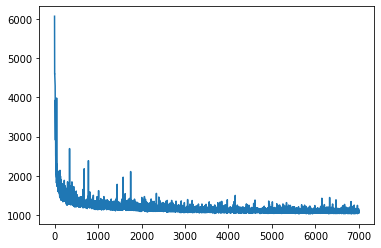

In [ ]:
plt.plot(history.history['mean_absolute_error'])


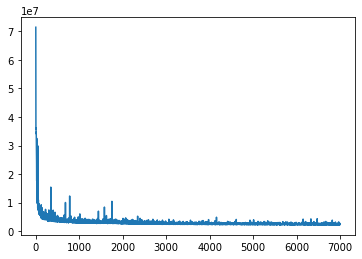

In [ ]:
plt.plot(history.history['loss'])

In [ ]:
final_model.load_weights('final_weight_nn.h5')

In [ ]:
NN_pred=final_model.predict(x_test)

42/42 [==============================] - 2s 2ms/step


In [ ]:

NN_MAE = metrics.mean_absolute_error(NN_pred, y_test)
NN_MSE = metrics.mean_squared_error(NN_pred, y_test)
NN_R2 = metrics.r2_score(NN_pred, y_test)

In [ ]:
NN_R2

0.9421895598035811

In [ ]:
NN_MSE

2066690.9708867343

In [ ]:
NN_MAE

1026.8020819365088

In [ ]:
NN_pred=[l[0] for l in NN_pred]

In [ ]:
c_nn=0
c2=0
for i in (NN_pred - y_test):
    if i > 1500 :
        c_nn+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_nn,c2+c_nn))

The number of cars that will not be sold : 81 of 1340


In [ ]:
#final_model.save_weights('final_weight_nn.h5')

## Evaluation 

In [ ]:
r2=[LinearRegression_R2,KNN_R2,RFR_R2,NN_R2]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

### R2 score

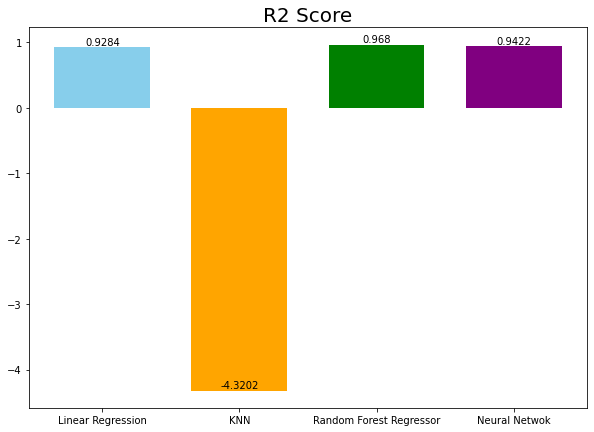

In [ ]:

fig, ax=plt.subplots(figsize=(10,7))
ax.bar(x, r2, width=0.7, color=colors)
plt.title('R2 Score',fontsize=20)
for i, value in enumerate(r2):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
msa=[LinearRegression_MAE,KNN_MAE,RFR_MAE,NN_MAE]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

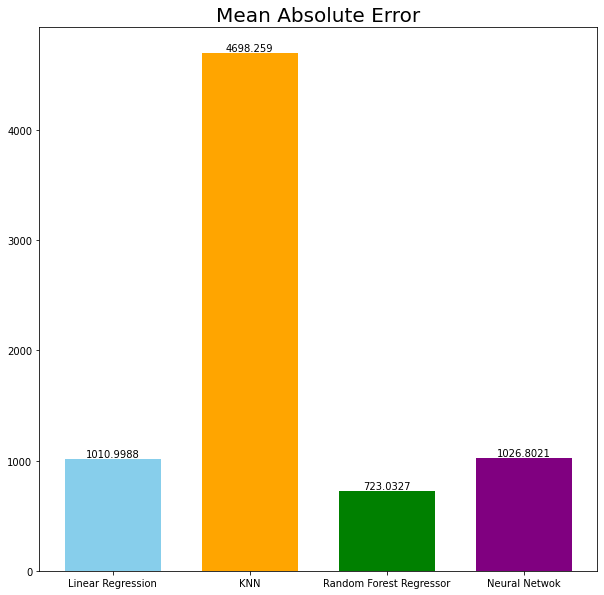

In [ ]:

fig, ax=plt.subplots(figsize=(10,10))
ax.bar(x, msa, width=0.7, color=colors)
plt.title('Mean Absolute Error',fontsize=20)
for i, value in enumerate(msa):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error

In [ ]:
mse=[LinearRegression_MSE,KNN_MSE,RFR_MSE,NN_MSE]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

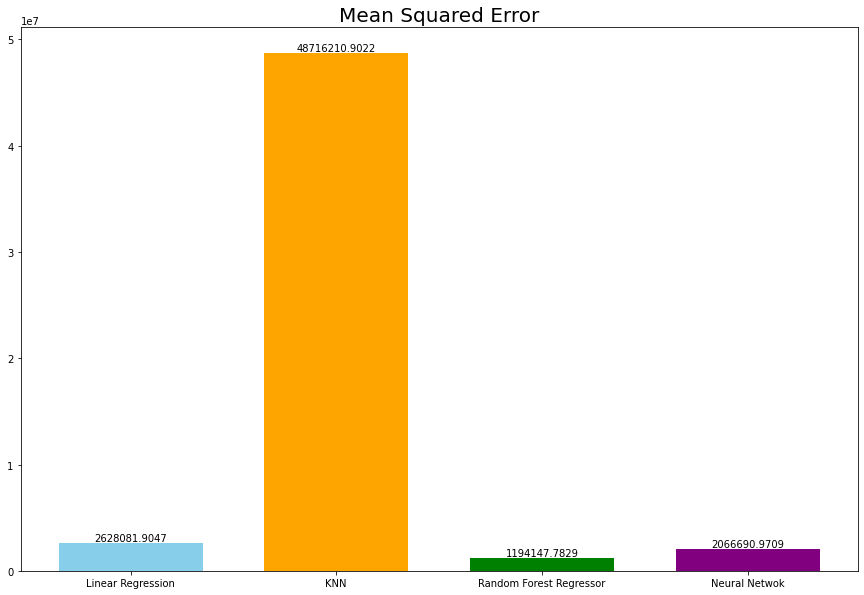

In [ ]:

fig, ax=plt.subplots(figsize=(15,10))
ax.bar(x, mse, width=0.7, color=colors)
plt.title('Mean Squared Error',fontsize=20)
for i, value in enumerate(mse):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

# Modeling With PCA (Without Data Standardization)

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
x_train.head()

,year,mileage,tax,mpg,engineSize,model_ Auris,model_ Avensis,model_ Aygo,model_ C-HR,model_ Camry,...,model_ Verso-S,model_ Yaris,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,fuelType_Diesel,fuelType_Hybrid,fuelType_Other,fuelType_Petrol
3704,2016,23901,0,69.0,1.0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
766,2012,74510,205,47.1,2.2,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
236,2020,7345,145,39.2,1.2,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
648,2018,13627,135,55.4,2.5,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3374,2015,18102,0,72.4,1.8,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [ ]:
pca = PCA()  

In [ ]:
X_train_pca = pca.fit_transform(x_train)
X_test_pca = pca.transform(x_test)

In [ ]:
explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
explained_variance_ratio

array([0.99998521, 0.99999948, 0.99999999, 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        ])

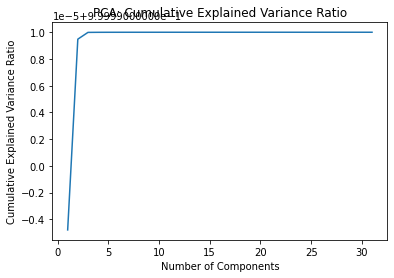

In [ ]:
# Plot the cumulative explained variance ratio
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('PCA: Cumulative Explained Variance Ratio')
plt.show()

In [ ]:
pca = PCA(n_components=4)  

In [ ]:
X_train_pca = pca.fit_transform(x_train)


In [ ]:
X_test_pca = pca.transform(x_test)

## Linear Regression

In [ ]:
LR_acp = LinearRegression()

In [ ]:
LR_acp.fit(X_train_pca, y_train)

LinearRegression()

In [ ]:
LR_pred_acp = LR_acp.predict(X_test_pca)

In [ ]:
LinearRegression_MAE_pca = metrics.mean_absolute_error(LR_pred_acp, y_test)
LinearRegression_MSE_pca = metrics.mean_squared_error(LR_pred_acp, y_test)
LinearRegression_R2_pca = metrics.r2_score(LR_pred_acp, y_test)

In [ ]:
LinearRegression_R2_pca

-2.7704228376242486

In [ ]:
LinearRegression_MAE_pca

4312.027749232852

In [ ]:
c_lr_pca=0
c2=0
for i in (LR_pred_acp - y_test):
    if i > 1500 :
        c_lr_pca+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_lr_pca,c2+c_lr_pca))

The number of cars that will not be sold : 702 of 1340


## KNN

In [ ]:
KNN_acp= KNeighborsClassifier()

In [ ]:
param_grid = {
    'n_neighbors': [3,4, 5,6, 7,8,9,10,11,12],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

In [ ]:
grid_search = GridSearchCV(estimator=KNN_acp, param_grid=param_grid, cv=5)
grid_search.fit(X_train_pca, y_train)  # X is your input data, y is the target variable


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                         'weights': ['uniform', 'distance']})

In [ ]:
best_params_knn_acp = grid_search.best_params_
best_model_knn_acp = grid_search.best_estimator_


In [ ]:
best_model_knn_acp

KNeighborsClassifier(metric='manhattan', n_neighbors=3)

In [ ]:
KNN_best_acp=best_model_knn_acp

In [ ]:
KNN_best_acp.fit(X_train_pca,y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=3)

In [ ]:
KNN_pred_acp=KNN_best_acp.predict(X_test_pca)

In [ ]:
KNN_MAE_pca = metrics.mean_absolute_error(KNN_pred_acp, y_test)
KNN_MSE_pca = metrics.mean_squared_error(KNN_pred_acp, y_test)
KNN_R2_pca = metrics.r2_score(KNN_pred_acp, y_test)

In [ ]:
KNN_R2_pca

-5.2061195069544866

In [ ]:
KNN_MAE_pca

4854.756716417911

In [ ]:
c_knn_acp=0
c2=0
for i in (KNN_pred_acp - y_test):
    if i > 1500 :
        c_knn_acp+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_knn_acp,c2+c_knn_acp))

The number of cars that will not be sold : 134 of 1340


## Random Forest Regressor

In [ ]:
RFR_pca=RandomForestRegressor()

In [ ]:
RFR_pca.fit(X_train_pca,y_train)

RandomForestRegressor()

In [ ]:
rfr_predictions_pca=RFR_pca.predict(X_test_pca)

In [ ]:
RFR_MAE_pca = metrics.mean_absolute_error(rfr_predictions_pca, y_test)
RFR_MSE_pca = metrics.mean_squared_error(rfr_predictions_pca, y_test)
RFR_R2_pca = metrics.r2_score(rfr_predictions_pca, y_test)

In [ ]:
RFR_MAE_pca

1234.5706180170575

In [ ]:
RFR_R2_pca

0.859683579171769

In [ ]:
c_rlr_pca=0
c2=0
for i in (rfr_predictions_pca - y_test):
    if i > 1500 :
        c_rlr_pca+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rlr_pca,c2+c_rlr_pca))

The number of cars that will not be sold : 142 of 1340


In [ ]:
#######################################""

In [ ]:
param_grid = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [None, 5, 10, 15],
}


In [ ]:
grid_search = GridSearchCV(estimator=RFR_pca, param_grid=param_grid, cv=5)
grid_search.fit(X_train_pca, y_train)


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 5, 10, 15],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [ ]:
best_params_rfr_acp = grid_search.best_params_
best_model_rfr_acp = grid_search.best_estimator_


In [ ]:
best_model_rfr_acp

RandomForestRegressor(n_estimators=250)

In [ ]:
best_rfr_acp=best_model_rfr_acp

In [ ]:
best_rfr_acp.fit(X_train_pca,y_train)

RandomForestRegressor(n_estimators=250)

In [ ]:
rfr_test_pred_acp=best_rfr_acp.predict(X_test_pca)

In [ ]:
rfr_test_MAE_acp = metrics.mean_absolute_error(rfr_test_pred_acp, y_test)
rfr_test_MSE_acp = metrics.mean_squared_error(rfr_test_pred_acp, y_test)
rfr_test_R2_acp = metrics.r2_score(rfr_test_pred_acp, y_test)

In [ ]:
rfr_test_R2_acp

0.8596382106828149

In [ ]:
c_rlr_pca=0
c2=0
for i in (rfr_test_pred_acp - y_test):
    if i > 1500 :
        c_rlr_pca+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rlr_pca,c2+c_rlr_pca))

The number of cars that will not be sold : 141 of 1340


In [ ]:
rfr_test_MAE_acp

1228.5045783937455

## Neural Network

In [ ]:


# Define a function to create the Keras model
def create_model_acp(learning_rate, hidden_units1,hidden_units2,optimizer):
    model = Sequential([
        Dense(hidden_units1, activation='relu', input_shape=(4,)),
        Dense(hidden_units2, activation='relu'),
        Dense(1)
    ])
    
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'adamax':
        opt = Adamax(learning_rate=learning_rate)
    elif optimizer == 'nadam':
        opt= Nadam(learning_rate=learning_rate)
    else:
        
        raise ValueError('Invalid optimizer provided.')
        
    model.compile(optimizer=opt, loss='mean_squared_error', metrics=['mean_absolute_error'])
    return model


In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='mean_absolute_error', factor=0.1, patience=100, min_lr=0.000001)


In [ ]:

# Create the final model with the best hyperparameters
final_model_pca = create_model_acp(hidden_units1=32,hidden_units2=32, learning_rate=0.01, optimizer='adam')


In [ ]:
history_pca=final_model_pca.fit(X_train_pca, y_train, epochs=7000, batch_size=64, verbose=2,callbacks=[reduce_lr])

In [ ]:
#final_model_pca.save_weights('final_weight_nn_acp.h5')

In [ ]:
final_model_pca.load_weights('final_weight_nn_acp.h5')

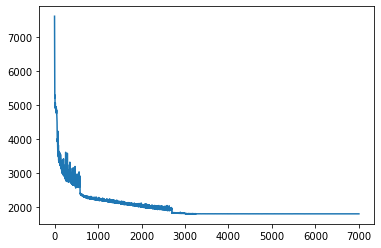

In [ ]:
plt.plot(history_pca.history['mean_absolute_error'])


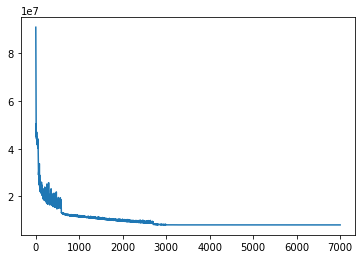

In [ ]:
plt.plot(history_pca.history['loss'])

In [ ]:
NN_pred_pca=final_model_pca.predict(X_test_pca)

42/42 [==============================] - 0s 1ms/step


In [ ]:

NN_MAE_pca = metrics.mean_absolute_error(NN_pred_pca, y_test)
NN_MSE_pca = metrics.mean_squared_error(NN_pred_pca, y_test)
NN_R2_pca = metrics.r2_score(NN_pred_pca, y_test)

In [ ]:
NN_R2_pca

0.7214614036759974

In [ ]:
NN_pred_pca=[l[0] for l in NN_pred_pca]

In [ ]:
c_nn_pca=0
c2=0
for i in (NN_pred_pca - y_test):
    if i > 1500 :
        c_nn_pca+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_nn_pca,c2+c_nn_pca))

The number of cars that will not be sold : 324 of 1340


## Evaluate PCA

In [ ]:
r2_pca=[LinearRegression_R2_pca,KNN_R2_pca,RFR_R2_pca,NN_R2_pca]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

### R2 score

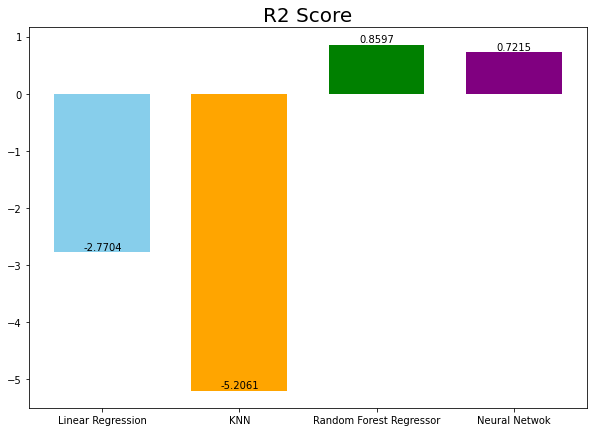

In [ ]:

fig, ax=plt.subplots(figsize=(10,7))
ax.bar(x, r2_pca, width=0.7, color=colors)
plt.title('R2 Score',fontsize=20)
for i, value in enumerate(r2_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
msa_pca=[LinearRegression_MAE_pca,KNN_MAE_pca,RFR_MAE_pca,NN_MAE_pca]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

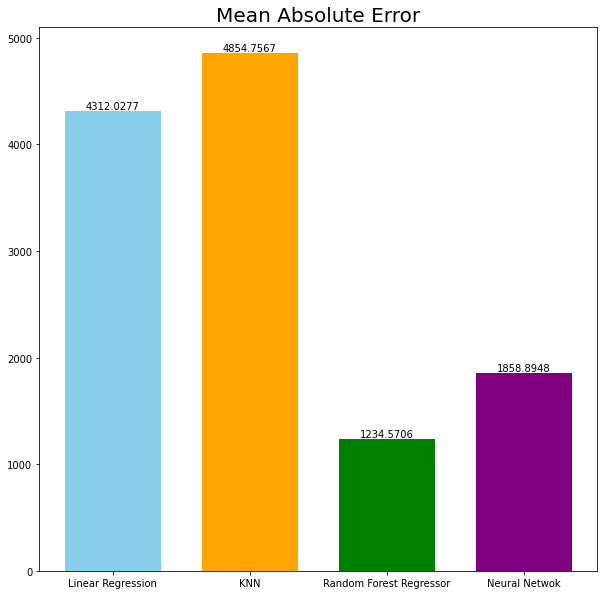

In [ ]:

fig, ax=plt.subplots(figsize=(10,10))
ax.bar(x, msa_pca, width=0.7, color=colors)
plt.title('Mean Absolute Error',fontsize=20)
for i, value in enumerate(msa_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error 

In [ ]:
mse_pca=[LinearRegression_MSE_pca,KNN_MSE_pca,RFR_MSE_pca,NN_MSE_pca]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

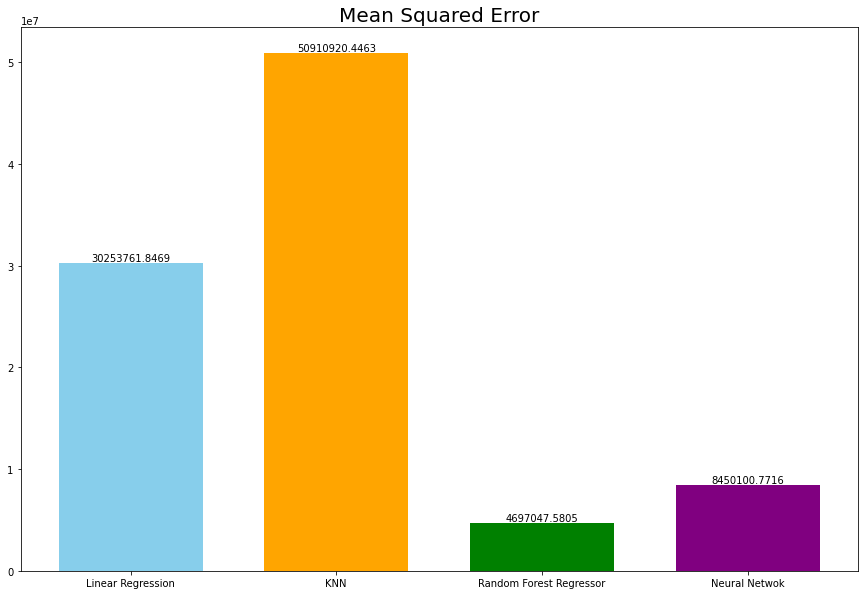

In [ ]:

fig, ax=plt.subplots(figsize=(15,10))
ax.bar(x, mse_pca, width=0.7, color=colors)
plt.title('Mean Squared Error',fontsize=20)
for i, value in enumerate(mse_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

# Data Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
features.head()

,year,mileage,tax,mpg,engineSize,model_ Auris,model_ Avensis,model_ Aygo,model_ C-HR,model_ Camry,...,model_ Verso-S,model_ Yaris,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,fuelType_Diesel,fuelType_Hybrid,fuelType_Other,fuelType_Petrol
0,2016,24089,265,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
1,2017,18615,145,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,2015,27469,265,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
3,2017,14736,150,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
4,2017,36284,145,36.2,2.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
# Create a StandardScaler object
scaler = StandardScaler()

In [ ]:
# Fit the scaler to my data
scaler.fit(x_train) 


StandardScaler()

In [ ]:
# Transform the training and test data
X_train_scaled = scaler.transform(x_train)
X_test_scaled = scaler.transform(x_test)

# Modeling Without PCA (After Data Standardization) 

## Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression 

In [ ]:
LR_scale = LinearRegression()

In [ ]:
LR_scale.fit(X_train_scaled, y_train)

LinearRegression()

In [ ]:
lr_pred_scale = LR_scale.predict(X_test_scaled)

In [ ]:
LinearRegression_MAE_scale = metrics.mean_absolute_error(lr_pred_scale, y_test)
LinearRegression_MSE_scale = metrics.mean_squared_error(lr_pred_scale, y_test)
LinearRegression_R2_scale = metrics.r2_score(lr_pred_scale, y_test)

In [ ]:
LinearRegression_R2_scale

0.928365958634191

In [ ]:
LinearRegression_MAE_scale

1011.0371315181943

In [ ]:
c_lr_scale=0
c2=0
for i in (lr_pred_scale - y_test):
    if i > 1500 :
        c_lr_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_lr_scale,c2+c_lr_scale))

The number of cars that will not be sold : 115 of 1340


## KNN

In [ ]:
KNN_scale = KNeighborsClassifier()

In [ ]:
param_grid = {
    'n_neighbors': [3,4, 5,6, 7,8,9,10,11,12],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']

}

In [ ]:
grid_search = GridSearchCV(estimator=KNN_scale, param_grid=param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)  


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                         'weights': ['uniform', 'distance']})

In [ ]:
best_params_knn_scale = grid_search.best_params_
best_model_knn_scale = grid_search.best_estimator_


In [ ]:
best_model_knn_scale

KNeighborsClassifier(metric='euclidean', n_neighbors=12)

In [ ]:
KNN_scale_best=best_model_knn_scale

In [ ]:
KNN_scale_best.fit(X_train_scaled,y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=12)

In [ ]:
KNN_scale_pred=KNN_scale_best.predict(X_test_scaled)

In [ ]:
KNN_MAE_scale = metrics.mean_absolute_error(KNN_scale_pred, y_test)
KNN_MSE_scale = metrics.mean_squared_error(KNN_scale_pred, y_test)
KNN_R2_scale = metrics.r2_score(KNN_scale_pred, y_test)

In [ ]:
KNN_R2_scale

0.8570871952059979

In [ ]:
KNN_MAE_scale

1304.4828358208956

In [ ]:
c_knn_scale=0
c2=0
for i in (KNN_scale_pred - y_test):
    if i > 1500 :
        c_knn_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_knn_scale,c2+c_knn_scale))

The number of cars that will not be sold : 71 of 1340


## Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [ ]:
RFR_scale=RandomForestRegressor()

In [ ]:
RFR_scale.fit(X_train_scaled,y_train)

RandomForestRegressor()

In [ ]:
rfr_predictions_scale=RFR_scale.predict(X_test_scaled)

In [ ]:
RFR_MAE_scale = metrics.mean_absolute_error(rfr_predictions_scale, y_test)
RFR_MSE_scale = metrics.mean_squared_error(rfr_predictions_scale, y_test)
RFR_R2_scale = metrics.r2_score(rfr_predictions_scale, y_test)

In [ ]:
RFR_R2_scale

0.9654561809864389

In [ ]:
RFR_MAE_scale

772.7762453358208

In [ ]:
c_rfr_scale=0
c2=0
for i in (rfr_predictions_scale - y_test):
    if i > 1500 :
        c_rfr_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rfr_scale,c2+c_rfr_scale))

The number of cars that will not be sold : 80 of 1340


In [ ]:
#########################################

In [ ]:
param_grid = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [None, 5, 10, 15],
}


In [ ]:
grid_search = GridSearchCV(estimator=RFR_scale, param_grid=param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 5, 10, 15],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [ ]:
best_params_rfr_scale = grid_search.best_params_
best_model_rfr_scale = grid_search.best_estimator_


In [ ]:
best_model_rfr_scale

RandomForestRegressor(max_depth=10, n_estimators=200)

In [ ]:
rfr_test_scale=best_model_rfr_scale

In [ ]:
rfr_test_scale.fit(X_train_scaled,y_train)

RandomForestRegressor(max_depth=10, n_estimators=200)

In [ ]:
rfr_test_pred_scale=rfr_test_scale.predict(X_test_scaled)

In [ ]:
RFR_MAE_scale = metrics.mean_absolute_error(rfr_test_pred_scale, y_test)
RFR_MSE_scale = metrics.mean_squared_error(rfr_test_pred_scale, y_test)
RFR_R2_scale = metrics.r2_score(rfr_test_pred_scale, y_test)

In [ ]:
RFR_R2_scale

0.9677239010937969

In [ ]:
RFR_MAE_scale

722.8764622696069

In [ ]:
c_rfr_scale=0
c2=0
for i in (rfr_predictions_scale - y_test):
    if i > 1500 :
        c_rfr_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rfr_scale,c2+c_rfr_scale))

The number of cars that will not be sold : 80 of 1340


## Neural Networks

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.regularizers import l2 
from tensorflow.keras.optimizers import Adam,Nadam,Adamax,RMSprop 
from sklearn.model_selection import GridSearchCV
import keras 
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.models import Sequential
from sklearn.metrics import mean_squared_error
from tensorflow.keras.callbacks import ReduceLROnPlateau
import matplotlib.pyplot as plt 

In [ ]:


# Define a function to create the Keras model
def create_model(learning_rate, hidden_units1,hidden_units2,optimizer):
    model = Sequential([
        Dense(hidden_units1, activation='relu', input_shape=(31,)),
        Dense(hidden_units2, activation='relu'),
        Dense(1)
    ])
    
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'adamax':
        opt = Adamax(learning_rate=learning_rate)
    elif optimizer == 'nadam':
        opt= Nadam(learning_rate=learning_rate)
    else:
        
        raise ValueError('Invalid optimizer provided.')
        
    model.compile(optimizer=opt, loss='mean_squared_error', metrics=['mean_absolute_error'])
    return model


In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='mean_absolute_error', factor=0.1, patience=100, min_lr=0.000001)


In [ ]:

# Create the final model with the best hyperparameters
final_model_scale = create_model(hidden_units1=32,hidden_units2=32, learning_rate=0.01, optimizer='adam')


In [ ]:
history_scale=final_model_scale.fit(X_train_scaled, y_train, epochs=7000, batch_size=64, verbose=2)

In [ ]:
#final_model_scale.save_weights('final_weight_scale_nn.h5')

In [ ]:
final_model_scale.load_weights('final_weight_scale_nn.h5')

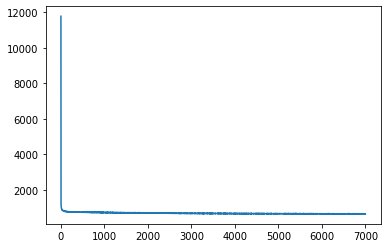

In [ ]:
plt.plot(history_scale.history['mean_absolute_error'])


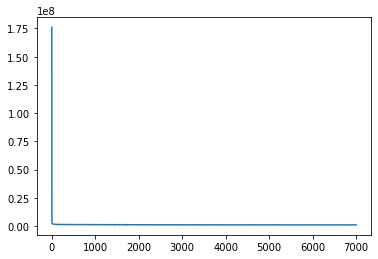

In [ ]:
plt.plot(history_scale.history['loss'])

In [ ]:
NN_pred_scale=final_model_scale.predict(X_test_scaled)

42/42 [==============================] - 0s 1ms/step


In [ ]:

NN_MAE_scale = metrics.mean_absolute_error(NN_pred_scale, y_test)
NN_MSE_scale = metrics.mean_squared_error(NN_pred_scale, y_test)
NN_R2_scale = metrics.r2_score(NN_pred_scale, y_test)

In [ ]:
NN_R2_scale

0.9741334784286498

In [ ]:
NN_MAE_scale

705.3525059031017

In [ ]:
NN_pred_scale=[l[0] for l in NN_pred_scale]

In [ ]:
c_nn_scale=0
c2=0
for i in (NN_pred - y_test):
    if i > 1500 :
        c_nn_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_nn_scale,c2+c_nn_scale))

The number of cars that will not be sold : 81 of 1340


## Evaluation

### R2 Score

In [ ]:
r2_scale=[LinearRegression_R2_scale,KNN_R2_scale,RFR_R2_scale,NN_R2_scale]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

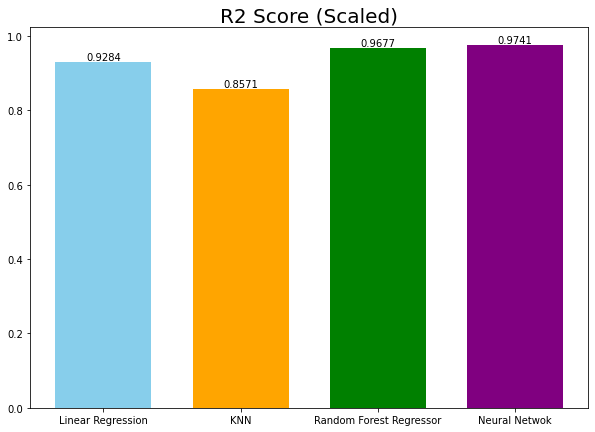

In [ ]:

fig, ax=plt.subplots(figsize=(10,7))
ax.bar(x, r2_scale, width=0.7, color=colors)
plt.title('R2 Score (Scaled)',fontsize=20)
for i, value in enumerate(r2_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
msa_scale=[LinearRegression_MAE_scale,KNN_MAE_scale,RFR_MAE_scale,NN_MAE_scale]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

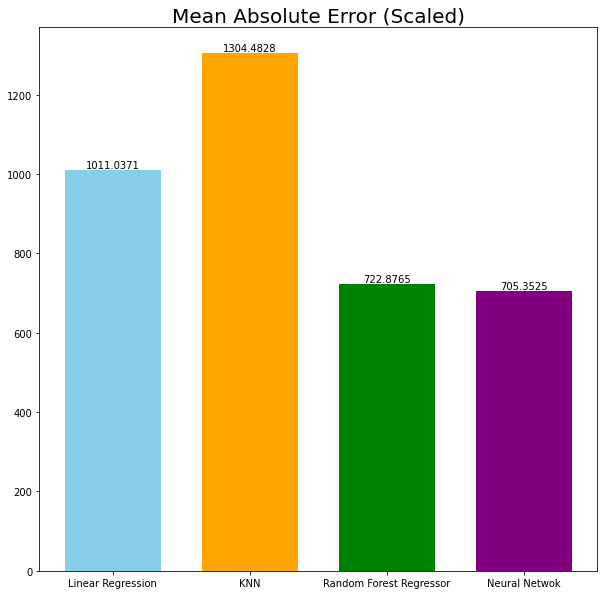

In [ ]:

fig, ax=plt.subplots(figsize=(10,10))
ax.bar(x, msa_scale, width=0.7, color=colors)
plt.title('Mean Absolute Error (Scaled)',fontsize=20)
for i, value in enumerate(msa_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error

In [ ]:
mse_scale=[LinearRegression_MSE_scale,KNN_MSE_scale,RFR_MSE_scale,NN_MSE_scale]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

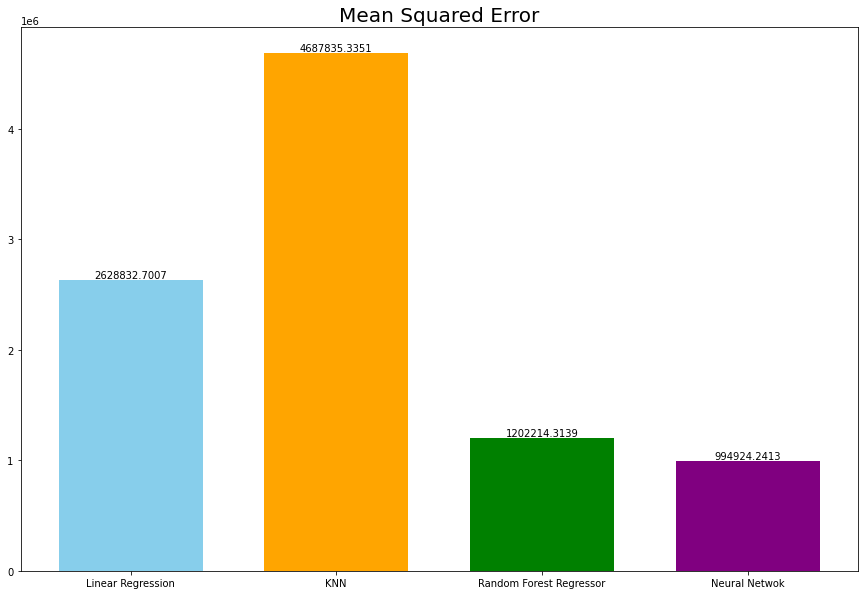

In [ ]:

fig, ax=plt.subplots(figsize=(15,10))
ax.bar(x, mse_scale, width=0.7, color=colors)
plt.title('Mean Squared Error',fontsize=20)
for i, value in enumerate(mse_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

# Modeling With PCA (After Data Standardization)

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
x_train.head()

,year,mileage,tax,mpg,engineSize,model_ Auris,model_ Avensis,model_ Aygo,model_ C-HR,model_ Camry,...,model_ Verso-S,model_ Yaris,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,fuelType_Diesel,fuelType_Hybrid,fuelType_Other,fuelType_Petrol
3704,2016,23901,0,69.0,1.0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1
766,2012,74510,205,47.1,2.2,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
236,2020,7345,145,39.2,1.2,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
648,2018,13627,135,55.4,2.5,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
3374,2015,18102,0,72.4,1.8,1,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [ ]:
pca_scale = PCA()  

In [ ]:
X_train_pca_scale = pca_scale.fit_transform(X_train_scaled)
X_test_pca_scale = pca_scale.transform(X_test_scaled)

In [ ]:
explained_variance_ratio_scale = np.cumsum(pca_scale.explained_variance_ratio_)
explained_variance_ratio_scale

array([0.15239431, 0.24080348, 0.31077123, 0.36117648, 0.40532499,
       0.44345041, 0.47975763, 0.51456911, 0.54873279, 0.58258158,
       0.6157334 , 0.64859609, 0.68123069, 0.71378084, 0.746137  ,
       0.77844246, 0.81072866, 0.84296412, 0.87432775, 0.90027925,
       0.92529517, 0.9460525 , 0.96248984, 0.9770775 , 0.98533626,
       0.99263045, 0.99853555, 1.        , 1.        , 1.        ,
       1.        ])

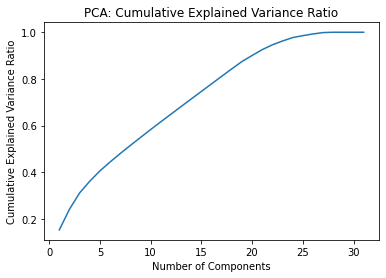

In [ ]:
# Plot the cumulative explained variance ratio
plt.plot(range(1, len(explained_variance_ratio_scale) + 1), explained_variance_ratio_scale)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('PCA: Cumulative Explained Variance Ratio')
plt.show()

In [ ]:
pca_scale = PCA(0.95)  

In [ ]:
X_train_pca_scale = pca_scale.fit_transform(X_train_scaled)
X_test_pca_scale = pca_scale.transform(X_test_scaled)

In [ ]:
l=len(pca_scale.explained_variance_.tolist())
l

23

In [ ]:
X_train_pca_scale = pca_scale.fit_transform(X_train_scaled)


In [ ]:
X_test_pca_scale = pca_scale.transform(X_test_scaled)

## Linear Regression 

In [ ]:
LR_pca_scale = LinearRegression()

In [ ]:
LR_pca_scale.fit(X_train_pca_scale, y_train)

LinearRegression()

In [ ]:
LR_pred_pca_scale = LR_pca_scale.predict(X_test_pca_scale)

In [ ]:
LinearRegression_MAE_pca_scale = metrics.mean_absolute_error(LR_pred_pca_scale, y_test)
LinearRegression_MSE_pca_scale = metrics.mean_squared_error(LR_pred_pca_scale, y_test)
LinearRegression_R2_pca_scale = metrics.r2_score(LR_pred_pca_scale, y_test)

In [ ]:
LinearRegression_R2_pca_scale

0.8749333583569646

In [ ]:
LinearRegression_MAE_pca_scale

1470.3957627272462

In [ ]:
c_nn_pca_scale=0
c2=0
for i in (LR_pred_pca_scale - y_test):
    if i > 1500 :
        c_nn_pca_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_nn_pca_scale,c2+c_nn_pca_scale))

The number of cars that will not be sold : 235 of 1340


## KNN 

In [ ]:
KNN_acp_scale= KNeighborsClassifier()

In [ ]:
param_grid = {
    'n_neighbors': [3,4, 5,6, 7,8,9,10,11,12],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

In [ ]:
grid_search = GridSearchCV(estimator=KNN_acp_scale, param_grid=param_grid, cv=5)
grid_search.fit(X_train_pca_scale, y_train)


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                         'weights': ['uniform', 'distance']})

In [ ]:
best_params_knn_pca_scale = grid_search.best_params_
best_model_knn_pca_scale = grid_search.best_estimator_


In [ ]:
best_model_knn_pca_scale

KNeighborsClassifier(metric='euclidean', n_neighbors=12)

In [ ]:
KNN_best_pca_scale=best_model_knn_pca_scale

In [ ]:
KNN_best_pca_scale.fit(X_train_pca_scale,y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=12)

In [ ]:
KNN_pred_pca_sclae=KNN_best_pca_scale.predict(X_test_pca_scale)

In [ ]:
KNN_MAE_pca_scale = metrics.mean_absolute_error(KNN_pred_pca_sclae, y_test)
KNN_MSE_pca_scale = metrics.mean_squared_error(KNN_pred_pca_sclae, y_test)
KNN_R2_pca_scale = metrics.r2_score(KNN_pred_pca_sclae, y_test)

In [ ]:
KNN_R2_pca_scale

0.8415343335885151

In [ ]:
KNN_MAE_pca_scale

1318.634328358209

In [ ]:
c_knn_pca_scale=0 
c2=0
for i in (KNN_pred_pca_sclae - y_test):
    if i > 1500 :
        c_knn_pca_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_knn_pca_scale,c2+c_knn_pca_scale))

The number of cars that will not be sold : 61 of 1340


## Random Forest Regressor

In [ ]:
RFR_pca_scale=RandomForestRegressor()

In [ ]:
RFR_pca_scale.fit(X_train_pca_scale,y_train)

RandomForestRegressor()

In [ ]:
rfr_predictions_pca_scale=RFR_pca_scale.predict(X_test_pca_scale)

In [ ]:
RFR_MAE_pca_scale = metrics.mean_absolute_error(rfr_predictions_pca_scale, y_test)
RFR_MSE_pca_scale = metrics.mean_squared_error(rfr_predictions_pca_scale, y_test)
RFR_R2_pca_scale = metrics.r2_score(rfr_predictions_pca_scale, y_test)

In [ ]:
RFR_R2_pca_scale

0.9642796459029832

In [ ]:
RFR_MAE_pca_scale

778.5347243248045

In [ ]:
c_rfr_pca_scale=0
c2=0
for i in (rfr_predictions_pca_scale - y_test):
    if i > 1500 :
        c_rfr_pca_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rfr_pca_scale,c2+c_rfr_pca_scale))

The number of cars that will not be sold : 76 of 1340


In [ ]:
#############################################""

In [ ]:
param_grid = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_depth': [None, 5, 10, 15],
}


In [ ]:
grid_search = GridSearchCV(estimator=RFR_pca_scale, param_grid=param_grid, cv=5)
grid_search.fit(X_train_pca_scale, y_train)


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [None, 5, 10, 15],
                         'n_estimators': [100, 150, 200, 250, 300]})

In [ ]:
best_params_rfr_pca_scale = grid_search.best_params_
best_model_rfr_pca_scale = grid_search.best_estimator_


In [ ]:
best_model_rfr_pca_scale

RandomForestRegressor(max_depth=10, n_estimators=200)

In [ ]:
best_rfr_pca_scale=best_model_rfr_pca_scale

In [ ]:
best_rfr_pca_scale.fit(X_train_pca_scale,y_train)

RandomForestRegressor(max_depth=10, n_estimators=200)

In [ ]:
rfr_test_pred_pca_scale=best_rfr_pca_scale.predict(X_test_pca_scale)

In [ ]:
RFR_MAE_pca_scale = metrics.mean_absolute_error(rfr_test_pred_pca_scale, y_test)
RFR_MSE_pca_scale = metrics.mean_squared_error(rfr_test_pred_pca_scale, y_test)
RFR_R2_pca_scale = metrics.r2_score(rfr_test_pred_pca_scale, y_test)

In [ ]:
RFR_R2_pca_scale

0.9663827343472051

In [ ]:
RFR_MAE_pca_scale

754.8893952000416

In [ ]:
c_rfr_pca_scale=0
c2=0
for i in (rfr_predictions_pca_scale - y_test):
    if i > 1500 :
        c_rfr_pca_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_rfr_pca_scale,c2+c_rfr_pca_scale))

The number of cars that will not be sold : 76 of 1340


## Neural Networks 

In [ ]:


# Define a function to create the Keras model
def create_model_pca_scaled(learning_rate, hidden_units1,hidden_units2,optimizer):
    model = Sequential([
        Dense(hidden_units1, activation='relu', input_shape=(l,)),
        Dense(hidden_units2, activation='relu'),
        Dense(1)
    ])
    
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'adamax':
        opt = Adamax(learning_rate=learning_rate)
    elif optimizer == 'nadam':
        opt= Nadam(learning_rate=learning_rate)
    else:
        
        raise ValueError('Invalid optimizer provided.')
        
    model.compile(optimizer=opt, loss='mean_squared_error', metrics=['mean_absolute_error'])
    return model


In [ ]:
# Create the final model with the best hyperparameters
final_model_pca_scale = create_model_pca_scaled(hidden_units1=32,hidden_units2=32, learning_rate=0.01, optimizer='adam')


In [ ]:
history_pca_scale=final_model_pca_scale.fit(X_train_pca_scale, y_train, epochs=7000, batch_size=64, verbose=2)

In [ ]:
final_model_pca_scale.save_weights('final_weight_nn_pca_scaled.h5')

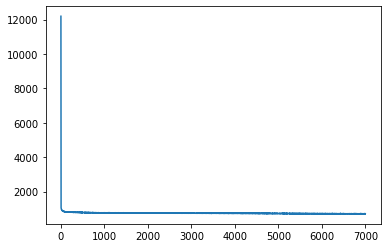

In [ ]:
plt.plot(history_pca_scale.history['mean_absolute_error'])


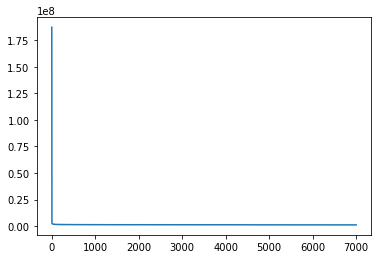

In [ ]:
plt.plot(history_pca_scale.history['loss'])

In [ ]:
final_model_pca_scale.load_weights('final_weight_nn_pca_scaled.h5')

In [ ]:
NN_pred_pca_scale=final_model_pca_scale.predict(X_test_pca_scale)

42/42 [==============================] - 0s 844us/step


In [ ]:

NN_MAE_pca_scale = metrics.mean_absolute_error(NN_pred_pca_scale, y_test)
NN_MSE_pca_scale = metrics.mean_squared_error(NN_pred_pca_scale, y_test)
NN_R2_pca_scale = metrics.r2_score(NN_pred_pca_scale, y_test)

In [ ]:
NN_R2_pca_scale

0.9637660209410852

In [ ]:
NN_MAE_pca_scale

779.3732943940519

In [ ]:
NN_pred_pca_scale=[l[0] for l in NN_pred_pca_scale]

In [ ]:
c_nn_pca_scale=0
c2=0
for i in (NN_pred - y_test):
    if i > 1500 :
        c_nn_pca_scale+=1 
    else : 
        c2+=1
print('The number of cars that will not be sold : {} of {}'.format(c_nn_pca_scale,c2+c_nn_pca_scale))

The number of cars that will not be sold : 81 of 1340


## Evaluation PCA (Scaled)

### R2 Score

In [ ]:
r2_pca_scale=[LinearRegression_R2_pca_scale,KNN_R2_pca_scale,RFR_R2_pca_scale,NN_R2_pca_scale]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

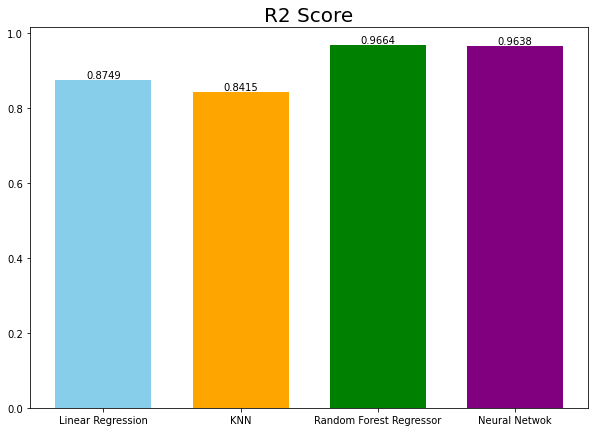

In [ ]:

fig, ax=plt.subplots(figsize=(10,7))
ax.bar(x, r2_pca_scale, width=0.7, color=colors)
plt.title('R2 Score',fontsize=20)
for i, value in enumerate(r2_pca_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
msa_pca_scale=[LinearRegression_MAE_pca_scale,KNN_MAE_pca_scale,RFR_MAE_pca_scale,NN_MAE_pca_scale]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

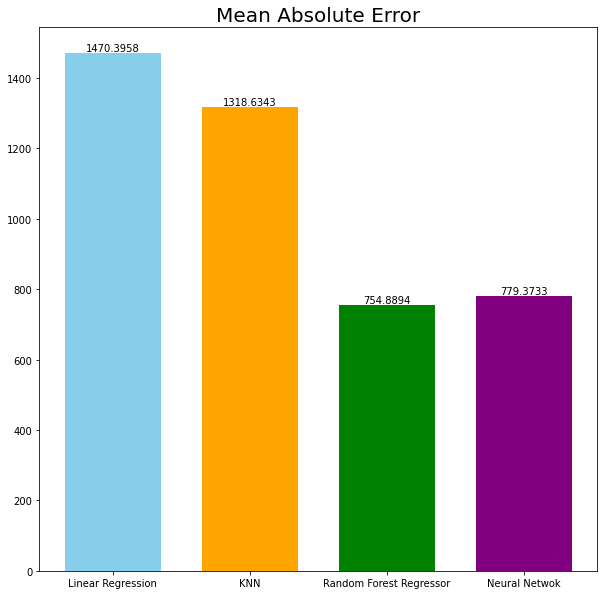

In [ ]:

fig, ax=plt.subplots(figsize=(10,10))
ax.bar(x, msa_pca_scale, width=0.7, color=colors)
plt.title('Mean Absolute Error',fontsize=20)
for i, value in enumerate(msa_pca_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error 

In [ ]:
mse_pca_scale=[LinearRegression_MSE_pca_scale,KNN_MSE_pca_scale,RFR_MSE_pca_scale,NN_MSE_pca_scale]
x=['Linear Regression','KNN','Random Forest Regressor','Neural Netwok']
colors = ['skyblue', 'orange', 'green', 'purple']

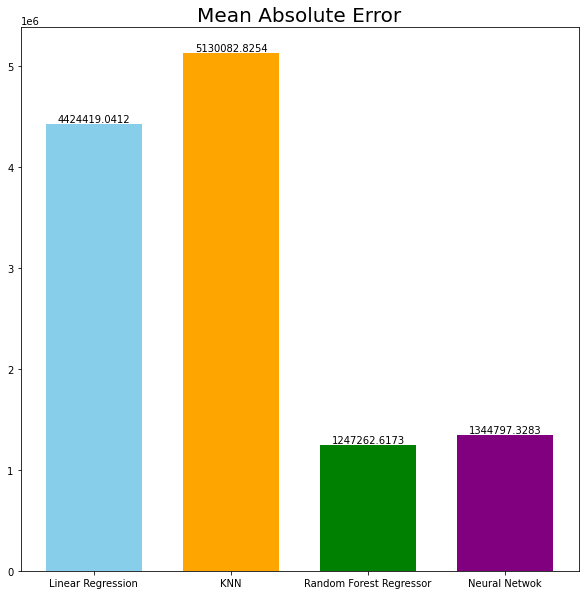

In [ ]:

fig, ax=plt.subplots(figsize=(10,10))
ax.bar(x, mse_pca_scale, width=0.7, color=colors)
plt.title('Mean Absolute Error',fontsize=20)
for i, value in enumerate(mse_pca_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

# Final Evaluation

In [ ]:
#scaled vs non scaled 
#pca scaled vs pca non scaled 
#best ( scaledvs non scaled ) vs best(pca scaled vs non scaled)


In [ ]:
#test every algorithm in 4 cases ( 4 barplots )
#compare the best shape between the 4 algortihms ==> conclude best algorithm + best methode 

## Linear Regression

### R2 Score

In [ ]:
lr_r2=[LinearRegression_R2,LinearRegression_R2_scale]
lr_r2_pca=[LinearRegression_R2_pca,LinearRegression_R2_pca_scale]

x=['Non-normalized','Normalized']
x2=['Non-normalized','Normalized']

colors = ['green', 'purple']

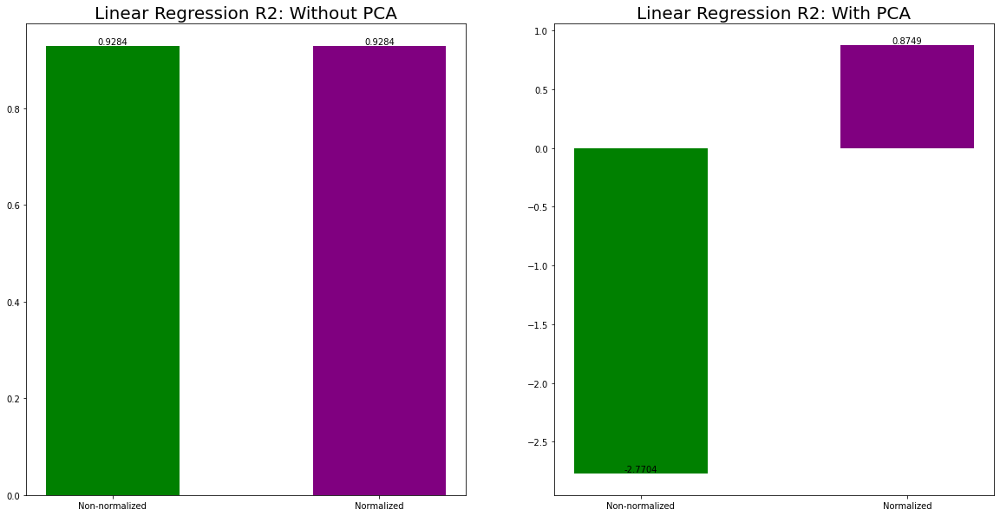

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.bar(x, lr_r2, width=0.5, color=colors)
plt.title('Linear Regression R2: Without PCA',fontsize=20)
for i, value in enumerate(lr_r2):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,2,2)
plt.bar(x, lr_r2_pca, width=0.5, color=colors)
plt.title('Linear Regression R2: With PCA',fontsize=20)
for i, value in enumerate(lr_r2_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
lr_mae=[LinearRegression_MAE,LinearRegression_MAE_scale]
lr_pca_mae=[LinearRegression_MAE_pca,LinearRegression_MAE_pca_scale]

x=['Non-normalized','Normalized']
x2=['Non-normalized','Normalized']

colors = ['green', 'purple']

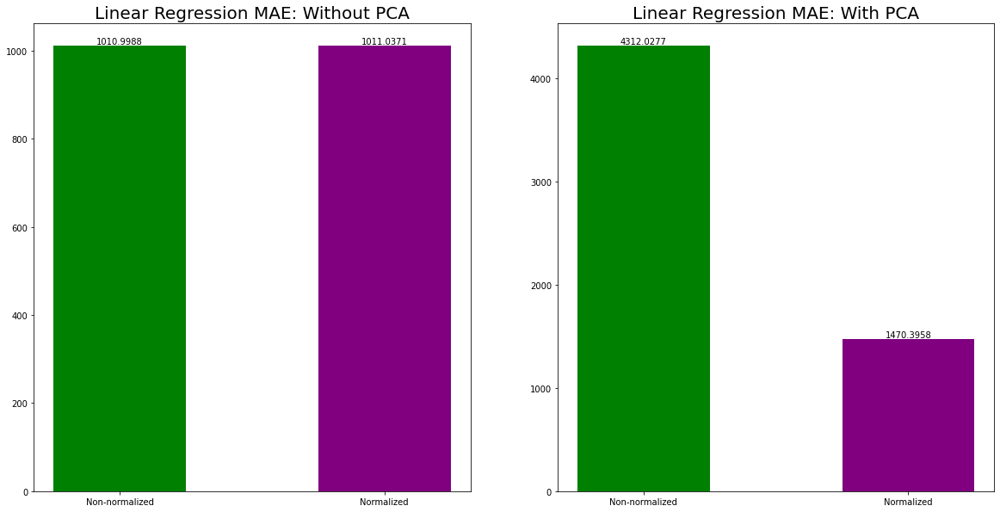

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.bar(x, lr_mae, width=0.5, color=colors)
plt.title('Linear Regression MAE: Without PCA',fontsize=20)
for i, value in enumerate(lr_mae):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,2,2)
plt.bar(x, lr_pca_mae, width=0.5, color=colors)
plt.title('Linear Regression MAE: With PCA',fontsize=20)
for i, value in enumerate(lr_pca_mae):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error

In [ ]:
lr_mse=[LinearRegression_MSE,LinearRegression_MSE_scale]
lr_pca_mse=[LinearRegression_MSE_pca,LinearRegression_MSE_pca_scale]

x=['Non-normalized','Normalized']
x2=['Non-normalized','Normalized']

colors = ['green', 'purple']

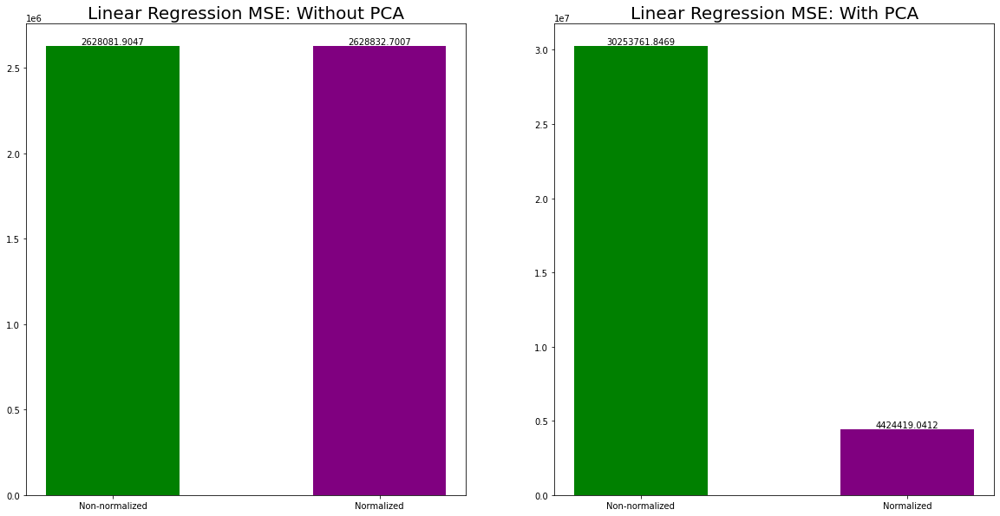

In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.bar(x, lr_mse, width=0.5, color=colors)
plt.title('Linear Regression MSE: Without PCA',fontsize=20)
for i, value in enumerate(lr_mse):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,2,2)
plt.bar(x, lr_pca_mse, width=0.5, color=colors)
plt.title('Linear Regression MSE: With PCA',fontsize=20)
for i, value in enumerate(lr_pca_mse):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Conclusion

we conclude, in our case :
   - linear regression algorithm work much better without PCA.
   - Linear Regression algorithm gives better performance when we normalize data before PCA. 
   - There is no difference between normalizing data or not when we do not use PCA** (the difference is very negligible) .
   
**BEST= Normalized data + Without PCA**


## KNN

### R2 score

In [ ]:
knn_r2=[KNN_R2,KNN_R2_scale]
knn_r2_pca=[KNN_R2_pca,KNN_R2_pca_scale]
knn_r2_scale=[KNN_R2_scale,KNN_R2_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

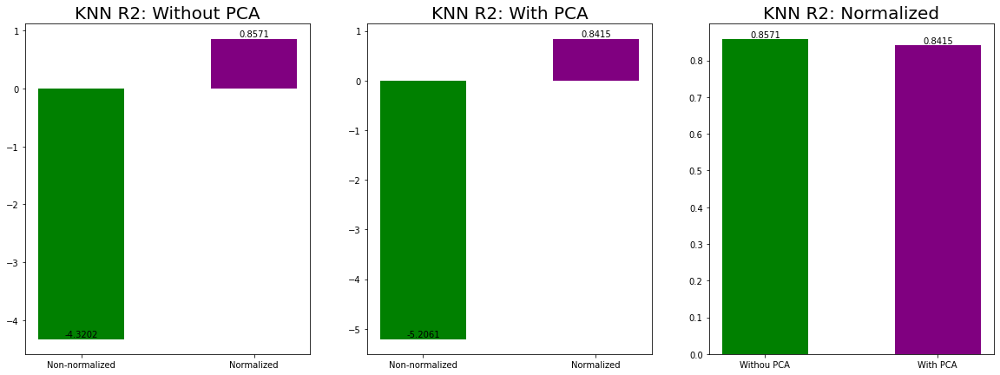

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, knn_r2, width=0.5, color=colors)
plt.title('KNN R2: Without PCA',fontsize=20)
for i, value in enumerate(knn_r2):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, knn_r2_pca, width=0.5, color=colors)
plt.title('KNN R2: With PCA',fontsize=20)
for i, value in enumerate(knn_r2_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, knn_r2_scale, width=0.5, color=colors)
plt.title('KNN R2: Normalized',fontsize=20)
for i, value in enumerate(knn_r2_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
knn_mae=[KNN_MAE,KNN_MAE_scale]
knn_mae_pca=[KNN_MAE_pca,KNN_MAE_pca_scale]
knn_mae_scale=[KNN_MAE_scale,KNN_MAE_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

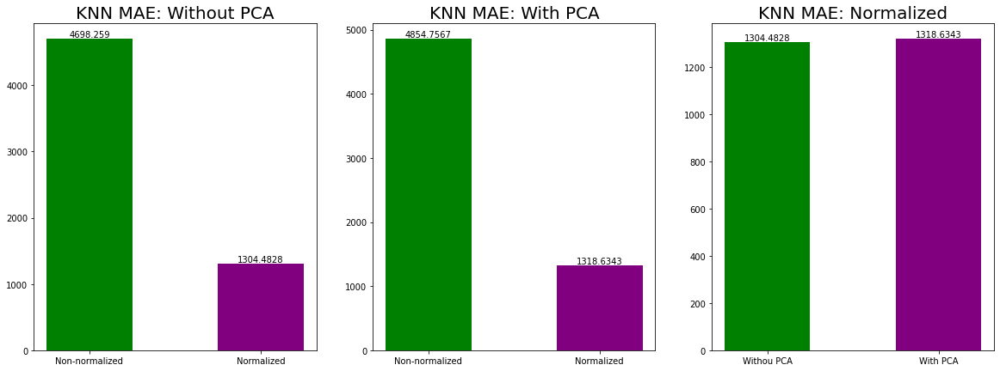

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, knn_mae, width=0.5, color=colors)
plt.title('KNN MAE: Without PCA',fontsize=20)
for i, value in enumerate(knn_mae):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, knn_mae_pca, width=0.5, color=colors)
plt.title('KNN MAE: With PCA',fontsize=20)
for i, value in enumerate(knn_mae_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, knn_mae_scale, width=0.5, color=colors)
plt.title('KNN MAE: Normalized',fontsize=20)
for i, value in enumerate(knn_mae_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error

In [ ]:
knn_mse=[KNN_MSE,KNN_MSE_scale]
knn_mse_pca=[KNN_MSE_pca,KNN_MSE_pca_scale]
knn_mse_scale=[KNN_MSE_scale,KNN_MSE_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

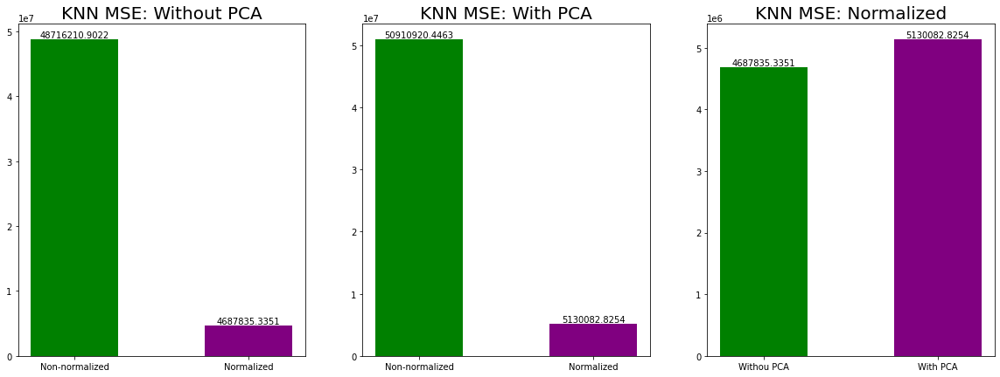

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, knn_mse, width=0.5, color=colors)
plt.title('KNN MSE: Without PCA',fontsize=20)
for i, value in enumerate(knn_mse):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, knn_mse_pca, width=0.5, color=colors)
plt.title('KNN MSE: With PCA',fontsize=20)
for i, value in enumerate(knn_mse_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, knn_mse_scale, width=0.5, color=colors)
plt.title('KNN MSE: Normalized',fontsize=20)
for i, value in enumerate(knn_mse_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Conclusion

We conclude, in our case :

  - KNN algorithm work better with normalized data .
  - KNN algorithm is slightly better without PCA.
 
**BEST= Normalized data + Without PCA**


## Random Forest Regressor

### R2 Score

In [ ]:
rfr_r2=[RFR_R2,RFR_R2_scale]
rfr_r2_pca=[RFR_R2_pca,RFR_R2_pca_scale]
rfr_r2_scale=[RFR_R2_scale,RFR_R2_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

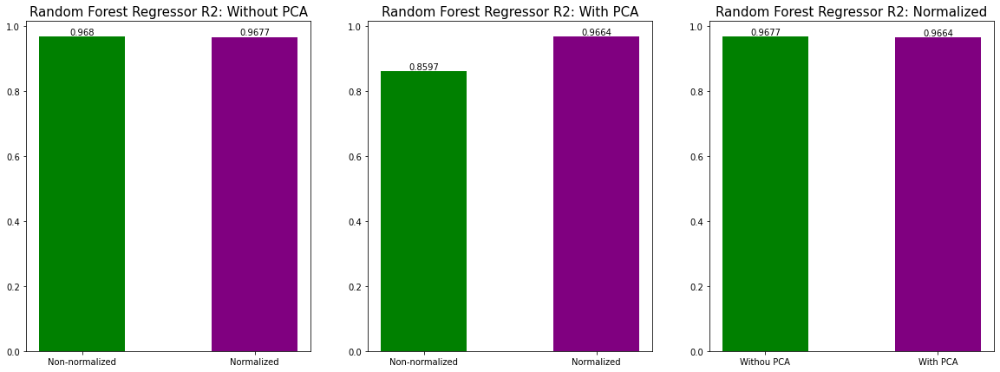

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, rfr_r2, width=0.5, color=colors)
plt.title('Random Forest Regressor R2: Without PCA',fontsize=15)
for i, value in enumerate(rfr_r2):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, rfr_r2_pca, width=0.5, color=colors)
plt.title('Random Forest Regressor R2: With PCA',fontsize=15)
for i, value in enumerate(rfr_r2_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, rfr_r2_scale, width=0.5, color=colors)
plt.title('Random Forest Regressor R2: Normalized',fontsize=15)
for i, value in enumerate(rfr_r2_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
rfr_mae=[RFR_MAE,RFR_MAE_scale]
rfr_mae_pca=[RFR_MAE_pca,RFR_MAE_pca_scale]
rfr_mae_scale=[RFR_MAE_scale,RFR_MAE_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

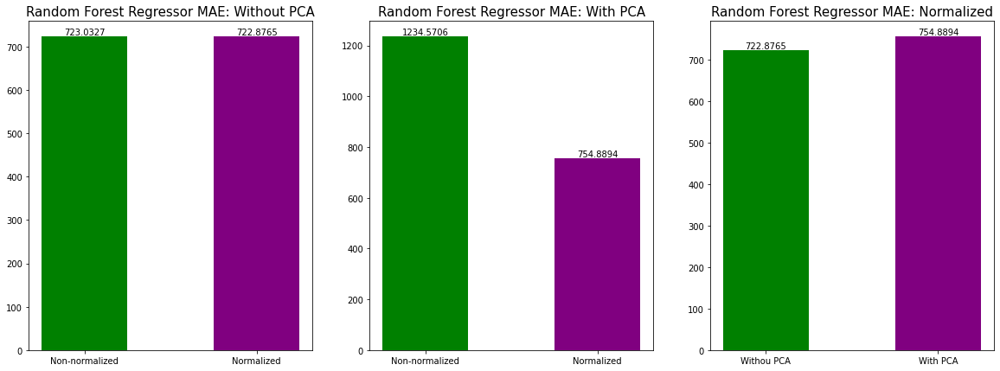

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, rfr_mae, width=0.5, color=colors)
plt.title('Random Forest Regressor MAE: Without PCA',fontsize=15)
for i, value in enumerate(rfr_mae):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, rfr_mae_pca, width=0.5, color=colors)
plt.title('Random Forest Regressor MAE: With PCA',fontsize=15)
for i, value in enumerate(rfr_mae_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, rfr_mae_scale, width=0.5, color=colors)
plt.title('Random Forest Regressor MAE: Normalized',fontsize=15)
for i, value in enumerate(rfr_mae_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error

In [ ]:
rfr_mse=[RFR_MSE,RFR_MSE_scale]
rfr_mse_pca=[RFR_MSE_pca,RFR_MSE_pca_scale]
rfr_mse_scale=[RFR_MSE_scale,RFR_MSE_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

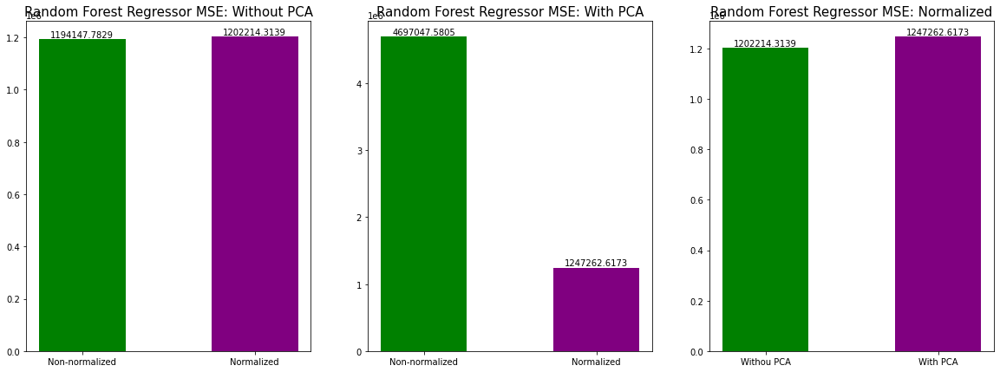

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, rfr_mse, width=0.5, color=colors)
plt.title('Random Forest Regressor MSE: Without PCA',fontsize=15)
for i, value in enumerate(rfr_mse):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, rfr_mse_pca, width=0.5, color=colors)
plt.title('Random Forest Regressor MSE: With PCA',fontsize=15)
for i, value in enumerate(rfr_mse_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, rfr_mse_scale, width=0.5, color=colors)
plt.title('Random Forest Regressor MSE: Normalized',fontsize=15)
for i, value in enumerate(rfr_mse_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Conclusion

We conclude, in our case :

  - Random Forest Regressor algorithm work better with normalized data when we use PCA .
  - there is no difference beween normalizing data or not when we do not use PCA in Random Forest Regressor (the difference is very negligible)
  - Random Forest Regressor algorithm is slightly better when we use normalized data ( the difference is very negligible).
  
**BEST= Normalized data + Without PCA**


## Neural Networks

### R2 Score 

In [ ]:
nn_r2=[NN_R2,NN_R2_scale]
nn_r2_pca=[NN_R2_pca,NN_R2_pca_scale]
nn_r2_scale=[NN_R2_scale,NN_R2_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

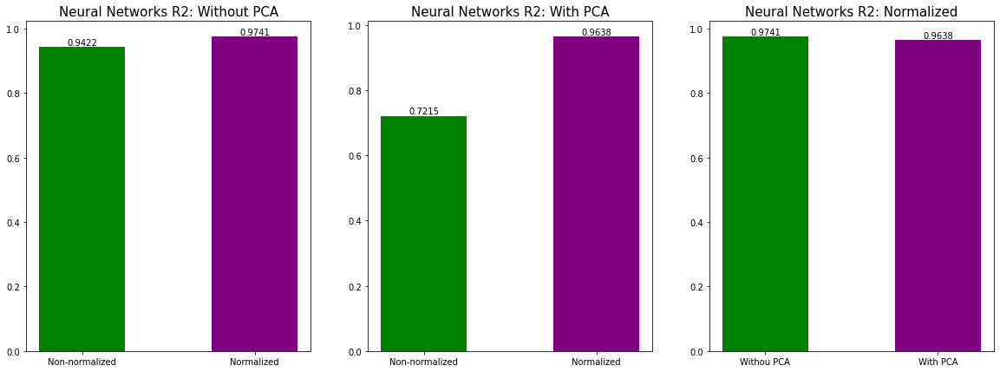

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, nn_r2, width=0.5, color=colors)
plt.title('Neural Networks R2: Without PCA',fontsize=15)
for i, value in enumerate(nn_r2):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, nn_r2_pca, width=0.5, color=colors)
plt.title('Neural Networks R2: With PCA',fontsize=15)
for i, value in enumerate(nn_r2_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, nn_r2_scale, width=0.5, color=colors)
plt.title('Neural Networks R2: Normalized',fontsize=15)
for i, value in enumerate(nn_r2_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Absolute Error

In [ ]:
nn_mae=[NN_MAE,NN_MAE_scale]
nn_mae_pca=[NN_MAE_pca,NN_MAE_pca_scale]
nn_mae_scale=[NN_MAE_scale,NN_MAE_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

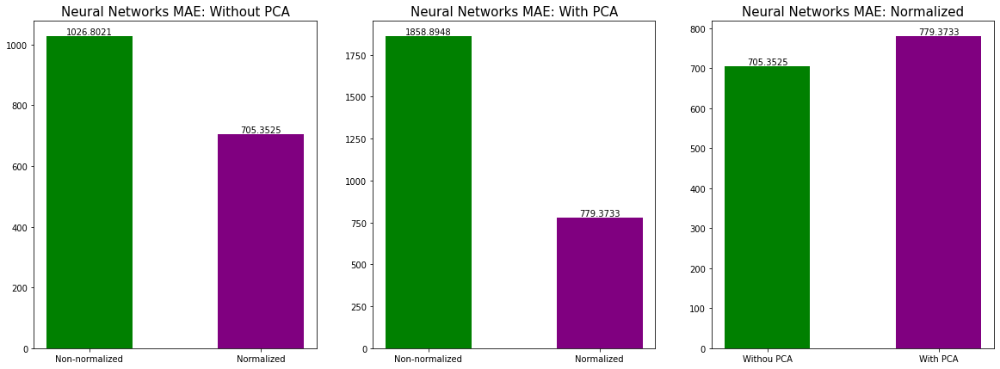

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, nn_mae, width=0.5, color=colors)
plt.title('Neural Networks MAE: Without PCA',fontsize=15)
for i, value in enumerate(nn_mae):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, nn_mae_pca, width=0.5, color=colors)
plt.title('Neural Networks MAE: With PCA',fontsize=15)
for i, value in enumerate(nn_mae_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, nn_mae_scale, width=0.5, color=colors)
plt.title('Neural Networks MAE: Normalized',fontsize=15)
for i, value in enumerate(nn_mae_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Mean Squared Error

In [ ]:
nn_mse=[NN_MSE,NN_MSE_scale]
nn_mse_pca=[NN_MSE_pca,NN_MSE_pca_scale]
nn_mse_scale=[NN_MSE_scale,NN_MSE_pca_scale]


x=['Non-normalized','Normalized']
x2=['Withou PCA','With PCA']

colors = ['green', 'purple']

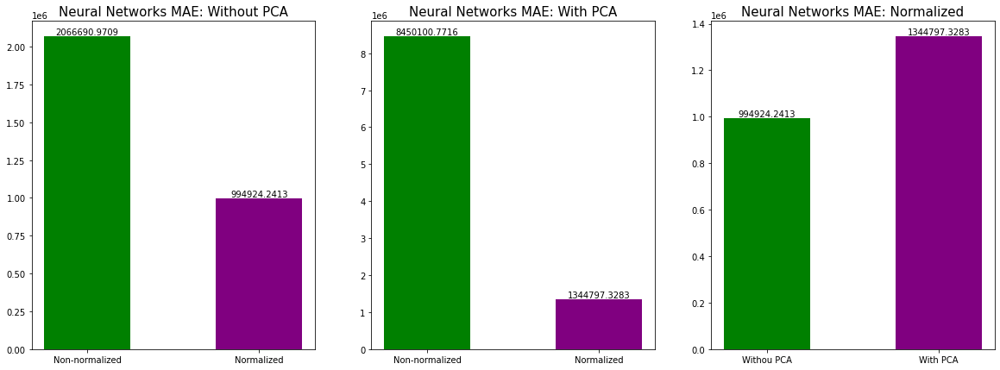

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, nn_mse, width=0.5, color=colors)
plt.title('Neural Networks MAE: Without PCA',fontsize=15)
for i, value in enumerate(nn_mse):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.subplot(1,3,2)
plt.bar(x, nn_mse_pca, width=0.5, color=colors)
plt.title('Neural Networks MAE: With PCA',fontsize=15)
for i, value in enumerate(nn_mse_pca):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
    
plt.subplot(1,3,3)
plt.bar(x2, nn_mse_scale, width=0.5, color=colors)
plt.title('Neural Networks MAE: Normalized',fontsize=15)
for i, value in enumerate(nn_mse_scale):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')

### Conclusion

We Conclude, in our case:

   - Neural Networks work better with Normalized data 
   - Neural Networks work better without PCA
   - NEURAL Networks work much better with Normalized data when we use PCA
   
**BEST= Normalized data + Without PCA**


## Best Algorithm

In [ ]:
R2=[LinearRegression_R2_scale,KNN_R2_scale,RFR_R2_scale,NN_R2_scale]
mae=[LinearRegression_MAE_scale,KNN_MAE_scale,RFR_MAE_scale,NN_MAE_scale]
mse=[LinearRegression_MSE_scale,KNN_MSE_scale,RFR_MSE_scale,NN_MSE_scale]


x=['Best Linear Regression','Best KNN','Best Random Forest Regressor','Best Neural Networks']


colors = ['skyblue', 'orange', 'green', 'purple']

([0, 1, 2, 3],
 [Text(0, 0, ''), Text(0, 0, ''), Text(0, 0, ''), Text(0, 0, '')])

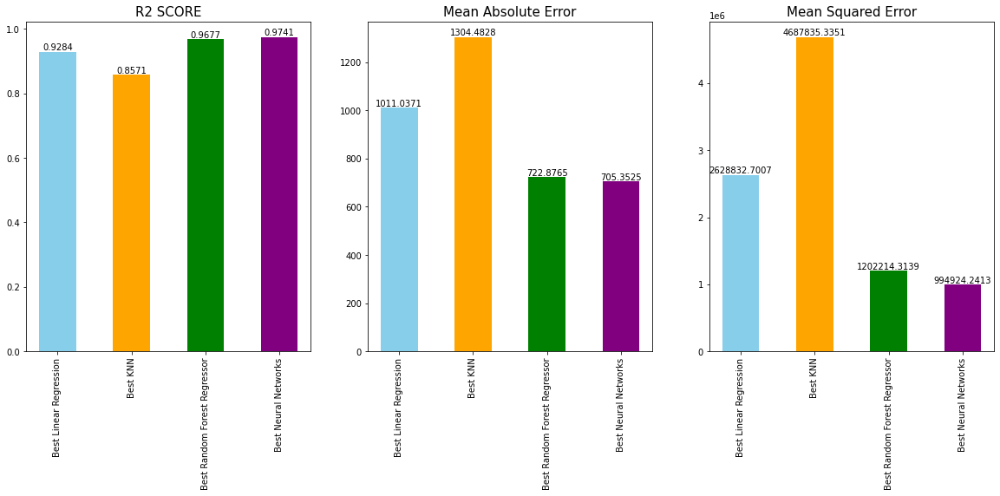

In [ ]:
plt.figure(figsize=(20,7))
plt.subplot(1,3,1)
plt.bar(x, R2, width=0.5, color=colors)
plt.title('R2 SCORE',fontsize=15)
for i, value in enumerate(R2):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.xticks(rotation=90)
plt.subplot(1,3,2)
plt.bar(x, mae, width=0.5, color=colors)
plt.title('Mean Absolute Error',fontsize=15)
for i, value in enumerate(mae):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.xticks(rotation=90)    
plt.subplot(1,3,3)
plt.bar(x, mse, width=0.5, color=colors)
plt.title('Mean Squared Error',fontsize=15)
for i, value in enumerate(mse):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom')
plt.xticks(rotation=90)

=> **Neural networks (R2_score= 97.41% and MAE = 705.35 )** and **Random Forest Regressor (R2_score= 96.77% and MAE = 722.88 )** are the best models . 

=> **Neurall networks** is **slightly better** than **Random Forest Regressor**. 

In [ ]:
c=[c_rfr_scale,c_nn_scale]


x=['Best Random Forest Regressor','Best Neural Networks']


colors = ['green', 'purple']

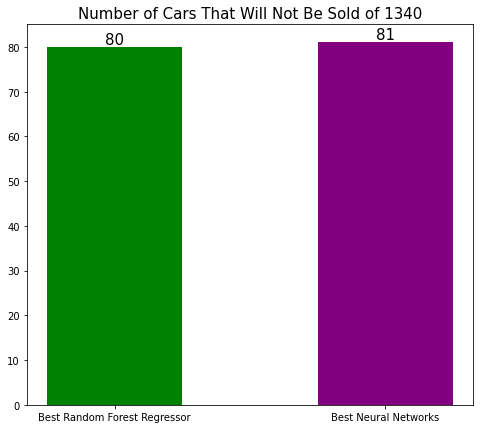

In [ ]:
plt.figure(figsize=(8,7))
plt.bar(x, c, width=0.5, color=colors)
plt.title(f'Number of Cars That Will Not Be Sold of {x_test.shape[0]}',fontsize=15)
for i, value in enumerate(c):
    plt.text(i, value, str(round(value, 4)), ha='center', va='bottom',fontsize=15)

In [ ]:
p= 80/1340
p

0.05970149253731343

=> Based on the **'success criteria'**, it is projected that approximately **6% of the cars will not be sold** when **Neural Networks** or **Random Forest Regressor** models are employed.

# Conclusion

To summarize, since our research revealed strong correlations between all the examined features and the price, we can confidently assert that each feature makes a substantial contribution to accurately predicting the price. **Consequently, we incorporated all these features in training our model.**

­

- **Neural Networks** and **Random Forest Regressor** are the **best algorithms** to predict used car prices:
    - **Neural Networks** : 
        - R2 SCORE = 97.41 % 
        
        - MAE = 705.35
        
        - MSE = 994 924
    
    - **Random Forest Regressor** : 
        - R2 SCORE = 96.77 % 
        - MAE = 722.88
        - MSE = 1 202 214

- **PCA** is **not necessary** in our case 
- Before using **PCA** we **should normalize data** to have **acceptable results.**

- **Normalizing data** helps the models to have **better results.**

- Based on the **'success criteria'**, it is projected that approximately **6% of the cars will not be sold** when **Neural Networks** or **Random Forest Regressor** models are employed.